In [2]:
import re
import pandas as pd
import numpy as np
import gc

In [3]:
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
train_df = pd.read_csv('C:/Users/Tigmanshu/Downloads/Property_Valuation_and_Assessment_Data.csv', sep = ",",low_memory=False)
#train_df.isnull().sum(axis = 0)
# 
#train_df.dtypes
# owner_counts=train_df.OWNER.value_counts()
# #train_df['OWNER'].unique()
# owner_counts

In [4]:
train_df.head(5)

,BBLE,BORO,BLOCK,LOT,EASEMENT,OWNER,BLDGCL,TAXCLASS,LTFRONT,LTDEPTH,EXT,STORIES,FULLVAL,AVLAND,AVTOT,EXLAND,EXTOT,EXCD1,STADDR,POSTCODE,EXMPTCL,BLDFRONT,BLDDEPTH,AVLAND2,AVTOT2,EXLAND2,EXTOT2,EXCD2,PERIOD,YEAR,VALTYPE,Borough,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,NTA
0,1000010010,1,1,10,NaN,GOVERNORS ISLAND CORP,Y4,4,177,0,NaN,NaN,368983000,104445450,166042350,104445450,166042350,2231.0,1 GOVERNORS ISLAND,10004.0,X3,0,0,104445450.0,157532850.0,104445450.0,157532850.0,NaN,FINAL,2018/19,AC-TR,MANHATTAN,40.690096,-74.012866,101.0,1.0,5.0,1086389.0,park-cemetery-etc-Manhattan
1,1000010101,1,1,101,NaN,U S GOVT LAND & BLDGS,P7,4,500,1046,NaN,NaN,30166000,4225950,13574700,4225950,13574700,4600.0,1 LIBERTY ISLAND,10004.0,X3,0,0,4225950.0,12148920.0,4225950.0,12148920.0,NaN,FINAL,2018/19,AC-TR,MANHATTAN,40.689887,-74.045337,101.0,1.0,1.0,1090092.0,park-cemetery-etc-Manhattan
2,1000010201,1,1,201,NaN,U S GOVT LAND & BLDGS,Z9,4,63,0,NaN,NaN,255678000,14972400,115055100,14972400,115055100,4600.0,1 ELLIS ISLAND,10004.0,X3,0,0,14972400.0,107838180.0,14972400.0,107838180.0,NaN,FINAL,2018/19,AC-TR,MANHATTAN,40.698831,-74.039753,101.0,1.0,1.0,1089253.0,park-cemetery-etc-Manhattan
3,1000010301,1,1,301,NaN,NaN,U0,4,0,0,NaN,NaN,0,0,0,0,0,NaN,JOE DIMAGGIO HIGHWAY,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,FINAL,2018/19,AC-TR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1000010401,1,1,401,NaN,NaN,U0,4,0,0,NaN,NaN,0,0,0,0,0,NaN,JOE DIMAGGIO HIGHWAY,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,FINAL,2018/19,AC-TR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
#train_df[train_df.BBLE=='1000010301'][['FULLVAL','YEAR']]

In [7]:
# train_df[train_df.FULLVAL=='0'].value_counts()
train_df.shape

(9845857, 39)

In [8]:
def func_easement(ease):
    if ease in ['F','G','H','I','J','K','L','M']:
        return 'E'
    elif pd.isnull(ease):
        return np.nan
    else:
        return ease
    
def func_zero_fix(value):
    if value==0:
        return np.nan
    else:
        return value
    
def func_exc1(value):

    if value in ind_values:
        return value
    elif value==np.nan:
        return np.nan
    else:
        return 'Other'
    
# def func_postcode(postcode):
#     if pd.notna(postcode):
#         return int(str(postcode)[:4])
#     else :
#         return np.nan
    
def func_exc2(value):

    if value in ind_values:
        return value
    elif value==np.nan:
        return np.nan
    else:
        return 'Other'
    
def parse_year(year):
    re1='.*?'	# Non-greedy match on filler
    re2='\\d+'	# Uninteresting: int
    re3='.*?'	# Non-greedy match on filler
    re4='(\\d+)'	# Integer Number 1

    rg = re.compile(re1+re2+re3+re4,re.IGNORECASE|re.DOTALL)
    m = rg.search(year)
    if m:
        int1=m.group(1)
        return(int("20"+int1))
    
def parse_class(cl):
    return (cl[0:1])
    
    

In [9]:
train_df['YEAR'] = train_df['YEAR'].apply(lambda x: parse_year(x))
tr_df = train_df.loc[(train_df.YEAR > 2014) & (train_df.YEAR <= 2018) ].copy()

# del train_df
# gc.collect()

In [10]:
# train_df['YEAR'] = train_df['YEAR'].apply(lambda x: parse_year(x))
te_df = train_df.loc[train_df.YEAR > 2018].copy()

In [11]:
print(tr_df.shape)
print(te_df.shape)

(4402955, 39)
(1116592, 39)


In [6]:

# train_df['AVLAND'] = train_df['AVLAND'].apply(lambda x: func_zero_fix(x))
# train_df['AVTOT'] = train_df['AVTOT'].apply(lambda x: func_zero_fix(x))
# train_df['EXLAND'] = train_df['EXLAND'].apply(lambda x: func_zero_fix(x))
# train_df['EXTOT'] = train_df['EXTOT'].apply(lambda x: func_zero_fix(x))
#train_df['STORIES'].unique()
# train_df.FULLVAL.value_counts()
#(train_df['FULLVAL'] == 0).value_counts()
# train_df.shape
# train_df.isnull().sum(axis = 0)
# train_df.head(5)
# train_df[train_df['BLDFRONT'] ==0].head(5)
# (train_df['EXLAND'] == 0).value_counts()
# #train_df['EXCD2'].unique()
# train_df.EXCD2.value_counts()

In [12]:

tr_df['FULLVAL'] = tr_df['FULLVAL'].apply(lambda x: func_zero_fix(x))
tr_df['EASEMENT'] = tr_df['EASEMENT'].apply(lambda x: func_easement(x))
tr_df = tr_df.dropna(subset=["FULLVAL"])
EXCD1_counts=tr_df.EXCD1.value_counts()
EXCD1_counts=EXCD1_counts[EXCD1_counts>1000]
ind_values=EXCD1_counts.index
tr_df['EXCD1'] = tr_df['EXCD1'].apply(lambda x: func_exc1(x))
tr_df['BLDFRONT'] = tr_df['BLDFRONT'].apply(lambda x: func_zero_fix(x))
tr_df['BLDDEPTH'] = tr_df['BLDDEPTH'].apply(lambda x: func_zero_fix(x))
EXCD2_counts=tr_df.EXCD2.value_counts()
EXCD2_counts=EXCD2_counts[EXCD2_counts>2200]
ind_values=EXCD2_counts.index
tr_df['EXCD2'] = tr_df['EXCD2'].apply(lambda x: func_exc2(x)) 
tr_df.head(5)
tr_df=tr_df.drop(["BBLE","LOT","OWNER","STADDR","VALTYPE",'Borough','PERIOD','Community Board','Council District','BIN','NTA'],axis=1)
category_dummies=pd.get_dummies(tr_df[['EASEMENT']],prefix=['EASEMENT'])
tr_df=pd.concat([tr_df,category_dummies],axis=1).drop(['EASEMENT'],axis=1)
tr_df['BORO'] = tr_df['BORO'].astype(str)
category_dummies=pd.get_dummies(tr_df[['BORO']],prefix=['BORO'])
tr_df=pd.concat([tr_df,category_dummies],axis=1).drop(['BORO'],axis=1)
tr_df=tr_df.drop(["BLOCK"],axis=1)
tr_df['BLDGCL'] = tr_df['BLDGCL'].apply(lambda x: parse_class(x))   
category_dummies=pd.get_dummies(tr_df[['BLDGCL']],prefix=['BLDGCL'])
tr_df=pd.concat([tr_df,category_dummies],axis=1).drop(['BLDGCL'],axis=1)
category_dummies=pd.get_dummies(tr_df[['TAXCLASS']],prefix=['TAXCLASS'])
tr_df=pd.concat([tr_df,category_dummies],axis=1).drop(['TAXCLASS'],axis=1)

category_dummies=pd.get_dummies(tr_df[['EXT']],prefix=['EXT'])
tr_df=pd.concat([tr_df,category_dummies],axis=1).drop(['EXT'],axis=1)
category_dummies=pd.get_dummies(tr_df[['EXMPTCL']],prefix=['EXMPTCL'])
tr_df=pd.concat([tr_df,category_dummies],axis=1).drop(['EXMPTCL'],axis=1)

tr_df['EXCD1'] = tr_df['EXCD1'].astype(str)
tr_df['EXCD2'] = tr_df['EXCD2'].astype(str)

category_dummies=pd.get_dummies(tr_df[['EXCD1']],prefix=['EXCD1'])
tr_df=pd.concat([tr_df,category_dummies],axis=1).drop(['EXCD1'],axis=1)

category_dummies=pd.get_dummies(tr_df[['EXCD2']],prefix=['EXCD2'])
tr_df=pd.concat([tr_df,category_dummies],axis=1).drop(['EXCD2'],axis=1)

In [13]:
# tr_df.dtypes
# tr_df['POSTCODE'] = tr_df['POSTCODE'].astype(str)
# category_dummies=pd.get_dummies(tr_df[['POSTCODE']],prefix=['POSTCODE'])
# tr_df=pd.concat([tr_df,category_dummies],axis=1).drop(['POSTCODE'],axis=1)

In [14]:
EXCD1_counts=te_df.EXCD1.value_counts()
EXCD1_counts=EXCD1_counts[EXCD1_counts>1000]
ind_values=EXCD1_counts.index
te_df['EXCD1'] = te_df['EXCD1'].apply(lambda x: func_exc1(x))

EXCD2_counts=te_df.EXCD2.value_counts()
EXCD2_counts=EXCD2_counts[EXCD2_counts>297]
ind_values=EXCD2_counts.index
te_df['EXCD2'] = te_df['EXCD2'].apply(lambda x: func_exc2(x)) 


te_df['FULLVAL'] = te_df['FULLVAL'].apply(lambda x: func_zero_fix(x))
te_df['EASEMENT'] = te_df['EASEMENT'].apply(lambda x: func_easement(x))
te_df = te_df.dropna(subset=["FULLVAL"])

te_df['BLDFRONT'] = te_df['BLDFRONT'].apply(lambda x: func_zero_fix(x))
te_df['BLDDEPTH'] = te_df['BLDDEPTH'].apply(lambda x: func_zero_fix(x))

# te_df.head(5)
te_df=te_df.drop(["BBLE","LOT","OWNER","STADDR","VALTYPE",'Borough','PERIOD','Community Board','Council District','BIN','NTA'],axis=1)
category_dummies=pd.get_dummies(te_df[['EASEMENT']],prefix=['EASEMENT'])
te_df=pd.concat([te_df,category_dummies],axis=1).drop(['EASEMENT'],axis=1)

te_df['BORO'] = te_df['BORO'].astype(str)
category_dummies=pd.get_dummies(te_df[['BORO']],prefix=['BORO'])
te_df=pd.concat([te_df,category_dummies],axis=1).drop(['BORO'],axis=1)
te_df=te_df.drop(["BLOCK"],axis=1)
te_df['BLDGCL'] = te_df['BLDGCL'].apply(lambda x: parse_class(x))   
category_dummies=pd.get_dummies(te_df[['BLDGCL']],prefix=['BLDGCL'])
te_df=pd.concat([te_df,category_dummies],axis=1).drop(['BLDGCL'],axis=1)
category_dummies=pd.get_dummies(te_df[['TAXCLASS']],prefix=['TAXCLASS'])
te_df=pd.concat([te_df,category_dummies],axis=1).drop(['TAXCLASS'],axis=1)

category_dummies=pd.get_dummies(te_df[['EXT']],prefix=['EXT'])
te_df=pd.concat([te_df,category_dummies],axis=1).drop(['EXT'],axis=1)
category_dummies=pd.get_dummies(te_df[['EXMPTCL']],prefix=['EXMPTCL'])
te_df=pd.concat([te_df,category_dummies],axis=1).drop(['EXMPTCL'],axis=1)

te_df['EXCD1'] = te_df['EXCD1'].astype(str)
te_df['EXCD2'] = te_df['EXCD2'].astype(str)

category_dummies=pd.get_dummies(te_df[['EXCD1']],prefix=['EXCD1'])
te_df=pd.concat([te_df,category_dummies],axis=1).drop(['EXCD1'],axis=1)

category_dummies=pd.get_dummies(te_df[['EXCD2']],prefix=['EXCD2'])
te_df=pd.concat([te_df,category_dummies],axis=1).drop(['EXCD2'],axis=1)


In [15]:
print(tr_df.shape)
print(te_df.shape)

(4344419, 138)
(1101129, 113)


In [16]:
diff_list=[]
diff_list2=[]
diff_list1=list((tr_df.columns).difference(te_df.columns))
diff_list2=list((te_df.columns).difference(tr_df.columns))
#diff_list1.remove('long_LOS')
tr_df=tr_df.drop(diff_list1,axis=1)
te_df=te_df.drop(diff_list2,axis=1)
print(diff_list1)
print(diff_list2)
print(tr_df.shape)
print(te_df.shape)


['EXCD1_1019.0', 'EXCD1_1022.0', 'EXCD1_1101.0', 'EXCD1_1401.0', 'EXCD1_1404.0', 'EXCD1_1504.0', 'EXCD1_1505.0', 'EXCD1_1521.0', 'EXCD1_1601.0', 'EXCD1_1602.0', 'EXCD1_1604.0', 'EXCD1_1990.0', 'EXCD1_2133.0', 'EXCD1_2191.0', 'EXCD1_2201.0', 'EXCD1_2261.0', 'EXCD1_2262.0', 'EXCD1_3390.0', 'EXCD1_3410.0', 'EXCD1_3420.0', 'EXCD1_5106.0', 'EXCD1_5108.0', 'EXCD1_5109.0', 'EXCD1_5111.0', 'EXCD1_5117.0', 'EXCD1_5129.0', 'EXCD1_6320.0']
['EXCD2_1101.0', 'EXCD2_5129.0']
(4344419, 111)
(1101129, 111)


In [17]:
diff_list1

['EXCD1_1019.0',
 'EXCD1_1022.0',
 'EXCD1_1101.0',
 'EXCD1_1401.0',
 'EXCD1_1404.0',
 'EXCD1_1504.0',
 'EXCD1_1505.0',
 'EXCD1_1521.0',
 'EXCD1_1601.0',
 'EXCD1_1602.0',
 'EXCD1_1604.0',
 'EXCD1_1990.0',
 'EXCD1_2133.0',
 'EXCD1_2191.0',
 'EXCD1_2201.0',
 'EXCD1_2261.0',
 'EXCD1_2262.0',
 'EXCD1_3390.0',
 'EXCD1_3410.0',
 'EXCD1_3420.0',
 'EXCD1_5106.0',
 'EXCD1_5108.0',
 'EXCD1_5109.0',
 'EXCD1_5111.0',
 'EXCD1_5117.0',
 'EXCD1_5129.0',
 'EXCD1_6320.0']

In [20]:
from sklearn.model_selection import train_test_split
from sklearn import metrics
x_train, x_val, y_train, y_val = train_test_split(tr_df.drop(columns = ['FULLVAL']), 
                                                    tr_df['FULLVAL'], 
                                                    test_size=0.2, 
                                                    random_state=1)

In [13]:
import gc
# del train_df
# del tr_df

gc.collect()

10

In [50]:
import xgboost as xgb
dtrain = xgb.DMatrix(data = x_train, label = y_train)
dval = xgb.DMatrix(data = x_val, label = y_val)


C:\Users\Tigmanshu\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


In [51]:
watchlist = [(dtrain, 'train'), (dval, 'eval')]
num_round = 50 #This is another hyperparameter of sorts

In [52]:
param = {'max_depth':6,
         'eta': 0.3,
         'silent':1,
         'objective':'reg:squarederror',
         #'eval_metric': 'rmse',
          #'gamma': 0.10983,
          #'lambda': 10,
          #'alpha': 10,
          #'subsample' : 0.78,
          #'min_child_weight': 5,
          #'colsample_bytree' :0.8 
          #,'colsample_bynode' : 0.6
          #,'colsample_bylevel':0.7
          #,'scale_pos_weight' : 0.276,
          'maximize' : 'FALSE',
          'n_jobs' : -1
         #,'base_score' : ???
         #,'max_delta_step' : 6.0
        }

xgb_model = xgb.train(param, dtrain, num_round, watchlist, early_stopping_rounds = 20)


[0]	train-rmse:1.08617e+07	eval-rmse:1.24519e+07
Multiple eval metrics have been passed: 'eval-rmse' will be used for early stopping.

Will train until eval-rmse hasn't improved in 20 rounds.
[1]	train-rmse:7.93437e+06	eval-rmse:9.36793e+06
[2]	train-rmse:5.8686e+06	eval-rmse:7.16112e+06
[3]	train-rmse:4.39392e+06	eval-rmse:5.27421e+06
[4]	train-rmse:3.34118e+06	eval-rmse:4.04723e+06
[5]	train-rmse:2.57849e+06	eval-rmse:3.17258e+06
[6]	train-rmse:2.00164e+06	eval-rmse:2.50546e+06
[7]	train-rmse:1.57943e+06	eval-rmse:2.02443e+06
[8]	train-rmse:1.27696e+06	eval-rmse:1.6418e+06
[9]	train-rmse:1.05001e+06	eval-rmse:1.42889e+06
[10]	train-rmse:887348	eval-rmse:1.26453e+06
[11]	train-rmse:762963	eval-rmse:1.14113e+06
[12]	train-rmse:690249	eval-rmse:1.07058e+06
[13]	train-rmse:622181	eval-rmse:996809
[14]	train-rmse:574561	eval-rmse:944454
[15]	train-rmse:536652	eval-rmse:922027
[16]	train-rmse:507592	eval-rmse:895885
[17]	train-rmse:475831	eval-rmse:870549
[18]	train-rmse:458502	eval-rmse:8

In [37]:
from sklearn.metrics import r2_score
pred = xgb_model.predict(dval)
print(r2_score(y_val, pred))

In [36]:
pred = xgb_model.predict(dtrain)
print(r2_score(y_train, pred))

In [55]:
dtest = xgb.DMatrix(data = te_df.drop(columns = ['FULLVAL']), label = te_df['FULLVAL'])

C:\Users\Tigmanshu\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
C:\Users\Tigmanshu\Anaconda3\lib\site-packages\xgboost\core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


In [38]:
pred = xgb_model.predict(dtest)
print(r2_score(te_df['FULLVAL'], pred))

In [57]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(te_df['FULLVAL'], pred))

In [21]:
lgb_params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'rmse',
    'max_depth' : 5,
    #'num_leaves' : ???
    #'feature_fraction':0.9,
    'learning_rate': 0.3,
    #'num_threads' : -1,
    #'scale_pos_weight' : ???
    'early_stopping_round' : 10,
    # min_data_in_leaf = ???,
     #'pos_bagging_fraction' : 0.15,
     #'neg_bagging_fraction' : 0.45,
     #'bagging_freq' : 200,
    # max_delta_step = ???,
    #'top_rate' : 0.8
    #'other_rate' : ???
    #'lambda_l1' : 35
    'lambda_l1' :15,
    'lambda_l2' : 5
}

In [22]:
y_train.head(5)

4465266    121319.0
3049338     63650.0
2315725    146897.0
4709634    816000.0
1273804     44170.0
Name: FULLVAL, dtype: float64

In [23]:
import lightgbm as lgb
lgb_train = lgb.Dataset(x_train, y_train)
lgb_val = lgb.Dataset(x_val, y_val)
lgb_test=lgb.Dataset(te_df.drop(columns = ['FULLVAL']), te_df['FULLVAL'])

In [24]:
lgb_gbm_model = lgb.train(params = lgb_params, train_set = lgb_train,
                num_boost_round = 20000, valid_sets = [lgb_val, lgb_train],
               valid_names = ['Evaluation', 'Train'])

C:\Users\Tigmanshu\Anaconda3\lib\site-packages\lightgbm\engine.py:153: UserWarning: Found `early_stopping_round` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	Train's rmse: 1.32754e+07	Evaluation's rmse: 1.51971e+07
Training until validation scores don't improve for 10 rounds
[2]	Train's rmse: 1.2195e+07	Evaluation's rmse: 1.42923e+07
[3]	Train's rmse: 1.14268e+07	Evaluation's rmse: 1.36296e+07
[4]	Train's rmse: 1.09296e+07	Evaluation's rmse: 1.31814e+07
[5]	Train's rmse: 1.06929e+07	Evaluation's rmse: 1.29666e+07
[6]	Train's rmse: 1.04177e+07	Evaluation's rmse: 1.26042e+07
[7]	Train's rmse: 1.00562e+07	Evaluation's rmse: 1.23009e+07
[8]	Train's rmse: 9.82049e+06	Evaluation's rmse: 1.20646e+07
[9]	Train's rmse: 9.41454e+06	Evaluation's rmse: 1.17334e+07
[10]	Train's rmse: 9.31316e+06	Evaluation's rmse: 1.15865e+07
[11]	Train's rmse: 9.12514e+06	Evaluation's rmse: 1.14746e+07
[12]	Train's rmse: 9.06287e+06	Evaluation's rmse: 1.13766e+07
[13]	Train's rmse: 8.87387e+06	Evaluation's rmse: 1.13287e+07
[14]	Train's rmse: 8.76563e+06	Evaluation's rmse: 1.11308e+07
[15]	Train's rmse: 8.62118e+06	Evaluation's rmse: 1.10272e+07
[16]	Train's rmse: 

[133]	Train's rmse: 3.45841e+06	Evaluation's rmse: 5.25112e+06
[134]	Train's rmse: 3.44547e+06	Evaluation's rmse: 5.24073e+06
[135]	Train's rmse: 3.43645e+06	Evaluation's rmse: 5.23371e+06
[136]	Train's rmse: 3.43473e+06	Evaluation's rmse: 5.22926e+06
[137]	Train's rmse: 3.42912e+06	Evaluation's rmse: 5.21747e+06
[138]	Train's rmse: 3.39828e+06	Evaluation's rmse: 5.19223e+06
[139]	Train's rmse: 3.39243e+06	Evaluation's rmse: 5.18743e+06
[140]	Train's rmse: 3.36807e+06	Evaluation's rmse: 5.16878e+06
[141]	Train's rmse: 3.36373e+06	Evaluation's rmse: 5.16042e+06
[142]	Train's rmse: 3.33624e+06	Evaluation's rmse: 5.14545e+06
[143]	Train's rmse: 3.33195e+06	Evaluation's rmse: 5.134e+06
[144]	Train's rmse: 3.30835e+06	Evaluation's rmse: 5.12769e+06
[145]	Train's rmse: 3.30606e+06	Evaluation's rmse: 5.12493e+06
[146]	Train's rmse: 3.29495e+06	Evaluation's rmse: 5.11923e+06
[147]	Train's rmse: 3.26661e+06	Evaluation's rmse: 5.10212e+06
[148]	Train's rmse: 3.24873e+06	Evaluation's rmse: 5.0932

[265]	Train's rmse: 2.36759e+06	Evaluation's rmse: 4.23601e+06
[266]	Train's rmse: 2.35391e+06	Evaluation's rmse: 4.22498e+06
[267]	Train's rmse: 2.34576e+06	Evaluation's rmse: 4.20818e+06
[268]	Train's rmse: 2.33672e+06	Evaluation's rmse: 4.19561e+06
[269]	Train's rmse: 2.3337e+06	Evaluation's rmse: 4.1914e+06
[270]	Train's rmse: 2.32519e+06	Evaluation's rmse: 4.18901e+06
[271]	Train's rmse: 2.31925e+06	Evaluation's rmse: 4.17953e+06
[272]	Train's rmse: 2.30708e+06	Evaluation's rmse: 4.16896e+06
[273]	Train's rmse: 2.30415e+06	Evaluation's rmse: 4.168e+06
[274]	Train's rmse: 2.29523e+06	Evaluation's rmse: 4.16431e+06
[275]	Train's rmse: 2.28282e+06	Evaluation's rmse: 4.15365e+06
[276]	Train's rmse: 2.27605e+06	Evaluation's rmse: 4.13709e+06
[277]	Train's rmse: 2.27156e+06	Evaluation's rmse: 4.13029e+06
[278]	Train's rmse: 2.269e+06	Evaluation's rmse: 4.12401e+06
[279]	Train's rmse: 2.2652e+06	Evaluation's rmse: 4.11909e+06
[280]	Train's rmse: 2.23646e+06	Evaluation's rmse: 4.09681e+06

[396]	Train's rmse: 1.73663e+06	Evaluation's rmse: 3.6661e+06
[397]	Train's rmse: 1.73439e+06	Evaluation's rmse: 3.66662e+06
[398]	Train's rmse: 1.73125e+06	Evaluation's rmse: 3.66355e+06
[399]	Train's rmse: 1.73031e+06	Evaluation's rmse: 3.66286e+06
[400]	Train's rmse: 1.7272e+06	Evaluation's rmse: 3.65796e+06
[401]	Train's rmse: 1.72074e+06	Evaluation's rmse: 3.65555e+06
[402]	Train's rmse: 1.71839e+06	Evaluation's rmse: 3.654e+06
[403]	Train's rmse: 1.71749e+06	Evaluation's rmse: 3.65076e+06
[404]	Train's rmse: 1.71597e+06	Evaluation's rmse: 3.65146e+06
[405]	Train's rmse: 1.70999e+06	Evaluation's rmse: 3.6473e+06
[406]	Train's rmse: 1.70678e+06	Evaluation's rmse: 3.64388e+06
[407]	Train's rmse: 1.70564e+06	Evaluation's rmse: 3.64172e+06
[408]	Train's rmse: 1.70266e+06	Evaluation's rmse: 3.63801e+06
[409]	Train's rmse: 1.70114e+06	Evaluation's rmse: 3.63809e+06
[410]	Train's rmse: 1.69971e+06	Evaluation's rmse: 3.63664e+06
[411]	Train's rmse: 1.69878e+06	Evaluation's rmse: 3.63517e+

[527]	Train's rmse: 1.40255e+06	Evaluation's rmse: 3.41447e+06
[528]	Train's rmse: 1.40196e+06	Evaluation's rmse: 3.41443e+06
[529]	Train's rmse: 1.40182e+06	Evaluation's rmse: 3.41414e+06
[530]	Train's rmse: 1.40045e+06	Evaluation's rmse: 3.41464e+06
[531]	Train's rmse: 1.39973e+06	Evaluation's rmse: 3.41468e+06
[532]	Train's rmse: 1.39899e+06	Evaluation's rmse: 3.4141e+06
[533]	Train's rmse: 1.39793e+06	Evaluation's rmse: 3.4133e+06
[534]	Train's rmse: 1.3963e+06	Evaluation's rmse: 3.41378e+06
[535]	Train's rmse: 1.39542e+06	Evaluation's rmse: 3.4124e+06
[536]	Train's rmse: 1.39481e+06	Evaluation's rmse: 3.41254e+06
[537]	Train's rmse: 1.39407e+06	Evaluation's rmse: 3.4127e+06
[538]	Train's rmse: 1.39302e+06	Evaluation's rmse: 3.40951e+06
[539]	Train's rmse: 1.39171e+06	Evaluation's rmse: 3.40911e+06
[540]	Train's rmse: 1.38915e+06	Evaluation's rmse: 3.40708e+06
[541]	Train's rmse: 1.38657e+06	Evaluation's rmse: 3.40285e+06
[542]	Train's rmse: 1.38391e+06	Evaluation's rmse: 3.40206e+

[658]	Train's rmse: 1.24382e+06	Evaluation's rmse: 3.31194e+06
[659]	Train's rmse: 1.24273e+06	Evaluation's rmse: 3.31217e+06
[660]	Train's rmse: 1.24227e+06	Evaluation's rmse: 3.31115e+06
[661]	Train's rmse: 1.23959e+06	Evaluation's rmse: 3.31162e+06
[662]	Train's rmse: 1.23893e+06	Evaluation's rmse: 3.3116e+06
[663]	Train's rmse: 1.23739e+06	Evaluation's rmse: 3.30886e+06
[664]	Train's rmse: 1.23672e+06	Evaluation's rmse: 3.30716e+06
[665]	Train's rmse: 1.23601e+06	Evaluation's rmse: 3.30724e+06
[666]	Train's rmse: 1.23572e+06	Evaluation's rmse: 3.30716e+06
[667]	Train's rmse: 1.23467e+06	Evaluation's rmse: 3.30518e+06
[668]	Train's rmse: 1.23377e+06	Evaluation's rmse: 3.30467e+06
[669]	Train's rmse: 1.23223e+06	Evaluation's rmse: 3.30507e+06
[670]	Train's rmse: 1.23201e+06	Evaluation's rmse: 3.30411e+06
[671]	Train's rmse: 1.2319e+06	Evaluation's rmse: 3.30396e+06
[672]	Train's rmse: 1.23129e+06	Evaluation's rmse: 3.30407e+06
[673]	Train's rmse: 1.23093e+06	Evaluation's rmse: 3.3040

[790]	Train's rmse: 1.13819e+06	Evaluation's rmse: 3.24937e+06
[791]	Train's rmse: 1.13813e+06	Evaluation's rmse: 3.24926e+06
[792]	Train's rmse: 1.13769e+06	Evaluation's rmse: 3.24679e+06
[793]	Train's rmse: 1.13765e+06	Evaluation's rmse: 3.2467e+06
[794]	Train's rmse: 1.13699e+06	Evaluation's rmse: 3.24681e+06
[795]	Train's rmse: 1.13687e+06	Evaluation's rmse: 3.24681e+06
[796]	Train's rmse: 1.13637e+06	Evaluation's rmse: 3.24664e+06
[797]	Train's rmse: 1.13104e+06	Evaluation's rmse: 3.24429e+06
[798]	Train's rmse: 1.1302e+06	Evaluation's rmse: 3.24428e+06
[799]	Train's rmse: 1.1301e+06	Evaluation's rmse: 3.24453e+06
[800]	Train's rmse: 1.12875e+06	Evaluation's rmse: 3.24371e+06
[801]	Train's rmse: 1.12699e+06	Evaluation's rmse: 3.24347e+06
[802]	Train's rmse: 1.12669e+06	Evaluation's rmse: 3.24308e+06
[803]	Train's rmse: 1.12638e+06	Evaluation's rmse: 3.24301e+06
[804]	Train's rmse: 1.12576e+06	Evaluation's rmse: 3.24178e+06
[805]	Train's rmse: 1.12554e+06	Evaluation's rmse: 3.24172

[922]	Train's rmse: 1.0333e+06	Evaluation's rmse: 3.18044e+06
[923]	Train's rmse: 1.03255e+06	Evaluation's rmse: 3.18045e+06
[924]	Train's rmse: 1.03226e+06	Evaluation's rmse: 3.17989e+06
[925]	Train's rmse: 1.03203e+06	Evaluation's rmse: 3.1799e+06
[926]	Train's rmse: 1.02987e+06	Evaluation's rmse: 3.17804e+06
[927]	Train's rmse: 1.02706e+06	Evaluation's rmse: 3.17735e+06
[928]	Train's rmse: 1.02663e+06	Evaluation's rmse: 3.18057e+06
[929]	Train's rmse: 1.02634e+06	Evaluation's rmse: 3.18037e+06
[930]	Train's rmse: 1.02573e+06	Evaluation's rmse: 3.17962e+06
[931]	Train's rmse: 1.02565e+06	Evaluation's rmse: 3.17977e+06
[932]	Train's rmse: 1.02538e+06	Evaluation's rmse: 3.17789e+06
[933]	Train's rmse: 1.02421e+06	Evaluation's rmse: 3.17752e+06
[934]	Train's rmse: 1.02392e+06	Evaluation's rmse: 3.17741e+06
[935]	Train's rmse: 1.02373e+06	Evaluation's rmse: 3.17743e+06
[936]	Train's rmse: 1.02258e+06	Evaluation's rmse: 3.17675e+06
[937]	Train's rmse: 1.02205e+06	Evaluation's rmse: 3.1770

In [31]:
from sklearn.metrics import mean_squared_error
pred = lgb_gbm_model.predict(te_df.drop(columns = ['FULLVAL']))
mse_scr = mean_squared_error(te_df['FULLVAL'], pred)
root_mean=np.sqrt(mse_scr)
print(root_mean)


2785881.427562082


In [32]:
from sklearn.metrics import r2_score
print(r2_score(te_df['FULLVAL'], pred))

0.9711991501823469


In [33]:
pred = lgb_gbm_model.predict(tr_df.drop(columns = ['FULLVAL']))
mse_scr = mean_squared_error(tr_df['FULLVAL'], pred)
root_mean=np.sqrt(mse_scr)
print(root_mean)


1658363.1963469626


In [34]:
print(r2_score(tr_df['FULLVAL'], pred))

0.9882641623230638


In [ ]:
# x_test, y_test = train_test_split(te_df.drop(columns = ['FULLVAL']), 
#                                                     te_df['FULLVAL'], 
#                                                     test_size=0.2, 
#                                                     random_state=1)

In [23]:
import shap
# xgb_shap_explainer = shap.TreeExplainer(xgb_cm)
# xgb_shap_vals_train = xgb_shap_explainer.shap_values(x_train)
# xgb_shap_vals_test = xgb_shap_explainer.shap_values(x_test)



lgb_shap_explainer = shap.TreeExplainer(lgb_gbm_model)
lgb_shap_vals_train = lgb_shap_explainer.shap_values(tr_df.drop(columns = ['FULLVAL']))
lgb_shap_vals_test = lgb_shap_explainer.shap_values(te_df.drop(columns = ['FULLVAL']))

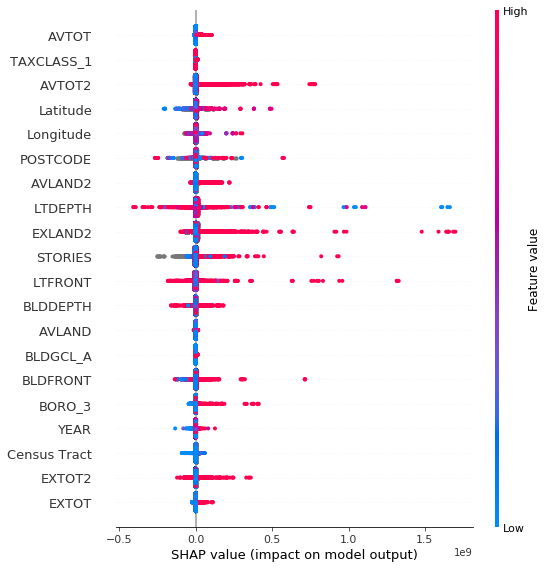

In [24]:
shap.summary_plot(lgb_shap_vals_train, tr_df.drop(columns = ['FULLVAL']))

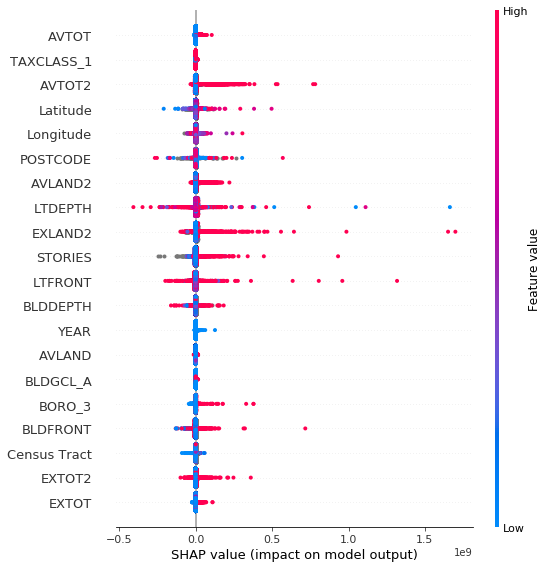

In [25]:
shap.summary_plot(lgb_shap_vals_test, te_df.drop(columns = ['FULLVAL']))

In [95]:
te_df.dtypes

LTFRONT           int64
LTDEPTH           int64
STORIES         float64
FULLVAL         float64
AVLAND            int64
AVTOT             int64
EXLAND            int64
EXTOT             int64
POSTCODE        float64
BLDFRONT        float64
BLDDEPTH        float64
AVLAND2         float64
AVTOT2          float64
EXLAND2         float64
EXTOT2          float64
YEAR              int64
Latitude        float64
Longitude       float64
Census Tract    float64
EASEMENT_E        uint8
EASEMENT_N        uint8
EASEMENT_P        uint8
BORO_1            uint8
BORO_2            uint8
BORO_3            uint8
BORO_4            uint8
BORO_5            uint8
BLDGCL_A          uint8
BLDGCL_B          uint8
BLDGCL_C          uint8
BLDGCL_D          uint8
BLDGCL_E          uint8
BLDGCL_F          uint8
BLDGCL_G          uint8
BLDGCL_H          uint8
BLDGCL_I          uint8
BLDGCL_J          uint8
BLDGCL_K          uint8
BLDGCL_L          uint8
BLDGCL_M          uint8
BLDGCL_N          uint8
BLDGCL_O        

In [96]:
x_train_cat = x_train
x_val_cat = x_val
import numpy as np

In [106]:

# Create index for categorical variables

predictors = x_train_cat
categorical_var = np.where((predictors.dtypes != np.float64) & (predictors.dtypes != np.int64))[0]
print('Categorical Variables indices :',categorical_var)

Categorical Variables indices : [ 18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109]


In [108]:
from catboost import CatBoostRegressor, Pool, cv
cat_boost_model = CatBoostRegressor(
    loss_function = 'RMSE',
    eval_metric='RMSE',
    #hints=skip_train~false,
    #random_seed=42,
    iterations = 10000,
    learning_rate = 0.3,
    early_stopping_rounds = 20,
    #l2_leaf_reg = 1,
    depth = 5,
    #subsample=0.7,
    #colsample_bylevel=0.7
    #grow_policy='Lossguide',
    #min_data_in_leaf=10
    random_strength=10
    
)

cat_boost_model.fit(
    x_train_cat, y_train
    ,cat_features=categorical_var,
    eval_set=(x_val_cat, y_val)
    , plot = True,use_best_model=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 13089129.7398671	test: 15166785.8178884	best: 15166785.8178884 (0)	total: 431ms	remaining: 1h 11m 47s
1:	learn: 11845007.3897355	test: 14332379.0739830	best: 14332379.0739830 (1)	total: 856ms	remaining: 1h 11m 16s
2:	learn: 10955718.9993611	test: 13223517.1892564	best: 13223517.1892564 (2)	total: 1.4s	remaining: 1h 17m 41s
3:	learn: 10165221.8776831	test: 12588416.4117290	best: 12588416.4117290 (3)	total: 1.84s	remaining: 1h 16m 43s
4:	learn: 9462399.5579872	test: 12233077.9035043	best: 12233077.9035043 (4)	total: 2.31s	remaining: 1h 17m 3s
5:	learn: 9179462.3593077	test: 11895480.0237421	best: 11895480.0237421 (5)	total: 2.79s	remaining: 1h 17m 29s
6:	learn: 8862640.7011601	test: 11208573.7376036	best: 11208573.7376036 (6)	total: 3.49s	remaining: 1h 23m 2s
7:	learn: 8505733.2742999	test: 10944069.2423969	best: 10944069.2423969 (7)	total: 3.96s	remaining: 1h 22m 21s
8:	learn: 8239173.5560606	test: 10719837.3950544	best: 10719837.3950544 (8)	total: 4.37s	remaining: 1h 20m 52s


74:	learn: 3774620.5589301	test: 5686296.5325940	best: 5686296.5325940 (74)	total: 34.4s	remaining: 1h 15m 51s
75:	learn: 3734647.8891347	test: 5648800.5126043	best: 5648800.5126043 (75)	total: 34.9s	remaining: 1h 15m 54s
76:	learn: 3712449.9922553	test: 5632352.2525844	best: 5632352.2525844 (76)	total: 35.3s	remaining: 1h 15m 51s
77:	learn: 3680624.1946051	test: 5614854.9518019	best: 5614854.9518019 (77)	total: 35.8s	remaining: 1h 15m 54s
78:	learn: 3665254.2997828	test: 5585999.1482614	best: 5585999.1482614 (78)	total: 36.3s	remaining: 1h 15m 54s
79:	learn: 3632311.1910477	test: 5528600.5639785	best: 5528600.5639785 (79)	total: 36.8s	remaining: 1h 15m 58s
80:	learn: 3614352.4344010	test: 5497149.7522742	best: 5497149.7522742 (80)	total: 37.2s	remaining: 1h 15m 56s
81:	learn: 3601059.9022364	test: 5502032.8903876	best: 5497149.7522742 (80)	total: 37.7s	remaining: 1h 15m 56s
82:	learn: 3598345.8942735	test: 5491605.5336139	best: 5491605.5336139 (82)	total: 38.1s	remaining: 1h 15m 47s
8

148:	learn: 2743073.5422284	test: 4550216.4479496	best: 4550216.4479496 (148)	total: 1m 7s	remaining: 1h 14m 36s
149:	learn: 2734674.7611430	test: 4541376.4513147	best: 4541376.4513147 (149)	total: 1m 8s	remaining: 1h 14m 39s
150:	learn: 2725025.3672257	test: 4528322.5096471	best: 4528322.5096471 (150)	total: 1m 8s	remaining: 1h 14m 37s
151:	learn: 2713892.5820604	test: 4530533.0666713	best: 4528322.5096471 (150)	total: 1m 9s	remaining: 1h 14m 38s
152:	learn: 2711045.5171349	test: 4530545.0066281	best: 4528322.5096471 (150)	total: 1m 9s	remaining: 1h 14m 35s
153:	learn: 2707439.7669838	test: 4526872.0976288	best: 4526872.0976288 (153)	total: 1m 9s	remaining: 1h 14m 34s
154:	learn: 2699226.8081984	test: 4523693.8974039	best: 4523693.8974039 (154)	total: 1m 10s	remaining: 1h 14m 35s
155:	learn: 2694806.9329877	test: 4519307.3249828	best: 4519307.3249828 (155)	total: 1m 10s	remaining: 1h 14m 31s
156:	learn: 2684697.9001843	test: 4518124.1183867	best: 4518124.1183867 (156)	total: 1m 11s	re

221:	learn: 2277356.5141732	test: 4118473.5452219	best: 4118473.5452219 (221)	total: 1m 40s	remaining: 1h 13m 50s
222:	learn: 2275313.0881720	test: 4109874.8092263	best: 4109874.8092263 (222)	total: 1m 41s	remaining: 1h 13m 54s
223:	learn: 2271170.8189329	test: 4107704.2972034	best: 4107704.2972034 (223)	total: 1m 41s	remaining: 1h 13m 53s
224:	learn: 2264337.2763861	test: 4105601.6158038	best: 4105601.6158038 (224)	total: 1m 42s	remaining: 1h 13m 52s
225:	learn: 2259948.6903737	test: 4103641.7375599	best: 4103641.7375599 (225)	total: 1m 42s	remaining: 1h 13m 54s
226:	learn: 2257792.6254753	test: 4102114.6861732	best: 4102114.6861732 (226)	total: 1m 43s	remaining: 1h 13m 55s
227:	learn: 2256261.3168909	test: 4100298.0434046	best: 4100298.0434046 (227)	total: 1m 43s	remaining: 1h 13m 53s
228:	learn: 2252605.3970272	test: 4096407.8177084	best: 4096407.8177084 (228)	total: 1m 43s	remaining: 1h 13m 51s
229:	learn: 2249132.3100828	test: 4088509.6952553	best: 4088509.6952553 (229)	total: 1m 

294:	learn: 2029067.0809636	test: 3871676.6288964	best: 3871676.6288964 (294)	total: 2m 14s	remaining: 1h 13m 34s
295:	learn: 2024288.9378131	test: 3867458.6145978	best: 3867458.6145978 (295)	total: 2m 14s	remaining: 1h 13m 34s
296:	learn: 2018294.3004245	test: 3854631.8481417	best: 3854631.8481417 (296)	total: 2m 15s	remaining: 1h 13m 33s
297:	learn: 2016797.5862217	test: 3854386.3516287	best: 3854386.3516287 (297)	total: 2m 15s	remaining: 1h 13m 32s
298:	learn: 2013312.1247559	test: 3853275.7143060	best: 3853275.7143060 (298)	total: 2m 15s	remaining: 1h 13m 31s
299:	learn: 2008461.9745634	test: 3848641.0745756	best: 3848641.0745756 (299)	total: 2m 16s	remaining: 1h 13m 30s
300:	learn: 2006980.8980392	test: 3845472.0418230	best: 3845472.0418230 (300)	total: 2m 16s	remaining: 1h 13m 28s
301:	learn: 2004306.1739785	test: 3842278.1298167	best: 3842278.1298167 (301)	total: 2m 17s	remaining: 1h 13m 27s
302:	learn: 1999141.2231984	test: 3838698.9455951	best: 3838698.9455951 (302)	total: 2m 

366:	learn: 1829611.7363532	test: 3701208.7767412	best: 3701208.7767412 (366)	total: 2m 47s	remaining: 1h 13m 15s
367:	learn: 1828284.0259141	test: 3701505.3522046	best: 3701208.7767412 (366)	total: 2m 47s	remaining: 1h 13m 15s
368:	learn: 1826079.4859263	test: 3699816.2839776	best: 3699816.2839776 (368)	total: 2m 48s	remaining: 1h 13m 17s
369:	learn: 1824234.4188309	test: 3699138.0538627	best: 3699138.0538627 (369)	total: 2m 49s	remaining: 1h 13m 18s
370:	learn: 1823214.8965186	test: 3698972.6957941	best: 3698972.6957941 (370)	total: 2m 49s	remaining: 1h 13m 17s
371:	learn: 1819533.8146358	test: 3696455.9617900	best: 3696455.9617900 (371)	total: 2m 49s	remaining: 1h 13m 17s
372:	learn: 1818573.2502126	test: 3696033.4667684	best: 3696033.4667684 (372)	total: 2m 50s	remaining: 1h 13m 17s
373:	learn: 1817108.2657997	test: 3695970.6360210	best: 3695970.6360210 (373)	total: 2m 50s	remaining: 1h 13m 16s
374:	learn: 1805999.4874160	test: 3689496.3293897	best: 3689496.3293897 (374)	total: 2m 

439:	learn: 1681851.9016434	test: 3595647.6368107	best: 3595647.6368107 (439)	total: 3m 21s	remaining: 1h 13m 5s
440:	learn: 1680502.0100195	test: 3595238.9653096	best: 3595238.9653096 (440)	total: 3m 22s	remaining: 1h 13m 4s
441:	learn: 1679122.1235698	test: 3592270.0298464	best: 3592270.0298464 (441)	total: 3m 22s	remaining: 1h 13m 4s
442:	learn: 1678556.5023825	test: 3592425.8012166	best: 3592270.0298464 (441)	total: 3m 23s	remaining: 1h 13m 3s
443:	learn: 1676354.7796850	test: 3590317.6169567	best: 3590317.6169567 (443)	total: 3m 23s	remaining: 1h 13m 3s
444:	learn: 1675639.8992939	test: 3588834.1849084	best: 3588834.1849084 (444)	total: 3m 24s	remaining: 1h 13m 3s
445:	learn: 1671663.6259996	test: 3584273.0621090	best: 3584273.0621090 (445)	total: 3m 24s	remaining: 1h 13m 2s
446:	learn: 1668772.9234791	test: 3578204.3745711	best: 3578204.3745711 (446)	total: 3m 25s	remaining: 1h 13m 1s
447:	learn: 1667215.0112492	test: 3577981.2655325	best: 3577981.2655325 (447)	total: 3m 25s	rema

512:	learn: 1566027.4612058	test: 3530938.7835012	best: 3530938.7835012 (512)	total: 3m 56s	remaining: 1h 12m 48s
513:	learn: 1564744.5981685	test: 3529686.6527716	best: 3529686.6527716 (513)	total: 3m 56s	remaining: 1h 12m 48s
514:	learn: 1563865.7727092	test: 3529017.5542639	best: 3529017.5542639 (514)	total: 3m 57s	remaining: 1h 12m 47s
515:	learn: 1563043.5621193	test: 3527796.8428685	best: 3527796.8428685 (515)	total: 3m 57s	remaining: 1h 12m 45s
516:	learn: 1558928.2545351	test: 3526664.3334860	best: 3526664.3334860 (516)	total: 3m 58s	remaining: 1h 12m 45s
517:	learn: 1557273.3174294	test: 3527357.6368745	best: 3526664.3334860 (516)	total: 3m 58s	remaining: 1h 12m 44s
518:	learn: 1556670.6760722	test: 3526802.3285902	best: 3526664.3334860 (516)	total: 3m 58s	remaining: 1h 12m 44s
519:	learn: 1555433.8829217	test: 3526444.3450776	best: 3526444.3450776 (519)	total: 3m 59s	remaining: 1h 12m 43s
520:	learn: 1555133.0746385	test: 3526227.1674667	best: 3526227.1674667 (520)	total: 3m 

585:	learn: 1474113.6004496	test: 3477286.8600767	best: 3476747.0276479 (584)	total: 4m 29s	remaining: 1h 12m 15s
586:	learn: 1472289.2904701	test: 3476488.4416745	best: 3476488.4416745 (586)	total: 4m 30s	remaining: 1h 12m 14s
587:	learn: 1471123.8809106	test: 3475396.9612202	best: 3475396.9612202 (587)	total: 4m 30s	remaining: 1h 12m 14s
588:	learn: 1467241.0173733	test: 3473213.8117568	best: 3473213.8117568 (588)	total: 4m 31s	remaining: 1h 12m 14s
589:	learn: 1463058.8641401	test: 3472376.9112414	best: 3472376.9112414 (589)	total: 4m 31s	remaining: 1h 12m 15s
590:	learn: 1462022.1550042	test: 3470190.5154772	best: 3470190.5154772 (590)	total: 4m 32s	remaining: 1h 12m 16s
591:	learn: 1461248.7472253	test: 3469871.8824374	best: 3469871.8824374 (591)	total: 4m 32s	remaining: 1h 12m 16s
592:	learn: 1460311.4916787	test: 3469178.3230791	best: 3469178.3230791 (592)	total: 4m 33s	remaining: 1h 12m 16s
593:	learn: 1458306.5493599	test: 3469212.4559958	best: 3469178.3230791 (592)	total: 4m 

658:	learn: 1393826.8542069	test: 3415904.1509327	best: 3415904.1509327 (658)	total: 5m 3s	remaining: 1h 11m 47s
659:	learn: 1393148.2506063	test: 3416241.9120999	best: 3415904.1509327 (658)	total: 5m 4s	remaining: 1h 11m 46s
660:	learn: 1392510.5465012	test: 3416037.3271801	best: 3415904.1509327 (658)	total: 5m 4s	remaining: 1h 11m 46s
661:	learn: 1391710.9715682	test: 3415994.3111217	best: 3415904.1509327 (658)	total: 5m 5s	remaining: 1h 11m 45s
662:	learn: 1391067.5661797	test: 3413014.0919538	best: 3413014.0919538 (662)	total: 5m 5s	remaining: 1h 11m 44s
663:	learn: 1389125.8415882	test: 3411200.3309978	best: 3411200.3309978 (663)	total: 5m 6s	remaining: 1h 11m 43s
664:	learn: 1388622.1659406	test: 3411433.9874651	best: 3411200.3309978 (663)	total: 5m 6s	remaining: 1h 11m 43s
665:	learn: 1387465.9160121	test: 3411092.6141638	best: 3411092.6141638 (665)	total: 5m 7s	remaining: 1h 11m 43s
666:	learn: 1386487.2468029	test: 3410588.3562336	best: 3410588.3562336 (666)	total: 5m 7s	remai

730:	learn: 1332987.9000974	test: 3370055.5067674	best: 3369558.1855484 (729)	total: 5m 37s	remaining: 1h 11m 17s
731:	learn: 1332156.3487090	test: 3369168.3340259	best: 3369168.3340259 (731)	total: 5m 37s	remaining: 1h 11m 16s
732:	learn: 1331501.5327133	test: 3368791.5458484	best: 3368791.5458484 (732)	total: 5m 38s	remaining: 1h 11m 16s
733:	learn: 1330586.4248558	test: 3368902.5304050	best: 3368791.5458484 (732)	total: 5m 38s	remaining: 1h 11m 17s
734:	learn: 1329694.0987382	test: 3368651.4075554	best: 3368651.4075554 (734)	total: 5m 39s	remaining: 1h 11m 17s
735:	learn: 1329379.2666550	test: 3368455.5560297	best: 3368455.5560297 (735)	total: 5m 39s	remaining: 1h 11m 16s
736:	learn: 1327476.3149668	test: 3366717.6020974	best: 3366717.6020974 (736)	total: 5m 40s	remaining: 1h 11m 17s
737:	learn: 1327150.3468257	test: 3366707.0738910	best: 3366707.0738910 (737)	total: 5m 40s	remaining: 1h 11m 16s
738:	learn: 1326673.8935189	test: 3366712.0753170	best: 3366707.0738910 (737)	total: 5m 

803:	learn: 1275959.2123272	test: 3336647.0236115	best: 3336647.0236115 (803)	total: 6m 12s	remaining: 1h 11m 5s
804:	learn: 1275693.4696871	test: 3336371.2483786	best: 3336371.2483786 (804)	total: 6m 13s	remaining: 1h 11m 5s
805:	learn: 1275567.1610999	test: 3336385.9222717	best: 3336371.2483786 (804)	total: 6m 13s	remaining: 1h 11m 4s
806:	learn: 1274710.6733503	test: 3335890.5920671	best: 3335890.5920671 (806)	total: 6m 14s	remaining: 1h 11m 3s
807:	learn: 1274402.9103266	test: 3335640.2259883	best: 3335640.2259883 (807)	total: 6m 14s	remaining: 1h 11m 3s
808:	learn: 1273875.7606019	test: 3334346.8313750	best: 3334346.8313750 (808)	total: 6m 15s	remaining: 1h 11m 2s
809:	learn: 1273688.9291294	test: 3334263.9513026	best: 3334263.9513026 (809)	total: 6m 15s	remaining: 1h 11m 2s
810:	learn: 1272926.2499689	test: 3333677.7857211	best: 3333677.7857211 (810)	total: 6m 16s	remaining: 1h 11m 2s
811:	learn: 1272590.0190345	test: 3333297.3642857	best: 3333297.3642857 (811)	total: 6m 16s	rema

876:	learn: 1232424.3875817	test: 3312056.8062090	best: 3312056.8062090 (876)	total: 6m 48s	remaining: 1h 10m 46s
877:	learn: 1231781.6770232	test: 3312162.0602763	best: 3312056.8062090 (876)	total: 6m 48s	remaining: 1h 10m 46s
878:	learn: 1231258.3193144	test: 3312121.9151436	best: 3312056.8062090 (876)	total: 6m 49s	remaining: 1h 10m 45s
879:	learn: 1231108.8013063	test: 3311890.5943153	best: 3311890.5943153 (879)	total: 6m 49s	remaining: 1h 10m 45s
880:	learn: 1228025.7473483	test: 3311076.2998001	best: 3311076.2998001 (880)	total: 6m 50s	remaining: 1h 10m 44s
881:	learn: 1227553.0310146	test: 3310596.0311368	best: 3310596.0311368 (881)	total: 6m 50s	remaining: 1h 10m 43s
882:	learn: 1227177.3298468	test: 3310864.7572828	best: 3310596.0311368 (881)	total: 6m 50s	remaining: 1h 10m 43s
883:	learn: 1226581.9837770	test: 3310568.0447816	best: 3310568.0447816 (883)	total: 6m 51s	remaining: 1h 10m 42s
884:	learn: 1226376.5639462	test: 3310651.4165479	best: 3310568.0447816 (883)	total: 6m 

949:	learn: 1194174.3352793	test: 3299857.6192118	best: 3299744.5576106 (947)	total: 7m 22s	remaining: 1h 10m 19s
950:	learn: 1193777.7094369	test: 3299700.0834876	best: 3299700.0834876 (950)	total: 7m 23s	remaining: 1h 10m 20s
951:	learn: 1193703.0734671	test: 3299746.6948766	best: 3299700.0834876 (950)	total: 7m 23s	remaining: 1h 10m 19s
952:	learn: 1193095.2118652	test: 3299649.1355304	best: 3299649.1355304 (952)	total: 7m 24s	remaining: 1h 10m 19s
953:	learn: 1192751.6717731	test: 3299574.1715282	best: 3299574.1715282 (953)	total: 7m 24s	remaining: 1h 10m 19s
954:	learn: 1192698.9968313	test: 3299611.8485340	best: 3299574.1715282 (953)	total: 7m 25s	remaining: 1h 10m 19s
955:	learn: 1191946.6066993	test: 3299650.4248473	best: 3299574.1715282 (953)	total: 7m 25s	remaining: 1h 10m 18s
956:	learn: 1191541.5372984	test: 3299645.1933937	best: 3299574.1715282 (953)	total: 7m 26s	remaining: 1h 10m 18s
957:	learn: 1191119.1896708	test: 3299449.8408765	best: 3299449.8408765 (957)	total: 7m 

1022:	learn: 1159887.5832505	test: 3286189.5948507	best: 3286189.5948507 (1022)	total: 7m 58s	remaining: 1h 9m 56s
1023:	learn: 1159157.5351676	test: 3286663.5812182	best: 3286189.5948507 (1022)	total: 7m 58s	remaining: 1h 9m 55s
1024:	learn: 1159038.0387912	test: 3286749.9066840	best: 3286189.5948507 (1022)	total: 7m 59s	remaining: 1h 9m 55s
1025:	learn: 1158806.3109092	test: 3286655.8667446	best: 3286189.5948507 (1022)	total: 7m 59s	remaining: 1h 9m 54s
1026:	learn: 1157966.2353931	test: 3286222.0810650	best: 3286189.5948507 (1022)	total: 8m	remaining: 1h 9m 54s
1027:	learn: 1157553.2234862	test: 3285280.2084336	best: 3285280.2084336 (1027)	total: 8m	remaining: 1h 9m 53s
1028:	learn: 1157378.1451312	test: 3285831.6531047	best: 3285280.2084336 (1027)	total: 8m	remaining: 1h 9m 52s
1029:	learn: 1156654.4080805	test: 3285571.8851267	best: 3285280.2084336 (1027)	total: 8m 1s	remaining: 1h 9m 52s
1030:	learn: 1156012.1387533	test: 3283197.4468866	best: 3283197.4468866 (1030)	total: 8m 1s	

1094:	learn: 1132812.7289501	test: 3275506.6620044	best: 3275114.1708931 (1087)	total: 8m 32s	remaining: 1h 9m 25s
1095:	learn: 1132480.8327716	test: 3275689.6193006	best: 3275114.1708931 (1087)	total: 8m 32s	remaining: 1h 9m 25s
1096:	learn: 1132448.2898911	test: 3275649.2391503	best: 3275114.1708931 (1087)	total: 8m 33s	remaining: 1h 9m 25s
1097:	learn: 1130329.7892464	test: 3275101.2735637	best: 3275101.2735637 (1097)	total: 8m 33s	remaining: 1h 9m 25s
1098:	learn: 1129650.8316897	test: 3275273.4053375	best: 3275101.2735637 (1097)	total: 8m 34s	remaining: 1h 9m 25s
1099:	learn: 1129368.5866086	test: 3275490.5565611	best: 3275101.2735637 (1097)	total: 8m 34s	remaining: 1h 9m 24s
1100:	learn: 1128917.3957910	test: 3275017.5157940	best: 3275017.5157940 (1100)	total: 8m 35s	remaining: 1h 9m 24s
1101:	learn: 1128711.0393663	test: 3275178.4056973	best: 3275017.5157940 (1100)	total: 8m 35s	remaining: 1h 9m 25s
1102:	learn: 1128515.0533454	test: 3275028.8596543	best: 3275017.5157940 (1100)	

1166:	learn: 1105401.4870104	test: 3263376.9336744	best: 3263376.9336744 (1166)	total: 9m 8s	remaining: 1h 9m 8s
1167:	learn: 1104874.5777619	test: 3263331.1654350	best: 3263331.1654350 (1167)	total: 9m 8s	remaining: 1h 9m 7s
1168:	learn: 1104654.0300217	test: 3263569.0687672	best: 3263331.1654350 (1167)	total: 9m 9s	remaining: 1h 9m 7s
1169:	learn: 1104214.4016389	test: 3263614.1492249	best: 3263331.1654350 (1167)	total: 9m 9s	remaining: 1h 9m 7s
1170:	learn: 1104147.8992871	test: 3263621.8505579	best: 3263331.1654350 (1167)	total: 9m 9s	remaining: 1h 9m 6s
1171:	learn: 1103470.2174973	test: 3262747.5950276	best: 3262747.5950276 (1171)	total: 9m 10s	remaining: 1h 9m 6s
1172:	learn: 1103380.5010971	test: 3262657.8776965	best: 3262657.8776965 (1172)	total: 9m 10s	remaining: 1h 9m 5s
1173:	learn: 1102963.5358387	test: 3262663.0549199	best: 3262657.8776965 (1172)	total: 9m 11s	remaining: 1h 9m 5s
1174:	learn: 1102818.6250803	test: 3261737.1694942	best: 3261737.1694942 (1174)	total: 9m 11s

1238:	learn: 1080899.4522740	test: 3253656.0325886	best: 3253533.1437486 (1237)	total: 9m 42s	remaining: 1h 8m 39s
1239:	learn: 1080636.8970262	test: 3253695.1780968	best: 3253533.1437486 (1237)	total: 9m 43s	remaining: 1h 8m 39s
1240:	learn: 1080622.9581073	test: 3253643.8952395	best: 3253533.1437486 (1237)	total: 9m 43s	remaining: 1h 8m 39s
1241:	learn: 1080375.0815042	test: 3253441.1764555	best: 3253441.1764555 (1241)	total: 9m 44s	remaining: 1h 8m 38s
1242:	learn: 1079989.6949709	test: 3253317.5534933	best: 3253317.5534933 (1242)	total: 9m 44s	remaining: 1h 8m 38s
1243:	learn: 1079574.3211904	test: 3252844.3059960	best: 3252844.3059960 (1243)	total: 9m 45s	remaining: 1h 8m 38s
1244:	learn: 1079458.0955076	test: 3252877.6343922	best: 3252844.3059960 (1243)	total: 9m 45s	remaining: 1h 8m 38s
1245:	learn: 1079259.9735972	test: 3252806.7563881	best: 3252806.7563881 (1245)	total: 9m 46s	remaining: 1h 8m 37s
1246:	learn: 1079191.5503317	test: 3252532.1328438	best: 3252532.1328438 (1246)	

1310:	learn: 1058590.5387555	test: 3236199.1315812	best: 3236199.1315812 (1310)	total: 10m 17s	remaining: 1h 8m 12s
1311:	learn: 1058252.6214635	test: 3236314.8563726	best: 3236199.1315812 (1310)	total: 10m 17s	remaining: 1h 8m 12s
1312:	learn: 1058106.3000803	test: 3236212.3956861	best: 3236199.1315812 (1310)	total: 10m 18s	remaining: 1h 8m 11s
1313:	learn: 1057761.3548616	test: 3236440.7824087	best: 3236199.1315812 (1310)	total: 10m 18s	remaining: 1h 8m 11s
1314:	learn: 1057694.1341594	test: 3236496.9664409	best: 3236199.1315812 (1310)	total: 10m 19s	remaining: 1h 8m 10s
1315:	learn: 1057628.1130654	test: 3236520.6894846	best: 3236199.1315812 (1310)	total: 10m 19s	remaining: 1h 8m 9s
1316:	learn: 1057179.8693692	test: 3236030.3640941	best: 3236030.3640941 (1316)	total: 10m 20s	remaining: 1h 8m 9s
1317:	learn: 1056919.1680427	test: 3235916.8145589	best: 3235916.8145589 (1317)	total: 10m 20s	remaining: 1h 8m 8s
1318:	learn: 1056855.8677257	test: 3236018.6180259	best: 3235916.8145589 (1

1381:	learn: 1039730.1362633	test: 3225463.6568281	best: 3225463.6568281 (1381)	total: 10m 51s	remaining: 1h 7m 45s
1382:	learn: 1039128.5368682	test: 3225296.0919192	best: 3225296.0919192 (1382)	total: 10m 52s	remaining: 1h 7m 45s
1383:	learn: 1038939.7743143	test: 3225042.6946145	best: 3225042.6946145 (1383)	total: 10m 52s	remaining: 1h 7m 45s
1384:	learn: 1038582.2606338	test: 3224623.0721951	best: 3224623.0721951 (1384)	total: 10m 53s	remaining: 1h 7m 44s
1385:	learn: 1038526.1609468	test: 3224699.3810144	best: 3224623.0721951 (1384)	total: 10m 53s	remaining: 1h 7m 44s
1386:	learn: 1038415.7129949	test: 3224720.6980741	best: 3224623.0721951 (1384)	total: 10m 54s	remaining: 1h 7m 43s
1387:	learn: 1038055.5559949	test: 3224671.0160041	best: 3224623.0721951 (1384)	total: 10m 54s	remaining: 1h 7m 43s
1388:	learn: 1037956.0901348	test: 3224728.8912711	best: 3224623.0721951 (1384)	total: 10m 55s	remaining: 1h 7m 43s
1389:	learn: 1037707.1321934	test: 3224790.5874359	best: 3224623.0721951

1452:	learn: 1022283.9309361	test: 3216579.6990045	best: 3216561.7466601 (1451)	total: 11m 26s	remaining: 1h 7m 18s
1453:	learn: 1021816.1960547	test: 3216472.8615724	best: 3216472.8615724 (1453)	total: 11m 27s	remaining: 1h 7m 18s
1454:	learn: 1021345.1877554	test: 3216001.2997943	best: 3216001.2997943 (1454)	total: 11m 27s	remaining: 1h 7m 18s
1455:	learn: 1021314.3459374	test: 3215992.2876735	best: 3215992.2876735 (1455)	total: 11m 28s	remaining: 1h 7m 17s
1456:	learn: 1020448.3389948	test: 3215710.2544113	best: 3215710.2544113 (1456)	total: 11m 28s	remaining: 1h 7m 18s
1457:	learn: 1020356.1791245	test: 3215560.6707324	best: 3215560.6707324 (1457)	total: 11m 29s	remaining: 1h 7m 18s
1458:	learn: 1020176.3521851	test: 3215589.2340152	best: 3215560.6707324 (1457)	total: 11m 29s	remaining: 1h 7m 18s
1459:	learn: 1019825.4037902	test: 3215920.9383931	best: 3215560.6707324 (1457)	total: 11m 30s	remaining: 1h 7m 17s
1460:	learn: 1019457.8729226	test: 3215786.5572977	best: 3215560.6707324

1523:	learn: 1004933.4864766	test: 3208671.4907463	best: 3208671.4907463 (1523)	total: 12m 1s	remaining: 1h 6m 50s
1524:	learn: 1004831.2019609	test: 3208876.4077109	best: 3208671.4907463 (1523)	total: 12m 1s	remaining: 1h 6m 50s
1525:	learn: 1004769.6935921	test: 3208800.4625831	best: 3208671.4907463 (1523)	total: 12m 2s	remaining: 1h 6m 49s
1526:	learn: 1004450.1630565	test: 3208302.0912607	best: 3208302.0912607 (1526)	total: 12m 2s	remaining: 1h 6m 49s
1527:	learn: 1004045.7686496	test: 3208230.4555370	best: 3208230.4555370 (1527)	total: 12m 3s	remaining: 1h 6m 49s
1528:	learn: 1003830.2007360	test: 3208300.7200243	best: 3208230.4555370 (1527)	total: 12m 3s	remaining: 1h 6m 48s
1529:	learn: 1003775.2989173	test: 3208300.8757007	best: 3208230.4555370 (1527)	total: 12m 4s	remaining: 1h 6m 48s
1530:	learn: 1003631.0632853	test: 3208443.0937588	best: 3208230.4555370 (1527)	total: 12m 4s	remaining: 1h 6m 48s
1531:	learn: 1003373.5596988	test: 3208540.5653690	best: 3208230.4555370 (1527)	

1595:	learn: 988682.1616690	test: 3200337.2879744	best: 3200306.3478780 (1593)	total: 12m 37s	remaining: 1h 6m 26s
1596:	learn: 988600.2106738	test: 3200262.3175890	best: 3200262.3175890 (1596)	total: 12m 37s	remaining: 1h 6m 25s
1597:	learn: 988482.3852243	test: 3200174.0483799	best: 3200174.0483799 (1597)	total: 12m 38s	remaining: 1h 6m 25s
1598:	learn: 988435.3405926	test: 3200145.8562712	best: 3200145.8562712 (1598)	total: 12m 38s	remaining: 1h 6m 25s
1599:	learn: 988305.7000801	test: 3199563.9592118	best: 3199563.9592118 (1599)	total: 12m 39s	remaining: 1h 6m 24s
1600:	learn: 988270.3131201	test: 3199605.5412181	best: 3199563.9592118 (1599)	total: 12m 39s	remaining: 1h 6m 24s
1601:	learn: 988159.3226806	test: 3199200.5210765	best: 3199200.5210765 (1601)	total: 12m 39s	remaining: 1h 6m 23s
1602:	learn: 987511.8756125	test: 3198920.8924207	best: 3198920.8924207 (1602)	total: 12m 40s	remaining: 1h 6m 23s
1603:	learn: 987354.8823141	test: 3198960.1813652	best: 3198920.8924207 (1602)	t

In [ ]:
##################################################HyperOpt##############################################################
from sklearn.metrics import mean_squared_error
import xgboost as xgb
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
import numpy as np

def objective(space):
    print(space)
    hyper_param = {'max_depth':int(space['max_depth']),
         'learning_rate': space['learning_rate'],
         'silent':1,
         'objective':'regression',
         'metric': 'rmse',
         #'subsample' : space['subsample'] 
         #'gamma': space['gamma'],
         #,'lambda': space['lambda'],
         #,'alpha': space['alpha'],
         #,'min_child_weight': space['min_child_weight'],
         #,'colsample_bytree' :??? 
         #,colsample_bynode' : ???
         #,'scale_pos_weight' : ???
         'maximize' : 'FALSE'
         ,'n_jobs' : 3
         #,'base_score' : ???
         #,'max_delta_step' : int(space['max_delta_step'])
        }
    lgb_hyp = lgb.train(params = hyper_param, train_set = lgb_train,
                num_boost_round = 20000, valid_sets = [lgb_val, lgb_train],
               valid_names = ['Evaluation', 'Train'])
    #mort_test_w_preds = x_test
    #mort_test_w_preds['xgb_probs'] = bst.predict(dtest)
    #y = y_test
    #scores = mort_test_w_preds['xgb_probs']
    #fpr, tpr, thresholds = metrics.roc_curve(y, scores)
    #auc=metrics.auc(fpr, tpr)
    pred = lgb_hyp.predict(te_df.drop(columns = ['FULLVAL']))
    mse_scr = mean_squared_error(te_df['FULLVAL'], pred)
    root_mean=np.sqrt(mse_scr)
    return {'loss':root_mean, 'status': STATUS_OK }


space ={'max_depth': hp.choice("x_max_depth", np.arange(5,8,10, dtype=int)),
        #'min_child_weight': hp.quniform ('x_min_child', 1, 10, 1),
        #'subsample': hp.uniform ('x_subsample', 0.5, 1),
        'gamma' : hp.uniform ('x_gamma', 0.1,0.5),
        #'colsample_bytree' : hp.uniform ('x_colsample_bytree', 0.7,1),
        #'reg_lambda' : hp.uniform ('x_reg_lambda', 0,1),
        #'lambda':hp.uniform('x_lambda',)
        'learning_rate' : hp.choice("x_learning_rate", np.arange(0.3,0.5,0.7, dtype=float))
        #'max_delta_step': hp.quniform ('x_max_delta_step', 1, 10,1)
        
    }


trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=10,
            #trials=trials
           )

print (best)




{'gamma': 0.13344034095303328, 'learning_rate': 0.3, 'max_depth': 5}
[1]	Train's rmse: 1.30995e+07	Evaluation's rmse: 1.51234e+07
[2]	Train's rmse: 1.19972e+07	Evaluation's rmse: 1.4064e+07
[3]	Train's rmse: 1.11789e+07	Evaluation's rmse: 1.33604e+07
[4]	Train's rmse: 1.08607e+07	Evaluation's rmse: 1.30526e+07
[5]	Train's rmse: 1.04519e+07	Evaluation's rmse: 1.25818e+07
[6]	Train's rmse: 1.00393e+07	Evaluation's rmse: 1.21476e+07
[7]	Train's rmse: 9.71518e+06	Evaluation's rmse: 1.19185e+07
[8]	Train's rmse: 9.39468e+06	Evaluation's rmse: 1.1593e+07
[9]	Train's rmse: 9.0759e+06	Evaluation's rmse: 1.14717e+07
[10]	Train's rmse: 8.86445e+06	Evaluation's rmse: 1.13015e+07
[11]	Train's rmse: 8.76558e+06	Evaluation's rmse: 1.11544e+07
[12]	Train's rmse: 8.5695e+06	Evaluation's rmse: 1.09388e+07
[13]	Train's rmse: 8.51386e+06	Evaluation's rmse: 1.08569e+07
[14]	Train's rmse: 8.19689e+06	Evaluation's rmse: 1.04655e+07
[15]	Train's rmse: 8.07811e+06	Evaluation's rmse: 1.02697e+07
[16]	Train's r

[262]	Train's rmse: 2.36426e+06	Evaluation's rmse: 4.28865e+06
[263]	Train's rmse: 2.35151e+06	Evaluation's rmse: 4.26864e+06
[264]	Train's rmse: 2.34035e+06	Evaluation's rmse: 4.25327e+06
[265]	Train's rmse: 2.33992e+06	Evaluation's rmse: 4.25303e+06
[266]	Train's rmse: 2.33181e+06	Evaluation's rmse: 4.24214e+06
[267]	Train's rmse: 2.32767e+06	Evaluation's rmse: 4.233e+06
[268]	Train's rmse: 2.31228e+06	Evaluation's rmse: 4.22189e+06
[269]	Train's rmse: 2.30416e+06	Evaluation's rmse: 4.21145e+06
[270]	Train's rmse: 2.29625e+06	Evaluation's rmse: 4.20923e+06
[271]	Train's rmse: 2.29128e+06	Evaluation's rmse: 4.20721e+06
[272]	Train's rmse: 2.27638e+06	Evaluation's rmse: 4.18754e+06
[273]	Train's rmse: 2.26803e+06	Evaluation's rmse: 4.17986e+06
[274]	Train's rmse: 2.2654e+06	Evaluation's rmse: 4.17674e+06
[275]	Train's rmse: 2.26421e+06	Evaluation's rmse: 4.17266e+06
[276]	Train's rmse: 2.25669e+06	Evaluation's rmse: 4.16851e+06
[277]	Train's rmse: 2.25555e+06	Evaluation's rmse: 4.16709

[522]	Train's rmse: 1.38286e+06	Evaluation's rmse: 3.54509e+06
[523]	Train's rmse: 1.38262e+06	Evaluation's rmse: 3.54503e+06
[524]	Train's rmse: 1.37969e+06	Evaluation's rmse: 3.54305e+06
[525]	Train's rmse: 1.37864e+06	Evaluation's rmse: 3.5429e+06
[526]	Train's rmse: 1.37697e+06	Evaluation's rmse: 3.54426e+06
[527]	Train's rmse: 1.37544e+06	Evaluation's rmse: 3.54222e+06
[528]	Train's rmse: 1.37374e+06	Evaluation's rmse: 3.53795e+06
[529]	Train's rmse: 1.3727e+06	Evaluation's rmse: 3.53676e+06
[530]	Train's rmse: 1.37225e+06	Evaluation's rmse: 3.53655e+06
[531]	Train's rmse: 1.37037e+06	Evaluation's rmse: 3.53478e+06
[532]	Train's rmse: 1.36685e+06	Evaluation's rmse: 3.53507e+06
[533]	Train's rmse: 1.36623e+06	Evaluation's rmse: 3.5354e+06
[534]	Train's rmse: 1.36533e+06	Evaluation's rmse: 3.53247e+06
[535]	Train's rmse: 1.36473e+06	Evaluation's rmse: 3.53165e+06
[536]	Train's rmse: 1.36441e+06	Evaluation's rmse: 3.53339e+06
[537]	Train's rmse: 1.36265e+06	Evaluation's rmse: 3.52965

[782]	Train's rmse: 1.07882e+06	Evaluation's rmse: 3.35842e+06
[783]	Train's rmse: 1.07831e+06	Evaluation's rmse: 3.35767e+06
[784]	Train's rmse: 1.07803e+06	Evaluation's rmse: 3.35772e+06
[785]	Train's rmse: 1.07718e+06	Evaluation's rmse: 3.35784e+06
[786]	Train's rmse: 1.07692e+06	Evaluation's rmse: 3.35766e+06
[787]	Train's rmse: 1.07667e+06	Evaluation's rmse: 3.35732e+06
[788]	Train's rmse: 1.07626e+06	Evaluation's rmse: 3.35771e+06
[789]	Train's rmse: 1.07594e+06	Evaluation's rmse: 3.35663e+06
[790]	Train's rmse: 1.07546e+06	Evaluation's rmse: 3.35626e+06
[791]	Train's rmse: 1.07407e+06	Evaluation's rmse: 3.35612e+06
[792]	Train's rmse: 1.072e+06	Evaluation's rmse: 3.35476e+06
[793]	Train's rmse: 1.07135e+06	Evaluation's rmse: 3.35339e+06
[794]	Train's rmse: 1.07061e+06	Evaluation's rmse: 3.35383e+06
[795]	Train's rmse: 1.07023e+06	Evaluation's rmse: 3.3538e+06
[796]	Train's rmse: 1.07008e+06	Evaluation's rmse: 3.3538e+06
[797]	Train's rmse: 1.06976e+06	Evaluation's rmse: 3.35347e

[1054]	Train's rmse: 929861	Evaluation's rmse: 3.27778e+06
[1055]	Train's rmse: 929276	Evaluation's rmse: 3.27896e+06
[1056]	Train's rmse: 929059	Evaluation's rmse: 3.27901e+06
[1057]	Train's rmse: 928579	Evaluation's rmse: 3.27991e+06
[1058]	Train's rmse: 927879	Evaluation's rmse: 3.2792e+06
[1059]	Train's rmse: 927520	Evaluation's rmse: 3.27997e+06
[1060]	Train's rmse: 927254	Evaluation's rmse: 3.2793e+06
[1061]	Train's rmse: 926936	Evaluation's rmse: 3.2786e+06
[1062]	Train's rmse: 926764	Evaluation's rmse: 3.27793e+06
[1063]	Train's rmse: 926632	Evaluation's rmse: 3.27789e+06
[1064]	Train's rmse: 926431	Evaluation's rmse: 3.27761e+06
[1065]	Train's rmse: 926395	Evaluation's rmse: 3.27761e+06
[1066]	Train's rmse: 926347	Evaluation's rmse: 3.2776e+06
[1067]	Train's rmse: 925472	Evaluation's rmse: 3.27715e+06
[1068]	Train's rmse: 925035	Evaluation's rmse: 3.27649e+06
[1069]	Train's rmse: 923039	Evaluation's rmse: 3.27561e+06
[1070]	Train's rmse: 922694	Evaluation's rmse: 3.27529e+06
[

[1332]	Train's rmse: 833841	Evaluation's rmse: 3.23983e+06
[1333]	Train's rmse: 833540	Evaluation's rmse: 3.23998e+06
[1334]	Train's rmse: 833255	Evaluation's rmse: 3.24005e+06
[1335]	Train's rmse: 832977	Evaluation's rmse: 3.24032e+06
[1336]	Train's rmse: 831388	Evaluation's rmse: 3.23966e+06
[1337]	Train's rmse: 831314	Evaluation's rmse: 3.24026e+06
[1338]	Train's rmse: 830821	Evaluation's rmse: 3.23964e+06
[1339]	Train's rmse: 830613	Evaluation's rmse: 3.23956e+06
[1340]	Train's rmse: 830530	Evaluation's rmse: 3.23928e+06
[1341]	Train's rmse: 830416	Evaluation's rmse: 3.2392e+06
[1342]	Train's rmse: 830383	Evaluation's rmse: 3.23919e+06
[1343]	Train's rmse: 830042	Evaluation's rmse: 3.23894e+06
[1344]	Train's rmse: 829517	Evaluation's rmse: 3.23891e+06
[1345]	Train's rmse: 829261	Evaluation's rmse: 3.2384e+06
[1346]	Train's rmse: 829135	Evaluation's rmse: 3.23845e+06
[1347]	Train's rmse: 829095	Evaluation's rmse: 3.23895e+06
[1348]	Train's rmse: 828960	Evaluation's rmse: 3.23913e+06

[1610]	Train's rmse: 765436	Evaluation's rmse: 3.20957e+06
[1611]	Train's rmse: 765345	Evaluation's rmse: 3.2096e+06
[1612]	Train's rmse: 765199	Evaluation's rmse: 3.20959e+06
[1613]	Train's rmse: 765125	Evaluation's rmse: 3.20955e+06
[1614]	Train's rmse: 765099	Evaluation's rmse: 3.20948e+06
[1615]	Train's rmse: 765065	Evaluation's rmse: 3.20934e+06
[1616]	Train's rmse: 764918	Evaluation's rmse: 3.20949e+06
[1617]	Train's rmse: 764841	Evaluation's rmse: 3.20927e+06
[1618]	Train's rmse: 764550	Evaluation's rmse: 3.20892e+06
[1619]	Train's rmse: 764476	Evaluation's rmse: 3.20918e+06
[1620]	Train's rmse: 764471	Evaluation's rmse: 3.20912e+06
[1621]	Train's rmse: 764352	Evaluation's rmse: 3.20911e+06
[1622]	Train's rmse: 764288	Evaluation's rmse: 3.20893e+06
[1623]	Train's rmse: 764209	Evaluation's rmse: 3.20889e+06
[1624]	Train's rmse: 764107	Evaluation's rmse: 3.20888e+06
[1625]	Train's rmse: 764076	Evaluation's rmse: 3.20889e+06
[1626]	Train's rmse: 763245	Evaluation's rmse: 3.20832e+0

[1888]	Train's rmse: 718545	Evaluation's rmse: 3.19361e+06
[1889]	Train's rmse: 718427	Evaluation's rmse: 3.19347e+06
[1890]	Train's rmse: 718383	Evaluation's rmse: 3.19329e+06
[1891]	Train's rmse: 718359	Evaluation's rmse: 3.19327e+06
[1892]	Train's rmse: 718334	Evaluation's rmse: 3.19327e+06
[1893]	Train's rmse: 718291	Evaluation's rmse: 3.19325e+06
[1894]	Train's rmse: 718204	Evaluation's rmse: 3.19317e+06
[1895]	Train's rmse: 718172	Evaluation's rmse: 3.19316e+06
[1896]	Train's rmse: 718139	Evaluation's rmse: 3.19309e+06
[1897]	Train's rmse: 717934	Evaluation's rmse: 3.19226e+06
[1898]	Train's rmse: 717893	Evaluation's rmse: 3.19223e+06
[1899]	Train's rmse: 717694	Evaluation's rmse: 3.19197e+06
[1900]	Train's rmse: 717536	Evaluation's rmse: 3.19193e+06
[1901]	Train's rmse: 717080	Evaluation's rmse: 3.19166e+06
[1902]	Train's rmse: 716849	Evaluation's rmse: 3.19165e+06
[1903]	Train's rmse: 716799	Evaluation's rmse: 3.19183e+06
[1904]	Train's rmse: 716674	Evaluation's rmse: 3.19179e+

[2166]	Train's rmse: 687180	Evaluation's rmse: 3.17762e+06
[2167]	Train's rmse: 687153	Evaluation's rmse: 3.17758e+06
[2168]	Train's rmse: 687079	Evaluation's rmse: 3.17766e+06
[2169]	Train's rmse: 686575	Evaluation's rmse: 3.17757e+06
[2170]	Train's rmse: 686504	Evaluation's rmse: 3.17755e+06
[2171]	Train's rmse: 686459	Evaluation's rmse: 3.17759e+06
[2172]	Train's rmse: 686409	Evaluation's rmse: 3.17735e+06
[2173]	Train's rmse: 686000	Evaluation's rmse: 3.17776e+06
[2174]	Train's rmse: 685923	Evaluation's rmse: 3.17758e+06
[2175]	Train's rmse: 685821	Evaluation's rmse: 3.17765e+06
[2176]	Train's rmse: 685799	Evaluation's rmse: 3.1776e+06
[2177]	Train's rmse: 685731	Evaluation's rmse: 3.17765e+06
[2178]	Train's rmse: 685474	Evaluation's rmse: 3.17753e+06
[2179]	Train's rmse: 685358	Evaluation's rmse: 3.17762e+06
[2180]	Train's rmse: 684889	Evaluation's rmse: 3.17756e+06
[2181]	Train's rmse: 684551	Evaluation's rmse: 3.17772e+06
[2182]	Train's rmse: 684495	Evaluation's rmse: 3.17776e+0

[2444]	Train's rmse: 653981	Evaluation's rmse: 3.16723e+06
[2445]	Train's rmse: 653949	Evaluation's rmse: 3.16717e+06
[2446]	Train's rmse: 653710	Evaluation's rmse: 3.16743e+06
[2447]	Train's rmse: 653636	Evaluation's rmse: 3.1676e+06
[2448]	Train's rmse: 653517	Evaluation's rmse: 3.16741e+06
[2449]	Train's rmse: 652919	Evaluation's rmse: 3.16727e+06
[2450]	Train's rmse: 652840	Evaluation's rmse: 3.16733e+06
[2451]	Train's rmse: 652614	Evaluation's rmse: 3.16724e+06
[2452]	Train's rmse: 652600	Evaluation's rmse: 3.16724e+06
[2453]	Train's rmse: 652565	Evaluation's rmse: 3.16728e+06
[2454]	Train's rmse: 652497	Evaluation's rmse: 3.16755e+06
[2455]	Train's rmse: 652465	Evaluation's rmse: 3.16747e+06
[2456]	Train's rmse: 652438	Evaluation's rmse: 3.16757e+06
[2457]	Train's rmse: 652415	Evaluation's rmse: 3.16756e+06
[2458]	Train's rmse: 652269	Evaluation's rmse: 3.16772e+06
[2459]	Train's rmse: 652228	Evaluation's rmse: 3.16773e+06
[2460]	Train's rmse: 652145	Evaluation's rmse: 3.16742e+0

[2720]	Train's rmse: 633441	Evaluation's rmse: 3.1613e+06
[2721]	Train's rmse: 633400	Evaluation's rmse: 3.16145e+06
[2722]	Train's rmse: 633313	Evaluation's rmse: 3.1615e+06
[2723]	Train's rmse: 633242	Evaluation's rmse: 3.16129e+06
[2724]	Train's rmse: 633217	Evaluation's rmse: 3.16139e+06
[2725]	Train's rmse: 633168	Evaluation's rmse: 3.16112e+06
[2726]	Train's rmse: 633049	Evaluation's rmse: 3.16132e+06
[2727]	Train's rmse: 633029	Evaluation's rmse: 3.16127e+06
[2728]	Train's rmse: 633009	Evaluation's rmse: 3.16126e+06
[2729]	Train's rmse: 632970	Evaluation's rmse: 3.16122e+06
[2730]	Train's rmse: 632812	Evaluation's rmse: 3.16077e+06
[2731]	Train's rmse: 632793	Evaluation's rmse: 3.16079e+06
[2732]	Train's rmse: 632749	Evaluation's rmse: 3.16114e+06
[2733]	Train's rmse: 632633	Evaluation's rmse: 3.16115e+06
[2734]	Train's rmse: 632601	Evaluation's rmse: 3.16113e+06
[2735]	Train's rmse: 632551	Evaluation's rmse: 3.16105e+06
[2736]	Train's rmse: 632443	Evaluation's rmse: 3.16103e+06

[2998]	Train's rmse: 613025	Evaluation's rmse: 3.15606e+06
[2999]	Train's rmse: 612975	Evaluation's rmse: 3.15601e+06
[3000]	Train's rmse: 612918	Evaluation's rmse: 3.15602e+06
[3001]	Train's rmse: 612904	Evaluation's rmse: 3.15602e+06
[3002]	Train's rmse: 612891	Evaluation's rmse: 3.15601e+06
[3003]	Train's rmse: 612841	Evaluation's rmse: 3.15592e+06
[3004]	Train's rmse: 612810	Evaluation's rmse: 3.15585e+06
[3005]	Train's rmse: 612791	Evaluation's rmse: 3.15586e+06
[3006]	Train's rmse: 612762	Evaluation's rmse: 3.15586e+06
[3007]	Train's rmse: 612517	Evaluation's rmse: 3.15564e+06
[3008]	Train's rmse: 612170	Evaluation's rmse: 3.15555e+06
[3009]	Train's rmse: 612115	Evaluation's rmse: 3.15578e+06
[3010]	Train's rmse: 612016	Evaluation's rmse: 3.15575e+06
[3011]	Train's rmse: 612002	Evaluation's rmse: 3.15573e+06
[3012]	Train's rmse: 611971	Evaluation's rmse: 3.15578e+06
[3013]	Train's rmse: 611912	Evaluation's rmse: 3.15576e+06
[3014]	Train's rmse: 611878	Evaluation's rmse: 3.15566e+

[3276]	Train's rmse: 598418	Evaluation's rmse: 3.15178e+06
[3277]	Train's rmse: 598254	Evaluation's rmse: 3.1518e+06
[3278]	Train's rmse: 598246	Evaluation's rmse: 3.15179e+06
[3279]	Train's rmse: 598231	Evaluation's rmse: 3.15175e+06
[3280]	Train's rmse: 598088	Evaluation's rmse: 3.15176e+06
[3281]	Train's rmse: 598073	Evaluation's rmse: 3.15174e+06
[3282]	Train's rmse: 598055	Evaluation's rmse: 3.15172e+06
[3283]	Train's rmse: 598022	Evaluation's rmse: 3.15154e+06
[3284]	Train's rmse: 597955	Evaluation's rmse: 3.1514e+06
[3285]	Train's rmse: 597941	Evaluation's rmse: 3.15127e+06
[3286]	Train's rmse: 597918	Evaluation's rmse: 3.15119e+06
[3287]	Train's rmse: 597877	Evaluation's rmse: 3.15124e+06
[3288]	Train's rmse: 597868	Evaluation's rmse: 3.15121e+06
[3289]	Train's rmse: 597855	Evaluation's rmse: 3.15121e+06
[3290]	Train's rmse: 597840	Evaluation's rmse: 3.15124e+06
[3291]	Train's rmse: 597808	Evaluation's rmse: 3.15095e+06
[3292]	Train's rmse: 597767	Evaluation's rmse: 3.15093e+06

[3415]	Train's rmse: 590274	Evaluation's rmse: 3.14975e+06
[3416]	Train's rmse: 590016	Evaluation's rmse: 3.14966e+06
[3417]	Train's rmse: 589996	Evaluation's rmse: 3.14965e+06
[3418]	Train's rmse: 589964	Evaluation's rmse: 3.14963e+06
[3419]	Train's rmse: 589949	Evaluation's rmse: 3.14959e+06
[3420]	Train's rmse: 589886	Evaluation's rmse: 3.14953e+06
[3421]	Train's rmse: 589872	Evaluation's rmse: 3.14955e+06
[3422]	Train's rmse: 589832	Evaluation's rmse: 3.14957e+06
[3423]	Train's rmse: 589816	Evaluation's rmse: 3.14961e+06
[3424]	Train's rmse: 589797	Evaluation's rmse: 3.14963e+06
[3425]	Train's rmse: 589787	Evaluation's rmse: 3.14964e+06
[3426]	Train's rmse: 589757	Evaluation's rmse: 3.14964e+06
[3427]	Train's rmse: 589721	Evaluation's rmse: 3.1497e+06
[3428]	Train's rmse: 589606	Evaluation's rmse: 3.14966e+06
[3429]	Train's rmse: 589569	Evaluation's rmse: 3.14965e+06
[3430]	Train's rmse: 589543	Evaluation's rmse: 3.1496e+06
[3431]	Train's rmse: 589485	Evaluation's rmse: 3.14977e+06

[3693]	Train's rmse: 577956	Evaluation's rmse: 3.14708e+06
[3694]	Train's rmse: 577938	Evaluation's rmse: 3.14707e+06
[3695]	Train's rmse: 577919	Evaluation's rmse: 3.14707e+06
[3696]	Train's rmse: 577887	Evaluation's rmse: 3.14712e+06
[3697]	Train's rmse: 577843	Evaluation's rmse: 3.14711e+06
[3698]	Train's rmse: 577782	Evaluation's rmse: 3.14705e+06
[3699]	Train's rmse: 577709	Evaluation's rmse: 3.14726e+06
[3700]	Train's rmse: 577666	Evaluation's rmse: 3.14734e+06
[3701]	Train's rmse: 577653	Evaluation's rmse: 3.14734e+06
[3702]	Train's rmse: 577615	Evaluation's rmse: 3.14724e+06
[3703]	Train's rmse: 577578	Evaluation's rmse: 3.1475e+06
[3704]	Train's rmse: 577570	Evaluation's rmse: 3.14752e+06
[3705]	Train's rmse: 577483	Evaluation's rmse: 3.1478e+06
[3706]	Train's rmse: 577447	Evaluation's rmse: 3.14761e+06
[3707]	Train's rmse: 577398	Evaluation's rmse: 3.14754e+06
[3708]	Train's rmse: 577381	Evaluation's rmse: 3.14754e+06
[3709]	Train's rmse: 577275	Evaluation's rmse: 3.14742e+06

[3971]	Train's rmse: 567306	Evaluation's rmse: 3.14498e+06
[3972]	Train's rmse: 567241	Evaluation's rmse: 3.14489e+06
[3973]	Train's rmse: 567174	Evaluation's rmse: 3.14503e+06
[3974]	Train's rmse: 567161	Evaluation's rmse: 3.145e+06
[3975]	Train's rmse: 567145	Evaluation's rmse: 3.14507e+06
[3976]	Train's rmse: 567118	Evaluation's rmse: 3.14503e+06
[3977]	Train's rmse: 566985	Evaluation's rmse: 3.14512e+06
[3978]	Train's rmse: 566976	Evaluation's rmse: 3.145e+06
[3979]	Train's rmse: 566901	Evaluation's rmse: 3.14503e+06
[3980]	Train's rmse: 566780	Evaluation's rmse: 3.14509e+06
[3981]	Train's rmse: 566767	Evaluation's rmse: 3.14508e+06
[3982]	Train's rmse: 566754	Evaluation's rmse: 3.14512e+06
[3983]	Train's rmse: 566748	Evaluation's rmse: 3.14514e+06
[3984]	Train's rmse: 566734	Evaluation's rmse: 3.14513e+06
[3985]	Train's rmse: 566708	Evaluation's rmse: 3.14513e+06
[3986]	Train's rmse: 566672	Evaluation's rmse: 3.1451e+06
[3987]	Train's rmse: 566648	Evaluation's rmse: 3.14509e+06
[3

[4249]	Train's rmse: 557771	Evaluation's rmse: 3.14256e+06
[4250]	Train's rmse: 557709	Evaluation's rmse: 3.14259e+06
[4251]	Train's rmse: 557702	Evaluation's rmse: 3.14261e+06
[4252]	Train's rmse: 557582	Evaluation's rmse: 3.1424e+06
[4253]	Train's rmse: 557481	Evaluation's rmse: 3.14244e+06
[4254]	Train's rmse: 557387	Evaluation's rmse: 3.14235e+06
[4255]	Train's rmse: 557376	Evaluation's rmse: 3.14237e+06
[4256]	Train's rmse: 557361	Evaluation's rmse: 3.14236e+06
[4257]	Train's rmse: 557344	Evaluation's rmse: 3.14261e+06
[4258]	Train's rmse: 557339	Evaluation's rmse: 3.14262e+06
[4259]	Train's rmse: 557288	Evaluation's rmse: 3.14267e+06
[4260]	Train's rmse: 557222	Evaluation's rmse: 3.14261e+06
[4261]	Train's rmse: 557197	Evaluation's rmse: 3.1426e+06
[4262]	Train's rmse: 557165	Evaluation's rmse: 3.14254e+06
[4263]	Train's rmse: 557051	Evaluation's rmse: 3.14258e+06
[4264]	Train's rmse: 556922	Evaluation's rmse: 3.14269e+06
[4265]	Train's rmse: 556891	Evaluation's rmse: 3.1427e+06


[4527]	Train's rmse: 548770	Evaluation's rmse: 3.13889e+06
[4528]	Train's rmse: 548760	Evaluation's rmse: 3.13888e+06
[4529]	Train's rmse: 548739	Evaluation's rmse: 3.1388e+06
[4530]	Train's rmse: 548731	Evaluation's rmse: 3.13878e+06
[4531]	Train's rmse: 548708	Evaluation's rmse: 3.13872e+06
[4532]	Train's rmse: 548703	Evaluation's rmse: 3.13872e+06
[4533]	Train's rmse: 548690	Evaluation's rmse: 3.13871e+06
[4534]	Train's rmse: 548636	Evaluation's rmse: 3.13873e+06
[4535]	Train's rmse: 548621	Evaluation's rmse: 3.13866e+06
[4536]	Train's rmse: 548562	Evaluation's rmse: 3.13866e+06
[4537]	Train's rmse: 548502	Evaluation's rmse: 3.1386e+06
[4538]	Train's rmse: 548494	Evaluation's rmse: 3.13858e+06
[4539]	Train's rmse: 548342	Evaluation's rmse: 3.13841e+06
[4540]	Train's rmse: 548336	Evaluation's rmse: 3.13832e+06
[4541]	Train's rmse: 548330	Evaluation's rmse: 3.13835e+06
[4542]	Train's rmse: 548328	Evaluation's rmse: 3.13836e+06
[4543]	Train's rmse: 548324	Evaluation's rmse: 3.13836e+06

[4805]	Train's rmse: 541496	Evaluation's rmse: 3.1384e+06
[4806]	Train's rmse: 541489	Evaluation's rmse: 3.13847e+06
[4807]	Train's rmse: 541473	Evaluation's rmse: 3.13842e+06
[4808]	Train's rmse: 541460	Evaluation's rmse: 3.13846e+06
[4809]	Train's rmse: 541448	Evaluation's rmse: 3.13845e+06
[4810]	Train's rmse: 541444	Evaluation's rmse: 3.13843e+06
[4811]	Train's rmse: 541420	Evaluation's rmse: 3.13841e+06
[4812]	Train's rmse: 541378	Evaluation's rmse: 3.13848e+06
[4813]	Train's rmse: 541359	Evaluation's rmse: 3.13843e+06
[4814]	Train's rmse: 541348	Evaluation's rmse: 3.13844e+06
[4815]	Train's rmse: 541290	Evaluation's rmse: 3.1384e+06
[4816]	Train's rmse: 541289	Evaluation's rmse: 3.13839e+06
[4817]	Train's rmse: 541284	Evaluation's rmse: 3.13838e+06
[4818]	Train's rmse: 541277	Evaluation's rmse: 3.13846e+06
[4819]	Train's rmse: 541270	Evaluation's rmse: 3.13838e+06
[4820]	Train's rmse: 541218	Evaluation's rmse: 3.1385e+06
[4821]	Train's rmse: 540987	Evaluation's rmse: 3.13841e+06


[5083]	Train's rmse: 535089	Evaluation's rmse: 3.13741e+06
[5084]	Train's rmse: 535083	Evaluation's rmse: 3.13741e+06
[5085]	Train's rmse: 535049	Evaluation's rmse: 3.1374e+06
[5086]	Train's rmse: 535017	Evaluation's rmse: 3.13739e+06
[5087]	Train's rmse: 535008	Evaluation's rmse: 3.13737e+06
[5088]	Train's rmse: 534971	Evaluation's rmse: 3.13726e+06
[5089]	Train's rmse: 534948	Evaluation's rmse: 3.13722e+06
[5090]	Train's rmse: 534927	Evaluation's rmse: 3.1372e+06
[5091]	Train's rmse: 534899	Evaluation's rmse: 3.1372e+06
[5092]	Train's rmse: 534888	Evaluation's rmse: 3.13721e+06
[5093]	Train's rmse: 534880	Evaluation's rmse: 3.13713e+06
[5094]	Train's rmse: 534813	Evaluation's rmse: 3.13704e+06
[5095]	Train's rmse: 534787	Evaluation's rmse: 3.13703e+06
[5096]	Train's rmse: 534778	Evaluation's rmse: 3.1371e+06
[5097]	Train's rmse: 534724	Evaluation's rmse: 3.1373e+06
[5098]	Train's rmse: 534707	Evaluation's rmse: 3.13741e+06
[5099]	Train's rmse: 534691	Evaluation's rmse: 3.1374e+06
[51

[5361]	Train's rmse: 529579	Evaluation's rmse: 3.13696e+06
[5362]	Train's rmse: 529571	Evaluation's rmse: 3.13689e+06
[5363]	Train's rmse: 529568	Evaluation's rmse: 3.13691e+06
[5364]	Train's rmse: 529560	Evaluation's rmse: 3.13691e+06
[5365]	Train's rmse: 529544	Evaluation's rmse: 3.13697e+06
[5366]	Train's rmse: 529530	Evaluation's rmse: 3.1369e+06
[5367]	Train's rmse: 529525	Evaluation's rmse: 3.1369e+06
[5368]	Train's rmse: 529519	Evaluation's rmse: 3.1369e+06
[5369]	Train's rmse: 529517	Evaluation's rmse: 3.1369e+06
[5370]	Train's rmse: 529515	Evaluation's rmse: 3.1369e+06
[5371]	Train's rmse: 529506	Evaluation's rmse: 3.1369e+06
[5372]	Train's rmse: 529501	Evaluation's rmse: 3.13686e+06
[5373]	Train's rmse: 529498	Evaluation's rmse: 3.13686e+06
[5374]	Train's rmse: 529491	Evaluation's rmse: 3.13686e+06
[5375]	Train's rmse: 529479	Evaluation's rmse: 3.13686e+06
[5376]	Train's rmse: 529464	Evaluation's rmse: 3.13686e+06
[5377]	Train's rmse: 529461	Evaluation's rmse: 3.13686e+06
[53

[5639]	Train's rmse: 524798	Evaluation's rmse: 3.13661e+06
[5640]	Train's rmse: 524790	Evaluation's rmse: 3.13668e+06
[5641]	Train's rmse: 524781	Evaluation's rmse: 3.13668e+06
[5642]	Train's rmse: 524725	Evaluation's rmse: 3.13668e+06
[5643]	Train's rmse: 524707	Evaluation's rmse: 3.13666e+06
[5644]	Train's rmse: 524699	Evaluation's rmse: 3.13661e+06
[5645]	Train's rmse: 524662	Evaluation's rmse: 3.13655e+06
[5646]	Train's rmse: 524614	Evaluation's rmse: 3.13654e+06
[5647]	Train's rmse: 524572	Evaluation's rmse: 3.13662e+06
[5648]	Train's rmse: 524488	Evaluation's rmse: 3.13669e+06
[5649]	Train's rmse: 524484	Evaluation's rmse: 3.13669e+06
[5650]	Train's rmse: 524458	Evaluation's rmse: 3.13672e+06
[5651]	Train's rmse: 524448	Evaluation's rmse: 3.13672e+06
[5652]	Train's rmse: 524445	Evaluation's rmse: 3.13674e+06
[5653]	Train's rmse: 524438	Evaluation's rmse: 3.13664e+06
[5654]	Train's rmse: 524422	Evaluation's rmse: 3.13664e+06
[5655]	Train's rmse: 524420	Evaluation's rmse: 3.13667e+

[5917]	Train's rmse: 520671	Evaluation's rmse: 3.13521e+06
[5918]	Train's rmse: 520668	Evaluation's rmse: 3.13521e+06
[5919]	Train's rmse: 520621	Evaluation's rmse: 3.13519e+06
[5920]	Train's rmse: 520617	Evaluation's rmse: 3.13513e+06
[5921]	Train's rmse: 520615	Evaluation's rmse: 3.13516e+06
[5922]	Train's rmse: 520613	Evaluation's rmse: 3.13518e+06
[5923]	Train's rmse: 520610	Evaluation's rmse: 3.13518e+06
[5924]	Train's rmse: 520604	Evaluation's rmse: 3.13522e+06
[5925]	Train's rmse: 520572	Evaluation's rmse: 3.13516e+06
[5926]	Train's rmse: 520562	Evaluation's rmse: 3.13531e+06
[5927]	Train's rmse: 520550	Evaluation's rmse: 3.13529e+06
[5928]	Train's rmse: 520537	Evaluation's rmse: 3.1353e+06
[5929]	Train's rmse: 520376	Evaluation's rmse: 3.13542e+06
[5930]	Train's rmse: 520361	Evaluation's rmse: 3.13537e+06
[5931]	Train's rmse: 520344	Evaluation's rmse: 3.13537e+06
[5932]	Train's rmse: 520338	Evaluation's rmse: 3.13537e+06
[5933]	Train's rmse: 520318	Evaluation's rmse: 3.13542e+0

[6195]	Train's rmse: 516491	Evaluation's rmse: 3.1359e+06
[6196]	Train's rmse: 516488	Evaluation's rmse: 3.1359e+06
[6197]	Train's rmse: 516474	Evaluation's rmse: 3.1359e+06
[6198]	Train's rmse: 516458	Evaluation's rmse: 3.13589e+06
[6199]	Train's rmse: 516454	Evaluation's rmse: 3.13583e+06
[6200]	Train's rmse: 516450	Evaluation's rmse: 3.13573e+06
[6201]	Train's rmse: 516366	Evaluation's rmse: 3.13572e+06
[6202]	Train's rmse: 516344	Evaluation's rmse: 3.13576e+06
[6203]	Train's rmse: 516313	Evaluation's rmse: 3.1357e+06
[6204]	Train's rmse: 516296	Evaluation's rmse: 3.13569e+06
[6205]	Train's rmse: 516287	Evaluation's rmse: 3.13569e+06
[6206]	Train's rmse: 516275	Evaluation's rmse: 3.13569e+06
[6207]	Train's rmse: 516273	Evaluation's rmse: 3.1357e+06
[6208]	Train's rmse: 516271	Evaluation's rmse: 3.1357e+06
[6209]	Train's rmse: 516260	Evaluation's rmse: 3.1357e+06
[6210]	Train's rmse: 516255	Evaluation's rmse: 3.1357e+06
[6211]	Train's rmse: 516252	Evaluation's rmse: 3.13569e+06
[6212

[6472]	Train's rmse: 512211	Evaluation's rmse: 3.13535e+06
[6473]	Train's rmse: 512192	Evaluation's rmse: 3.13536e+06
[6474]	Train's rmse: 512182	Evaluation's rmse: 3.13537e+06
[6475]	Train's rmse: 512173	Evaluation's rmse: 3.13535e+06
[6476]	Train's rmse: 512157	Evaluation's rmse: 3.13541e+06
[6477]	Train's rmse: 512145	Evaluation's rmse: 3.13538e+06
[6478]	Train's rmse: 512069	Evaluation's rmse: 3.13533e+06
[6479]	Train's rmse: 512067	Evaluation's rmse: 3.13533e+06
[6480]	Train's rmse: 512049	Evaluation's rmse: 3.13528e+06
[6481]	Train's rmse: 512048	Evaluation's rmse: 3.13527e+06
[6482]	Train's rmse: 512036	Evaluation's rmse: 3.13526e+06
[6483]	Train's rmse: 512010	Evaluation's rmse: 3.13524e+06
[6484]	Train's rmse: 512003	Evaluation's rmse: 3.13525e+06
[6485]	Train's rmse: 511991	Evaluation's rmse: 3.13524e+06
[6486]	Train's rmse: 511988	Evaluation's rmse: 3.13524e+06
[6487]	Train's rmse: 511984	Evaluation's rmse: 3.13524e+06
[6488]	Train's rmse: 511981	Evaluation's rmse: 3.13526e+

[6750]	Train's rmse: 508807	Evaluation's rmse: 3.13453e+06
[6751]	Train's rmse: 508803	Evaluation's rmse: 3.13453e+06
[6752]	Train's rmse: 508734	Evaluation's rmse: 3.13449e+06
[6753]	Train's rmse: 508733	Evaluation's rmse: 3.13451e+06
[6754]	Train's rmse: 508729	Evaluation's rmse: 3.13453e+06
[6755]	Train's rmse: 508725	Evaluation's rmse: 3.13455e+06
[6756]	Train's rmse: 508710	Evaluation's rmse: 3.13464e+06
[6757]	Train's rmse: 508706	Evaluation's rmse: 3.13464e+06
[6758]	Train's rmse: 508699	Evaluation's rmse: 3.13448e+06
[6759]	Train's rmse: 508692	Evaluation's rmse: 3.13455e+06
[6760]	Train's rmse: 508689	Evaluation's rmse: 3.13456e+06
[6761]	Train's rmse: 508675	Evaluation's rmse: 3.13458e+06
[6762]	Train's rmse: 508653	Evaluation's rmse: 3.13457e+06
[6763]	Train's rmse: 508648	Evaluation's rmse: 3.13464e+06
[6764]	Train's rmse: 508635	Evaluation's rmse: 3.13467e+06
[6765]	Train's rmse: 508610	Evaluation's rmse: 3.1346e+06
[6766]	Train's rmse: 508594	Evaluation's rmse: 3.13449e+0

[7028]	Train's rmse: 505282	Evaluation's rmse: 3.13532e+06
[7029]	Train's rmse: 505262	Evaluation's rmse: 3.13531e+06
[7030]	Train's rmse: 505260	Evaluation's rmse: 3.1353e+06
[7031]	Train's rmse: 505254	Evaluation's rmse: 3.1353e+06
[7032]	Train's rmse: 505231	Evaluation's rmse: 3.13529e+06
[7033]	Train's rmse: 505204	Evaluation's rmse: 3.13516e+06
[7034]	Train's rmse: 505200	Evaluation's rmse: 3.13515e+06
[7035]	Train's rmse: 505189	Evaluation's rmse: 3.13515e+06
[7036]	Train's rmse: 505129	Evaluation's rmse: 3.1352e+06
[7037]	Train's rmse: 505100	Evaluation's rmse: 3.13516e+06
[7038]	Train's rmse: 505056	Evaluation's rmse: 3.1351e+06
[7039]	Train's rmse: 505050	Evaluation's rmse: 3.13509e+06
[7040]	Train's rmse: 505012	Evaluation's rmse: 3.13503e+06
[7041]	Train's rmse: 504994	Evaluation's rmse: 3.13507e+06
[7042]	Train's rmse: 504989	Evaluation's rmse: 3.1351e+06
[7043]	Train's rmse: 504978	Evaluation's rmse: 3.13511e+06
[7044]	Train's rmse: 504966	Evaluation's rmse: 3.13527e+06
[7

[7306]	Train's rmse: 502562	Evaluation's rmse: 3.13584e+06
[7307]	Train's rmse: 502559	Evaluation's rmse: 3.13586e+06
[7308]	Train's rmse: 502555	Evaluation's rmse: 3.13586e+06
[7309]	Train's rmse: 502554	Evaluation's rmse: 3.13586e+06
[7310]	Train's rmse: 502538	Evaluation's rmse: 3.13586e+06
[7311]	Train's rmse: 502533	Evaluation's rmse: 3.13587e+06
[7312]	Train's rmse: 502521	Evaluation's rmse: 3.13593e+06
[7313]	Train's rmse: 502501	Evaluation's rmse: 3.1359e+06
[7314]	Train's rmse: 502497	Evaluation's rmse: 3.13589e+06
[7315]	Train's rmse: 502482	Evaluation's rmse: 3.13589e+06
[7316]	Train's rmse: 502442	Evaluation's rmse: 3.13588e+06
[7317]	Train's rmse: 502428	Evaluation's rmse: 3.13586e+06
[7318]	Train's rmse: 502403	Evaluation's rmse: 3.13591e+06
[7319]	Train's rmse: 502398	Evaluation's rmse: 3.13585e+06
[7320]	Train's rmse: 502349	Evaluation's rmse: 3.13587e+06
[7321]	Train's rmse: 502325	Evaluation's rmse: 3.1359e+06
[7322]	Train's rmse: 502294	Evaluation's rmse: 3.13593e+06

[7584]	Train's rmse: 499444	Evaluation's rmse: 3.1356e+06
[7585]	Train's rmse: 499440	Evaluation's rmse: 3.1356e+06
[7586]	Train's rmse: 499440	Evaluation's rmse: 3.1356e+06
[7587]	Train's rmse: 499430	Evaluation's rmse: 3.13557e+06
[7588]	Train's rmse: 499429	Evaluation's rmse: 3.13557e+06
[7589]	Train's rmse: 499424	Evaluation's rmse: 3.13557e+06
[7590]	Train's rmse: 499422	Evaluation's rmse: 3.13559e+06
[7591]	Train's rmse: 499410	Evaluation's rmse: 3.13556e+06
[7592]	Train's rmse: 499406	Evaluation's rmse: 3.13556e+06
[7593]	Train's rmse: 499392	Evaluation's rmse: 3.13551e+06
[7594]	Train's rmse: 499356	Evaluation's rmse: 3.13551e+06
[7595]	Train's rmse: 499355	Evaluation's rmse: 3.13551e+06
[7596]	Train's rmse: 499343	Evaluation's rmse: 3.13549e+06
[7597]	Train's rmse: 499337	Evaluation's rmse: 3.13548e+06
[7598]	Train's rmse: 499328	Evaluation's rmse: 3.13547e+06
[7599]	Train's rmse: 499315	Evaluation's rmse: 3.1355e+06
[7600]	Train's rmse: 499311	Evaluation's rmse: 3.13549e+06
[

[7862]	Train's rmse: 496913	Evaluation's rmse: 3.13515e+06
[7863]	Train's rmse: 496909	Evaluation's rmse: 3.13508e+06
[7864]	Train's rmse: 496902	Evaluation's rmse: 3.13509e+06
[7865]	Train's rmse: 496898	Evaluation's rmse: 3.13512e+06
[7866]	Train's rmse: 496894	Evaluation's rmse: 3.13513e+06
[7867]	Train's rmse: 496887	Evaluation's rmse: 3.13517e+06
[7868]	Train's rmse: 496883	Evaluation's rmse: 3.13515e+06
[7869]	Train's rmse: 496878	Evaluation's rmse: 3.13516e+06
[7870]	Train's rmse: 496837	Evaluation's rmse: 3.13516e+06
[7871]	Train's rmse: 496822	Evaluation's rmse: 3.13517e+06
[7872]	Train's rmse: 496810	Evaluation's rmse: 3.13522e+06
[7873]	Train's rmse: 496807	Evaluation's rmse: 3.13523e+06
[7874]	Train's rmse: 496804	Evaluation's rmse: 3.13524e+06
[7875]	Train's rmse: 496799	Evaluation's rmse: 3.13525e+06
[7876]	Train's rmse: 496793	Evaluation's rmse: 3.13524e+06
[7877]	Train's rmse: 496790	Evaluation's rmse: 3.13526e+06
[7878]	Train's rmse: 496780	Evaluation's rmse: 3.13526e+

[8139]	Train's rmse: 494369	Evaluation's rmse: 3.13635e+06
[8140]	Train's rmse: 494367	Evaluation's rmse: 3.13635e+06
[8141]	Train's rmse: 494359	Evaluation's rmse: 3.13636e+06
[8142]	Train's rmse: 494352	Evaluation's rmse: 3.13636e+06
[8143]	Train's rmse: 494343	Evaluation's rmse: 3.13635e+06
[8144]	Train's rmse: 494335	Evaluation's rmse: 3.13637e+06
[8145]	Train's rmse: 494330	Evaluation's rmse: 3.13634e+06
[8146]	Train's rmse: 494328	Evaluation's rmse: 3.13634e+06
[8147]	Train's rmse: 494325	Evaluation's rmse: 3.13634e+06
[8148]	Train's rmse: 494320	Evaluation's rmse: 3.13629e+06
[8149]	Train's rmse: 494319	Evaluation's rmse: 3.13629e+06
[8150]	Train's rmse: 494315	Evaluation's rmse: 3.13629e+06
[8151]	Train's rmse: 494310	Evaluation's rmse: 3.1363e+06
[8152]	Train's rmse: 494301	Evaluation's rmse: 3.1363e+06
[8153]	Train's rmse: 494286	Evaluation's rmse: 3.13631e+06
[8154]	Train's rmse: 494285	Evaluation's rmse: 3.13631e+06
[8155]	Train's rmse: 494284	Evaluation's rmse: 3.13631e+06

[8417]	Train's rmse: 491736	Evaluation's rmse: 3.13644e+06
[8418]	Train's rmse: 491735	Evaluation's rmse: 3.13644e+06
[8419]	Train's rmse: 491722	Evaluation's rmse: 3.13643e+06
[8420]	Train's rmse: 491718	Evaluation's rmse: 3.13636e+06
[8421]	Train's rmse: 491714	Evaluation's rmse: 3.13636e+06
[8422]	Train's rmse: 491711	Evaluation's rmse: 3.13637e+06
[8423]	Train's rmse: 491709	Evaluation's rmse: 3.13637e+06
[8424]	Train's rmse: 491703	Evaluation's rmse: 3.13637e+06
[8425]	Train's rmse: 491701	Evaluation's rmse: 3.13637e+06
[8426]	Train's rmse: 491700	Evaluation's rmse: 3.13633e+06
[8427]	Train's rmse: 491694	Evaluation's rmse: 3.13624e+06
[8428]	Train's rmse: 491691	Evaluation's rmse: 3.13624e+06
[8429]	Train's rmse: 491690	Evaluation's rmse: 3.13622e+06
[8430]	Train's rmse: 491689	Evaluation's rmse: 3.13622e+06
[8431]	Train's rmse: 491686	Evaluation's rmse: 3.13623e+06
[8432]	Train's rmse: 491684	Evaluation's rmse: 3.13623e+06
[8433]	Train's rmse: 491663	Evaluation's rmse: 3.13622e+

[8695]	Train's rmse: 489656	Evaluation's rmse: 3.13497e+06
[8696]	Train's rmse: 489655	Evaluation's rmse: 3.13498e+06
[8697]	Train's rmse: 489646	Evaluation's rmse: 3.13498e+06
[8698]	Train's rmse: 489644	Evaluation's rmse: 3.13496e+06
[8699]	Train's rmse: 489640	Evaluation's rmse: 3.13497e+06
[8700]	Train's rmse: 489633	Evaluation's rmse: 3.13502e+06
[8701]	Train's rmse: 489625	Evaluation's rmse: 3.13504e+06
[8702]	Train's rmse: 489611	Evaluation's rmse: 3.13504e+06
[8703]	Train's rmse: 489604	Evaluation's rmse: 3.13503e+06
[8704]	Train's rmse: 489601	Evaluation's rmse: 3.13503e+06
[8705]	Train's rmse: 489593	Evaluation's rmse: 3.13503e+06
[8706]	Train's rmse: 489591	Evaluation's rmse: 3.13504e+06
[8707]	Train's rmse: 489590	Evaluation's rmse: 3.13505e+06
[8708]	Train's rmse: 489589	Evaluation's rmse: 3.13504e+06
[8709]	Train's rmse: 489587	Evaluation's rmse: 3.13506e+06
[8710]	Train's rmse: 489583	Evaluation's rmse: 3.13506e+06
[8711]	Train's rmse: 489581	Evaluation's rmse: 3.13505e+

[8973]	Train's rmse: 487718	Evaluation's rmse: 3.1356e+06
[8974]	Train's rmse: 487716	Evaluation's rmse: 3.1356e+06
[8975]	Train's rmse: 487712	Evaluation's rmse: 3.1356e+06
[8976]	Train's rmse: 487690	Evaluation's rmse: 3.13561e+06
[8977]	Train's rmse: 487670	Evaluation's rmse: 3.13552e+06
[8978]	Train's rmse: 487658	Evaluation's rmse: 3.13537e+06
[8979]	Train's rmse: 487640	Evaluation's rmse: 3.13539e+06
[8980]	Train's rmse: 487638	Evaluation's rmse: 3.13539e+06
[8981]	Train's rmse: 487632	Evaluation's rmse: 3.13545e+06
[8982]	Train's rmse: 487626	Evaluation's rmse: 3.13549e+06
[8983]	Train's rmse: 487614	Evaluation's rmse: 3.13549e+06
[8984]	Train's rmse: 487601	Evaluation's rmse: 3.13549e+06
[8985]	Train's rmse: 487593	Evaluation's rmse: 3.13549e+06
[8986]	Train's rmse: 487591	Evaluation's rmse: 3.13549e+06
[8987]	Train's rmse: 487587	Evaluation's rmse: 3.13549e+06
[8988]	Train's rmse: 487584	Evaluation's rmse: 3.13549e+06
[8989]	Train's rmse: 487580	Evaluation's rmse: 3.13548e+06


[9251]	Train's rmse: 486012	Evaluation's rmse: 3.13479e+06
[9252]	Train's rmse: 486010	Evaluation's rmse: 3.13479e+06
[9253]	Train's rmse: 486001	Evaluation's rmse: 3.13478e+06
[9254]	Train's rmse: 485997	Evaluation's rmse: 3.13478e+06
[9255]	Train's rmse: 485996	Evaluation's rmse: 3.13475e+06
[9256]	Train's rmse: 485986	Evaluation's rmse: 3.13477e+06
[9257]	Train's rmse: 485979	Evaluation's rmse: 3.13475e+06
[9258]	Train's rmse: 485978	Evaluation's rmse: 3.13474e+06
[9259]	Train's rmse: 485969	Evaluation's rmse: 3.13474e+06
[9260]	Train's rmse: 485966	Evaluation's rmse: 3.13474e+06
[9261]	Train's rmse: 485961	Evaluation's rmse: 3.13474e+06
[9262]	Train's rmse: 485959	Evaluation's rmse: 3.13474e+06
[9263]	Train's rmse: 485956	Evaluation's rmse: 3.13473e+06
[9264]	Train's rmse: 485953	Evaluation's rmse: 3.13472e+06
[9265]	Train's rmse: 485932	Evaluation's rmse: 3.13472e+06
[9266]	Train's rmse: 485929	Evaluation's rmse: 3.13476e+06
[9267]	Train's rmse: 485922	Evaluation's rmse: 3.13476e+

[9529]	Train's rmse: 484367	Evaluation's rmse: 3.13462e+06
[9530]	Train's rmse: 484363	Evaluation's rmse: 3.13462e+06
[9531]	Train's rmse: 484317	Evaluation's rmse: 3.13467e+06
[9532]	Train's rmse: 484291	Evaluation's rmse: 3.1347e+06
[9533]	Train's rmse: 484286	Evaluation's rmse: 3.1347e+06
[9534]	Train's rmse: 484278	Evaluation's rmse: 3.13469e+06
[9535]	Train's rmse: 484274	Evaluation's rmse: 3.13467e+06
[9536]	Train's rmse: 484264	Evaluation's rmse: 3.13465e+06
[9537]	Train's rmse: 484264	Evaluation's rmse: 3.13465e+06
[9538]	Train's rmse: 484260	Evaluation's rmse: 3.13458e+06
[9539]	Train's rmse: 484255	Evaluation's rmse: 3.13458e+06
[9540]	Train's rmse: 484250	Evaluation's rmse: 3.13457e+06
[9541]	Train's rmse: 484247	Evaluation's rmse: 3.1346e+06
[9542]	Train's rmse: 484237	Evaluation's rmse: 3.13459e+06
[9543]	Train's rmse: 484235	Evaluation's rmse: 3.13461e+06
[9544]	Train's rmse: 484228	Evaluation's rmse: 3.1346e+06
[9545]	Train's rmse: 484221	Evaluation's rmse: 3.13456e+06
[

[9807]	Train's rmse: 482405	Evaluation's rmse: 3.13546e+06
[9808]	Train's rmse: 482404	Evaluation's rmse: 3.13548e+06
[9809]	Train's rmse: 482403	Evaluation's rmse: 3.13548e+06
[9810]	Train's rmse: 482401	Evaluation's rmse: 3.13546e+06
[9811]	Train's rmse: 482378	Evaluation's rmse: 3.13554e+06
[9812]	Train's rmse: 482345	Evaluation's rmse: 3.13553e+06
[9813]	Train's rmse: 482343	Evaluation's rmse: 3.13554e+06
[9814]	Train's rmse: 482342	Evaluation's rmse: 3.13554e+06
[9815]	Train's rmse: 482341	Evaluation's rmse: 3.13554e+06
[9816]	Train's rmse: 482341	Evaluation's rmse: 3.13554e+06
[9817]	Train's rmse: 482339	Evaluation's rmse: 3.13554e+06
[9818]	Train's rmse: 482335	Evaluation's rmse: 3.13554e+06
[9819]	Train's rmse: 482325	Evaluation's rmse: 3.13557e+06
[9820]	Train's rmse: 482323	Evaluation's rmse: 3.13558e+06
[9821]	Train's rmse: 482317	Evaluation's rmse: 3.13559e+06
[9822]	Train's rmse: 482314	Evaluation's rmse: 3.13559e+06
[9823]	Train's rmse: 482312	Evaluation's rmse: 3.1356e+0

[10082]	Train's rmse: 481026	Evaluation's rmse: 3.13541e+06
[10083]	Train's rmse: 481021	Evaluation's rmse: 3.13542e+06
[10084]	Train's rmse: 481017	Evaluation's rmse: 3.13542e+06
[10085]	Train's rmse: 481011	Evaluation's rmse: 3.13543e+06
[10086]	Train's rmse: 481003	Evaluation's rmse: 3.13543e+06
[10087]	Train's rmse: 480997	Evaluation's rmse: 3.13543e+06
[10088]	Train's rmse: 480995	Evaluation's rmse: 3.13544e+06
[10089]	Train's rmse: 480984	Evaluation's rmse: 3.13543e+06
[10090]	Train's rmse: 480981	Evaluation's rmse: 3.13541e+06
[10091]	Train's rmse: 480975	Evaluation's rmse: 3.13544e+06
[10092]	Train's rmse: 480962	Evaluation's rmse: 3.13545e+06
[10093]	Train's rmse: 480954	Evaluation's rmse: 3.13545e+06
[10094]	Train's rmse: 480943	Evaluation's rmse: 3.13545e+06
[10095]	Train's rmse: 480940	Evaluation's rmse: 3.13545e+06
[10096]	Train's rmse: 480935	Evaluation's rmse: 3.13545e+06
[10097]	Train's rmse: 480933	Evaluation's rmse: 3.13545e+06
[10098]	Train's rmse: 480929	Evaluation'

[10354]	Train's rmse: 479456	Evaluation's rmse: 3.13547e+06
[10355]	Train's rmse: 479454	Evaluation's rmse: 3.13552e+06
[10356]	Train's rmse: 479450	Evaluation's rmse: 3.13547e+06
[10357]	Train's rmse: 479447	Evaluation's rmse: 3.13551e+06
[10358]	Train's rmse: 479444	Evaluation's rmse: 3.13551e+06
[10359]	Train's rmse: 479433	Evaluation's rmse: 3.13541e+06
[10360]	Train's rmse: 479410	Evaluation's rmse: 3.13542e+06
[10361]	Train's rmse: 479406	Evaluation's rmse: 3.13541e+06
[10362]	Train's rmse: 479402	Evaluation's rmse: 3.13541e+06
[10363]	Train's rmse: 479400	Evaluation's rmse: 3.13538e+06
[10364]	Train's rmse: 479395	Evaluation's rmse: 3.13539e+06
[10365]	Train's rmse: 479393	Evaluation's rmse: 3.13538e+06
[10366]	Train's rmse: 479391	Evaluation's rmse: 3.13537e+06
[10367]	Train's rmse: 479389	Evaluation's rmse: 3.13537e+06
[10368]	Train's rmse: 479385	Evaluation's rmse: 3.13538e+06
[10369]	Train's rmse: 479383	Evaluation's rmse: 3.13537e+06
[10370]	Train's rmse: 479379	Evaluation'

[10626]	Train's rmse: 478055	Evaluation's rmse: 3.13538e+06
[10627]	Train's rmse: 478053	Evaluation's rmse: 3.13538e+06
[10628]	Train's rmse: 478051	Evaluation's rmse: 3.13538e+06
[10629]	Train's rmse: 478047	Evaluation's rmse: 3.1354e+06
[10630]	Train's rmse: 478040	Evaluation's rmse: 3.13544e+06
[10631]	Train's rmse: 478039	Evaluation's rmse: 3.13544e+06
[10632]	Train's rmse: 478032	Evaluation's rmse: 3.13541e+06
[10633]	Train's rmse: 478016	Evaluation's rmse: 3.13544e+06
[10634]	Train's rmse: 478016	Evaluation's rmse: 3.13544e+06
[10635]	Train's rmse: 478010	Evaluation's rmse: 3.13541e+06
[10636]	Train's rmse: 478008	Evaluation's rmse: 3.13541e+06
[10637]	Train's rmse: 477975	Evaluation's rmse: 3.1354e+06
[10638]	Train's rmse: 477969	Evaluation's rmse: 3.13538e+06
[10639]	Train's rmse: 477960	Evaluation's rmse: 3.13539e+06
[10640]	Train's rmse: 477950	Evaluation's rmse: 3.13539e+06
[10641]	Train's rmse: 477948	Evaluation's rmse: 3.13541e+06
[10642]	Train's rmse: 477946	Evaluation's 

[10898]	Train's rmse: 476751	Evaluation's rmse: 3.13505e+06
[10899]	Train's rmse: 476749	Evaluation's rmse: 3.13506e+06
[10900]	Train's rmse: 476746	Evaluation's rmse: 3.13507e+06
[10901]	Train's rmse: 476740	Evaluation's rmse: 3.13506e+06
[10902]	Train's rmse: 476740	Evaluation's rmse: 3.13507e+06
[10903]	Train's rmse: 476737	Evaluation's rmse: 3.13506e+06
[10904]	Train's rmse: 476723	Evaluation's rmse: 3.13507e+06
[10905]	Train's rmse: 476715	Evaluation's rmse: 3.13506e+06
[10906]	Train's rmse: 476711	Evaluation's rmse: 3.13504e+06
[10907]	Train's rmse: 476708	Evaluation's rmse: 3.13505e+06
[10908]	Train's rmse: 476700	Evaluation's rmse: 3.13504e+06
[10909]	Train's rmse: 476696	Evaluation's rmse: 3.13504e+06
[10910]	Train's rmse: 476690	Evaluation's rmse: 3.13505e+06
[10911]	Train's rmse: 476688	Evaluation's rmse: 3.13505e+06
[10912]	Train's rmse: 476684	Evaluation's rmse: 3.13506e+06
[10913]	Train's rmse: 476683	Evaluation's rmse: 3.13504e+06
[10914]	Train's rmse: 476678	Evaluation'

[11171]	Train's rmse: 475485	Evaluation's rmse: 3.13497e+06
[11172]	Train's rmse: 475483	Evaluation's rmse: 3.13497e+06
[11173]	Train's rmse: 475482	Evaluation's rmse: 3.13497e+06
[11174]	Train's rmse: 475480	Evaluation's rmse: 3.13497e+06
[11175]	Train's rmse: 475479	Evaluation's rmse: 3.13499e+06
[11176]	Train's rmse: 475473	Evaluation's rmse: 3.135e+06
[11177]	Train's rmse: 475445	Evaluation's rmse: 3.13497e+06
[11178]	Train's rmse: 475439	Evaluation's rmse: 3.13497e+06
[11179]	Train's rmse: 475436	Evaluation's rmse: 3.13497e+06
[11180]	Train's rmse: 475435	Evaluation's rmse: 3.13496e+06
[11181]	Train's rmse: 475433	Evaluation's rmse: 3.13496e+06
[11182]	Train's rmse: 475432	Evaluation's rmse: 3.13495e+06
[11183]	Train's rmse: 475432	Evaluation's rmse: 3.13495e+06
[11184]	Train's rmse: 475430	Evaluation's rmse: 3.13495e+06
[11185]	Train's rmse: 475430	Evaluation's rmse: 3.13495e+06
[11186]	Train's rmse: 475428	Evaluation's rmse: 3.13495e+06
[11187]	Train's rmse: 475428	Evaluation's 

[11444]	Train's rmse: 474286	Evaluation's rmse: 3.13518e+06
[11445]	Train's rmse: 474278	Evaluation's rmse: 3.1352e+06
[11446]	Train's rmse: 474267	Evaluation's rmse: 3.13523e+06
[11447]	Train's rmse: 474256	Evaluation's rmse: 3.13527e+06
[11448]	Train's rmse: 474253	Evaluation's rmse: 3.13529e+06
[11449]	Train's rmse: 474251	Evaluation's rmse: 3.13528e+06
[11450]	Train's rmse: 474251	Evaluation's rmse: 3.13528e+06
[11451]	Train's rmse: 474245	Evaluation's rmse: 3.13528e+06
[11452]	Train's rmse: 474236	Evaluation's rmse: 3.13528e+06
[11453]	Train's rmse: 474208	Evaluation's rmse: 3.13532e+06
[11454]	Train's rmse: 474206	Evaluation's rmse: 3.13533e+06
[11455]	Train's rmse: 474204	Evaluation's rmse: 3.13533e+06
[11456]	Train's rmse: 474177	Evaluation's rmse: 3.13534e+06
[11457]	Train's rmse: 474176	Evaluation's rmse: 3.13534e+06
[11458]	Train's rmse: 474175	Evaluation's rmse: 3.13533e+06
[11459]	Train's rmse: 474170	Evaluation's rmse: 3.13532e+06
[11460]	Train's rmse: 474135	Evaluation's

[11716]	Train's rmse: 473206	Evaluation's rmse: 3.13594e+06
[11717]	Train's rmse: 473203	Evaluation's rmse: 3.13595e+06
[11718]	Train's rmse: 473196	Evaluation's rmse: 3.13593e+06
[11719]	Train's rmse: 473194	Evaluation's rmse: 3.13593e+06
[11720]	Train's rmse: 473191	Evaluation's rmse: 3.13593e+06
[11721]	Train's rmse: 473170	Evaluation's rmse: 3.13592e+06
[11722]	Train's rmse: 473169	Evaluation's rmse: 3.13591e+06
[11723]	Train's rmse: 473145	Evaluation's rmse: 3.13585e+06
[11724]	Train's rmse: 473144	Evaluation's rmse: 3.13585e+06
[11725]	Train's rmse: 473125	Evaluation's rmse: 3.13581e+06
[11726]	Train's rmse: 473125	Evaluation's rmse: 3.13582e+06
[11727]	Train's rmse: 473122	Evaluation's rmse: 3.13582e+06
[11728]	Train's rmse: 473120	Evaluation's rmse: 3.13582e+06
[11729]	Train's rmse: 473106	Evaluation's rmse: 3.13585e+06
[11730]	Train's rmse: 473100	Evaluation's rmse: 3.13583e+06
[11731]	Train's rmse: 473087	Evaluation's rmse: 3.13582e+06
[11732]	Train's rmse: 473069	Evaluation'

[11988]	Train's rmse: 472180	Evaluation's rmse: 3.13629e+06
[11989]	Train's rmse: 472176	Evaluation's rmse: 3.13629e+06
[11990]	Train's rmse: 472174	Evaluation's rmse: 3.1363e+06
[11991]	Train's rmse: 472172	Evaluation's rmse: 3.1363e+06
[11992]	Train's rmse: 472172	Evaluation's rmse: 3.1363e+06
[11993]	Train's rmse: 472161	Evaluation's rmse: 3.1363e+06
[11994]	Train's rmse: 472152	Evaluation's rmse: 3.13628e+06
[11995]	Train's rmse: 472145	Evaluation's rmse: 3.13628e+06
[11996]	Train's rmse: 472144	Evaluation's rmse: 3.13627e+06
[11997]	Train's rmse: 472140	Evaluation's rmse: 3.13627e+06
[11998]	Train's rmse: 472137	Evaluation's rmse: 3.13627e+06
[11999]	Train's rmse: 472131	Evaluation's rmse: 3.13627e+06
[12000]	Train's rmse: 472127	Evaluation's rmse: 3.13627e+06
[12001]	Train's rmse: 472123	Evaluation's rmse: 3.13637e+06
[12002]	Train's rmse: 472121	Evaluation's rmse: 3.13636e+06
[12003]	Train's rmse: 472115	Evaluation's rmse: 3.13636e+06
[12004]	Train's rmse: 472091	Evaluation's rm

[12260]	Train's rmse: 471150	Evaluation's rmse: 3.13567e+06
[12261]	Train's rmse: 471147	Evaluation's rmse: 3.13568e+06
[12262]	Train's rmse: 471144	Evaluation's rmse: 3.13566e+06
[12263]	Train's rmse: 471144	Evaluation's rmse: 3.13567e+06
[12264]	Train's rmse: 471140	Evaluation's rmse: 3.13567e+06
[12265]	Train's rmse: 471139	Evaluation's rmse: 3.13567e+06
[12266]	Train's rmse: 471135	Evaluation's rmse: 3.13568e+06
[12267]	Train's rmse: 471135	Evaluation's rmse: 3.13567e+06
[12268]	Train's rmse: 471133	Evaluation's rmse: 3.13569e+06
[12269]	Train's rmse: 471130	Evaluation's rmse: 3.13569e+06
[12270]	Train's rmse: 471127	Evaluation's rmse: 3.13569e+06
[12271]	Train's rmse: 471127	Evaluation's rmse: 3.13569e+06
[12272]	Train's rmse: 471124	Evaluation's rmse: 3.13569e+06
[12273]	Train's rmse: 471114	Evaluation's rmse: 3.13569e+06
[12274]	Train's rmse: 471107	Evaluation's rmse: 3.13569e+06
[12275]	Train's rmse: 471105	Evaluation's rmse: 3.13569e+06
[12276]	Train's rmse: 471099	Evaluation'

[12532]	Train's rmse: 470052	Evaluation's rmse: 3.13621e+06
[12533]	Train's rmse: 470032	Evaluation's rmse: 3.13619e+06
[12534]	Train's rmse: 470021	Evaluation's rmse: 3.13616e+06
[12535]	Train's rmse: 470017	Evaluation's rmse: 3.13616e+06
[12536]	Train's rmse: 470016	Evaluation's rmse: 3.13617e+06
[12537]	Train's rmse: 470016	Evaluation's rmse: 3.13618e+06
[12538]	Train's rmse: 470015	Evaluation's rmse: 3.13619e+06
[12539]	Train's rmse: 470013	Evaluation's rmse: 3.13619e+06
[12540]	Train's rmse: 470010	Evaluation's rmse: 3.1362e+06
[12541]	Train's rmse: 470010	Evaluation's rmse: 3.1362e+06
[12542]	Train's rmse: 470005	Evaluation's rmse: 3.13621e+06
[12543]	Train's rmse: 470000	Evaluation's rmse: 3.13619e+06
[12544]	Train's rmse: 469993	Evaluation's rmse: 3.13618e+06
[12545]	Train's rmse: 469992	Evaluation's rmse: 3.13618e+06
[12546]	Train's rmse: 469990	Evaluation's rmse: 3.13618e+06
[12547]	Train's rmse: 469990	Evaluation's rmse: 3.13618e+06
[12548]	Train's rmse: 469990	Evaluation's 

[12805]	Train's rmse: 469274	Evaluation's rmse: 3.13599e+06
[12806]	Train's rmse: 469271	Evaluation's rmse: 3.13595e+06
[12807]	Train's rmse: 469269	Evaluation's rmse: 3.13595e+06
[12808]	Train's rmse: 469267	Evaluation's rmse: 3.13595e+06
[12809]	Train's rmse: 469265	Evaluation's rmse: 3.13595e+06
[12810]	Train's rmse: 469259	Evaluation's rmse: 3.13594e+06
[12811]	Train's rmse: 469258	Evaluation's rmse: 3.13594e+06
[12812]	Train's rmse: 469257	Evaluation's rmse: 3.13595e+06
[12813]	Train's rmse: 469256	Evaluation's rmse: 3.13595e+06
[12814]	Train's rmse: 469255	Evaluation's rmse: 3.13595e+06
[12815]	Train's rmse: 469254	Evaluation's rmse: 3.13595e+06
[12816]	Train's rmse: 469251	Evaluation's rmse: 3.13595e+06
[12817]	Train's rmse: 469248	Evaluation's rmse: 3.13595e+06
[12818]	Train's rmse: 469246	Evaluation's rmse: 3.13595e+06
[12819]	Train's rmse: 469244	Evaluation's rmse: 3.13595e+06
[12820]	Train's rmse: 469240	Evaluation's rmse: 3.13595e+06
[12821]	Train's rmse: 469239	Evaluation'

[13077]	Train's rmse: 468335	Evaluation's rmse: 3.13597e+06
[13078]	Train's rmse: 468334	Evaluation's rmse: 3.13597e+06
[13079]	Train's rmse: 468333	Evaluation's rmse: 3.13596e+06
[13080]	Train's rmse: 468330	Evaluation's rmse: 3.13596e+06
[13081]	Train's rmse: 468328	Evaluation's rmse: 3.13594e+06
[13082]	Train's rmse: 468325	Evaluation's rmse: 3.13594e+06
[13083]	Train's rmse: 468316	Evaluation's rmse: 3.13595e+06
[13084]	Train's rmse: 468315	Evaluation's rmse: 3.13595e+06
[13085]	Train's rmse: 468312	Evaluation's rmse: 3.13595e+06
[13086]	Train's rmse: 468310	Evaluation's rmse: 3.13595e+06
[13087]	Train's rmse: 468309	Evaluation's rmse: 3.13594e+06
[13088]	Train's rmse: 468302	Evaluation's rmse: 3.13594e+06
[13089]	Train's rmse: 468300	Evaluation's rmse: 3.13594e+06
[13090]	Train's rmse: 468298	Evaluation's rmse: 3.13595e+06
[13091]	Train's rmse: 468296	Evaluation's rmse: 3.13595e+06
[13092]	Train's rmse: 468292	Evaluation's rmse: 3.13595e+06
[13093]	Train's rmse: 468292	Evaluation'

[13349]	Train's rmse: 467504	Evaluation's rmse: 3.13567e+06
[13350]	Train's rmse: 467501	Evaluation's rmse: 3.13567e+06
[13351]	Train's rmse: 467496	Evaluation's rmse: 3.13567e+06
[13352]	Train's rmse: 467495	Evaluation's rmse: 3.13567e+06
[13353]	Train's rmse: 467495	Evaluation's rmse: 3.13572e+06
[13354]	Train's rmse: 467492	Evaluation's rmse: 3.13572e+06
[13355]	Train's rmse: 467491	Evaluation's rmse: 3.13572e+06
[13356]	Train's rmse: 467489	Evaluation's rmse: 3.13572e+06
[13357]	Train's rmse: 467489	Evaluation's rmse: 3.13572e+06
[13358]	Train's rmse: 467486	Evaluation's rmse: 3.13574e+06
[13359]	Train's rmse: 467485	Evaluation's rmse: 3.13575e+06
[13360]	Train's rmse: 467483	Evaluation's rmse: 3.13575e+06
[13361]	Train's rmse: 467482	Evaluation's rmse: 3.13574e+06
[13362]	Train's rmse: 467480	Evaluation's rmse: 3.13574e+06
[13363]	Train's rmse: 467468	Evaluation's rmse: 3.13573e+06
[13364]	Train's rmse: 467463	Evaluation's rmse: 3.13573e+06
[13365]	Train's rmse: 467462	Evaluation'

[13621]	Train's rmse: 466655	Evaluation's rmse: 3.13532e+06
[13622]	Train's rmse: 466654	Evaluation's rmse: 3.13531e+06
[13623]	Train's rmse: 466653	Evaluation's rmse: 3.13531e+06
[13624]	Train's rmse: 466649	Evaluation's rmse: 3.13531e+06
[13625]	Train's rmse: 466646	Evaluation's rmse: 3.1353e+06
[13626]	Train's rmse: 466641	Evaluation's rmse: 3.13538e+06
[13627]	Train's rmse: 466637	Evaluation's rmse: 3.13537e+06
[13628]	Train's rmse: 466637	Evaluation's rmse: 3.13537e+06
[13629]	Train's rmse: 466635	Evaluation's rmse: 3.13537e+06
[13630]	Train's rmse: 466628	Evaluation's rmse: 3.13539e+06
[13631]	Train's rmse: 466626	Evaluation's rmse: 3.13538e+06
[13632]	Train's rmse: 466625	Evaluation's rmse: 3.13536e+06
[13633]	Train's rmse: 466623	Evaluation's rmse: 3.13539e+06
[13634]	Train's rmse: 466617	Evaluation's rmse: 3.13539e+06
[13635]	Train's rmse: 466614	Evaluation's rmse: 3.13541e+06
[13636]	Train's rmse: 466613	Evaluation's rmse: 3.13542e+06
[13637]	Train's rmse: 466610	Evaluation's

[13893]	Train's rmse: 465947	Evaluation's rmse: 3.13556e+06
[13894]	Train's rmse: 465946	Evaluation's rmse: 3.13556e+06
[13895]	Train's rmse: 465946	Evaluation's rmse: 3.13556e+06
[13896]	Train's rmse: 465945	Evaluation's rmse: 3.13556e+06
[13897]	Train's rmse: 465944	Evaluation's rmse: 3.13557e+06
[13898]	Train's rmse: 465936	Evaluation's rmse: 3.13559e+06
[13899]	Train's rmse: 465930	Evaluation's rmse: 3.13559e+06
[13900]	Train's rmse: 465929	Evaluation's rmse: 3.13559e+06
[13901]	Train's rmse: 465926	Evaluation's rmse: 3.13558e+06
[13902]	Train's rmse: 465925	Evaluation's rmse: 3.13558e+06
[13903]	Train's rmse: 465924	Evaluation's rmse: 3.1356e+06
[13904]	Train's rmse: 465919	Evaluation's rmse: 3.1356e+06
[13905]	Train's rmse: 465917	Evaluation's rmse: 3.1356e+06
[13906]	Train's rmse: 465917	Evaluation's rmse: 3.1356e+06
[13907]	Train's rmse: 465916	Evaluation's rmse: 3.13562e+06
[13908]	Train's rmse: 465915	Evaluation's rmse: 3.13562e+06
[13909]	Train's rmse: 465914	Evaluation's rm

[14165]	Train's rmse: 465085	Evaluation's rmse: 3.13576e+06
[14166]	Train's rmse: 465081	Evaluation's rmse: 3.1358e+06
[14167]	Train's rmse: 465080	Evaluation's rmse: 3.1358e+06
[14168]	Train's rmse: 465077	Evaluation's rmse: 3.13579e+06
[14169]	Train's rmse: 465077	Evaluation's rmse: 3.13579e+06
[14170]	Train's rmse: 465075	Evaluation's rmse: 3.13579e+06
[14171]	Train's rmse: 465074	Evaluation's rmse: 3.1358e+06
[14172]	Train's rmse: 465065	Evaluation's rmse: 3.1358e+06
[14173]	Train's rmse: 465063	Evaluation's rmse: 3.1358e+06
[14174]	Train's rmse: 465061	Evaluation's rmse: 3.1358e+06
[14175]	Train's rmse: 465059	Evaluation's rmse: 3.1358e+06
[14176]	Train's rmse: 465057	Evaluation's rmse: 3.1358e+06
[14177]	Train's rmse: 465055	Evaluation's rmse: 3.1358e+06
[14178]	Train's rmse: 465055	Evaluation's rmse: 3.1358e+06
[14179]	Train's rmse: 465052	Evaluation's rmse: 3.13581e+06
[14180]	Train's rmse: 465046	Evaluation's rmse: 3.13581e+06
[14181]	Train's rmse: 465044	Evaluation's rmse: 3.

[14438]	Train's rmse: 464372	Evaluation's rmse: 3.13551e+06
[14439]	Train's rmse: 464360	Evaluation's rmse: 3.13551e+06
[14440]	Train's rmse: 464350	Evaluation's rmse: 3.1355e+06
[14441]	Train's rmse: 464341	Evaluation's rmse: 3.13553e+06
[14442]	Train's rmse: 464340	Evaluation's rmse: 3.13552e+06
[14443]	Train's rmse: 464338	Evaluation's rmse: 3.13552e+06
[14444]	Train's rmse: 464335	Evaluation's rmse: 3.13551e+06
[14445]	Train's rmse: 464333	Evaluation's rmse: 3.13552e+06
[14446]	Train's rmse: 464331	Evaluation's rmse: 3.13552e+06
[14447]	Train's rmse: 464323	Evaluation's rmse: 3.1355e+06
[14448]	Train's rmse: 464322	Evaluation's rmse: 3.1355e+06
[14449]	Train's rmse: 464320	Evaluation's rmse: 3.13549e+06
[14450]	Train's rmse: 464320	Evaluation's rmse: 3.1355e+06
[14451]	Train's rmse: 464316	Evaluation's rmse: 3.1355e+06
[14452]	Train's rmse: 464315	Evaluation's rmse: 3.13549e+06
[14453]	Train's rmse: 464314	Evaluation's rmse: 3.13548e+06
[14454]	Train's rmse: 464311	Evaluation's rms

[14711]	Train's rmse: 463651	Evaluation's rmse: 3.13595e+06
[14712]	Train's rmse: 463650	Evaluation's rmse: 3.13595e+06
[14713]	Train's rmse: 463650	Evaluation's rmse: 3.13595e+06
[14714]	Train's rmse: 463649	Evaluation's rmse: 3.13603e+06
[14715]	Train's rmse: 463634	Evaluation's rmse: 3.136e+06
[14716]	Train's rmse: 463631	Evaluation's rmse: 3.13599e+06
[14717]	Train's rmse: 463623	Evaluation's rmse: 3.13599e+06
[14718]	Train's rmse: 463621	Evaluation's rmse: 3.13602e+06
[14719]	Train's rmse: 463619	Evaluation's rmse: 3.13601e+06
[14720]	Train's rmse: 463618	Evaluation's rmse: 3.13602e+06
[14721]	Train's rmse: 463616	Evaluation's rmse: 3.13603e+06
[14722]	Train's rmse: 463613	Evaluation's rmse: 3.13602e+06
[14723]	Train's rmse: 463613	Evaluation's rmse: 3.13603e+06
[14724]	Train's rmse: 463607	Evaluation's rmse: 3.13602e+06
[14725]	Train's rmse: 463606	Evaluation's rmse: 3.13601e+06
[14726]	Train's rmse: 463602	Evaluation's rmse: 3.13604e+06
[14727]	Train's rmse: 463601	Evaluation's 

[14983]	Train's rmse: 463080	Evaluation's rmse: 3.13647e+06
[14984]	Train's rmse: 463076	Evaluation's rmse: 3.13647e+06
[14985]	Train's rmse: 463074	Evaluation's rmse: 3.13647e+06
[14986]	Train's rmse: 463073	Evaluation's rmse: 3.13647e+06
[14987]	Train's rmse: 463071	Evaluation's rmse: 3.13647e+06
[14988]	Train's rmse: 463070	Evaluation's rmse: 3.13647e+06
[14989]	Train's rmse: 463068	Evaluation's rmse: 3.13647e+06
[14990]	Train's rmse: 463067	Evaluation's rmse: 3.13646e+06
[14991]	Train's rmse: 463066	Evaluation's rmse: 3.13646e+06
[14992]	Train's rmse: 463065	Evaluation's rmse: 3.13646e+06
[14993]	Train's rmse: 463064	Evaluation's rmse: 3.13652e+06
[14994]	Train's rmse: 463060	Evaluation's rmse: 3.13652e+06
[14995]	Train's rmse: 463057	Evaluation's rmse: 3.13652e+06
[14996]	Train's rmse: 463056	Evaluation's rmse: 3.13651e+06
[14997]	Train's rmse: 463055	Evaluation's rmse: 3.1365e+06
[14998]	Train's rmse: 463054	Evaluation's rmse: 3.13651e+06
[14999]	Train's rmse: 463054	Evaluation's

[15255]	Train's rmse: 462531	Evaluation's rmse: 3.13651e+06
[15256]	Train's rmse: 462530	Evaluation's rmse: 3.13651e+06
[15257]	Train's rmse: 462529	Evaluation's rmse: 3.13651e+06
[15258]	Train's rmse: 462526	Evaluation's rmse: 3.13649e+06
[15259]	Train's rmse: 462525	Evaluation's rmse: 3.13649e+06
[15260]	Train's rmse: 462522	Evaluation's rmse: 3.13649e+06
[15261]	Train's rmse: 462518	Evaluation's rmse: 3.13649e+06
[15262]	Train's rmse: 462516	Evaluation's rmse: 3.13648e+06
[15263]	Train's rmse: 462515	Evaluation's rmse: 3.13648e+06
[15264]	Train's rmse: 462512	Evaluation's rmse: 3.13647e+06
[15265]	Train's rmse: 462511	Evaluation's rmse: 3.13649e+06
[15266]	Train's rmse: 462510	Evaluation's rmse: 3.13647e+06
[15267]	Train's rmse: 462510	Evaluation's rmse: 3.13645e+06
[15268]	Train's rmse: 462508	Evaluation's rmse: 3.13645e+06
[15269]	Train's rmse: 462503	Evaluation's rmse: 3.13645e+06
[15270]	Train's rmse: 462502	Evaluation's rmse: 3.13645e+06
[15271]	Train's rmse: 462500	Evaluation'

[15527]	Train's rmse: 461918	Evaluation's rmse: 3.13657e+06
[15528]	Train's rmse: 461918	Evaluation's rmse: 3.13657e+06
[15529]	Train's rmse: 461917	Evaluation's rmse: 3.13657e+06
[15530]	Train's rmse: 461916	Evaluation's rmse: 3.13656e+06
[15531]	Train's rmse: 461912	Evaluation's rmse: 3.13656e+06
[15532]	Train's rmse: 461911	Evaluation's rmse: 3.13656e+06
[15533]	Train's rmse: 461908	Evaluation's rmse: 3.13656e+06
[15534]	Train's rmse: 461905	Evaluation's rmse: 3.13655e+06
[15535]	Train's rmse: 461904	Evaluation's rmse: 3.13655e+06
[15536]	Train's rmse: 461904	Evaluation's rmse: 3.13658e+06
[15537]	Train's rmse: 461903	Evaluation's rmse: 3.13658e+06
[15538]	Train's rmse: 461902	Evaluation's rmse: 3.13655e+06
[15539]	Train's rmse: 461900	Evaluation's rmse: 3.13653e+06
[15540]	Train's rmse: 461898	Evaluation's rmse: 3.13654e+06
[15541]	Train's rmse: 461895	Evaluation's rmse: 3.13654e+06
[15542]	Train's rmse: 461892	Evaluation's rmse: 3.13656e+06
[15543]	Train's rmse: 461891	Evaluation'

[15799]	Train's rmse: 461367	Evaluation's rmse: 3.13621e+06
[15800]	Train's rmse: 461366	Evaluation's rmse: 3.1362e+06
[15801]	Train's rmse: 461366	Evaluation's rmse: 3.1362e+06
[15802]	Train's rmse: 461365	Evaluation's rmse: 3.1362e+06
[15803]	Train's rmse: 461364	Evaluation's rmse: 3.1362e+06
[15804]	Train's rmse: 461363	Evaluation's rmse: 3.13619e+06
[15805]	Train's rmse: 461361	Evaluation's rmse: 3.13623e+06
[15806]	Train's rmse: 461356	Evaluation's rmse: 3.13623e+06
[15807]	Train's rmse: 461354	Evaluation's rmse: 3.13623e+06
[15808]	Train's rmse: 461354	Evaluation's rmse: 3.13622e+06
[15809]	Train's rmse: 461354	Evaluation's rmse: 3.13622e+06
[15810]	Train's rmse: 461351	Evaluation's rmse: 3.13625e+06
[15811]	Train's rmse: 461351	Evaluation's rmse: 3.13626e+06
[15812]	Train's rmse: 461350	Evaluation's rmse: 3.13626e+06
[15813]	Train's rmse: 461347	Evaluation's rmse: 3.13626e+06
[15814]	Train's rmse: 461343	Evaluation's rmse: 3.13622e+06
[15815]	Train's rmse: 461342	Evaluation's rm

[16071]	Train's rmse: 460683	Evaluation's rmse: 3.13647e+06
[16072]	Train's rmse: 460683	Evaluation's rmse: 3.13647e+06
[16073]	Train's rmse: 460681	Evaluation's rmse: 3.13648e+06
[16074]	Train's rmse: 460680	Evaluation's rmse: 3.13649e+06
[16075]	Train's rmse: 460680	Evaluation's rmse: 3.13649e+06
[16076]	Train's rmse: 460678	Evaluation's rmse: 3.13648e+06
[16077]	Train's rmse: 460678	Evaluation's rmse: 3.13648e+06
[16078]	Train's rmse: 460675	Evaluation's rmse: 3.13649e+06
[16079]	Train's rmse: 460674	Evaluation's rmse: 3.13649e+06
[16080]	Train's rmse: 460673	Evaluation's rmse: 3.13649e+06
[16081]	Train's rmse: 460672	Evaluation's rmse: 3.13649e+06
[16082]	Train's rmse: 460671	Evaluation's rmse: 3.13649e+06
[16083]	Train's rmse: 460671	Evaluation's rmse: 3.13649e+06
[16084]	Train's rmse: 460671	Evaluation's rmse: 3.13649e+06
[16085]	Train's rmse: 460657	Evaluation's rmse: 3.13649e+06
[16086]	Train's rmse: 460654	Evaluation's rmse: 3.13653e+06
[16087]	Train's rmse: 460651	Evaluation'

[16343]	Train's rmse: 460119	Evaluation's rmse: 3.13685e+06
[16344]	Train's rmse: 460115	Evaluation's rmse: 3.13682e+06
[16345]	Train's rmse: 460114	Evaluation's rmse: 3.13681e+06
[16346]	Train's rmse: 460111	Evaluation's rmse: 3.13681e+06
[16347]	Train's rmse: 460110	Evaluation's rmse: 3.13681e+06
[16348]	Train's rmse: 460101	Evaluation's rmse: 3.13678e+06
[16349]	Train's rmse: 460099	Evaluation's rmse: 3.13678e+06
[16350]	Train's rmse: 460098	Evaluation's rmse: 3.13683e+06
[16351]	Train's rmse: 460097	Evaluation's rmse: 3.13683e+06
[16352]	Train's rmse: 460094	Evaluation's rmse: 3.13683e+06
[16353]	Train's rmse: 460086	Evaluation's rmse: 3.13685e+06
[16354]	Train's rmse: 460083	Evaluation's rmse: 3.13686e+06
[16355]	Train's rmse: 460082	Evaluation's rmse: 3.13682e+06
[16356]	Train's rmse: 460082	Evaluation's rmse: 3.13683e+06
[16357]	Train's rmse: 460061	Evaluation's rmse: 3.13683e+06
[16358]	Train's rmse: 460061	Evaluation's rmse: 3.13683e+06
[16359]	Train's rmse: 460060	Evaluation'

[16616]	Train's rmse: 459613	Evaluation's rmse: 3.13689e+06
[16617]	Train's rmse: 459613	Evaluation's rmse: 3.13689e+06
[16618]	Train's rmse: 459608	Evaluation's rmse: 3.13689e+06
[16619]	Train's rmse: 459603	Evaluation's rmse: 3.13689e+06
[16620]	Train's rmse: 459599	Evaluation's rmse: 3.13689e+06
[16621]	Train's rmse: 459599	Evaluation's rmse: 3.13685e+06
[16622]	Train's rmse: 459596	Evaluation's rmse: 3.13685e+06
[16623]	Train's rmse: 459595	Evaluation's rmse: 3.13685e+06
[16624]	Train's rmse: 459594	Evaluation's rmse: 3.13685e+06
[16625]	Train's rmse: 459593	Evaluation's rmse: 3.13686e+06
[16626]	Train's rmse: 459590	Evaluation's rmse: 3.13686e+06
[16627]	Train's rmse: 459589	Evaluation's rmse: 3.13686e+06
[16628]	Train's rmse: 459588	Evaluation's rmse: 3.13685e+06
[16629]	Train's rmse: 459587	Evaluation's rmse: 3.13686e+06
[16630]	Train's rmse: 459586	Evaluation's rmse: 3.13686e+06
[16631]	Train's rmse: 459585	Evaluation's rmse: 3.13686e+06
[16632]	Train's rmse: 459572	Evaluation'

[16888]	Train's rmse: 459081	Evaluation's rmse: 3.13676e+06
[16889]	Train's rmse: 459080	Evaluation's rmse: 3.13677e+06
[16890]	Train's rmse: 459077	Evaluation's rmse: 3.13677e+06
[16891]	Train's rmse: 459070	Evaluation's rmse: 3.13679e+06
[16892]	Train's rmse: 459070	Evaluation's rmse: 3.13679e+06
[16893]	Train's rmse: 459069	Evaluation's rmse: 3.13679e+06
[16894]	Train's rmse: 459067	Evaluation's rmse: 3.13677e+06
[16895]	Train's rmse: 459065	Evaluation's rmse: 3.13677e+06
[16896]	Train's rmse: 459064	Evaluation's rmse: 3.13675e+06
[16897]	Train's rmse: 459063	Evaluation's rmse: 3.13674e+06
[16898]	Train's rmse: 459051	Evaluation's rmse: 3.1367e+06
[16899]	Train's rmse: 459049	Evaluation's rmse: 3.13667e+06
[16900]	Train's rmse: 459046	Evaluation's rmse: 3.13669e+06
[16901]	Train's rmse: 459045	Evaluation's rmse: 3.13669e+06
[16902]	Train's rmse: 459045	Evaluation's rmse: 3.13669e+06
[16903]	Train's rmse: 459044	Evaluation's rmse: 3.1367e+06
[16904]	Train's rmse: 459043	Evaluation's 

[17160]	Train's rmse: 458518	Evaluation's rmse: 3.1365e+06
[17161]	Train's rmse: 458518	Evaluation's rmse: 3.1365e+06
[17162]	Train's rmse: 458517	Evaluation's rmse: 3.13651e+06
[17163]	Train's rmse: 458516	Evaluation's rmse: 3.13651e+06
[17164]	Train's rmse: 458516	Evaluation's rmse: 3.1365e+06
[17165]	Train's rmse: 458515	Evaluation's rmse: 3.1365e+06
[17166]	Train's rmse: 458514	Evaluation's rmse: 3.1365e+06
[17167]	Train's rmse: 458513	Evaluation's rmse: 3.13651e+06
[17168]	Train's rmse: 458510	Evaluation's rmse: 3.13653e+06
[17169]	Train's rmse: 458509	Evaluation's rmse: 3.13652e+06
[17170]	Train's rmse: 458508	Evaluation's rmse: 3.13652e+06
[17171]	Train's rmse: 458507	Evaluation's rmse: 3.13652e+06
[17172]	Train's rmse: 458503	Evaluation's rmse: 3.13652e+06
[17173]	Train's rmse: 458500	Evaluation's rmse: 3.13652e+06
[17174]	Train's rmse: 458499	Evaluation's rmse: 3.13652e+06
[17175]	Train's rmse: 458496	Evaluation's rmse: 3.13652e+06
[17176]	Train's rmse: 458494	Evaluation's rms

[17432]	Train's rmse: 457995	Evaluation's rmse: 3.13654e+06
[17433]	Train's rmse: 457991	Evaluation's rmse: 3.13653e+06
[17434]	Train's rmse: 457989	Evaluation's rmse: 3.13653e+06
[17435]	Train's rmse: 457987	Evaluation's rmse: 3.13653e+06
[17436]	Train's rmse: 457986	Evaluation's rmse: 3.13646e+06
[17437]	Train's rmse: 457985	Evaluation's rmse: 3.13647e+06
[17438]	Train's rmse: 457984	Evaluation's rmse: 3.13647e+06
[17439]	Train's rmse: 457984	Evaluation's rmse: 3.13647e+06
[17440]	Train's rmse: 457982	Evaluation's rmse: 3.13648e+06
[17441]	Train's rmse: 457977	Evaluation's rmse: 3.13645e+06
[17442]	Train's rmse: 457976	Evaluation's rmse: 3.13646e+06
[17443]	Train's rmse: 457974	Evaluation's rmse: 3.13647e+06
[17444]	Train's rmse: 457973	Evaluation's rmse: 3.13647e+06
[17445]	Train's rmse: 457972	Evaluation's rmse: 3.13647e+06
[17446]	Train's rmse: 457970	Evaluation's rmse: 3.13646e+06
[17447]	Train's rmse: 457969	Evaluation's rmse: 3.13647e+06
[17448]	Train's rmse: 457963	Evaluation'

[17704]	Train's rmse: 457561	Evaluation's rmse: 3.1363e+06
[17705]	Train's rmse: 457559	Evaluation's rmse: 3.13629e+06
[17706]	Train's rmse: 457559	Evaluation's rmse: 3.1363e+06
[17707]	Train's rmse: 457557	Evaluation's rmse: 3.1363e+06
[17708]	Train's rmse: 457556	Evaluation's rmse: 3.1363e+06
[17709]	Train's rmse: 457555	Evaluation's rmse: 3.1363e+06
[17710]	Train's rmse: 457554	Evaluation's rmse: 3.1363e+06
[17711]	Train's rmse: 457553	Evaluation's rmse: 3.13629e+06
[17712]	Train's rmse: 457551	Evaluation's rmse: 3.13629e+06
[17713]	Train's rmse: 457550	Evaluation's rmse: 3.13629e+06
[17714]	Train's rmse: 457550	Evaluation's rmse: 3.13629e+06
[17715]	Train's rmse: 457548	Evaluation's rmse: 3.13629e+06
[17716]	Train's rmse: 457547	Evaluation's rmse: 3.13629e+06
[17717]	Train's rmse: 457544	Evaluation's rmse: 3.13629e+06
[17718]	Train's rmse: 457542	Evaluation's rmse: 3.13629e+06
[17719]	Train's rmse: 457542	Evaluation's rmse: 3.13629e+06
[17720]	Train's rmse: 457541	Evaluation's rmse

[17976]	Train's rmse: 457099	Evaluation's rmse: 3.13616e+06
[17977]	Train's rmse: 457098	Evaluation's rmse: 3.13616e+06
[17978]	Train's rmse: 457096	Evaluation's rmse: 3.13616e+06
[17979]	Train's rmse: 457094	Evaluation's rmse: 3.13616e+06
[17980]	Train's rmse: 457093	Evaluation's rmse: 3.13616e+06
[17981]	Train's rmse: 457092	Evaluation's rmse: 3.13616e+06
[17982]	Train's rmse: 457091	Evaluation's rmse: 3.13616e+06
[17983]	Train's rmse: 457090	Evaluation's rmse: 3.13615e+06
[17984]	Train's rmse: 457088	Evaluation's rmse: 3.13615e+06
[17985]	Train's rmse: 457085	Evaluation's rmse: 3.13615e+06
[17986]	Train's rmse: 457085	Evaluation's rmse: 3.13615e+06
[17987]	Train's rmse: 457084	Evaluation's rmse: 3.13615e+06
[17988]	Train's rmse: 457081	Evaluation's rmse: 3.13616e+06
[17989]	Train's rmse: 457080	Evaluation's rmse: 3.13616e+06
[17990]	Train's rmse: 457079	Evaluation's rmse: 3.13616e+06
[17991]	Train's rmse: 457079	Evaluation's rmse: 3.13615e+06
[17992]	Train's rmse: 457076	Evaluation'

[18248]	Train's rmse: 456700	Evaluation's rmse: 3.13624e+06
[18249]	Train's rmse: 456690	Evaluation's rmse: 3.13621e+06
[18250]	Train's rmse: 456687	Evaluation's rmse: 3.13621e+06
[18251]	Train's rmse: 456686	Evaluation's rmse: 3.13622e+06
[18252]	Train's rmse: 456685	Evaluation's rmse: 3.13622e+06
[18253]	Train's rmse: 456685	Evaluation's rmse: 3.13623e+06
[18254]	Train's rmse: 456682	Evaluation's rmse: 3.13625e+06
[18255]	Train's rmse: 456682	Evaluation's rmse: 3.13625e+06
[18256]	Train's rmse: 456682	Evaluation's rmse: 3.13624e+06
[18257]	Train's rmse: 456681	Evaluation's rmse: 3.13624e+06
[18258]	Train's rmse: 456680	Evaluation's rmse: 3.13625e+06
[18259]	Train's rmse: 456680	Evaluation's rmse: 3.13625e+06
[18260]	Train's rmse: 456679	Evaluation's rmse: 3.13625e+06
[18261]	Train's rmse: 456679	Evaluation's rmse: 3.13624e+06
[18262]	Train's rmse: 456676	Evaluation's rmse: 3.13624e+06
[18263]	Train's rmse: 456674	Evaluation's rmse: 3.13624e+06
[18264]	Train's rmse: 456673	Evaluation'

[18520]	Train's rmse: 456266	Evaluation's rmse: 3.13624e+06
[18521]	Train's rmse: 456265	Evaluation's rmse: 3.13624e+06
[18522]	Train's rmse: 456263	Evaluation's rmse: 3.13624e+06
[18523]	Train's rmse: 456263	Evaluation's rmse: 3.13624e+06
[18524]	Train's rmse: 456262	Evaluation's rmse: 3.13624e+06
[18525]	Train's rmse: 456261	Evaluation's rmse: 3.13624e+06
[18526]	Train's rmse: 456257	Evaluation's rmse: 3.13622e+06
[18527]	Train's rmse: 456257	Evaluation's rmse: 3.13622e+06
[18528]	Train's rmse: 456254	Evaluation's rmse: 3.13622e+06
[18529]	Train's rmse: 456253	Evaluation's rmse: 3.13622e+06
[18530]	Train's rmse: 456251	Evaluation's rmse: 3.13623e+06
[18531]	Train's rmse: 456251	Evaluation's rmse: 3.13623e+06
[18532]	Train's rmse: 456249	Evaluation's rmse: 3.13623e+06
[18533]	Train's rmse: 456249	Evaluation's rmse: 3.13622e+06
[18534]	Train's rmse: 456247	Evaluation's rmse: 3.13622e+06
[18535]	Train's rmse: 456247	Evaluation's rmse: 3.1362e+06
[18536]	Train's rmse: 456246	Evaluation's

[18792]	Train's rmse: 455859	Evaluation's rmse: 3.13625e+06
[18793]	Train's rmse: 455857	Evaluation's rmse: 3.13625e+06
[18794]	Train's rmse: 455853	Evaluation's rmse: 3.13623e+06
[18795]	Train's rmse: 455848	Evaluation's rmse: 3.13628e+06
[18796]	Train's rmse: 455846	Evaluation's rmse: 3.13628e+06
[18797]	Train's rmse: 455845	Evaluation's rmse: 3.13628e+06
[18798]	Train's rmse: 455845	Evaluation's rmse: 3.13628e+06
[18799]	Train's rmse: 455844	Evaluation's rmse: 3.13628e+06
[18800]	Train's rmse: 455843	Evaluation's rmse: 3.13628e+06
[18801]	Train's rmse: 455842	Evaluation's rmse: 3.13628e+06
[18802]	Train's rmse: 455839	Evaluation's rmse: 3.13628e+06
[18803]	Train's rmse: 455838	Evaluation's rmse: 3.13628e+06
[18804]	Train's rmse: 455837	Evaluation's rmse: 3.13628e+06
[18805]	Train's rmse: 455837	Evaluation's rmse: 3.13628e+06
[18806]	Train's rmse: 455836	Evaluation's rmse: 3.13627e+06
[18807]	Train's rmse: 455835	Evaluation's rmse: 3.13627e+06
[18808]	Train's rmse: 455835	Evaluation'

[19064]	Train's rmse: 455401	Evaluation's rmse: 3.1364e+06
[19065]	Train's rmse: 455401	Evaluation's rmse: 3.1364e+06
[19066]	Train's rmse: 455395	Evaluation's rmse: 3.13648e+06
[19067]	Train's rmse: 455394	Evaluation's rmse: 3.13648e+06
[19068]	Train's rmse: 455394	Evaluation's rmse: 3.13647e+06
[19069]	Train's rmse: 455384	Evaluation's rmse: 3.13639e+06
[19070]	Train's rmse: 455382	Evaluation's rmse: 3.13641e+06
[19071]	Train's rmse: 455381	Evaluation's rmse: 3.13641e+06
[19072]	Train's rmse: 455379	Evaluation's rmse: 3.13641e+06
[19073]	Train's rmse: 455378	Evaluation's rmse: 3.13641e+06
[19074]	Train's rmse: 455377	Evaluation's rmse: 3.13641e+06
[19075]	Train's rmse: 455377	Evaluation's rmse: 3.13641e+06
[19076]	Train's rmse: 455376	Evaluation's rmse: 3.13643e+06
[19077]	Train's rmse: 455376	Evaluation's rmse: 3.13643e+06
[19078]	Train's rmse: 455376	Evaluation's rmse: 3.13644e+06
[19079]	Train's rmse: 455374	Evaluation's rmse: 3.13644e+06
[19080]	Train's rmse: 455372	Evaluation's 

[19336]	Train's rmse: 454998	Evaluation's rmse: 3.13651e+06
[19337]	Train's rmse: 454997	Evaluation's rmse: 3.13651e+06
[19338]	Train's rmse: 454997	Evaluation's rmse: 3.13651e+06
[19339]	Train's rmse: 454994	Evaluation's rmse: 3.13652e+06
[19340]	Train's rmse: 454994	Evaluation's rmse: 3.13652e+06
[19341]	Train's rmse: 454994	Evaluation's rmse: 3.13652e+06
[19342]	Train's rmse: 454990	Evaluation's rmse: 3.13653e+06
[19343]	Train's rmse: 454990	Evaluation's rmse: 3.13652e+06
[19344]	Train's rmse: 454989	Evaluation's rmse: 3.13651e+06
[19345]	Train's rmse: 454983	Evaluation's rmse: 3.13649e+06
[19346]	Train's rmse: 454982	Evaluation's rmse: 3.13649e+06
[19347]	Train's rmse: 454981	Evaluation's rmse: 3.1365e+06
[19348]	Train's rmse: 454980	Evaluation's rmse: 3.13649e+06
[19349]	Train's rmse: 454979	Evaluation's rmse: 3.1365e+06
[19350]	Train's rmse: 454978	Evaluation's rmse: 3.1365e+06
[19351]	Train's rmse: 454977	Evaluation's rmse: 3.13649e+06
[19352]	Train's rmse: 454977	Evaluation's r

[19608]	Train's rmse: 454657	Evaluation's rmse: 3.13647e+06
[19609]	Train's rmse: 454654	Evaluation's rmse: 3.13647e+06
[19610]	Train's rmse: 454654	Evaluation's rmse: 3.13647e+06
[19611]	Train's rmse: 454653	Evaluation's rmse: 3.13646e+06
[19612]	Train's rmse: 454652	Evaluation's rmse: 3.13645e+06
[19613]	Train's rmse: 454651	Evaluation's rmse: 3.13645e+06
[19614]	Train's rmse: 454651	Evaluation's rmse: 3.13645e+06
[19615]	Train's rmse: 454650	Evaluation's rmse: 3.13645e+06
[19616]	Train's rmse: 454649	Evaluation's rmse: 3.13645e+06
[19617]	Train's rmse: 454649	Evaluation's rmse: 3.13645e+06
[19618]	Train's rmse: 454648	Evaluation's rmse: 3.13645e+06
[19619]	Train's rmse: 454647	Evaluation's rmse: 3.13645e+06
[19620]	Train's rmse: 454647	Evaluation's rmse: 3.13644e+06
[19621]	Train's rmse: 454646	Evaluation's rmse: 3.13644e+06
[19622]	Train's rmse: 454644	Evaluation's rmse: 3.13644e+06
[19623]	Train's rmse: 454643	Evaluation's rmse: 3.13644e+06
[19624]	Train's rmse: 454642	Evaluation'

[19880]	Train's rmse: 454310	Evaluation's rmse: 3.13648e+06
[19881]	Train's rmse: 454309	Evaluation's rmse: 3.13646e+06
[19882]	Train's rmse: 454308	Evaluation's rmse: 3.13646e+06
[19883]	Train's rmse: 454306	Evaluation's rmse: 3.13646e+06
[19884]	Train's rmse: 454305	Evaluation's rmse: 3.13647e+06
[19885]	Train's rmse: 454305	Evaluation's rmse: 3.13645e+06
[19886]	Train's rmse: 454303	Evaluation's rmse: 3.13645e+06
[19887]	Train's rmse: 454303	Evaluation's rmse: 3.13645e+06
[19888]	Train's rmse: 454301	Evaluation's rmse: 3.13645e+06
[19889]	Train's rmse: 454300	Evaluation's rmse: 3.13645e+06
[19890]	Train's rmse: 454296	Evaluation's rmse: 3.13645e+06
[19891]	Train's rmse: 454294	Evaluation's rmse: 3.13645e+06
[19892]	Train's rmse: 454293	Evaluation's rmse: 3.13645e+06
[19893]	Train's rmse: 454291	Evaluation's rmse: 3.13645e+06
[19894]	Train's rmse: 454290	Evaluation's rmse: 3.13645e+06
[19895]	Train's rmse: 454288	Evaluation's rmse: 3.13644e+06
[19896]	Train's rmse: 454287	Evaluation'

[108]	Train's rmse: 3.99559e+06	Evaluation's rmse: 6.01542e+06                     
[109]	Train's rmse: 3.97935e+06	Evaluation's rmse: 5.98703e+06                     
[110]	Train's rmse: 3.97573e+06	Evaluation's rmse: 5.97733e+06                     
[111]	Train's rmse: 3.95962e+06	Evaluation's rmse: 5.96134e+06                     
[112]	Train's rmse: 3.9348e+06	Evaluation's rmse: 5.97169e+06                      
[113]	Train's rmse: 3.92816e+06	Evaluation's rmse: 5.95637e+06                     
[114]	Train's rmse: 3.92135e+06	Evaluation's rmse: 5.94302e+06                     
[115]	Train's rmse: 3.90439e+06	Evaluation's rmse: 5.93911e+06                     
[116]	Train's rmse: 3.89289e+06	Evaluation's rmse: 5.92977e+06                     
[117]	Train's rmse: 3.87234e+06	Evaluation's rmse: 5.90985e+06                     
[118]	Train's rmse: 3.86505e+06	Evaluation's rmse: 5.90089e+06                     
[119]	Train's rmse: 3.8595e+06	Evaluation's rmse: 5.89082e+06               

[302]	Train's rmse: 2.11732e+06	Evaluation's rmse: 4.07246e+06                     
[303]	Train's rmse: 2.11107e+06	Evaluation's rmse: 4.06457e+06                     
[304]	Train's rmse: 2.10651e+06	Evaluation's rmse: 4.05916e+06                     
[305]	Train's rmse: 2.09564e+06	Evaluation's rmse: 4.05147e+06                     
[306]	Train's rmse: 2.0882e+06	Evaluation's rmse: 4.04701e+06                      
[307]	Train's rmse: 2.08699e+06	Evaluation's rmse: 4.04514e+06                     
[308]	Train's rmse: 2.07341e+06	Evaluation's rmse: 4.03591e+06                     
[309]	Train's rmse: 2.07051e+06	Evaluation's rmse: 4.03376e+06                     
[310]	Train's rmse: 2.0679e+06	Evaluation's rmse: 4.03253e+06                      
[311]	Train's rmse: 2.06176e+06	Evaluation's rmse: 4.03028e+06                     
[312]	Train's rmse: 2.06167e+06	Evaluation's rmse: 4.03023e+06                     
[313]	Train's rmse: 2.06e+06	Evaluation's rmse: 4.02961e+06                 

[496]	Train's rmse: 1.43566e+06	Evaluation's rmse: 3.58007e+06                     
[497]	Train's rmse: 1.43522e+06	Evaluation's rmse: 3.57936e+06                     
[498]	Train's rmse: 1.43256e+06	Evaluation's rmse: 3.57833e+06                     
[499]	Train's rmse: 1.43082e+06	Evaluation's rmse: 3.57771e+06                     
[500]	Train's rmse: 1.42919e+06	Evaluation's rmse: 3.57505e+06                     
[501]	Train's rmse: 1.42376e+06	Evaluation's rmse: 3.57011e+06                     
[502]	Train's rmse: 1.42086e+06	Evaluation's rmse: 3.56791e+06                     
[503]	Train's rmse: 1.42015e+06	Evaluation's rmse: 3.56743e+06                     
[504]	Train's rmse: 1.41514e+06	Evaluation's rmse: 3.56352e+06                     
[505]	Train's rmse: 1.41227e+06	Evaluation's rmse: 3.56204e+06                     
[506]	Train's rmse: 1.40982e+06	Evaluation's rmse: 3.56319e+06                     
[507]	Train's rmse: 1.4072e+06	Evaluation's rmse: 3.56078e+06               

[690]	Train's rmse: 1.16942e+06	Evaluation's rmse: 3.39693e+06                     
[691]	Train's rmse: 1.16913e+06	Evaluation's rmse: 3.39691e+06                     
[692]	Train's rmse: 1.16643e+06	Evaluation's rmse: 3.39544e+06                     
[693]	Train's rmse: 1.16443e+06	Evaluation's rmse: 3.39487e+06                     
[694]	Train's rmse: 1.16409e+06	Evaluation's rmse: 3.39461e+06                     
[695]	Train's rmse: 1.16254e+06	Evaluation's rmse: 3.39316e+06                     
[696]	Train's rmse: 1.16235e+06	Evaluation's rmse: 3.39282e+06                     
[697]	Train's rmse: 1.16202e+06	Evaluation's rmse: 3.39295e+06                     
[698]	Train's rmse: 1.15801e+06	Evaluation's rmse: 3.39172e+06                     
[699]	Train's rmse: 1.15725e+06	Evaluation's rmse: 3.39054e+06                     
[700]	Train's rmse: 1.15377e+06	Evaluation's rmse: 3.38959e+06                     
[701]	Train's rmse: 1.15088e+06	Evaluation's rmse: 3.38871e+06              

[884]	Train's rmse: 1.00677e+06	Evaluation's rmse: 3.32896e+06                     
[885]	Train's rmse: 1.00449e+06	Evaluation's rmse: 3.32854e+06                     
[886]	Train's rmse: 1.00406e+06	Evaluation's rmse: 3.32856e+06                     
[887]	Train's rmse: 1.00353e+06	Evaluation's rmse: 3.32867e+06                     
[888]	Train's rmse: 1.00216e+06	Evaluation's rmse: 3.32847e+06                     
[889]	Train's rmse: 1.00147e+06	Evaluation's rmse: 3.32789e+06                     
[890]	Train's rmse: 1.00078e+06	Evaluation's rmse: 3.32654e+06                     
[891]	Train's rmse: 999993	Evaluation's rmse: 3.32685e+06                          
[892]	Train's rmse: 999120	Evaluation's rmse: 3.3264e+06                           
[893]	Train's rmse: 998704	Evaluation's rmse: 3.32653e+06                          
[894]	Train's rmse: 998464	Evaluation's rmse: 3.32608e+06                          
[895]	Train's rmse: 997828	Evaluation's rmse: 3.32518e+06                   

[1078]	Train's rmse: 916773	Evaluation's rmse: 3.27253e+06                         
[1079]	Train's rmse: 916526	Evaluation's rmse: 3.27276e+06                         
[1080]	Train's rmse: 916174	Evaluation's rmse: 3.27281e+06                         
[1081]	Train's rmse: 915992	Evaluation's rmse: 3.27275e+06                         
[1082]	Train's rmse: 915712	Evaluation's rmse: 3.27244e+06                         
[1083]	Train's rmse: 914216	Evaluation's rmse: 3.27124e+06                         
[1084]	Train's rmse: 914056	Evaluation's rmse: 3.27129e+06                         
[1085]	Train's rmse: 913916	Evaluation's rmse: 3.27047e+06                         
[1086]	Train's rmse: 913677	Evaluation's rmse: 3.27008e+06                         
[1087]	Train's rmse: 913575	Evaluation's rmse: 3.27064e+06                         
[1088]	Train's rmse: 913318	Evaluation's rmse: 3.26966e+06                         
[1089]	Train's rmse: 913121	Evaluation's rmse: 3.27045e+06                  

[1272]	Train's rmse: 851395	Evaluation's rmse: 3.24869e+06                         
[1273]	Train's rmse: 850187	Evaluation's rmse: 3.24917e+06                         
[1274]	Train's rmse: 849573	Evaluation's rmse: 3.24935e+06                         
[1275]	Train's rmse: 848942	Evaluation's rmse: 3.24912e+06                         
[1276]	Train's rmse: 848645	Evaluation's rmse: 3.24897e+06                         
[1277]	Train's rmse: 848345	Evaluation's rmse: 3.24862e+06                         
[1278]	Train's rmse: 848065	Evaluation's rmse: 3.24856e+06                         
[1279]	Train's rmse: 847990	Evaluation's rmse: 3.24858e+06                         
[1280]	Train's rmse: 847739	Evaluation's rmse: 3.24831e+06                         
[1281]	Train's rmse: 847531	Evaluation's rmse: 3.24806e+06                         
[1282]	Train's rmse: 847420	Evaluation's rmse: 3.24799e+06                         
[1283]	Train's rmse: 847316	Evaluation's rmse: 3.24856e+06                  

[1466]	Train's rmse: 794399	Evaluation's rmse: 3.22152e+06                         
[1467]	Train's rmse: 794349	Evaluation's rmse: 3.22144e+06                         
[1468]	Train's rmse: 794293	Evaluation's rmse: 3.22165e+06                         
[1469]	Train's rmse: 794243	Evaluation's rmse: 3.22154e+06                         
[1470]	Train's rmse: 793869	Evaluation's rmse: 3.22147e+06                         
[1471]	Train's rmse: 793154	Evaluation's rmse: 3.22182e+06                         
[1472]	Train's rmse: 793028	Evaluation's rmse: 3.22183e+06                         
[1473]	Train's rmse: 792767	Evaluation's rmse: 3.22239e+06                         
[1474]	Train's rmse: 792749	Evaluation's rmse: 3.22234e+06                         
[1475]	Train's rmse: 791717	Evaluation's rmse: 3.22176e+06                         
[1476]	Train's rmse: 791351	Evaluation's rmse: 3.22115e+06                         
[1477]	Train's rmse: 791280	Evaluation's rmse: 3.22107e+06                  

[1660]	Train's rmse: 756232	Evaluation's rmse: 3.20544e+06                         
[1661]	Train's rmse: 755975	Evaluation's rmse: 3.20526e+06                         
[1662]	Train's rmse: 755895	Evaluation's rmse: 3.20528e+06                         
[1663]	Train's rmse: 755805	Evaluation's rmse: 3.20521e+06                         
[1664]	Train's rmse: 755677	Evaluation's rmse: 3.20506e+06                         
[1665]	Train's rmse: 755499	Evaluation's rmse: 3.20545e+06                         
[1666]	Train's rmse: 754599	Evaluation's rmse: 3.20492e+06                         
[1667]	Train's rmse: 754345	Evaluation's rmse: 3.20494e+06                         
[1668]	Train's rmse: 754282	Evaluation's rmse: 3.20492e+06                         
[1669]	Train's rmse: 753999	Evaluation's rmse: 3.20485e+06                         
[1670]	Train's rmse: 753930	Evaluation's rmse: 3.20484e+06                         
[1671]	Train's rmse: 753836	Evaluation's rmse: 3.20485e+06                  

[1854]	Train's rmse: 723873	Evaluation's rmse: 3.19425e+06                         
[1855]	Train's rmse: 723809	Evaluation's rmse: 3.19425e+06                         
[1856]	Train's rmse: 723682	Evaluation's rmse: 3.19435e+06                         
[1857]	Train's rmse: 723519	Evaluation's rmse: 3.19409e+06                         
[1858]	Train's rmse: 723412	Evaluation's rmse: 3.19405e+06                         
[1859]	Train's rmse: 723289	Evaluation's rmse: 3.19378e+06                         
[1860]	Train's rmse: 723218	Evaluation's rmse: 3.19366e+06                         
[1861]	Train's rmse: 723039	Evaluation's rmse: 3.19349e+06                         
[1862]	Train's rmse: 722973	Evaluation's rmse: 3.1935e+06                          
[1863]	Train's rmse: 722879	Evaluation's rmse: 3.19375e+06                         
[1864]	Train's rmse: 722688	Evaluation's rmse: 3.19373e+06                         
[1865]	Train's rmse: 722600	Evaluation's rmse: 3.1937e+06                   

[2048]	Train's rmse: 699076	Evaluation's rmse: 3.1837e+06                          
[2049]	Train's rmse: 699037	Evaluation's rmse: 3.18345e+06                         
[2050]	Train's rmse: 698895	Evaluation's rmse: 3.18356e+06                         
[2051]	Train's rmse: 698761	Evaluation's rmse: 3.18322e+06                         
[2052]	Train's rmse: 698744	Evaluation's rmse: 3.18315e+06                         
[2053]	Train's rmse: 698725	Evaluation's rmse: 3.18315e+06                         
[2054]	Train's rmse: 698677	Evaluation's rmse: 3.18315e+06                         
[2055]	Train's rmse: 698506	Evaluation's rmse: 3.18309e+06                         
[2056]	Train's rmse: 698480	Evaluation's rmse: 3.18309e+06                         
[2057]	Train's rmse: 698362	Evaluation's rmse: 3.18272e+06                         
[2058]	Train's rmse: 698262	Evaluation's rmse: 3.18274e+06                         
[2059]	Train's rmse: 698249	Evaluation's rmse: 3.18276e+06                  

[2242]	Train's rmse: 677940	Evaluation's rmse: 3.17505e+06                         
[2243]	Train's rmse: 677784	Evaluation's rmse: 3.17507e+06                         
[2244]	Train's rmse: 677744	Evaluation's rmse: 3.17528e+06                         
[2245]	Train's rmse: 677683	Evaluation's rmse: 3.17522e+06                         
[2246]	Train's rmse: 677637	Evaluation's rmse: 3.1755e+06                          
[2247]	Train's rmse: 677567	Evaluation's rmse: 3.17538e+06                         
[2248]	Train's rmse: 677474	Evaluation's rmse: 3.17535e+06                         
[2249]	Train's rmse: 677407	Evaluation's rmse: 3.17528e+06                         
[2250]	Train's rmse: 677273	Evaluation's rmse: 3.17501e+06                         
[2251]	Train's rmse: 677122	Evaluation's rmse: 3.17516e+06                         
[2252]	Train's rmse: 677038	Evaluation's rmse: 3.17501e+06                         
[2253]	Train's rmse: 677008	Evaluation's rmse: 3.17498e+06                  

[2436]	Train's rmse: 654787	Evaluation's rmse: 3.16763e+06                         
[2437]	Train's rmse: 654535	Evaluation's rmse: 3.16727e+06                         
[2438]	Train's rmse: 654421	Evaluation's rmse: 3.16719e+06                         
[2439]	Train's rmse: 654365	Evaluation's rmse: 3.16704e+06                         
[2440]	Train's rmse: 654070	Evaluation's rmse: 3.1673e+06                          
[2441]	Train's rmse: 654053	Evaluation's rmse: 3.16735e+06                         
[2442]	Train's rmse: 654009	Evaluation's rmse: 3.16723e+06                         
[2443]	Train's rmse: 653993	Evaluation's rmse: 3.16723e+06                         
[2444]	Train's rmse: 653981	Evaluation's rmse: 3.16723e+06                         
[2445]	Train's rmse: 653949	Evaluation's rmse: 3.16717e+06                         
[2446]	Train's rmse: 653710	Evaluation's rmse: 3.16743e+06                         
[2447]	Train's rmse: 653636	Evaluation's rmse: 3.1676e+06                   

[2630]	Train's rmse: 639223	Evaluation's rmse: 3.16403e+06                         
[2631]	Train's rmse: 638928	Evaluation's rmse: 3.16397e+06                         
[2632]	Train's rmse: 638862	Evaluation's rmse: 3.16392e+06                         
[2633]	Train's rmse: 638810	Evaluation's rmse: 3.16391e+06                         
[2634]	Train's rmse: 638687	Evaluation's rmse: 3.16384e+06                         
[2635]	Train's rmse: 638674	Evaluation's rmse: 3.16382e+06                         
[2636]	Train's rmse: 638554	Evaluation's rmse: 3.16374e+06                         
[2637]	Train's rmse: 638519	Evaluation's rmse: 3.16376e+06                         
[2638]	Train's rmse: 638483	Evaluation's rmse: 3.16377e+06                         
[2639]	Train's rmse: 638444	Evaluation's rmse: 3.16376e+06                         
[2640]	Train's rmse: 638430	Evaluation's rmse: 3.16374e+06                         
[2641]	Train's rmse: 638371	Evaluation's rmse: 3.16373e+06                  

[2824]	Train's rmse: 625842	Evaluation's rmse: 3.15922e+06                         
[2825]	Train's rmse: 625791	Evaluation's rmse: 3.15909e+06                         
[2826]	Train's rmse: 625758	Evaluation's rmse: 3.15908e+06                         
[2827]	Train's rmse: 625689	Evaluation's rmse: 3.1596e+06                          
[2828]	Train's rmse: 625648	Evaluation's rmse: 3.15953e+06                         
[2829]	Train's rmse: 625628	Evaluation's rmse: 3.15952e+06                         
[2830]	Train's rmse: 625589	Evaluation's rmse: 3.15952e+06                         
[2831]	Train's rmse: 625533	Evaluation's rmse: 3.15955e+06                         
[2832]	Train's rmse: 625479	Evaluation's rmse: 3.15957e+06                         
[2833]	Train's rmse: 625452	Evaluation's rmse: 3.15965e+06                         
[2834]	Train's rmse: 625424	Evaluation's rmse: 3.15944e+06                         
[2835]	Train's rmse: 625399	Evaluation's rmse: 3.1595e+06                   

[3018]	Train's rmse: 611600	Evaluation's rmse: 3.15545e+06                         
[3019]	Train's rmse: 611572	Evaluation's rmse: 3.15538e+06                         
[3020]	Train's rmse: 611530	Evaluation's rmse: 3.15532e+06                         
[3021]	Train's rmse: 611511	Evaluation's rmse: 3.1553e+06                          
[3022]	Train's rmse: 611484	Evaluation's rmse: 3.15531e+06                         
[3023]	Train's rmse: 611456	Evaluation's rmse: 3.15502e+06                         
[3024]	Train's rmse: 611383	Evaluation's rmse: 3.15501e+06                         
[3025]	Train's rmse: 611368	Evaluation's rmse: 3.15499e+06                         
[3026]	Train's rmse: 611343	Evaluation's rmse: 3.15499e+06                         
[3027]	Train's rmse: 611170	Evaluation's rmse: 3.15409e+06                         
[3028]	Train's rmse: 611115	Evaluation's rmse: 3.1542e+06                          
[3029]	Train's rmse: 610972	Evaluation's rmse: 3.15401e+06                  

[3212]	Train's rmse: 601372	Evaluation's rmse: 3.15083e+06                         
[3213]	Train's rmse: 601320	Evaluation's rmse: 3.15069e+06                         
[3214]	Train's rmse: 601278	Evaluation's rmse: 3.15061e+06                         
[3215]	Train's rmse: 601254	Evaluation's rmse: 3.15064e+06                         
[3216]	Train's rmse: 601207	Evaluation's rmse: 3.15062e+06                         
[3217]	Train's rmse: 601130	Evaluation's rmse: 3.15064e+06                         
[3218]	Train's rmse: 601061	Evaluation's rmse: 3.15074e+06                         
[3219]	Train's rmse: 600931	Evaluation's rmse: 3.15059e+06                         
[3220]	Train's rmse: 600918	Evaluation's rmse: 3.15055e+06                         
[3221]	Train's rmse: 600896	Evaluation's rmse: 3.15057e+06                         
[3222]	Train's rmse: 600863	Evaluation's rmse: 3.15025e+06                         
[3223]	Train's rmse: 600827	Evaluation's rmse: 3.15026e+06                  

[3406]	Train's rmse: 590824	Evaluation's rmse: 3.14962e+06                         
[3407]	Train's rmse: 590808	Evaluation's rmse: 3.14962e+06                         
[3408]	Train's rmse: 590788	Evaluation's rmse: 3.14978e+06                         
[3409]	Train's rmse: 590534	Evaluation's rmse: 3.15007e+06                         
[3410]	Train's rmse: 590402	Evaluation's rmse: 3.14993e+06                         
[3411]	Train's rmse: 590360	Evaluation's rmse: 3.14997e+06                         
[3412]	Train's rmse: 590357	Evaluation's rmse: 3.14996e+06                         
[3413]	Train's rmse: 590351	Evaluation's rmse: 3.14996e+06                         
[3414]	Train's rmse: 590297	Evaluation's rmse: 3.1498e+06                          
[3415]	Train's rmse: 590274	Evaluation's rmse: 3.14975e+06                         
[3416]	Train's rmse: 590016	Evaluation's rmse: 3.14966e+06                         
[3417]	Train's rmse: 589996	Evaluation's rmse: 3.14965e+06                  

[3600]	Train's rmse: 582712	Evaluation's rmse: 3.14728e+06                         
[3601]	Train's rmse: 582700	Evaluation's rmse: 3.14745e+06                         
[3602]	Train's rmse: 582601	Evaluation's rmse: 3.14731e+06                         
[3603]	Train's rmse: 582592	Evaluation's rmse: 3.14739e+06                         
[3604]	Train's rmse: 582580	Evaluation's rmse: 3.14736e+06                         
[3605]	Train's rmse: 582508	Evaluation's rmse: 3.14734e+06                         
[3606]	Train's rmse: 582490	Evaluation's rmse: 3.14732e+06                         
[3607]	Train's rmse: 582389	Evaluation's rmse: 3.1473e+06                          
[3608]	Train's rmse: 582289	Evaluation's rmse: 3.1472e+06                          
[3609]	Train's rmse: 582279	Evaluation's rmse: 3.14718e+06                         
[3610]	Train's rmse: 582246	Evaluation's rmse: 3.14718e+06                         
[3611]	Train's rmse: 582011	Evaluation's rmse: 3.14719e+06                  

[3794]	Train's rmse: 574183	Evaluation's rmse: 3.14643e+06                         
[3795]	Train's rmse: 574170	Evaluation's rmse: 3.14651e+06                         
[3796]	Train's rmse: 574166	Evaluation's rmse: 3.14649e+06                         
[3797]	Train's rmse: 574137	Evaluation's rmse: 3.14648e+06                         
[3798]	Train's rmse: 574101	Evaluation's rmse: 3.14648e+06                         
[3799]	Train's rmse: 574005	Evaluation's rmse: 3.14643e+06                         
[3800]	Train's rmse: 573987	Evaluation's rmse: 3.14645e+06                         
[3801]	Train's rmse: 573950	Evaluation's rmse: 3.14658e+06                         
[3802]	Train's rmse: 573915	Evaluation's rmse: 3.1465e+06                          
[3803]	Train's rmse: 573909	Evaluation's rmse: 3.14649e+06                         
[3804]	Train's rmse: 573887	Evaluation's rmse: 3.14643e+06                         
[3805]	Train's rmse: 573876	Evaluation's rmse: 3.14635e+06                  

[3988]	Train's rmse: 566481	Evaluation's rmse: 3.14489e+06                         
[3989]	Train's rmse: 566451	Evaluation's rmse: 3.1449e+06                          
[3990]	Train's rmse: 566436	Evaluation's rmse: 3.14493e+06                         
[3991]	Train's rmse: 566389	Evaluation's rmse: 3.14495e+06                         
[3992]	Train's rmse: 566293	Evaluation's rmse: 3.14502e+06                         
[3993]	Train's rmse: 566207	Evaluation's rmse: 3.14505e+06                         
[3994]	Train's rmse: 566169	Evaluation's rmse: 3.14503e+06                         
[3995]	Train's rmse: 566136	Evaluation's rmse: 3.14503e+06                         
[3996]	Train's rmse: 566130	Evaluation's rmse: 3.14502e+06                         
[3997]	Train's rmse: 566120	Evaluation's rmse: 3.14502e+06                         
[3998]	Train's rmse: 566114	Evaluation's rmse: 3.14502e+06                         
[3999]	Train's rmse: 566109	Evaluation's rmse: 3.14502e+06                  

[4182]	Train's rmse: 559573	Evaluation's rmse: 3.14283e+06                         
[4183]	Train's rmse: 559561	Evaluation's rmse: 3.14282e+06                         
[4184]	Train's rmse: 559545	Evaluation's rmse: 3.14282e+06                         
[4185]	Train's rmse: 559540	Evaluation's rmse: 3.14286e+06                         
[4186]	Train's rmse: 559527	Evaluation's rmse: 3.14286e+06                         
[4187]	Train's rmse: 559521	Evaluation's rmse: 3.14288e+06                         
[4188]	Train's rmse: 559483	Evaluation's rmse: 3.14296e+06                         
[4189]	Train's rmse: 559479	Evaluation's rmse: 3.14295e+06                         
[4190]	Train's rmse: 559449	Evaluation's rmse: 3.14292e+06                         
[4191]	Train's rmse: 559388	Evaluation's rmse: 3.14284e+06                         
[4192]	Train's rmse: 559312	Evaluation's rmse: 3.14285e+06                         
[4193]	Train's rmse: 559297	Evaluation's rmse: 3.14288e+06                  

[4376]	Train's rmse: 553389	Evaluation's rmse: 3.14096e+06                         
[4377]	Train's rmse: 553379	Evaluation's rmse: 3.141e+06                           
[4378]	Train's rmse: 553359	Evaluation's rmse: 3.141e+06                           
[4379]	Train's rmse: 553338	Evaluation's rmse: 3.141e+06                           
[4380]	Train's rmse: 553285	Evaluation's rmse: 3.14092e+06                         
[4381]	Train's rmse: 553269	Evaluation's rmse: 3.14096e+06                         
[4382]	Train's rmse: 553245	Evaluation's rmse: 3.14097e+06                         
[4383]	Train's rmse: 553239	Evaluation's rmse: 3.14099e+06                         
[4384]	Train's rmse: 553231	Evaluation's rmse: 3.14098e+06                         
[4385]	Train's rmse: 553197	Evaluation's rmse: 3.14094e+06                         
[4386]	Train's rmse: 553140	Evaluation's rmse: 3.14063e+06                         
[4387]	Train's rmse: 552942	Evaluation's rmse: 3.1406e+06                   

[4570]	Train's rmse: 547347	Evaluation's rmse: 3.13808e+06                         
[4571]	Train's rmse: 547272	Evaluation's rmse: 3.13815e+06                         
[4572]	Train's rmse: 547246	Evaluation's rmse: 3.13814e+06                         
[4573]	Train's rmse: 547213	Evaluation's rmse: 3.13805e+06                         
[4574]	Train's rmse: 547199	Evaluation's rmse: 3.13829e+06                         
[4575]	Train's rmse: 547190	Evaluation's rmse: 3.13826e+06                         
[4576]	Train's rmse: 547174	Evaluation's rmse: 3.13824e+06                         
[4577]	Train's rmse: 547164	Evaluation's rmse: 3.1383e+06                          
[4578]	Train's rmse: 547150	Evaluation's rmse: 3.13829e+06                         
[4579]	Train's rmse: 547056	Evaluation's rmse: 3.13846e+06                         
[4580]	Train's rmse: 547053	Evaluation's rmse: 3.13847e+06                         
[4581]	Train's rmse: 547034	Evaluation's rmse: 3.13847e+06                  

[4764]	Train's rmse: 542356	Evaluation's rmse: 3.13858e+06                         
[4765]	Train's rmse: 542339	Evaluation's rmse: 3.13859e+06                         
[4766]	Train's rmse: 542332	Evaluation's rmse: 3.13859e+06                         
[4767]	Train's rmse: 542329	Evaluation's rmse: 3.13862e+06                         
[4768]	Train's rmse: 542325	Evaluation's rmse: 3.13862e+06                         
[4769]	Train's rmse: 542313	Evaluation's rmse: 3.13862e+06                         
[4770]	Train's rmse: 542308	Evaluation's rmse: 3.13863e+06                         
[4771]	Train's rmse: 542296	Evaluation's rmse: 3.13859e+06                         
[4772]	Train's rmse: 542249	Evaluation's rmse: 3.13855e+06                         
[4773]	Train's rmse: 542204	Evaluation's rmse: 3.1385e+06                          
[4774]	Train's rmse: 542145	Evaluation's rmse: 3.1385e+06                          
[4775]	Train's rmse: 542131	Evaluation's rmse: 3.13843e+06                  

[4958]	Train's rmse: 537381	Evaluation's rmse: 3.13766e+06                         
[4959]	Train's rmse: 537359	Evaluation's rmse: 3.13766e+06                         
[4960]	Train's rmse: 537342	Evaluation's rmse: 3.13766e+06                         
[4961]	Train's rmse: 537319	Evaluation's rmse: 3.13766e+06                         
[4962]	Train's rmse: 537299	Evaluation's rmse: 3.13765e+06                         
[4963]	Train's rmse: 537280	Evaluation's rmse: 3.13755e+06                         
[4964]	Train's rmse: 537272	Evaluation's rmse: 3.13755e+06                         
[4965]	Train's rmse: 537248	Evaluation's rmse: 3.13758e+06                         
[4966]	Train's rmse: 537239	Evaluation's rmse: 3.1376e+06                          
[4967]	Train's rmse: 537195	Evaluation's rmse: 3.1376e+06                          
[4968]	Train's rmse: 537175	Evaluation's rmse: 3.13766e+06                         
[4969]	Train's rmse: 537170	Evaluation's rmse: 3.13765e+06                  

[5152]	Train's rmse: 533722	Evaluation's rmse: 3.13712e+06                         
[5153]	Train's rmse: 533697	Evaluation's rmse: 3.13708e+06                         
[5154]	Train's rmse: 533674	Evaluation's rmse: 3.1371e+06                          
[5155]	Train's rmse: 533669	Evaluation's rmse: 3.13711e+06                         
[5156]	Train's rmse: 533653	Evaluation's rmse: 3.13707e+06                         
[5157]	Train's rmse: 533637	Evaluation's rmse: 3.13709e+06                         
[5158]	Train's rmse: 533634	Evaluation's rmse: 3.13709e+06                         
[5159]	Train's rmse: 533633	Evaluation's rmse: 3.13709e+06                         
[5160]	Train's rmse: 533615	Evaluation's rmse: 3.13724e+06                         
[5161]	Train's rmse: 533589	Evaluation's rmse: 3.13718e+06                         
[5162]	Train's rmse: 533550	Evaluation's rmse: 3.13714e+06                         
[5163]	Train's rmse: 533535	Evaluation's rmse: 3.13715e+06                  

[5346]	Train's rmse: 529800	Evaluation's rmse: 3.13678e+06                         
[5347]	Train's rmse: 529794	Evaluation's rmse: 3.13678e+06                         
[5348]	Train's rmse: 529789	Evaluation's rmse: 3.13677e+06                         
[5349]	Train's rmse: 529776	Evaluation's rmse: 3.13676e+06                         
[5350]	Train's rmse: 529744	Evaluation's rmse: 3.1368e+06                          
[5351]	Train's rmse: 529724	Evaluation's rmse: 3.13681e+06                         
[5352]	Train's rmse: 529717	Evaluation's rmse: 3.13678e+06                         
[5353]	Train's rmse: 529712	Evaluation's rmse: 3.13678e+06                         
[5354]	Train's rmse: 529709	Evaluation's rmse: 3.13678e+06                         
[5355]	Train's rmse: 529692	Evaluation's rmse: 3.13684e+06                         
[5356]	Train's rmse: 529677	Evaluation's rmse: 3.13684e+06                         
[5357]	Train's rmse: 529616	Evaluation's rmse: 3.13694e+06                  

[5540]	Train's rmse: 526945	Evaluation's rmse: 3.13667e+06                         
[5541]	Train's rmse: 526939	Evaluation's rmse: 3.13668e+06                         
[5542]	Train's rmse: 526933	Evaluation's rmse: 3.13666e+06                         
[5543]	Train's rmse: 526911	Evaluation's rmse: 3.13667e+06                         
[5544]	Train's rmse: 526876	Evaluation's rmse: 3.13671e+06                         
[5545]	Train's rmse: 526866	Evaluation's rmse: 3.13682e+06                         
[5546]	Train's rmse: 526803	Evaluation's rmse: 3.13679e+06                         
[5547]	Train's rmse: 526795	Evaluation's rmse: 3.13679e+06                         
[5548]	Train's rmse: 526789	Evaluation's rmse: 3.13681e+06                         
[5549]	Train's rmse: 526779	Evaluation's rmse: 3.1368e+06                          
[5550]	Train's rmse: 526743	Evaluation's rmse: 3.1368e+06                          
[5551]	Train's rmse: 526724	Evaluation's rmse: 3.1369e+06                   

[5734]	Train's rmse: 523288	Evaluation's rmse: 3.13618e+06                         
[5735]	Train's rmse: 523276	Evaluation's rmse: 3.13618e+06                         
[5736]	Train's rmse: 523248	Evaluation's rmse: 3.13624e+06                         
[5737]	Train's rmse: 523239	Evaluation's rmse: 3.13624e+06                         
[5738]	Train's rmse: 523225	Evaluation's rmse: 3.13594e+06                         
[5739]	Train's rmse: 523189	Evaluation's rmse: 3.13593e+06                         
[5740]	Train's rmse: 523180	Evaluation's rmse: 3.13593e+06                         
[5741]	Train's rmse: 523167	Evaluation's rmse: 3.13585e+06                         
[5742]	Train's rmse: 523153	Evaluation's rmse: 3.1358e+06                          
[5743]	Train's rmse: 523146	Evaluation's rmse: 3.13584e+06                         
[5744]	Train's rmse: 523133	Evaluation's rmse: 3.13583e+06                         
[5745]	Train's rmse: 523128	Evaluation's rmse: 3.13579e+06                  

[5928]	Train's rmse: 520537	Evaluation's rmse: 3.1353e+06                          
[5929]	Train's rmse: 520376	Evaluation's rmse: 3.13542e+06                         
[5930]	Train's rmse: 520361	Evaluation's rmse: 3.13537e+06                         
[5931]	Train's rmse: 520344	Evaluation's rmse: 3.13537e+06                         
[5932]	Train's rmse: 520338	Evaluation's rmse: 3.13537e+06                         
[5933]	Train's rmse: 520318	Evaluation's rmse: 3.13542e+06                         
[5934]	Train's rmse: 520306	Evaluation's rmse: 3.13542e+06                         
[5935]	Train's rmse: 520305	Evaluation's rmse: 3.13543e+06                         
[5936]	Train's rmse: 520292	Evaluation's rmse: 3.13546e+06                         
[5937]	Train's rmse: 520288	Evaluation's rmse: 3.13551e+06                         
[5938]	Train's rmse: 520287	Evaluation's rmse: 3.1355e+06                          
[5939]	Train's rmse: 520285	Evaluation's rmse: 3.13554e+06                  

[6122]	Train's rmse: 517324	Evaluation's rmse: 3.13483e+06                         
[6123]	Train's rmse: 517304	Evaluation's rmse: 3.13481e+06                         
[6124]	Train's rmse: 517298	Evaluation's rmse: 3.1348e+06                          
[6125]	Train's rmse: 517294	Evaluation's rmse: 3.13479e+06                         
[6126]	Train's rmse: 517286	Evaluation's rmse: 3.13479e+06                         
[6127]	Train's rmse: 517280	Evaluation's rmse: 3.13478e+06                         
[6128]	Train's rmse: 517270	Evaluation's rmse: 3.13481e+06                         
[6129]	Train's rmse: 517261	Evaluation's rmse: 3.13481e+06                         
[6130]	Train's rmse: 517259	Evaluation's rmse: 3.13481e+06                         
[6131]	Train's rmse: 517226	Evaluation's rmse: 3.13484e+06                         
[6132]	Train's rmse: 517219	Evaluation's rmse: 3.13482e+06                         
[6133]	Train's rmse: 517209	Evaluation's rmse: 3.13481e+06                  

[6316]	Train's rmse: 514727	Evaluation's rmse: 3.13623e+06                         
[6317]	Train's rmse: 514694	Evaluation's rmse: 3.13628e+06                         
[6318]	Train's rmse: 514679	Evaluation's rmse: 3.13605e+06                         
[6319]	Train's rmse: 514637	Evaluation's rmse: 3.13603e+06                         
[6320]	Train's rmse: 514624	Evaluation's rmse: 3.13602e+06                         
[6321]	Train's rmse: 514614	Evaluation's rmse: 3.13603e+06                         
[6322]	Train's rmse: 514610	Evaluation's rmse: 3.13602e+06                         
[6323]	Train's rmse: 514594	Evaluation's rmse: 3.13601e+06                         
[6324]	Train's rmse: 514585	Evaluation's rmse: 3.13596e+06                         
[6325]	Train's rmse: 514584	Evaluation's rmse: 3.13597e+06                         
[6326]	Train's rmse: 514576	Evaluation's rmse: 3.13598e+06                         
[6327]	Train's rmse: 514572	Evaluation's rmse: 3.13597e+06                  

[6510]	Train's rmse: 511777	Evaluation's rmse: 3.13538e+06                         
[6511]	Train's rmse: 511764	Evaluation's rmse: 3.13543e+06                         
[6512]	Train's rmse: 511758	Evaluation's rmse: 3.13541e+06                         
[6513]	Train's rmse: 511758	Evaluation's rmse: 3.13542e+06                         
[6514]	Train's rmse: 511751	Evaluation's rmse: 3.13542e+06                         
[6515]	Train's rmse: 511733	Evaluation's rmse: 3.13549e+06                         
[6516]	Train's rmse: 511731	Evaluation's rmse: 3.13548e+06                         
[6517]	Train's rmse: 511711	Evaluation's rmse: 3.13547e+06                         
[6518]	Train's rmse: 511702	Evaluation's rmse: 3.13545e+06                         
[6519]	Train's rmse: 511672	Evaluation's rmse: 3.1353e+06                          
[6520]	Train's rmse: 511656	Evaluation's rmse: 3.13534e+06                         
[6521]	Train's rmse: 511649	Evaluation's rmse: 3.13534e+06                  

[6704]	Train's rmse: 509377	Evaluation's rmse: 3.13474e+06                         
[6705]	Train's rmse: 509347	Evaluation's rmse: 3.13472e+06                         
[6706]	Train's rmse: 509319	Evaluation's rmse: 3.13473e+06                         
[6707]	Train's rmse: 509314	Evaluation's rmse: 3.13474e+06                         
[6708]	Train's rmse: 509309	Evaluation's rmse: 3.13474e+06                         
[6709]	Train's rmse: 509283	Evaluation's rmse: 3.13476e+06                         
[6710]	Train's rmse: 509274	Evaluation's rmse: 3.13474e+06                         
[6711]	Train's rmse: 509252	Evaluation's rmse: 3.1348e+06                          
[6712]	Train's rmse: 509242	Evaluation's rmse: 3.1348e+06                          
[6713]	Train's rmse: 509239	Evaluation's rmse: 3.1348e+06                          
[6714]	Train's rmse: 509217	Evaluation's rmse: 3.13482e+06                         
[6715]	Train's rmse: 509210	Evaluation's rmse: 3.13486e+06                  

[6898]	Train's rmse: 507005	Evaluation's rmse: 3.13458e+06                         
[6899]	Train's rmse: 507000	Evaluation's rmse: 3.1346e+06                          
[6900]	Train's rmse: 506996	Evaluation's rmse: 3.13463e+06                         
[6901]	Train's rmse: 506992	Evaluation's rmse: 3.13458e+06                         
[6902]	Train's rmse: 506979	Evaluation's rmse: 3.13457e+06                         
[6903]	Train's rmse: 506978	Evaluation's rmse: 3.13458e+06                         
[6904]	Train's rmse: 506973	Evaluation's rmse: 3.13459e+06                         
[6905]	Train's rmse: 506970	Evaluation's rmse: 3.13461e+06                         
[6906]	Train's rmse: 506961	Evaluation's rmse: 3.13459e+06                         
[6907]	Train's rmse: 506879	Evaluation's rmse: 3.13447e+06                         
[6908]	Train's rmse: 506874	Evaluation's rmse: 3.13447e+06                         
[6909]	Train's rmse: 506871	Evaluation's rmse: 3.13446e+06                  

[7092]	Train's rmse: 504532	Evaluation's rmse: 3.13523e+06                         
[7093]	Train's rmse: 504498	Evaluation's rmse: 3.1352e+06                          
[7094]	Train's rmse: 504494	Evaluation's rmse: 3.1352e+06                          
[7095]	Train's rmse: 504491	Evaluation's rmse: 3.1352e+06                          
[7096]	Train's rmse: 504489	Evaluation's rmse: 3.1352e+06                          
[7097]	Train's rmse: 504483	Evaluation's rmse: 3.13519e+06                         
[7098]	Train's rmse: 504472	Evaluation's rmse: 3.13521e+06                         
[7099]	Train's rmse: 504464	Evaluation's rmse: 3.1352e+06                          
[7100]	Train's rmse: 504457	Evaluation's rmse: 3.1352e+06                          
[7101]	Train's rmse: 504452	Evaluation's rmse: 3.13527e+06                         
[7102]	Train's rmse: 504444	Evaluation's rmse: 3.13519e+06                         
[7103]	Train's rmse: 504441	Evaluation's rmse: 3.13519e+06                  

[7286]	Train's rmse: 502726	Evaluation's rmse: 3.13572e+06                         
[7287]	Train's rmse: 502713	Evaluation's rmse: 3.13574e+06                         
[7288]	Train's rmse: 502711	Evaluation's rmse: 3.13574e+06                         
[7289]	Train's rmse: 502703	Evaluation's rmse: 3.13575e+06                         
[7290]	Train's rmse: 502693	Evaluation's rmse: 3.13584e+06                         
[7291]	Train's rmse: 502689	Evaluation's rmse: 3.13589e+06                         
[7292]	Train's rmse: 502686	Evaluation's rmse: 3.13589e+06                         
[7293]	Train's rmse: 502678	Evaluation's rmse: 3.1359e+06                          
[7294]	Train's rmse: 502676	Evaluation's rmse: 3.13587e+06                         
[7295]	Train's rmse: 502674	Evaluation's rmse: 3.13581e+06                         
[7296]	Train's rmse: 502671	Evaluation's rmse: 3.13585e+06                         
[7297]	Train's rmse: 502669	Evaluation's rmse: 3.13585e+06                  

[7480]	Train's rmse: 500658	Evaluation's rmse: 3.13559e+06                         
[7481]	Train's rmse: 500655	Evaluation's rmse: 3.1356e+06                          
[7482]	Train's rmse: 500646	Evaluation's rmse: 3.1356e+06                          
[7483]	Train's rmse: 500636	Evaluation's rmse: 3.1356e+06                          
[7484]	Train's rmse: 500625	Evaluation's rmse: 3.13555e+06                         
[7485]	Train's rmse: 500620	Evaluation's rmse: 3.13556e+06                         
[7486]	Train's rmse: 500613	Evaluation's rmse: 3.13555e+06                         
[7487]	Train's rmse: 500601	Evaluation's rmse: 3.13555e+06                         
[7488]	Train's rmse: 500588	Evaluation's rmse: 3.13557e+06                         
[7489]	Train's rmse: 500568	Evaluation's rmse: 3.13551e+06                         
[7490]	Train's rmse: 500549	Evaluation's rmse: 3.13556e+06                         
[7491]	Train's rmse: 500547	Evaluation's rmse: 3.13557e+06                  

[7674]	Train's rmse: 498594	Evaluation's rmse: 3.13548e+06                         
[7675]	Train's rmse: 498584	Evaluation's rmse: 3.13547e+06                         
[7676]	Train's rmse: 498580	Evaluation's rmse: 3.13543e+06                         
[7677]	Train's rmse: 498575	Evaluation's rmse: 3.13542e+06                         
[7678]	Train's rmse: 498568	Evaluation's rmse: 3.13542e+06                         
[7679]	Train's rmse: 498551	Evaluation's rmse: 3.13543e+06                         
[7680]	Train's rmse: 498543	Evaluation's rmse: 3.13543e+06                         
[7681]	Train's rmse: 498524	Evaluation's rmse: 3.13543e+06                         
[7682]	Train's rmse: 498509	Evaluation's rmse: 3.13543e+06                         
[7683]	Train's rmse: 498505	Evaluation's rmse: 3.13547e+06                         
[7684]	Train's rmse: 498488	Evaluation's rmse: 3.13547e+06                         
[7685]	Train's rmse: 498485	Evaluation's rmse: 3.13547e+06                  

[7868]	Train's rmse: 496883	Evaluation's rmse: 3.13515e+06                         
[7869]	Train's rmse: 496878	Evaluation's rmse: 3.13516e+06                         
[7870]	Train's rmse: 496837	Evaluation's rmse: 3.13516e+06                         
[7871]	Train's rmse: 496822	Evaluation's rmse: 3.13517e+06                         
[7872]	Train's rmse: 496810	Evaluation's rmse: 3.13522e+06                         
[7873]	Train's rmse: 496807	Evaluation's rmse: 3.13523e+06                         
[7874]	Train's rmse: 496804	Evaluation's rmse: 3.13524e+06                         
[7875]	Train's rmse: 496799	Evaluation's rmse: 3.13525e+06                         
[7876]	Train's rmse: 496793	Evaluation's rmse: 3.13524e+06                         
[7877]	Train's rmse: 496790	Evaluation's rmse: 3.13526e+06                         
[7878]	Train's rmse: 496780	Evaluation's rmse: 3.13526e+06                         
[7879]	Train's rmse: 496764	Evaluation's rmse: 3.13523e+06                  

[8062]	Train's rmse: 495020	Evaluation's rmse: 3.13572e+06                         
[8063]	Train's rmse: 495012	Evaluation's rmse: 3.13572e+06                         
[8064]	Train's rmse: 494971	Evaluation's rmse: 3.13575e+06                         
[8065]	Train's rmse: 494951	Evaluation's rmse: 3.13571e+06                         
[8066]	Train's rmse: 494947	Evaluation's rmse: 3.13575e+06                         
[8067]	Train's rmse: 494922	Evaluation's rmse: 3.13572e+06                         
[8068]	Train's rmse: 494901	Evaluation's rmse: 3.13582e+06                         
[8069]	Train's rmse: 494899	Evaluation's rmse: 3.13582e+06                         
[8070]	Train's rmse: 494896	Evaluation's rmse: 3.13585e+06                         
[8071]	Train's rmse: 494883	Evaluation's rmse: 3.13585e+06                         
[8072]	Train's rmse: 494881	Evaluation's rmse: 3.13585e+06                         
[8073]	Train's rmse: 494876	Evaluation's rmse: 3.13585e+06                  

[8256]	Train's rmse: 493304	Evaluation's rmse: 3.13573e+06                         
[8257]	Train's rmse: 493289	Evaluation's rmse: 3.13571e+06                         
[8258]	Train's rmse: 493280	Evaluation's rmse: 3.13577e+06                         
[8259]	Train's rmse: 493277	Evaluation's rmse: 3.13577e+06                         
[8260]	Train's rmse: 493274	Evaluation's rmse: 3.13578e+06                         
[8261]	Train's rmse: 493222	Evaluation's rmse: 3.13569e+06                         
[8262]	Train's rmse: 493220	Evaluation's rmse: 3.13568e+06                         
[8263]	Train's rmse: 493218	Evaluation's rmse: 3.1357e+06                          
[8264]	Train's rmse: 493217	Evaluation's rmse: 3.1357e+06                          
[8265]	Train's rmse: 493209	Evaluation's rmse: 3.13569e+06                         
[8266]	Train's rmse: 493200	Evaluation's rmse: 3.13577e+06                         
[8267]	Train's rmse: 493161	Evaluation's rmse: 3.13573e+06                  

[8450]	Train's rmse: 491569	Evaluation's rmse: 3.13594e+06                         
[8451]	Train's rmse: 491556	Evaluation's rmse: 3.13588e+06                         
[8452]	Train's rmse: 491555	Evaluation's rmse: 3.13588e+06                         
[8453]	Train's rmse: 491552	Evaluation's rmse: 3.13588e+06                         
[8454]	Train's rmse: 491549	Evaluation's rmse: 3.13583e+06                         
[8455]	Train's rmse: 491510	Evaluation's rmse: 3.13582e+06                         
[8456]	Train's rmse: 491496	Evaluation's rmse: 3.13585e+06                         
[8457]	Train's rmse: 491478	Evaluation's rmse: 3.13582e+06                         
[8458]	Train's rmse: 491454	Evaluation's rmse: 3.1358e+06                          
[8459]	Train's rmse: 491451	Evaluation's rmse: 3.1358e+06                          
[8460]	Train's rmse: 491443	Evaluation's rmse: 3.1358e+06                          
[8461]	Train's rmse: 491439	Evaluation's rmse: 3.13581e+06                  

[8644]	Train's rmse: 490046	Evaluation's rmse: 3.135e+06                           
[8645]	Train's rmse: 490039	Evaluation's rmse: 3.13499e+06                         
[8646]	Train's rmse: 490037	Evaluation's rmse: 3.13498e+06                         
[8647]	Train's rmse: 490035	Evaluation's rmse: 3.13498e+06                         
[8648]	Train's rmse: 490033	Evaluation's rmse: 3.13498e+06                         
[8649]	Train's rmse: 490032	Evaluation's rmse: 3.13497e+06                         
[8650]	Train's rmse: 490024	Evaluation's rmse: 3.13498e+06                         
[8651]	Train's rmse: 490020	Evaluation's rmse: 3.13498e+06                         
[8652]	Train's rmse: 490019	Evaluation's rmse: 3.13499e+06                         
[8653]	Train's rmse: 490015	Evaluation's rmse: 3.13499e+06                         
[8654]	Train's rmse: 490013	Evaluation's rmse: 3.13499e+06                         
[8655]	Train's rmse: 489972	Evaluation's rmse: 3.13498e+06                  

[8838]	Train's rmse: 488671	Evaluation's rmse: 3.1354e+06                          
[8839]	Train's rmse: 488667	Evaluation's rmse: 3.1354e+06                          
[8840]	Train's rmse: 488661	Evaluation's rmse: 3.1354e+06                          
[8841]	Train's rmse: 488656	Evaluation's rmse: 3.13539e+06                         
[8842]	Train's rmse: 488653	Evaluation's rmse: 3.13539e+06                         
[8843]	Train's rmse: 488621	Evaluation's rmse: 3.13534e+06                         
[8844]	Train's rmse: 488613	Evaluation's rmse: 3.13534e+06                         
[8845]	Train's rmse: 488610	Evaluation's rmse: 3.13535e+06                         
[8846]	Train's rmse: 488608	Evaluation's rmse: 3.13533e+06                         
[8847]	Train's rmse: 488607	Evaluation's rmse: 3.13534e+06                         
[8848]	Train's rmse: 488579	Evaluation's rmse: 3.13533e+06                         
[8849]	Train's rmse: 488570	Evaluation's rmse: 3.1353e+06                   

[9032]	Train's rmse: 487333	Evaluation's rmse: 3.13563e+06                         
[9033]	Train's rmse: 487304	Evaluation's rmse: 3.13575e+06                         
[9034]	Train's rmse: 487299	Evaluation's rmse: 3.13576e+06                         
[9035]	Train's rmse: 487297	Evaluation's rmse: 3.13567e+06                         
[9036]	Train's rmse: 487294	Evaluation's rmse: 3.1357e+06                          
[9037]	Train's rmse: 487293	Evaluation's rmse: 3.13569e+06                         
[9038]	Train's rmse: 487292	Evaluation's rmse: 3.1357e+06                          
[9039]	Train's rmse: 487286	Evaluation's rmse: 3.13565e+06                         
[9040]	Train's rmse: 487279	Evaluation's rmse: 3.13566e+06                         
[9041]	Train's rmse: 487271	Evaluation's rmse: 3.13566e+06                         
[9042]	Train's rmse: 487267	Evaluation's rmse: 3.13566e+06                         
[9043]	Train's rmse: 487266	Evaluation's rmse: 3.13566e+06                  

[9226]	Train's rmse: 486165	Evaluation's rmse: 3.13492e+06                         
[9227]	Train's rmse: 486160	Evaluation's rmse: 3.1349e+06                          
[9228]	Train's rmse: 486139	Evaluation's rmse: 3.13492e+06                         
[9229]	Train's rmse: 486134	Evaluation's rmse: 3.13491e+06                         
[9230]	Train's rmse: 486133	Evaluation's rmse: 3.1349e+06                          
[9231]	Train's rmse: 486130	Evaluation's rmse: 3.13491e+06                         
[9232]	Train's rmse: 486127	Evaluation's rmse: 3.1349e+06                          
[9233]	Train's rmse: 486121	Evaluation's rmse: 3.1349e+06                          
[9234]	Train's rmse: 486104	Evaluation's rmse: 3.13487e+06                         
[9235]	Train's rmse: 486096	Evaluation's rmse: 3.13486e+06                         
[9236]	Train's rmse: 486094	Evaluation's rmse: 3.13486e+06                         
[9237]	Train's rmse: 486091	Evaluation's rmse: 3.13487e+06                  

[9420]	Train's rmse: 484999	Evaluation's rmse: 3.13494e+06                         
[9421]	Train's rmse: 484994	Evaluation's rmse: 3.13496e+06                         
[9422]	Train's rmse: 484987	Evaluation's rmse: 3.13496e+06                         
[9423]	Train's rmse: 484949	Evaluation's rmse: 3.13499e+06                         
[9424]	Train's rmse: 484941	Evaluation's rmse: 3.1348e+06                          
[9425]	Train's rmse: 484918	Evaluation's rmse: 3.13481e+06                         
[9426]	Train's rmse: 484917	Evaluation's rmse: 3.1348e+06                          
[9427]	Train's rmse: 484901	Evaluation's rmse: 3.13479e+06                         
[9428]	Train's rmse: 484898	Evaluation's rmse: 3.13477e+06                         
[9429]	Train's rmse: 484876	Evaluation's rmse: 3.13476e+06                         
[9430]	Train's rmse: 484875	Evaluation's rmse: 3.13471e+06                         
[9431]	Train's rmse: 484870	Evaluation's rmse: 3.13471e+06                  

[9614]	Train's rmse: 483685	Evaluation's rmse: 3.135e+06                           
[9615]	Train's rmse: 483683	Evaluation's rmse: 3.13503e+06                         
[9616]	Train's rmse: 483656	Evaluation's rmse: 3.13502e+06                         
[9617]	Train's rmse: 483647	Evaluation's rmse: 3.13497e+06                         
[9618]	Train's rmse: 483638	Evaluation's rmse: 3.13494e+06                         
[9619]	Train's rmse: 483626	Evaluation's rmse: 3.13498e+06                         
[9620]	Train's rmse: 483610	Evaluation's rmse: 3.13499e+06                         
[9621]	Train's rmse: 483600	Evaluation's rmse: 3.135e+06                           
[9622]	Train's rmse: 483599	Evaluation's rmse: 3.13503e+06                         
[9623]	Train's rmse: 483597	Evaluation's rmse: 3.13504e+06                         
[9624]	Train's rmse: 483593	Evaluation's rmse: 3.13504e+06                         
[9625]	Train's rmse: 483579	Evaluation's rmse: 3.13503e+06                  

[9808]	Train's rmse: 482404	Evaluation's rmse: 3.13548e+06                         
[9809]	Train's rmse: 482403	Evaluation's rmse: 3.13548e+06                         
[9810]	Train's rmse: 482401	Evaluation's rmse: 3.13546e+06                         
[9811]	Train's rmse: 482378	Evaluation's rmse: 3.13554e+06                         
[9812]	Train's rmse: 482345	Evaluation's rmse: 3.13553e+06                         
[9813]	Train's rmse: 482343	Evaluation's rmse: 3.13554e+06                         
[9814]	Train's rmse: 482342	Evaluation's rmse: 3.13554e+06                         
[9815]	Train's rmse: 482341	Evaluation's rmse: 3.13554e+06                         
[9816]	Train's rmse: 482341	Evaluation's rmse: 3.13554e+06                         
[9817]	Train's rmse: 482339	Evaluation's rmse: 3.13554e+06                         
[9818]	Train's rmse: 482335	Evaluation's rmse: 3.13554e+06                         
[9819]	Train's rmse: 482325	Evaluation's rmse: 3.13557e+06                  

[10002]	Train's rmse: 481394	Evaluation's rmse: 3.13551e+06                        
[10003]	Train's rmse: 481391	Evaluation's rmse: 3.13551e+06                        
[10004]	Train's rmse: 481382	Evaluation's rmse: 3.13551e+06                        
[10005]	Train's rmse: 481380	Evaluation's rmse: 3.1355e+06                         
[10006]	Train's rmse: 481378	Evaluation's rmse: 3.1355e+06                         
[10007]	Train's rmse: 481372	Evaluation's rmse: 3.13545e+06                        
[10008]	Train's rmse: 481369	Evaluation's rmse: 3.13545e+06                        
[10009]	Train's rmse: 481365	Evaluation's rmse: 3.13545e+06                        
[10010]	Train's rmse: 481365	Evaluation's rmse: 3.13545e+06                        
[10011]	Train's rmse: 481362	Evaluation's rmse: 3.13545e+06                        
[10012]	Train's rmse: 481360	Evaluation's rmse: 3.13545e+06                        
[10013]	Train's rmse: 481358	Evaluation's rmse: 3.13546e+06                 

[10196]	Train's rmse: 480302	Evaluation's rmse: 3.13576e+06                        
[10197]	Train's rmse: 480300	Evaluation's rmse: 3.13577e+06                        
[10198]	Train's rmse: 480299	Evaluation's rmse: 3.13577e+06                        
[10199]	Train's rmse: 480295	Evaluation's rmse: 3.13577e+06                        
[10200]	Train's rmse: 480286	Evaluation's rmse: 3.13576e+06                        
[10201]	Train's rmse: 480281	Evaluation's rmse: 3.13577e+06                        
[10202]	Train's rmse: 480276	Evaluation's rmse: 3.13577e+06                        
[10203]	Train's rmse: 480272	Evaluation's rmse: 3.13576e+06                        
[10204]	Train's rmse: 480268	Evaluation's rmse: 3.13577e+06                        
[10205]	Train's rmse: 480265	Evaluation's rmse: 3.13577e+06                        
[10206]	Train's rmse: 480245	Evaluation's rmse: 3.1358e+06                         
[10207]	Train's rmse: 480215	Evaluation's rmse: 3.13584e+06                 

[10390]	Train's rmse: 479245	Evaluation's rmse: 3.13537e+06                        
[10391]	Train's rmse: 479243	Evaluation's rmse: 3.13537e+06                        
[10392]	Train's rmse: 479222	Evaluation's rmse: 3.13531e+06                        
[10393]	Train's rmse: 479216	Evaluation's rmse: 3.13531e+06                        
[10394]	Train's rmse: 479209	Evaluation's rmse: 3.1353e+06                         
[10395]	Train's rmse: 479208	Evaluation's rmse: 3.1353e+06                         
[10396]	Train's rmse: 479203	Evaluation's rmse: 3.1353e+06                         
[10397]	Train's rmse: 479200	Evaluation's rmse: 3.1353e+06                         
[10398]	Train's rmse: 479197	Evaluation's rmse: 3.1353e+06                         
[10399]	Train's rmse: 479196	Evaluation's rmse: 3.1353e+06                         
[10400]	Train's rmse: 479194	Evaluation's rmse: 3.1353e+06                         
[10401]	Train's rmse: 479187	Evaluation's rmse: 3.1353e+06                  

[10584]	Train's rmse: 478301	Evaluation's rmse: 3.13547e+06                        
[10585]	Train's rmse: 478300	Evaluation's rmse: 3.13547e+06                        
[10586]	Train's rmse: 478295	Evaluation's rmse: 3.13547e+06                        
[10587]	Train's rmse: 478286	Evaluation's rmse: 3.13545e+06                        
[10588]	Train's rmse: 478285	Evaluation's rmse: 3.13545e+06                        
[10589]	Train's rmse: 478282	Evaluation's rmse: 3.13545e+06                        
[10590]	Train's rmse: 478273	Evaluation's rmse: 3.13543e+06                        
[10591]	Train's rmse: 478268	Evaluation's rmse: 3.13543e+06                        
[10592]	Train's rmse: 478246	Evaluation's rmse: 3.13545e+06                        
[10593]	Train's rmse: 478233	Evaluation's rmse: 3.13544e+06                        
[10594]	Train's rmse: 478218	Evaluation's rmse: 3.13544e+06                        
[10595]	Train's rmse: 478201	Evaluation's rmse: 3.13539e+06                 

[10778]	Train's rmse: 477237	Evaluation's rmse: 3.1348e+06                         
[10779]	Train's rmse: 477225	Evaluation's rmse: 3.13479e+06                        
[10780]	Train's rmse: 477222	Evaluation's rmse: 3.13482e+06                        
[10781]	Train's rmse: 477216	Evaluation's rmse: 3.13492e+06                        
[10782]	Train's rmse: 477213	Evaluation's rmse: 3.13491e+06                        
[10783]	Train's rmse: 477211	Evaluation's rmse: 3.1349e+06                         
[10784]	Train's rmse: 477207	Evaluation's rmse: 3.13489e+06                        
[10785]	Train's rmse: 477200	Evaluation's rmse: 3.13493e+06                        
[10786]	Train's rmse: 477200	Evaluation's rmse: 3.13492e+06                        
[10787]	Train's rmse: 477194	Evaluation's rmse: 3.13492e+06                        
[10788]	Train's rmse: 477193	Evaluation's rmse: 3.13492e+06                        
[10789]	Train's rmse: 477192	Evaluation's rmse: 3.13494e+06                 

[10972]	Train's rmse: 476458	Evaluation's rmse: 3.13504e+06                        
[10973]	Train's rmse: 476456	Evaluation's rmse: 3.13503e+06                        
[10974]	Train's rmse: 476455	Evaluation's rmse: 3.13503e+06                        
[10975]	Train's rmse: 476454	Evaluation's rmse: 3.13503e+06                        
[10976]	Train's rmse: 476452	Evaluation's rmse: 3.13503e+06                        
[10977]	Train's rmse: 476451	Evaluation's rmse: 3.13504e+06                        
[10978]	Train's rmse: 476436	Evaluation's rmse: 3.13503e+06                        
[10979]	Train's rmse: 476434	Evaluation's rmse: 3.135e+06                          
[10980]	Train's rmse: 476430	Evaluation's rmse: 3.135e+06                          
[10981]	Train's rmse: 476427	Evaluation's rmse: 3.135e+06                          
[10982]	Train's rmse: 476424	Evaluation's rmse: 3.13501e+06                        
[10983]	Train's rmse: 476421	Evaluation's rmse: 3.13501e+06                 

[11166]	Train's rmse: 475526	Evaluation's rmse: 3.13501e+06                        
[11167]	Train's rmse: 475510	Evaluation's rmse: 3.135e+06                          
[11168]	Train's rmse: 475507	Evaluation's rmse: 3.135e+06                          
[11169]	Train's rmse: 475502	Evaluation's rmse: 3.13502e+06                        
[11170]	Train's rmse: 475500	Evaluation's rmse: 3.13503e+06                        
[11171]	Train's rmse: 475485	Evaluation's rmse: 3.13497e+06                        
[11172]	Train's rmse: 475483	Evaluation's rmse: 3.13497e+06                        
[11173]	Train's rmse: 475482	Evaluation's rmse: 3.13497e+06                        
[11174]	Train's rmse: 475480	Evaluation's rmse: 3.13497e+06                        
[11175]	Train's rmse: 475479	Evaluation's rmse: 3.13499e+06                        
[11176]	Train's rmse: 475473	Evaluation's rmse: 3.135e+06                          
[11177]	Train's rmse: 475445	Evaluation's rmse: 3.13497e+06                 

[11360]	Train's rmse: 474653	Evaluation's rmse: 3.13537e+06                        
[11361]	Train's rmse: 474648	Evaluation's rmse: 3.13537e+06                        
[11362]	Train's rmse: 474645	Evaluation's rmse: 3.13537e+06                        
[11363]	Train's rmse: 474642	Evaluation's rmse: 3.13536e+06                        
[11364]	Train's rmse: 474641	Evaluation's rmse: 3.13538e+06                        
[11365]	Train's rmse: 474639	Evaluation's rmse: 3.13538e+06                        
[11366]	Train's rmse: 474634	Evaluation's rmse: 3.13536e+06                        
[11367]	Train's rmse: 474629	Evaluation's rmse: 3.13528e+06                        
[11368]	Train's rmse: 474624	Evaluation's rmse: 3.13528e+06                        
[11369]	Train's rmse: 474612	Evaluation's rmse: 3.13523e+06                        
[11370]	Train's rmse: 474608	Evaluation's rmse: 3.13521e+06                        
[11371]	Train's rmse: 474606	Evaluation's rmse: 3.1352e+06                  

[11554]	Train's rmse: 473796	Evaluation's rmse: 3.13564e+06                        
[11555]	Train's rmse: 473795	Evaluation's rmse: 3.13562e+06                        
[11556]	Train's rmse: 473793	Evaluation's rmse: 3.13565e+06                        
[11557]	Train's rmse: 473789	Evaluation's rmse: 3.13565e+06                        
[11558]	Train's rmse: 473786	Evaluation's rmse: 3.13564e+06                        
[11559]	Train's rmse: 473784	Evaluation's rmse: 3.13564e+06                        
[11560]	Train's rmse: 473783	Evaluation's rmse: 3.13566e+06                        
[11561]	Train's rmse: 473770	Evaluation's rmse: 3.13572e+06                        
[11562]	Train's rmse: 473765	Evaluation's rmse: 3.13571e+06                        
[11563]	Train's rmse: 473762	Evaluation's rmse: 3.13572e+06                        
[11564]	Train's rmse: 473758	Evaluation's rmse: 3.1358e+06                         
[11565]	Train's rmse: 473757	Evaluation's rmse: 3.1358e+06                  

[11748]	Train's rmse: 473022	Evaluation's rmse: 3.13581e+06                        
[11749]	Train's rmse: 473020	Evaluation's rmse: 3.13582e+06                        
[11750]	Train's rmse: 473016	Evaluation's rmse: 3.13583e+06                        
[11751]	Train's rmse: 473013	Evaluation's rmse: 3.13588e+06                        
[11752]	Train's rmse: 473011	Evaluation's rmse: 3.1359e+06                         
[11753]	Train's rmse: 473002	Evaluation's rmse: 3.13594e+06                        
[11754]	Train's rmse: 472996	Evaluation's rmse: 3.13594e+06                        
[11755]	Train's rmse: 472993	Evaluation's rmse: 3.13597e+06                        
[11756]	Train's rmse: 472991	Evaluation's rmse: 3.13597e+06                        
[11757]	Train's rmse: 472988	Evaluation's rmse: 3.13597e+06                        
[11758]	Train's rmse: 472986	Evaluation's rmse: 3.13596e+06                        
[11759]	Train's rmse: 472985	Evaluation's rmse: 3.13596e+06                 

[11942]	Train's rmse: 472340	Evaluation's rmse: 3.13622e+06                        
[11943]	Train's rmse: 472330	Evaluation's rmse: 3.13622e+06                        
[11944]	Train's rmse: 472329	Evaluation's rmse: 3.13621e+06                        
[11945]	Train's rmse: 472315	Evaluation's rmse: 3.13618e+06                        
[11946]	Train's rmse: 472313	Evaluation's rmse: 3.13618e+06                        
[11947]	Train's rmse: 472301	Evaluation's rmse: 3.13619e+06                        
[11948]	Train's rmse: 472300	Evaluation's rmse: 3.1362e+06                         
[11949]	Train's rmse: 472296	Evaluation's rmse: 3.13621e+06                        
[11950]	Train's rmse: 472296	Evaluation's rmse: 3.13622e+06                        
[11951]	Train's rmse: 472285	Evaluation's rmse: 3.13621e+06                        
[11952]	Train's rmse: 472280	Evaluation's rmse: 3.13628e+06                        
[11953]	Train's rmse: 472278	Evaluation's rmse: 3.13627e+06                 

[12136]	Train's rmse: 471548	Evaluation's rmse: 3.13573e+06                        
[12137]	Train's rmse: 471547	Evaluation's rmse: 3.13573e+06                        
[12138]	Train's rmse: 471546	Evaluation's rmse: 3.13573e+06                        
[12139]	Train's rmse: 471542	Evaluation's rmse: 3.13573e+06                        
[12140]	Train's rmse: 471541	Evaluation's rmse: 3.13573e+06                        
[12141]	Train's rmse: 471534	Evaluation's rmse: 3.13573e+06                        
[12142]	Train's rmse: 471533	Evaluation's rmse: 3.13573e+06                        
[12143]	Train's rmse: 471531	Evaluation's rmse: 3.13573e+06                        
[12144]	Train's rmse: 471526	Evaluation's rmse: 3.13579e+06                        
[12145]	Train's rmse: 471522	Evaluation's rmse: 3.13582e+06                        
[12146]	Train's rmse: 471519	Evaluation's rmse: 3.13582e+06                        
[12147]	Train's rmse: 471517	Evaluation's rmse: 3.1358e+06                  

[12330]	Train's rmse: 470896	Evaluation's rmse: 3.13581e+06                        
[12331]	Train's rmse: 470892	Evaluation's rmse: 3.13576e+06                        
[12332]	Train's rmse: 470891	Evaluation's rmse: 3.13576e+06                        
[12333]	Train's rmse: 470887	Evaluation's rmse: 3.13575e+06                        
[12334]	Train's rmse: 470884	Evaluation's rmse: 3.13576e+06                        
[12335]	Train's rmse: 470882	Evaluation's rmse: 3.13576e+06                        
[12336]	Train's rmse: 470880	Evaluation's rmse: 3.13571e+06                        
[12337]	Train's rmse: 470879	Evaluation's rmse: 3.13571e+06                        
[12338]	Train's rmse: 470862	Evaluation's rmse: 3.13592e+06                        
[12339]	Train's rmse: 470843	Evaluation's rmse: 3.13587e+06                        
[12340]	Train's rmse: 470841	Evaluation's rmse: 3.13588e+06                        
[12341]	Train's rmse: 470837	Evaluation's rmse: 3.13589e+06                 

[12524]	Train's rmse: 470154	Evaluation's rmse: 3.13627e+06                        
[12525]	Train's rmse: 470153	Evaluation's rmse: 3.13627e+06                        
[12526]	Train's rmse: 470149	Evaluation's rmse: 3.13627e+06                        
[12527]	Train's rmse: 470149	Evaluation's rmse: 3.13625e+06                        
[12528]	Train's rmse: 470104	Evaluation's rmse: 3.13622e+06                        
[12529]	Train's rmse: 470085	Evaluation's rmse: 3.13622e+06                        
[12530]	Train's rmse: 470059	Evaluation's rmse: 3.1362e+06                         
[12531]	Train's rmse: 470057	Evaluation's rmse: 3.1362e+06                         
[12532]	Train's rmse: 470052	Evaluation's rmse: 3.13621e+06                        
[12533]	Train's rmse: 470032	Evaluation's rmse: 3.13619e+06                        
[12534]	Train's rmse: 470021	Evaluation's rmse: 3.13616e+06                        
[12535]	Train's rmse: 470017	Evaluation's rmse: 3.13616e+06                 

[12718]	Train's rmse: 469495	Evaluation's rmse: 3.13622e+06                        
[12719]	Train's rmse: 469493	Evaluation's rmse: 3.13621e+06                        
[12720]	Train's rmse: 469492	Evaluation's rmse: 3.13621e+06                        
[12721]	Train's rmse: 469491	Evaluation's rmse: 3.13621e+06                        
[12722]	Train's rmse: 469486	Evaluation's rmse: 3.13621e+06                        
[12723]	Train's rmse: 469484	Evaluation's rmse: 3.13621e+06                        
[12724]	Train's rmse: 469482	Evaluation's rmse: 3.13622e+06                        
[12725]	Train's rmse: 469482	Evaluation's rmse: 3.13622e+06                        
[12726]	Train's rmse: 469481	Evaluation's rmse: 3.13622e+06                        
[12727]	Train's rmse: 469477	Evaluation's rmse: 3.13622e+06                        
[12728]	Train's rmse: 469476	Evaluation's rmse: 3.1362e+06                         
[12729]	Train's rmse: 469475	Evaluation's rmse: 3.13618e+06                 

[12912]	Train's rmse: 468962	Evaluation's rmse: 3.13585e+06                        
[12913]	Train's rmse: 468955	Evaluation's rmse: 3.13581e+06                        
[12914]	Train's rmse: 468952	Evaluation's rmse: 3.13582e+06                        
[12915]	Train's rmse: 468951	Evaluation's rmse: 3.13583e+06                        
[12916]	Train's rmse: 468935	Evaluation's rmse: 3.13582e+06                        
[12917]	Train's rmse: 468933	Evaluation's rmse: 3.13581e+06                        
[12918]	Train's rmse: 468932	Evaluation's rmse: 3.13582e+06                        
[12919]	Train's rmse: 468923	Evaluation's rmse: 3.13578e+06                        
[12920]	Train's rmse: 468921	Evaluation's rmse: 3.13578e+06                        
[12921]	Train's rmse: 468915	Evaluation's rmse: 3.13579e+06                        
[12922]	Train's rmse: 468914	Evaluation's rmse: 3.1358e+06                         
[12923]	Train's rmse: 468912	Evaluation's rmse: 3.13577e+06                 

[13106]	Train's rmse: 468248	Evaluation's rmse: 3.13597e+06                        
[13107]	Train's rmse: 468247	Evaluation's rmse: 3.13598e+06                        
[13108]	Train's rmse: 468244	Evaluation's rmse: 3.13597e+06                        
[13109]	Train's rmse: 468244	Evaluation's rmse: 3.13597e+06                        
[13110]	Train's rmse: 468243	Evaluation's rmse: 3.13597e+06                        
[13111]	Train's rmse: 468242	Evaluation's rmse: 3.13597e+06                        
[13112]	Train's rmse: 468238	Evaluation's rmse: 3.13596e+06                        
[13113]	Train's rmse: 468234	Evaluation's rmse: 3.13597e+06                        
[13114]	Train's rmse: 468231	Evaluation's rmse: 3.136e+06                          
[13115]	Train's rmse: 468226	Evaluation's rmse: 3.136e+06                          
[13116]	Train's rmse: 468225	Evaluation's rmse: 3.13601e+06                        
[13117]	Train's rmse: 468214	Evaluation's rmse: 3.13601e+06                 

[13300]	Train's rmse: 467695	Evaluation's rmse: 3.13562e+06                        
[13301]	Train's rmse: 467693	Evaluation's rmse: 3.13562e+06                        
[13302]	Train's rmse: 467692	Evaluation's rmse: 3.13562e+06                        
[13303]	Train's rmse: 467690	Evaluation's rmse: 3.13562e+06                        
[13304]	Train's rmse: 467688	Evaluation's rmse: 3.13562e+06                        
[13305]	Train's rmse: 467684	Evaluation's rmse: 3.13563e+06                        
[13306]	Train's rmse: 467684	Evaluation's rmse: 3.13564e+06                        
[13307]	Train's rmse: 467683	Evaluation's rmse: 3.13564e+06                        
[13308]	Train's rmse: 467679	Evaluation's rmse: 3.13564e+06                        
[13309]	Train's rmse: 467678	Evaluation's rmse: 3.13564e+06                        
[13310]	Train's rmse: 467673	Evaluation's rmse: 3.13564e+06                        
[13311]	Train's rmse: 467670	Evaluation's rmse: 3.13564e+06                 

[13494]	Train's rmse: 467118	Evaluation's rmse: 3.13554e+06                        
[13495]	Train's rmse: 467113	Evaluation's rmse: 3.13554e+06                        
[13496]	Train's rmse: 467110	Evaluation's rmse: 3.13554e+06                        
[13497]	Train's rmse: 467104	Evaluation's rmse: 3.13555e+06                        
[13498]	Train's rmse: 467101	Evaluation's rmse: 3.13555e+06                        
[13499]	Train's rmse: 467099	Evaluation's rmse: 3.13555e+06                        
[13500]	Train's rmse: 467093	Evaluation's rmse: 3.13555e+06                        
[13501]	Train's rmse: 467088	Evaluation's rmse: 3.13558e+06                        
[13502]	Train's rmse: 467086	Evaluation's rmse: 3.13558e+06                        
[13503]	Train's rmse: 467085	Evaluation's rmse: 3.13558e+06                        
[13504]	Train's rmse: 467076	Evaluation's rmse: 3.13558e+06                        
[13505]	Train's rmse: 467072	Evaluation's rmse: 3.13557e+06                 

[13688]	Train's rmse: 466470	Evaluation's rmse: 3.13538e+06                        
[13689]	Train's rmse: 466468	Evaluation's rmse: 3.13538e+06                        
[13690]	Train's rmse: 466466	Evaluation's rmse: 3.13538e+06                        
[13691]	Train's rmse: 466465	Evaluation's rmse: 3.13538e+06                        
[13692]	Train's rmse: 466461	Evaluation's rmse: 3.13538e+06                        
[13693]	Train's rmse: 466457	Evaluation's rmse: 3.13539e+06                        
[13694]	Train's rmse: 466455	Evaluation's rmse: 3.13539e+06                        
[13695]	Train's rmse: 466452	Evaluation's rmse: 3.13539e+06                        
[13696]	Train's rmse: 466451	Evaluation's rmse: 3.13538e+06                        
[13697]	Train's rmse: 466451	Evaluation's rmse: 3.13538e+06                        
[13698]	Train's rmse: 466450	Evaluation's rmse: 3.13538e+06                        
[13699]	Train's rmse: 466445	Evaluation's rmse: 3.13538e+06                 

[13882]	Train's rmse: 465961	Evaluation's rmse: 3.13559e+06                        
[13883]	Train's rmse: 465961	Evaluation's rmse: 3.13559e+06                        
[13884]	Train's rmse: 465960	Evaluation's rmse: 3.1356e+06                         
[13885]	Train's rmse: 465954	Evaluation's rmse: 3.13559e+06                        
[13886]	Train's rmse: 465954	Evaluation's rmse: 3.13559e+06                        
[13887]	Train's rmse: 465953	Evaluation's rmse: 3.13557e+06                        
[13888]	Train's rmse: 465953	Evaluation's rmse: 3.13558e+06                        
[13889]	Train's rmse: 465950	Evaluation's rmse: 3.13556e+06                        
[13890]	Train's rmse: 465948	Evaluation's rmse: 3.13556e+06                        
[13891]	Train's rmse: 465947	Evaluation's rmse: 3.13556e+06                        
[13892]	Train's rmse: 465947	Evaluation's rmse: 3.13556e+06                        
[13893]	Train's rmse: 465947	Evaluation's rmse: 3.13556e+06                 

[14076]	Train's rmse: 465387	Evaluation's rmse: 3.13557e+06                        
[14077]	Train's rmse: 465380	Evaluation's rmse: 3.13558e+06                        
[14078]	Train's rmse: 465378	Evaluation's rmse: 3.13558e+06                        
[14079]	Train's rmse: 465376	Evaluation's rmse: 3.13557e+06                        
[14080]	Train's rmse: 465375	Evaluation's rmse: 3.13557e+06                        
[14081]	Train's rmse: 465371	Evaluation's rmse: 3.13558e+06                        
[14082]	Train's rmse: 465365	Evaluation's rmse: 3.13559e+06                        
[14083]	Train's rmse: 465362	Evaluation's rmse: 3.13563e+06                        
[14084]	Train's rmse: 465351	Evaluation's rmse: 3.13558e+06                        
[14085]	Train's rmse: 465347	Evaluation's rmse: 3.13557e+06                        
[14086]	Train's rmse: 465347	Evaluation's rmse: 3.13557e+06                        
[14087]	Train's rmse: 465343	Evaluation's rmse: 3.13557e+06                 

[14270]	Train's rmse: 464809	Evaluation's rmse: 3.13562e+06                        
[14271]	Train's rmse: 464803	Evaluation's rmse: 3.13561e+06                        
[14272]	Train's rmse: 464802	Evaluation's rmse: 3.13561e+06                        
[14273]	Train's rmse: 464800	Evaluation's rmse: 3.13561e+06                        
[14274]	Train's rmse: 464800	Evaluation's rmse: 3.13561e+06                        
[14275]	Train's rmse: 464799	Evaluation's rmse: 3.1356e+06                         
[14276]	Train's rmse: 464798	Evaluation's rmse: 3.1356e+06                         
[14277]	Train's rmse: 464796	Evaluation's rmse: 3.13562e+06                        
[14278]	Train's rmse: 464795	Evaluation's rmse: 3.13562e+06                        
[14279]	Train's rmse: 464794	Evaluation's rmse: 3.13561e+06                        
[14280]	Train's rmse: 464793	Evaluation's rmse: 3.13559e+06                        
[14281]	Train's rmse: 464793	Evaluation's rmse: 3.13559e+06                 

[14464]	Train's rmse: 464299	Evaluation's rmse: 3.1356e+06                         
[14465]	Train's rmse: 464298	Evaluation's rmse: 3.1356e+06                         
[14466]	Train's rmse: 464297	Evaluation's rmse: 3.13559e+06                        
[14467]	Train's rmse: 464296	Evaluation's rmse: 3.13559e+06                        
[14468]	Train's rmse: 464295	Evaluation's rmse: 3.13559e+06                        
[14469]	Train's rmse: 464294	Evaluation's rmse: 3.13559e+06                        
[14470]	Train's rmse: 464293	Evaluation's rmse: 3.13559e+06                        
[14471]	Train's rmse: 464292	Evaluation's rmse: 3.1356e+06                         
[14472]	Train's rmse: 464290	Evaluation's rmse: 3.1356e+06                         
[14473]	Train's rmse: 464289	Evaluation's rmse: 3.1356e+06                         
[14474]	Train's rmse: 464288	Evaluation's rmse: 3.1356e+06                         
[14475]	Train's rmse: 464287	Evaluation's rmse: 3.1356e+06                  

[14658]	Train's rmse: 463846	Evaluation's rmse: 3.1358e+06                         
[14659]	Train's rmse: 463846	Evaluation's rmse: 3.1358e+06                         
[14660]	Train's rmse: 463842	Evaluation's rmse: 3.1358e+06                         
[14661]	Train's rmse: 463831	Evaluation's rmse: 3.13587e+06                        
[14662]	Train's rmse: 463829	Evaluation's rmse: 3.13587e+06                        
[14663]	Train's rmse: 463828	Evaluation's rmse: 3.13587e+06                        
[14664]	Train's rmse: 463826	Evaluation's rmse: 3.13587e+06                        
[14665]	Train's rmse: 463825	Evaluation's rmse: 3.13586e+06                        
[14666]	Train's rmse: 463824	Evaluation's rmse: 3.13586e+06                        
[14667]	Train's rmse: 463823	Evaluation's rmse: 3.13586e+06                        
[14668]	Train's rmse: 463820	Evaluation's rmse: 3.13587e+06                        
[14669]	Train's rmse: 463811	Evaluation's rmse: 3.1359e+06                  

[14852]	Train's rmse: 463305	Evaluation's rmse: 3.13626e+06                        
[14853]	Train's rmse: 463303	Evaluation's rmse: 3.13624e+06                        
[14854]	Train's rmse: 463301	Evaluation's rmse: 3.13624e+06                        
[14855]	Train's rmse: 463301	Evaluation's rmse: 3.13624e+06                        
[14856]	Train's rmse: 463299	Evaluation's rmse: 3.13624e+06                        
[14857]	Train's rmse: 463297	Evaluation's rmse: 3.13623e+06                        
[14858]	Train's rmse: 463295	Evaluation's rmse: 3.13622e+06                        
[14859]	Train's rmse: 463295	Evaluation's rmse: 3.13622e+06                        
[14860]	Train's rmse: 463294	Evaluation's rmse: 3.13622e+06                        
[14861]	Train's rmse: 463290	Evaluation's rmse: 3.13622e+06                        
[14862]	Train's rmse: 463288	Evaluation's rmse: 3.13622e+06                        
[14863]	Train's rmse: 463285	Evaluation's rmse: 3.13622e+06                 

[15046]	Train's rmse: 462955	Evaluation's rmse: 3.13649e+06                        
[15047]	Train's rmse: 462945	Evaluation's rmse: 3.1365e+06                         
[15048]	Train's rmse: 462944	Evaluation's rmse: 3.13649e+06                        
[15049]	Train's rmse: 462939	Evaluation's rmse: 3.13651e+06                        
[15050]	Train's rmse: 462937	Evaluation's rmse: 3.1365e+06                         
[15051]	Train's rmse: 462936	Evaluation's rmse: 3.1365e+06                         
[15052]	Train's rmse: 462934	Evaluation's rmse: 3.13646e+06                        
[15053]	Train's rmse: 462929	Evaluation's rmse: 3.13646e+06                        
[15054]	Train's rmse: 462929	Evaluation's rmse: 3.13649e+06                        
[15055]	Train's rmse: 462928	Evaluation's rmse: 3.13649e+06                        
[15056]	Train's rmse: 462927	Evaluation's rmse: 3.13649e+06                        
[15057]	Train's rmse: 462920	Evaluation's rmse: 3.13649e+06                 

[15240]	Train's rmse: 462551	Evaluation's rmse: 3.13653e+06                        
[15241]	Train's rmse: 462548	Evaluation's rmse: 3.13653e+06                        
[15242]	Train's rmse: 462547	Evaluation's rmse: 3.13653e+06                        
[15243]	Train's rmse: 462546	Evaluation's rmse: 3.13653e+06                        
[15244]	Train's rmse: 462544	Evaluation's rmse: 3.13653e+06                        
[15245]	Train's rmse: 462543	Evaluation's rmse: 3.13652e+06                        
[15246]	Train's rmse: 462543	Evaluation's rmse: 3.13652e+06                        
[15247]	Train's rmse: 462542	Evaluation's rmse: 3.13652e+06                        
[15248]	Train's rmse: 462541	Evaluation's rmse: 3.13652e+06                        
[15249]	Train's rmse: 462539	Evaluation's rmse: 3.13652e+06                        
[15250]	Train's rmse: 462538	Evaluation's rmse: 3.13651e+06                        
[15251]	Train's rmse: 462535	Evaluation's rmse: 3.13651e+06                 

[15434]	Train's rmse: 462168	Evaluation's rmse: 3.13669e+06                        
[15435]	Train's rmse: 462163	Evaluation's rmse: 3.1367e+06                         
[15436]	Train's rmse: 462159	Evaluation's rmse: 3.1367e+06                         
[15437]	Train's rmse: 462150	Evaluation's rmse: 3.13675e+06                        
[15438]	Train's rmse: 462132	Evaluation's rmse: 3.1367e+06                         
[15439]	Train's rmse: 462123	Evaluation's rmse: 3.13656e+06                        
[15440]	Train's rmse: 462117	Evaluation's rmse: 3.13657e+06                        
[15441]	Train's rmse: 462112	Evaluation's rmse: 3.13655e+06                        
[15442]	Train's rmse: 462111	Evaluation's rmse: 3.13655e+06                        
[15443]	Train's rmse: 462106	Evaluation's rmse: 3.13654e+06                        
[15444]	Train's rmse: 462105	Evaluation's rmse: 3.13654e+06                        
[15445]	Train's rmse: 462091	Evaluation's rmse: 3.13655e+06                 

[15628]	Train's rmse: 461712	Evaluation's rmse: 3.13624e+06                        
[15629]	Train's rmse: 461712	Evaluation's rmse: 3.13624e+06                        
[15630]	Train's rmse: 461711	Evaluation's rmse: 3.13624e+06                        
[15631]	Train's rmse: 461710	Evaluation's rmse: 3.13622e+06                        
[15632]	Train's rmse: 461702	Evaluation's rmse: 3.13623e+06                        
[15633]	Train's rmse: 461700	Evaluation's rmse: 3.13623e+06                        
[15634]	Train's rmse: 461699	Evaluation's rmse: 3.13623e+06                        
[15635]	Train's rmse: 461695	Evaluation's rmse: 3.13625e+06                        
[15636]	Train's rmse: 461694	Evaluation's rmse: 3.13624e+06                        
[15637]	Train's rmse: 461694	Evaluation's rmse: 3.13624e+06                        
[15638]	Train's rmse: 461694	Evaluation's rmse: 3.13623e+06                        
[15639]	Train's rmse: 461693	Evaluation's rmse: 3.13621e+06                 

[15822]	Train's rmse: 461325	Evaluation's rmse: 3.13624e+06                        
[15823]	Train's rmse: 461324	Evaluation's rmse: 3.13627e+06                        
[15824]	Train's rmse: 461321	Evaluation's rmse: 3.13627e+06                        
[15825]	Train's rmse: 461321	Evaluation's rmse: 3.13627e+06                        
[15826]	Train's rmse: 461319	Evaluation's rmse: 3.13626e+06                        
[15827]	Train's rmse: 461317	Evaluation's rmse: 3.13627e+06                        
[15828]	Train's rmse: 461316	Evaluation's rmse: 3.13627e+06                        
[15829]	Train's rmse: 461315	Evaluation's rmse: 3.13627e+06                        
[15830]	Train's rmse: 461314	Evaluation's rmse: 3.13627e+06                        
[15831]	Train's rmse: 461310	Evaluation's rmse: 3.13627e+06                        
[15832]	Train's rmse: 461309	Evaluation's rmse: 3.13627e+06                        
[15833]	Train's rmse: 461308	Evaluation's rmse: 3.13627e+06                 

[16016]	Train's rmse: 460834	Evaluation's rmse: 3.13648e+06                        
[16017]	Train's rmse: 460833	Evaluation's rmse: 3.13648e+06                        
[16018]	Train's rmse: 460832	Evaluation's rmse: 3.13648e+06                        
[16019]	Train's rmse: 460831	Evaluation's rmse: 3.13648e+06                        
[16020]	Train's rmse: 460830	Evaluation's rmse: 3.13647e+06                        
[16021]	Train's rmse: 460825	Evaluation's rmse: 3.13646e+06                        
[16022]	Train's rmse: 460821	Evaluation's rmse: 3.13646e+06                        
[16023]	Train's rmse: 460815	Evaluation's rmse: 3.13647e+06                        
[16024]	Train's rmse: 460814	Evaluation's rmse: 3.13647e+06                        
[16025]	Train's rmse: 460812	Evaluation's rmse: 3.13645e+06                        
[16026]	Train's rmse: 460809	Evaluation's rmse: 3.13644e+06                        
[16027]	Train's rmse: 460808	Evaluation's rmse: 3.13644e+06                 

[16210]	Train's rmse: 460374	Evaluation's rmse: 3.1367e+06                         
[16211]	Train's rmse: 460374	Evaluation's rmse: 3.1367e+06                         
[16212]	Train's rmse: 460368	Evaluation's rmse: 3.1367e+06                         
[16213]	Train's rmse: 460367	Evaluation's rmse: 3.1367e+06                         
[16214]	Train's rmse: 460367	Evaluation's rmse: 3.1367e+06                         
[16215]	Train's rmse: 460364	Evaluation's rmse: 3.1367e+06                         
[16216]	Train's rmse: 460362	Evaluation's rmse: 3.13666e+06                        
[16217]	Train's rmse: 460362	Evaluation's rmse: 3.13668e+06                        
[16218]	Train's rmse: 460361	Evaluation's rmse: 3.13669e+06                        
[16219]	Train's rmse: 460357	Evaluation's rmse: 3.13668e+06                        
[16220]	Train's rmse: 460355	Evaluation's rmse: 3.13669e+06                        
[16221]	Train's rmse: 460353	Evaluation's rmse: 3.13668e+06                 

[16404]	Train's rmse: 459957	Evaluation's rmse: 3.13688e+06                        
[16405]	Train's rmse: 459955	Evaluation's rmse: 3.13691e+06                        
[16406]	Train's rmse: 459954	Evaluation's rmse: 3.13691e+06                        
[16407]	Train's rmse: 459953	Evaluation's rmse: 3.1369e+06                         
[16408]	Train's rmse: 459952	Evaluation's rmse: 3.13689e+06                        
[16409]	Train's rmse: 459952	Evaluation's rmse: 3.13689e+06                        
[16410]	Train's rmse: 459950	Evaluation's rmse: 3.13689e+06                        
[16411]	Train's rmse: 459950	Evaluation's rmse: 3.13689e+06                        
[16412]	Train's rmse: 459947	Evaluation's rmse: 3.13689e+06                        
[16413]	Train's rmse: 459946	Evaluation's rmse: 3.13689e+06                        
[16414]	Train's rmse: 459944	Evaluation's rmse: 3.13689e+06                        
[16415]	Train's rmse: 459942	Evaluation's rmse: 3.13689e+06                 

[16598]	Train's rmse: 459637	Evaluation's rmse: 3.13689e+06                        
[16599]	Train's rmse: 459637	Evaluation's rmse: 3.13689e+06                        
[16600]	Train's rmse: 459636	Evaluation's rmse: 3.1369e+06                         
[16601]	Train's rmse: 459636	Evaluation's rmse: 3.13691e+06                        
[16602]	Train's rmse: 459635	Evaluation's rmse: 3.13691e+06                        
[16603]	Train's rmse: 459634	Evaluation's rmse: 3.13691e+06                        
[16604]	Train's rmse: 459633	Evaluation's rmse: 3.13691e+06                        
[16605]	Train's rmse: 459631	Evaluation's rmse: 3.1369e+06                         
[16606]	Train's rmse: 459630	Evaluation's rmse: 3.1369e+06                         
[16607]	Train's rmse: 459629	Evaluation's rmse: 3.1369e+06                         
[16608]	Train's rmse: 459628	Evaluation's rmse: 3.1369e+06                         
[16609]	Train's rmse: 459626	Evaluation's rmse: 3.1369e+06                  

[16792]	Train's rmse: 459283	Evaluation's rmse: 3.13674e+06                        
[16793]	Train's rmse: 459282	Evaluation's rmse: 3.13674e+06                        
[16794]	Train's rmse: 459282	Evaluation's rmse: 3.13674e+06                        
[16795]	Train's rmse: 459281	Evaluation's rmse: 3.13675e+06                        
[16796]	Train's rmse: 459273	Evaluation's rmse: 3.13675e+06                        
[16797]	Train's rmse: 459271	Evaluation's rmse: 3.13676e+06                        
[16798]	Train's rmse: 459268	Evaluation's rmse: 3.13676e+06                        
[16799]	Train's rmse: 459267	Evaluation's rmse: 3.13676e+06                        
[16800]	Train's rmse: 459265	Evaluation's rmse: 3.13677e+06                        
[16801]	Train's rmse: 459264	Evaluation's rmse: 3.13676e+06                        
[16802]	Train's rmse: 459263	Evaluation's rmse: 3.13672e+06                        
[16803]	Train's rmse: 459260	Evaluation's rmse: 3.13672e+06                 

[16986]	Train's rmse: 458868	Evaluation's rmse: 3.1367e+06                         
[16987]	Train's rmse: 458866	Evaluation's rmse: 3.1367e+06                         
[16988]	Train's rmse: 458865	Evaluation's rmse: 3.1367e+06                         
[16989]	Train's rmse: 458864	Evaluation's rmse: 3.1367e+06                         
[16990]	Train's rmse: 458862	Evaluation's rmse: 3.1367e+06                         
[16991]	Train's rmse: 458861	Evaluation's rmse: 3.1367e+06                         
[16992]	Train's rmse: 458857	Evaluation's rmse: 3.1367e+06                         
[16993]	Train's rmse: 458853	Evaluation's rmse: 3.13669e+06                        
[16994]	Train's rmse: 458852	Evaluation's rmse: 3.13669e+06                        
[16995]	Train's rmse: 458849	Evaluation's rmse: 3.13669e+06                        
[16996]	Train's rmse: 458848	Evaluation's rmse: 3.13669e+06                        
[16997]	Train's rmse: 458843	Evaluation's rmse: 3.13671e+06                 

[17180]	Train's rmse: 458468	Evaluation's rmse: 3.1366e+06                         
[17181]	Train's rmse: 458467	Evaluation's rmse: 3.1366e+06                         
[17182]	Train's rmse: 458466	Evaluation's rmse: 3.13658e+06                        
[17183]	Train's rmse: 458465	Evaluation's rmse: 3.13658e+06                        
[17184]	Train's rmse: 458464	Evaluation's rmse: 3.13658e+06                        
[17185]	Train's rmse: 458462	Evaluation's rmse: 3.13657e+06                        
[17186]	Train's rmse: 458461	Evaluation's rmse: 3.13657e+06                        
[17187]	Train's rmse: 458460	Evaluation's rmse: 3.13658e+06                        
[17188]	Train's rmse: 458457	Evaluation's rmse: 3.13657e+06                        
[17189]	Train's rmse: 458456	Evaluation's rmse: 3.13657e+06                        
[17190]	Train's rmse: 458455	Evaluation's rmse: 3.13657e+06                        
[17191]	Train's rmse: 458454	Evaluation's rmse: 3.13657e+06                 

[17374]	Train's rmse: 458117	Evaluation's rmse: 3.13655e+06                        
[17375]	Train's rmse: 458115	Evaluation's rmse: 3.13655e+06                        
[17376]	Train's rmse: 458110	Evaluation's rmse: 3.13657e+06                        
[17377]	Train's rmse: 458108	Evaluation's rmse: 3.13658e+06                        
[17378]	Train's rmse: 458106	Evaluation's rmse: 3.13658e+06                        
[17379]	Train's rmse: 458105	Evaluation's rmse: 3.13659e+06                        
[17380]	Train's rmse: 458101	Evaluation's rmse: 3.13658e+06                        
[17381]	Train's rmse: 458098	Evaluation's rmse: 3.13657e+06                        
[17382]	Train's rmse: 458098	Evaluation's rmse: 3.13656e+06                        
[17383]	Train's rmse: 458098	Evaluation's rmse: 3.13658e+06                        
[17384]	Train's rmse: 458096	Evaluation's rmse: 3.13657e+06                        
[17385]	Train's rmse: 458093	Evaluation's rmse: 3.13657e+06                 

[17568]	Train's rmse: 457740	Evaluation's rmse: 3.13646e+06                        
[17569]	Train's rmse: 457734	Evaluation's rmse: 3.13646e+06                        
[17570]	Train's rmse: 457733	Evaluation's rmse: 3.13644e+06                        
[17571]	Train's rmse: 457733	Evaluation's rmse: 3.13642e+06                        
[17572]	Train's rmse: 457731	Evaluation's rmse: 3.13643e+06                        
[17573]	Train's rmse: 457731	Evaluation's rmse: 3.13643e+06                        
[17574]	Train's rmse: 457731	Evaluation's rmse: 3.13643e+06                        
[17575]	Train's rmse: 457731	Evaluation's rmse: 3.13644e+06                        
[17576]	Train's rmse: 457730	Evaluation's rmse: 3.13639e+06                        
[17577]	Train's rmse: 457730	Evaluation's rmse: 3.13636e+06                        
[17578]	Train's rmse: 457729	Evaluation's rmse: 3.13633e+06                        
[17579]	Train's rmse: 457727	Evaluation's rmse: 3.13634e+06                 

[17762]	Train's rmse: 457470	Evaluation's rmse: 3.13624e+06                        
[17763]	Train's rmse: 457469	Evaluation's rmse: 3.13624e+06                        
[17764]	Train's rmse: 457467	Evaluation's rmse: 3.13624e+06                        
[17765]	Train's rmse: 457465	Evaluation's rmse: 3.13624e+06                        
[17766]	Train's rmse: 457465	Evaluation's rmse: 3.13624e+06                        
[17767]	Train's rmse: 457464	Evaluation's rmse: 3.13624e+06                        
[17768]	Train's rmse: 457462	Evaluation's rmse: 3.13624e+06                        
[17769]	Train's rmse: 457461	Evaluation's rmse: 3.13624e+06                        
[17770]	Train's rmse: 457461	Evaluation's rmse: 3.13624e+06                        
[17771]	Train's rmse: 457459	Evaluation's rmse: 3.13624e+06                        
[17772]	Train's rmse: 457458	Evaluation's rmse: 3.13624e+06                        
[17773]	Train's rmse: 457457	Evaluation's rmse: 3.13624e+06                 

[17956]	Train's rmse: 457134	Evaluation's rmse: 3.13615e+06                        
[17957]	Train's rmse: 457134	Evaluation's rmse: 3.13615e+06                        
[17958]	Train's rmse: 457131	Evaluation's rmse: 3.13618e+06                        
[17959]	Train's rmse: 457131	Evaluation's rmse: 3.13618e+06                        
[17960]	Train's rmse: 457128	Evaluation's rmse: 3.13618e+06                        
[17961]	Train's rmse: 457122	Evaluation's rmse: 3.13618e+06                        
[17962]	Train's rmse: 457120	Evaluation's rmse: 3.13618e+06                        
[17963]	Train's rmse: 457120	Evaluation's rmse: 3.13618e+06                        
[17964]	Train's rmse: 457117	Evaluation's rmse: 3.13618e+06                        
[17965]	Train's rmse: 457116	Evaluation's rmse: 3.13618e+06                        
[17966]	Train's rmse: 457116	Evaluation's rmse: 3.13618e+06                        
[17967]	Train's rmse: 457114	Evaluation's rmse: 3.13618e+06                 

[18150]	Train's rmse: 456845	Evaluation's rmse: 3.13635e+06                        
[18151]	Train's rmse: 456844	Evaluation's rmse: 3.13635e+06                        
[18152]	Train's rmse: 456843	Evaluation's rmse: 3.13635e+06                        
[18153]	Train's rmse: 456843	Evaluation's rmse: 3.13635e+06                        
[18154]	Train's rmse: 456842	Evaluation's rmse: 3.13635e+06                        
[18155]	Train's rmse: 456841	Evaluation's rmse: 3.13635e+06                        
[18156]	Train's rmse: 456840	Evaluation's rmse: 3.13635e+06                        
[18157]	Train's rmse: 456837	Evaluation's rmse: 3.13637e+06                        
[18158]	Train's rmse: 456835	Evaluation's rmse: 3.13638e+06                        
[18159]	Train's rmse: 456832	Evaluation's rmse: 3.13637e+06                        
[18160]	Train's rmse: 456831	Evaluation's rmse: 3.13637e+06                        
[18161]	Train's rmse: 456829	Evaluation's rmse: 3.13637e+06                 

[18344]	Train's rmse: 456512	Evaluation's rmse: 3.13629e+06                        
[18345]	Train's rmse: 456510	Evaluation's rmse: 3.13629e+06                        
[18346]	Train's rmse: 456509	Evaluation's rmse: 3.13629e+06                        
[18347]	Train's rmse: 456509	Evaluation's rmse: 3.13629e+06                        
[18348]	Train's rmse: 456509	Evaluation's rmse: 3.1363e+06                         
[18349]	Train's rmse: 456508	Evaluation's rmse: 3.13629e+06                        
[18350]	Train's rmse: 456507	Evaluation's rmse: 3.13626e+06                        
[18351]	Train's rmse: 456506	Evaluation's rmse: 3.13627e+06                        
[18352]	Train's rmse: 456504	Evaluation's rmse: 3.13627e+06                        
[18353]	Train's rmse: 456503	Evaluation's rmse: 3.13626e+06                        
[18354]	Train's rmse: 456502	Evaluation's rmse: 3.13626e+06                        
[18355]	Train's rmse: 456494	Evaluation's rmse: 3.13627e+06                 

[18538]	Train's rmse: 456245	Evaluation's rmse: 3.1362e+06                         
[18539]	Train's rmse: 456244	Evaluation's rmse: 3.1362e+06                         
[18540]	Train's rmse: 456244	Evaluation's rmse: 3.1362e+06                         
[18541]	Train's rmse: 456242	Evaluation's rmse: 3.1362e+06                         
[18542]	Train's rmse: 456241	Evaluation's rmse: 3.13621e+06                        
[18543]	Train's rmse: 456239	Evaluation's rmse: 3.1362e+06                         
[18544]	Train's rmse: 456239	Evaluation's rmse: 3.1362e+06                         
[18545]	Train's rmse: 456238	Evaluation's rmse: 3.13621e+06                        
[18546]	Train's rmse: 456236	Evaluation's rmse: 3.13621e+06                        
[18547]	Train's rmse: 456235	Evaluation's rmse: 3.13621e+06                        
[18548]	Train's rmse: 456234	Evaluation's rmse: 3.1362e+06                         
[18549]	Train's rmse: 456234	Evaluation's rmse: 3.1362e+06                  

[18732]	Train's rmse: 455933	Evaluation's rmse: 3.13629e+06                        
[18733]	Train's rmse: 455931	Evaluation's rmse: 3.13629e+06                        
[18734]	Train's rmse: 455929	Evaluation's rmse: 3.13628e+06                        
[18735]	Train's rmse: 455929	Evaluation's rmse: 3.13629e+06                        
[18736]	Train's rmse: 455928	Evaluation's rmse: 3.13628e+06                        
[18737]	Train's rmse: 455924	Evaluation's rmse: 3.13629e+06                        
[18738]	Train's rmse: 455917	Evaluation's rmse: 3.13628e+06                        
[18739]	Train's rmse: 455912	Evaluation's rmse: 3.13624e+06                        
[18740]	Train's rmse: 455911	Evaluation's rmse: 3.13624e+06                        
[18741]	Train's rmse: 455911	Evaluation's rmse: 3.13624e+06                        
[18742]	Train's rmse: 455910	Evaluation's rmse: 3.13625e+06                        
[18743]	Train's rmse: 455909	Evaluation's rmse: 3.13625e+06                 

[18926]	Train's rmse: 455641	Evaluation's rmse: 3.13616e+06                        
[18927]	Train's rmse: 455639	Evaluation's rmse: 3.13618e+06                        
[18928]	Train's rmse: 455639	Evaluation's rmse: 3.13617e+06                        
[18929]	Train's rmse: 455639	Evaluation's rmse: 3.13616e+06                        
[18930]	Train's rmse: 455638	Evaluation's rmse: 3.13617e+06                        
[18931]	Train's rmse: 455637	Evaluation's rmse: 3.13616e+06                        
[18932]	Train's rmse: 455637	Evaluation's rmse: 3.13616e+06                        
[18933]	Train's rmse: 455637	Evaluation's rmse: 3.13616e+06                        
[18934]	Train's rmse: 455636	Evaluation's rmse: 3.13616e+06                        
[18935]	Train's rmse: 455633	Evaluation's rmse: 3.13621e+06                        
[18936]	Train's rmse: 455632	Evaluation's rmse: 3.13621e+06                        
[18937]	Train's rmse: 455631	Evaluation's rmse: 3.13621e+06                 

[19120]	Train's rmse: 455315	Evaluation's rmse: 3.13643e+06                        
[19121]	Train's rmse: 455315	Evaluation's rmse: 3.13643e+06                        
[19122]	Train's rmse: 455313	Evaluation's rmse: 3.13643e+06                        
[19123]	Train's rmse: 455308	Evaluation's rmse: 3.13644e+06                        
[19124]	Train's rmse: 455306	Evaluation's rmse: 3.13645e+06                        
[19125]	Train's rmse: 455305	Evaluation's rmse: 3.13645e+06                        
[19126]	Train's rmse: 455301	Evaluation's rmse: 3.13647e+06                        
[19127]	Train's rmse: 455300	Evaluation's rmse: 3.13647e+06                        
[19128]	Train's rmse: 455299	Evaluation's rmse: 3.13646e+06                        
[19129]	Train's rmse: 455297	Evaluation's rmse: 3.13646e+06                        
[19130]	Train's rmse: 455295	Evaluation's rmse: 3.13645e+06                        
[19131]	Train's rmse: 455295	Evaluation's rmse: 3.13646e+06                 

[19314]	Train's rmse: 455032	Evaluation's rmse: 3.13646e+06                        
[19315]	Train's rmse: 455032	Evaluation's rmse: 3.13646e+06                        
[19316]	Train's rmse: 455030	Evaluation's rmse: 3.13646e+06                        
[19317]	Train's rmse: 455028	Evaluation's rmse: 3.13646e+06                        
[19318]	Train's rmse: 455027	Evaluation's rmse: 3.13646e+06                        
[19319]	Train's rmse: 455026	Evaluation's rmse: 3.13646e+06                        
[19320]	Train's rmse: 455020	Evaluation's rmse: 3.13649e+06                        
[19321]	Train's rmse: 455018	Evaluation's rmse: 3.13649e+06                        
[19322]	Train's rmse: 455018	Evaluation's rmse: 3.13648e+06                        
[19323]	Train's rmse: 455017	Evaluation's rmse: 3.13647e+06                        
[19324]	Train's rmse: 455015	Evaluation's rmse: 3.13648e+06                        
[19325]	Train's rmse: 455014	Evaluation's rmse: 3.13648e+06                 

[19508]	Train's rmse: 454789	Evaluation's rmse: 3.13641e+06                        
[19509]	Train's rmse: 454787	Evaluation's rmse: 3.13641e+06                        
[19510]	Train's rmse: 454786	Evaluation's rmse: 3.13641e+06                        
[19511]	Train's rmse: 454784	Evaluation's rmse: 3.13641e+06                        
[19512]	Train's rmse: 454782	Evaluation's rmse: 3.13641e+06                        
[19513]	Train's rmse: 454778	Evaluation's rmse: 3.13641e+06                        
[19514]	Train's rmse: 454777	Evaluation's rmse: 3.13641e+06                        
[19515]	Train's rmse: 454776	Evaluation's rmse: 3.13641e+06                        
[19516]	Train's rmse: 454775	Evaluation's rmse: 3.13641e+06                        
[19517]	Train's rmse: 454774	Evaluation's rmse: 3.13641e+06                        
[19518]	Train's rmse: 454774	Evaluation's rmse: 3.13641e+06                        
[19519]	Train's rmse: 454773	Evaluation's rmse: 3.13641e+06                 

[19702]	Train's rmse: 454551	Evaluation's rmse: 3.13632e+06                        
[19703]	Train's rmse: 454550	Evaluation's rmse: 3.13632e+06                        
[19704]	Train's rmse: 454550	Evaluation's rmse: 3.13632e+06                        
[19705]	Train's rmse: 454550	Evaluation's rmse: 3.13632e+06                        
[19706]	Train's rmse: 454549	Evaluation's rmse: 3.13632e+06                        
[19707]	Train's rmse: 454549	Evaluation's rmse: 3.13632e+06                        
[19708]	Train's rmse: 454548	Evaluation's rmse: 3.13632e+06                        
[19709]	Train's rmse: 454545	Evaluation's rmse: 3.13632e+06                        
[19710]	Train's rmse: 454543	Evaluation's rmse: 3.13633e+06                        
[19711]	Train's rmse: 454541	Evaluation's rmse: 3.13634e+06                        
[19712]	Train's rmse: 454540	Evaluation's rmse: 3.13634e+06                        
[19713]	Train's rmse: 454540	Evaluation's rmse: 3.13634e+06                 

[19896]	Train's rmse: 454287	Evaluation's rmse: 3.13644e+06                        
[19897]	Train's rmse: 454287	Evaluation's rmse: 3.13644e+06                        
[19898]	Train's rmse: 454284	Evaluation's rmse: 3.13644e+06                        
[19899]	Train's rmse: 454282	Evaluation's rmse: 3.13644e+06                        
[19900]	Train's rmse: 454282	Evaluation's rmse: 3.13644e+06                        
[19901]	Train's rmse: 454281	Evaluation's rmse: 3.13644e+06                        
[19902]	Train's rmse: 454279	Evaluation's rmse: 3.13643e+06                        
[19903]	Train's rmse: 454278	Evaluation's rmse: 3.13644e+06                        
[19904]	Train's rmse: 454278	Evaluation's rmse: 3.13645e+06                        
[19905]	Train's rmse: 454277	Evaluation's rmse: 3.13645e+06                        
[19906]	Train's rmse: 454277	Evaluation's rmse: 3.13645e+06                        
[19907]	Train's rmse: 454275	Evaluation's rmse: 3.13645e+06                 

[89]	Train's rmse: 4.36576e+06	Evaluation's rmse: 6.3828e+06                       
[90]	Train's rmse: 4.31296e+06	Evaluation's rmse: 6.36685e+06                      
[91]	Train's rmse: 4.29518e+06	Evaluation's rmse: 6.33203e+06                      
[92]	Train's rmse: 4.28711e+06	Evaluation's rmse: 6.31074e+06                      
[93]	Train's rmse: 4.27535e+06	Evaluation's rmse: 6.28839e+06                      
[94]	Train's rmse: 4.23883e+06	Evaluation's rmse: 6.26917e+06                      
[95]	Train's rmse: 4.23304e+06	Evaluation's rmse: 6.2519e+06                       
[96]	Train's rmse: 4.12079e+06	Evaluation's rmse: 6.17651e+06                      
[97]	Train's rmse: 4.11568e+06	Evaluation's rmse: 6.16038e+06                      
[98]	Train's rmse: 4.10823e+06	Evaluation's rmse: 6.14229e+06                      
[99]	Train's rmse: 4.10074e+06	Evaluation's rmse: 6.12746e+06                      
[100]	Train's rmse: 4.09658e+06	Evaluation's rmse: 6.11571e+06              

[283]	Train's rmse: 2.24004e+06	Evaluation's rmse: 4.15525e+06                     
[284]	Train's rmse: 2.23605e+06	Evaluation's rmse: 4.15263e+06                     
[285]	Train's rmse: 2.22745e+06	Evaluation's rmse: 4.14521e+06                     
[286]	Train's rmse: 2.2217e+06	Evaluation's rmse: 4.14546e+06                      
[287]	Train's rmse: 2.21462e+06	Evaluation's rmse: 4.14456e+06                     
[288]	Train's rmse: 2.20933e+06	Evaluation's rmse: 4.14204e+06                     
[289]	Train's rmse: 2.2065e+06	Evaluation's rmse: 4.13442e+06                      
[290]	Train's rmse: 2.2007e+06	Evaluation's rmse: 4.12494e+06                      
[291]	Train's rmse: 2.19539e+06	Evaluation's rmse: 4.12111e+06                     
[292]	Train's rmse: 2.18838e+06	Evaluation's rmse: 4.12263e+06                     
[293]	Train's rmse: 2.18314e+06	Evaluation's rmse: 4.1232e+06                      
[294]	Train's rmse: 2.18103e+06	Evaluation's rmse: 4.12162e+06              

[477]	Train's rmse: 1.47798e+06	Evaluation's rmse: 3.60852e+06                     
[478]	Train's rmse: 1.47656e+06	Evaluation's rmse: 3.60746e+06                     
[479]	Train's rmse: 1.4743e+06	Evaluation's rmse: 3.60353e+06                      
[480]	Train's rmse: 1.47347e+06	Evaluation's rmse: 3.60256e+06                     
[481]	Train's rmse: 1.47252e+06	Evaluation's rmse: 3.60149e+06                     
[482]	Train's rmse: 1.47154e+06	Evaluation's rmse: 3.6005e+06                      
[483]	Train's rmse: 1.4697e+06	Evaluation's rmse: 3.60058e+06                      
[484]	Train's rmse: 1.4656e+06	Evaluation's rmse: 3.59932e+06                      
[485]	Train's rmse: 1.46475e+06	Evaluation's rmse: 3.59779e+06                     
[486]	Train's rmse: 1.45749e+06	Evaluation's rmse: 3.59357e+06                     
[487]	Train's rmse: 1.45351e+06	Evaluation's rmse: 3.59029e+06                     
[488]	Train's rmse: 1.45228e+06	Evaluation's rmse: 3.5886e+06               

[671]	Train's rmse: 1.18669e+06	Evaluation's rmse: 3.40552e+06                     
[672]	Train's rmse: 1.18497e+06	Evaluation's rmse: 3.40682e+06                     
[673]	Train's rmse: 1.18315e+06	Evaluation's rmse: 3.40435e+06                     
[674]	Train's rmse: 1.18273e+06	Evaluation's rmse: 3.40421e+06                     
[675]	Train's rmse: 1.18238e+06	Evaluation's rmse: 3.40381e+06                     
[676]	Train's rmse: 1.18214e+06	Evaluation's rmse: 3.40347e+06                     
[677]	Train's rmse: 1.18127e+06	Evaluation's rmse: 3.40274e+06                     
[678]	Train's rmse: 1.18053e+06	Evaluation's rmse: 3.40126e+06                     
[679]	Train's rmse: 1.18038e+06	Evaluation's rmse: 3.40122e+06                     
[680]	Train's rmse: 1.18004e+06	Evaluation's rmse: 3.40106e+06                     
[681]	Train's rmse: 1.1793e+06	Evaluation's rmse: 3.40049e+06                      
[682]	Train's rmse: 1.17834e+06	Evaluation's rmse: 3.40036e+06              

[865]	Train's rmse: 1.02074e+06	Evaluation's rmse: 3.33374e+06                     
[866]	Train's rmse: 1.02016e+06	Evaluation's rmse: 3.3337e+06                      
[867]	Train's rmse: 1.01991e+06	Evaluation's rmse: 3.33364e+06                     
[868]	Train's rmse: 1.01933e+06	Evaluation's rmse: 3.33219e+06                     
[869]	Train's rmse: 1.01906e+06	Evaluation's rmse: 3.33239e+06                     
[870]	Train's rmse: 1.01864e+06	Evaluation's rmse: 3.33188e+06                     
[871]	Train's rmse: 1.0184e+06	Evaluation's rmse: 3.33181e+06                      
[872]	Train's rmse: 1.01822e+06	Evaluation's rmse: 3.33177e+06                     
[873]	Train's rmse: 1.01672e+06	Evaluation's rmse: 3.33042e+06                     
[874]	Train's rmse: 1.01553e+06	Evaluation's rmse: 3.33017e+06                     
[875]	Train's rmse: 1.01485e+06	Evaluation's rmse: 3.33019e+06                     
[876]	Train's rmse: 1.01318e+06	Evaluation's rmse: 3.33035e+06              

[1059]	Train's rmse: 927520	Evaluation's rmse: 3.27997e+06                         
[1060]	Train's rmse: 927254	Evaluation's rmse: 3.2793e+06                          
[1061]	Train's rmse: 926936	Evaluation's rmse: 3.2786e+06                          
[1062]	Train's rmse: 926764	Evaluation's rmse: 3.27793e+06                         
[1063]	Train's rmse: 926632	Evaluation's rmse: 3.27789e+06                         
[1064]	Train's rmse: 926431	Evaluation's rmse: 3.27761e+06                         
[1065]	Train's rmse: 926395	Evaluation's rmse: 3.27761e+06                         
[1066]	Train's rmse: 926347	Evaluation's rmse: 3.2776e+06                          
[1067]	Train's rmse: 925472	Evaluation's rmse: 3.27715e+06                         
[1068]	Train's rmse: 925035	Evaluation's rmse: 3.27649e+06                         
[1069]	Train's rmse: 923039	Evaluation's rmse: 3.27561e+06                         
[1070]	Train's rmse: 922694	Evaluation's rmse: 3.27529e+06                  

[1253]	Train's rmse: 857459	Evaluation's rmse: 3.25241e+06                         
[1254]	Train's rmse: 857123	Evaluation's rmse: 3.25252e+06                         
[1255]	Train's rmse: 856666	Evaluation's rmse: 3.25208e+06                         
[1256]	Train's rmse: 856509	Evaluation's rmse: 3.25198e+06                         
[1257]	Train's rmse: 856093	Evaluation's rmse: 3.25123e+06                         
[1258]	Train's rmse: 855717	Evaluation's rmse: 3.25183e+06                         
[1259]	Train's rmse: 854634	Evaluation's rmse: 3.2512e+06                          
[1260]	Train's rmse: 854529	Evaluation's rmse: 3.25117e+06                         
[1261]	Train's rmse: 854101	Evaluation's rmse: 3.25081e+06                         
[1262]	Train's rmse: 853549	Evaluation's rmse: 3.25079e+06                         
[1263]	Train's rmse: 853533	Evaluation's rmse: 3.2508e+06                          
[1264]	Train's rmse: 853453	Evaluation's rmse: 3.2506e+06                   

[1447]	Train's rmse: 801693	Evaluation's rmse: 3.22539e+06                         
[1448]	Train's rmse: 801365	Evaluation's rmse: 3.22456e+06                         
[1449]	Train's rmse: 801123	Evaluation's rmse: 3.22456e+06                         
[1450]	Train's rmse: 800943	Evaluation's rmse: 3.22465e+06                         
[1451]	Train's rmse: 800025	Evaluation's rmse: 3.22381e+06                         
[1452]	Train's rmse: 799114	Evaluation's rmse: 3.22358e+06                         
[1453]	Train's rmse: 798842	Evaluation's rmse: 3.22375e+06                         
[1454]	Train's rmse: 798766	Evaluation's rmse: 3.22364e+06                         
[1455]	Train's rmse: 798125	Evaluation's rmse: 3.22363e+06                         
[1456]	Train's rmse: 798095	Evaluation's rmse: 3.22352e+06                         
[1457]	Train's rmse: 797496	Evaluation's rmse: 3.22309e+06                         
[1458]	Train's rmse: 797438	Evaluation's rmse: 3.22309e+06                  

[1641]	Train's rmse: 760461	Evaluation's rmse: 3.20786e+06                         
[1642]	Train's rmse: 759875	Evaluation's rmse: 3.20772e+06                         
[1643]	Train's rmse: 759833	Evaluation's rmse: 3.20785e+06                         
[1644]	Train's rmse: 759381	Evaluation's rmse: 3.20735e+06                         
[1645]	Train's rmse: 759225	Evaluation's rmse: 3.20733e+06                         
[1646]	Train's rmse: 759146	Evaluation's rmse: 3.20732e+06                         
[1647]	Train's rmse: 758875	Evaluation's rmse: 3.20714e+06                         
[1648]	Train's rmse: 758791	Evaluation's rmse: 3.20678e+06                         
[1649]	Train's rmse: 758555	Evaluation's rmse: 3.20655e+06                         
[1650]	Train's rmse: 758250	Evaluation's rmse: 3.2067e+06                          
[1651]	Train's rmse: 757687	Evaluation's rmse: 3.20695e+06                         
[1652]	Train's rmse: 757554	Evaluation's rmse: 3.20598e+06                  

[1835]	Train's rmse: 727612	Evaluation's rmse: 3.1956e+06                          
[1836]	Train's rmse: 727592	Evaluation's rmse: 3.1956e+06                          
[1837]	Train's rmse: 727372	Evaluation's rmse: 3.19552e+06                         
[1838]	Train's rmse: 727189	Evaluation's rmse: 3.19547e+06                         
[1839]	Train's rmse: 727137	Evaluation's rmse: 3.19568e+06                         
[1840]	Train's rmse: 727006	Evaluation's rmse: 3.19565e+06                         
[1841]	Train's rmse: 726893	Evaluation's rmse: 3.19574e+06                         
[1842]	Train's rmse: 725963	Evaluation's rmse: 3.19521e+06                         
[1843]	Train's rmse: 725830	Evaluation's rmse: 3.19499e+06                         
[1844]	Train's rmse: 725746	Evaluation's rmse: 3.19478e+06                         
[1845]	Train's rmse: 725255	Evaluation's rmse: 3.19485e+06                         
[1846]	Train's rmse: 724710	Evaluation's rmse: 3.19443e+06                  

[2029]	Train's rmse: 701534	Evaluation's rmse: 3.18605e+06                         
[2030]	Train's rmse: 701190	Evaluation's rmse: 3.18592e+06                         
[2031]	Train's rmse: 701118	Evaluation's rmse: 3.18591e+06                         
[2032]	Train's rmse: 700941	Evaluation's rmse: 3.18537e+06                         
[2033]	Train's rmse: 700887	Evaluation's rmse: 3.18529e+06                         
[2034]	Train's rmse: 700510	Evaluation's rmse: 3.18484e+06                         
[2035]	Train's rmse: 700466	Evaluation's rmse: 3.18495e+06                         
[2036]	Train's rmse: 700443	Evaluation's rmse: 3.18491e+06                         
[2037]	Train's rmse: 700154	Evaluation's rmse: 3.18483e+06                         
[2038]	Train's rmse: 700057	Evaluation's rmse: 3.18437e+06                         
[2039]	Train's rmse: 699919	Evaluation's rmse: 3.18441e+06                         
[2040]	Train's rmse: 699812	Evaluation's rmse: 3.18459e+06                  

[2223]	Train's rmse: 680144	Evaluation's rmse: 3.17568e+06                         
[2224]	Train's rmse: 680070	Evaluation's rmse: 3.17514e+06                         
[2225]	Train's rmse: 679883	Evaluation's rmse: 3.17507e+06                         
[2226]	Train's rmse: 679817	Evaluation's rmse: 3.17501e+06                         
[2227]	Train's rmse: 679794	Evaluation's rmse: 3.17507e+06                         
[2228]	Train's rmse: 679776	Evaluation's rmse: 3.17506e+06                         
[2229]	Train's rmse: 679671	Evaluation's rmse: 3.17508e+06                         
[2230]	Train's rmse: 679485	Evaluation's rmse: 3.17524e+06                         
[2231]	Train's rmse: 679466	Evaluation's rmse: 3.17519e+06                         
[2232]	Train's rmse: 679401	Evaluation's rmse: 3.17493e+06                         
[2233]	Train's rmse: 679248	Evaluation's rmse: 3.17474e+06                         
[2234]	Train's rmse: 679215	Evaluation's rmse: 3.17469e+06                  

[2417]	Train's rmse: 656113	Evaluation's rmse: 3.16923e+06                         
[2418]	Train's rmse: 655844	Evaluation's rmse: 3.16884e+06                         
[2419]	Train's rmse: 655779	Evaluation's rmse: 3.16881e+06                         
[2420]	Train's rmse: 655763	Evaluation's rmse: 3.16881e+06                         
[2421]	Train's rmse: 655702	Evaluation's rmse: 3.16881e+06                         
[2422]	Train's rmse: 655663	Evaluation's rmse: 3.1688e+06                          
[2423]	Train's rmse: 655551	Evaluation's rmse: 3.1685e+06                          
[2424]	Train's rmse: 655501	Evaluation's rmse: 3.16853e+06                         
[2425]	Train's rmse: 655452	Evaluation's rmse: 3.16844e+06                         
[2426]	Train's rmse: 655425	Evaluation's rmse: 3.16843e+06                         
[2427]	Train's rmse: 655373	Evaluation's rmse: 3.16845e+06                         
[2428]	Train's rmse: 655357	Evaluation's rmse: 3.1685e+06                   

[2611]	Train's rmse: 640236	Evaluation's rmse: 3.16497e+06                         
[2612]	Train's rmse: 640189	Evaluation's rmse: 3.16491e+06                         
[2613]	Train's rmse: 640160	Evaluation's rmse: 3.16491e+06                         
[2614]	Train's rmse: 640135	Evaluation's rmse: 3.16477e+06                         
[2615]	Train's rmse: 640077	Evaluation's rmse: 3.16483e+06                         
[2616]	Train's rmse: 639976	Evaluation's rmse: 3.16478e+06                         
[2617]	Train's rmse: 639949	Evaluation's rmse: 3.16472e+06                         
[2618]	Train's rmse: 639913	Evaluation's rmse: 3.16447e+06                         
[2619]	Train's rmse: 639785	Evaluation's rmse: 3.16447e+06                         
[2620]	Train's rmse: 639753	Evaluation's rmse: 3.16442e+06                         
[2621]	Train's rmse: 639742	Evaluation's rmse: 3.16445e+06                         
[2622]	Train's rmse: 639628	Evaluation's rmse: 3.16449e+06                  

[2805]	Train's rmse: 626987	Evaluation's rmse: 3.16036e+06                         
[2806]	Train's rmse: 626852	Evaluation's rmse: 3.1602e+06                          
[2807]	Train's rmse: 626827	Evaluation's rmse: 3.16018e+06                         
[2808]	Train's rmse: 626667	Evaluation's rmse: 3.1601e+06                          
[2809]	Train's rmse: 626644	Evaluation's rmse: 3.16007e+06                         
[2810]	Train's rmse: 626609	Evaluation's rmse: 3.16015e+06                         
[2811]	Train's rmse: 626568	Evaluation's rmse: 3.16006e+06                         
[2812]	Train's rmse: 626540	Evaluation's rmse: 3.16001e+06                         
[2813]	Train's rmse: 626508	Evaluation's rmse: 3.15986e+06                         
[2814]	Train's rmse: 626490	Evaluation's rmse: 3.15989e+06                         
[2815]	Train's rmse: 626452	Evaluation's rmse: 3.15987e+06                         
[2816]	Train's rmse: 626363	Evaluation's rmse: 3.15983e+06                  

[2999]	Train's rmse: 612975	Evaluation's rmse: 3.15601e+06                         
[3000]	Train's rmse: 612918	Evaluation's rmse: 3.15602e+06                         
[3001]	Train's rmse: 612904	Evaluation's rmse: 3.15602e+06                         
[3002]	Train's rmse: 612891	Evaluation's rmse: 3.15601e+06                         
[3003]	Train's rmse: 612841	Evaluation's rmse: 3.15592e+06                         
[3004]	Train's rmse: 612810	Evaluation's rmse: 3.15585e+06                         
[3005]	Train's rmse: 612791	Evaluation's rmse: 3.15586e+06                         
[3006]	Train's rmse: 612762	Evaluation's rmse: 3.15586e+06                         
[3007]	Train's rmse: 612517	Evaluation's rmse: 3.15564e+06                         
[3008]	Train's rmse: 612170	Evaluation's rmse: 3.15555e+06                         
[3009]	Train's rmse: 612115	Evaluation's rmse: 3.15578e+06                         
[3010]	Train's rmse: 612016	Evaluation's rmse: 3.15575e+06                  

[3193]	Train's rmse: 602209	Evaluation's rmse: 3.15219e+06                         
[3194]	Train's rmse: 602199	Evaluation's rmse: 3.15219e+06                         
[3195]	Train's rmse: 602192	Evaluation's rmse: 3.15215e+06                         
[3196]	Train's rmse: 602168	Evaluation's rmse: 3.15216e+06                         
[3197]	Train's rmse: 602147	Evaluation's rmse: 3.15215e+06                         
[3198]	Train's rmse: 601882	Evaluation's rmse: 3.15202e+06                         
[3199]	Train's rmse: 601814	Evaluation's rmse: 3.15177e+06                         
[3200]	Train's rmse: 601722	Evaluation's rmse: 3.15157e+06                         
[3201]	Train's rmse: 601667	Evaluation's rmse: 3.15144e+06                         
[3202]	Train's rmse: 601650	Evaluation's rmse: 3.15142e+06                         
[3203]	Train's rmse: 601636	Evaluation's rmse: 3.15142e+06                         
[3204]	Train's rmse: 601626	Evaluation's rmse: 3.15142e+06                  

[3387]	Train's rmse: 591891	Evaluation's rmse: 3.15007e+06                         
[3388]	Train's rmse: 591822	Evaluation's rmse: 3.15001e+06                         
[3389]	Train's rmse: 591732	Evaluation's rmse: 3.14991e+06                         
[3390]	Train's rmse: 591726	Evaluation's rmse: 3.14992e+06                         
[3391]	Train's rmse: 591700	Evaluation's rmse: 3.14994e+06                         
[3392]	Train's rmse: 591661	Evaluation's rmse: 3.14988e+06                         
[3393]	Train's rmse: 591647	Evaluation's rmse: 3.14988e+06                         
[3394]	Train's rmse: 591637	Evaluation's rmse: 3.14988e+06                         
[3395]	Train's rmse: 591505	Evaluation's rmse: 3.14972e+06                         
[3396]	Train's rmse: 591329	Evaluation's rmse: 3.14957e+06                         
[3397]	Train's rmse: 591215	Evaluation's rmse: 3.14962e+06                         
[3398]	Train's rmse: 591194	Evaluation's rmse: 3.14958e+06                  

[3581]	Train's rmse: 583478	Evaluation's rmse: 3.14788e+06                         
[3582]	Train's rmse: 583466	Evaluation's rmse: 3.14787e+06                         
[3583]	Train's rmse: 583351	Evaluation's rmse: 3.14784e+06                         
[3584]	Train's rmse: 583297	Evaluation's rmse: 3.14783e+06                         
[3585]	Train's rmse: 583214	Evaluation's rmse: 3.14785e+06                         
[3586]	Train's rmse: 583152	Evaluation's rmse: 3.14785e+06                         
[3587]	Train's rmse: 583108	Evaluation's rmse: 3.14783e+06                         
[3588]	Train's rmse: 583080	Evaluation's rmse: 3.14774e+06                         
[3589]	Train's rmse: 583068	Evaluation's rmse: 3.14761e+06                         
[3590]	Train's rmse: 583051	Evaluation's rmse: 3.1476e+06                          
[3591]	Train's rmse: 583005	Evaluation's rmse: 3.1476e+06                          
[3592]	Train's rmse: 582935	Evaluation's rmse: 3.14764e+06                  

[3775]	Train's rmse: 574859	Evaluation's rmse: 3.14654e+06                         
[3776]	Train's rmse: 574831	Evaluation's rmse: 3.14644e+06                         
[3777]	Train's rmse: 574787	Evaluation's rmse: 3.1464e+06                          
[3778]	Train's rmse: 574772	Evaluation's rmse: 3.14635e+06                         
[3779]	Train's rmse: 574694	Evaluation's rmse: 3.1463e+06                          
[3780]	Train's rmse: 574639	Evaluation's rmse: 3.14626e+06                         
[3781]	Train's rmse: 574621	Evaluation's rmse: 3.14626e+06                         
[3782]	Train's rmse: 574613	Evaluation's rmse: 3.14626e+06                         
[3783]	Train's rmse: 574597	Evaluation's rmse: 3.14626e+06                         
[3784]	Train's rmse: 574558	Evaluation's rmse: 3.14631e+06                         
[3785]	Train's rmse: 574510	Evaluation's rmse: 3.14629e+06                         
[3786]	Train's rmse: 574499	Evaluation's rmse: 3.14635e+06                  

[3969]	Train's rmse: 567343	Evaluation's rmse: 3.14494e+06                         
[3970]	Train's rmse: 567323	Evaluation's rmse: 3.14495e+06                         
[3971]	Train's rmse: 567306	Evaluation's rmse: 3.14498e+06                         
[3972]	Train's rmse: 567241	Evaluation's rmse: 3.14489e+06                         
[3973]	Train's rmse: 567174	Evaluation's rmse: 3.14503e+06                         
[3974]	Train's rmse: 567161	Evaluation's rmse: 3.145e+06                           
[3975]	Train's rmse: 567145	Evaluation's rmse: 3.14507e+06                         
[3976]	Train's rmse: 567118	Evaluation's rmse: 3.14503e+06                         
[3977]	Train's rmse: 566985	Evaluation's rmse: 3.14512e+06                         
[3978]	Train's rmse: 566976	Evaluation's rmse: 3.145e+06                           
[3979]	Train's rmse: 566901	Evaluation's rmse: 3.14503e+06                         
[3980]	Train's rmse: 566780	Evaluation's rmse: 3.14509e+06                  

[4163]	Train's rmse: 560528	Evaluation's rmse: 3.14284e+06                         
[4164]	Train's rmse: 560447	Evaluation's rmse: 3.14282e+06                         
[4165]	Train's rmse: 560438	Evaluation's rmse: 3.14278e+06                         
[4166]	Train's rmse: 560398	Evaluation's rmse: 3.14257e+06                         
[4167]	Train's rmse: 560320	Evaluation's rmse: 3.14271e+06                         
[4168]	Train's rmse: 560292	Evaluation's rmse: 3.14284e+06                         
[4169]	Train's rmse: 560268	Evaluation's rmse: 3.14286e+06                         
[4170]	Train's rmse: 560249	Evaluation's rmse: 3.14283e+06                         
[4171]	Train's rmse: 560245	Evaluation's rmse: 3.14283e+06                         
[4172]	Train's rmse: 560217	Evaluation's rmse: 3.14281e+06                         
[4173]	Train's rmse: 560183	Evaluation's rmse: 3.14283e+06                         
[4174]	Train's rmse: 560172	Evaluation's rmse: 3.14271e+06                  

[4357]	Train's rmse: 553908	Evaluation's rmse: 3.1409e+06                          
[4358]	Train's rmse: 553886	Evaluation's rmse: 3.14089e+06                         
[4359]	Train's rmse: 553829	Evaluation's rmse: 3.14088e+06                         
[4360]	Train's rmse: 553817	Evaluation's rmse: 3.14087e+06                         
[4361]	Train's rmse: 553788	Evaluation's rmse: 3.14091e+06                         
[4362]	Train's rmse: 553743	Evaluation's rmse: 3.14088e+06                         
[4363]	Train's rmse: 553701	Evaluation's rmse: 3.14089e+06                         
[4364]	Train's rmse: 553693	Evaluation's rmse: 3.14088e+06                         
[4365]	Train's rmse: 553666	Evaluation's rmse: 3.14084e+06                         
[4366]	Train's rmse: 553637	Evaluation's rmse: 3.14078e+06                         
[4367]	Train's rmse: 553516	Evaluation's rmse: 3.14078e+06                         
[4368]	Train's rmse: 553482	Evaluation's rmse: 3.14079e+06                  

[4551]	Train's rmse: 548188	Evaluation's rmse: 3.13832e+06                         
[4552]	Train's rmse: 548171	Evaluation's rmse: 3.13833e+06                         
[4553]	Train's rmse: 548008	Evaluation's rmse: 3.13813e+06                         
[4554]	Train's rmse: 547966	Evaluation's rmse: 3.13814e+06                         
[4555]	Train's rmse: 547945	Evaluation's rmse: 3.13817e+06                         
[4556]	Train's rmse: 547928	Evaluation's rmse: 3.13816e+06                         
[4557]	Train's rmse: 547779	Evaluation's rmse: 3.13809e+06                         
[4558]	Train's rmse: 547772	Evaluation's rmse: 3.13803e+06                         
[4559]	Train's rmse: 547716	Evaluation's rmse: 3.138e+06                           
[4560]	Train's rmse: 547686	Evaluation's rmse: 3.13795e+06                         
[4561]	Train's rmse: 547578	Evaluation's rmse: 3.13788e+06                         
[4562]	Train's rmse: 547568	Evaluation's rmse: 3.13788e+06                  

[4745]	Train's rmse: 542767	Evaluation's rmse: 3.13843e+06                         
[4746]	Train's rmse: 542674	Evaluation's rmse: 3.13877e+06                         
[4747]	Train's rmse: 542660	Evaluation's rmse: 3.13881e+06                         
[4748]	Train's rmse: 542645	Evaluation's rmse: 3.13878e+06                         
[4749]	Train's rmse: 542618	Evaluation's rmse: 3.13873e+06                         
[4750]	Train's rmse: 542600	Evaluation's rmse: 3.1387e+06                          
[4751]	Train's rmse: 542578	Evaluation's rmse: 3.13868e+06                         
[4752]	Train's rmse: 542555	Evaluation's rmse: 3.13867e+06                         
[4753]	Train's rmse: 542548	Evaluation's rmse: 3.13872e+06                         
[4754]	Train's rmse: 542515	Evaluation's rmse: 3.13872e+06                         
[4755]	Train's rmse: 542496	Evaluation's rmse: 3.13869e+06                         
[4756]	Train's rmse: 542472	Evaluation's rmse: 3.13869e+06                  

[4939]	Train's rmse: 537643	Evaluation's rmse: 3.13778e+06                         
[4940]	Train's rmse: 537605	Evaluation's rmse: 3.13778e+06                         
[4941]	Train's rmse: 537561	Evaluation's rmse: 3.13777e+06                         
[4942]	Train's rmse: 537556	Evaluation's rmse: 3.13777e+06                         
[4943]	Train's rmse: 537553	Evaluation's rmse: 3.13777e+06                         
[4944]	Train's rmse: 537539	Evaluation's rmse: 3.13787e+06                         
[4945]	Train's rmse: 537532	Evaluation's rmse: 3.13785e+06                         
[4946]	Train's rmse: 537519	Evaluation's rmse: 3.13785e+06                         
[4947]	Train's rmse: 537499	Evaluation's rmse: 3.13785e+06                         
[4948]	Train's rmse: 537491	Evaluation's rmse: 3.13777e+06                         
[4949]	Train's rmse: 537490	Evaluation's rmse: 3.13779e+06                         
[4950]	Train's rmse: 537481	Evaluation's rmse: 3.1378e+06                   

[5133]	Train's rmse: 534055	Evaluation's rmse: 3.13715e+06                         
[5134]	Train's rmse: 534045	Evaluation's rmse: 3.13715e+06                         
[5135]	Train's rmse: 534039	Evaluation's rmse: 3.13715e+06                         
[5136]	Train's rmse: 534010	Evaluation's rmse: 3.13715e+06                         
[5137]	Train's rmse: 533986	Evaluation's rmse: 3.13713e+06                         
[5138]	Train's rmse: 533982	Evaluation's rmse: 3.13716e+06                         
[5139]	Train's rmse: 533971	Evaluation's rmse: 3.13716e+06                         
[5140]	Train's rmse: 533966	Evaluation's rmse: 3.13715e+06                         
[5141]	Train's rmse: 533960	Evaluation's rmse: 3.13709e+06                         
[5142]	Train's rmse: 533950	Evaluation's rmse: 3.1371e+06                          
[5143]	Train's rmse: 533939	Evaluation's rmse: 3.13706e+06                         
[5144]	Train's rmse: 533930	Evaluation's rmse: 3.13706e+06                  

[5327]	Train's rmse: 530292	Evaluation's rmse: 3.13666e+06                         
[5328]	Train's rmse: 530282	Evaluation's rmse: 3.13673e+06                         
[5329]	Train's rmse: 530274	Evaluation's rmse: 3.1367e+06                          
[5330]	Train's rmse: 530207	Evaluation's rmse: 3.13666e+06                         
[5331]	Train's rmse: 530184	Evaluation's rmse: 3.13665e+06                         
[5332]	Train's rmse: 530171	Evaluation's rmse: 3.13679e+06                         
[5333]	Train's rmse: 530162	Evaluation's rmse: 3.13664e+06                         
[5334]	Train's rmse: 530145	Evaluation's rmse: 3.13664e+06                         
[5335]	Train's rmse: 530102	Evaluation's rmse: 3.13673e+06                         
[5336]	Train's rmse: 530040	Evaluation's rmse: 3.13672e+06                         
[5337]	Train's rmse: 530021	Evaluation's rmse: 3.13674e+06                         
[5338]	Train's rmse: 529979	Evaluation's rmse: 3.13671e+06                  

[5521]	Train's rmse: 527166	Evaluation's rmse: 3.13672e+06                         
[5522]	Train's rmse: 527164	Evaluation's rmse: 3.13672e+06                         
[5523]	Train's rmse: 527143	Evaluation's rmse: 3.13672e+06                         
[5524]	Train's rmse: 527127	Evaluation's rmse: 3.13674e+06                         
[5525]	Train's rmse: 527108	Evaluation's rmse: 3.13674e+06                         
[5526]	Train's rmse: 527095	Evaluation's rmse: 3.13674e+06                         
[5527]	Train's rmse: 527087	Evaluation's rmse: 3.13674e+06                         
[5528]	Train's rmse: 527082	Evaluation's rmse: 3.13675e+06                         
[5529]	Train's rmse: 527072	Evaluation's rmse: 3.13681e+06                         
[5530]	Train's rmse: 527069	Evaluation's rmse: 3.13683e+06                         
[5531]	Train's rmse: 527047	Evaluation's rmse: 3.13684e+06                         
[5532]	Train's rmse: 527034	Evaluation's rmse: 3.13682e+06                  

[5715]	Train's rmse: 523546	Evaluation's rmse: 3.13611e+06                         
[5716]	Train's rmse: 523522	Evaluation's rmse: 3.13608e+06                         
[5717]	Train's rmse: 523491	Evaluation's rmse: 3.13605e+06                         
[5718]	Train's rmse: 523480	Evaluation's rmse: 3.13596e+06                         
[5719]	Train's rmse: 523476	Evaluation's rmse: 3.13597e+06                         
[5720]	Train's rmse: 523466	Evaluation's rmse: 3.13601e+06                         
[5721]	Train's rmse: 523461	Evaluation's rmse: 3.13605e+06                         
[5722]	Train's rmse: 523449	Evaluation's rmse: 3.13611e+06                         
[5723]	Train's rmse: 523434	Evaluation's rmse: 3.13611e+06                         
[5724]	Train's rmse: 523422	Evaluation's rmse: 3.13612e+06                         
[5725]	Train's rmse: 523420	Evaluation's rmse: 3.13611e+06                         
[5726]	Train's rmse: 523415	Evaluation's rmse: 3.13613e+06                  

[5909]	Train's rmse: 520885	Evaluation's rmse: 3.1348e+06                          
[5910]	Train's rmse: 520880	Evaluation's rmse: 3.13483e+06                         
[5911]	Train's rmse: 520859	Evaluation's rmse: 3.13488e+06                         
[5912]	Train's rmse: 520797	Evaluation's rmse: 3.13502e+06                         
[5913]	Train's rmse: 520778	Evaluation's rmse: 3.1351e+06                          
[5914]	Train's rmse: 520767	Evaluation's rmse: 3.13518e+06                         
[5915]	Train's rmse: 520743	Evaluation's rmse: 3.13515e+06                         
[5916]	Train's rmse: 520726	Evaluation's rmse: 3.13517e+06                         
[5917]	Train's rmse: 520671	Evaluation's rmse: 3.13521e+06                         
[5918]	Train's rmse: 520668	Evaluation's rmse: 3.13521e+06                         
[5919]	Train's rmse: 520621	Evaluation's rmse: 3.13519e+06                         
[5920]	Train's rmse: 520617	Evaluation's rmse: 3.13513e+06                  

[6103]	Train's rmse: 517594	Evaluation's rmse: 3.13452e+06                         
[6104]	Train's rmse: 517577	Evaluation's rmse: 3.13451e+06                         
[6105]	Train's rmse: 517575	Evaluation's rmse: 3.13451e+06                         
[6106]	Train's rmse: 517572	Evaluation's rmse: 3.13454e+06                         
[6107]	Train's rmse: 517494	Evaluation's rmse: 3.1347e+06                          
[6108]	Train's rmse: 517482	Evaluation's rmse: 3.13468e+06                         
[6109]	Train's rmse: 517461	Evaluation's rmse: 3.13468e+06                         
[6110]	Train's rmse: 517418	Evaluation's rmse: 3.13474e+06                         
[6111]	Train's rmse: 517412	Evaluation's rmse: 3.1347e+06                          
[6112]	Train's rmse: 517398	Evaluation's rmse: 3.13471e+06                         
[6113]	Train's rmse: 517369	Evaluation's rmse: 3.13475e+06                         
[6114]	Train's rmse: 517352	Evaluation's rmse: 3.13483e+06                  

[6297]	Train's rmse: 514922	Evaluation's rmse: 3.13606e+06                         
[6298]	Train's rmse: 514921	Evaluation's rmse: 3.13606e+06                         
[6299]	Train's rmse: 514913	Evaluation's rmse: 3.13614e+06                         
[6300]	Train's rmse: 514905	Evaluation's rmse: 3.13614e+06                         
[6301]	Train's rmse: 514900	Evaluation's rmse: 3.13613e+06                         
[6302]	Train's rmse: 514895	Evaluation's rmse: 3.13613e+06                         
[6303]	Train's rmse: 514863	Evaluation's rmse: 3.13626e+06                         
[6304]	Train's rmse: 514861	Evaluation's rmse: 3.13625e+06                         
[6305]	Train's rmse: 514854	Evaluation's rmse: 3.13629e+06                         
[6306]	Train's rmse: 514849	Evaluation's rmse: 3.13628e+06                         
[6307]	Train's rmse: 514844	Evaluation's rmse: 3.13628e+06                         
[6308]	Train's rmse: 514837	Evaluation's rmse: 3.13627e+06                  

[6491]	Train's rmse: 511923	Evaluation's rmse: 3.13532e+06                         
[6492]	Train's rmse: 511922	Evaluation's rmse: 3.13533e+06                         
[6493]	Train's rmse: 511915	Evaluation's rmse: 3.13531e+06                         
[6494]	Train's rmse: 511910	Evaluation's rmse: 3.13533e+06                         
[6495]	Train's rmse: 511900	Evaluation's rmse: 3.13538e+06                         
[6496]	Train's rmse: 511895	Evaluation's rmse: 3.13538e+06                         
[6497]	Train's rmse: 511887	Evaluation's rmse: 3.13539e+06                         
[6498]	Train's rmse: 511880	Evaluation's rmse: 3.13539e+06                         
[6499]	Train's rmse: 511880	Evaluation's rmse: 3.13538e+06                         
[6500]	Train's rmse: 511877	Evaluation's rmse: 3.13538e+06                         
[6501]	Train's rmse: 511869	Evaluation's rmse: 3.13531e+06                         
[6502]	Train's rmse: 511850	Evaluation's rmse: 3.13544e+06                  

[6685]	Train's rmse: 509520	Evaluation's rmse: 3.13478e+06                         
[6686]	Train's rmse: 509509	Evaluation's rmse: 3.13481e+06                         
[6687]	Train's rmse: 509503	Evaluation's rmse: 3.13482e+06                         
[6688]	Train's rmse: 509497	Evaluation's rmse: 3.13472e+06                         
[6689]	Train's rmse: 509495	Evaluation's rmse: 3.13477e+06                         
[6690]	Train's rmse: 509493	Evaluation's rmse: 3.13477e+06                         
[6691]	Train's rmse: 509484	Evaluation's rmse: 3.13474e+06                         
[6692]	Train's rmse: 509482	Evaluation's rmse: 3.13476e+06                         
[6693]	Train's rmse: 509478	Evaluation's rmse: 3.13476e+06                         
[6694]	Train's rmse: 509466	Evaluation's rmse: 3.13477e+06                         
[6695]	Train's rmse: 509451	Evaluation's rmse: 3.13477e+06                         
[6696]	Train's rmse: 509448	Evaluation's rmse: 3.13481e+06                  

[6879]	Train's rmse: 507269	Evaluation's rmse: 3.13454e+06                         
[6880]	Train's rmse: 507261	Evaluation's rmse: 3.13454e+06                         
[6881]	Train's rmse: 507257	Evaluation's rmse: 3.13454e+06                         
[6882]	Train's rmse: 507231	Evaluation's rmse: 3.13448e+06                         
[6883]	Train's rmse: 507228	Evaluation's rmse: 3.13448e+06                         
[6884]	Train's rmse: 507191	Evaluation's rmse: 3.1345e+06                          
[6885]	Train's rmse: 507187	Evaluation's rmse: 3.1345e+06                          
[6886]	Train's rmse: 507184	Evaluation's rmse: 3.1345e+06                          
[6887]	Train's rmse: 507156	Evaluation's rmse: 3.13447e+06                         
[6888]	Train's rmse: 507154	Evaluation's rmse: 3.13445e+06                         
[6889]	Train's rmse: 507150	Evaluation's rmse: 3.13444e+06                         
[6890]	Train's rmse: 507148	Evaluation's rmse: 3.13446e+06                  

[7073]	Train's rmse: 504709	Evaluation's rmse: 3.13526e+06                         
[7074]	Train's rmse: 504697	Evaluation's rmse: 3.13524e+06                         
[7075]	Train's rmse: 504695	Evaluation's rmse: 3.13523e+06                         
[7076]	Train's rmse: 504689	Evaluation's rmse: 3.13523e+06                         
[7077]	Train's rmse: 504683	Evaluation's rmse: 3.13524e+06                         
[7078]	Train's rmse: 504679	Evaluation's rmse: 3.13524e+06                         
[7079]	Train's rmse: 504668	Evaluation's rmse: 3.1352e+06                          
[7080]	Train's rmse: 504629	Evaluation's rmse: 3.13521e+06                         
[7081]	Train's rmse: 504621	Evaluation's rmse: 3.13521e+06                         
[7082]	Train's rmse: 504615	Evaluation's rmse: 3.1352e+06                          
[7083]	Train's rmse: 504593	Evaluation's rmse: 3.13531e+06                         
[7084]	Train's rmse: 504582	Evaluation's rmse: 3.1353e+06                   

[7267]	Train's rmse: 502910	Evaluation's rmse: 3.13557e+06                         
[7268]	Train's rmse: 502892	Evaluation's rmse: 3.1356e+06                          
[7269]	Train's rmse: 502854	Evaluation's rmse: 3.13566e+06                         
[7270]	Train's rmse: 502833	Evaluation's rmse: 3.13563e+06                         
[7271]	Train's rmse: 502817	Evaluation's rmse: 3.1356e+06                          
[7272]	Train's rmse: 502811	Evaluation's rmse: 3.13561e+06                         
[7273]	Train's rmse: 502806	Evaluation's rmse: 3.13568e+06                         
[7274]	Train's rmse: 502804	Evaluation's rmse: 3.13565e+06                         
[7275]	Train's rmse: 502802	Evaluation's rmse: 3.13566e+06                         
[7276]	Train's rmse: 502801	Evaluation's rmse: 3.13565e+06                         
[7277]	Train's rmse: 502791	Evaluation's rmse: 3.13565e+06                         
[7278]	Train's rmse: 502779	Evaluation's rmse: 3.13564e+06                  

[7461]	Train's rmse: 500858	Evaluation's rmse: 3.13561e+06                         
[7462]	Train's rmse: 500841	Evaluation's rmse: 3.13561e+06                         
[7463]	Train's rmse: 500832	Evaluation's rmse: 3.1356e+06                          
[7464]	Train's rmse: 500824	Evaluation's rmse: 3.1356e+06                          
[7465]	Train's rmse: 500821	Evaluation's rmse: 3.13561e+06                         
[7466]	Train's rmse: 500813	Evaluation's rmse: 3.13559e+06                         
[7467]	Train's rmse: 500802	Evaluation's rmse: 3.13556e+06                         
[7468]	Train's rmse: 500796	Evaluation's rmse: 3.13556e+06                         
[7469]	Train's rmse: 500783	Evaluation's rmse: 3.13555e+06                         
[7470]	Train's rmse: 500740	Evaluation's rmse: 3.13556e+06                         
[7471]	Train's rmse: 500713	Evaluation's rmse: 3.13558e+06                         
[7472]	Train's rmse: 500708	Evaluation's rmse: 3.13558e+06                  

[7655]	Train's rmse: 498730	Evaluation's rmse: 3.13549e+06                         
[7656]	Train's rmse: 498713	Evaluation's rmse: 3.13547e+06                         
[7657]	Train's rmse: 498711	Evaluation's rmse: 3.13549e+06                         
[7658]	Train's rmse: 498704	Evaluation's rmse: 3.13548e+06                         
[7659]	Train's rmse: 498699	Evaluation's rmse: 3.1355e+06                          
[7660]	Train's rmse: 498692	Evaluation's rmse: 3.1355e+06                          
[7661]	Train's rmse: 498690	Evaluation's rmse: 3.13548e+06                         
[7662]	Train's rmse: 498687	Evaluation's rmse: 3.13549e+06                         
[7663]	Train's rmse: 498676	Evaluation's rmse: 3.13548e+06                         
[7664]	Train's rmse: 498672	Evaluation's rmse: 3.13552e+06                         
[7665]	Train's rmse: 498667	Evaluation's rmse: 3.13552e+06                         
[7666]	Train's rmse: 498648	Evaluation's rmse: 3.13555e+06                  

[7849]	Train's rmse: 497018	Evaluation's rmse: 3.13508e+06                         
[7850]	Train's rmse: 496993	Evaluation's rmse: 3.13507e+06                         
[7851]	Train's rmse: 496981	Evaluation's rmse: 3.13507e+06                         
[7852]	Train's rmse: 496976	Evaluation's rmse: 3.13511e+06                         
[7853]	Train's rmse: 496974	Evaluation's rmse: 3.13511e+06                         
[7854]	Train's rmse: 496955	Evaluation's rmse: 3.13519e+06                         
[7855]	Train's rmse: 496950	Evaluation's rmse: 3.13521e+06                         
[7856]	Train's rmse: 496942	Evaluation's rmse: 3.13521e+06                         
[7857]	Train's rmse: 496939	Evaluation's rmse: 3.13519e+06                         
[7858]	Train's rmse: 496936	Evaluation's rmse: 3.13519e+06                         
[7859]	Train's rmse: 496932	Evaluation's rmse: 3.13516e+06                         
[7860]	Train's rmse: 496922	Evaluation's rmse: 3.13516e+06                  

[8043]	Train's rmse: 495188	Evaluation's rmse: 3.13561e+06                         
[8044]	Train's rmse: 495169	Evaluation's rmse: 3.13553e+06                         
[8045]	Train's rmse: 495168	Evaluation's rmse: 3.13554e+06                         
[8046]	Train's rmse: 495167	Evaluation's rmse: 3.13553e+06                         
[8047]	Train's rmse: 495155	Evaluation's rmse: 3.13553e+06                         
[8048]	Train's rmse: 495123	Evaluation's rmse: 3.13557e+06                         
[8049]	Train's rmse: 495117	Evaluation's rmse: 3.13552e+06                         
[8050]	Train's rmse: 495111	Evaluation's rmse: 3.13552e+06                         
[8051]	Train's rmse: 495108	Evaluation's rmse: 3.13564e+06                         
[8052]	Train's rmse: 495101	Evaluation's rmse: 3.13567e+06                         
[8053]	Train's rmse: 495093	Evaluation's rmse: 3.13569e+06                         
[8054]	Train's rmse: 495087	Evaluation's rmse: 3.13571e+06                  

[8237]	Train's rmse: 493470	Evaluation's rmse: 3.13606e+06                         
[8238]	Train's rmse: 493466	Evaluation's rmse: 3.13604e+06                         
[8239]	Train's rmse: 493465	Evaluation's rmse: 3.13599e+06                         
[8240]	Train's rmse: 493464	Evaluation's rmse: 3.136e+06                           
[8241]	Train's rmse: 493463	Evaluation's rmse: 3.136e+06                           
[8242]	Train's rmse: 493458	Evaluation's rmse: 3.13599e+06                         
[8243]	Train's rmse: 493450	Evaluation's rmse: 3.13594e+06                         
[8244]	Train's rmse: 493447	Evaluation's rmse: 3.13595e+06                         
[8245]	Train's rmse: 493401	Evaluation's rmse: 3.13575e+06                         
[8246]	Train's rmse: 493399	Evaluation's rmse: 3.13576e+06                         
[8247]	Train's rmse: 493399	Evaluation's rmse: 3.13576e+06                         
[8248]	Train's rmse: 493393	Evaluation's rmse: 3.13574e+06                  

[8431]	Train's rmse: 491686	Evaluation's rmse: 3.13623e+06                         
[8432]	Train's rmse: 491684	Evaluation's rmse: 3.13623e+06                         
[8433]	Train's rmse: 491663	Evaluation's rmse: 3.13622e+06                         
[8434]	Train's rmse: 491661	Evaluation's rmse: 3.13622e+06                         
[8435]	Train's rmse: 491660	Evaluation's rmse: 3.13622e+06                         
[8436]	Train's rmse: 491659	Evaluation's rmse: 3.13623e+06                         
[8437]	Train's rmse: 491659	Evaluation's rmse: 3.13622e+06                         
[8438]	Train's rmse: 491658	Evaluation's rmse: 3.13622e+06                         
[8439]	Train's rmse: 491646	Evaluation's rmse: 3.13625e+06                         
[8440]	Train's rmse: 491627	Evaluation's rmse: 3.13626e+06                         
[8441]	Train's rmse: 491609	Evaluation's rmse: 3.13622e+06                         
[8442]	Train's rmse: 491608	Evaluation's rmse: 3.13616e+06                  

[8625]	Train's rmse: 490187	Evaluation's rmse: 3.13496e+06                         
[8626]	Train's rmse: 490184	Evaluation's rmse: 3.13495e+06                         
[8627]	Train's rmse: 490182	Evaluation's rmse: 3.13495e+06                         
[8628]	Train's rmse: 490178	Evaluation's rmse: 3.13495e+06                         
[8629]	Train's rmse: 490170	Evaluation's rmse: 3.13489e+06                         
[8630]	Train's rmse: 490137	Evaluation's rmse: 3.13487e+06                         
[8631]	Train's rmse: 490133	Evaluation's rmse: 3.13487e+06                         
[8632]	Train's rmse: 490131	Evaluation's rmse: 3.13492e+06                         
[8633]	Train's rmse: 490119	Evaluation's rmse: 3.13491e+06                         
[8634]	Train's rmse: 490104	Evaluation's rmse: 3.13491e+06                         
[8635]	Train's rmse: 490097	Evaluation's rmse: 3.135e+06                           
[8636]	Train's rmse: 490094	Evaluation's rmse: 3.13499e+06                  

[8819]	Train's rmse: 488769	Evaluation's rmse: 3.13537e+06                         
[8820]	Train's rmse: 488763	Evaluation's rmse: 3.13537e+06                         
[8821]	Train's rmse: 488759	Evaluation's rmse: 3.13536e+06                         
[8822]	Train's rmse: 488757	Evaluation's rmse: 3.13538e+06                         
[8823]	Train's rmse: 488756	Evaluation's rmse: 3.13539e+06                         
[8824]	Train's rmse: 488754	Evaluation's rmse: 3.13537e+06                         
[8825]	Train's rmse: 488730	Evaluation's rmse: 3.13542e+06                         
[8826]	Train's rmse: 488716	Evaluation's rmse: 3.1354e+06                          
[8827]	Train's rmse: 488707	Evaluation's rmse: 3.1354e+06                          
[8828]	Train's rmse: 488706	Evaluation's rmse: 3.13539e+06                         
[8829]	Train's rmse: 488703	Evaluation's rmse: 3.13538e+06                         
[8830]	Train's rmse: 488700	Evaluation's rmse: 3.1354e+06                   

[9013]	Train's rmse: 487447	Evaluation's rmse: 3.13564e+06                         
[9014]	Train's rmse: 487444	Evaluation's rmse: 3.13564e+06                         
[9015]	Train's rmse: 487438	Evaluation's rmse: 3.13564e+06                         
[9016]	Train's rmse: 487436	Evaluation's rmse: 3.13564e+06                         
[9017]	Train's rmse: 487431	Evaluation's rmse: 3.13564e+06                         
[9018]	Train's rmse: 487423	Evaluation's rmse: 3.13563e+06                         
[9019]	Train's rmse: 487422	Evaluation's rmse: 3.13564e+06                         
[9020]	Train's rmse: 487410	Evaluation's rmse: 3.1357e+06                          
[9021]	Train's rmse: 487406	Evaluation's rmse: 3.13568e+06                         
[9022]	Train's rmse: 487404	Evaluation's rmse: 3.13569e+06                         
[9023]	Train's rmse: 487403	Evaluation's rmse: 3.13568e+06                         
[9024]	Train's rmse: 487397	Evaluation's rmse: 3.13571e+06                  

[9207]	Train's rmse: 486282	Evaluation's rmse: 3.13494e+06                         
[9208]	Train's rmse: 486275	Evaluation's rmse: 3.13494e+06                         
[9209]	Train's rmse: 486274	Evaluation's rmse: 3.13494e+06                         
[9210]	Train's rmse: 486274	Evaluation's rmse: 3.13494e+06                         
[9211]	Train's rmse: 486271	Evaluation's rmse: 3.13505e+06                         
[9212]	Train's rmse: 486263	Evaluation's rmse: 3.13505e+06                         
[9213]	Train's rmse: 486261	Evaluation's rmse: 3.13498e+06                         
[9214]	Train's rmse: 486260	Evaluation's rmse: 3.13497e+06                         
[9215]	Train's rmse: 486259	Evaluation's rmse: 3.13498e+06                         
[9216]	Train's rmse: 486252	Evaluation's rmse: 3.13491e+06                         
[9217]	Train's rmse: 486247	Evaluation's rmse: 3.13491e+06                         
[9218]	Train's rmse: 486241	Evaluation's rmse: 3.13491e+06                  

[9401]	Train's rmse: 485105	Evaluation's rmse: 3.13495e+06                         
[9402]	Train's rmse: 485104	Evaluation's rmse: 3.13495e+06                         
[9403]	Train's rmse: 485098	Evaluation's rmse: 3.1349e+06                          
[9404]	Train's rmse: 485088	Evaluation's rmse: 3.13489e+06                         
[9405]	Train's rmse: 485080	Evaluation's rmse: 3.13489e+06                         
[9406]	Train's rmse: 485079	Evaluation's rmse: 3.1349e+06                          
[9407]	Train's rmse: 485077	Evaluation's rmse: 3.1349e+06                          
[9408]	Train's rmse: 485076	Evaluation's rmse: 3.13487e+06                         
[9409]	Train's rmse: 485071	Evaluation's rmse: 3.13486e+06                         
[9410]	Train's rmse: 485066	Evaluation's rmse: 3.13483e+06                         
[9411]	Train's rmse: 485062	Evaluation's rmse: 3.13482e+06                         
[9412]	Train's rmse: 485059	Evaluation's rmse: 3.13481e+06                  

[9595]	Train's rmse: 483828	Evaluation's rmse: 3.13508e+06                         
[9596]	Train's rmse: 483799	Evaluation's rmse: 3.13506e+06                         
[9597]	Train's rmse: 483793	Evaluation's rmse: 3.13504e+06                         
[9598]	Train's rmse: 483787	Evaluation's rmse: 3.13509e+06                         
[9599]	Train's rmse: 483783	Evaluation's rmse: 3.13503e+06                         
[9600]	Train's rmse: 483781	Evaluation's rmse: 3.13501e+06                         
[9601]	Train's rmse: 483774	Evaluation's rmse: 3.13494e+06                         
[9602]	Train's rmse: 483774	Evaluation's rmse: 3.13494e+06                         
[9603]	Train's rmse: 483771	Evaluation's rmse: 3.13494e+06                         
[9604]	Train's rmse: 483770	Evaluation's rmse: 3.13494e+06                         
[9605]	Train's rmse: 483765	Evaluation's rmse: 3.1349e+06                          
[9606]	Train's rmse: 483759	Evaluation's rmse: 3.13492e+06                  

[9789]	Train's rmse: 482516	Evaluation's rmse: 3.13544e+06                         
[9790]	Train's rmse: 482511	Evaluation's rmse: 3.13544e+06                         
[9791]	Train's rmse: 482500	Evaluation's rmse: 3.13545e+06                         
[9792]	Train's rmse: 482479	Evaluation's rmse: 3.13542e+06                         
[9793]	Train's rmse: 482464	Evaluation's rmse: 3.13541e+06                         
[9794]	Train's rmse: 482462	Evaluation's rmse: 3.13541e+06                         
[9795]	Train's rmse: 482456	Evaluation's rmse: 3.13544e+06                         
[9796]	Train's rmse: 482451	Evaluation's rmse: 3.1354e+06                          
[9797]	Train's rmse: 482449	Evaluation's rmse: 3.13541e+06                         
[9798]	Train's rmse: 482442	Evaluation's rmse: 3.1354e+06                          
[9799]	Train's rmse: 482435	Evaluation's rmse: 3.1354e+06                          
[9800]	Train's rmse: 482431	Evaluation's rmse: 3.13544e+06                  

[9983]	Train's rmse: 481497	Evaluation's rmse: 3.13545e+06                         
[9984]	Train's rmse: 481494	Evaluation's rmse: 3.13544e+06                         
[9985]	Train's rmse: 481492	Evaluation's rmse: 3.13547e+06                         
[9986]	Train's rmse: 481490	Evaluation's rmse: 3.13547e+06                         
[9987]	Train's rmse: 481480	Evaluation's rmse: 3.13547e+06                         
[9988]	Train's rmse: 481477	Evaluation's rmse: 3.13548e+06                         
[9989]	Train's rmse: 481476	Evaluation's rmse: 3.13548e+06                         
[9990]	Train's rmse: 481471	Evaluation's rmse: 3.13548e+06                         
[9991]	Train's rmse: 481467	Evaluation's rmse: 3.13544e+06                         
[9992]	Train's rmse: 481452	Evaluation's rmse: 3.13543e+06                         
[9993]	Train's rmse: 481443	Evaluation's rmse: 3.13549e+06                         
[9994]	Train's rmse: 481436	Evaluation's rmse: 3.13546e+06                  

[10177]	Train's rmse: 480417	Evaluation's rmse: 3.13589e+06                        
[10178]	Train's rmse: 480409	Evaluation's rmse: 3.13591e+06                        
[10179]	Train's rmse: 480406	Evaluation's rmse: 3.1359e+06                         
[10180]	Train's rmse: 480403	Evaluation's rmse: 3.1359e+06                         
[10181]	Train's rmse: 480399	Evaluation's rmse: 3.1359e+06                         
[10182]	Train's rmse: 480394	Evaluation's rmse: 3.1359e+06                         
[10183]	Train's rmse: 480376	Evaluation's rmse: 3.13591e+06                        
[10184]	Train's rmse: 480364	Evaluation's rmse: 3.13585e+06                        
[10185]	Train's rmse: 480363	Evaluation's rmse: 3.13585e+06                        
[10186]	Train's rmse: 480334	Evaluation's rmse: 3.13576e+06                        
[10187]	Train's rmse: 480331	Evaluation's rmse: 3.13577e+06                        
[10188]	Train's rmse: 480331	Evaluation's rmse: 3.13576e+06                 

[10371]	Train's rmse: 479368	Evaluation's rmse: 3.13539e+06                        
[10372]	Train's rmse: 479367	Evaluation's rmse: 3.13539e+06                        
[10373]	Train's rmse: 479348	Evaluation's rmse: 3.13537e+06                        
[10374]	Train's rmse: 479342	Evaluation's rmse: 3.13538e+06                        
[10375]	Train's rmse: 479326	Evaluation's rmse: 3.13539e+06                        
[10376]	Train's rmse: 479321	Evaluation's rmse: 3.13539e+06                        
[10377]	Train's rmse: 479310	Evaluation's rmse: 3.13539e+06                        
[10378]	Train's rmse: 479309	Evaluation's rmse: 3.13538e+06                        
[10379]	Train's rmse: 479302	Evaluation's rmse: 3.13538e+06                        
[10380]	Train's rmse: 479301	Evaluation's rmse: 3.13537e+06                        
[10381]	Train's rmse: 479295	Evaluation's rmse: 3.13537e+06                        
[10382]	Train's rmse: 479294	Evaluation's rmse: 3.13537e+06                 

[10565]	Train's rmse: 478403	Evaluation's rmse: 3.13544e+06                        
[10566]	Train's rmse: 478399	Evaluation's rmse: 3.13544e+06                        
[10567]	Train's rmse: 478395	Evaluation's rmse: 3.13544e+06                        
[10568]	Train's rmse: 478385	Evaluation's rmse: 3.13548e+06                        
[10569]	Train's rmse: 478381	Evaluation's rmse: 3.13548e+06                        
[10570]	Train's rmse: 478368	Evaluation's rmse: 3.13547e+06                        
[10571]	Train's rmse: 478359	Evaluation's rmse: 3.1355e+06                         
[10572]	Train's rmse: 478353	Evaluation's rmse: 3.13551e+06                        
[10573]	Train's rmse: 478351	Evaluation's rmse: 3.13551e+06                        
[10574]	Train's rmse: 478348	Evaluation's rmse: 3.13551e+06                        
[10575]	Train's rmse: 478342	Evaluation's rmse: 3.13551e+06                        
[10576]	Train's rmse: 478337	Evaluation's rmse: 3.13549e+06                 

[10759]	Train's rmse: 477324	Evaluation's rmse: 3.13493e+06                        
[10760]	Train's rmse: 477323	Evaluation's rmse: 3.13493e+06                        
[10761]	Train's rmse: 477321	Evaluation's rmse: 3.13492e+06                        
[10762]	Train's rmse: 477320	Evaluation's rmse: 3.13492e+06                        
[10763]	Train's rmse: 477320	Evaluation's rmse: 3.13492e+06                        
[10764]	Train's rmse: 477318	Evaluation's rmse: 3.13493e+06                        
[10765]	Train's rmse: 477306	Evaluation's rmse: 3.13493e+06                        
[10766]	Train's rmse: 477299	Evaluation's rmse: 3.13493e+06                        
[10767]	Train's rmse: 477294	Evaluation's rmse: 3.13493e+06                        
[10768]	Train's rmse: 477283	Evaluation's rmse: 3.13493e+06                        
[10769]	Train's rmse: 477276	Evaluation's rmse: 3.13479e+06                        
[10770]	Train's rmse: 477263	Evaluation's rmse: 3.1348e+06                  

[10953]	Train's rmse: 476548	Evaluation's rmse: 3.13497e+06                        
[10954]	Train's rmse: 476547	Evaluation's rmse: 3.13498e+06                        
[10955]	Train's rmse: 476545	Evaluation's rmse: 3.13498e+06                        
[10956]	Train's rmse: 476542	Evaluation's rmse: 3.13494e+06                        
[10957]	Train's rmse: 476534	Evaluation's rmse: 3.13494e+06                        
[10958]	Train's rmse: 476533	Evaluation's rmse: 3.13494e+06                        
[10959]	Train's rmse: 476532	Evaluation's rmse: 3.13495e+06                        
[10960]	Train's rmse: 476511	Evaluation's rmse: 3.13497e+06                        
[10961]	Train's rmse: 476495	Evaluation's rmse: 3.13502e+06                        
[10962]	Train's rmse: 476493	Evaluation's rmse: 3.13501e+06                        
[10963]	Train's rmse: 476489	Evaluation's rmse: 3.13504e+06                        
[10964]	Train's rmse: 476484	Evaluation's rmse: 3.13505e+06                 

[11147]	Train's rmse: 475669	Evaluation's rmse: 3.13497e+06                        
[11148]	Train's rmse: 475667	Evaluation's rmse: 3.13497e+06                        
[11149]	Train's rmse: 475654	Evaluation's rmse: 3.13494e+06                        
[11150]	Train's rmse: 475649	Evaluation's rmse: 3.13495e+06                        
[11151]	Train's rmse: 475648	Evaluation's rmse: 3.13495e+06                        
[11152]	Train's rmse: 475639	Evaluation's rmse: 3.13496e+06                        
[11153]	Train's rmse: 475628	Evaluation's rmse: 3.13496e+06                        
[11154]	Train's rmse: 475606	Evaluation's rmse: 3.13498e+06                        
[11155]	Train's rmse: 475584	Evaluation's rmse: 3.135e+06                          
[11156]	Train's rmse: 475576	Evaluation's rmse: 3.13501e+06                        
[11157]	Train's rmse: 475574	Evaluation's rmse: 3.13501e+06                        
[11158]	Train's rmse: 475567	Evaluation's rmse: 3.13501e+06                 

[11341]	Train's rmse: 474714	Evaluation's rmse: 3.13544e+06                        
[11342]	Train's rmse: 474712	Evaluation's rmse: 3.13547e+06                        
[11343]	Train's rmse: 474698	Evaluation's rmse: 3.1355e+06                         
[11344]	Train's rmse: 474692	Evaluation's rmse: 3.13549e+06                        
[11345]	Train's rmse: 474691	Evaluation's rmse: 3.13549e+06                        
[11346]	Train's rmse: 474690	Evaluation's rmse: 3.13549e+06                        
[11347]	Train's rmse: 474687	Evaluation's rmse: 3.13546e+06                        
[11348]	Train's rmse: 474684	Evaluation's rmse: 3.13537e+06                        
[11349]	Train's rmse: 474683	Evaluation's rmse: 3.13536e+06                        
[11350]	Train's rmse: 474682	Evaluation's rmse: 3.13535e+06                        
[11351]	Train's rmse: 474678	Evaluation's rmse: 3.13536e+06                        
[11352]	Train's rmse: 474677	Evaluation's rmse: 3.13539e+06                 

[11535]	Train's rmse: 473901	Evaluation's rmse: 3.13549e+06                        
[11536]	Train's rmse: 473898	Evaluation's rmse: 3.13549e+06                        
[11537]	Train's rmse: 473894	Evaluation's rmse: 3.13552e+06                        
[11538]	Train's rmse: 473890	Evaluation's rmse: 3.13555e+06                        
[11539]	Train's rmse: 473887	Evaluation's rmse: 3.13555e+06                        
[11540]	Train's rmse: 473881	Evaluation's rmse: 3.13554e+06                        
[11541]	Train's rmse: 473876	Evaluation's rmse: 3.13555e+06                        
[11542]	Train's rmse: 473874	Evaluation's rmse: 3.13557e+06                        
[11543]	Train's rmse: 473871	Evaluation's rmse: 3.13556e+06                        
[11544]	Train's rmse: 473871	Evaluation's rmse: 3.13556e+06                        
[11545]	Train's rmse: 473868	Evaluation's rmse: 3.13556e+06                        
[11546]	Train's rmse: 473851	Evaluation's rmse: 3.13559e+06                 

[11729]	Train's rmse: 473106	Evaluation's rmse: 3.13585e+06                        
[11730]	Train's rmse: 473100	Evaluation's rmse: 3.13583e+06                        
[11731]	Train's rmse: 473087	Evaluation's rmse: 3.13582e+06                        
[11732]	Train's rmse: 473069	Evaluation's rmse: 3.13573e+06                        
[11733]	Train's rmse: 473063	Evaluation's rmse: 3.13569e+06                        
[11734]	Train's rmse: 473060	Evaluation's rmse: 3.13573e+06                        
[11735]	Train's rmse: 473059	Evaluation's rmse: 3.13573e+06                        
[11736]	Train's rmse: 473049	Evaluation's rmse: 3.13572e+06                        
[11737]	Train's rmse: 473044	Evaluation's rmse: 3.13569e+06                        
[11738]	Train's rmse: 473042	Evaluation's rmse: 3.13569e+06                        
[11739]	Train's rmse: 473039	Evaluation's rmse: 3.13576e+06                        
[11740]	Train's rmse: 473038	Evaluation's rmse: 3.13577e+06                 

[11923]	Train's rmse: 472390	Evaluation's rmse: 3.13617e+06                        
[11924]	Train's rmse: 472390	Evaluation's rmse: 3.13617e+06                        
[11925]	Train's rmse: 472390	Evaluation's rmse: 3.13617e+06                        
[11926]	Train's rmse: 472390	Evaluation's rmse: 3.13617e+06                        
[11927]	Train's rmse: 472387	Evaluation's rmse: 3.13615e+06                        
[11928]	Train's rmse: 472386	Evaluation's rmse: 3.13615e+06                        
[11929]	Train's rmse: 472369	Evaluation's rmse: 3.13622e+06                        
[11930]	Train's rmse: 472368	Evaluation's rmse: 3.13622e+06                        
[11931]	Train's rmse: 472364	Evaluation's rmse: 3.13621e+06                        
[11932]	Train's rmse: 472356	Evaluation's rmse: 3.13618e+06                        
[11933]	Train's rmse: 472354	Evaluation's rmse: 3.1362e+06                         
[11934]	Train's rmse: 472353	Evaluation's rmse: 3.13624e+06                 

[12117]	Train's rmse: 471614	Evaluation's rmse: 3.13573e+06                        
[12118]	Train's rmse: 471612	Evaluation's rmse: 3.13574e+06                        
[12119]	Train's rmse: 471607	Evaluation's rmse: 3.13574e+06                        
[12120]	Train's rmse: 471606	Evaluation's rmse: 3.13574e+06                        
[12121]	Train's rmse: 471601	Evaluation's rmse: 3.13573e+06                        
[12122]	Train's rmse: 471598	Evaluation's rmse: 3.13573e+06                        
[12123]	Train's rmse: 471594	Evaluation's rmse: 3.13573e+06                        
[12124]	Train's rmse: 471592	Evaluation's rmse: 3.13573e+06                        
[12125]	Train's rmse: 471590	Evaluation's rmse: 3.13573e+06                        
[12126]	Train's rmse: 471588	Evaluation's rmse: 3.13573e+06                        
[12127]	Train's rmse: 471570	Evaluation's rmse: 3.13569e+06                        
[12128]	Train's rmse: 471569	Evaluation's rmse: 3.13573e+06                 

[12311]	Train's rmse: 470970	Evaluation's rmse: 3.13575e+06                        
[12312]	Train's rmse: 470968	Evaluation's rmse: 3.13575e+06                        
[12313]	Train's rmse: 470965	Evaluation's rmse: 3.13575e+06                        
[12314]	Train's rmse: 470961	Evaluation's rmse: 3.13576e+06                        
[12315]	Train's rmse: 470958	Evaluation's rmse: 3.13576e+06                        
[12316]	Train's rmse: 470956	Evaluation's rmse: 3.13576e+06                        
[12317]	Train's rmse: 470954	Evaluation's rmse: 3.13575e+06                        
[12318]	Train's rmse: 470943	Evaluation's rmse: 3.13579e+06                        
[12319]	Train's rmse: 470941	Evaluation's rmse: 3.13579e+06                        
[12320]	Train's rmse: 470939	Evaluation's rmse: 3.13579e+06                        
[12321]	Train's rmse: 470937	Evaluation's rmse: 3.13579e+06                        
[12322]	Train's rmse: 470935	Evaluation's rmse: 3.13579e+06                 

[12505]	Train's rmse: 470216	Evaluation's rmse: 3.13631e+06                        
[12506]	Train's rmse: 470215	Evaluation's rmse: 3.13632e+06                        
[12507]	Train's rmse: 470212	Evaluation's rmse: 3.13631e+06                        
[12508]	Train's rmse: 470210	Evaluation's rmse: 3.13631e+06                        
[12509]	Train's rmse: 470209	Evaluation's rmse: 3.13631e+06                        
[12510]	Train's rmse: 470207	Evaluation's rmse: 3.13631e+06                        
[12511]	Train's rmse: 470205	Evaluation's rmse: 3.13631e+06                        
[12512]	Train's rmse: 470202	Evaluation's rmse: 3.13631e+06                        
[12513]	Train's rmse: 470197	Evaluation's rmse: 3.13631e+06                        
[12514]	Train's rmse: 470196	Evaluation's rmse: 3.1363e+06                         
[12515]	Train's rmse: 470195	Evaluation's rmse: 3.1363e+06                         
[12516]	Train's rmse: 470194	Evaluation's rmse: 3.1363e+06                  

[12699]	Train's rmse: 469562	Evaluation's rmse: 3.13611e+06                        
[12700]	Train's rmse: 469560	Evaluation's rmse: 3.13611e+06                        
[12701]	Train's rmse: 469557	Evaluation's rmse: 3.13611e+06                        
[12702]	Train's rmse: 469548	Evaluation's rmse: 3.13614e+06                        
[12703]	Train's rmse: 469546	Evaluation's rmse: 3.13611e+06                        
[12704]	Train's rmse: 469536	Evaluation's rmse: 3.13613e+06                        
[12705]	Train's rmse: 469530	Evaluation's rmse: 3.13614e+06                        
[12706]	Train's rmse: 469529	Evaluation's rmse: 3.13614e+06                        
[12707]	Train's rmse: 469520	Evaluation's rmse: 3.13627e+06                        
[12708]	Train's rmse: 469520	Evaluation's rmse: 3.13627e+06                        
[12709]	Train's rmse: 469519	Evaluation's rmse: 3.13627e+06                        
[12710]	Train's rmse: 469514	Evaluation's rmse: 3.13629e+06                 

[12893]	Train's rmse: 469018	Evaluation's rmse: 3.13586e+06                        
[12894]	Train's rmse: 469017	Evaluation's rmse: 3.13586e+06                        
[12895]	Train's rmse: 469017	Evaluation's rmse: 3.13586e+06                        
[12896]	Train's rmse: 469013	Evaluation's rmse: 3.13586e+06                        
[12897]	Train's rmse: 469013	Evaluation's rmse: 3.13587e+06                        
[12898]	Train's rmse: 469010	Evaluation's rmse: 3.13586e+06                        
[12899]	Train's rmse: 469007	Evaluation's rmse: 3.13584e+06                        
[12900]	Train's rmse: 469006	Evaluation's rmse: 3.13584e+06                        
[12901]	Train's rmse: 469005	Evaluation's rmse: 3.13581e+06                        
[12902]	Train's rmse: 469000	Evaluation's rmse: 3.13582e+06                        
[12903]	Train's rmse: 468996	Evaluation's rmse: 3.13582e+06                        
[12904]	Train's rmse: 468992	Evaluation's rmse: 3.13582e+06                 

[13087]	Train's rmse: 468309	Evaluation's rmse: 3.13594e+06                        
[13088]	Train's rmse: 468302	Evaluation's rmse: 3.13594e+06                        
[13089]	Train's rmse: 468300	Evaluation's rmse: 3.13594e+06                        
[13090]	Train's rmse: 468298	Evaluation's rmse: 3.13595e+06                        
[13091]	Train's rmse: 468296	Evaluation's rmse: 3.13595e+06                        
[13092]	Train's rmse: 468292	Evaluation's rmse: 3.13595e+06                        
[13093]	Train's rmse: 468292	Evaluation's rmse: 3.13595e+06                        
[13094]	Train's rmse: 468289	Evaluation's rmse: 3.13595e+06                        
[13095]	Train's rmse: 468284	Evaluation's rmse: 3.13597e+06                        
[13096]	Train's rmse: 468278	Evaluation's rmse: 3.13596e+06                        
[13097]	Train's rmse: 468277	Evaluation's rmse: 3.13596e+06                        
[13098]	Train's rmse: 468276	Evaluation's rmse: 3.13596e+06                 

[13281]	Train's rmse: 467742	Evaluation's rmse: 3.13561e+06                        
[13282]	Train's rmse: 467741	Evaluation's rmse: 3.13561e+06                        
[13283]	Train's rmse: 467737	Evaluation's rmse: 3.13563e+06                        
[13284]	Train's rmse: 467734	Evaluation's rmse: 3.13563e+06                        
[13285]	Train's rmse: 467733	Evaluation's rmse: 3.13563e+06                        
[13286]	Train's rmse: 467732	Evaluation's rmse: 3.13563e+06                        
[13287]	Train's rmse: 467731	Evaluation's rmse: 3.13563e+06                        
[13288]	Train's rmse: 467729	Evaluation's rmse: 3.13563e+06                        
[13289]	Train's rmse: 467728	Evaluation's rmse: 3.13563e+06                        
[13290]	Train's rmse: 467727	Evaluation's rmse: 3.13563e+06                        
[13291]	Train's rmse: 467725	Evaluation's rmse: 3.13563e+06                        
[13292]	Train's rmse: 467725	Evaluation's rmse: 3.13563e+06                 

[13475]	Train's rmse: 467174	Evaluation's rmse: 3.1355e+06                         
[13476]	Train's rmse: 467169	Evaluation's rmse: 3.13551e+06                        
[13477]	Train's rmse: 467167	Evaluation's rmse: 3.13551e+06                        
[13478]	Train's rmse: 467165	Evaluation's rmse: 3.13551e+06                        
[13479]	Train's rmse: 467161	Evaluation's rmse: 3.13551e+06                        
[13480]	Train's rmse: 467160	Evaluation's rmse: 3.13551e+06                        
[13481]	Train's rmse: 467159	Evaluation's rmse: 3.13553e+06                        
[13482]	Train's rmse: 467157	Evaluation's rmse: 3.13553e+06                        
[13483]	Train's rmse: 467152	Evaluation's rmse: 3.13553e+06                        
[13484]	Train's rmse: 467151	Evaluation's rmse: 3.13553e+06                        
[13485]	Train's rmse: 467150	Evaluation's rmse: 3.13552e+06                        
[13486]	Train's rmse: 467145	Evaluation's rmse: 3.13552e+06                 

[13669]	Train's rmse: 466540	Evaluation's rmse: 3.13537e+06                        
[13670]	Train's rmse: 466533	Evaluation's rmse: 3.13537e+06                        
[13671]	Train's rmse: 466532	Evaluation's rmse: 3.13537e+06                        
[13672]	Train's rmse: 466532	Evaluation's rmse: 3.13537e+06                        
[13673]	Train's rmse: 466529	Evaluation's rmse: 3.13535e+06                        
[13674]	Train's rmse: 466528	Evaluation's rmse: 3.13536e+06                        
[13675]	Train's rmse: 466517	Evaluation's rmse: 3.13536e+06                        
[13676]	Train's rmse: 466510	Evaluation's rmse: 3.13537e+06                        
[13677]	Train's rmse: 466509	Evaluation's rmse: 3.13537e+06                        
[13678]	Train's rmse: 466498	Evaluation's rmse: 3.13538e+06                        
[13679]	Train's rmse: 466497	Evaluation's rmse: 3.13539e+06                        
[13680]	Train's rmse: 466488	Evaluation's rmse: 3.13538e+06                 

[13863]	Train's rmse: 465997	Evaluation's rmse: 3.13561e+06                        
[13864]	Train's rmse: 465995	Evaluation's rmse: 3.13561e+06                        
[13865]	Train's rmse: 465994	Evaluation's rmse: 3.13561e+06                        
[13866]	Train's rmse: 465988	Evaluation's rmse: 3.1356e+06                         
[13867]	Train's rmse: 465987	Evaluation's rmse: 3.13561e+06                        
[13868]	Train's rmse: 465979	Evaluation's rmse: 3.1356e+06                         
[13869]	Train's rmse: 465977	Evaluation's rmse: 3.13559e+06                        
[13870]	Train's rmse: 465975	Evaluation's rmse: 3.13558e+06                        
[13871]	Train's rmse: 465973	Evaluation's rmse: 3.13559e+06                        
[13872]	Train's rmse: 465969	Evaluation's rmse: 3.13557e+06                        
[13873]	Train's rmse: 465968	Evaluation's rmse: 3.13557e+06                        
[13874]	Train's rmse: 465968	Evaluation's rmse: 3.13557e+06                 

[14057]	Train's rmse: 465462	Evaluation's rmse: 3.13569e+06                        
[14058]	Train's rmse: 465461	Evaluation's rmse: 3.13573e+06                        
[14059]	Train's rmse: 465459	Evaluation's rmse: 3.13574e+06                        
[14060]	Train's rmse: 465458	Evaluation's rmse: 3.13573e+06                        
[14061]	Train's rmse: 465450	Evaluation's rmse: 3.13574e+06                        
[14062]	Train's rmse: 465450	Evaluation's rmse: 3.13574e+06                        
[14063]	Train's rmse: 465449	Evaluation's rmse: 3.13574e+06                        
[14064]	Train's rmse: 465447	Evaluation's rmse: 3.13573e+06                        
[14065]	Train's rmse: 465429	Evaluation's rmse: 3.13572e+06                        
[14066]	Train's rmse: 465416	Evaluation's rmse: 3.13569e+06                        
[14067]	Train's rmse: 465413	Evaluation's rmse: 3.13565e+06                        
[14068]	Train's rmse: 465413	Evaluation's rmse: 3.13565e+06                 

[14251]	Train's rmse: 464885	Evaluation's rmse: 3.13564e+06                        
[14252]	Train's rmse: 464879	Evaluation's rmse: 3.13564e+06                        
[14253]	Train's rmse: 464878	Evaluation's rmse: 3.13564e+06                        
[14254]	Train's rmse: 464876	Evaluation's rmse: 3.13564e+06                        
[14255]	Train's rmse: 464875	Evaluation's rmse: 3.13564e+06                        
[14256]	Train's rmse: 464874	Evaluation's rmse: 3.13563e+06                        
[14257]	Train's rmse: 464858	Evaluation's rmse: 3.1356e+06                         
[14258]	Train's rmse: 464853	Evaluation's rmse: 3.1356e+06                         
[14259]	Train's rmse: 464842	Evaluation's rmse: 3.1356e+06                         
[14260]	Train's rmse: 464838	Evaluation's rmse: 3.1356e+06                         
[14261]	Train's rmse: 464836	Evaluation's rmse: 3.1356e+06                         
[14262]	Train's rmse: 464835	Evaluation's rmse: 3.13561e+06                 

[14445]	Train's rmse: 464333	Evaluation's rmse: 3.13552e+06                        
[14446]	Train's rmse: 464331	Evaluation's rmse: 3.13552e+06                        
[14447]	Train's rmse: 464323	Evaluation's rmse: 3.1355e+06                         
[14448]	Train's rmse: 464322	Evaluation's rmse: 3.1355e+06                         
[14449]	Train's rmse: 464320	Evaluation's rmse: 3.13549e+06                        
[14450]	Train's rmse: 464320	Evaluation's rmse: 3.1355e+06                         
[14451]	Train's rmse: 464316	Evaluation's rmse: 3.1355e+06                         
[14452]	Train's rmse: 464315	Evaluation's rmse: 3.13549e+06                        
[14453]	Train's rmse: 464314	Evaluation's rmse: 3.13548e+06                        
[14454]	Train's rmse: 464311	Evaluation's rmse: 3.13548e+06                        
[14455]	Train's rmse: 464306	Evaluation's rmse: 3.1355e+06                         
[14456]	Train's rmse: 464306	Evaluation's rmse: 3.13551e+06                 

[14639]	Train's rmse: 463887	Evaluation's rmse: 3.13581e+06                        
[14640]	Train's rmse: 463887	Evaluation's rmse: 3.13583e+06                        
[14641]	Train's rmse: 463886	Evaluation's rmse: 3.13584e+06                        
[14642]	Train's rmse: 463885	Evaluation's rmse: 3.13584e+06                        
[14643]	Train's rmse: 463884	Evaluation's rmse: 3.13582e+06                        
[14644]	Train's rmse: 463883	Evaluation's rmse: 3.13582e+06                        
[14645]	Train's rmse: 463882	Evaluation's rmse: 3.13582e+06                        
[14646]	Train's rmse: 463880	Evaluation's rmse: 3.13582e+06                        
[14647]	Train's rmse: 463877	Evaluation's rmse: 3.13582e+06                        
[14648]	Train's rmse: 463875	Evaluation's rmse: 3.13582e+06                        
[14649]	Train's rmse: 463874	Evaluation's rmse: 3.13582e+06                        
[14650]	Train's rmse: 463870	Evaluation's rmse: 3.13582e+06                 

[14833]	Train's rmse: 463353	Evaluation's rmse: 3.13616e+06                        
[14834]	Train's rmse: 463352	Evaluation's rmse: 3.13616e+06                        
[14835]	Train's rmse: 463351	Evaluation's rmse: 3.13618e+06                        
[14836]	Train's rmse: 463350	Evaluation's rmse: 3.13618e+06                        
[14837]	Train's rmse: 463347	Evaluation's rmse: 3.13618e+06                        
[14838]	Train's rmse: 463345	Evaluation's rmse: 3.13618e+06                        
[14839]	Train's rmse: 463345	Evaluation's rmse: 3.13618e+06                        
[14840]	Train's rmse: 463341	Evaluation's rmse: 3.13617e+06                        
[14841]	Train's rmse: 463339	Evaluation's rmse: 3.13619e+06                        
[14842]	Train's rmse: 463329	Evaluation's rmse: 3.13625e+06                        
[14843]	Train's rmse: 463326	Evaluation's rmse: 3.13625e+06                        
[14844]	Train's rmse: 463324	Evaluation's rmse: 3.13625e+06                 

[15027]	Train's rmse: 463002	Evaluation's rmse: 3.13654e+06                        
[15028]	Train's rmse: 463002	Evaluation's rmse: 3.13654e+06                        
[15029]	Train's rmse: 463002	Evaluation's rmse: 3.13654e+06                        
[15030]	Train's rmse: 463000	Evaluation's rmse: 3.13654e+06                        
[15031]	Train's rmse: 462998	Evaluation's rmse: 3.13653e+06                        
[15032]	Train's rmse: 462996	Evaluation's rmse: 3.13653e+06                        
[15033]	Train's rmse: 462994	Evaluation's rmse: 3.13652e+06                        
[15034]	Train's rmse: 462994	Evaluation's rmse: 3.13652e+06                        
[15035]	Train's rmse: 462993	Evaluation's rmse: 3.13653e+06                        
[15036]	Train's rmse: 462993	Evaluation's rmse: 3.13654e+06                        
[15037]	Train's rmse: 462971	Evaluation's rmse: 3.13651e+06                        
[15038]	Train's rmse: 462970	Evaluation's rmse: 3.13651e+06                 

[15221]	Train's rmse: 462592	Evaluation's rmse: 3.13652e+06                        
[15222]	Train's rmse: 462591	Evaluation's rmse: 3.13655e+06                        
[15223]	Train's rmse: 462589	Evaluation's rmse: 3.13655e+06                        
[15224]	Train's rmse: 462581	Evaluation's rmse: 3.13655e+06                        
[15225]	Train's rmse: 462578	Evaluation's rmse: 3.13654e+06                        
[15226]	Train's rmse: 462577	Evaluation's rmse: 3.13654e+06                        
[15227]	Train's rmse: 462576	Evaluation's rmse: 3.13656e+06                        
[15228]	Train's rmse: 462575	Evaluation's rmse: 3.13656e+06                        
[15229]	Train's rmse: 462574	Evaluation's rmse: 3.13652e+06                        
[15230]	Train's rmse: 462573	Evaluation's rmse: 3.13652e+06                        
[15231]	Train's rmse: 462568	Evaluation's rmse: 3.13653e+06                        
[15232]	Train's rmse: 462567	Evaluation's rmse: 3.13653e+06                 

[15415]	Train's rmse: 462204	Evaluation's rmse: 3.13665e+06                        
[15416]	Train's rmse: 462203	Evaluation's rmse: 3.13665e+06                        
[15417]	Train's rmse: 462202	Evaluation's rmse: 3.13665e+06                        
[15418]	Train's rmse: 462202	Evaluation's rmse: 3.13665e+06                        
[15419]	Train's rmse: 462201	Evaluation's rmse: 3.13665e+06                        
[15420]	Train's rmse: 462201	Evaluation's rmse: 3.13665e+06                        
[15421]	Train's rmse: 462200	Evaluation's rmse: 3.13665e+06                        
[15422]	Train's rmse: 462199	Evaluation's rmse: 3.13665e+06                        
[15423]	Train's rmse: 462198	Evaluation's rmse: 3.13665e+06                        
[15424]	Train's rmse: 462198	Evaluation's rmse: 3.13666e+06                        
[15425]	Train's rmse: 462197	Evaluation's rmse: 3.13665e+06                        
[15426]	Train's rmse: 462197	Evaluation's rmse: 3.13665e+06                 

[15609]	Train's rmse: 461743	Evaluation's rmse: 3.13628e+06                        
[15610]	Train's rmse: 461743	Evaluation's rmse: 3.13628e+06                        
[15611]	Train's rmse: 461741	Evaluation's rmse: 3.13628e+06                        
[15612]	Train's rmse: 461741	Evaluation's rmse: 3.13627e+06                        
[15613]	Train's rmse: 461741	Evaluation's rmse: 3.13627e+06                        
[15614]	Train's rmse: 461740	Evaluation's rmse: 3.13627e+06                        
[15615]	Train's rmse: 461737	Evaluation's rmse: 3.13625e+06                        
[15616]	Train's rmse: 461736	Evaluation's rmse: 3.13624e+06                        
[15617]	Train's rmse: 461733	Evaluation's rmse: 3.13624e+06                        
[15618]	Train's rmse: 461731	Evaluation's rmse: 3.13624e+06                        
[15619]	Train's rmse: 461730	Evaluation's rmse: 3.13624e+06                        
[15620]	Train's rmse: 461727	Evaluation's rmse: 3.13624e+06                 

[15803]	Train's rmse: 461364	Evaluation's rmse: 3.1362e+06                         
[15804]	Train's rmse: 461363	Evaluation's rmse: 3.13619e+06                        
[15805]	Train's rmse: 461361	Evaluation's rmse: 3.13623e+06                        
[15806]	Train's rmse: 461356	Evaluation's rmse: 3.13623e+06                        
[15807]	Train's rmse: 461354	Evaluation's rmse: 3.13623e+06                        
[15808]	Train's rmse: 461354	Evaluation's rmse: 3.13622e+06                        
[15809]	Train's rmse: 461354	Evaluation's rmse: 3.13622e+06                        
[15810]	Train's rmse: 461351	Evaluation's rmse: 3.13625e+06                        
[15811]	Train's rmse: 461351	Evaluation's rmse: 3.13626e+06                        
[15812]	Train's rmse: 461350	Evaluation's rmse: 3.13626e+06                        
[15813]	Train's rmse: 461347	Evaluation's rmse: 3.13626e+06                        
[15814]	Train's rmse: 461343	Evaluation's rmse: 3.13622e+06                 

[15997]	Train's rmse: 460880	Evaluation's rmse: 3.13632e+06                        
[15998]	Train's rmse: 460879	Evaluation's rmse: 3.13636e+06                        
[15999]	Train's rmse: 460874	Evaluation's rmse: 3.13643e+06                        
[16000]	Train's rmse: 460874	Evaluation's rmse: 3.13643e+06                        
[16001]	Train's rmse: 460873	Evaluation's rmse: 3.13643e+06                        
[16002]	Train's rmse: 460872	Evaluation's rmse: 3.13647e+06                        
[16003]	Train's rmse: 460869	Evaluation's rmse: 3.13647e+06                        
[16004]	Train's rmse: 460868	Evaluation's rmse: 3.13648e+06                        
[16005]	Train's rmse: 460862	Evaluation's rmse: 3.13647e+06                        
[16006]	Train's rmse: 460860	Evaluation's rmse: 3.13647e+06                        
[16007]	Train's rmse: 460858	Evaluation's rmse: 3.13646e+06                        
[16008]	Train's rmse: 460857	Evaluation's rmse: 3.13646e+06                 

[16191]	Train's rmse: 460417	Evaluation's rmse: 3.13667e+06                        
[16192]	Train's rmse: 460414	Evaluation's rmse: 3.13668e+06                        
[16193]	Train's rmse: 460414	Evaluation's rmse: 3.13669e+06                        
[16194]	Train's rmse: 460413	Evaluation's rmse: 3.13669e+06                        
[16195]	Train's rmse: 460411	Evaluation's rmse: 3.1367e+06                         
[16196]	Train's rmse: 460409	Evaluation's rmse: 3.1367e+06                         
[16197]	Train's rmse: 460406	Evaluation's rmse: 3.13669e+06                        
[16198]	Train's rmse: 460405	Evaluation's rmse: 3.13669e+06                        
[16199]	Train's rmse: 460402	Evaluation's rmse: 3.13669e+06                        
[16200]	Train's rmse: 460400	Evaluation's rmse: 3.13669e+06                        
[16201]	Train's rmse: 460399	Evaluation's rmse: 3.13672e+06                        
[16202]	Train's rmse: 460389	Evaluation's rmse: 3.1367e+06                  

[16385]	Train's rmse: 459995	Evaluation's rmse: 3.13682e+06                        
[16386]	Train's rmse: 459995	Evaluation's rmse: 3.13682e+06                        
[16387]	Train's rmse: 459994	Evaluation's rmse: 3.13682e+06                        
[16388]	Train's rmse: 459994	Evaluation's rmse: 3.13682e+06                        
[16389]	Train's rmse: 459986	Evaluation's rmse: 3.13681e+06                        
[16390]	Train's rmse: 459985	Evaluation's rmse: 3.13678e+06                        
[16391]	Train's rmse: 459983	Evaluation's rmse: 3.13678e+06                        
[16392]	Train's rmse: 459983	Evaluation's rmse: 3.13678e+06                        
[16393]	Train's rmse: 459982	Evaluation's rmse: 3.13678e+06                        
[16394]	Train's rmse: 459980	Evaluation's rmse: 3.13678e+06                        
[16395]	Train's rmse: 459978	Evaluation's rmse: 3.13679e+06                        
[16396]	Train's rmse: 459978	Evaluation's rmse: 3.13681e+06                 

[16579]	Train's rmse: 459669	Evaluation's rmse: 3.13692e+06                        
[16580]	Train's rmse: 459667	Evaluation's rmse: 3.13691e+06                        
[16581]	Train's rmse: 459666	Evaluation's rmse: 3.13689e+06                        
[16582]	Train's rmse: 459665	Evaluation's rmse: 3.13688e+06                        
[16583]	Train's rmse: 459661	Evaluation's rmse: 3.13688e+06                        
[16584]	Train's rmse: 459659	Evaluation's rmse: 3.13687e+06                        
[16585]	Train's rmse: 459658	Evaluation's rmse: 3.13687e+06                        
[16586]	Train's rmse: 459658	Evaluation's rmse: 3.13687e+06                        
[16587]	Train's rmse: 459657	Evaluation's rmse: 3.13688e+06                        
[16588]	Train's rmse: 459654	Evaluation's rmse: 3.13688e+06                        
[16589]	Train's rmse: 459653	Evaluation's rmse: 3.13688e+06                        
[16590]	Train's rmse: 459651	Evaluation's rmse: 3.13688e+06                 

[16773]	Train's rmse: 459312	Evaluation's rmse: 3.13674e+06                        
[16774]	Train's rmse: 459311	Evaluation's rmse: 3.13674e+06                        
[16775]	Train's rmse: 459309	Evaluation's rmse: 3.13674e+06                        
[16776]	Train's rmse: 459309	Evaluation's rmse: 3.13674e+06                        
[16777]	Train's rmse: 459308	Evaluation's rmse: 3.13674e+06                        
[16778]	Train's rmse: 459305	Evaluation's rmse: 3.13673e+06                        
[16779]	Train's rmse: 459305	Evaluation's rmse: 3.13675e+06                        
[16780]	Train's rmse: 459304	Evaluation's rmse: 3.13674e+06                        
[16781]	Train's rmse: 459304	Evaluation's rmse: 3.13674e+06                        
[16782]	Train's rmse: 459304	Evaluation's rmse: 3.13674e+06                        
[16783]	Train's rmse: 459303	Evaluation's rmse: 3.13674e+06                        
[16784]	Train's rmse: 459301	Evaluation's rmse: 3.13674e+06                 

[16967]	Train's rmse: 458910	Evaluation's rmse: 3.13669e+06                        
[16968]	Train's rmse: 458910	Evaluation's rmse: 3.13668e+06                        
[16969]	Train's rmse: 458909	Evaluation's rmse: 3.13668e+06                        
[16970]	Train's rmse: 458908	Evaluation's rmse: 3.13668e+06                        
[16971]	Train's rmse: 458905	Evaluation's rmse: 3.13669e+06                        
[16972]	Train's rmse: 458905	Evaluation's rmse: 3.13669e+06                        
[16973]	Train's rmse: 458904	Evaluation's rmse: 3.13669e+06                        
[16974]	Train's rmse: 458904	Evaluation's rmse: 3.13669e+06                        
[16975]	Train's rmse: 458903	Evaluation's rmse: 3.13668e+06                        
[16976]	Train's rmse: 458901	Evaluation's rmse: 3.13668e+06                        
[16977]	Train's rmse: 458888	Evaluation's rmse: 3.13669e+06                        
[16978]	Train's rmse: 458887	Evaluation's rmse: 3.13669e+06                 

[17161]	Train's rmse: 458518	Evaluation's rmse: 3.1365e+06                         
[17162]	Train's rmse: 458517	Evaluation's rmse: 3.13651e+06                        
[17163]	Train's rmse: 458516	Evaluation's rmse: 3.13651e+06                        
[17164]	Train's rmse: 458516	Evaluation's rmse: 3.1365e+06                         
[17165]	Train's rmse: 458515	Evaluation's rmse: 3.1365e+06                         
[17166]	Train's rmse: 458514	Evaluation's rmse: 3.1365e+06                         
[17167]	Train's rmse: 458513	Evaluation's rmse: 3.13651e+06                        
[17168]	Train's rmse: 458510	Evaluation's rmse: 3.13653e+06                        
[17169]	Train's rmse: 458509	Evaluation's rmse: 3.13652e+06                        
[17170]	Train's rmse: 458508	Evaluation's rmse: 3.13652e+06                        
[17171]	Train's rmse: 458507	Evaluation's rmse: 3.13652e+06                        
[17172]	Train's rmse: 458503	Evaluation's rmse: 3.13652e+06                 

[17355]	Train's rmse: 458159	Evaluation's rmse: 3.13652e+06                        
[17356]	Train's rmse: 458158	Evaluation's rmse: 3.13654e+06                        
[17357]	Train's rmse: 458157	Evaluation's rmse: 3.13654e+06                        
[17358]	Train's rmse: 458155	Evaluation's rmse: 3.13654e+06                        
[17359]	Train's rmse: 458154	Evaluation's rmse: 3.13654e+06                        
[17360]	Train's rmse: 458153	Evaluation's rmse: 3.13654e+06                        
[17361]	Train's rmse: 458150	Evaluation's rmse: 3.13654e+06                        
[17362]	Train's rmse: 458145	Evaluation's rmse: 3.13654e+06                        
[17363]	Train's rmse: 458144	Evaluation's rmse: 3.13655e+06                        
[17364]	Train's rmse: 458143	Evaluation's rmse: 3.13656e+06                        
[17365]	Train's rmse: 458136	Evaluation's rmse: 3.13654e+06                        
[17366]	Train's rmse: 458132	Evaluation's rmse: 3.13655e+06                 

[17549]	Train's rmse: 457772	Evaluation's rmse: 3.13651e+06                        
[17550]	Train's rmse: 457772	Evaluation's rmse: 3.1365e+06                         
[17551]	Train's rmse: 457766	Evaluation's rmse: 3.13648e+06                        
[17552]	Train's rmse: 457765	Evaluation's rmse: 3.13647e+06                        
[17553]	Train's rmse: 457764	Evaluation's rmse: 3.13645e+06                        
[17554]	Train's rmse: 457762	Evaluation's rmse: 3.13645e+06                        
[17555]	Train's rmse: 457761	Evaluation's rmse: 3.13644e+06                        
[17556]	Train's rmse: 457760	Evaluation's rmse: 3.13644e+06                        
[17557]	Train's rmse: 457758	Evaluation's rmse: 3.13644e+06                        
[17558]	Train's rmse: 457757	Evaluation's rmse: 3.13645e+06                        
[17559]	Train's rmse: 457756	Evaluation's rmse: 3.13645e+06                        
[17560]	Train's rmse: 457756	Evaluation's rmse: 3.13645e+06                 

[17743]	Train's rmse: 457495	Evaluation's rmse: 3.13624e+06                        
[17744]	Train's rmse: 457494	Evaluation's rmse: 3.13624e+06                        
[17745]	Train's rmse: 457493	Evaluation's rmse: 3.13624e+06                        
[17746]	Train's rmse: 457492	Evaluation's rmse: 3.13622e+06                        
[17747]	Train's rmse: 457491	Evaluation's rmse: 3.13623e+06                        
[17748]	Train's rmse: 457490	Evaluation's rmse: 3.13623e+06                        
[17749]	Train's rmse: 457489	Evaluation's rmse: 3.13622e+06                        
[17750]	Train's rmse: 457488	Evaluation's rmse: 3.13622e+06                        
[17751]	Train's rmse: 457486	Evaluation's rmse: 3.13622e+06                        
[17752]	Train's rmse: 457485	Evaluation's rmse: 3.13623e+06                        
[17753]	Train's rmse: 457484	Evaluation's rmse: 3.13624e+06                        
[17754]	Train's rmse: 457484	Evaluation's rmse: 3.13624e+06                 

[17937]	Train's rmse: 457160	Evaluation's rmse: 3.13616e+06                        
[17938]	Train's rmse: 457159	Evaluation's rmse: 3.13614e+06                        
[17939]	Train's rmse: 457158	Evaluation's rmse: 3.13615e+06                        
[17940]	Train's rmse: 457153	Evaluation's rmse: 3.13614e+06                        
[17941]	Train's rmse: 457153	Evaluation's rmse: 3.13614e+06                        
[17942]	Train's rmse: 457152	Evaluation's rmse: 3.13614e+06                        
[17943]	Train's rmse: 457151	Evaluation's rmse: 3.13615e+06                        
[17944]	Train's rmse: 457150	Evaluation's rmse: 3.13614e+06                        
[17945]	Train's rmse: 457149	Evaluation's rmse: 3.13613e+06                        
[17946]	Train's rmse: 457147	Evaluation's rmse: 3.13613e+06                        
[17947]	Train's rmse: 457146	Evaluation's rmse: 3.13613e+06                        
[17948]	Train's rmse: 457145	Evaluation's rmse: 3.13614e+06                 

[18131]	Train's rmse: 456859	Evaluation's rmse: 3.13632e+06                        
[18132]	Train's rmse: 456858	Evaluation's rmse: 3.13632e+06                        
[18133]	Train's rmse: 456856	Evaluation's rmse: 3.13632e+06                        
[18134]	Train's rmse: 456856	Evaluation's rmse: 3.13632e+06                        
[18135]	Train's rmse: 456855	Evaluation's rmse: 3.13633e+06                        
[18136]	Train's rmse: 456855	Evaluation's rmse: 3.13633e+06                        
[18137]	Train's rmse: 456854	Evaluation's rmse: 3.13633e+06                        
[18138]	Train's rmse: 456854	Evaluation's rmse: 3.13633e+06                        
[18139]	Train's rmse: 456854	Evaluation's rmse: 3.13633e+06                        
[18140]	Train's rmse: 456853	Evaluation's rmse: 3.13634e+06                        
[18141]	Train's rmse: 456853	Evaluation's rmse: 3.13633e+06                        
[18142]	Train's rmse: 456852	Evaluation's rmse: 3.13633e+06                 

[18325]	Train's rmse: 456567	Evaluation's rmse: 3.13619e+06                        
[18326]	Train's rmse: 456567	Evaluation's rmse: 3.1362e+06                         
[18327]	Train's rmse: 456566	Evaluation's rmse: 3.1362e+06                         
[18328]	Train's rmse: 456559	Evaluation's rmse: 3.1362e+06                         
[18329]	Train's rmse: 456557	Evaluation's rmse: 3.1362e+06                         
[18330]	Train's rmse: 456556	Evaluation's rmse: 3.1362e+06                         
[18331]	Train's rmse: 456554	Evaluation's rmse: 3.13619e+06                        
[18332]	Train's rmse: 456554	Evaluation's rmse: 3.13619e+06                        
[18333]	Train's rmse: 456554	Evaluation's rmse: 3.13619e+06                        
[18334]	Train's rmse: 456552	Evaluation's rmse: 3.13619e+06                        
[18335]	Train's rmse: 456550	Evaluation's rmse: 3.13619e+06                        
[18336]	Train's rmse: 456539	Evaluation's rmse: 3.13623e+06                 

[18519]	Train's rmse: 456266	Evaluation's rmse: 3.13624e+06                        
[18520]	Train's rmse: 456266	Evaluation's rmse: 3.13624e+06                        
[18521]	Train's rmse: 456265	Evaluation's rmse: 3.13624e+06                        
[18522]	Train's rmse: 456263	Evaluation's rmse: 3.13624e+06                        
[18523]	Train's rmse: 456263	Evaluation's rmse: 3.13624e+06                        
[18524]	Train's rmse: 456262	Evaluation's rmse: 3.13624e+06                        
[18525]	Train's rmse: 456261	Evaluation's rmse: 3.13624e+06                        
[18526]	Train's rmse: 456257	Evaluation's rmse: 3.13622e+06                        
[18527]	Train's rmse: 456257	Evaluation's rmse: 3.13622e+06                        
[18528]	Train's rmse: 456254	Evaluation's rmse: 3.13622e+06                        
[18529]	Train's rmse: 456253	Evaluation's rmse: 3.13622e+06                        
[18530]	Train's rmse: 456251	Evaluation's rmse: 3.13623e+06                 

[18713]	Train's rmse: 455968	Evaluation's rmse: 3.13628e+06                        
[18714]	Train's rmse: 455967	Evaluation's rmse: 3.13628e+06                        
[18715]	Train's rmse: 455967	Evaluation's rmse: 3.13628e+06                        
[18716]	Train's rmse: 455965	Evaluation's rmse: 3.13628e+06                        
[18717]	Train's rmse: 455965	Evaluation's rmse: 3.13628e+06                        
[18718]	Train's rmse: 455964	Evaluation's rmse: 3.13628e+06                        
[18719]	Train's rmse: 455963	Evaluation's rmse: 3.13628e+06                        
[18720]	Train's rmse: 455956	Evaluation's rmse: 3.13629e+06                        
[18721]	Train's rmse: 455956	Evaluation's rmse: 3.1363e+06                         
[18722]	Train's rmse: 455955	Evaluation's rmse: 3.1363e+06                         
[18723]	Train's rmse: 455955	Evaluation's rmse: 3.1363e+06                         
[18724]	Train's rmse: 455952	Evaluation's rmse: 3.13626e+06                 

[18907]	Train's rmse: 455664	Evaluation's rmse: 3.13621e+06                        
[18908]	Train's rmse: 455664	Evaluation's rmse: 3.13621e+06                        
[18909]	Train's rmse: 455663	Evaluation's rmse: 3.13621e+06                        
[18910]	Train's rmse: 455663	Evaluation's rmse: 3.13618e+06                        
[18911]	Train's rmse: 455662	Evaluation's rmse: 3.13619e+06                        
[18912]	Train's rmse: 455657	Evaluation's rmse: 3.13619e+06                        
[18913]	Train's rmse: 455655	Evaluation's rmse: 3.13618e+06                        
[18914]	Train's rmse: 455655	Evaluation's rmse: 3.13618e+06                        
[18915]	Train's rmse: 455648	Evaluation's rmse: 3.13612e+06                        
[18916]	Train's rmse: 455648	Evaluation's rmse: 3.13612e+06                        
[18917]	Train's rmse: 455647	Evaluation's rmse: 3.13613e+06                        
[18918]	Train's rmse: 455647	Evaluation's rmse: 3.13613e+06                 

[19101]	Train's rmse: 455350	Evaluation's rmse: 3.13643e+06                        
[19102]	Train's rmse: 455341	Evaluation's rmse: 3.13642e+06                        
[19103]	Train's rmse: 455337	Evaluation's rmse: 3.13644e+06                        
[19104]	Train's rmse: 455335	Evaluation's rmse: 3.13644e+06                        
[19105]	Train's rmse: 455333	Evaluation's rmse: 3.13644e+06                        
[19106]	Train's rmse: 455333	Evaluation's rmse: 3.13643e+06                        
[19107]	Train's rmse: 455333	Evaluation's rmse: 3.13643e+06                        
[19108]	Train's rmse: 455331	Evaluation's rmse: 3.1364e+06                         
[19109]	Train's rmse: 455330	Evaluation's rmse: 3.1364e+06                         
[19110]	Train's rmse: 455330	Evaluation's rmse: 3.1364e+06                         
[19111]	Train's rmse: 455328	Evaluation's rmse: 3.1364e+06                         
[19112]	Train's rmse: 455327	Evaluation's rmse: 3.1364e+06                  

[19295]	Train's rmse: 455053	Evaluation's rmse: 3.13649e+06                        
[19296]	Train's rmse: 455053	Evaluation's rmse: 3.13649e+06                        
[19297]	Train's rmse: 455051	Evaluation's rmse: 3.13649e+06                        
[19298]	Train's rmse: 455051	Evaluation's rmse: 3.13649e+06                        
[19299]	Train's rmse: 455050	Evaluation's rmse: 3.13649e+06                        
[19300]	Train's rmse: 455050	Evaluation's rmse: 3.1365e+06                         
[19301]	Train's rmse: 455048	Evaluation's rmse: 3.1365e+06                         
[19302]	Train's rmse: 455047	Evaluation's rmse: 3.13649e+06                        
[19303]	Train's rmse: 455046	Evaluation's rmse: 3.13649e+06                        
[19304]	Train's rmse: 455046	Evaluation's rmse: 3.13649e+06                        
[19305]	Train's rmse: 455045	Evaluation's rmse: 3.13647e+06                        
[19306]	Train's rmse: 455045	Evaluation's rmse: 3.13649e+06                 

[19489]	Train's rmse: 454810	Evaluation's rmse: 3.13639e+06                        
[19490]	Train's rmse: 454809	Evaluation's rmse: 3.13639e+06                        
[19491]	Train's rmse: 454809	Evaluation's rmse: 3.13639e+06                        
[19492]	Train's rmse: 454808	Evaluation's rmse: 3.13639e+06                        
[19493]	Train's rmse: 454807	Evaluation's rmse: 3.13639e+06                        
[19494]	Train's rmse: 454807	Evaluation's rmse: 3.13639e+06                        
[19495]	Train's rmse: 454805	Evaluation's rmse: 3.13639e+06                        
[19496]	Train's rmse: 454805	Evaluation's rmse: 3.13639e+06                        
[19497]	Train's rmse: 454798	Evaluation's rmse: 3.13639e+06                        
[19498]	Train's rmse: 454798	Evaluation's rmse: 3.13639e+06                        
[19499]	Train's rmse: 454796	Evaluation's rmse: 3.13639e+06                        
[19500]	Train's rmse: 454795	Evaluation's rmse: 3.13639e+06                 

[19683]	Train's rmse: 454580	Evaluation's rmse: 3.13635e+06                        
[19684]	Train's rmse: 454580	Evaluation's rmse: 3.13634e+06                        
[19685]	Train's rmse: 454579	Evaluation's rmse: 3.13634e+06                        
[19686]	Train's rmse: 454578	Evaluation's rmse: 3.13634e+06                        
[19687]	Train's rmse: 454577	Evaluation's rmse: 3.13634e+06                        
[19688]	Train's rmse: 454577	Evaluation's rmse: 3.13634e+06                        
[19689]	Train's rmse: 454576	Evaluation's rmse: 3.13633e+06                        
[19690]	Train's rmse: 454576	Evaluation's rmse: 3.13633e+06                        
[19691]	Train's rmse: 454569	Evaluation's rmse: 3.13633e+06                        
[19692]	Train's rmse: 454567	Evaluation's rmse: 3.13633e+06                        
[19693]	Train's rmse: 454567	Evaluation's rmse: 3.13634e+06                        
[19694]	Train's rmse: 454567	Evaluation's rmse: 3.13634e+06                 

[19877]	Train's rmse: 454312	Evaluation's rmse: 3.13647e+06                        
[19878]	Train's rmse: 454311	Evaluation's rmse: 3.13648e+06                        
[19879]	Train's rmse: 454311	Evaluation's rmse: 3.13648e+06                        
[19880]	Train's rmse: 454310	Evaluation's rmse: 3.13648e+06                        
[19881]	Train's rmse: 454309	Evaluation's rmse: 3.13646e+06                        
[19882]	Train's rmse: 454308	Evaluation's rmse: 3.13646e+06                        
[19883]	Train's rmse: 454306	Evaluation's rmse: 3.13646e+06                        
[19884]	Train's rmse: 454305	Evaluation's rmse: 3.13647e+06                        
[19885]	Train's rmse: 454305	Evaluation's rmse: 3.13645e+06                        
[19886]	Train's rmse: 454303	Evaluation's rmse: 3.13645e+06                        
[19887]	Train's rmse: 454303	Evaluation's rmse: 3.13645e+06                        
[19888]	Train's rmse: 454301	Evaluation's rmse: 3.13645e+06                 

[70]	Train's rmse: 5.02142e+06	Evaluation's rmse: 6.8788e+06                       
[71]	Train's rmse: 5.00823e+06	Evaluation's rmse: 6.83805e+06                      
[72]	Train's rmse: 5.00005e+06	Evaluation's rmse: 6.8152e+06                       
[73]	Train's rmse: 4.86236e+06	Evaluation's rmse: 6.72063e+06                      
[74]	Train's rmse: 4.85363e+06	Evaluation's rmse: 6.7015e+06                       
[75]	Train's rmse: 4.80493e+06	Evaluation's rmse: 6.68445e+06                      
[76]	Train's rmse: 4.79205e+06	Evaluation's rmse: 6.6512e+06                       
[77]	Train's rmse: 4.76012e+06	Evaluation's rmse: 6.61692e+06                      
[78]	Train's rmse: 4.74869e+06	Evaluation's rmse: 6.59466e+06                      
[79]	Train's rmse: 4.74264e+06	Evaluation's rmse: 6.58313e+06                      
[80]	Train's rmse: 4.69995e+06	Evaluation's rmse: 6.56579e+06                      
[81]	Train's rmse: 4.62725e+06	Evaluation's rmse: 6.54329e+06               

[264]	Train's rmse: 2.34035e+06	Evaluation's rmse: 4.25327e+06                     
[265]	Train's rmse: 2.33992e+06	Evaluation's rmse: 4.25303e+06                     
[266]	Train's rmse: 2.33181e+06	Evaluation's rmse: 4.24214e+06                     
[267]	Train's rmse: 2.32767e+06	Evaluation's rmse: 4.233e+06                       
[268]	Train's rmse: 2.31228e+06	Evaluation's rmse: 4.22189e+06                     
[269]	Train's rmse: 2.30416e+06	Evaluation's rmse: 4.21145e+06                     
[270]	Train's rmse: 2.29625e+06	Evaluation's rmse: 4.20923e+06                     
[271]	Train's rmse: 2.29128e+06	Evaluation's rmse: 4.20721e+06                     
[272]	Train's rmse: 2.27638e+06	Evaluation's rmse: 4.18754e+06                     
[273]	Train's rmse: 2.26803e+06	Evaluation's rmse: 4.17986e+06                     
[274]	Train's rmse: 2.2654e+06	Evaluation's rmse: 4.17674e+06                      
[275]	Train's rmse: 2.26421e+06	Evaluation's rmse: 4.17266e+06              

[458]	Train's rmse: 1.51332e+06	Evaluation's rmse: 3.62864e+06                     
[459]	Train's rmse: 1.51245e+06	Evaluation's rmse: 3.63019e+06                     
[460]	Train's rmse: 1.51135e+06	Evaluation's rmse: 3.62963e+06                     
[461]	Train's rmse: 1.51057e+06	Evaluation's rmse: 3.62871e+06                     
[462]	Train's rmse: 1.50502e+06	Evaluation's rmse: 3.62581e+06                     
[463]	Train's rmse: 1.50262e+06	Evaluation's rmse: 3.6235e+06                      
[464]	Train's rmse: 1.50219e+06	Evaluation's rmse: 3.62325e+06                     
[465]	Train's rmse: 1.50209e+06	Evaluation's rmse: 3.62355e+06                     
[466]	Train's rmse: 1.50119e+06	Evaluation's rmse: 3.62054e+06                     
[467]	Train's rmse: 1.49872e+06	Evaluation's rmse: 3.62061e+06                     
[468]	Train's rmse: 1.49676e+06	Evaluation's rmse: 3.62207e+06                     
[469]	Train's rmse: 1.49353e+06	Evaluation's rmse: 3.61897e+06              

[652]	Train's rmse: 1.20796e+06	Evaluation's rmse: 3.4208e+06                      
[653]	Train's rmse: 1.20576e+06	Evaluation's rmse: 3.41912e+06                     
[654]	Train's rmse: 1.20417e+06	Evaluation's rmse: 3.4164e+06                      
[655]	Train's rmse: 1.2013e+06	Evaluation's rmse: 3.4137e+06                       
[656]	Train's rmse: 1.2004e+06	Evaluation's rmse: 3.41307e+06                      
[657]	Train's rmse: 1.20026e+06	Evaluation's rmse: 3.41306e+06                     
[658]	Train's rmse: 1.19897e+06	Evaluation's rmse: 3.41243e+06                     
[659]	Train's rmse: 1.19703e+06	Evaluation's rmse: 3.41117e+06                     
[660]	Train's rmse: 1.19667e+06	Evaluation's rmse: 3.41131e+06                     
[661]	Train's rmse: 1.19504e+06	Evaluation's rmse: 3.41051e+06                     
[662]	Train's rmse: 1.19385e+06	Evaluation's rmse: 3.41003e+06                     
[663]	Train's rmse: 1.193e+06	Evaluation's rmse: 3.41007e+06                

[846]	Train's rmse: 1.03414e+06	Evaluation's rmse: 3.34179e+06                     
[847]	Train's rmse: 1.03274e+06	Evaluation's rmse: 3.34129e+06                     
[848]	Train's rmse: 1.03131e+06	Evaluation's rmse: 3.34072e+06                     
[849]	Train's rmse: 1.0311e+06	Evaluation's rmse: 3.3405e+06                       
[850]	Train's rmse: 1.0301e+06	Evaluation's rmse: 3.33886e+06                      
[851]	Train's rmse: 1.02923e+06	Evaluation's rmse: 3.33673e+06                     
[852]	Train's rmse: 1.02899e+06	Evaluation's rmse: 3.33631e+06                     
[853]	Train's rmse: 1.02886e+06	Evaluation's rmse: 3.33628e+06                     
[854]	Train's rmse: 1.02847e+06	Evaluation's rmse: 3.33666e+06                     
[855]	Train's rmse: 1.02649e+06	Evaluation's rmse: 3.3363e+06                      
[856]	Train's rmse: 1.02577e+06	Evaluation's rmse: 3.33656e+06                     
[857]	Train's rmse: 1.02548e+06	Evaluation's rmse: 3.33633e+06              

[1040]	Train's rmse: 936727	Evaluation's rmse: 3.28276e+06                         
[1041]	Train's rmse: 935336	Evaluation's rmse: 3.2817e+06                          
[1042]	Train's rmse: 935135	Evaluation's rmse: 3.28187e+06                         
[1043]	Train's rmse: 934687	Evaluation's rmse: 3.28165e+06                         
[1044]	Train's rmse: 934027	Evaluation's rmse: 3.28082e+06                         
[1045]	Train's rmse: 933730	Evaluation's rmse: 3.28058e+06                         
[1046]	Train's rmse: 933549	Evaluation's rmse: 3.28081e+06                         
[1047]	Train's rmse: 933499	Evaluation's rmse: 3.28077e+06                         
[1048]	Train's rmse: 933298	Evaluation's rmse: 3.28085e+06                         
[1049]	Train's rmse: 933027	Evaluation's rmse: 3.28051e+06                         
[1050]	Train's rmse: 932931	Evaluation's rmse: 3.28054e+06                         
[1051]	Train's rmse: 932778	Evaluation's rmse: 3.28056e+06                  

[1234]	Train's rmse: 864538	Evaluation's rmse: 3.25467e+06                         
[1235]	Train's rmse: 863861	Evaluation's rmse: 3.25315e+06                         
[1236]	Train's rmse: 863269	Evaluation's rmse: 3.25364e+06                         
[1237]	Train's rmse: 863208	Evaluation's rmse: 3.2537e+06                          
[1238]	Train's rmse: 863056	Evaluation's rmse: 3.25365e+06                         
[1239]	Train's rmse: 862436	Evaluation's rmse: 3.25354e+06                         
[1240]	Train's rmse: 861863	Evaluation's rmse: 3.25252e+06                         
[1241]	Train's rmse: 861745	Evaluation's rmse: 3.25292e+06                         
[1242]	Train's rmse: 861659	Evaluation's rmse: 3.25291e+06                         
[1243]	Train's rmse: 861430	Evaluation's rmse: 3.25297e+06                         
[1244]	Train's rmse: 861341	Evaluation's rmse: 3.25293e+06                         
[1245]	Train's rmse: 861248	Evaluation's rmse: 3.25298e+06                  

[1428]	Train's rmse: 806584	Evaluation's rmse: 3.22947e+06                         
[1429]	Train's rmse: 806537	Evaluation's rmse: 3.22932e+06                         
[1430]	Train's rmse: 806413	Evaluation's rmse: 3.22874e+06                         
[1431]	Train's rmse: 806383	Evaluation's rmse: 3.22887e+06                         
[1432]	Train's rmse: 806316	Evaluation's rmse: 3.22877e+06                         
[1433]	Train's rmse: 805869	Evaluation's rmse: 3.22889e+06                         
[1434]	Train's rmse: 805415	Evaluation's rmse: 3.2282e+06                          
[1435]	Train's rmse: 805022	Evaluation's rmse: 3.22775e+06                         
[1436]	Train's rmse: 804191	Evaluation's rmse: 3.2264e+06                          
[1437]	Train's rmse: 804136	Evaluation's rmse: 3.22627e+06                         
[1438]	Train's rmse: 803948	Evaluation's rmse: 3.22604e+06                         
[1439]	Train's rmse: 803646	Evaluation's rmse: 3.22605e+06                  

[1622]	Train's rmse: 764288	Evaluation's rmse: 3.20893e+06                         
[1623]	Train's rmse: 764209	Evaluation's rmse: 3.20889e+06                         
[1624]	Train's rmse: 764107	Evaluation's rmse: 3.20888e+06                         
[1625]	Train's rmse: 764076	Evaluation's rmse: 3.20889e+06                         
[1626]	Train's rmse: 763245	Evaluation's rmse: 3.20832e+06                         
[1627]	Train's rmse: 763057	Evaluation's rmse: 3.20815e+06                         
[1628]	Train's rmse: 762951	Evaluation's rmse: 3.20845e+06                         
[1629]	Train's rmse: 762813	Evaluation's rmse: 3.20823e+06                         
[1630]	Train's rmse: 762793	Evaluation's rmse: 3.20822e+06                         
[1631]	Train's rmse: 762725	Evaluation's rmse: 3.20833e+06                         
[1632]	Train's rmse: 762655	Evaluation's rmse: 3.20821e+06                         
[1633]	Train's rmse: 762590	Evaluation's rmse: 3.20802e+06                  

[1816]	Train's rmse: 729978	Evaluation's rmse: 3.19614e+06                         
[1817]	Train's rmse: 729907	Evaluation's rmse: 3.19614e+06                         
[1818]	Train's rmse: 729603	Evaluation's rmse: 3.19583e+06                         
[1819]	Train's rmse: 729534	Evaluation's rmse: 3.19566e+06                         
[1820]	Train's rmse: 729484	Evaluation's rmse: 3.19561e+06                         
[1821]	Train's rmse: 729228	Evaluation's rmse: 3.1955e+06                          
[1822]	Train's rmse: 729192	Evaluation's rmse: 3.19534e+06                         
[1823]	Train's rmse: 729088	Evaluation's rmse: 3.19535e+06                         
[1824]	Train's rmse: 729059	Evaluation's rmse: 3.19528e+06                         
[1825]	Train's rmse: 729028	Evaluation's rmse: 3.19523e+06                         
[1826]	Train's rmse: 728807	Evaluation's rmse: 3.1952e+06                          
[1827]	Train's rmse: 728282	Evaluation's rmse: 3.19477e+06                  

[2010]	Train's rmse: 704358	Evaluation's rmse: 3.18649e+06                         
[2011]	Train's rmse: 704347	Evaluation's rmse: 3.18643e+06                         
[2012]	Train's rmse: 704316	Evaluation's rmse: 3.18642e+06                         
[2013]	Train's rmse: 704289	Evaluation's rmse: 3.18627e+06                         
[2014]	Train's rmse: 704183	Evaluation's rmse: 3.18624e+06                         
[2015]	Train's rmse: 704174	Evaluation's rmse: 3.18623e+06                         
[2016]	Train's rmse: 704120	Evaluation's rmse: 3.18588e+06                         
[2017]	Train's rmse: 704087	Evaluation's rmse: 3.18581e+06                         
[2018]	Train's rmse: 703699	Evaluation's rmse: 3.18556e+06                         
[2019]	Train's rmse: 703599	Evaluation's rmse: 3.18595e+06                         
[2020]	Train's rmse: 703236	Evaluation's rmse: 3.18615e+06                         
[2021]	Train's rmse: 703160	Evaluation's rmse: 3.18634e+06                  

[2204]	Train's rmse: 682175	Evaluation's rmse: 3.17735e+06                         
[2205]	Train's rmse: 681867	Evaluation's rmse: 3.17724e+06                         
[2206]	Train's rmse: 681848	Evaluation's rmse: 3.17735e+06                         
[2207]	Train's rmse: 681843	Evaluation's rmse: 3.17734e+06                         
[2208]	Train's rmse: 681778	Evaluation's rmse: 3.17731e+06                         
[2209]	Train's rmse: 681769	Evaluation's rmse: 3.17729e+06                         
[2210]	Train's rmse: 681715	Evaluation's rmse: 3.17746e+06                         
[2211]	Train's rmse: 681672	Evaluation's rmse: 3.17743e+06                         
[2212]	Train's rmse: 681547	Evaluation's rmse: 3.1779e+06                          
[2213]	Train's rmse: 681231	Evaluation's rmse: 3.17774e+06                         
[2214]	Train's rmse: 681087	Evaluation's rmse: 3.1778e+06                          
[2215]	Train's rmse: 681015	Evaluation's rmse: 3.17757e+06                  

[2398]	Train's rmse: 658346	Evaluation's rmse: 3.16974e+06                         
[2399]	Train's rmse: 658107	Evaluation's rmse: 3.16928e+06                         
[2400]	Train's rmse: 657993	Evaluation's rmse: 3.16926e+06                         
[2401]	Train's rmse: 657969	Evaluation's rmse: 3.16925e+06                         
[2402]	Train's rmse: 657900	Evaluation's rmse: 3.16927e+06                         
[2403]	Train's rmse: 657880	Evaluation's rmse: 3.16927e+06                         
[2404]	Train's rmse: 657837	Evaluation's rmse: 3.16944e+06                         
[2405]	Train's rmse: 657687	Evaluation's rmse: 3.16947e+06                         
[2406]	Train's rmse: 657250	Evaluation's rmse: 3.16908e+06                         
[2407]	Train's rmse: 657156	Evaluation's rmse: 3.16924e+06                         
[2408]	Train's rmse: 657096	Evaluation's rmse: 3.16962e+06                         
[2409]	Train's rmse: 656826	Evaluation's rmse: 3.16936e+06                  

[2592]	Train's rmse: 642046	Evaluation's rmse: 3.16434e+06                         
[2593]	Train's rmse: 641965	Evaluation's rmse: 3.16472e+06                         
[2594]	Train's rmse: 641758	Evaluation's rmse: 3.16453e+06                         
[2595]	Train's rmse: 641661	Evaluation's rmse: 3.16447e+06                         
[2596]	Train's rmse: 641618	Evaluation's rmse: 3.16452e+06                         
[2597]	Train's rmse: 641590	Evaluation's rmse: 3.16463e+06                         
[2598]	Train's rmse: 641463	Evaluation's rmse: 3.16421e+06                         
[2599]	Train's rmse: 640992	Evaluation's rmse: 3.16442e+06                         
[2600]	Train's rmse: 640959	Evaluation's rmse: 3.16459e+06                         
[2601]	Train's rmse: 640901	Evaluation's rmse: 3.16448e+06                         
[2602]	Train's rmse: 640650	Evaluation's rmse: 3.16431e+06                         
[2603]	Train's rmse: 640568	Evaluation's rmse: 3.16475e+06                  

[2786]	Train's rmse: 628341	Evaluation's rmse: 3.16094e+06                         
[2787]	Train's rmse: 628169	Evaluation's rmse: 3.16089e+06                         
[2788]	Train's rmse: 628078	Evaluation's rmse: 3.16078e+06                         
[2789]	Train's rmse: 628072	Evaluation's rmse: 3.16076e+06                         
[2790]	Train's rmse: 628020	Evaluation's rmse: 3.1608e+06                          
[2791]	Train's rmse: 627975	Evaluation's rmse: 3.16092e+06                         
[2792]	Train's rmse: 627743	Evaluation's rmse: 3.16069e+06                         
[2793]	Train's rmse: 627688	Evaluation's rmse: 3.1607e+06                          
[2794]	Train's rmse: 627625	Evaluation's rmse: 3.16065e+06                         
[2795]	Train's rmse: 627614	Evaluation's rmse: 3.16064e+06                         
[2796]	Train's rmse: 627571	Evaluation's rmse: 3.16064e+06                         
[2797]	Train's rmse: 627477	Evaluation's rmse: 3.16062e+06                  

[2980]	Train's rmse: 613926	Evaluation's rmse: 3.15703e+06                         
[2981]	Train's rmse: 613746	Evaluation's rmse: 3.15671e+06                         
[2982]	Train's rmse: 613642	Evaluation's rmse: 3.15668e+06                         
[2983]	Train's rmse: 613604	Evaluation's rmse: 3.15668e+06                         
[2984]	Train's rmse: 613523	Evaluation's rmse: 3.15672e+06                         
[2985]	Train's rmse: 613461	Evaluation's rmse: 3.15658e+06                         
[2986]	Train's rmse: 613440	Evaluation's rmse: 3.15657e+06                         
[2987]	Train's rmse: 613377	Evaluation's rmse: 3.15644e+06                         
[2988]	Train's rmse: 613335	Evaluation's rmse: 3.15643e+06                         
[2989]	Train's rmse: 613233	Evaluation's rmse: 3.15618e+06                         
[2990]	Train's rmse: 613201	Evaluation's rmse: 3.15618e+06                         
[2991]	Train's rmse: 613159	Evaluation's rmse: 3.15614e+06                  

[3174]	Train's rmse: 603122	Evaluation's rmse: 3.1529e+06                          
[3175]	Train's rmse: 603083	Evaluation's rmse: 3.15272e+06                         
[3176]	Train's rmse: 603034	Evaluation's rmse: 3.15272e+06                         
[3177]	Train's rmse: 603028	Evaluation's rmse: 3.15272e+06                         
[3178]	Train's rmse: 603020	Evaluation's rmse: 3.15272e+06                         
[3179]	Train's rmse: 602962	Evaluation's rmse: 3.15271e+06                         
[3180]	Train's rmse: 602932	Evaluation's rmse: 3.15247e+06                         
[3181]	Train's rmse: 602907	Evaluation's rmse: 3.15246e+06                         
[3182]	Train's rmse: 602887	Evaluation's rmse: 3.15242e+06                         
[3183]	Train's rmse: 602868	Evaluation's rmse: 3.15246e+06                         
[3184]	Train's rmse: 602829	Evaluation's rmse: 3.15244e+06                         
[3185]	Train's rmse: 602801	Evaluation's rmse: 3.15237e+06                  

[3368]	Train's rmse: 593303	Evaluation's rmse: 3.15088e+06                         
[3369]	Train's rmse: 593293	Evaluation's rmse: 3.15087e+06                         
[3370]	Train's rmse: 593201	Evaluation's rmse: 3.15108e+06                         
[3371]	Train's rmse: 593187	Evaluation's rmse: 3.15105e+06                         
[3372]	Train's rmse: 593170	Evaluation's rmse: 3.15105e+06                         
[3373]	Train's rmse: 593160	Evaluation's rmse: 3.15103e+06                         
[3374]	Train's rmse: 593132	Evaluation's rmse: 3.15104e+06                         
[3375]	Train's rmse: 593090	Evaluation's rmse: 3.15095e+06                         
[3376]	Train's rmse: 593029	Evaluation's rmse: 3.15054e+06                         
[3377]	Train's rmse: 592966	Evaluation's rmse: 3.15056e+06                         
[3378]	Train's rmse: 592955	Evaluation's rmse: 3.15058e+06                         
[3379]	Train's rmse: 592866	Evaluation's rmse: 3.15043e+06                  

[3562]	Train's rmse: 584537	Evaluation's rmse: 3.14816e+06                         
[3563]	Train's rmse: 584513	Evaluation's rmse: 3.14816e+06                         
[3564]	Train's rmse: 584493	Evaluation's rmse: 3.14808e+06                         
[3565]	Train's rmse: 584471	Evaluation's rmse: 3.14807e+06                         
[3566]	Train's rmse: 584461	Evaluation's rmse: 3.1482e+06                          
[3567]	Train's rmse: 584450	Evaluation's rmse: 3.14818e+06                         
[3568]	Train's rmse: 584441	Evaluation's rmse: 3.14826e+06                         
[3569]	Train's rmse: 584431	Evaluation's rmse: 3.14826e+06                         
[3570]	Train's rmse: 584324	Evaluation's rmse: 3.14821e+06                         
[3571]	Train's rmse: 584296	Evaluation's rmse: 3.14823e+06                         
[3572]	Train's rmse: 584245	Evaluation's rmse: 3.14827e+06                         
[3573]	Train's rmse: 584244	Evaluation's rmse: 3.14828e+06                  

[3756]	Train's rmse: 575518	Evaluation's rmse: 3.14674e+06                         
[3757]	Train's rmse: 575496	Evaluation's rmse: 3.14674e+06                         
[3758]	Train's rmse: 575492	Evaluation's rmse: 3.14674e+06                         
[3759]	Train's rmse: 575462	Evaluation's rmse: 3.14675e+06                         
[3760]	Train's rmse: 575446	Evaluation's rmse: 3.14674e+06                         
[3761]	Train's rmse: 575359	Evaluation's rmse: 3.14659e+06                         
[3762]	Train's rmse: 575350	Evaluation's rmse: 3.14659e+06                         
[3763]	Train's rmse: 575326	Evaluation's rmse: 3.14658e+06                         
[3764]	Train's rmse: 575313	Evaluation's rmse: 3.14658e+06                         
[3765]	Train's rmse: 575292	Evaluation's rmse: 3.14659e+06                         
[3766]	Train's rmse: 575270	Evaluation's rmse: 3.14667e+06                         
[3767]	Train's rmse: 575215	Evaluation's rmse: 3.14666e+06                  

[3950]	Train's rmse: 568161	Evaluation's rmse: 3.14527e+06                         
[3951]	Train's rmse: 568134	Evaluation's rmse: 3.14535e+06                         
[3952]	Train's rmse: 568054	Evaluation's rmse: 3.14541e+06                         
[3953]	Train's rmse: 568046	Evaluation's rmse: 3.1454e+06                          
[3954]	Train's rmse: 567956	Evaluation's rmse: 3.1452e+06                          
[3955]	Train's rmse: 567946	Evaluation's rmse: 3.14519e+06                         
[3956]	Train's rmse: 567855	Evaluation's rmse: 3.14502e+06                         
[3957]	Train's rmse: 567791	Evaluation's rmse: 3.14489e+06                         
[3958]	Train's rmse: 567742	Evaluation's rmse: 3.1449e+06                          
[3959]	Train's rmse: 567690	Evaluation's rmse: 3.14515e+06                         
[3960]	Train's rmse: 567586	Evaluation's rmse: 3.1452e+06                          
[3961]	Train's rmse: 567535	Evaluation's rmse: 3.14519e+06                  

[4144]	Train's rmse: 561180	Evaluation's rmse: 3.14331e+06                         
[4145]	Train's rmse: 561172	Evaluation's rmse: 3.14333e+06                         
[4146]	Train's rmse: 561164	Evaluation's rmse: 3.14332e+06                         
[4147]	Train's rmse: 561123	Evaluation's rmse: 3.14335e+06                         
[4148]	Train's rmse: 561109	Evaluation's rmse: 3.14337e+06                         
[4149]	Train's rmse: 561050	Evaluation's rmse: 3.14333e+06                         
[4150]	Train's rmse: 561026	Evaluation's rmse: 3.14333e+06                         
[4151]	Train's rmse: 560937	Evaluation's rmse: 3.14327e+06                         
[4152]	Train's rmse: 560902	Evaluation's rmse: 3.14316e+06                         
[4153]	Train's rmse: 560873	Evaluation's rmse: 3.14318e+06                         
[4154]	Train's rmse: 560765	Evaluation's rmse: 3.14321e+06                         
[4155]	Train's rmse: 560717	Evaluation's rmse: 3.14304e+06                  

[4338]	Train's rmse: 554646	Evaluation's rmse: 3.14172e+06                         
[4339]	Train's rmse: 554532	Evaluation's rmse: 3.14182e+06                         
[4340]	Train's rmse: 554515	Evaluation's rmse: 3.14178e+06                         
[4341]	Train's rmse: 554446	Evaluation's rmse: 3.14181e+06                         
[4342]	Train's rmse: 554382	Evaluation's rmse: 3.14183e+06                         
[4343]	Train's rmse: 554379	Evaluation's rmse: 3.14181e+06                         
[4344]	Train's rmse: 554366	Evaluation's rmse: 3.14179e+06                         
[4345]	Train's rmse: 554363	Evaluation's rmse: 3.14179e+06                         
[4346]	Train's rmse: 554326	Evaluation's rmse: 3.14176e+06                         
[4347]	Train's rmse: 554280	Evaluation's rmse: 3.14171e+06                         
[4348]	Train's rmse: 554261	Evaluation's rmse: 3.14186e+06                         
[4349]	Train's rmse: 554258	Evaluation's rmse: 3.14186e+06                  

[4532]	Train's rmse: 548703	Evaluation's rmse: 3.13872e+06                         
[4533]	Train's rmse: 548690	Evaluation's rmse: 3.13871e+06                         
[4534]	Train's rmse: 548636	Evaluation's rmse: 3.13873e+06                         
[4535]	Train's rmse: 548621	Evaluation's rmse: 3.13866e+06                         
[4536]	Train's rmse: 548562	Evaluation's rmse: 3.13866e+06                         
[4537]	Train's rmse: 548502	Evaluation's rmse: 3.1386e+06                          
[4538]	Train's rmse: 548494	Evaluation's rmse: 3.13858e+06                         
[4539]	Train's rmse: 548342	Evaluation's rmse: 3.13841e+06                         
[4540]	Train's rmse: 548336	Evaluation's rmse: 3.13832e+06                         
[4541]	Train's rmse: 548330	Evaluation's rmse: 3.13835e+06                         
[4542]	Train's rmse: 548328	Evaluation's rmse: 3.13836e+06                         
[4543]	Train's rmse: 548324	Evaluation's rmse: 3.13836e+06                  

[4726]	Train's rmse: 543408	Evaluation's rmse: 3.13892e+06                         
[4727]	Train's rmse: 543405	Evaluation's rmse: 3.1389e+06                          
[4728]	Train's rmse: 543387	Evaluation's rmse: 3.13903e+06                         
[4729]	Train's rmse: 543367	Evaluation's rmse: 3.13902e+06                         
[4730]	Train's rmse: 543350	Evaluation's rmse: 3.13885e+06                         
[4731]	Train's rmse: 543341	Evaluation's rmse: 3.13894e+06                         
[4732]	Train's rmse: 543267	Evaluation's rmse: 3.13891e+06                         
[4733]	Train's rmse: 543233	Evaluation's rmse: 3.13889e+06                         
[4734]	Train's rmse: 543216	Evaluation's rmse: 3.13881e+06                         
[4735]	Train's rmse: 543188	Evaluation's rmse: 3.13881e+06                         
[4736]	Train's rmse: 543163	Evaluation's rmse: 3.13883e+06                         
[4737]	Train's rmse: 543153	Evaluation's rmse: 3.13883e+06                  

[4920]	Train's rmse: 538072	Evaluation's rmse: 3.13778e+06                         
[4921]	Train's rmse: 538046	Evaluation's rmse: 3.13778e+06                         
[4922]	Train's rmse: 538011	Evaluation's rmse: 3.13777e+06                         
[4923]	Train's rmse: 538001	Evaluation's rmse: 3.13777e+06                         
[4924]	Train's rmse: 537994	Evaluation's rmse: 3.13777e+06                         
[4925]	Train's rmse: 537982	Evaluation's rmse: 3.13777e+06                         
[4926]	Train's rmse: 537966	Evaluation's rmse: 3.13773e+06                         
[4927]	Train's rmse: 537947	Evaluation's rmse: 3.13773e+06                         
[4928]	Train's rmse: 537935	Evaluation's rmse: 3.13773e+06                         
[4929]	Train's rmse: 537857	Evaluation's rmse: 3.13777e+06                         
[4930]	Train's rmse: 537808	Evaluation's rmse: 3.13779e+06                         
[4931]	Train's rmse: 537798	Evaluation's rmse: 3.13776e+06                  

[5114]	Train's rmse: 534451	Evaluation's rmse: 3.13738e+06                         
[5115]	Train's rmse: 534445	Evaluation's rmse: 3.13739e+06                         
[5116]	Train's rmse: 534438	Evaluation's rmse: 3.13739e+06                         
[5117]	Train's rmse: 534416	Evaluation's rmse: 3.13737e+06                         
[5118]	Train's rmse: 534399	Evaluation's rmse: 3.13729e+06                         
[5119]	Train's rmse: 534367	Evaluation's rmse: 3.13725e+06                         
[5120]	Train's rmse: 534348	Evaluation's rmse: 3.13717e+06                         
[5121]	Train's rmse: 534335	Evaluation's rmse: 3.13719e+06                         
[5122]	Train's rmse: 534303	Evaluation's rmse: 3.13719e+06                         
[5123]	Train's rmse: 534290	Evaluation's rmse: 3.13718e+06                         
[5124]	Train's rmse: 534283	Evaluation's rmse: 3.13717e+06                         
[5125]	Train's rmse: 534271	Evaluation's rmse: 3.13715e+06                  

[5308]	Train's rmse: 530903	Evaluation's rmse: 3.13664e+06                         
[5309]	Train's rmse: 530854	Evaluation's rmse: 3.13665e+06                         
[5310]	Train's rmse: 530850	Evaluation's rmse: 3.13665e+06                         
[5311]	Train's rmse: 530843	Evaluation's rmse: 3.13666e+06                         
[5312]	Train's rmse: 530829	Evaluation's rmse: 3.13669e+06                         
[5313]	Train's rmse: 530818	Evaluation's rmse: 3.1367e+06                          
[5314]	Train's rmse: 530784	Evaluation's rmse: 3.13668e+06                         
[5315]	Train's rmse: 530753	Evaluation's rmse: 3.13664e+06                         
[5316]	Train's rmse: 530741	Evaluation's rmse: 3.13664e+06                         
[5317]	Train's rmse: 530740	Evaluation's rmse: 3.13663e+06                         
[5318]	Train's rmse: 530731	Evaluation's rmse: 3.13664e+06                         
[5319]	Train's rmse: 530606	Evaluation's rmse: 3.13707e+06                  

[5502]	Train's rmse: 527714	Evaluation's rmse: 3.13641e+06                         
[5503]	Train's rmse: 527702	Evaluation's rmse: 3.13637e+06                         
[5504]	Train's rmse: 527491	Evaluation's rmse: 3.1363e+06                          
[5505]	Train's rmse: 527422	Evaluation's rmse: 3.13661e+06                         
[5506]	Train's rmse: 527366	Evaluation's rmse: 3.13656e+06                         
[5507]	Train's rmse: 527340	Evaluation's rmse: 3.13657e+06                         
[5508]	Train's rmse: 527335	Evaluation's rmse: 3.13658e+06                         
[5509]	Train's rmse: 527323	Evaluation's rmse: 3.13659e+06                         
[5510]	Train's rmse: 527310	Evaluation's rmse: 3.13666e+06                         
[5511]	Train's rmse: 527308	Evaluation's rmse: 3.13665e+06                         
[5512]	Train's rmse: 527307	Evaluation's rmse: 3.13665e+06                         
[5513]	Train's rmse: 527296	Evaluation's rmse: 3.13667e+06                  

[5696]	Train's rmse: 523917	Evaluation's rmse: 3.13665e+06                         
[5697]	Train's rmse: 523909	Evaluation's rmse: 3.13654e+06                         
[5698]	Train's rmse: 523880	Evaluation's rmse: 3.13652e+06                         
[5699]	Train's rmse: 523877	Evaluation's rmse: 3.13651e+06                         
[5700]	Train's rmse: 523830	Evaluation's rmse: 3.13648e+06                         
[5701]	Train's rmse: 523785	Evaluation's rmse: 3.13645e+06                         
[5702]	Train's rmse: 523765	Evaluation's rmse: 3.13642e+06                         
[5703]	Train's rmse: 523759	Evaluation's rmse: 3.13638e+06                         
[5704]	Train's rmse: 523753	Evaluation's rmse: 3.13635e+06                         
[5705]	Train's rmse: 523743	Evaluation's rmse: 3.13636e+06                         
[5706]	Train's rmse: 523732	Evaluation's rmse: 3.13636e+06                         
[5707]	Train's rmse: 523714	Evaluation's rmse: 3.13626e+06                  

[5890]	Train's rmse: 521084	Evaluation's rmse: 3.13529e+06                         
[5891]	Train's rmse: 521076	Evaluation's rmse: 3.13529e+06                         
[5892]	Train's rmse: 521054	Evaluation's rmse: 3.13528e+06                         
[5893]	Train's rmse: 521049	Evaluation's rmse: 3.13533e+06                         
[5894]	Train's rmse: 521047	Evaluation's rmse: 3.13532e+06                         
[5895]	Train's rmse: 521043	Evaluation's rmse: 3.13533e+06                         
[5896]	Train's rmse: 521040	Evaluation's rmse: 3.13532e+06                         
[5897]	Train's rmse: 520999	Evaluation's rmse: 3.13492e+06                         
[5898]	Train's rmse: 520992	Evaluation's rmse: 3.13492e+06                         
[5899]	Train's rmse: 520974	Evaluation's rmse: 3.13495e+06                         
[5900]	Train's rmse: 520970	Evaluation's rmse: 3.13495e+06                         
[5901]	Train's rmse: 520966	Evaluation's rmse: 3.13493e+06                  

[6084]	Train's rmse: 517882	Evaluation's rmse: 3.1344e+06                          
[6085]	Train's rmse: 517845	Evaluation's rmse: 3.13439e+06                         
[6086]	Train's rmse: 517837	Evaluation's rmse: 3.13438e+06                         
[6087]	Train's rmse: 517831	Evaluation's rmse: 3.13438e+06                         
[6088]	Train's rmse: 517817	Evaluation's rmse: 3.13439e+06                         
[6089]	Train's rmse: 517800	Evaluation's rmse: 3.13444e+06                         
[6090]	Train's rmse: 517765	Evaluation's rmse: 3.13449e+06                         
[6091]	Train's rmse: 517759	Evaluation's rmse: 3.13448e+06                         
[6092]	Train's rmse: 517751	Evaluation's rmse: 3.13447e+06                         
[6093]	Train's rmse: 517748	Evaluation's rmse: 3.13447e+06                         
[6094]	Train's rmse: 517743	Evaluation's rmse: 3.13447e+06                         
[6095]	Train's rmse: 517730	Evaluation's rmse: 3.13447e+06                  

[6278]	Train's rmse: 515273	Evaluation's rmse: 3.13575e+06                         
[6279]	Train's rmse: 515258	Evaluation's rmse: 3.13576e+06                         
[6280]	Train's rmse: 515250	Evaluation's rmse: 3.13571e+06                         
[6281]	Train's rmse: 515213	Evaluation's rmse: 3.13572e+06                         
[6282]	Train's rmse: 515188	Evaluation's rmse: 3.13575e+06                         
[6283]	Train's rmse: 515184	Evaluation's rmse: 3.13588e+06                         
[6284]	Train's rmse: 515181	Evaluation's rmse: 3.13588e+06                         
[6285]	Train's rmse: 515167	Evaluation's rmse: 3.1358e+06                          
[6286]	Train's rmse: 515159	Evaluation's rmse: 3.13588e+06                         
[6287]	Train's rmse: 515150	Evaluation's rmse: 3.13586e+06                         
[6288]	Train's rmse: 515141	Evaluation's rmse: 3.13587e+06                         
[6289]	Train's rmse: 515124	Evaluation's rmse: 3.13602e+06                  

[6472]	Train's rmse: 512211	Evaluation's rmse: 3.13535e+06                         
[6473]	Train's rmse: 512192	Evaluation's rmse: 3.13536e+06                         
[6474]	Train's rmse: 512182	Evaluation's rmse: 3.13537e+06                         
[6475]	Train's rmse: 512173	Evaluation's rmse: 3.13535e+06                         
[6476]	Train's rmse: 512157	Evaluation's rmse: 3.13541e+06                         
[6477]	Train's rmse: 512145	Evaluation's rmse: 3.13538e+06                         
[6478]	Train's rmse: 512069	Evaluation's rmse: 3.13533e+06                         
[6479]	Train's rmse: 512067	Evaluation's rmse: 3.13533e+06                         
[6480]	Train's rmse: 512049	Evaluation's rmse: 3.13528e+06                         
[6481]	Train's rmse: 512048	Evaluation's rmse: 3.13527e+06                         
[6482]	Train's rmse: 512036	Evaluation's rmse: 3.13526e+06                         
[6483]	Train's rmse: 512010	Evaluation's rmse: 3.13524e+06                  

[6666]	Train's rmse: 509944	Evaluation's rmse: 3.13516e+06                         
[6667]	Train's rmse: 509938	Evaluation's rmse: 3.13515e+06                         
[6668]	Train's rmse: 509927	Evaluation's rmse: 3.13514e+06                         
[6669]	Train's rmse: 509880	Evaluation's rmse: 3.1351e+06                          
[6670]	Train's rmse: 509826	Evaluation's rmse: 3.13509e+06                         
[6671]	Train's rmse: 509819	Evaluation's rmse: 3.13509e+06                         
[6672]	Train's rmse: 509692	Evaluation's rmse: 3.13504e+06                         
[6673]	Train's rmse: 509641	Evaluation's rmse: 3.13501e+06                         
[6674]	Train's rmse: 509616	Evaluation's rmse: 3.135e+06                           
[6675]	Train's rmse: 509606	Evaluation's rmse: 3.13492e+06                         
[6676]	Train's rmse: 509594	Evaluation's rmse: 3.13494e+06                         
[6677]	Train's rmse: 509593	Evaluation's rmse: 3.13493e+06                  

[6860]	Train's rmse: 507443	Evaluation's rmse: 3.13446e+06                         
[6861]	Train's rmse: 507439	Evaluation's rmse: 3.13441e+06                         
[6862]	Train's rmse: 507432	Evaluation's rmse: 3.13451e+06                         
[6863]	Train's rmse: 507422	Evaluation's rmse: 3.13445e+06                         
[6864]	Train's rmse: 507420	Evaluation's rmse: 3.13446e+06                         
[6865]	Train's rmse: 507402	Evaluation's rmse: 3.13447e+06                         
[6866]	Train's rmse: 507396	Evaluation's rmse: 3.13447e+06                         
[6867]	Train's rmse: 507390	Evaluation's rmse: 3.13446e+06                         
[6868]	Train's rmse: 507382	Evaluation's rmse: 3.13446e+06                         
[6869]	Train's rmse: 507382	Evaluation's rmse: 3.13446e+06                         
[6870]	Train's rmse: 507343	Evaluation's rmse: 3.13452e+06                         
[6871]	Train's rmse: 507339	Evaluation's rmse: 3.13452e+06                  

[7054]	Train's rmse: 504899	Evaluation's rmse: 3.13525e+06                         
[7055]	Train's rmse: 504892	Evaluation's rmse: 3.13527e+06                         
[7056]	Train's rmse: 504885	Evaluation's rmse: 3.13528e+06                         
[7057]	Train's rmse: 504867	Evaluation's rmse: 3.13525e+06                         
[7058]	Train's rmse: 504863	Evaluation's rmse: 3.13525e+06                         
[7059]	Train's rmse: 504859	Evaluation's rmse: 3.13524e+06                         
[7060]	Train's rmse: 504852	Evaluation's rmse: 3.13521e+06                         
[7061]	Train's rmse: 504848	Evaluation's rmse: 3.13523e+06                         
[7062]	Train's rmse: 504818	Evaluation's rmse: 3.13523e+06                         
[7063]	Train's rmse: 504815	Evaluation's rmse: 3.1352e+06                          
[7064]	Train's rmse: 504796	Evaluation's rmse: 3.1352e+06                          
[7065]	Train's rmse: 504794	Evaluation's rmse: 3.13524e+06                  

[7248]	Train's rmse: 503166	Evaluation's rmse: 3.13564e+06                         
[7249]	Train's rmse: 503157	Evaluation's rmse: 3.13561e+06                         
[7250]	Train's rmse: 503154	Evaluation's rmse: 3.1356e+06                          
[7251]	Train's rmse: 503099	Evaluation's rmse: 3.13562e+06                         
[7252]	Train's rmse: 503086	Evaluation's rmse: 3.1356e+06                          
[7253]	Train's rmse: 503073	Evaluation's rmse: 3.13562e+06                         
[7254]	Train's rmse: 503043	Evaluation's rmse: 3.13566e+06                         
[7255]	Train's rmse: 503031	Evaluation's rmse: 3.13569e+06                         
[7256]	Train's rmse: 503031	Evaluation's rmse: 3.13569e+06                         
[7257]	Train's rmse: 503030	Evaluation's rmse: 3.13568e+06                         
[7258]	Train's rmse: 503012	Evaluation's rmse: 3.13562e+06                         
[7259]	Train's rmse: 503004	Evaluation's rmse: 3.13562e+06                  

[7442]	Train's rmse: 501026	Evaluation's rmse: 3.13585e+06                         
[7443]	Train's rmse: 501018	Evaluation's rmse: 3.13584e+06                         
[7444]	Train's rmse: 501012	Evaluation's rmse: 3.13581e+06                         
[7445]	Train's rmse: 500983	Evaluation's rmse: 3.13578e+06                         
[7446]	Train's rmse: 500979	Evaluation's rmse: 3.13577e+06                         
[7447]	Train's rmse: 500972	Evaluation's rmse: 3.13576e+06                         
[7448]	Train's rmse: 500962	Evaluation's rmse: 3.13576e+06                         
[7449]	Train's rmse: 500949	Evaluation's rmse: 3.13575e+06                         
[7450]	Train's rmse: 500941	Evaluation's rmse: 3.13577e+06                         
[7451]	Train's rmse: 500896	Evaluation's rmse: 3.13573e+06                         
[7452]	Train's rmse: 500889	Evaluation's rmse: 3.13574e+06                         
[7453]	Train's rmse: 500887	Evaluation's rmse: 3.13574e+06                  

[7636]	Train's rmse: 498981	Evaluation's rmse: 3.13557e+06                         
[7637]	Train's rmse: 498975	Evaluation's rmse: 3.13561e+06                         
[7638]	Train's rmse: 498971	Evaluation's rmse: 3.1356e+06                          
[7639]	Train's rmse: 498969	Evaluation's rmse: 3.13562e+06                         
[7640]	Train's rmse: 498961	Evaluation's rmse: 3.13562e+06                         
[7641]	Train's rmse: 498952	Evaluation's rmse: 3.1356e+06                          
[7642]	Train's rmse: 498949	Evaluation's rmse: 3.13555e+06                         
[7643]	Train's rmse: 498940	Evaluation's rmse: 3.13555e+06                         
[7644]	Train's rmse: 498857	Evaluation's rmse: 3.13548e+06                         
[7645]	Train's rmse: 498856	Evaluation's rmse: 3.13548e+06                         
[7646]	Train's rmse: 498849	Evaluation's rmse: 3.13539e+06                         
[7647]	Train's rmse: 498842	Evaluation's rmse: 3.1354e+06                   

[7830]	Train's rmse: 497108	Evaluation's rmse: 3.13511e+06                         
[7831]	Train's rmse: 497106	Evaluation's rmse: 3.13512e+06                         
[7832]	Train's rmse: 497104	Evaluation's rmse: 3.1351e+06                          
[7833]	Train's rmse: 497101	Evaluation's rmse: 3.13509e+06                         
[7834]	Train's rmse: 497087	Evaluation's rmse: 3.1351e+06                          
[7835]	Train's rmse: 497085	Evaluation's rmse: 3.13511e+06                         
[7836]	Train's rmse: 497078	Evaluation's rmse: 3.1351e+06                          
[7837]	Train's rmse: 497074	Evaluation's rmse: 3.13507e+06                         
[7838]	Train's rmse: 497071	Evaluation's rmse: 3.13508e+06                         
[7839]	Train's rmse: 497063	Evaluation's rmse: 3.13508e+06                         
[7840]	Train's rmse: 497057	Evaluation's rmse: 3.13509e+06                         
[7841]	Train's rmse: 497056	Evaluation's rmse: 3.13511e+06                  

[8024]	Train's rmse: 495520	Evaluation's rmse: 3.13547e+06                         
[8025]	Train's rmse: 495503	Evaluation's rmse: 3.13554e+06                         
[8026]	Train's rmse: 495501	Evaluation's rmse: 3.13555e+06                         
[8027]	Train's rmse: 495494	Evaluation's rmse: 3.13555e+06                         
[8028]	Train's rmse: 495488	Evaluation's rmse: 3.13558e+06                         
[8029]	Train's rmse: 495485	Evaluation's rmse: 3.13558e+06                         
[8030]	Train's rmse: 495478	Evaluation's rmse: 3.13558e+06                         
[8031]	Train's rmse: 495464	Evaluation's rmse: 3.13557e+06                         
[8032]	Train's rmse: 495446	Evaluation's rmse: 3.13556e+06                         
[8033]	Train's rmse: 495439	Evaluation's rmse: 3.13558e+06                         
[8034]	Train's rmse: 495425	Evaluation's rmse: 3.13557e+06                         
[8035]	Train's rmse: 495277	Evaluation's rmse: 3.13566e+06                  

[8218]	Train's rmse: 493627	Evaluation's rmse: 3.13625e+06                         
[8219]	Train's rmse: 493625	Evaluation's rmse: 3.13624e+06                         
[8220]	Train's rmse: 493611	Evaluation's rmse: 3.13625e+06                         
[8221]	Train's rmse: 493606	Evaluation's rmse: 3.13625e+06                         
[8222]	Train's rmse: 493605	Evaluation's rmse: 3.13623e+06                         
[8223]	Train's rmse: 493600	Evaluation's rmse: 3.13616e+06                         
[8224]	Train's rmse: 493599	Evaluation's rmse: 3.13617e+06                         
[8225]	Train's rmse: 493596	Evaluation's rmse: 3.13616e+06                         
[8226]	Train's rmse: 493588	Evaluation's rmse: 3.13621e+06                         
[8227]	Train's rmse: 493576	Evaluation's rmse: 3.13622e+06                         
[8228]	Train's rmse: 493572	Evaluation's rmse: 3.13624e+06                         
[8229]	Train's rmse: 493547	Evaluation's rmse: 3.13624e+06                  

[8412]	Train's rmse: 491814	Evaluation's rmse: 3.13642e+06                         
[8413]	Train's rmse: 491810	Evaluation's rmse: 3.13641e+06                         
[8414]	Train's rmse: 491789	Evaluation's rmse: 3.13644e+06                         
[8415]	Train's rmse: 491778	Evaluation's rmse: 3.13647e+06                         
[8416]	Train's rmse: 491745	Evaluation's rmse: 3.13646e+06                         
[8417]	Train's rmse: 491736	Evaluation's rmse: 3.13644e+06                         
[8418]	Train's rmse: 491735	Evaluation's rmse: 3.13644e+06                         
[8419]	Train's rmse: 491722	Evaluation's rmse: 3.13643e+06                         
[8420]	Train's rmse: 491718	Evaluation's rmse: 3.13636e+06                         
[8421]	Train's rmse: 491714	Evaluation's rmse: 3.13636e+06                         
[8422]	Train's rmse: 491711	Evaluation's rmse: 3.13637e+06                         
[8423]	Train's rmse: 491709	Evaluation's rmse: 3.13637e+06                  

[8606]	Train's rmse: 490309	Evaluation's rmse: 3.13505e+06                         
[8607]	Train's rmse: 490306	Evaluation's rmse: 3.13502e+06                         
[8608]	Train's rmse: 490300	Evaluation's rmse: 3.135e+06                           
[8609]	Train's rmse: 490295	Evaluation's rmse: 3.13503e+06                         
[8610]	Train's rmse: 490287	Evaluation's rmse: 3.13501e+06                         
[8611]	Train's rmse: 490284	Evaluation's rmse: 3.13502e+06                         
[8612]	Train's rmse: 490278	Evaluation's rmse: 3.13493e+06                         
[8613]	Train's rmse: 490259	Evaluation's rmse: 3.13495e+06                         
[8614]	Train's rmse: 490254	Evaluation's rmse: 3.13496e+06                         
[8615]	Train's rmse: 490249	Evaluation's rmse: 3.13504e+06                         
[8616]	Train's rmse: 490245	Evaluation's rmse: 3.13503e+06                         
[8617]	Train's rmse: 490244	Evaluation's rmse: 3.13502e+06                  

[8800]	Train's rmse: 488885	Evaluation's rmse: 3.13535e+06                         
[8801]	Train's rmse: 488882	Evaluation's rmse: 3.13535e+06                         
[8802]	Train's rmse: 488876	Evaluation's rmse: 3.13535e+06                         
[8803]	Train's rmse: 488867	Evaluation's rmse: 3.13537e+06                         
[8804]	Train's rmse: 488864	Evaluation's rmse: 3.13537e+06                         
[8805]	Train's rmse: 488862	Evaluation's rmse: 3.13537e+06                         
[8806]	Train's rmse: 488847	Evaluation's rmse: 3.13536e+06                         
[8807]	Train's rmse: 488842	Evaluation's rmse: 3.13536e+06                         
[8808]	Train's rmse: 488840	Evaluation's rmse: 3.13536e+06                         
[8809]	Train's rmse: 488822	Evaluation's rmse: 3.13534e+06                         
[8810]	Train's rmse: 488818	Evaluation's rmse: 3.13534e+06                         
[8811]	Train's rmse: 488811	Evaluation's rmse: 3.13534e+06                  

[8994]	Train's rmse: 487529	Evaluation's rmse: 3.13556e+06                         
[8995]	Train's rmse: 487528	Evaluation's rmse: 3.13555e+06                         
[8996]	Train's rmse: 487523	Evaluation's rmse: 3.13555e+06                         
[8997]	Train's rmse: 487516	Evaluation's rmse: 3.13556e+06                         
[8998]	Train's rmse: 487511	Evaluation's rmse: 3.13556e+06                         
[8999]	Train's rmse: 487498	Evaluation's rmse: 3.13556e+06                         
[9000]	Train's rmse: 487497	Evaluation's rmse: 3.13562e+06                         
[9001]	Train's rmse: 487493	Evaluation's rmse: 3.1356e+06                          
[9002]	Train's rmse: 487485	Evaluation's rmse: 3.13562e+06                         
[9003]	Train's rmse: 487482	Evaluation's rmse: 3.13562e+06                         
[9004]	Train's rmse: 487480	Evaluation's rmse: 3.13563e+06                         
[9005]	Train's rmse: 487475	Evaluation's rmse: 3.13563e+06                  

[9188]	Train's rmse: 486384	Evaluation's rmse: 3.13488e+06                         
[9189]	Train's rmse: 486383	Evaluation's rmse: 3.13487e+06                         
[9190]	Train's rmse: 486382	Evaluation's rmse: 3.13486e+06                         
[9191]	Train's rmse: 486376	Evaluation's rmse: 3.13489e+06                         
[9192]	Train's rmse: 486368	Evaluation's rmse: 3.13491e+06                         
[9193]	Train's rmse: 486363	Evaluation's rmse: 3.13495e+06                         
[9194]	Train's rmse: 486361	Evaluation's rmse: 3.13496e+06                         
[9195]	Train's rmse: 486352	Evaluation's rmse: 3.13498e+06                         
[9196]	Train's rmse: 486349	Evaluation's rmse: 3.13497e+06                         
[9197]	Train's rmse: 486342	Evaluation's rmse: 3.13491e+06                         
[9198]	Train's rmse: 486338	Evaluation's rmse: 3.13493e+06                         
[9199]	Train's rmse: 486335	Evaluation's rmse: 3.13496e+06                  

[9382]	Train's rmse: 485242	Evaluation's rmse: 3.13497e+06                         
[9383]	Train's rmse: 485237	Evaluation's rmse: 3.135e+06                           
[9384]	Train's rmse: 485229	Evaluation's rmse: 3.135e+06                           
[9385]	Train's rmse: 485226	Evaluation's rmse: 3.13503e+06                         
[9386]	Train's rmse: 485223	Evaluation's rmse: 3.13502e+06                         
[9387]	Train's rmse: 485221	Evaluation's rmse: 3.13501e+06                         
[9388]	Train's rmse: 485216	Evaluation's rmse: 3.13501e+06                         
[9389]	Train's rmse: 485215	Evaluation's rmse: 3.13501e+06                         
[9390]	Train's rmse: 485206	Evaluation's rmse: 3.13499e+06                         
[9391]	Train's rmse: 485183	Evaluation's rmse: 3.13503e+06                         
[9392]	Train's rmse: 485178	Evaluation's rmse: 3.13501e+06                         
[9393]	Train's rmse: 485138	Evaluation's rmse: 3.13501e+06                  

[9576]	Train's rmse: 483968	Evaluation's rmse: 3.1349e+06                          
[9577]	Train's rmse: 483958	Evaluation's rmse: 3.13492e+06                         
[9578]	Train's rmse: 483948	Evaluation's rmse: 3.1349e+06                          
[9579]	Train's rmse: 483921	Evaluation's rmse: 3.13495e+06                         
[9580]	Train's rmse: 483898	Evaluation's rmse: 3.13499e+06                         
[9581]	Train's rmse: 483890	Evaluation's rmse: 3.13499e+06                         
[9582]	Train's rmse: 483887	Evaluation's rmse: 3.13499e+06                         
[9583]	Train's rmse: 483885	Evaluation's rmse: 3.13501e+06                         
[9584]	Train's rmse: 483873	Evaluation's rmse: 3.135e+06                           
[9585]	Train's rmse: 483871	Evaluation's rmse: 3.13501e+06                         
[9586]	Train's rmse: 483868	Evaluation's rmse: 3.13501e+06                         
[9587]	Train's rmse: 483867	Evaluation's rmse: 3.13501e+06                  

[9770]	Train's rmse: 482663	Evaluation's rmse: 3.13529e+06                         
[9771]	Train's rmse: 482657	Evaluation's rmse: 3.13529e+06                         
[9772]	Train's rmse: 482642	Evaluation's rmse: 3.1353e+06                          
[9773]	Train's rmse: 482635	Evaluation's rmse: 3.13533e+06                         
[9774]	Train's rmse: 482614	Evaluation's rmse: 3.13534e+06                         
[9775]	Train's rmse: 482606	Evaluation's rmse: 3.13542e+06                         
[9776]	Train's rmse: 482605	Evaluation's rmse: 3.13542e+06                         
[9777]	Train's rmse: 482580	Evaluation's rmse: 3.13541e+06                         
[9778]	Train's rmse: 482575	Evaluation's rmse: 3.13542e+06                         
[9779]	Train's rmse: 482572	Evaluation's rmse: 3.13544e+06                         
[9780]	Train's rmse: 482572	Evaluation's rmse: 3.13544e+06                         
[9781]	Train's rmse: 482570	Evaluation's rmse: 3.13544e+06                  

[9964]	Train's rmse: 481604	Evaluation's rmse: 3.13568e+06                         
[9965]	Train's rmse: 481601	Evaluation's rmse: 3.13569e+06                         
[9966]	Train's rmse: 481598	Evaluation's rmse: 3.13568e+06                         
[9967]	Train's rmse: 481597	Evaluation's rmse: 3.13568e+06                         
[9968]	Train's rmse: 481593	Evaluation's rmse: 3.13568e+06                         
[9969]	Train's rmse: 481593	Evaluation's rmse: 3.13568e+06                         
[9970]	Train's rmse: 481591	Evaluation's rmse: 3.13569e+06                         
[9971]	Train's rmse: 481588	Evaluation's rmse: 3.13565e+06                         
[9972]	Train's rmse: 481586	Evaluation's rmse: 3.13565e+06                         
[9973]	Train's rmse: 481565	Evaluation's rmse: 3.13563e+06                         
[9974]	Train's rmse: 481560	Evaluation's rmse: 3.13565e+06                         
[9975]	Train's rmse: 481551	Evaluation's rmse: 3.13566e+06                  

[10158]	Train's rmse: 480521	Evaluation's rmse: 3.13578e+06                        
[10159]	Train's rmse: 480514	Evaluation's rmse: 3.13578e+06                        
[10160]	Train's rmse: 480506	Evaluation's rmse: 3.13579e+06                        
[10161]	Train's rmse: 480496	Evaluation's rmse: 3.13579e+06                        
[10162]	Train's rmse: 480489	Evaluation's rmse: 3.13582e+06                        
[10163]	Train's rmse: 480486	Evaluation's rmse: 3.13581e+06                        
[10164]	Train's rmse: 480486	Evaluation's rmse: 3.13585e+06                        
[10165]	Train's rmse: 480474	Evaluation's rmse: 3.13585e+06                        
[10166]	Train's rmse: 480473	Evaluation's rmse: 3.13585e+06                        
[10167]	Train's rmse: 480472	Evaluation's rmse: 3.13585e+06                        
[10168]	Train's rmse: 480469	Evaluation's rmse: 3.13585e+06                        
[10169]	Train's rmse: 480467	Evaluation's rmse: 3.13585e+06                 

[10352]	Train's rmse: 479461	Evaluation's rmse: 3.13547e+06                        
[10353]	Train's rmse: 479457	Evaluation's rmse: 3.13546e+06                        
[10354]	Train's rmse: 479456	Evaluation's rmse: 3.13547e+06                        
[10355]	Train's rmse: 479454	Evaluation's rmse: 3.13552e+06                        
[10356]	Train's rmse: 479450	Evaluation's rmse: 3.13547e+06                        
[10357]	Train's rmse: 479447	Evaluation's rmse: 3.13551e+06                        
[10358]	Train's rmse: 479444	Evaluation's rmse: 3.13551e+06                        
[10359]	Train's rmse: 479433	Evaluation's rmse: 3.13541e+06                        
[10360]	Train's rmse: 479410	Evaluation's rmse: 3.13542e+06                        
[10361]	Train's rmse: 479406	Evaluation's rmse: 3.13541e+06                        
[10362]	Train's rmse: 479402	Evaluation's rmse: 3.13541e+06                        
[10363]	Train's rmse: 479400	Evaluation's rmse: 3.13538e+06                 

[10546]	Train's rmse: 478484	Evaluation's rmse: 3.13549e+06                        
[10547]	Train's rmse: 478481	Evaluation's rmse: 3.13548e+06                        
[10548]	Train's rmse: 478476	Evaluation's rmse: 3.13548e+06                        
[10549]	Train's rmse: 478473	Evaluation's rmse: 3.13548e+06                        
[10550]	Train's rmse: 478467	Evaluation's rmse: 3.13549e+06                        
[10551]	Train's rmse: 478466	Evaluation's rmse: 3.13549e+06                        
[10552]	Train's rmse: 478464	Evaluation's rmse: 3.13546e+06                        
[10553]	Train's rmse: 478463	Evaluation's rmse: 3.13545e+06                        
[10554]	Train's rmse: 478452	Evaluation's rmse: 3.13545e+06                        
[10555]	Train's rmse: 478442	Evaluation's rmse: 3.13545e+06                        
[10556]	Train's rmse: 478432	Evaluation's rmse: 3.13544e+06                        
[10557]	Train's rmse: 478425	Evaluation's rmse: 3.13544e+06                 

[10740]	Train's rmse: 477430	Evaluation's rmse: 3.13547e+06                        
[10741]	Train's rmse: 477428	Evaluation's rmse: 3.13547e+06                        
[10742]	Train's rmse: 477426	Evaluation's rmse: 3.13547e+06                        
[10743]	Train's rmse: 477421	Evaluation's rmse: 3.13547e+06                        
[10744]	Train's rmse: 477414	Evaluation's rmse: 3.13514e+06                        
[10745]	Train's rmse: 477409	Evaluation's rmse: 3.13515e+06                        
[10746]	Train's rmse: 477406	Evaluation's rmse: 3.13515e+06                        
[10747]	Train's rmse: 477402	Evaluation's rmse: 3.13515e+06                        
[10748]	Train's rmse: 477401	Evaluation's rmse: 3.13515e+06                        
[10749]	Train's rmse: 477397	Evaluation's rmse: 3.13515e+06                        
[10750]	Train's rmse: 477394	Evaluation's rmse: 3.13515e+06                        
[10751]	Train's rmse: 477392	Evaluation's rmse: 3.13514e+06                 

[10934]	Train's rmse: 476604	Evaluation's rmse: 3.13501e+06                        
[10935]	Train's rmse: 476601	Evaluation's rmse: 3.13501e+06                        
[10936]	Train's rmse: 476600	Evaluation's rmse: 3.13501e+06                        
[10937]	Train's rmse: 476598	Evaluation's rmse: 3.13501e+06                        
[10938]	Train's rmse: 476591	Evaluation's rmse: 3.13501e+06                        
[10939]	Train's rmse: 476590	Evaluation's rmse: 3.13501e+06                        
[10940]	Train's rmse: 476588	Evaluation's rmse: 3.13502e+06                        
[10941]	Train's rmse: 476585	Evaluation's rmse: 3.13502e+06                        
[10942]	Train's rmse: 476582	Evaluation's rmse: 3.135e+06                          
[10943]	Train's rmse: 476581	Evaluation's rmse: 3.135e+06                          
[10944]	Train's rmse: 476570	Evaluation's rmse: 3.13499e+06                        
[10945]	Train's rmse: 476569	Evaluation's rmse: 3.13498e+06                 

[11128]	Train's rmse: 475819	Evaluation's rmse: 3.13507e+06                        
[11129]	Train's rmse: 475797	Evaluation's rmse: 3.13515e+06                        
[11130]	Train's rmse: 475795	Evaluation's rmse: 3.13514e+06                        
[11131]	Train's rmse: 475784	Evaluation's rmse: 3.1351e+06                         
[11132]	Train's rmse: 475778	Evaluation's rmse: 3.1351e+06                         
[11133]	Train's rmse: 475771	Evaluation's rmse: 3.1351e+06                         
[11134]	Train's rmse: 475768	Evaluation's rmse: 3.13508e+06                        
[11135]	Train's rmse: 475757	Evaluation's rmse: 3.13508e+06                        
[11136]	Train's rmse: 475746	Evaluation's rmse: 3.13509e+06                        
[11137]	Train's rmse: 475744	Evaluation's rmse: 3.13507e+06                        
[11138]	Train's rmse: 475741	Evaluation's rmse: 3.13506e+06                        
[11139]	Train's rmse: 475728	Evaluation's rmse: 3.13506e+06                 

[11322]	Train's rmse: 474811	Evaluation's rmse: 3.13526e+06                        
[11323]	Train's rmse: 474807	Evaluation's rmse: 3.13526e+06                        
[11324]	Train's rmse: 474803	Evaluation's rmse: 3.1353e+06                         
[11325]	Train's rmse: 474801	Evaluation's rmse: 3.13531e+06                        
[11326]	Train's rmse: 474800	Evaluation's rmse: 3.13531e+06                        
[11327]	Train's rmse: 474798	Evaluation's rmse: 3.13529e+06                        
[11328]	Train's rmse: 474783	Evaluation's rmse: 3.13533e+06                        
[11329]	Train's rmse: 474781	Evaluation's rmse: 3.13532e+06                        
[11330]	Train's rmse: 474772	Evaluation's rmse: 3.13533e+06                        
[11331]	Train's rmse: 474770	Evaluation's rmse: 3.13538e+06                        
[11332]	Train's rmse: 474763	Evaluation's rmse: 3.13538e+06                        
[11333]	Train's rmse: 474754	Evaluation's rmse: 3.13539e+06                 

[11516]	Train's rmse: 473958	Evaluation's rmse: 3.13549e+06                        
[11517]	Train's rmse: 473955	Evaluation's rmse: 3.13547e+06                        
[11518]	Train's rmse: 473955	Evaluation's rmse: 3.13547e+06                        
[11519]	Train's rmse: 473954	Evaluation's rmse: 3.13547e+06                        
[11520]	Train's rmse: 473950	Evaluation's rmse: 3.13548e+06                        
[11521]	Train's rmse: 473949	Evaluation's rmse: 3.13549e+06                        
[11522]	Train's rmse: 473948	Evaluation's rmse: 3.13548e+06                        
[11523]	Train's rmse: 473946	Evaluation's rmse: 3.13548e+06                        
[11524]	Train's rmse: 473943	Evaluation's rmse: 3.13548e+06                        
[11525]	Train's rmse: 473941	Evaluation's rmse: 3.13548e+06                        
[11526]	Train's rmse: 473936	Evaluation's rmse: 3.13549e+06                        
[11527]	Train's rmse: 473932	Evaluation's rmse: 3.13548e+06                 

[11710]	Train's rmse: 473240	Evaluation's rmse: 3.13596e+06                        
[11711]	Train's rmse: 473215	Evaluation's rmse: 3.13596e+06                        
[11712]	Train's rmse: 473213	Evaluation's rmse: 3.13596e+06                        
[11713]	Train's rmse: 473212	Evaluation's rmse: 3.13597e+06                        
[11714]	Train's rmse: 473207	Evaluation's rmse: 3.13594e+06                        
[11715]	Train's rmse: 473207	Evaluation's rmse: 3.13594e+06                        
[11716]	Train's rmse: 473206	Evaluation's rmse: 3.13594e+06                        
[11717]	Train's rmse: 473203	Evaluation's rmse: 3.13595e+06                        
[11718]	Train's rmse: 473196	Evaluation's rmse: 3.13593e+06                        
[11719]	Train's rmse: 473194	Evaluation's rmse: 3.13593e+06                        
[11720]	Train's rmse: 473191	Evaluation's rmse: 3.13593e+06                        
[11721]	Train's rmse: 473170	Evaluation's rmse: 3.13592e+06                 

[11904]	Train's rmse: 472454	Evaluation's rmse: 3.13615e+06                        
[11905]	Train's rmse: 472453	Evaluation's rmse: 3.13614e+06                        
[11906]	Train's rmse: 472452	Evaluation's rmse: 3.13614e+06                        
[11907]	Train's rmse: 472442	Evaluation's rmse: 3.13615e+06                        
[11908]	Train's rmse: 472441	Evaluation's rmse: 3.13618e+06                        
[11909]	Train's rmse: 472439	Evaluation's rmse: 3.13618e+06                        
[11910]	Train's rmse: 472435	Evaluation's rmse: 3.13617e+06                        
[11911]	Train's rmse: 472433	Evaluation's rmse: 3.13617e+06                        
[11912]	Train's rmse: 472431	Evaluation's rmse: 3.13617e+06                        
[11913]	Train's rmse: 472429	Evaluation's rmse: 3.13616e+06                        
[11914]	Train's rmse: 472428	Evaluation's rmse: 3.13617e+06                        
[11915]	Train's rmse: 472426	Evaluation's rmse: 3.13617e+06                 

[12098]	Train's rmse: 471695	Evaluation's rmse: 3.13566e+06                        
[12099]	Train's rmse: 471695	Evaluation's rmse: 3.13566e+06                        
[12100]	Train's rmse: 471694	Evaluation's rmse: 3.13564e+06                        
[12101]	Train's rmse: 471689	Evaluation's rmse: 3.13559e+06                        
[12102]	Train's rmse: 471684	Evaluation's rmse: 3.13562e+06                        
[12103]	Train's rmse: 471681	Evaluation's rmse: 3.13563e+06                        
[12104]	Train's rmse: 471676	Evaluation's rmse: 3.13565e+06                        
[12105]	Train's rmse: 471674	Evaluation's rmse: 3.13565e+06                        
[12106]	Train's rmse: 471672	Evaluation's rmse: 3.13565e+06                        
[12107]	Train's rmse: 471671	Evaluation's rmse: 3.13568e+06                        
[12108]	Train's rmse: 471668	Evaluation's rmse: 3.13569e+06                        
[12109]	Train's rmse: 471667	Evaluation's rmse: 3.13568e+06                 

[12292]	Train's rmse: 471060	Evaluation's rmse: 3.13569e+06                        
[12293]	Train's rmse: 471059	Evaluation's rmse: 3.13569e+06                        
[12294]	Train's rmse: 471058	Evaluation's rmse: 3.13563e+06                        
[12295]	Train's rmse: 471055	Evaluation's rmse: 3.13562e+06                        
[12296]	Train's rmse: 471050	Evaluation's rmse: 3.13562e+06                        
[12297]	Train's rmse: 471046	Evaluation's rmse: 3.13562e+06                        
[12298]	Train's rmse: 471038	Evaluation's rmse: 3.13565e+06                        
[12299]	Train's rmse: 471031	Evaluation's rmse: 3.13566e+06                        
[12300]	Train's rmse: 471030	Evaluation's rmse: 3.13567e+06                        
[12301]	Train's rmse: 471010	Evaluation's rmse: 3.13566e+06                        
[12302]	Train's rmse: 471000	Evaluation's rmse: 3.13567e+06                        
[12303]	Train's rmse: 470996	Evaluation's rmse: 3.13568e+06                 

[12486]	Train's rmse: 470251	Evaluation's rmse: 3.13625e+06                        
[12487]	Train's rmse: 470249	Evaluation's rmse: 3.13625e+06                        
[12488]	Train's rmse: 470247	Evaluation's rmse: 3.13625e+06                        
[12489]	Train's rmse: 470246	Evaluation's rmse: 3.13625e+06                        
[12490]	Train's rmse: 470244	Evaluation's rmse: 3.13625e+06                        
[12491]	Train's rmse: 470243	Evaluation's rmse: 3.13625e+06                        
[12492]	Train's rmse: 470241	Evaluation's rmse: 3.13625e+06                        
[12493]	Train's rmse: 470235	Evaluation's rmse: 3.13627e+06                        
[12494]	Train's rmse: 470234	Evaluation's rmse: 3.13627e+06                        
[12495]	Train's rmse: 470234	Evaluation's rmse: 3.13627e+06                        
[12496]	Train's rmse: 470230	Evaluation's rmse: 3.13629e+06                        
[12497]	Train's rmse: 470229	Evaluation's rmse: 3.13631e+06                 

[12680]	Train's rmse: 469618	Evaluation's rmse: 3.13609e+06                        
[12681]	Train's rmse: 469617	Evaluation's rmse: 3.13614e+06                        
[12682]	Train's rmse: 469617	Evaluation's rmse: 3.13615e+06                        
[12683]	Train's rmse: 469615	Evaluation's rmse: 3.13614e+06                        
[12684]	Train's rmse: 469613	Evaluation's rmse: 3.13615e+06                        
[12685]	Train's rmse: 469610	Evaluation's rmse: 3.13615e+06                        
[12686]	Train's rmse: 469608	Evaluation's rmse: 3.13615e+06                        
[12687]	Train's rmse: 469606	Evaluation's rmse: 3.13615e+06                        
[12688]	Train's rmse: 469604	Evaluation's rmse: 3.13615e+06                        
[12689]	Train's rmse: 469600	Evaluation's rmse: 3.13615e+06                        
[12690]	Train's rmse: 469597	Evaluation's rmse: 3.13615e+06                        
[12691]	Train's rmse: 469595	Evaluation's rmse: 3.13614e+06                 

[12874]	Train's rmse: 469078	Evaluation's rmse: 3.13587e+06                        
[12875]	Train's rmse: 469078	Evaluation's rmse: 3.13587e+06                        
[12876]	Train's rmse: 469077	Evaluation's rmse: 3.13587e+06                        
[12877]	Train's rmse: 469073	Evaluation's rmse: 3.13587e+06                        
[12878]	Train's rmse: 469071	Evaluation's rmse: 3.13587e+06                        
[12879]	Train's rmse: 469066	Evaluation's rmse: 3.13589e+06                        
[12880]	Train's rmse: 469064	Evaluation's rmse: 3.13589e+06                        
[12881]	Train's rmse: 469062	Evaluation's rmse: 3.13589e+06                        
[12882]	Train's rmse: 469061	Evaluation's rmse: 3.13589e+06                        
[12883]	Train's rmse: 469060	Evaluation's rmse: 3.13589e+06                        
[12884]	Train's rmse: 469059	Evaluation's rmse: 3.13589e+06                        
[12885]	Train's rmse: 469056	Evaluation's rmse: 3.13589e+06                 

[13068]	Train's rmse: 468346	Evaluation's rmse: 3.13594e+06                        
[13069]	Train's rmse: 468345	Evaluation's rmse: 3.13594e+06                        
[13070]	Train's rmse: 468345	Evaluation's rmse: 3.13594e+06                        
[13071]	Train's rmse: 468344	Evaluation's rmse: 3.13594e+06                        
[13072]	Train's rmse: 468342	Evaluation's rmse: 3.13594e+06                        
[13073]	Train's rmse: 468341	Evaluation's rmse: 3.13594e+06                        
[13074]	Train's rmse: 468337	Evaluation's rmse: 3.13597e+06                        
[13075]	Train's rmse: 468336	Evaluation's rmse: 3.13597e+06                        
[13076]	Train's rmse: 468335	Evaluation's rmse: 3.13597e+06                        
[13077]	Train's rmse: 468335	Evaluation's rmse: 3.13597e+06                        
[13078]	Train's rmse: 468334	Evaluation's rmse: 3.13597e+06                        
[13079]	Train's rmse: 468333	Evaluation's rmse: 3.13596e+06                 

[13262]	Train's rmse: 467780	Evaluation's rmse: 3.13571e+06                        
[13263]	Train's rmse: 467777	Evaluation's rmse: 3.13571e+06                        
[13264]	Train's rmse: 467774	Evaluation's rmse: 3.1357e+06                         
[13265]	Train's rmse: 467772	Evaluation's rmse: 3.13569e+06                        
[13266]	Train's rmse: 467771	Evaluation's rmse: 3.13567e+06                        
[13267]	Train's rmse: 467771	Evaluation's rmse: 3.13566e+06                        
[13268]	Train's rmse: 467769	Evaluation's rmse: 3.13565e+06                        
[13269]	Train's rmse: 467768	Evaluation's rmse: 3.13564e+06                        
[13270]	Train's rmse: 467768	Evaluation's rmse: 3.13564e+06                        
[13271]	Train's rmse: 467762	Evaluation's rmse: 3.13564e+06                        
[13272]	Train's rmse: 467758	Evaluation's rmse: 3.13562e+06                        
[13273]	Train's rmse: 467756	Evaluation's rmse: 3.13565e+06                 

[13456]	Train's rmse: 467204	Evaluation's rmse: 3.13553e+06                        
[13457]	Train's rmse: 467201	Evaluation's rmse: 3.13553e+06                        
[13458]	Train's rmse: 467200	Evaluation's rmse: 3.13552e+06                        
[13459]	Train's rmse: 467198	Evaluation's rmse: 3.1355e+06                         
[13460]	Train's rmse: 467197	Evaluation's rmse: 3.13549e+06                        
[13461]	Train's rmse: 467195	Evaluation's rmse: 3.13551e+06                        
[13462]	Train's rmse: 467189	Evaluation's rmse: 3.13552e+06                        
[13463]	Train's rmse: 467187	Evaluation's rmse: 3.13552e+06                        
[13464]	Train's rmse: 467186	Evaluation's rmse: 3.13552e+06                        
[13465]	Train's rmse: 467185	Evaluation's rmse: 3.13554e+06                        
[13466]	Train's rmse: 467185	Evaluation's rmse: 3.13554e+06                        
[13467]	Train's rmse: 467184	Evaluation's rmse: 3.13555e+06                 

[13650]	Train's rmse: 466587	Evaluation's rmse: 3.13547e+06                        
[13651]	Train's rmse: 466584	Evaluation's rmse: 3.13547e+06                        
[13652]	Train's rmse: 466583	Evaluation's rmse: 3.13547e+06                        
[13653]	Train's rmse: 466583	Evaluation's rmse: 3.13547e+06                        
[13654]	Train's rmse: 466581	Evaluation's rmse: 3.13546e+06                        
[13655]	Train's rmse: 466578	Evaluation's rmse: 3.13547e+06                        
[13656]	Train's rmse: 466576	Evaluation's rmse: 3.13547e+06                        
[13657]	Train's rmse: 466572	Evaluation's rmse: 3.13546e+06                        
[13658]	Train's rmse: 466571	Evaluation's rmse: 3.13546e+06                        
[13659]	Train's rmse: 466564	Evaluation's rmse: 3.13546e+06                        
[13660]	Train's rmse: 466564	Evaluation's rmse: 3.13546e+06                        
[13661]	Train's rmse: 466557	Evaluation's rmse: 3.13545e+06                 

[13844]	Train's rmse: 466039	Evaluation's rmse: 3.13551e+06                        
[13845]	Train's rmse: 466038	Evaluation's rmse: 3.1355e+06                         
[13846]	Train's rmse: 466037	Evaluation's rmse: 3.13551e+06                        
[13847]	Train's rmse: 466034	Evaluation's rmse: 3.13551e+06                        
[13848]	Train's rmse: 466025	Evaluation's rmse: 3.13551e+06                        
[13849]	Train's rmse: 466025	Evaluation's rmse: 3.13552e+06                        
[13850]	Train's rmse: 466016	Evaluation's rmse: 3.13552e+06                        
[13851]	Train's rmse: 466015	Evaluation's rmse: 3.1355e+06                         
[13852]	Train's rmse: 466015	Evaluation's rmse: 3.13551e+06                        
[13853]	Train's rmse: 466014	Evaluation's rmse: 3.13551e+06                        
[13854]	Train's rmse: 466013	Evaluation's rmse: 3.13552e+06                        
[13855]	Train's rmse: 466012	Evaluation's rmse: 3.13552e+06                 

[14038]	Train's rmse: 465569	Evaluation's rmse: 3.13586e+06                        
[14039]	Train's rmse: 465569	Evaluation's rmse: 3.13586e+06                        
[14040]	Train's rmse: 465566	Evaluation's rmse: 3.13586e+06                        
[14041]	Train's rmse: 465564	Evaluation's rmse: 3.13586e+06                        
[14042]	Train's rmse: 465561	Evaluation's rmse: 3.13588e+06                        
[14043]	Train's rmse: 465560	Evaluation's rmse: 3.13587e+06                        
[14044]	Train's rmse: 465559	Evaluation's rmse: 3.13587e+06                        
[14045]	Train's rmse: 465531	Evaluation's rmse: 3.13584e+06                        
[14046]	Train's rmse: 465530	Evaluation's rmse: 3.13586e+06                        
[14047]	Train's rmse: 465528	Evaluation's rmse: 3.13586e+06                        
[14048]	Train's rmse: 465526	Evaluation's rmse: 3.13588e+06                        
[14049]	Train's rmse: 465523	Evaluation's rmse: 3.13587e+06                 

[14232]	Train's rmse: 464944	Evaluation's rmse: 3.13577e+06                        
[14233]	Train's rmse: 464943	Evaluation's rmse: 3.13577e+06                        
[14234]	Train's rmse: 464935	Evaluation's rmse: 3.13574e+06                        
[14235]	Train's rmse: 464929	Evaluation's rmse: 3.13571e+06                        
[14236]	Train's rmse: 464925	Evaluation's rmse: 3.13571e+06                        
[14237]	Train's rmse: 464923	Evaluation's rmse: 3.13571e+06                        
[14238]	Train's rmse: 464919	Evaluation's rmse: 3.13572e+06                        
[14239]	Train's rmse: 464918	Evaluation's rmse: 3.13572e+06                        
[14240]	Train's rmse: 464917	Evaluation's rmse: 3.1357e+06                         
[14241]	Train's rmse: 464914	Evaluation's rmse: 3.1357e+06                         
[14242]	Train's rmse: 464910	Evaluation's rmse: 3.13565e+06                        
[14243]	Train's rmse: 464909	Evaluation's rmse: 3.13565e+06                 

[14426]	Train's rmse: 464397	Evaluation's rmse: 3.13549e+06                        
[14427]	Train's rmse: 464396	Evaluation's rmse: 3.13549e+06                        
[14428]	Train's rmse: 464395	Evaluation's rmse: 3.13552e+06                        
[14429]	Train's rmse: 464395	Evaluation's rmse: 3.13552e+06                        
[14430]	Train's rmse: 464395	Evaluation's rmse: 3.13551e+06                        
[14431]	Train's rmse: 464394	Evaluation's rmse: 3.13552e+06                        
[14432]	Train's rmse: 464392	Evaluation's rmse: 3.1355e+06                         
[14433]	Train's rmse: 464389	Evaluation's rmse: 3.1355e+06                         
[14434]	Train's rmse: 464383	Evaluation's rmse: 3.13551e+06                        
[14435]	Train's rmse: 464382	Evaluation's rmse: 3.13551e+06                        
[14436]	Train's rmse: 464381	Evaluation's rmse: 3.13551e+06                        
[14437]	Train's rmse: 464379	Evaluation's rmse: 3.13551e+06                 

[14620]	Train's rmse: 463923	Evaluation's rmse: 3.13576e+06                        
[14621]	Train's rmse: 463922	Evaluation's rmse: 3.13576e+06                        
[14622]	Train's rmse: 463922	Evaluation's rmse: 3.13576e+06                        
[14623]	Train's rmse: 463921	Evaluation's rmse: 3.13576e+06                        
[14624]	Train's rmse: 463920	Evaluation's rmse: 3.13576e+06                        
[14625]	Train's rmse: 463920	Evaluation's rmse: 3.13576e+06                        
[14626]	Train's rmse: 463917	Evaluation's rmse: 3.13581e+06                        
[14627]	Train's rmse: 463915	Evaluation's rmse: 3.13582e+06                        
[14628]	Train's rmse: 463913	Evaluation's rmse: 3.13584e+06                        
[14629]	Train's rmse: 463912	Evaluation's rmse: 3.13583e+06                        
[14630]	Train's rmse: 463911	Evaluation's rmse: 3.13584e+06                        
[14631]	Train's rmse: 463908	Evaluation's rmse: 3.13584e+06                 

[14814]	Train's rmse: 463384	Evaluation's rmse: 3.13615e+06                        
[14815]	Train's rmse: 463382	Evaluation's rmse: 3.13615e+06                        
[14816]	Train's rmse: 463380	Evaluation's rmse: 3.13613e+06                        
[14817]	Train's rmse: 463379	Evaluation's rmse: 3.13613e+06                        
[14818]	Train's rmse: 463375	Evaluation's rmse: 3.13615e+06                        
[14819]	Train's rmse: 463375	Evaluation's rmse: 3.13615e+06                        
[14820]	Train's rmse: 463374	Evaluation's rmse: 3.13617e+06                        
[14821]	Train's rmse: 463371	Evaluation's rmse: 3.13616e+06                        
[14822]	Train's rmse: 463370	Evaluation's rmse: 3.13614e+06                        
[14823]	Train's rmse: 463368	Evaluation's rmse: 3.13616e+06                        
[14824]	Train's rmse: 463368	Evaluation's rmse: 3.13616e+06                        
[14825]	Train's rmse: 463368	Evaluation's rmse: 3.13616e+06                 

[15008]	Train's rmse: 463029	Evaluation's rmse: 3.13657e+06                        
[15009]	Train's rmse: 463028	Evaluation's rmse: 3.13655e+06                        
[15010]	Train's rmse: 463027	Evaluation's rmse: 3.13655e+06                        
[15011]	Train's rmse: 463026	Evaluation's rmse: 3.13656e+06                        
[15012]	Train's rmse: 463026	Evaluation's rmse: 3.13655e+06                        
[15013]	Train's rmse: 463025	Evaluation's rmse: 3.13655e+06                        
[15014]	Train's rmse: 463023	Evaluation's rmse: 3.13655e+06                        
[15015]	Train's rmse: 463019	Evaluation's rmse: 3.13656e+06                        
[15016]	Train's rmse: 463016	Evaluation's rmse: 3.13655e+06                        
[15017]	Train's rmse: 463013	Evaluation's rmse: 3.13653e+06                        
[15018]	Train's rmse: 463012	Evaluation's rmse: 3.13654e+06                        
[15019]	Train's rmse: 463011	Evaluation's rmse: 3.13654e+06                 

[15202]	Train's rmse: 462638	Evaluation's rmse: 3.13658e+06                        
[15203]	Train's rmse: 462636	Evaluation's rmse: 3.13658e+06                        
[15204]	Train's rmse: 462631	Evaluation's rmse: 3.13658e+06                        
[15205]	Train's rmse: 462630	Evaluation's rmse: 3.13657e+06                        
[15206]	Train's rmse: 462629	Evaluation's rmse: 3.13657e+06                        
[15207]	Train's rmse: 462627	Evaluation's rmse: 3.13657e+06                        
[15208]	Train's rmse: 462626	Evaluation's rmse: 3.13657e+06                        
[15209]	Train's rmse: 462624	Evaluation's rmse: 3.13657e+06                        
[15210]	Train's rmse: 462621	Evaluation's rmse: 3.13657e+06                        
[15211]	Train's rmse: 462619	Evaluation's rmse: 3.13657e+06                        
[15212]	Train's rmse: 462618	Evaluation's rmse: 3.13656e+06                        
[15213]	Train's rmse: 462617	Evaluation's rmse: 3.13656e+06                 

[15396]	Train's rmse: 462235	Evaluation's rmse: 3.13662e+06                        
[15397]	Train's rmse: 462234	Evaluation's rmse: 3.13662e+06                        
[15398]	Train's rmse: 462233	Evaluation's rmse: 3.13662e+06                        
[15399]	Train's rmse: 462233	Evaluation's rmse: 3.13662e+06                        
[15400]	Train's rmse: 462232	Evaluation's rmse: 3.13662e+06                        
[15401]	Train's rmse: 462232	Evaluation's rmse: 3.13664e+06                        
[15402]	Train's rmse: 462231	Evaluation's rmse: 3.13664e+06                        
[15403]	Train's rmse: 462230	Evaluation's rmse: 3.13664e+06                        
[15404]	Train's rmse: 462230	Evaluation's rmse: 3.13664e+06                        
[15405]	Train's rmse: 462228	Evaluation's rmse: 3.13664e+06                        
[15406]	Train's rmse: 462227	Evaluation's rmse: 3.13664e+06                        
[15407]	Train's rmse: 462225	Evaluation's rmse: 3.13664e+06                 

[15590]	Train's rmse: 461783	Evaluation's rmse: 3.13629e+06                        
[15591]	Train's rmse: 461779	Evaluation's rmse: 3.1363e+06                         
[15592]	Train's rmse: 461775	Evaluation's rmse: 3.13631e+06                        
[15593]	Train's rmse: 461772	Evaluation's rmse: 3.13631e+06                        
[15594]	Train's rmse: 461772	Evaluation's rmse: 3.1363e+06                         
[15595]	Train's rmse: 461771	Evaluation's rmse: 3.13632e+06                        
[15596]	Train's rmse: 461765	Evaluation's rmse: 3.13639e+06                        
[15597]	Train's rmse: 461765	Evaluation's rmse: 3.13637e+06                        
[15598]	Train's rmse: 461763	Evaluation's rmse: 3.13638e+06                        
[15599]	Train's rmse: 461763	Evaluation's rmse: 3.13637e+06                        
[15600]	Train's rmse: 461763	Evaluation's rmse: 3.13637e+06                        
[15601]	Train's rmse: 461760	Evaluation's rmse: 3.13636e+06                 

[15784]	Train's rmse: 461395	Evaluation's rmse: 3.13623e+06                        
[15785]	Train's rmse: 461395	Evaluation's rmse: 3.13623e+06                        
[15786]	Train's rmse: 461391	Evaluation's rmse: 3.13627e+06                        
[15787]	Train's rmse: 461387	Evaluation's rmse: 3.13625e+06                        
[15788]	Train's rmse: 461386	Evaluation's rmse: 3.13625e+06                        
[15789]	Train's rmse: 461384	Evaluation's rmse: 3.13624e+06                        
[15790]	Train's rmse: 461383	Evaluation's rmse: 3.13621e+06                        
[15791]	Train's rmse: 461381	Evaluation's rmse: 3.13621e+06                        
[15792]	Train's rmse: 461381	Evaluation's rmse: 3.13621e+06                        
[15793]	Train's rmse: 461379	Evaluation's rmse: 3.13621e+06                        
[15794]	Train's rmse: 461375	Evaluation's rmse: 3.13621e+06                        
[15795]	Train's rmse: 461374	Evaluation's rmse: 3.13621e+06                 

[15978]	Train's rmse: 460946	Evaluation's rmse: 3.13622e+06                        
[15979]	Train's rmse: 460944	Evaluation's rmse: 3.13622e+06                        
[15980]	Train's rmse: 460944	Evaluation's rmse: 3.13621e+06                        
[15981]	Train's rmse: 460943	Evaluation's rmse: 3.13622e+06                        
[15982]	Train's rmse: 460941	Evaluation's rmse: 3.13622e+06                        
[15983]	Train's rmse: 460936	Evaluation's rmse: 3.13624e+06                        
[15984]	Train's rmse: 460931	Evaluation's rmse: 3.13625e+06                        
[15985]	Train's rmse: 460930	Evaluation's rmse: 3.13625e+06                        
[15986]	Train's rmse: 460924	Evaluation's rmse: 3.13622e+06                        
[15987]	Train's rmse: 460924	Evaluation's rmse: 3.13623e+06                        
[15988]	Train's rmse: 460921	Evaluation's rmse: 3.13622e+06                        
[15989]	Train's rmse: 460919	Evaluation's rmse: 3.13622e+06                 

[16172]	Train's rmse: 460463	Evaluation's rmse: 3.13672e+06                        
[16173]	Train's rmse: 460462	Evaluation's rmse: 3.13669e+06                        
[16174]	Train's rmse: 460459	Evaluation's rmse: 3.13669e+06                        
[16175]	Train's rmse: 460456	Evaluation's rmse: 3.13668e+06                        
[16176]	Train's rmse: 460450	Evaluation's rmse: 3.13667e+06                        
[16177]	Train's rmse: 460450	Evaluation's rmse: 3.13667e+06                        
[16178]	Train's rmse: 460448	Evaluation's rmse: 3.13666e+06                        
[16179]	Train's rmse: 460440	Evaluation's rmse: 3.13669e+06                        
[16180]	Train's rmse: 460439	Evaluation's rmse: 3.1367e+06                         
[16181]	Train's rmse: 460439	Evaluation's rmse: 3.1367e+06                         
[16182]	Train's rmse: 460439	Evaluation's rmse: 3.1367e+06                         
[16183]	Train's rmse: 460435	Evaluation's rmse: 3.1367e+06                  

[16366]	Train's rmse: 460038	Evaluation's rmse: 3.13681e+06                        
[16367]	Train's rmse: 460031	Evaluation's rmse: 3.13682e+06                        
[16368]	Train's rmse: 460027	Evaluation's rmse: 3.13676e+06                        
[16369]	Train's rmse: 460026	Evaluation's rmse: 3.13675e+06                        
[16370]	Train's rmse: 460026	Evaluation's rmse: 3.13675e+06                        
[16371]	Train's rmse: 460025	Evaluation's rmse: 3.13675e+06                        
[16372]	Train's rmse: 460024	Evaluation's rmse: 3.13674e+06                        
[16373]	Train's rmse: 460021	Evaluation's rmse: 3.13674e+06                        
[16374]	Train's rmse: 460014	Evaluation's rmse: 3.13674e+06                        
[16375]	Train's rmse: 460014	Evaluation's rmse: 3.13674e+06                        
[16376]	Train's rmse: 460012	Evaluation's rmse: 3.13671e+06                        
[16377]	Train's rmse: 460011	Evaluation's rmse: 3.13671e+06                 

[16560]	Train's rmse: 459689	Evaluation's rmse: 3.13689e+06                        
[16561]	Train's rmse: 459689	Evaluation's rmse: 3.1369e+06                         
[16562]	Train's rmse: 459689	Evaluation's rmse: 3.1369e+06                         
[16563]	Train's rmse: 459687	Evaluation's rmse: 3.13689e+06                        
[16564]	Train's rmse: 459687	Evaluation's rmse: 3.13689e+06                        
[16565]	Train's rmse: 459687	Evaluation's rmse: 3.13689e+06                        
[16566]	Train's rmse: 459685	Evaluation's rmse: 3.13689e+06                        
[16567]	Train's rmse: 459684	Evaluation's rmse: 3.13689e+06                        
[16568]	Train's rmse: 459684	Evaluation's rmse: 3.13689e+06                        
[16569]	Train's rmse: 459684	Evaluation's rmse: 3.13689e+06                        
[16570]	Train's rmse: 459684	Evaluation's rmse: 3.1369e+06                         
[16571]	Train's rmse: 459682	Evaluation's rmse: 3.1369e+06                  

[16754]	Train's rmse: 459350	Evaluation's rmse: 3.13678e+06                        
[16755]	Train's rmse: 459349	Evaluation's rmse: 3.13677e+06                        
[16756]	Train's rmse: 459348	Evaluation's rmse: 3.13677e+06                        
[16757]	Train's rmse: 459347	Evaluation's rmse: 3.13677e+06                        
[16758]	Train's rmse: 459346	Evaluation's rmse: 3.13677e+06                        
[16759]	Train's rmse: 459338	Evaluation's rmse: 3.13675e+06                        
[16760]	Train's rmse: 459335	Evaluation's rmse: 3.13676e+06                        
[16761]	Train's rmse: 459330	Evaluation's rmse: 3.13675e+06                        
[16762]	Train's rmse: 459329	Evaluation's rmse: 3.13675e+06                        
[16763]	Train's rmse: 459328	Evaluation's rmse: 3.13675e+06                        
[16764]	Train's rmse: 459326	Evaluation's rmse: 3.13675e+06                        
[16765]	Train's rmse: 459324	Evaluation's rmse: 3.13675e+06                 

[16948]	Train's rmse: 458959	Evaluation's rmse: 3.13666e+06                        
[16949]	Train's rmse: 458954	Evaluation's rmse: 3.13666e+06                        
[16950]	Train's rmse: 458952	Evaluation's rmse: 3.13665e+06                        
[16951]	Train's rmse: 458950	Evaluation's rmse: 3.13665e+06                        
[16952]	Train's rmse: 458944	Evaluation's rmse: 3.13665e+06                        
[16953]	Train's rmse: 458943	Evaluation's rmse: 3.13665e+06                        
[16954]	Train's rmse: 458941	Evaluation's rmse: 3.13665e+06                        
[16955]	Train's rmse: 458941	Evaluation's rmse: 3.13665e+06                        
[16956]	Train's rmse: 458939	Evaluation's rmse: 3.13665e+06                        
[16957]	Train's rmse: 458938	Evaluation's rmse: 3.13665e+06                        
[16958]	Train's rmse: 458934	Evaluation's rmse: 3.13665e+06                        
[16959]	Train's rmse: 458930	Evaluation's rmse: 3.13667e+06                 

[17142]	Train's rmse: 458567	Evaluation's rmse: 3.13653e+06                        
[17143]	Train's rmse: 458565	Evaluation's rmse: 3.13653e+06                        
[17144]	Train's rmse: 458563	Evaluation's rmse: 3.13649e+06                        
[17145]	Train's rmse: 458558	Evaluation's rmse: 3.13651e+06                        
[17146]	Train's rmse: 458554	Evaluation's rmse: 3.13651e+06                        
[17147]	Train's rmse: 458551	Evaluation's rmse: 3.13651e+06                        
[17148]	Train's rmse: 458550	Evaluation's rmse: 3.13651e+06                        
[17149]	Train's rmse: 458549	Evaluation's rmse: 3.13651e+06                        
[17150]	Train's rmse: 458546	Evaluation's rmse: 3.13651e+06                        
[17151]	Train's rmse: 458544	Evaluation's rmse: 3.13651e+06                        
[17152]	Train's rmse: 458543	Evaluation's rmse: 3.13652e+06                        
[17153]	Train's rmse: 458542	Evaluation's rmse: 3.13651e+06                 

[17336]	Train's rmse: 458212	Evaluation's rmse: 3.13663e+06                        
[17337]	Train's rmse: 458210	Evaluation's rmse: 3.13662e+06                        
[17338]	Train's rmse: 458209	Evaluation's rmse: 3.1366e+06                         
[17339]	Train's rmse: 458208	Evaluation's rmse: 3.13659e+06                        
[17340]	Train's rmse: 458208	Evaluation's rmse: 3.13659e+06                        
[17341]	Train's rmse: 458204	Evaluation's rmse: 3.1366e+06                         
[17342]	Train's rmse: 458204	Evaluation's rmse: 3.1366e+06                         
[17343]	Train's rmse: 458203	Evaluation's rmse: 3.13659e+06                        
[17344]	Train's rmse: 458201	Evaluation's rmse: 3.1366e+06                         
[17345]	Train's rmse: 458196	Evaluation's rmse: 3.1366e+06                         
[17346]	Train's rmse: 458180	Evaluation's rmse: 3.13659e+06                        
[17347]	Train's rmse: 458170	Evaluation's rmse: 3.13657e+06                 

[17530]	Train's rmse: 457794	Evaluation's rmse: 3.13644e+06                        
[17531]	Train's rmse: 457793	Evaluation's rmse: 3.13644e+06                        
[17532]	Train's rmse: 457792	Evaluation's rmse: 3.13644e+06                        
[17533]	Train's rmse: 457785	Evaluation's rmse: 3.13646e+06                        
[17534]	Train's rmse: 457785	Evaluation's rmse: 3.13647e+06                        
[17535]	Train's rmse: 457784	Evaluation's rmse: 3.13647e+06                        
[17536]	Train's rmse: 457783	Evaluation's rmse: 3.13649e+06                        
[17537]	Train's rmse: 457783	Evaluation's rmse: 3.13651e+06                        
[17538]	Train's rmse: 457782	Evaluation's rmse: 3.13651e+06                        
[17539]	Train's rmse: 457782	Evaluation's rmse: 3.13651e+06                        
[17540]	Train's rmse: 457780	Evaluation's rmse: 3.13651e+06                        
[17541]	Train's rmse: 457780	Evaluation's rmse: 3.13651e+06                 

[17724]	Train's rmse: 457537	Evaluation's rmse: 3.13628e+06                        
[17725]	Train's rmse: 457534	Evaluation's rmse: 3.13628e+06                        
[17726]	Train's rmse: 457530	Evaluation's rmse: 3.13628e+06                        
[17727]	Train's rmse: 457529	Evaluation's rmse: 3.13628e+06                        
[17728]	Train's rmse: 457524	Evaluation's rmse: 3.13628e+06                        
[17729]	Train's rmse: 457519	Evaluation's rmse: 3.13628e+06                        
[17730]	Train's rmse: 457518	Evaluation's rmse: 3.13628e+06                        
[17731]	Train's rmse: 457515	Evaluation's rmse: 3.13628e+06                        
[17732]	Train's rmse: 457514	Evaluation's rmse: 3.13627e+06                        
[17733]	Train's rmse: 457513	Evaluation's rmse: 3.13627e+06                        
[17734]	Train's rmse: 457513	Evaluation's rmse: 3.13626e+06                        
[17735]	Train's rmse: 457510	Evaluation's rmse: 3.13626e+06                 

[17918]	Train's rmse: 457185	Evaluation's rmse: 3.13628e+06                        
[17919]	Train's rmse: 457183	Evaluation's rmse: 3.13627e+06                        
[17920]	Train's rmse: 457183	Evaluation's rmse: 3.13627e+06                        
[17921]	Train's rmse: 457182	Evaluation's rmse: 3.13627e+06                        
[17922]	Train's rmse: 457181	Evaluation's rmse: 3.13627e+06                        
[17923]	Train's rmse: 457181	Evaluation's rmse: 3.13627e+06                        
[17924]	Train's rmse: 457180	Evaluation's rmse: 3.13626e+06                        
[17925]	Train's rmse: 457179	Evaluation's rmse: 3.13627e+06                        
[17926]	Train's rmse: 457178	Evaluation's rmse: 3.13627e+06                        
[17927]	Train's rmse: 457177	Evaluation's rmse: 3.13625e+06                        
[17928]	Train's rmse: 457177	Evaluation's rmse: 3.13625e+06                        
[17929]	Train's rmse: 457176	Evaluation's rmse: 3.13625e+06                 

[18112]	Train's rmse: 456892	Evaluation's rmse: 3.13633e+06                        
[18113]	Train's rmse: 456890	Evaluation's rmse: 3.13633e+06                        
[18114]	Train's rmse: 456889	Evaluation's rmse: 3.13634e+06                        
[18115]	Train's rmse: 456884	Evaluation's rmse: 3.13633e+06                        
[18116]	Train's rmse: 456881	Evaluation's rmse: 3.13632e+06                        
[18117]	Train's rmse: 456871	Evaluation's rmse: 3.13633e+06                        
[18118]	Train's rmse: 456870	Evaluation's rmse: 3.13633e+06                        
[18119]	Train's rmse: 456870	Evaluation's rmse: 3.13633e+06                        
[18120]	Train's rmse: 456869	Evaluation's rmse: 3.13632e+06                        
[18121]	Train's rmse: 456868	Evaluation's rmse: 3.13633e+06                        
[18122]	Train's rmse: 456868	Evaluation's rmse: 3.13632e+06                        
[18123]	Train's rmse: 456867	Evaluation's rmse: 3.13632e+06                 

[18306]	Train's rmse: 456594	Evaluation's rmse: 3.13617e+06                        
[18307]	Train's rmse: 456594	Evaluation's rmse: 3.13616e+06                        
[18308]	Train's rmse: 456592	Evaluation's rmse: 3.13616e+06                        
[18309]	Train's rmse: 456592	Evaluation's rmse: 3.13616e+06                        
[18310]	Train's rmse: 456589	Evaluation's rmse: 3.13615e+06                        
[18311]	Train's rmse: 456587	Evaluation's rmse: 3.13616e+06                        
[18312]	Train's rmse: 456586	Evaluation's rmse: 3.13615e+06                        
[18313]	Train's rmse: 456584	Evaluation's rmse: 3.13615e+06                        
[18314]	Train's rmse: 456582	Evaluation's rmse: 3.13615e+06                        
[18315]	Train's rmse: 456582	Evaluation's rmse: 3.13615e+06                        
[18316]	Train's rmse: 456580	Evaluation's rmse: 3.13615e+06                        
[18317]	Train's rmse: 456580	Evaluation's rmse: 3.13615e+06                 

[18500]	Train's rmse: 456295	Evaluation's rmse: 3.13635e+06                        
[18501]	Train's rmse: 456295	Evaluation's rmse: 3.13635e+06                        
[18502]	Train's rmse: 456293	Evaluation's rmse: 3.13635e+06                        
[18503]	Train's rmse: 456291	Evaluation's rmse: 3.13635e+06                        
[18504]	Train's rmse: 456289	Evaluation's rmse: 3.13635e+06                        
[18505]	Train's rmse: 456288	Evaluation's rmse: 3.13635e+06                        
[18506]	Train's rmse: 456287	Evaluation's rmse: 3.13636e+06                        
[18507]	Train's rmse: 456287	Evaluation's rmse: 3.13636e+06                        
[18508]	Train's rmse: 456286	Evaluation's rmse: 3.13635e+06                        
[18509]	Train's rmse: 456286	Evaluation's rmse: 3.13635e+06                        
[18510]	Train's rmse: 456282	Evaluation's rmse: 3.13634e+06                        
[18511]	Train's rmse: 456279	Evaluation's rmse: 3.13634e+06                 

[18694]	Train's rmse: 455986	Evaluation's rmse: 3.13634e+06                        
[18695]	Train's rmse: 455985	Evaluation's rmse: 3.13634e+06                        
[18696]	Train's rmse: 455981	Evaluation's rmse: 3.13633e+06                        
[18697]	Train's rmse: 455981	Evaluation's rmse: 3.13633e+06                        
[18698]	Train's rmse: 455981	Evaluation's rmse: 3.13633e+06                        
[18699]	Train's rmse: 455980	Evaluation's rmse: 3.13632e+06                        
[18700]	Train's rmse: 455980	Evaluation's rmse: 3.13632e+06                        
[18701]	Train's rmse: 455979	Evaluation's rmse: 3.13632e+06                        
[18702]	Train's rmse: 455977	Evaluation's rmse: 3.13632e+06                        
[18703]	Train's rmse: 455976	Evaluation's rmse: 3.13631e+06                        
[18704]	Train's rmse: 455974	Evaluation's rmse: 3.13632e+06                        
[18705]	Train's rmse: 455974	Evaluation's rmse: 3.13632e+06                 

[18888]	Train's rmse: 455686	Evaluation's rmse: 3.13618e+06                        
[18889]	Train's rmse: 455685	Evaluation's rmse: 3.13618e+06                        
[18890]	Train's rmse: 455685	Evaluation's rmse: 3.13618e+06                        
[18891]	Train's rmse: 455684	Evaluation's rmse: 3.13618e+06                        
[18892]	Train's rmse: 455684	Evaluation's rmse: 3.13618e+06                        
[18893]	Train's rmse: 455683	Evaluation's rmse: 3.13618e+06                        
[18894]	Train's rmse: 455681	Evaluation's rmse: 3.13619e+06                        
[18895]	Train's rmse: 455680	Evaluation's rmse: 3.13619e+06                        
[18896]	Train's rmse: 455678	Evaluation's rmse: 3.13619e+06                        
[18897]	Train's rmse: 455675	Evaluation's rmse: 3.13619e+06                        
[18898]	Train's rmse: 455674	Evaluation's rmse: 3.13619e+06                        
[18899]	Train's rmse: 455673	Evaluation's rmse: 3.13621e+06                 

[19082]	Train's rmse: 455371	Evaluation's rmse: 3.13643e+06                        
[19083]	Train's rmse: 455369	Evaluation's rmse: 3.13644e+06                        
[19084]	Train's rmse: 455368	Evaluation's rmse: 3.13643e+06                        
[19085]	Train's rmse: 455368	Evaluation's rmse: 3.13643e+06                        
[19086]	Train's rmse: 455367	Evaluation's rmse: 3.13643e+06                        
[19087]	Train's rmse: 455367	Evaluation's rmse: 3.13643e+06                        
[19088]	Train's rmse: 455367	Evaluation's rmse: 3.13643e+06                        
[19089]	Train's rmse: 455366	Evaluation's rmse: 3.13643e+06                        
[19090]	Train's rmse: 455366	Evaluation's rmse: 3.13643e+06                        
[19091]	Train's rmse: 455365	Evaluation's rmse: 3.13643e+06                        
[19092]	Train's rmse: 455365	Evaluation's rmse: 3.13643e+06                        
[19093]	Train's rmse: 455364	Evaluation's rmse: 3.13643e+06                 

[19276]	Train's rmse: 455091	Evaluation's rmse: 3.13643e+06                        
[19277]	Train's rmse: 455086	Evaluation's rmse: 3.13644e+06                        
[19278]	Train's rmse: 455080	Evaluation's rmse: 3.13643e+06                        
[19279]	Train's rmse: 455076	Evaluation's rmse: 3.13642e+06                        
[19280]	Train's rmse: 455074	Evaluation's rmse: 3.13644e+06                        
[19281]	Train's rmse: 455072	Evaluation's rmse: 3.13645e+06                        
[19282]	Train's rmse: 455071	Evaluation's rmse: 3.13645e+06                        
[19283]	Train's rmse: 455070	Evaluation's rmse: 3.13645e+06                        
[19284]	Train's rmse: 455069	Evaluation's rmse: 3.13645e+06                        
[19285]	Train's rmse: 455067	Evaluation's rmse: 3.13646e+06                        
[19286]	Train's rmse: 455066	Evaluation's rmse: 3.13647e+06                        
[19287]	Train's rmse: 455064	Evaluation's rmse: 3.13646e+06                 

[19470]	Train's rmse: 454832	Evaluation's rmse: 3.13638e+06                        
[19471]	Train's rmse: 454831	Evaluation's rmse: 3.13638e+06                        
[19472]	Train's rmse: 454830	Evaluation's rmse: 3.13638e+06                        
[19473]	Train's rmse: 454829	Evaluation's rmse: 3.13638e+06                        
[19474]	Train's rmse: 454828	Evaluation's rmse: 3.13638e+06                        
[19475]	Train's rmse: 454828	Evaluation's rmse: 3.13638e+06                        
[19476]	Train's rmse: 454827	Evaluation's rmse: 3.13638e+06                        
[19477]	Train's rmse: 454827	Evaluation's rmse: 3.13638e+06                        
[19478]	Train's rmse: 454826	Evaluation's rmse: 3.13638e+06                        
[19479]	Train's rmse: 454821	Evaluation's rmse: 3.13638e+06                        
[19480]	Train's rmse: 454821	Evaluation's rmse: 3.13638e+06                        
[19481]	Train's rmse: 454818	Evaluation's rmse: 3.13638e+06                 

[19664]	Train's rmse: 454606	Evaluation's rmse: 3.13634e+06                        
[19665]	Train's rmse: 454605	Evaluation's rmse: 3.13633e+06                        
[19666]	Train's rmse: 454604	Evaluation's rmse: 3.13633e+06                        
[19667]	Train's rmse: 454597	Evaluation's rmse: 3.13634e+06                        
[19668]	Train's rmse: 454596	Evaluation's rmse: 3.13635e+06                        
[19669]	Train's rmse: 454596	Evaluation's rmse: 3.13635e+06                        
[19670]	Train's rmse: 454595	Evaluation's rmse: 3.13636e+06                        
[19671]	Train's rmse: 454594	Evaluation's rmse: 3.13636e+06                        
[19672]	Train's rmse: 454592	Evaluation's rmse: 3.13635e+06                        
[19673]	Train's rmse: 454590	Evaluation's rmse: 3.13637e+06                        
[19674]	Train's rmse: 454589	Evaluation's rmse: 3.13637e+06                        
[19675]	Train's rmse: 454588	Evaluation's rmse: 3.13637e+06                 

[19858]	Train's rmse: 454340	Evaluation's rmse: 3.13639e+06                        
[19859]	Train's rmse: 454340	Evaluation's rmse: 3.13639e+06                        
[19860]	Train's rmse: 454340	Evaluation's rmse: 3.13639e+06                        
[19861]	Train's rmse: 454339	Evaluation's rmse: 3.13639e+06                        
[19862]	Train's rmse: 454338	Evaluation's rmse: 3.13639e+06                        
[19863]	Train's rmse: 454338	Evaluation's rmse: 3.13639e+06                        
[19864]	Train's rmse: 454337	Evaluation's rmse: 3.13641e+06                        
[19865]	Train's rmse: 454335	Evaluation's rmse: 3.1364e+06                         
[19866]	Train's rmse: 454335	Evaluation's rmse: 3.13643e+06                        
[19867]	Train's rmse: 454334	Evaluation's rmse: 3.13643e+06                        
[19868]	Train's rmse: 454327	Evaluation's rmse: 3.13641e+06                        
[19869]	Train's rmse: 454325	Evaluation's rmse: 3.13642e+06                 

[52]	Train's rmse: 5.48319e+06	Evaluation's rmse: 7.47683e+06                     
[53]	Train's rmse: 5.43628e+06	Evaluation's rmse: 7.44675e+06                     
[54]	Train's rmse: 5.41851e+06	Evaluation's rmse: 7.40146e+06                     
[55]	Train's rmse: 5.40162e+06	Evaluation's rmse: 7.35214e+06                     
[56]	Train's rmse: 5.38746e+06	Evaluation's rmse: 7.30484e+06                     
[57]	Train's rmse: 5.37945e+06	Evaluation's rmse: 7.27619e+06                     
[58]	Train's rmse: 5.31881e+06	Evaluation's rmse: 7.25042e+06                     
[59]	Train's rmse: 5.31109e+06	Evaluation's rmse: 7.22576e+06                     
[60]	Train's rmse: 5.30324e+06	Evaluation's rmse: 7.19713e+06                     
[61]	Train's rmse: 5.29418e+06	Evaluation's rmse: 7.1685e+06                      
[62]	Train's rmse: 5.22363e+06	Evaluation's rmse: 7.1345e+06                      
[63]	Train's rmse: 5.2097e+06	Evaluation's rmse: 7.10571e+06                      
[64]

[248]	Train's rmse: 2.47052e+06	Evaluation's rmse: 4.35147e+06                    
[249]	Train's rmse: 2.46622e+06	Evaluation's rmse: 4.34506e+06                    
[250]	Train's rmse: 2.46454e+06	Evaluation's rmse: 4.34386e+06                    
[251]	Train's rmse: 2.45752e+06	Evaluation's rmse: 4.3406e+06                     
[252]	Train's rmse: 2.44465e+06	Evaluation's rmse: 4.32995e+06                    
[253]	Train's rmse: 2.44341e+06	Evaluation's rmse: 4.32599e+06                    
[254]	Train's rmse: 2.42936e+06	Evaluation's rmse: 4.3209e+06                     
[255]	Train's rmse: 2.42673e+06	Evaluation's rmse: 4.31749e+06                    
[256]	Train's rmse: 2.42622e+06	Evaluation's rmse: 4.31691e+06                    
[257]	Train's rmse: 2.42489e+06	Evaluation's rmse: 4.31603e+06                    
[258]	Train's rmse: 2.41662e+06	Evaluation's rmse: 4.31406e+06                    
[259]	Train's rmse: 2.40143e+06	Evaluation's rmse: 4.31058e+06                    
[260

[444]	Train's rmse: 1.55165e+06	Evaluation's rmse: 3.67033e+06                    
[445]	Train's rmse: 1.55059e+06	Evaluation's rmse: 3.66799e+06                    
[446]	Train's rmse: 1.54829e+06	Evaluation's rmse: 3.66641e+06                    
[447]	Train's rmse: 1.54528e+06	Evaluation's rmse: 3.66426e+06                    
[448]	Train's rmse: 1.54429e+06	Evaluation's rmse: 3.66211e+06                    
[449]	Train's rmse: 1.53952e+06	Evaluation's rmse: 3.65578e+06                    
[450]	Train's rmse: 1.53709e+06	Evaluation's rmse: 3.65032e+06                    
[451]	Train's rmse: 1.53516e+06	Evaluation's rmse: 3.64878e+06                    
[452]	Train's rmse: 1.53308e+06	Evaluation's rmse: 3.6481e+06                     
[453]	Train's rmse: 1.53145e+06	Evaluation's rmse: 3.64526e+06                    
[454]	Train's rmse: 1.5281e+06	Evaluation's rmse: 3.64149e+06                     
[455]	Train's rmse: 1.52024e+06	Evaluation's rmse: 3.63554e+06                    
[456

[640]	Train's rmse: 1.22034e+06	Evaluation's rmse: 3.42178e+06                    
[641]	Train's rmse: 1.21997e+06	Evaluation's rmse: 3.42172e+06                    
[642]	Train's rmse: 1.21888e+06	Evaluation's rmse: 3.42215e+06                    
[643]	Train's rmse: 1.21683e+06	Evaluation's rmse: 3.42189e+06                    
[644]	Train's rmse: 1.21633e+06	Evaluation's rmse: 3.42192e+06                    
[645]	Train's rmse: 1.2153e+06	Evaluation's rmse: 3.42136e+06                     
[646]	Train's rmse: 1.21514e+06	Evaluation's rmse: 3.42152e+06                    
[647]	Train's rmse: 1.21506e+06	Evaluation's rmse: 3.42149e+06                    
[648]	Train's rmse: 1.21408e+06	Evaluation's rmse: 3.42078e+06                    
[649]	Train's rmse: 1.21326e+06	Evaluation's rmse: 3.42176e+06                    
[650]	Train's rmse: 1.21175e+06	Evaluation's rmse: 3.42244e+06                    
[651]	Train's rmse: 1.21096e+06	Evaluation's rmse: 3.42182e+06                    
[652

[836]	Train's rmse: 1.03797e+06	Evaluation's rmse: 3.34209e+06                    
[837]	Train's rmse: 1.03683e+06	Evaluation's rmse: 3.34094e+06                    
[838]	Train's rmse: 1.03657e+06	Evaluation's rmse: 3.34146e+06                    
[839]	Train's rmse: 1.03647e+06	Evaluation's rmse: 3.34139e+06                    
[840]	Train's rmse: 1.03637e+06	Evaluation's rmse: 3.34137e+06                    
[841]	Train's rmse: 1.03561e+06	Evaluation's rmse: 3.34155e+06                    
[842]	Train's rmse: 1.03538e+06	Evaluation's rmse: 3.34144e+06                    
[843]	Train's rmse: 1.03528e+06	Evaluation's rmse: 3.34142e+06                    
[844]	Train's rmse: 1.03493e+06	Evaluation's rmse: 3.34136e+06                    
[845]	Train's rmse: 1.03453e+06	Evaluation's rmse: 3.34181e+06                    
[846]	Train's rmse: 1.03414e+06	Evaluation's rmse: 3.34179e+06                    
[847]	Train's rmse: 1.03274e+06	Evaluation's rmse: 3.34129e+06                    
[848

[1032]	Train's rmse: 938911	Evaluation's rmse: 3.28476e+06                        
[1033]	Train's rmse: 938704	Evaluation's rmse: 3.28478e+06                        
[1034]	Train's rmse: 938296	Evaluation's rmse: 3.28458e+06                        
[1035]	Train's rmse: 938159	Evaluation's rmse: 3.28447e+06                        
[1036]	Train's rmse: 938052	Evaluation's rmse: 3.28384e+06                        
[1037]	Train's rmse: 937310	Evaluation's rmse: 3.28311e+06                        
[1038]	Train's rmse: 937118	Evaluation's rmse: 3.28304e+06                        
[1039]	Train's rmse: 936970	Evaluation's rmse: 3.28327e+06                        
[1040]	Train's rmse: 936727	Evaluation's rmse: 3.28276e+06                        
[1041]	Train's rmse: 935336	Evaluation's rmse: 3.2817e+06                         
[1042]	Train's rmse: 935135	Evaluation's rmse: 3.28187e+06                        
[1043]	Train's rmse: 934687	Evaluation's rmse: 3.28165e+06                        
[104

[1228]	Train's rmse: 866237	Evaluation's rmse: 3.25551e+06                        
[1229]	Train's rmse: 866164	Evaluation's rmse: 3.25553e+06                        
[1230]	Train's rmse: 866077	Evaluation's rmse: 3.25552e+06                        
[1231]	Train's rmse: 865561	Evaluation's rmse: 3.25508e+06                        
[1232]	Train's rmse: 865281	Evaluation's rmse: 3.25506e+06                        
[1233]	Train's rmse: 865023	Evaluation's rmse: 3.25483e+06                        
[1234]	Train's rmse: 864538	Evaluation's rmse: 3.25467e+06                        
[1235]	Train's rmse: 863861	Evaluation's rmse: 3.25315e+06                        
[1236]	Train's rmse: 863269	Evaluation's rmse: 3.25364e+06                        
[1237]	Train's rmse: 863208	Evaluation's rmse: 3.2537e+06                         
[1238]	Train's rmse: 863056	Evaluation's rmse: 3.25365e+06                        
[1239]	Train's rmse: 862436	Evaluation's rmse: 3.25354e+06                        
[124

[1424]	Train's rmse: 809561	Evaluation's rmse: 3.22975e+06                        
[1425]	Train's rmse: 808247	Evaluation's rmse: 3.22957e+06                        
[1426]	Train's rmse: 807429	Evaluation's rmse: 3.22961e+06                        
[1427]	Train's rmse: 807089	Evaluation's rmse: 3.22913e+06                        
[1428]	Train's rmse: 806584	Evaluation's rmse: 3.22947e+06                        
[1429]	Train's rmse: 806537	Evaluation's rmse: 3.22932e+06                        
[1430]	Train's rmse: 806413	Evaluation's rmse: 3.22874e+06                        
[1431]	Train's rmse: 806383	Evaluation's rmse: 3.22887e+06                        
[1432]	Train's rmse: 806316	Evaluation's rmse: 3.22877e+06                        
[1433]	Train's rmse: 805869	Evaluation's rmse: 3.22889e+06                        
[1434]	Train's rmse: 805415	Evaluation's rmse: 3.2282e+06                         
[1435]	Train's rmse: 805022	Evaluation's rmse: 3.22775e+06                        
[143

[1620]	Train's rmse: 764471	Evaluation's rmse: 3.20912e+06                        
[1621]	Train's rmse: 764352	Evaluation's rmse: 3.20911e+06                        
[1622]	Train's rmse: 764288	Evaluation's rmse: 3.20893e+06                        
[1623]	Train's rmse: 764209	Evaluation's rmse: 3.20889e+06                        
[1624]	Train's rmse: 764107	Evaluation's rmse: 3.20888e+06                        
[1625]	Train's rmse: 764076	Evaluation's rmse: 3.20889e+06                        
[1626]	Train's rmse: 763245	Evaluation's rmse: 3.20832e+06                        
[1627]	Train's rmse: 763057	Evaluation's rmse: 3.20815e+06                        
[1628]	Train's rmse: 762951	Evaluation's rmse: 3.20845e+06                        
[1629]	Train's rmse: 762813	Evaluation's rmse: 3.20823e+06                        
[1630]	Train's rmse: 762793	Evaluation's rmse: 3.20822e+06                        
[1631]	Train's rmse: 762725	Evaluation's rmse: 3.20833e+06                        
[163

[1816]	Train's rmse: 729978	Evaluation's rmse: 3.19614e+06                        
[1817]	Train's rmse: 729907	Evaluation's rmse: 3.19614e+06                        
[1818]	Train's rmse: 729603	Evaluation's rmse: 3.19583e+06                        
[1819]	Train's rmse: 729534	Evaluation's rmse: 3.19566e+06                        
[1820]	Train's rmse: 729484	Evaluation's rmse: 3.19561e+06                        
[1821]	Train's rmse: 729228	Evaluation's rmse: 3.1955e+06                         
[1822]	Train's rmse: 729192	Evaluation's rmse: 3.19534e+06                        
[1823]	Train's rmse: 729088	Evaluation's rmse: 3.19535e+06                        
[1824]	Train's rmse: 729059	Evaluation's rmse: 3.19528e+06                        
[1825]	Train's rmse: 729028	Evaluation's rmse: 3.19523e+06                        
[1826]	Train's rmse: 728807	Evaluation's rmse: 3.1952e+06                         
[1827]	Train's rmse: 728282	Evaluation's rmse: 3.19477e+06                        
[182

[2012]	Train's rmse: 704316	Evaluation's rmse: 3.18642e+06                        
[2013]	Train's rmse: 704289	Evaluation's rmse: 3.18627e+06                        
[2014]	Train's rmse: 704183	Evaluation's rmse: 3.18624e+06                        
[2015]	Train's rmse: 704174	Evaluation's rmse: 3.18623e+06                        
[2016]	Train's rmse: 704120	Evaluation's rmse: 3.18588e+06                        
[2017]	Train's rmse: 704087	Evaluation's rmse: 3.18581e+06                        
[2018]	Train's rmse: 703699	Evaluation's rmse: 3.18556e+06                        
[2019]	Train's rmse: 703599	Evaluation's rmse: 3.18595e+06                        
[2020]	Train's rmse: 703236	Evaluation's rmse: 3.18615e+06                        
[2021]	Train's rmse: 703160	Evaluation's rmse: 3.18634e+06                        
[2022]	Train's rmse: 702448	Evaluation's rmse: 3.18668e+06                        
[2023]	Train's rmse: 702440	Evaluation's rmse: 3.1866e+06                         
[202

[2208]	Train's rmse: 681778	Evaluation's rmse: 3.17731e+06                        
[2209]	Train's rmse: 681769	Evaluation's rmse: 3.17729e+06                        
[2210]	Train's rmse: 681715	Evaluation's rmse: 3.17746e+06                        
[2211]	Train's rmse: 681672	Evaluation's rmse: 3.17743e+06                        
[2212]	Train's rmse: 681547	Evaluation's rmse: 3.1779e+06                         
[2213]	Train's rmse: 681231	Evaluation's rmse: 3.17774e+06                        
[2214]	Train's rmse: 681087	Evaluation's rmse: 3.1778e+06                         
[2215]	Train's rmse: 681015	Evaluation's rmse: 3.17757e+06                        
[2216]	Train's rmse: 680888	Evaluation's rmse: 3.1767e+06                         
[2217]	Train's rmse: 680652	Evaluation's rmse: 3.17662e+06                        
[2218]	Train's rmse: 680565	Evaluation's rmse: 3.17633e+06                        
[2219]	Train's rmse: 680456	Evaluation's rmse: 3.1761e+06                         
[222

[2404]	Train's rmse: 657837	Evaluation's rmse: 3.16944e+06                        
[2405]	Train's rmse: 657687	Evaluation's rmse: 3.16947e+06                        
[2406]	Train's rmse: 657250	Evaluation's rmse: 3.16908e+06                        
[2407]	Train's rmse: 657156	Evaluation's rmse: 3.16924e+06                        
[2408]	Train's rmse: 657096	Evaluation's rmse: 3.16962e+06                        
[2409]	Train's rmse: 656826	Evaluation's rmse: 3.16936e+06                        
[2410]	Train's rmse: 656792	Evaluation's rmse: 3.16927e+06                        
[2411]	Train's rmse: 656740	Evaluation's rmse: 3.16922e+06                        
[2412]	Train's rmse: 656654	Evaluation's rmse: 3.1692e+06                         
[2413]	Train's rmse: 656532	Evaluation's rmse: 3.16922e+06                        
[2414]	Train's rmse: 656388	Evaluation's rmse: 3.16921e+06                        
[2415]	Train's rmse: 656307	Evaluation's rmse: 3.16921e+06                        
[241

[2600]	Train's rmse: 640959	Evaluation's rmse: 3.16459e+06                        
[2601]	Train's rmse: 640901	Evaluation's rmse: 3.16448e+06                        
[2602]	Train's rmse: 640650	Evaluation's rmse: 3.16431e+06                        
[2603]	Train's rmse: 640568	Evaluation's rmse: 3.16475e+06                        
[2604]	Train's rmse: 640468	Evaluation's rmse: 3.16455e+06                        
[2605]	Train's rmse: 640437	Evaluation's rmse: 3.16461e+06                        
[2606]	Train's rmse: 640412	Evaluation's rmse: 3.16461e+06                        
[2607]	Train's rmse: 640391	Evaluation's rmse: 3.16455e+06                        
[2608]	Train's rmse: 640381	Evaluation's rmse: 3.16456e+06                        
[2609]	Train's rmse: 640313	Evaluation's rmse: 3.16461e+06                        
[2610]	Train's rmse: 640304	Evaluation's rmse: 3.16462e+06                        
[2611]	Train's rmse: 640236	Evaluation's rmse: 3.16497e+06                        
[261

[2796]	Train's rmse: 627571	Evaluation's rmse: 3.16064e+06                        
[2797]	Train's rmse: 627477	Evaluation's rmse: 3.16062e+06                        
[2798]	Train's rmse: 627433	Evaluation's rmse: 3.16057e+06                        
[2799]	Train's rmse: 627402	Evaluation's rmse: 3.16067e+06                        
[2800]	Train's rmse: 627380	Evaluation's rmse: 3.1606e+06                         
[2801]	Train's rmse: 627269	Evaluation's rmse: 3.16052e+06                        
[2802]	Train's rmse: 627216	Evaluation's rmse: 3.16061e+06                        
[2803]	Train's rmse: 627200	Evaluation's rmse: 3.16063e+06                        
[2804]	Train's rmse: 627191	Evaluation's rmse: 3.1606e+06                         
[2805]	Train's rmse: 626987	Evaluation's rmse: 3.16036e+06                        
[2806]	Train's rmse: 626852	Evaluation's rmse: 3.1602e+06                         
[2807]	Train's rmse: 626827	Evaluation's rmse: 3.16018e+06                        
[280

[2992]	Train's rmse: 613141	Evaluation's rmse: 3.15602e+06                        
[2993]	Train's rmse: 613126	Evaluation's rmse: 3.15602e+06                        
[2994]	Train's rmse: 613092	Evaluation's rmse: 3.15597e+06                        
[2995]	Train's rmse: 613076	Evaluation's rmse: 3.15607e+06                        
[2996]	Train's rmse: 613069	Evaluation's rmse: 3.15606e+06                        
[2997]	Train's rmse: 613045	Evaluation's rmse: 3.15606e+06                        
[2998]	Train's rmse: 613025	Evaluation's rmse: 3.15606e+06                        
[2999]	Train's rmse: 612975	Evaluation's rmse: 3.15601e+06                        
[3000]	Train's rmse: 612918	Evaluation's rmse: 3.15602e+06                        
[3001]	Train's rmse: 612904	Evaluation's rmse: 3.15602e+06                        
[3002]	Train's rmse: 612891	Evaluation's rmse: 3.15601e+06                        
[3003]	Train's rmse: 612841	Evaluation's rmse: 3.15592e+06                        
[300

[3188]	Train's rmse: 602557	Evaluation's rmse: 3.15255e+06                        
[3189]	Train's rmse: 602548	Evaluation's rmse: 3.15244e+06                        
[3190]	Train's rmse: 602511	Evaluation's rmse: 3.15243e+06                        
[3191]	Train's rmse: 602364	Evaluation's rmse: 3.15236e+06                        
[3192]	Train's rmse: 602265	Evaluation's rmse: 3.15218e+06                        
[3193]	Train's rmse: 602209	Evaluation's rmse: 3.15219e+06                        
[3194]	Train's rmse: 602199	Evaluation's rmse: 3.15219e+06                        
[3195]	Train's rmse: 602192	Evaluation's rmse: 3.15215e+06                        
[3196]	Train's rmse: 602168	Evaluation's rmse: 3.15216e+06                        
[3197]	Train's rmse: 602147	Evaluation's rmse: 3.15215e+06                        
[3198]	Train's rmse: 601882	Evaluation's rmse: 3.15202e+06                        
[3199]	Train's rmse: 601814	Evaluation's rmse: 3.15177e+06                        
[320

[3384]	Train's rmse: 592199	Evaluation's rmse: 3.15025e+06                        
[3385]	Train's rmse: 592064	Evaluation's rmse: 3.15038e+06                        
[3386]	Train's rmse: 591967	Evaluation's rmse: 3.15004e+06                        
[3387]	Train's rmse: 591891	Evaluation's rmse: 3.15007e+06                        
[3388]	Train's rmse: 591822	Evaluation's rmse: 3.15001e+06                        
[3389]	Train's rmse: 591732	Evaluation's rmse: 3.14991e+06                        
[3390]	Train's rmse: 591726	Evaluation's rmse: 3.14992e+06                        
[3391]	Train's rmse: 591700	Evaluation's rmse: 3.14994e+06                        
[3392]	Train's rmse: 591661	Evaluation's rmse: 3.14988e+06                        
[3393]	Train's rmse: 591647	Evaluation's rmse: 3.14988e+06                        
[3394]	Train's rmse: 591637	Evaluation's rmse: 3.14988e+06                        
[3395]	Train's rmse: 591505	Evaluation's rmse: 3.14972e+06                        
[339

[3580]	Train's rmse: 583482	Evaluation's rmse: 3.14788e+06                        
[3581]	Train's rmse: 583478	Evaluation's rmse: 3.14788e+06                        
[3582]	Train's rmse: 583466	Evaluation's rmse: 3.14787e+06                        
[3583]	Train's rmse: 583351	Evaluation's rmse: 3.14784e+06                        
[3584]	Train's rmse: 583297	Evaluation's rmse: 3.14783e+06                        
[3585]	Train's rmse: 583214	Evaluation's rmse: 3.14785e+06                        
[3586]	Train's rmse: 583152	Evaluation's rmse: 3.14785e+06                        
[3587]	Train's rmse: 583108	Evaluation's rmse: 3.14783e+06                        
[3588]	Train's rmse: 583080	Evaluation's rmse: 3.14774e+06                        
[3589]	Train's rmse: 583068	Evaluation's rmse: 3.14761e+06                        
[3590]	Train's rmse: 583051	Evaluation's rmse: 3.1476e+06                         
[3591]	Train's rmse: 583005	Evaluation's rmse: 3.1476e+06                         
[359

[3776]	Train's rmse: 574831	Evaluation's rmse: 3.14644e+06                        
[3777]	Train's rmse: 574787	Evaluation's rmse: 3.1464e+06                         
[3778]	Train's rmse: 574772	Evaluation's rmse: 3.14635e+06                        
[3779]	Train's rmse: 574694	Evaluation's rmse: 3.1463e+06                         
[3780]	Train's rmse: 574639	Evaluation's rmse: 3.14626e+06                        
[3781]	Train's rmse: 574621	Evaluation's rmse: 3.14626e+06                        
[3782]	Train's rmse: 574613	Evaluation's rmse: 3.14626e+06                        
[3783]	Train's rmse: 574597	Evaluation's rmse: 3.14626e+06                        
[3784]	Train's rmse: 574558	Evaluation's rmse: 3.14631e+06                        
[3785]	Train's rmse: 574510	Evaluation's rmse: 3.14629e+06                        
[3786]	Train's rmse: 574499	Evaluation's rmse: 3.14635e+06                        
[3787]	Train's rmse: 574451	Evaluation's rmse: 3.14632e+06                        
[378

[3972]	Train's rmse: 567241	Evaluation's rmse: 3.14489e+06                        
[3973]	Train's rmse: 567174	Evaluation's rmse: 3.14503e+06                        
[3974]	Train's rmse: 567161	Evaluation's rmse: 3.145e+06                          
[3975]	Train's rmse: 567145	Evaluation's rmse: 3.14507e+06                        
[3976]	Train's rmse: 567118	Evaluation's rmse: 3.14503e+06                        
[3977]	Train's rmse: 566985	Evaluation's rmse: 3.14512e+06                        
[3978]	Train's rmse: 566976	Evaluation's rmse: 3.145e+06                          
[3979]	Train's rmse: 566901	Evaluation's rmse: 3.14503e+06                        
[3980]	Train's rmse: 566780	Evaluation's rmse: 3.14509e+06                        
[3981]	Train's rmse: 566767	Evaluation's rmse: 3.14508e+06                        
[3982]	Train's rmse: 566754	Evaluation's rmse: 3.14512e+06                        
[3983]	Train's rmse: 566748	Evaluation's rmse: 3.14514e+06                        
[398

[4168]	Train's rmse: 560292	Evaluation's rmse: 3.14284e+06                        
[4169]	Train's rmse: 560268	Evaluation's rmse: 3.14286e+06                        
[4170]	Train's rmse: 560249	Evaluation's rmse: 3.14283e+06                        
[4171]	Train's rmse: 560245	Evaluation's rmse: 3.14283e+06                        
[4172]	Train's rmse: 560217	Evaluation's rmse: 3.14281e+06                        
[4173]	Train's rmse: 560183	Evaluation's rmse: 3.14283e+06                        
[4174]	Train's rmse: 560172	Evaluation's rmse: 3.14271e+06                        
[4175]	Train's rmse: 560115	Evaluation's rmse: 3.14279e+06                        
[4176]	Train's rmse: 560010	Evaluation's rmse: 3.14286e+06                        
[4177]	Train's rmse: 560003	Evaluation's rmse: 3.14286e+06                        
[4178]	Train's rmse: 559940	Evaluation's rmse: 3.14296e+06                        
[4179]	Train's rmse: 559903	Evaluation's rmse: 3.14297e+06                        
[418

[4364]	Train's rmse: 553693	Evaluation's rmse: 3.14088e+06                        
[4365]	Train's rmse: 553666	Evaluation's rmse: 3.14084e+06                        
[4366]	Train's rmse: 553637	Evaluation's rmse: 3.14078e+06                        
[4367]	Train's rmse: 553516	Evaluation's rmse: 3.14078e+06                        
[4368]	Train's rmse: 553482	Evaluation's rmse: 3.14079e+06                        
[4369]	Train's rmse: 553456	Evaluation's rmse: 3.14084e+06                        
[4370]	Train's rmse: 553454	Evaluation's rmse: 3.14083e+06                        
[4371]	Train's rmse: 553451	Evaluation's rmse: 3.14083e+06                        
[4372]	Train's rmse: 553448	Evaluation's rmse: 3.14083e+06                        
[4373]	Train's rmse: 553436	Evaluation's rmse: 3.14093e+06                        
[4374]	Train's rmse: 553421	Evaluation's rmse: 3.14093e+06                        
[4375]	Train's rmse: 553407	Evaluation's rmse: 3.14095e+06                        
[437

[4560]	Train's rmse: 547686	Evaluation's rmse: 3.13795e+06                        
[4561]	Train's rmse: 547578	Evaluation's rmse: 3.13788e+06                        
[4562]	Train's rmse: 547568	Evaluation's rmse: 3.13788e+06                        
[4563]	Train's rmse: 547519	Evaluation's rmse: 3.13789e+06                        
[4564]	Train's rmse: 547504	Evaluation's rmse: 3.13812e+06                        
[4565]	Train's rmse: 547489	Evaluation's rmse: 3.1381e+06                         
[4566]	Train's rmse: 547475	Evaluation's rmse: 3.1381e+06                         
[4567]	Train's rmse: 547437	Evaluation's rmse: 3.13803e+06                        
[4568]	Train's rmse: 547410	Evaluation's rmse: 3.13804e+06                        
[4569]	Train's rmse: 547364	Evaluation's rmse: 3.13804e+06                        
[4570]	Train's rmse: 547347	Evaluation's rmse: 3.13808e+06                        
[4571]	Train's rmse: 547272	Evaluation's rmse: 3.13815e+06                        
[457

[4756]	Train's rmse: 542472	Evaluation's rmse: 3.13869e+06                        
[4757]	Train's rmse: 542447	Evaluation's rmse: 3.1387e+06                         
[4758]	Train's rmse: 542438	Evaluation's rmse: 3.1387e+06                         
[4759]	Train's rmse: 542409	Evaluation's rmse: 3.13867e+06                        
[4760]	Train's rmse: 542385	Evaluation's rmse: 3.13866e+06                        
[4761]	Train's rmse: 542379	Evaluation's rmse: 3.13863e+06                        
[4762]	Train's rmse: 542375	Evaluation's rmse: 3.13861e+06                        
[4763]	Train's rmse: 542366	Evaluation's rmse: 3.13859e+06                        
[4764]	Train's rmse: 542356	Evaluation's rmse: 3.13858e+06                        
[4765]	Train's rmse: 542339	Evaluation's rmse: 3.13859e+06                        
[4766]	Train's rmse: 542332	Evaluation's rmse: 3.13859e+06                        
[4767]	Train's rmse: 542329	Evaluation's rmse: 3.13862e+06                        
[476

[4952]	Train's rmse: 537448	Evaluation's rmse: 3.13778e+06                        
[4953]	Train's rmse: 537421	Evaluation's rmse: 3.13771e+06                        
[4954]	Train's rmse: 537418	Evaluation's rmse: 3.13771e+06                        
[4955]	Train's rmse: 537415	Evaluation's rmse: 3.13773e+06                        
[4956]	Train's rmse: 537401	Evaluation's rmse: 3.13765e+06                        
[4957]	Train's rmse: 537397	Evaluation's rmse: 3.13766e+06                        
[4958]	Train's rmse: 537381	Evaluation's rmse: 3.13766e+06                        
[4959]	Train's rmse: 537359	Evaluation's rmse: 3.13766e+06                        
[4960]	Train's rmse: 537342	Evaluation's rmse: 3.13766e+06                        
[4961]	Train's rmse: 537319	Evaluation's rmse: 3.13766e+06                        
[4962]	Train's rmse: 537299	Evaluation's rmse: 3.13765e+06                        
[4963]	Train's rmse: 537280	Evaluation's rmse: 3.13755e+06                        
[496

[5148]	Train's rmse: 533798	Evaluation's rmse: 3.13709e+06                        
[5149]	Train's rmse: 533784	Evaluation's rmse: 3.13706e+06                        
[5150]	Train's rmse: 533745	Evaluation's rmse: 3.13707e+06                        
[5151]	Train's rmse: 533723	Evaluation's rmse: 3.13708e+06                        
[5152]	Train's rmse: 533722	Evaluation's rmse: 3.13712e+06                        
[5153]	Train's rmse: 533697	Evaluation's rmse: 3.13708e+06                        
[5154]	Train's rmse: 533674	Evaluation's rmse: 3.1371e+06                         
[5155]	Train's rmse: 533669	Evaluation's rmse: 3.13711e+06                        
[5156]	Train's rmse: 533653	Evaluation's rmse: 3.13707e+06                        
[5157]	Train's rmse: 533637	Evaluation's rmse: 3.13709e+06                        
[5158]	Train's rmse: 533634	Evaluation's rmse: 3.13709e+06                        
[5159]	Train's rmse: 533633	Evaluation's rmse: 3.13709e+06                        
[516

[5344]	Train's rmse: 529874	Evaluation's rmse: 3.13677e+06                        
[5345]	Train's rmse: 529858	Evaluation's rmse: 3.1368e+06                         
[5346]	Train's rmse: 529800	Evaluation's rmse: 3.13678e+06                        
[5347]	Train's rmse: 529794	Evaluation's rmse: 3.13678e+06                        
[5348]	Train's rmse: 529789	Evaluation's rmse: 3.13677e+06                        
[5349]	Train's rmse: 529776	Evaluation's rmse: 3.13676e+06                        
[5350]	Train's rmse: 529744	Evaluation's rmse: 3.1368e+06                         
[5351]	Train's rmse: 529724	Evaluation's rmse: 3.13681e+06                        
[5352]	Train's rmse: 529717	Evaluation's rmse: 3.13678e+06                        
[5353]	Train's rmse: 529712	Evaluation's rmse: 3.13678e+06                        
[5354]	Train's rmse: 529709	Evaluation's rmse: 3.13678e+06                        
[5355]	Train's rmse: 529692	Evaluation's rmse: 3.13684e+06                        
[535

[5540]	Train's rmse: 526945	Evaluation's rmse: 3.13667e+06                        
[5541]	Train's rmse: 526939	Evaluation's rmse: 3.13668e+06                        
[5542]	Train's rmse: 526933	Evaluation's rmse: 3.13666e+06                        
[5543]	Train's rmse: 526911	Evaluation's rmse: 3.13667e+06                        
[5544]	Train's rmse: 526876	Evaluation's rmse: 3.13671e+06                        
[5545]	Train's rmse: 526866	Evaluation's rmse: 3.13682e+06                        
[5546]	Train's rmse: 526803	Evaluation's rmse: 3.13679e+06                        
[5547]	Train's rmse: 526795	Evaluation's rmse: 3.13679e+06                        
[5548]	Train's rmse: 526789	Evaluation's rmse: 3.13681e+06                        
[5549]	Train's rmse: 526779	Evaluation's rmse: 3.1368e+06                         
[5550]	Train's rmse: 526743	Evaluation's rmse: 3.1368e+06                         
[5551]	Train's rmse: 526724	Evaluation's rmse: 3.1369e+06                         
[555

[5736]	Train's rmse: 523248	Evaluation's rmse: 3.13624e+06                        
[5737]	Train's rmse: 523239	Evaluation's rmse: 3.13624e+06                        
[5738]	Train's rmse: 523225	Evaluation's rmse: 3.13594e+06                        
[5739]	Train's rmse: 523189	Evaluation's rmse: 3.13593e+06                        
[5740]	Train's rmse: 523180	Evaluation's rmse: 3.13593e+06                        
[5741]	Train's rmse: 523167	Evaluation's rmse: 3.13585e+06                        
[5742]	Train's rmse: 523153	Evaluation's rmse: 3.1358e+06                         
[5743]	Train's rmse: 523146	Evaluation's rmse: 3.13584e+06                        
[5744]	Train's rmse: 523133	Evaluation's rmse: 3.13583e+06                        
[5745]	Train's rmse: 523128	Evaluation's rmse: 3.13579e+06                        
[5746]	Train's rmse: 523096	Evaluation's rmse: 3.13587e+06                        
[5747]	Train's rmse: 523090	Evaluation's rmse: 3.13585e+06                        
[574

[5932]	Train's rmse: 520338	Evaluation's rmse: 3.13537e+06                        
[5933]	Train's rmse: 520318	Evaluation's rmse: 3.13542e+06                        
[5934]	Train's rmse: 520306	Evaluation's rmse: 3.13542e+06                        
[5935]	Train's rmse: 520305	Evaluation's rmse: 3.13543e+06                        
[5936]	Train's rmse: 520292	Evaluation's rmse: 3.13546e+06                        
[5937]	Train's rmse: 520288	Evaluation's rmse: 3.13551e+06                        
[5938]	Train's rmse: 520287	Evaluation's rmse: 3.1355e+06                         
[5939]	Train's rmse: 520285	Evaluation's rmse: 3.13554e+06                        
[5940]	Train's rmse: 520254	Evaluation's rmse: 3.13546e+06                        
[5941]	Train's rmse: 520208	Evaluation's rmse: 3.13545e+06                        
[5942]	Train's rmse: 520134	Evaluation's rmse: 3.13549e+06                        
[5943]	Train's rmse: 520110	Evaluation's rmse: 3.1355e+06                         
[594

[6128]	Train's rmse: 517270	Evaluation's rmse: 3.13481e+06                        
[6129]	Train's rmse: 517261	Evaluation's rmse: 3.13481e+06                        
[6130]	Train's rmse: 517259	Evaluation's rmse: 3.13481e+06                        
[6131]	Train's rmse: 517226	Evaluation's rmse: 3.13484e+06                        
[6132]	Train's rmse: 517219	Evaluation's rmse: 3.13482e+06                        
[6133]	Train's rmse: 517209	Evaluation's rmse: 3.13481e+06                        
[6134]	Train's rmse: 517187	Evaluation's rmse: 3.13482e+06                        
[6135]	Train's rmse: 517173	Evaluation's rmse: 3.13478e+06                        
[6136]	Train's rmse: 517168	Evaluation's rmse: 3.13482e+06                        
[6137]	Train's rmse: 517158	Evaluation's rmse: 3.13478e+06                        
[6138]	Train's rmse: 517151	Evaluation's rmse: 3.13479e+06                        
[6139]	Train's rmse: 517148	Evaluation's rmse: 3.13498e+06                        
[614

[6324]	Train's rmse: 514585	Evaluation's rmse: 3.13596e+06                        
[6325]	Train's rmse: 514584	Evaluation's rmse: 3.13597e+06                        
[6326]	Train's rmse: 514576	Evaluation's rmse: 3.13598e+06                        
[6327]	Train's rmse: 514572	Evaluation's rmse: 3.13597e+06                        
[6328]	Train's rmse: 514557	Evaluation's rmse: 3.13597e+06                        
[6329]	Train's rmse: 514510	Evaluation's rmse: 3.13602e+06                        
[6330]	Train's rmse: 514452	Evaluation's rmse: 3.13619e+06                        
[6331]	Train's rmse: 514432	Evaluation's rmse: 3.13619e+06                        
[6332]	Train's rmse: 514405	Evaluation's rmse: 3.13616e+06                        
[6333]	Train's rmse: 514364	Evaluation's rmse: 3.13616e+06                        
[6334]	Train's rmse: 514336	Evaluation's rmse: 3.13614e+06                        
[6335]	Train's rmse: 514265	Evaluation's rmse: 3.13609e+06                        
[633

[6520]	Train's rmse: 511656	Evaluation's rmse: 3.13534e+06                        
[6521]	Train's rmse: 511649	Evaluation's rmse: 3.13534e+06                        
[6522]	Train's rmse: 511623	Evaluation's rmse: 3.13535e+06                        
[6523]	Train's rmse: 511614	Evaluation's rmse: 3.13529e+06                        
[6524]	Train's rmse: 511612	Evaluation's rmse: 3.13532e+06                        
[6525]	Train's rmse: 511608	Evaluation's rmse: 3.13532e+06                        
[6526]	Train's rmse: 511604	Evaluation's rmse: 3.13531e+06                        
[6527]	Train's rmse: 511591	Evaluation's rmse: 3.13531e+06                        
[6528]	Train's rmse: 511580	Evaluation's rmse: 3.1353e+06                         
[6529]	Train's rmse: 511576	Evaluation's rmse: 3.1353e+06                         
[6530]	Train's rmse: 511538	Evaluation's rmse: 3.13531e+06                        
[6531]	Train's rmse: 511533	Evaluation's rmse: 3.13534e+06                        
[653

[6716]	Train's rmse: 509198	Evaluation's rmse: 3.13479e+06                        
[6717]	Train's rmse: 509139	Evaluation's rmse: 3.13471e+06                        
[6718]	Train's rmse: 509133	Evaluation's rmse: 3.13472e+06                        
[6719]	Train's rmse: 509112	Evaluation's rmse: 3.13457e+06                        
[6720]	Train's rmse: 509083	Evaluation's rmse: 3.1346e+06                         
[6721]	Train's rmse: 509081	Evaluation's rmse: 3.13461e+06                        
[6722]	Train's rmse: 509077	Evaluation's rmse: 3.13463e+06                        
[6723]	Train's rmse: 509077	Evaluation's rmse: 3.13463e+06                        
[6724]	Train's rmse: 509072	Evaluation's rmse: 3.13463e+06                        
[6725]	Train's rmse: 509061	Evaluation's rmse: 3.13463e+06                        
[6726]	Train's rmse: 509051	Evaluation's rmse: 3.13454e+06                        
[6727]	Train's rmse: 509048	Evaluation's rmse: 3.13454e+06                        
[672

[6912]	Train's rmse: 506739	Evaluation's rmse: 3.13458e+06                        
[6913]	Train's rmse: 506672	Evaluation's rmse: 3.13487e+06                        
[6914]	Train's rmse: 506647	Evaluation's rmse: 3.13501e+06                        
[6915]	Train's rmse: 506635	Evaluation's rmse: 3.135e+06                          
[6916]	Train's rmse: 506614	Evaluation's rmse: 3.13499e+06                        
[6917]	Train's rmse: 506610	Evaluation's rmse: 3.13499e+06                        
[6918]	Train's rmse: 506599	Evaluation's rmse: 3.13498e+06                        
[6919]	Train's rmse: 506594	Evaluation's rmse: 3.13498e+06                        
[6920]	Train's rmse: 506588	Evaluation's rmse: 3.13504e+06                        
[6921]	Train's rmse: 506475	Evaluation's rmse: 3.13514e+06                        
[6922]	Train's rmse: 506470	Evaluation's rmse: 3.13512e+06                        
[6923]	Train's rmse: 506456	Evaluation's rmse: 3.13509e+06                        
[692

[7108]	Train's rmse: 504360	Evaluation's rmse: 3.13512e+06                        
[7109]	Train's rmse: 504357	Evaluation's rmse: 3.13511e+06                        
[7110]	Train's rmse: 504347	Evaluation's rmse: 3.13509e+06                        
[7111]	Train's rmse: 504344	Evaluation's rmse: 3.13508e+06                        
[7112]	Train's rmse: 504343	Evaluation's rmse: 3.13508e+06                        
[7113]	Train's rmse: 504340	Evaluation's rmse: 3.13507e+06                        
[7114]	Train's rmse: 504333	Evaluation's rmse: 3.13508e+06                        
[7115]	Train's rmse: 504298	Evaluation's rmse: 3.13511e+06                        
[7116]	Train's rmse: 504295	Evaluation's rmse: 3.13512e+06                        
[7117]	Train's rmse: 504286	Evaluation's rmse: 3.13513e+06                        
[7118]	Train's rmse: 504272	Evaluation's rmse: 3.13512e+06                        
[7119]	Train's rmse: 504260	Evaluation's rmse: 3.13516e+06                        
[712

[7304]	Train's rmse: 502587	Evaluation's rmse: 3.13583e+06                        
[7305]	Train's rmse: 502577	Evaluation's rmse: 3.13583e+06                        
[7306]	Train's rmse: 502562	Evaluation's rmse: 3.13584e+06                        
[7307]	Train's rmse: 502559	Evaluation's rmse: 3.13586e+06                        
[7308]	Train's rmse: 502555	Evaluation's rmse: 3.13586e+06                        
[7309]	Train's rmse: 502554	Evaluation's rmse: 3.13586e+06                        
[7310]	Train's rmse: 502538	Evaluation's rmse: 3.13586e+06                        
[7311]	Train's rmse: 502533	Evaluation's rmse: 3.13587e+06                        
[7312]	Train's rmse: 502521	Evaluation's rmse: 3.13593e+06                        
[7313]	Train's rmse: 502501	Evaluation's rmse: 3.1359e+06                         
[7314]	Train's rmse: 502497	Evaluation's rmse: 3.13589e+06                        
[7315]	Train's rmse: 502482	Evaluation's rmse: 3.13589e+06                        
[731

[7500]	Train's rmse: 500508	Evaluation's rmse: 3.13554e+06                        
[7501]	Train's rmse: 500466	Evaluation's rmse: 3.13556e+06                        
[7502]	Train's rmse: 500461	Evaluation's rmse: 3.13555e+06                        
[7503]	Train's rmse: 500415	Evaluation's rmse: 3.13553e+06                        
[7504]	Train's rmse: 500401	Evaluation's rmse: 3.13552e+06                        
[7505]	Train's rmse: 500352	Evaluation's rmse: 3.13558e+06                        
[7506]	Train's rmse: 500350	Evaluation's rmse: 3.13558e+06                        
[7507]	Train's rmse: 500346	Evaluation's rmse: 3.13559e+06                        
[7508]	Train's rmse: 500327	Evaluation's rmse: 3.13568e+06                        
[7509]	Train's rmse: 500326	Evaluation's rmse: 3.13568e+06                        
[7510]	Train's rmse: 500320	Evaluation's rmse: 3.13567e+06                        
[7511]	Train's rmse: 500319	Evaluation's rmse: 3.13568e+06                        
[751

[7696]	Train's rmse: 498283	Evaluation's rmse: 3.1355e+06                         
[7697]	Train's rmse: 498281	Evaluation's rmse: 3.13551e+06                        
[7698]	Train's rmse: 498281	Evaluation's rmse: 3.13551e+06                        
[7699]	Train's rmse: 498247	Evaluation's rmse: 3.1355e+06                         
[7700]	Train's rmse: 498236	Evaluation's rmse: 3.13535e+06                        
[7701]	Train's rmse: 498227	Evaluation's rmse: 3.13535e+06                        
[7702]	Train's rmse: 498226	Evaluation's rmse: 3.13535e+06                        
[7703]	Train's rmse: 498223	Evaluation's rmse: 3.13531e+06                        
[7704]	Train's rmse: 498163	Evaluation's rmse: 3.13525e+06                        
[7705]	Train's rmse: 498158	Evaluation's rmse: 3.13524e+06                        
[7706]	Train's rmse: 498151	Evaluation's rmse: 3.13521e+06                        
[7707]	Train's rmse: 498122	Evaluation's rmse: 3.13519e+06                        
[770

[7892]	Train's rmse: 496701	Evaluation's rmse: 3.13519e+06                        
[7893]	Train's rmse: 496695	Evaluation's rmse: 3.13524e+06                        
[7894]	Train's rmse: 496686	Evaluation's rmse: 3.13524e+06                        
[7895]	Train's rmse: 496679	Evaluation's rmse: 3.13523e+06                        
[7896]	Train's rmse: 496668	Evaluation's rmse: 3.13522e+06                        
[7897]	Train's rmse: 496651	Evaluation's rmse: 3.13521e+06                        
[7898]	Train's rmse: 496646	Evaluation's rmse: 3.13521e+06                        
[7899]	Train's rmse: 496642	Evaluation's rmse: 3.13522e+06                        
[7900]	Train's rmse: 496639	Evaluation's rmse: 3.13522e+06                        
[7901]	Train's rmse: 496630	Evaluation's rmse: 3.13522e+06                        
[7902]	Train's rmse: 496597	Evaluation's rmse: 3.13519e+06                        
[7903]	Train's rmse: 496591	Evaluation's rmse: 3.13517e+06                        
[790

[8088]	Train's rmse: 494677	Evaluation's rmse: 3.13608e+06                        
[8089]	Train's rmse: 494662	Evaluation's rmse: 3.13608e+06                        
[8090]	Train's rmse: 494649	Evaluation's rmse: 3.13607e+06                        
[8091]	Train's rmse: 494647	Evaluation's rmse: 3.13605e+06                        
[8092]	Train's rmse: 494645	Evaluation's rmse: 3.13605e+06                        
[8093]	Train's rmse: 494644	Evaluation's rmse: 3.13602e+06                        
[8094]	Train's rmse: 494637	Evaluation's rmse: 3.13604e+06                        
[8095]	Train's rmse: 494636	Evaluation's rmse: 3.13604e+06                        
[8096]	Train's rmse: 494633	Evaluation's rmse: 3.13603e+06                        
[8097]	Train's rmse: 494628	Evaluation's rmse: 3.13603e+06                        
[8098]	Train's rmse: 494620	Evaluation's rmse: 3.13603e+06                        
[8099]	Train's rmse: 494600	Evaluation's rmse: 3.13602e+06                        
[810

[8284]	Train's rmse: 492941	Evaluation's rmse: 3.13607e+06                        
[8285]	Train's rmse: 492931	Evaluation's rmse: 3.13607e+06                        
[8286]	Train's rmse: 492919	Evaluation's rmse: 3.13606e+06                        
[8287]	Train's rmse: 492916	Evaluation's rmse: 3.13607e+06                        
[8288]	Train's rmse: 492913	Evaluation's rmse: 3.13608e+06                        
[8289]	Train's rmse: 492903	Evaluation's rmse: 3.13609e+06                        
[8290]	Train's rmse: 492899	Evaluation's rmse: 3.13609e+06                        
[8291]	Train's rmse: 492856	Evaluation's rmse: 3.13608e+06                        
[8292]	Train's rmse: 492852	Evaluation's rmse: 3.13607e+06                        
[8293]	Train's rmse: 492851	Evaluation's rmse: 3.13606e+06                        
[8294]	Train's rmse: 492835	Evaluation's rmse: 3.13611e+06                        
[8295]	Train's rmse: 492828	Evaluation's rmse: 3.13611e+06                        
[829

[8480]	Train's rmse: 491322	Evaluation's rmse: 3.13579e+06                        
[8481]	Train's rmse: 491309	Evaluation's rmse: 3.13578e+06                        
[8482]	Train's rmse: 491300	Evaluation's rmse: 3.13577e+06                        
[8483]	Train's rmse: 491295	Evaluation's rmse: 3.13574e+06                        
[8484]	Train's rmse: 491292	Evaluation's rmse: 3.13575e+06                        
[8485]	Train's rmse: 491284	Evaluation's rmse: 3.13573e+06                        
[8486]	Train's rmse: 491277	Evaluation's rmse: 3.13578e+06                        
[8487]	Train's rmse: 491273	Evaluation's rmse: 3.1358e+06                         
[8488]	Train's rmse: 491273	Evaluation's rmse: 3.13584e+06                        
[8489]	Train's rmse: 491270	Evaluation's rmse: 3.13579e+06                        
[8490]	Train's rmse: 491265	Evaluation's rmse: 3.13579e+06                        
[8491]	Train's rmse: 491250	Evaluation's rmse: 3.13578e+06                        
[849

[8676]	Train's rmse: 489759	Evaluation's rmse: 3.13497e+06                        
[8677]	Train's rmse: 489754	Evaluation's rmse: 3.13494e+06                        
[8678]	Train's rmse: 489750	Evaluation's rmse: 3.13492e+06                        
[8679]	Train's rmse: 489745	Evaluation's rmse: 3.13493e+06                        
[8680]	Train's rmse: 489739	Evaluation's rmse: 3.13492e+06                        
[8681]	Train's rmse: 489726	Evaluation's rmse: 3.13494e+06                        
[8682]	Train's rmse: 489723	Evaluation's rmse: 3.13494e+06                        
[8683]	Train's rmse: 489717	Evaluation's rmse: 3.13493e+06                        
[8684]	Train's rmse: 489716	Evaluation's rmse: 3.13494e+06                        
[8685]	Train's rmse: 489714	Evaluation's rmse: 3.13497e+06                        
[8686]	Train's rmse: 489709	Evaluation's rmse: 3.13498e+06                        
[8687]	Train's rmse: 489702	Evaluation's rmse: 3.13499e+06                        
[868

[8872]	Train's rmse: 488367	Evaluation's rmse: 3.13531e+06                        
[8873]	Train's rmse: 488362	Evaluation's rmse: 3.13531e+06                        
[8874]	Train's rmse: 488360	Evaluation's rmse: 3.13531e+06                        
[8875]	Train's rmse: 488357	Evaluation's rmse: 3.13531e+06                        
[8876]	Train's rmse: 488348	Evaluation's rmse: 3.1353e+06                         
[8877]	Train's rmse: 488347	Evaluation's rmse: 3.13531e+06                        
[8878]	Train's rmse: 488342	Evaluation's rmse: 3.1353e+06                         
[8879]	Train's rmse: 488341	Evaluation's rmse: 3.13528e+06                        
[8880]	Train's rmse: 488325	Evaluation's rmse: 3.13527e+06                        
[8881]	Train's rmse: 488314	Evaluation's rmse: 3.1353e+06                         
[8882]	Train's rmse: 488302	Evaluation's rmse: 3.13529e+06                        
[8883]	Train's rmse: 488299	Evaluation's rmse: 3.13529e+06                        
[888

[9068]	Train's rmse: 487174	Evaluation's rmse: 3.13565e+06                        
[9069]	Train's rmse: 487168	Evaluation's rmse: 3.13564e+06                        
[9070]	Train's rmse: 487165	Evaluation's rmse: 3.13564e+06                        
[9071]	Train's rmse: 487165	Evaluation's rmse: 3.13565e+06                        
[9072]	Train's rmse: 487162	Evaluation's rmse: 3.13564e+06                        
[9073]	Train's rmse: 487159	Evaluation's rmse: 3.13563e+06                        
[9074]	Train's rmse: 487158	Evaluation's rmse: 3.13562e+06                        
[9075]	Train's rmse: 487153	Evaluation's rmse: 3.13558e+06                        
[9076]	Train's rmse: 487151	Evaluation's rmse: 3.13558e+06                        
[9077]	Train's rmse: 487150	Evaluation's rmse: 3.13558e+06                        
[9078]	Train's rmse: 487145	Evaluation's rmse: 3.1355e+06                         
[9079]	Train's rmse: 487144	Evaluation's rmse: 3.1355e+06                         
[908

[9264]	Train's rmse: 485953	Evaluation's rmse: 3.13472e+06                        
[9265]	Train's rmse: 485932	Evaluation's rmse: 3.13472e+06                        
[9266]	Train's rmse: 485929	Evaluation's rmse: 3.13476e+06                        
[9267]	Train's rmse: 485922	Evaluation's rmse: 3.13476e+06                        
[9268]	Train's rmse: 485916	Evaluation's rmse: 3.13469e+06                        
[9269]	Train's rmse: 485890	Evaluation's rmse: 3.13481e+06                        
[9270]	Train's rmse: 485888	Evaluation's rmse: 3.13481e+06                        
[9271]	Train's rmse: 485882	Evaluation's rmse: 3.13481e+06                        
[9272]	Train's rmse: 485876	Evaluation's rmse: 3.1349e+06                         
[9273]	Train's rmse: 485871	Evaluation's rmse: 3.1349e+06                         
[9274]	Train's rmse: 485867	Evaluation's rmse: 3.1349e+06                         
[9275]	Train's rmse: 485866	Evaluation's rmse: 3.1349e+06                         
[927

[9460]	Train's rmse: 484715	Evaluation's rmse: 3.13469e+06                        
[9461]	Train's rmse: 484714	Evaluation's rmse: 3.13468e+06                        
[9462]	Train's rmse: 484709	Evaluation's rmse: 3.13469e+06                        
[9463]	Train's rmse: 484706	Evaluation's rmse: 3.13469e+06                        
[9464]	Train's rmse: 484705	Evaluation's rmse: 3.13468e+06                        
[9465]	Train's rmse: 484697	Evaluation's rmse: 3.13469e+06                        
[9466]	Train's rmse: 484695	Evaluation's rmse: 3.1347e+06                         
[9467]	Train's rmse: 484693	Evaluation's rmse: 3.13469e+06                        
[9468]	Train's rmse: 484692	Evaluation's rmse: 3.13469e+06                        
[9469]	Train's rmse: 484667	Evaluation's rmse: 3.13472e+06                        
[9470]	Train's rmse: 484666	Evaluation's rmse: 3.13469e+06                        
[9471]	Train's rmse: 484662	Evaluation's rmse: 3.13468e+06                        
[947

[9656]	Train's rmse: 483407	Evaluation's rmse: 3.1348e+06                         
[9657]	Train's rmse: 483404	Evaluation's rmse: 3.13478e+06                        
[9658]	Train's rmse: 483402	Evaluation's rmse: 3.13477e+06                        
[9659]	Train's rmse: 483398	Evaluation's rmse: 3.13477e+06                        
[9660]	Train's rmse: 483393	Evaluation's rmse: 3.13476e+06                        
[9661]	Train's rmse: 483391	Evaluation's rmse: 3.13482e+06                        
[9662]	Train's rmse: 483389	Evaluation's rmse: 3.13482e+06                        
[9663]	Train's rmse: 483387	Evaluation's rmse: 3.13481e+06                        
[9664]	Train's rmse: 483381	Evaluation's rmse: 3.13481e+06                        
[9665]	Train's rmse: 483377	Evaluation's rmse: 3.13482e+06                        
[9666]	Train's rmse: 483364	Evaluation's rmse: 3.13484e+06                        
[9667]	Train's rmse: 483352	Evaluation's rmse: 3.13485e+06                        
[966

[9852]	Train's rmse: 482100	Evaluation's rmse: 3.13582e+06                        
[9853]	Train's rmse: 482099	Evaluation's rmse: 3.1358e+06                         
[9854]	Train's rmse: 482098	Evaluation's rmse: 3.13578e+06                        
[9855]	Train's rmse: 482097	Evaluation's rmse: 3.13577e+06                        
[9856]	Train's rmse: 482089	Evaluation's rmse: 3.13577e+06                        
[9857]	Train's rmse: 482087	Evaluation's rmse: 3.13576e+06                        
[9858]	Train's rmse: 482079	Evaluation's rmse: 3.13576e+06                        
[9859]	Train's rmse: 482076	Evaluation's rmse: 3.13573e+06                        
[9860]	Train's rmse: 482076	Evaluation's rmse: 3.13573e+06                        
[9861]	Train's rmse: 482068	Evaluation's rmse: 3.13572e+06                        
[9862]	Train's rmse: 482048	Evaluation's rmse: 3.13582e+06                        
[9863]	Train's rmse: 482039	Evaluation's rmse: 3.13583e+06                        
[986

[10048]	Train's rmse: 481169	Evaluation's rmse: 3.13541e+06                       
[10049]	Train's rmse: 481167	Evaluation's rmse: 3.13542e+06                       
[10050]	Train's rmse: 481166	Evaluation's rmse: 3.13541e+06                       
[10051]	Train's rmse: 481160	Evaluation's rmse: 3.13539e+06                       
[10052]	Train's rmse: 481152	Evaluation's rmse: 3.13539e+06                       
[10053]	Train's rmse: 481150	Evaluation's rmse: 3.13539e+06                       
[10054]	Train's rmse: 481147	Evaluation's rmse: 3.13539e+06                       
[10055]	Train's rmse: 481129	Evaluation's rmse: 3.1354e+06                        
[10056]	Train's rmse: 481123	Evaluation's rmse: 3.1354e+06                        
[10057]	Train's rmse: 481121	Evaluation's rmse: 3.1354e+06                        
[10058]	Train's rmse: 481120	Evaluation's rmse: 3.13539e+06                       
[10059]	Train's rmse: 481119	Evaluation's rmse: 3.13539e+06                       
[100

[10244]	Train's rmse: 479952	Evaluation's rmse: 3.13555e+06                       
[10245]	Train's rmse: 479951	Evaluation's rmse: 3.13554e+06                       
[10246]	Train's rmse: 479950	Evaluation's rmse: 3.13555e+06                       
[10247]	Train's rmse: 479942	Evaluation's rmse: 3.13555e+06                       
[10248]	Train's rmse: 479939	Evaluation's rmse: 3.13555e+06                       
[10249]	Train's rmse: 479935	Evaluation's rmse: 3.13555e+06                       
[10250]	Train's rmse: 479933	Evaluation's rmse: 3.13554e+06                       
[10251]	Train's rmse: 479929	Evaluation's rmse: 3.13551e+06                       
[10252]	Train's rmse: 479926	Evaluation's rmse: 3.13551e+06                       
[10253]	Train's rmse: 479909	Evaluation's rmse: 3.13554e+06                       
[10254]	Train's rmse: 479901	Evaluation's rmse: 3.13555e+06                       
[10255]	Train's rmse: 479899	Evaluation's rmse: 3.13556e+06                       
[102

[10440]	Train's rmse: 478977	Evaluation's rmse: 3.13553e+06                       
[10441]	Train's rmse: 478974	Evaluation's rmse: 3.13553e+06                       
[10442]	Train's rmse: 478969	Evaluation's rmse: 3.13558e+06                       
[10443]	Train's rmse: 478962	Evaluation's rmse: 3.13559e+06                       
[10444]	Train's rmse: 478945	Evaluation's rmse: 3.13557e+06                       
[10445]	Train's rmse: 478942	Evaluation's rmse: 3.13555e+06                       
[10446]	Train's rmse: 478938	Evaluation's rmse: 3.13556e+06                       
[10447]	Train's rmse: 478938	Evaluation's rmse: 3.13556e+06                       
[10448]	Train's rmse: 478922	Evaluation's rmse: 3.13553e+06                       
[10449]	Train's rmse: 478907	Evaluation's rmse: 3.1355e+06                        
[10450]	Train's rmse: 478906	Evaluation's rmse: 3.13551e+06                       
[10451]	Train's rmse: 478898	Evaluation's rmse: 3.13558e+06                       
[104

[10636]	Train's rmse: 478008	Evaluation's rmse: 3.13541e+06                       
[10637]	Train's rmse: 477975	Evaluation's rmse: 3.1354e+06                        
[10638]	Train's rmse: 477969	Evaluation's rmse: 3.13538e+06                       
[10639]	Train's rmse: 477960	Evaluation's rmse: 3.13539e+06                       
[10640]	Train's rmse: 477950	Evaluation's rmse: 3.13539e+06                       
[10641]	Train's rmse: 477948	Evaluation's rmse: 3.13541e+06                       
[10642]	Train's rmse: 477946	Evaluation's rmse: 3.13542e+06                       
[10643]	Train's rmse: 477935	Evaluation's rmse: 3.13542e+06                       
[10644]	Train's rmse: 477927	Evaluation's rmse: 3.13543e+06                       
[10645]	Train's rmse: 477922	Evaluation's rmse: 3.13544e+06                       
[10646]	Train's rmse: 477918	Evaluation's rmse: 3.13548e+06                       
[10647]	Train's rmse: 477916	Evaluation's rmse: 3.13548e+06                       
[106

[10832]	Train's rmse: 477019	Evaluation's rmse: 3.13493e+06                       
[10833]	Train's rmse: 477015	Evaluation's rmse: 3.13493e+06                       
[10834]	Train's rmse: 477011	Evaluation's rmse: 3.13491e+06                       
[10835]	Train's rmse: 477009	Evaluation's rmse: 3.13491e+06                       
[10836]	Train's rmse: 477007	Evaluation's rmse: 3.13491e+06                       
[10837]	Train's rmse: 477002	Evaluation's rmse: 3.13494e+06                       
[10838]	Train's rmse: 476992	Evaluation's rmse: 3.13494e+06                       
[10839]	Train's rmse: 476989	Evaluation's rmse: 3.13494e+06                       
[10840]	Train's rmse: 476986	Evaluation's rmse: 3.13494e+06                       
[10841]	Train's rmse: 476984	Evaluation's rmse: 3.13494e+06                       
[10842]	Train's rmse: 476982	Evaluation's rmse: 3.13494e+06                       
[10843]	Train's rmse: 476979	Evaluation's rmse: 3.13496e+06                       
[108

[11028]	Train's rmse: 476225	Evaluation's rmse: 3.13513e+06                       
[11029]	Train's rmse: 476217	Evaluation's rmse: 3.13513e+06                       
[11030]	Train's rmse: 476204	Evaluation's rmse: 3.13514e+06                       
[11031]	Train's rmse: 476192	Evaluation's rmse: 3.13506e+06                       
[11032]	Train's rmse: 476188	Evaluation's rmse: 3.13505e+06                       
[11033]	Train's rmse: 476187	Evaluation's rmse: 3.13505e+06                       
[11034]	Train's rmse: 476179	Evaluation's rmse: 3.13505e+06                       
[11035]	Train's rmse: 476175	Evaluation's rmse: 3.13504e+06                       
[11036]	Train's rmse: 476170	Evaluation's rmse: 3.13504e+06                       
[11037]	Train's rmse: 476167	Evaluation's rmse: 3.135e+06                         
[11038]	Train's rmse: 476164	Evaluation's rmse: 3.13501e+06                       
[11039]	Train's rmse: 476158	Evaluation's rmse: 3.13501e+06                       
[110

[11224]	Train's rmse: 475313	Evaluation's rmse: 3.13495e+06                       
[11225]	Train's rmse: 475311	Evaluation's rmse: 3.13495e+06                       
[11226]	Train's rmse: 475310	Evaluation's rmse: 3.13495e+06                       
[11227]	Train's rmse: 475305	Evaluation's rmse: 3.13495e+06                       
[11228]	Train's rmse: 475298	Evaluation's rmse: 3.13495e+06                       
[11229]	Train's rmse: 475287	Evaluation's rmse: 3.13495e+06                       
[11230]	Train's rmse: 475266	Evaluation's rmse: 3.13496e+06                       
[11231]	Train's rmse: 475265	Evaluation's rmse: 3.13495e+06                       
[11232]	Train's rmse: 475257	Evaluation's rmse: 3.13495e+06                       
[11233]	Train's rmse: 475245	Evaluation's rmse: 3.13498e+06                       
[11234]	Train's rmse: 475231	Evaluation's rmse: 3.13496e+06                       
[11235]	Train's rmse: 475214	Evaluation's rmse: 3.13506e+06                       
[112

[11420]	Train's rmse: 474387	Evaluation's rmse: 3.13509e+06                       
[11421]	Train's rmse: 474386	Evaluation's rmse: 3.13508e+06                       
[11422]	Train's rmse: 474385	Evaluation's rmse: 3.13508e+06                       
[11423]	Train's rmse: 474379	Evaluation's rmse: 3.13508e+06                       
[11424]	Train's rmse: 474378	Evaluation's rmse: 3.13508e+06                       
[11425]	Train's rmse: 474375	Evaluation's rmse: 3.13508e+06                       
[11426]	Train's rmse: 474373	Evaluation's rmse: 3.13507e+06                       
[11427]	Train's rmse: 474369	Evaluation's rmse: 3.13506e+06                       
[11428]	Train's rmse: 474367	Evaluation's rmse: 3.13503e+06                       
[11429]	Train's rmse: 474365	Evaluation's rmse: 3.13503e+06                       
[11430]	Train's rmse: 474363	Evaluation's rmse: 3.13504e+06                       
[11431]	Train's rmse: 474361	Evaluation's rmse: 3.13503e+06                       
[114

[11616]	Train's rmse: 473561	Evaluation's rmse: 3.13589e+06                       
[11617]	Train's rmse: 473558	Evaluation's rmse: 3.13589e+06                       
[11618]	Train's rmse: 473555	Evaluation's rmse: 3.13591e+06                       
[11619]	Train's rmse: 473552	Evaluation's rmse: 3.1359e+06                        
[11620]	Train's rmse: 473548	Evaluation's rmse: 3.1359e+06                        
[11621]	Train's rmse: 473539	Evaluation's rmse: 3.1359e+06                        
[11622]	Train's rmse: 473532	Evaluation's rmse: 3.1359e+06                        
[11623]	Train's rmse: 473526	Evaluation's rmse: 3.13586e+06                       
[11624]	Train's rmse: 473524	Evaluation's rmse: 3.13586e+06                       
[11625]	Train's rmse: 473522	Evaluation's rmse: 3.13586e+06                       
[11626]	Train's rmse: 473521	Evaluation's rmse: 3.13586e+06                       
[11627]	Train's rmse: 473518	Evaluation's rmse: 3.13586e+06                       
[116

[11812]	Train's rmse: 472841	Evaluation's rmse: 3.13605e+06                       
[11813]	Train's rmse: 472838	Evaluation's rmse: 3.13605e+06                       
[11814]	Train's rmse: 472836	Evaluation's rmse: 3.13605e+06                       
[11815]	Train's rmse: 472834	Evaluation's rmse: 3.13604e+06                       
[11816]	Train's rmse: 472831	Evaluation's rmse: 3.13606e+06                       
[11817]	Train's rmse: 472830	Evaluation's rmse: 3.13606e+06                       
[11818]	Train's rmse: 472827	Evaluation's rmse: 3.13606e+06                       
[11819]	Train's rmse: 472826	Evaluation's rmse: 3.13606e+06                       
[11820]	Train's rmse: 472826	Evaluation's rmse: 3.13606e+06                       
[11821]	Train's rmse: 472825	Evaluation's rmse: 3.13606e+06                       
[11822]	Train's rmse: 472820	Evaluation's rmse: 3.13606e+06                       
[11823]	Train's rmse: 472819	Evaluation's rmse: 3.13606e+06                       
[118

[12008]	Train's rmse: 472078	Evaluation's rmse: 3.13659e+06                       
[12009]	Train's rmse: 472078	Evaluation's rmse: 3.13657e+06                       
[12010]	Train's rmse: 472072	Evaluation's rmse: 3.13658e+06                       
[12011]	Train's rmse: 472070	Evaluation's rmse: 3.13659e+06                       
[12012]	Train's rmse: 472066	Evaluation's rmse: 3.13659e+06                       
[12013]	Train's rmse: 472064	Evaluation's rmse: 3.1366e+06                        
[12014]	Train's rmse: 472063	Evaluation's rmse: 3.1366e+06                        
[12015]	Train's rmse: 472062	Evaluation's rmse: 3.1366e+06                        
[12016]	Train's rmse: 472060	Evaluation's rmse: 3.1366e+06                        
[12017]	Train's rmse: 472052	Evaluation's rmse: 3.13659e+06                       
[12018]	Train's rmse: 472048	Evaluation's rmse: 3.13654e+06                       
[12019]	Train's rmse: 472047	Evaluation's rmse: 3.13654e+06                       
[120

[12204]	Train's rmse: 471292	Evaluation's rmse: 3.1357e+06                        
[12205]	Train's rmse: 471292	Evaluation's rmse: 3.13568e+06                       
[12206]	Train's rmse: 471288	Evaluation's rmse: 3.13568e+06                       
[12207]	Train's rmse: 471280	Evaluation's rmse: 3.13569e+06                       
[12208]	Train's rmse: 471279	Evaluation's rmse: 3.13569e+06                       
[12209]	Train's rmse: 471275	Evaluation's rmse: 3.13569e+06                       
[12210]	Train's rmse: 471250	Evaluation's rmse: 3.1356e+06                        
[12211]	Train's rmse: 471247	Evaluation's rmse: 3.13561e+06                       
[12212]	Train's rmse: 471247	Evaluation's rmse: 3.13561e+06                       
[12213]	Train's rmse: 471243	Evaluation's rmse: 3.13561e+06                       
[12214]	Train's rmse: 471243	Evaluation's rmse: 3.13561e+06                       
[12215]	Train's rmse: 471242	Evaluation's rmse: 3.13562e+06                       
[122

[12400]	Train's rmse: 470558	Evaluation's rmse: 3.13591e+06                       
[12401]	Train's rmse: 470554	Evaluation's rmse: 3.1359e+06                        
[12402]	Train's rmse: 470552	Evaluation's rmse: 3.13591e+06                       
[12403]	Train's rmse: 470551	Evaluation's rmse: 3.13591e+06                       
[12404]	Train's rmse: 470537	Evaluation's rmse: 3.13592e+06                       
[12405]	Train's rmse: 470534	Evaluation's rmse: 3.13592e+06                       
[12406]	Train's rmse: 470531	Evaluation's rmse: 3.13592e+06                       
[12407]	Train's rmse: 470530	Evaluation's rmse: 3.13592e+06                       
[12408]	Train's rmse: 470527	Evaluation's rmse: 3.13592e+06                       
[12409]	Train's rmse: 470526	Evaluation's rmse: 3.13592e+06                       
[12410]	Train's rmse: 470520	Evaluation's rmse: 3.13595e+06                       
[12411]	Train's rmse: 470515	Evaluation's rmse: 3.13595e+06                       
[124

[12596]	Train's rmse: 469891	Evaluation's rmse: 3.13606e+06                       
[12597]	Train's rmse: 469890	Evaluation's rmse: 3.13606e+06                       
[12598]	Train's rmse: 469887	Evaluation's rmse: 3.13601e+06                       
[12599]	Train's rmse: 469879	Evaluation's rmse: 3.13603e+06                       
[12600]	Train's rmse: 469878	Evaluation's rmse: 3.13603e+06                       
[12601]	Train's rmse: 469876	Evaluation's rmse: 3.13603e+06                       
[12602]	Train's rmse: 469873	Evaluation's rmse: 3.13601e+06                       
[12603]	Train's rmse: 469857	Evaluation's rmse: 3.13604e+06                       
[12604]	Train's rmse: 469855	Evaluation's rmse: 3.13604e+06                       
[12605]	Train's rmse: 469852	Evaluation's rmse: 3.13604e+06                       
[12606]	Train's rmse: 469841	Evaluation's rmse: 3.13605e+06                       
[12607]	Train's rmse: 469834	Evaluation's rmse: 3.13606e+06                       
[126

[12792]	Train's rmse: 469293	Evaluation's rmse: 3.13599e+06                       
[12793]	Train's rmse: 469292	Evaluation's rmse: 3.13599e+06                       
[12794]	Train's rmse: 469291	Evaluation's rmse: 3.13599e+06                       
[12795]	Train's rmse: 469289	Evaluation's rmse: 3.136e+06                         
[12796]	Train's rmse: 469287	Evaluation's rmse: 3.136e+06                         
[12797]	Train's rmse: 469286	Evaluation's rmse: 3.13599e+06                       
[12798]	Train's rmse: 469285	Evaluation's rmse: 3.136e+06                         
[12799]	Train's rmse: 469284	Evaluation's rmse: 3.136e+06                         
[12800]	Train's rmse: 469283	Evaluation's rmse: 3.13599e+06                       
[12801]	Train's rmse: 469282	Evaluation's rmse: 3.13599e+06                       
[12802]	Train's rmse: 469282	Evaluation's rmse: 3.13599e+06                       
[12803]	Train's rmse: 469280	Evaluation's rmse: 3.136e+06                         
[128

[12988]	Train's rmse: 468642	Evaluation's rmse: 3.13591e+06                       
[12989]	Train's rmse: 468639	Evaluation's rmse: 3.13589e+06                       
[12990]	Train's rmse: 468639	Evaluation's rmse: 3.13589e+06                       
[12991]	Train's rmse: 468637	Evaluation's rmse: 3.13589e+06                       
[12992]	Train's rmse: 468626	Evaluation's rmse: 3.13593e+06                       
[12993]	Train's rmse: 468622	Evaluation's rmse: 3.13591e+06                       
[12994]	Train's rmse: 468617	Evaluation's rmse: 3.1359e+06                        
[12995]	Train's rmse: 468612	Evaluation's rmse: 3.13588e+06                       
[12996]	Train's rmse: 468611	Evaluation's rmse: 3.13591e+06                       
[12997]	Train's rmse: 468609	Evaluation's rmse: 3.1359e+06                        
[12998]	Train's rmse: 468605	Evaluation's rmse: 3.13591e+06                       
[12999]	Train's rmse: 468604	Evaluation's rmse: 3.13592e+06                       
[130

[13184]	Train's rmse: 468023	Evaluation's rmse: 3.13592e+06                       
[13185]	Train's rmse: 468020	Evaluation's rmse: 3.13588e+06                       
[13186]	Train's rmse: 468018	Evaluation's rmse: 3.13588e+06                       
[13187]	Train's rmse: 468018	Evaluation's rmse: 3.13588e+06                       
[13188]	Train's rmse: 468016	Evaluation's rmse: 3.13587e+06                       
[13189]	Train's rmse: 468014	Evaluation's rmse: 3.13587e+06                       
[13190]	Train's rmse: 468014	Evaluation's rmse: 3.13587e+06                       
[13191]	Train's rmse: 468011	Evaluation's rmse: 3.13588e+06                       
[13192]	Train's rmse: 468010	Evaluation's rmse: 3.13588e+06                       
[13193]	Train's rmse: 467997	Evaluation's rmse: 3.13588e+06                       
[13194]	Train's rmse: 467995	Evaluation's rmse: 3.13588e+06                       
[13195]	Train's rmse: 467992	Evaluation's rmse: 3.13588e+06                       
[131

[13380]	Train's rmse: 467417	Evaluation's rmse: 3.13572e+06                       
[13381]	Train's rmse: 467416	Evaluation's rmse: 3.13572e+06                       
[13382]	Train's rmse: 467415	Evaluation's rmse: 3.13572e+06                       
[13383]	Train's rmse: 467412	Evaluation's rmse: 3.13572e+06                       
[13384]	Train's rmse: 467411	Evaluation's rmse: 3.13572e+06                       
[13385]	Train's rmse: 467406	Evaluation's rmse: 3.13573e+06                       
[13386]	Train's rmse: 467404	Evaluation's rmse: 3.13572e+06                       
[13387]	Train's rmse: 467403	Evaluation's rmse: 3.13571e+06                       
[13388]	Train's rmse: 467403	Evaluation's rmse: 3.13573e+06                       
[13389]	Train's rmse: 467397	Evaluation's rmse: 3.13572e+06                       
[13390]	Train's rmse: 467394	Evaluation's rmse: 3.13573e+06                       
[13391]	Train's rmse: 467393	Evaluation's rmse: 3.13574e+06                       
[133

[13576]	Train's rmse: 466797	Evaluation's rmse: 3.13537e+06                       
[13577]	Train's rmse: 466792	Evaluation's rmse: 3.13534e+06                       
[13578]	Train's rmse: 466789	Evaluation's rmse: 3.13536e+06                       
[13579]	Train's rmse: 466785	Evaluation's rmse: 3.13536e+06                       
[13580]	Train's rmse: 466784	Evaluation's rmse: 3.13536e+06                       
[13581]	Train's rmse: 466781	Evaluation's rmse: 3.13535e+06                       
[13582]	Train's rmse: 466778	Evaluation's rmse: 3.13535e+06                       
[13583]	Train's rmse: 466776	Evaluation's rmse: 3.13535e+06                       
[13584]	Train's rmse: 466775	Evaluation's rmse: 3.13536e+06                       
[13585]	Train's rmse: 466762	Evaluation's rmse: 3.1354e+06                        
[13586]	Train's rmse: 466748	Evaluation's rmse: 3.13539e+06                       
[13587]	Train's rmse: 466745	Evaluation's rmse: 3.13539e+06                       
[135

[13772]	Train's rmse: 466246	Evaluation's rmse: 3.13546e+06                       
[13773]	Train's rmse: 466244	Evaluation's rmse: 3.13545e+06                       
[13774]	Train's rmse: 466243	Evaluation's rmse: 3.13545e+06                       
[13775]	Train's rmse: 466231	Evaluation's rmse: 3.13548e+06                       
[13776]	Train's rmse: 466231	Evaluation's rmse: 3.13548e+06                       
[13777]	Train's rmse: 466230	Evaluation's rmse: 3.13545e+06                       
[13778]	Train's rmse: 466218	Evaluation's rmse: 3.13544e+06                       
[13779]	Train's rmse: 466216	Evaluation's rmse: 3.13542e+06                       
[13780]	Train's rmse: 466214	Evaluation's rmse: 3.13542e+06                       
[13781]	Train's rmse: 466207	Evaluation's rmse: 3.13543e+06                       
[13782]	Train's rmse: 466206	Evaluation's rmse: 3.13543e+06                       
[13783]	Train's rmse: 466205	Evaluation's rmse: 3.13543e+06                       
[137

[13968]	Train's rmse: 465757	Evaluation's rmse: 3.13561e+06                       
[13969]	Train's rmse: 465755	Evaluation's rmse: 3.1356e+06                        
[13970]	Train's rmse: 465745	Evaluation's rmse: 3.1356e+06                        
[13971]	Train's rmse: 465743	Evaluation's rmse: 3.1356e+06                        
[13972]	Train's rmse: 465742	Evaluation's rmse: 3.13558e+06                       
[13973]	Train's rmse: 465739	Evaluation's rmse: 3.13557e+06                       
[13974]	Train's rmse: 465738	Evaluation's rmse: 3.13556e+06                       
[13975]	Train's rmse: 465738	Evaluation's rmse: 3.13556e+06                       
[13976]	Train's rmse: 465737	Evaluation's rmse: 3.13556e+06                       
[13977]	Train's rmse: 465736	Evaluation's rmse: 3.13556e+06                       
[13978]	Train's rmse: 465733	Evaluation's rmse: 3.13556e+06                       
[13979]	Train's rmse: 465732	Evaluation's rmse: 3.13556e+06                       
[139

[14164]	Train's rmse: 465086	Evaluation's rmse: 3.13577e+06                       
[14165]	Train's rmse: 465085	Evaluation's rmse: 3.13576e+06                       
[14166]	Train's rmse: 465081	Evaluation's rmse: 3.1358e+06                        
[14167]	Train's rmse: 465080	Evaluation's rmse: 3.1358e+06                        
[14168]	Train's rmse: 465077	Evaluation's rmse: 3.13579e+06                       
[14169]	Train's rmse: 465077	Evaluation's rmse: 3.13579e+06                       
[14170]	Train's rmse: 465075	Evaluation's rmse: 3.13579e+06                       
[14171]	Train's rmse: 465074	Evaluation's rmse: 3.1358e+06                        
[14172]	Train's rmse: 465065	Evaluation's rmse: 3.1358e+06                        
[14173]	Train's rmse: 465063	Evaluation's rmse: 3.1358e+06                        
[14174]	Train's rmse: 465061	Evaluation's rmse: 3.1358e+06                        
[14175]	Train's rmse: 465059	Evaluation's rmse: 3.1358e+06                        
[141

[14360]	Train's rmse: 464568	Evaluation's rmse: 3.13556e+06                       
[14361]	Train's rmse: 464563	Evaluation's rmse: 3.13556e+06                       
[14362]	Train's rmse: 464561	Evaluation's rmse: 3.13553e+06                       
[14363]	Train's rmse: 464560	Evaluation's rmse: 3.13553e+06                       
[14364]	Train's rmse: 464554	Evaluation's rmse: 3.13554e+06                       
[14365]	Train's rmse: 464553	Evaluation's rmse: 3.13556e+06                       
[14366]	Train's rmse: 464551	Evaluation's rmse: 3.13554e+06                       
[14367]	Train's rmse: 464549	Evaluation's rmse: 3.13553e+06                       
[14368]	Train's rmse: 464548	Evaluation's rmse: 3.13553e+06                       
[14369]	Train's rmse: 464546	Evaluation's rmse: 3.13554e+06                       
[14370]	Train's rmse: 464541	Evaluation's rmse: 3.13553e+06                       
[14371]	Train's rmse: 464540	Evaluation's rmse: 3.13553e+06                       
[143

[14556]	Train's rmse: 464055	Evaluation's rmse: 3.1356e+06                        
[14557]	Train's rmse: 464054	Evaluation's rmse: 3.13562e+06                       
[14558]	Train's rmse: 464053	Evaluation's rmse: 3.13562e+06                       
[14559]	Train's rmse: 464051	Evaluation's rmse: 3.13562e+06                       
[14560]	Train's rmse: 464049	Evaluation's rmse: 3.13561e+06                       
[14561]	Train's rmse: 464047	Evaluation's rmse: 3.13561e+06                       
[14562]	Train's rmse: 464047	Evaluation's rmse: 3.13561e+06                       
[14563]	Train's rmse: 464047	Evaluation's rmse: 3.13561e+06                       
[14564]	Train's rmse: 464044	Evaluation's rmse: 3.13561e+06                       
[14565]	Train's rmse: 464044	Evaluation's rmse: 3.13561e+06                       
[14566]	Train's rmse: 464039	Evaluation's rmse: 3.13559e+06                       
[14567]	Train's rmse: 464037	Evaluation's rmse: 3.13558e+06                       
[145

[14752]	Train's rmse: 463545	Evaluation's rmse: 3.13617e+06                       
[14753]	Train's rmse: 463544	Evaluation's rmse: 3.13616e+06                       
[14754]	Train's rmse: 463543	Evaluation's rmse: 3.13615e+06                       
[14755]	Train's rmse: 463543	Evaluation's rmse: 3.13616e+06                       
[14756]	Train's rmse: 463538	Evaluation's rmse: 3.13615e+06                       
[14757]	Train's rmse: 463536	Evaluation's rmse: 3.13615e+06                       
[14758]	Train's rmse: 463533	Evaluation's rmse: 3.13616e+06                       
[14759]	Train's rmse: 463531	Evaluation's rmse: 3.13616e+06                       
[14760]	Train's rmse: 463529	Evaluation's rmse: 3.13619e+06                       
[14761]	Train's rmse: 463524	Evaluation's rmse: 3.13618e+06                       
[14762]	Train's rmse: 463523	Evaluation's rmse: 3.13616e+06                       
[14763]	Train's rmse: 463522	Evaluation's rmse: 3.13614e+06                       
[147

[14948]	Train's rmse: 463131	Evaluation's rmse: 3.13632e+06                       
[14949]	Train's rmse: 463127	Evaluation's rmse: 3.13632e+06                       
[14950]	Train's rmse: 463125	Evaluation's rmse: 3.13632e+06                       
[14951]	Train's rmse: 463124	Evaluation's rmse: 3.13632e+06                       
[14952]	Train's rmse: 463123	Evaluation's rmse: 3.13633e+06                       
[14953]	Train's rmse: 463122	Evaluation's rmse: 3.13635e+06                       
[14954]	Train's rmse: 463122	Evaluation's rmse: 3.13637e+06                       
[14955]	Train's rmse: 463121	Evaluation's rmse: 3.13637e+06                       
[14956]	Train's rmse: 463121	Evaluation's rmse: 3.13636e+06                       
[14957]	Train's rmse: 463121	Evaluation's rmse: 3.13637e+06                       
[14958]	Train's rmse: 463119	Evaluation's rmse: 3.13638e+06                       
[14959]	Train's rmse: 463119	Evaluation's rmse: 3.1364e+06                        
[149

[15144]	Train's rmse: 462767	Evaluation's rmse: 3.13665e+06                       
[15145]	Train's rmse: 462765	Evaluation's rmse: 3.13665e+06                       
[15146]	Train's rmse: 462764	Evaluation's rmse: 3.13665e+06                       
[15147]	Train's rmse: 462761	Evaluation's rmse: 3.13664e+06                       
[15148]	Train's rmse: 462760	Evaluation's rmse: 3.13664e+06                       
[15149]	Train's rmse: 462760	Evaluation's rmse: 3.13663e+06                       
[15150]	Train's rmse: 462758	Evaluation's rmse: 3.13663e+06                       
[15151]	Train's rmse: 462757	Evaluation's rmse: 3.13663e+06                       
[15152]	Train's rmse: 462756	Evaluation's rmse: 3.13664e+06                       
[15153]	Train's rmse: 462756	Evaluation's rmse: 3.13664e+06                       
[15154]	Train's rmse: 462755	Evaluation's rmse: 3.13664e+06                       
[15155]	Train's rmse: 462744	Evaluation's rmse: 3.13663e+06                       
[151

[15340]	Train's rmse: 462379	Evaluation's rmse: 3.13659e+06                       
[15341]	Train's rmse: 462377	Evaluation's rmse: 3.13659e+06                       
[15342]	Train's rmse: 462377	Evaluation's rmse: 3.1366e+06                        
[15343]	Train's rmse: 462377	Evaluation's rmse: 3.1366e+06                        
[15344]	Train's rmse: 462371	Evaluation's rmse: 3.13659e+06                       
[15345]	Train's rmse: 462370	Evaluation's rmse: 3.13659e+06                       
[15346]	Train's rmse: 462365	Evaluation's rmse: 3.13657e+06                       
[15347]	Train's rmse: 462360	Evaluation's rmse: 3.13657e+06                       
[15348]	Train's rmse: 462359	Evaluation's rmse: 3.13658e+06                       
[15349]	Train's rmse: 462358	Evaluation's rmse: 3.13659e+06                       
[15350]	Train's rmse: 462356	Evaluation's rmse: 3.13658e+06                       
[15351]	Train's rmse: 462343	Evaluation's rmse: 3.13656e+06                       
[153

[15536]	Train's rmse: 461904	Evaluation's rmse: 3.13658e+06                       
[15537]	Train's rmse: 461903	Evaluation's rmse: 3.13658e+06                       
[15538]	Train's rmse: 461902	Evaluation's rmse: 3.13655e+06                       
[15539]	Train's rmse: 461900	Evaluation's rmse: 3.13653e+06                       
[15540]	Train's rmse: 461898	Evaluation's rmse: 3.13654e+06                       
[15541]	Train's rmse: 461895	Evaluation's rmse: 3.13654e+06                       
[15542]	Train's rmse: 461892	Evaluation's rmse: 3.13656e+06                       
[15543]	Train's rmse: 461891	Evaluation's rmse: 3.13655e+06                       
[15544]	Train's rmse: 461891	Evaluation's rmse: 3.13651e+06                       
[15545]	Train's rmse: 461888	Evaluation's rmse: 3.13651e+06                       
[15546]	Train's rmse: 461886	Evaluation's rmse: 3.1365e+06                        
[15547]	Train's rmse: 461884	Evaluation's rmse: 3.1365e+06                        
[155

[15732]	Train's rmse: 461506	Evaluation's rmse: 3.13629e+06                        
[15733]	Train's rmse: 461504	Evaluation's rmse: 3.1363e+06                         
[15734]	Train's rmse: 461491	Evaluation's rmse: 3.13622e+06                        
[15735]	Train's rmse: 461488	Evaluation's rmse: 3.13621e+06                        
[15736]	Train's rmse: 461482	Evaluation's rmse: 3.13622e+06                        
[15737]	Train's rmse: 461481	Evaluation's rmse: 3.13622e+06                        
[15738]	Train's rmse: 461476	Evaluation's rmse: 3.13622e+06                        
[15739]	Train's rmse: 461473	Evaluation's rmse: 3.13622e+06                        
[15740]	Train's rmse: 461471	Evaluation's rmse: 3.13623e+06                        
[15741]	Train's rmse: 461461	Evaluation's rmse: 3.1362e+06                         
[15742]	Train's rmse: 461457	Evaluation's rmse: 3.13623e+06                        
[15743]	Train's rmse: 461457	Evaluation's rmse: 3.13624e+06                 

[15926]	Train's rmse: 461064	Evaluation's rmse: 3.13628e+06                        
[15927]	Train's rmse: 461063	Evaluation's rmse: 3.1363e+06                         
[15928]	Train's rmse: 461056	Evaluation's rmse: 3.13627e+06                        
[15929]	Train's rmse: 461053	Evaluation's rmse: 3.13627e+06                        
[15930]	Train's rmse: 461048	Evaluation's rmse: 3.13628e+06                        
[15931]	Train's rmse: 461039	Evaluation's rmse: 3.13628e+06                        
[15932]	Train's rmse: 461038	Evaluation's rmse: 3.13629e+06                        
[15933]	Train's rmse: 461038	Evaluation's rmse: 3.13627e+06                        
[15934]	Train's rmse: 461037	Evaluation's rmse: 3.13627e+06                        
[15935]	Train's rmse: 461035	Evaluation's rmse: 3.1363e+06                         
[15936]	Train's rmse: 461035	Evaluation's rmse: 3.13629e+06                        
[15937]	Train's rmse: 461034	Evaluation's rmse: 3.1363e+06                  

[16120]	Train's rmse: 460573	Evaluation's rmse: 3.13664e+06                        
[16121]	Train's rmse: 460573	Evaluation's rmse: 3.13664e+06                        
[16122]	Train's rmse: 460572	Evaluation's rmse: 3.13664e+06                        
[16123]	Train's rmse: 460570	Evaluation's rmse: 3.13664e+06                        
[16124]	Train's rmse: 460568	Evaluation's rmse: 3.13664e+06                        
[16125]	Train's rmse: 460566	Evaluation's rmse: 3.13664e+06                        
[16126]	Train's rmse: 460564	Evaluation's rmse: 3.13664e+06                        
[16127]	Train's rmse: 460563	Evaluation's rmse: 3.13664e+06                        
[16128]	Train's rmse: 460560	Evaluation's rmse: 3.13664e+06                        
[16129]	Train's rmse: 460556	Evaluation's rmse: 3.13664e+06                        
[16130]	Train's rmse: 460552	Evaluation's rmse: 3.13665e+06                        
[16131]	Train's rmse: 460552	Evaluation's rmse: 3.13665e+06                 

[16314]	Train's rmse: 460162	Evaluation's rmse: 3.13683e+06                        
[16315]	Train's rmse: 460160	Evaluation's rmse: 3.13684e+06                        
[16316]	Train's rmse: 460156	Evaluation's rmse: 3.13684e+06                        
[16317]	Train's rmse: 460155	Evaluation's rmse: 3.13684e+06                        
[16318]	Train's rmse: 460154	Evaluation's rmse: 3.13684e+06                        
[16319]	Train's rmse: 460153	Evaluation's rmse: 3.13683e+06                        
[16320]	Train's rmse: 460153	Evaluation's rmse: 3.13683e+06                        
[16321]	Train's rmse: 460150	Evaluation's rmse: 3.13683e+06                        
[16322]	Train's rmse: 460149	Evaluation's rmse: 3.13684e+06                        
[16323]	Train's rmse: 460149	Evaluation's rmse: 3.13684e+06                        
[16324]	Train's rmse: 460147	Evaluation's rmse: 3.13684e+06                        
[16325]	Train's rmse: 460146	Evaluation's rmse: 3.13684e+06                 

[16508]	Train's rmse: 459782	Evaluation's rmse: 3.1369e+06                         
[16509]	Train's rmse: 459774	Evaluation's rmse: 3.1369e+06                         
[16510]	Train's rmse: 459773	Evaluation's rmse: 3.1369e+06                         
[16511]	Train's rmse: 459770	Evaluation's rmse: 3.1369e+06                         
[16512]	Train's rmse: 459768	Evaluation's rmse: 3.1369e+06                         
[16513]	Train's rmse: 459767	Evaluation's rmse: 3.1369e+06                         
[16514]	Train's rmse: 459765	Evaluation's rmse: 3.1369e+06                         
[16515]	Train's rmse: 459761	Evaluation's rmse: 3.13689e+06                        
[16516]	Train's rmse: 459757	Evaluation's rmse: 3.13689e+06                        
[16517]	Train's rmse: 459750	Evaluation's rmse: 3.13689e+06                        
[16518]	Train's rmse: 459750	Evaluation's rmse: 3.13689e+06                        
[16519]	Train's rmse: 459750	Evaluation's rmse: 3.13689e+06                 

[16702]	Train's rmse: 459438	Evaluation's rmse: 3.13681e+06                        
[16703]	Train's rmse: 459436	Evaluation's rmse: 3.13681e+06                        
[16704]	Train's rmse: 459436	Evaluation's rmse: 3.13681e+06                        
[16705]	Train's rmse: 459434	Evaluation's rmse: 3.13681e+06                        
[16706]	Train's rmse: 459433	Evaluation's rmse: 3.1368e+06                         
[16707]	Train's rmse: 459433	Evaluation's rmse: 3.1368e+06                         
[16708]	Train's rmse: 459432	Evaluation's rmse: 3.1368e+06                         
[16709]	Train's rmse: 459430	Evaluation's rmse: 3.1368e+06                         
[16710]	Train's rmse: 459430	Evaluation's rmse: 3.13679e+06                        
[16711]	Train's rmse: 459430	Evaluation's rmse: 3.13679e+06                        
[16712]	Train's rmse: 459429	Evaluation's rmse: 3.13679e+06                        
[16713]	Train's rmse: 459425	Evaluation's rmse: 3.13679e+06                 

[16896]	Train's rmse: 459064	Evaluation's rmse: 3.13675e+06                        
[16897]	Train's rmse: 459063	Evaluation's rmse: 3.13674e+06                        
[16898]	Train's rmse: 459051	Evaluation's rmse: 3.1367e+06                         
[16899]	Train's rmse: 459049	Evaluation's rmse: 3.13667e+06                        
[16900]	Train's rmse: 459046	Evaluation's rmse: 3.13669e+06                        
[16901]	Train's rmse: 459045	Evaluation's rmse: 3.13669e+06                        
[16902]	Train's rmse: 459045	Evaluation's rmse: 3.13669e+06                        
[16903]	Train's rmse: 459044	Evaluation's rmse: 3.1367e+06                         
[16904]	Train's rmse: 459043	Evaluation's rmse: 3.1367e+06                         
[16905]	Train's rmse: 459037	Evaluation's rmse: 3.13671e+06                        
[16906]	Train's rmse: 459037	Evaluation's rmse: 3.13671e+06                        
[16907]	Train's rmse: 459035	Evaluation's rmse: 3.13669e+06                 

[17090]	Train's rmse: 458675	Evaluation's rmse: 3.13662e+06                        
[17091]	Train's rmse: 458674	Evaluation's rmse: 3.13662e+06                        
[17092]	Train's rmse: 458668	Evaluation's rmse: 3.13662e+06                        
[17093]	Train's rmse: 458666	Evaluation's rmse: 3.13661e+06                        
[17094]	Train's rmse: 458665	Evaluation's rmse: 3.13661e+06                        
[17095]	Train's rmse: 458661	Evaluation's rmse: 3.13661e+06                        
[17096]	Train's rmse: 458656	Evaluation's rmse: 3.13661e+06                        
[17097]	Train's rmse: 458656	Evaluation's rmse: 3.13661e+06                        
[17098]	Train's rmse: 458655	Evaluation's rmse: 3.13661e+06                        
[17099]	Train's rmse: 458653	Evaluation's rmse: 3.1366e+06                         
[17100]	Train's rmse: 458649	Evaluation's rmse: 3.13659e+06                        
[17101]	Train's rmse: 458647	Evaluation's rmse: 3.13658e+06                 

[17284]	Train's rmse: 458283	Evaluation's rmse: 3.13663e+06                        
[17285]	Train's rmse: 458282	Evaluation's rmse: 3.13663e+06                        
[17286]	Train's rmse: 458280	Evaluation's rmse: 3.13662e+06                        
[17287]	Train's rmse: 458280	Evaluation's rmse: 3.13662e+06                        
[17288]	Train's rmse: 458278	Evaluation's rmse: 3.13662e+06                        
[17289]	Train's rmse: 458277	Evaluation's rmse: 3.13662e+06                        
[17290]	Train's rmse: 458277	Evaluation's rmse: 3.13662e+06                        
[17291]	Train's rmse: 458276	Evaluation's rmse: 3.13662e+06                        
[17292]	Train's rmse: 458275	Evaluation's rmse: 3.13662e+06                        
[17293]	Train's rmse: 458274	Evaluation's rmse: 3.13662e+06                        
[17294]	Train's rmse: 458273	Evaluation's rmse: 3.13662e+06                        
[17295]	Train's rmse: 458272	Evaluation's rmse: 3.13662e+06                 

[17478]	Train's rmse: 457896	Evaluation's rmse: 3.1365e+06                         
[17479]	Train's rmse: 457890	Evaluation's rmse: 3.13651e+06                        
[17480]	Train's rmse: 457887	Evaluation's rmse: 3.1365e+06                         
[17481]	Train's rmse: 457886	Evaluation's rmse: 3.1365e+06                         
[17482]	Train's rmse: 457880	Evaluation's rmse: 3.13651e+06                        
[17483]	Train's rmse: 457878	Evaluation's rmse: 3.13652e+06                        
[17484]	Train's rmse: 457878	Evaluation's rmse: 3.13651e+06                        
[17485]	Train's rmse: 457878	Evaluation's rmse: 3.1365e+06                         
[17486]	Train's rmse: 457877	Evaluation's rmse: 3.1365e+06                         
[17487]	Train's rmse: 457875	Evaluation's rmse: 3.1365e+06                         
[17488]	Train's rmse: 457871	Evaluation's rmse: 3.1365e+06                         
[17489]	Train's rmse: 457870	Evaluation's rmse: 3.1365e+06                  

[17672]	Train's rmse: 457611	Evaluation's rmse: 3.13631e+06                        
[17673]	Train's rmse: 457611	Evaluation's rmse: 3.13631e+06                        
[17674]	Train's rmse: 457609	Evaluation's rmse: 3.13631e+06                        
[17675]	Train's rmse: 457606	Evaluation's rmse: 3.13632e+06                        
[17676]	Train's rmse: 457606	Evaluation's rmse: 3.13631e+06                        
[17677]	Train's rmse: 457606	Evaluation's rmse: 3.1363e+06                         
[17678]	Train's rmse: 457605	Evaluation's rmse: 3.13631e+06                        
[17679]	Train's rmse: 457605	Evaluation's rmse: 3.13631e+06                        
[17680]	Train's rmse: 457605	Evaluation's rmse: 3.13631e+06                        
[17681]	Train's rmse: 457605	Evaluation's rmse: 3.13631e+06                        
[17682]	Train's rmse: 457603	Evaluation's rmse: 3.13631e+06                        
[17683]	Train's rmse: 457603	Evaluation's rmse: 3.1363e+06                  

[17866]	Train's rmse: 457262	Evaluation's rmse: 3.13615e+06                        
[17867]	Train's rmse: 457261	Evaluation's rmse: 3.13615e+06                        
[17868]	Train's rmse: 457261	Evaluation's rmse: 3.13615e+06                        
[17869]	Train's rmse: 457257	Evaluation's rmse: 3.13615e+06                        
[17870]	Train's rmse: 457256	Evaluation's rmse: 3.13615e+06                        
[17871]	Train's rmse: 457255	Evaluation's rmse: 3.13615e+06                        
[17872]	Train's rmse: 457252	Evaluation's rmse: 3.13615e+06                        
[17873]	Train's rmse: 457252	Evaluation's rmse: 3.13615e+06                        
[17874]	Train's rmse: 457250	Evaluation's rmse: 3.13615e+06                        
[17875]	Train's rmse: 457250	Evaluation's rmse: 3.13615e+06                        
[17876]	Train's rmse: 457250	Evaluation's rmse: 3.13615e+06                        
[17877]	Train's rmse: 457247	Evaluation's rmse: 3.13615e+06                 

[18060]	Train's rmse: 456971	Evaluation's rmse: 3.13625e+06                        
[18061]	Train's rmse: 456970	Evaluation's rmse: 3.13625e+06                        
[18062]	Train's rmse: 456970	Evaluation's rmse: 3.13623e+06                        
[18063]	Train's rmse: 456968	Evaluation's rmse: 3.13623e+06                        
[18064]	Train's rmse: 456960	Evaluation's rmse: 3.13622e+06                        
[18065]	Train's rmse: 456958	Evaluation's rmse: 3.13622e+06                        
[18066]	Train's rmse: 456956	Evaluation's rmse: 3.13623e+06                        
[18067]	Train's rmse: 456953	Evaluation's rmse: 3.13622e+06                        
[18068]	Train's rmse: 456949	Evaluation's rmse: 3.13622e+06                        
[18069]	Train's rmse: 456948	Evaluation's rmse: 3.13624e+06                        
[18070]	Train's rmse: 456947	Evaluation's rmse: 3.13624e+06                        
[18071]	Train's rmse: 456946	Evaluation's rmse: 3.13623e+06                 

[18254]	Train's rmse: 456682	Evaluation's rmse: 3.13625e+06                        
[18255]	Train's rmse: 456682	Evaluation's rmse: 3.13625e+06                        
[18256]	Train's rmse: 456682	Evaluation's rmse: 3.13624e+06                        
[18257]	Train's rmse: 456681	Evaluation's rmse: 3.13624e+06                        
[18258]	Train's rmse: 456680	Evaluation's rmse: 3.13625e+06                        
[18259]	Train's rmse: 456680	Evaluation's rmse: 3.13625e+06                        
[18260]	Train's rmse: 456679	Evaluation's rmse: 3.13625e+06                        
[18261]	Train's rmse: 456679	Evaluation's rmse: 3.13624e+06                        
[18262]	Train's rmse: 456676	Evaluation's rmse: 3.13624e+06                        
[18263]	Train's rmse: 456674	Evaluation's rmse: 3.13624e+06                        
[18264]	Train's rmse: 456673	Evaluation's rmse: 3.13624e+06                        
[18265]	Train's rmse: 456672	Evaluation's rmse: 3.13624e+06                 

[18448]	Train's rmse: 456360	Evaluation's rmse: 3.1364e+06                         
[18449]	Train's rmse: 456359	Evaluation's rmse: 3.1364e+06                         
[18450]	Train's rmse: 456357	Evaluation's rmse: 3.1364e+06                         
[18451]	Train's rmse: 456357	Evaluation's rmse: 3.1364e+06                         
[18452]	Train's rmse: 456356	Evaluation's rmse: 3.1364e+06                         
[18453]	Train's rmse: 456355	Evaluation's rmse: 3.1364e+06                         
[18454]	Train's rmse: 456353	Evaluation's rmse: 3.1364e+06                         
[18455]	Train's rmse: 456352	Evaluation's rmse: 3.13639e+06                        
[18456]	Train's rmse: 456348	Evaluation's rmse: 3.13641e+06                        
[18457]	Train's rmse: 456347	Evaluation's rmse: 3.13641e+06                        
[18458]	Train's rmse: 456346	Evaluation's rmse: 3.13641e+06                        
[18459]	Train's rmse: 456346	Evaluation's rmse: 3.1364e+06                  

[18642]	Train's rmse: 456100	Evaluation's rmse: 3.13619e+06                        
[18643]	Train's rmse: 456098	Evaluation's rmse: 3.13619e+06                        
[18644]	Train's rmse: 456091	Evaluation's rmse: 3.13625e+06                        
[18645]	Train's rmse: 456089	Evaluation's rmse: 3.13625e+06                        
[18646]	Train's rmse: 456088	Evaluation's rmse: 3.13628e+06                        
[18647]	Train's rmse: 456086	Evaluation's rmse: 3.13628e+06                        
[18648]	Train's rmse: 456086	Evaluation's rmse: 3.13628e+06                        
[18649]	Train's rmse: 456079	Evaluation's rmse: 3.13627e+06                        
[18650]	Train's rmse: 456079	Evaluation's rmse: 3.13629e+06                        
[18651]	Train's rmse: 456077	Evaluation's rmse: 3.13629e+06                        
[18652]	Train's rmse: 456077	Evaluation's rmse: 3.13629e+06                        
[18653]	Train's rmse: 456068	Evaluation's rmse: 3.1363e+06                  

[18836]	Train's rmse: 455794	Evaluation's rmse: 3.13627e+06                        
[18837]	Train's rmse: 455793	Evaluation's rmse: 3.13627e+06                        
[18838]	Train's rmse: 455792	Evaluation's rmse: 3.13627e+06                        
[18839]	Train's rmse: 455790	Evaluation's rmse: 3.13628e+06                        
[18840]	Train's rmse: 455790	Evaluation's rmse: 3.13628e+06                        
[18841]	Train's rmse: 455790	Evaluation's rmse: 3.13628e+06                        
[18842]	Train's rmse: 455790	Evaluation's rmse: 3.13628e+06                        
[18843]	Train's rmse: 455790	Evaluation's rmse: 3.13628e+06                        
[18844]	Train's rmse: 455789	Evaluation's rmse: 3.13628e+06                        
[18845]	Train's rmse: 455788	Evaluation's rmse: 3.13629e+06                        
[18846]	Train's rmse: 455787	Evaluation's rmse: 3.13627e+06                        
[18847]	Train's rmse: 455785	Evaluation's rmse: 3.13627e+06                 

[19030]	Train's rmse: 455461	Evaluation's rmse: 3.13628e+06                        
[19031]	Train's rmse: 455461	Evaluation's rmse: 3.13629e+06                        
[19032]	Train's rmse: 455457	Evaluation's rmse: 3.13632e+06                        
[19033]	Train's rmse: 455456	Evaluation's rmse: 3.13633e+06                        
[19034]	Train's rmse: 455454	Evaluation's rmse: 3.13632e+06                        
[19035]	Train's rmse: 455454	Evaluation's rmse: 3.13633e+06                        
[19036]	Train's rmse: 455453	Evaluation's rmse: 3.13633e+06                        
[19037]	Train's rmse: 455452	Evaluation's rmse: 3.13633e+06                        
[19038]	Train's rmse: 455451	Evaluation's rmse: 3.13633e+06                        
[19039]	Train's rmse: 455450	Evaluation's rmse: 3.13632e+06                        
[19040]	Train's rmse: 455450	Evaluation's rmse: 3.13632e+06                        
[19041]	Train's rmse: 455449	Evaluation's rmse: 3.13632e+06                 

[19224]	Train's rmse: 455171	Evaluation's rmse: 3.13646e+06                        
[19225]	Train's rmse: 455171	Evaluation's rmse: 3.13646e+06                        
[19226]	Train's rmse: 455170	Evaluation's rmse: 3.13645e+06                        
[19227]	Train's rmse: 455166	Evaluation's rmse: 3.13644e+06                        
[19228]	Train's rmse: 455166	Evaluation's rmse: 3.13644e+06                        
[19229]	Train's rmse: 455164	Evaluation's rmse: 3.13643e+06                        
[19230]	Train's rmse: 455164	Evaluation's rmse: 3.13643e+06                        
[19231]	Train's rmse: 455163	Evaluation's rmse: 3.13643e+06                        
[19232]	Train's rmse: 455163	Evaluation's rmse: 3.13643e+06                        
[19233]	Train's rmse: 455162	Evaluation's rmse: 3.13644e+06                        
[19234]	Train's rmse: 455161	Evaluation's rmse: 3.13644e+06                        
[19235]	Train's rmse: 455161	Evaluation's rmse: 3.13644e+06                 

[19418]	Train's rmse: 454892	Evaluation's rmse: 3.13641e+06                        
[19419]	Train's rmse: 454891	Evaluation's rmse: 3.13641e+06                        
[19420]	Train's rmse: 454890	Evaluation's rmse: 3.13641e+06                        
[19421]	Train's rmse: 454890	Evaluation's rmse: 3.13641e+06                        
[19422]	Train's rmse: 454889	Evaluation's rmse: 3.13641e+06                        
[19423]	Train's rmse: 454889	Evaluation's rmse: 3.13641e+06                        
[19424]	Train's rmse: 454885	Evaluation's rmse: 3.1364e+06                         
[19425]	Train's rmse: 454884	Evaluation's rmse: 3.1364e+06                         
[19426]	Train's rmse: 454883	Evaluation's rmse: 3.13639e+06                        
[19427]	Train's rmse: 454883	Evaluation's rmse: 3.13639e+06                        
[19428]	Train's rmse: 454882	Evaluation's rmse: 3.13639e+06                        
[19429]	Train's rmse: 454882	Evaluation's rmse: 3.13639e+06                 

[19612]	Train's rmse: 454652	Evaluation's rmse: 3.13645e+06                        
[19613]	Train's rmse: 454651	Evaluation's rmse: 3.13645e+06                        
[19614]	Train's rmse: 454651	Evaluation's rmse: 3.13645e+06                        
[19615]	Train's rmse: 454650	Evaluation's rmse: 3.13645e+06                        
[19616]	Train's rmse: 454649	Evaluation's rmse: 3.13645e+06                        
[19617]	Train's rmse: 454649	Evaluation's rmse: 3.13645e+06                        
[19618]	Train's rmse: 454648	Evaluation's rmse: 3.13645e+06                        
[19619]	Train's rmse: 454647	Evaluation's rmse: 3.13645e+06                        
[19620]	Train's rmse: 454647	Evaluation's rmse: 3.13644e+06                        
[19621]	Train's rmse: 454646	Evaluation's rmse: 3.13644e+06                        
[19622]	Train's rmse: 454644	Evaluation's rmse: 3.13644e+06                        
[19623]	Train's rmse: 454643	Evaluation's rmse: 3.13644e+06                 

[19806]	Train's rmse: 454424	Evaluation's rmse: 3.13645e+06                        
[19807]	Train's rmse: 454424	Evaluation's rmse: 3.13645e+06                        
[19808]	Train's rmse: 454423	Evaluation's rmse: 3.13645e+06                        
[19809]	Train's rmse: 454421	Evaluation's rmse: 3.13645e+06                        
[19810]	Train's rmse: 454419	Evaluation's rmse: 3.13645e+06                        
[19811]	Train's rmse: 454416	Evaluation's rmse: 3.13645e+06                        
[19812]	Train's rmse: 454413	Evaluation's rmse: 3.13647e+06                        
[19813]	Train's rmse: 454413	Evaluation's rmse: 3.13647e+06                        
[19814]	Train's rmse: 454411	Evaluation's rmse: 3.13647e+06                        
[19815]	Train's rmse: 454406	Evaluation's rmse: 3.13645e+06                        
[19816]	Train's rmse: 454405	Evaluation's rmse: 3.13643e+06                        
[19817]	Train's rmse: 454405	Evaluation's rmse: 3.13643e+06                 

[20000]	Train's rmse: 454154	Evaluation's rmse: 3.13639e+06                        
{'gamma': 0.3076320609771857, 'learning_rate': 0.3, 'max_depth': 5}                
[1]	Train's rmse: 1.30995e+07	Evaluation's rmse: 1.51234e+07                       
[2]	Train's rmse: 1.19972e+07	Evaluation's rmse: 1.4064e+07                        
[3]	Train's rmse: 1.11789e+07	Evaluation's rmse: 1.33604e+07                       
[4]	Train's rmse: 1.08607e+07	Evaluation's rmse: 1.30526e+07                       
[5]	Train's rmse: 1.04519e+07	Evaluation's rmse: 1.25818e+07                       
[6]	Train's rmse: 1.00393e+07	Evaluation's rmse: 1.21476e+07                       
[7]	Train's rmse: 9.71518e+06	Evaluation's rmse: 1.19185e+07                       
[8]	Train's rmse: 9.39468e+06	Evaluation's rmse: 1.1593e+07                        
[9]	Train's rmse: 9.0759e+06	Evaluation's rmse: 1.14717e+07                        
[10]	Train's rmse: 8.86445e+06	Evaluation's rmse: 1.13015e+07               

[193]	Train's rmse: 2.96458e+06	Evaluation's rmse: 4.84415e+06                     
[194]	Train's rmse: 2.94518e+06	Evaluation's rmse: 4.83545e+06                     
[195]	Train's rmse: 2.93328e+06	Evaluation's rmse: 4.82019e+06                     
[196]	Train's rmse: 2.93238e+06	Evaluation's rmse: 4.8175e+06                      
[197]	Train's rmse: 2.9301e+06	Evaluation's rmse: 4.81531e+06                      
[198]	Train's rmse: 2.92925e+06	Evaluation's rmse: 4.81319e+06                     
[199]	Train's rmse: 2.90595e+06	Evaluation's rmse: 4.78487e+06                     
[200]	Train's rmse: 2.90562e+06	Evaluation's rmse: 4.7833e+06                      
[201]	Train's rmse: 2.90068e+06	Evaluation's rmse: 4.78014e+06                     
[202]	Train's rmse: 2.87693e+06	Evaluation's rmse: 4.76097e+06                     
[203]	Train's rmse: 2.85267e+06	Evaluation's rmse: 4.76531e+06                     
[204]	Train's rmse: 2.84053e+06	Evaluation's rmse: 4.74986e+06              

[387]	Train's rmse: 1.74524e+06	Evaluation's rmse: 3.77132e+06                     
[388]	Train's rmse: 1.74401e+06	Evaluation's rmse: 3.77179e+06                     
[389]	Train's rmse: 1.72942e+06	Evaluation's rmse: 3.76507e+06                     
[390]	Train's rmse: 1.72721e+06	Evaluation's rmse: 3.7631e+06                      
[391]	Train's rmse: 1.72494e+06	Evaluation's rmse: 3.7635e+06                      
[392]	Train's rmse: 1.72442e+06	Evaluation's rmse: 3.76248e+06                     
[393]	Train's rmse: 1.72363e+06	Evaluation's rmse: 3.76143e+06                     
[394]	Train's rmse: 1.71669e+06	Evaluation's rmse: 3.75924e+06                     
[395]	Train's rmse: 1.71092e+06	Evaluation's rmse: 3.75705e+06                     
[396]	Train's rmse: 1.70781e+06	Evaluation's rmse: 3.75759e+06                     
[397]	Train's rmse: 1.70256e+06	Evaluation's rmse: 3.75375e+06                     
[398]	Train's rmse: 1.70024e+06	Evaluation's rmse: 3.75295e+06              

[581]	Train's rmse: 1.29432e+06	Evaluation's rmse: 3.46486e+06                     
[582]	Train's rmse: 1.29357e+06	Evaluation's rmse: 3.46401e+06                     
[583]	Train's rmse: 1.29279e+06	Evaluation's rmse: 3.46435e+06                     
[584]	Train's rmse: 1.29223e+06	Evaluation's rmse: 3.4648e+06                      
[585]	Train's rmse: 1.29154e+06	Evaluation's rmse: 3.46437e+06                     
[586]	Train's rmse: 1.28591e+06	Evaluation's rmse: 3.46066e+06                     
[587]	Train's rmse: 1.28408e+06	Evaluation's rmse: 3.46124e+06                     
[588]	Train's rmse: 1.28163e+06	Evaluation's rmse: 3.46097e+06                     
[589]	Train's rmse: 1.28145e+06	Evaluation's rmse: 3.4606e+06                      
[590]	Train's rmse: 1.28098e+06	Evaluation's rmse: 3.45919e+06                     
[591]	Train's rmse: 1.2804e+06	Evaluation's rmse: 3.45864e+06                      
[592]	Train's rmse: 1.28016e+06	Evaluation's rmse: 3.45844e+06              

[775]	Train's rmse: 1.08641e+06	Evaluation's rmse: 3.36037e+06                     
[776]	Train's rmse: 1.08576e+06	Evaluation's rmse: 3.3604e+06                      
[777]	Train's rmse: 1.08544e+06	Evaluation's rmse: 3.36044e+06                     
[778]	Train's rmse: 1.08235e+06	Evaluation's rmse: 3.36134e+06                     
[779]	Train's rmse: 1.08082e+06	Evaluation's rmse: 3.35988e+06                     
[780]	Train's rmse: 1.08004e+06	Evaluation's rmse: 3.35872e+06                     
[781]	Train's rmse: 1.07952e+06	Evaluation's rmse: 3.35854e+06                     
[782]	Train's rmse: 1.07882e+06	Evaluation's rmse: 3.35842e+06                     
[783]	Train's rmse: 1.07831e+06	Evaluation's rmse: 3.35767e+06                     
[784]	Train's rmse: 1.07803e+06	Evaluation's rmse: 3.35772e+06                     
[785]	Train's rmse: 1.07718e+06	Evaluation's rmse: 3.35784e+06                     
[786]	Train's rmse: 1.07692e+06	Evaluation's rmse: 3.35766e+06              

[969]	Train's rmse: 966661	Evaluation's rmse: 3.29941e+06                          
[970]	Train's rmse: 964340	Evaluation's rmse: 3.29857e+06                          
[971]	Train's rmse: 963788	Evaluation's rmse: 3.29883e+06                          
[972]	Train's rmse: 963192	Evaluation's rmse: 3.29855e+06                          
[973]	Train's rmse: 962654	Evaluation's rmse: 3.29807e+06                          
[974]	Train's rmse: 961769	Evaluation's rmse: 3.29817e+06                          
[975]	Train's rmse: 961455	Evaluation's rmse: 3.29802e+06                          
[976]	Train's rmse: 961225	Evaluation's rmse: 3.29668e+06                          
[977]	Train's rmse: 960457	Evaluation's rmse: 3.29613e+06                          
[978]	Train's rmse: 960173	Evaluation's rmse: 3.29491e+06                          
[979]	Train's rmse: 959480	Evaluation's rmse: 3.29533e+06                          
[980]	Train's rmse: 958899	Evaluation's rmse: 3.29524e+06                   

[1163]	Train's rmse: 887735	Evaluation's rmse: 3.2673e+06                          
[1164]	Train's rmse: 887463	Evaluation's rmse: 3.26704e+06                         
[1165]	Train's rmse: 886949	Evaluation's rmse: 3.26699e+06                         
[1166]	Train's rmse: 886819	Evaluation's rmse: 3.26552e+06                         
[1167]	Train's rmse: 886499	Evaluation's rmse: 3.26566e+06                         
[1168]	Train's rmse: 886342	Evaluation's rmse: 3.26577e+06                         
[1169]	Train's rmse: 884901	Evaluation's rmse: 3.26505e+06                         
[1170]	Train's rmse: 884064	Evaluation's rmse: 3.26437e+06                         
[1171]	Train's rmse: 883858	Evaluation's rmse: 3.26405e+06                         
[1172]	Train's rmse: 883515	Evaluation's rmse: 3.26407e+06                         
[1173]	Train's rmse: 883393	Evaluation's rmse: 3.26357e+06                         
[1174]	Train's rmse: 882847	Evaluation's rmse: 3.26285e+06                  

[1357]	Train's rmse: 825520	Evaluation's rmse: 3.23708e+06                         
[1358]	Train's rmse: 824503	Evaluation's rmse: 3.23762e+06                         
[1359]	Train's rmse: 824410	Evaluation's rmse: 3.23766e+06                         
[1360]	Train's rmse: 824234	Evaluation's rmse: 3.23786e+06                         
[1361]	Train's rmse: 824222	Evaluation's rmse: 3.23789e+06                         
[1362]	Train's rmse: 824191	Evaluation's rmse: 3.2379e+06                          
[1363]	Train's rmse: 824146	Evaluation's rmse: 3.23787e+06                         
[1364]	Train's rmse: 823953	Evaluation's rmse: 3.23773e+06                         
[1365]	Train's rmse: 823770	Evaluation's rmse: 3.23703e+06                         
[1366]	Train's rmse: 823461	Evaluation's rmse: 3.23696e+06                         
[1367]	Train's rmse: 823319	Evaluation's rmse: 3.23688e+06                         
[1368]	Train's rmse: 823297	Evaluation's rmse: 3.23687e+06                  

[1551]	Train's rmse: 776308	Evaluation's rmse: 3.21636e+06                         
[1552]	Train's rmse: 776294	Evaluation's rmse: 3.21623e+06                         
[1553]	Train's rmse: 776180	Evaluation's rmse: 3.2161e+06                          
[1554]	Train's rmse: 776119	Evaluation's rmse: 3.2161e+06                          
[1555]	Train's rmse: 775951	Evaluation's rmse: 3.21579e+06                         
[1556]	Train's rmse: 775841	Evaluation's rmse: 3.21568e+06                         
[1557]	Train's rmse: 775796	Evaluation's rmse: 3.21557e+06                         
[1558]	Train's rmse: 775537	Evaluation's rmse: 3.21456e+06                         
[1559]	Train's rmse: 775493	Evaluation's rmse: 3.2145e+06                          
[1560]	Train's rmse: 775412	Evaluation's rmse: 3.21471e+06                         
[1561]	Train's rmse: 775382	Evaluation's rmse: 3.21472e+06                         
[1562]	Train's rmse: 774306	Evaluation's rmse: 3.2144e+06                   

[1745]	Train's rmse: 740009	Evaluation's rmse: 3.19943e+06                         
[1746]	Train's rmse: 739836	Evaluation's rmse: 3.19867e+06                         
[1747]	Train's rmse: 739748	Evaluation's rmse: 3.19868e+06                         
[1748]	Train's rmse: 739676	Evaluation's rmse: 3.19861e+06                         
[1749]	Train's rmse: 739495	Evaluation's rmse: 3.19864e+06                         
[1750]	Train's rmse: 739107	Evaluation's rmse: 3.19872e+06                         
[1751]	Train's rmse: 738942	Evaluation's rmse: 3.19854e+06                         
[1752]	Train's rmse: 738828	Evaluation's rmse: 3.19851e+06                         
[1753]	Train's rmse: 738532	Evaluation's rmse: 3.19886e+06                         
[1754]	Train's rmse: 738465	Evaluation's rmse: 3.19877e+06                         
[1755]	Train's rmse: 738375	Evaluation's rmse: 3.19867e+06                         
[1756]	Train's rmse: 738290	Evaluation's rmse: 3.19884e+06                  

[1939]	Train's rmse: 713050	Evaluation's rmse: 3.1908e+06                          
[1940]	Train's rmse: 712901	Evaluation's rmse: 3.1906e+06                          
[1941]	Train's rmse: 712835	Evaluation's rmse: 3.19054e+06                         
[1942]	Train's rmse: 712777	Evaluation's rmse: 3.19052e+06                         
[1943]	Train's rmse: 712297	Evaluation's rmse: 3.18968e+06                         
[1944]	Train's rmse: 712122	Evaluation's rmse: 3.18972e+06                         
[1945]	Train's rmse: 711988	Evaluation's rmse: 3.18954e+06                         
[1946]	Train's rmse: 711924	Evaluation's rmse: 3.18968e+06                         
[1947]	Train's rmse: 711896	Evaluation's rmse: 3.18964e+06                         
[1948]	Train's rmse: 711585	Evaluation's rmse: 3.19008e+06                         
[1949]	Train's rmse: 711495	Evaluation's rmse: 3.19006e+06                         
[1950]	Train's rmse: 711443	Evaluation's rmse: 3.18998e+06                  

[2133]	Train's rmse: 690972	Evaluation's rmse: 3.1786e+06                          
[2134]	Train's rmse: 690929	Evaluation's rmse: 3.1784e+06                          
[2135]	Train's rmse: 690895	Evaluation's rmse: 3.17841e+06                         
[2136]	Train's rmse: 690857	Evaluation's rmse: 3.17836e+06                         
[2137]	Train's rmse: 690747	Evaluation's rmse: 3.1786e+06                          
[2138]	Train's rmse: 690678	Evaluation's rmse: 3.17849e+06                         
[2139]	Train's rmse: 690588	Evaluation's rmse: 3.17829e+06                         
[2140]	Train's rmse: 690467	Evaluation's rmse: 3.1782e+06                          
[2141]	Train's rmse: 690445	Evaluation's rmse: 3.1782e+06                          
[2142]	Train's rmse: 690435	Evaluation's rmse: 3.1782e+06                          
[2143]	Train's rmse: 690330	Evaluation's rmse: 3.17817e+06                         
[2144]	Train's rmse: 690281	Evaluation's rmse: 3.17817e+06                  

[2327]	Train's rmse: 666576	Evaluation's rmse: 3.17291e+06                         
[2328]	Train's rmse: 666485	Evaluation's rmse: 3.17297e+06                         
[2329]	Train's rmse: 666358	Evaluation's rmse: 3.1728e+06                          
[2330]	Train's rmse: 666289	Evaluation's rmse: 3.17298e+06                         
[2331]	Train's rmse: 665744	Evaluation's rmse: 3.17279e+06                         
[2332]	Train's rmse: 665702	Evaluation's rmse: 3.17314e+06                         
[2333]	Train's rmse: 665676	Evaluation's rmse: 3.17303e+06                         
[2334]	Train's rmse: 665569	Evaluation's rmse: 3.17304e+06                         
[2335]	Train's rmse: 665388	Evaluation's rmse: 3.17309e+06                         
[2336]	Train's rmse: 665085	Evaluation's rmse: 3.17311e+06                         
[2337]	Train's rmse: 664980	Evaluation's rmse: 3.17304e+06                         
[2338]	Train's rmse: 664714	Evaluation's rmse: 3.17281e+06                  

[2521]	Train's rmse: 647606	Evaluation's rmse: 3.16825e+06                         
[2522]	Train's rmse: 647487	Evaluation's rmse: 3.16817e+06                         
[2523]	Train's rmse: 647423	Evaluation's rmse: 3.16803e+06                         
[2524]	Train's rmse: 647300	Evaluation's rmse: 3.16742e+06                         
[2525]	Train's rmse: 647213	Evaluation's rmse: 3.16748e+06                         
[2526]	Train's rmse: 647154	Evaluation's rmse: 3.16734e+06                         
[2527]	Train's rmse: 646987	Evaluation's rmse: 3.16655e+06                         
[2528]	Train's rmse: 646960	Evaluation's rmse: 3.16658e+06                         
[2529]	Train's rmse: 646923	Evaluation's rmse: 3.16654e+06                         
[2530]	Train's rmse: 646872	Evaluation's rmse: 3.16658e+06                         
[2531]	Train's rmse: 646802	Evaluation's rmse: 3.16671e+06                         
[2532]	Train's rmse: 646766	Evaluation's rmse: 3.16671e+06                  

[2715]	Train's rmse: 633610	Evaluation's rmse: 3.16166e+06                         
[2716]	Train's rmse: 633579	Evaluation's rmse: 3.16151e+06                         
[2717]	Train's rmse: 633567	Evaluation's rmse: 3.16142e+06                         
[2718]	Train's rmse: 633484	Evaluation's rmse: 3.16124e+06                         
[2719]	Train's rmse: 633468	Evaluation's rmse: 3.16122e+06                         
[2720]	Train's rmse: 633441	Evaluation's rmse: 3.1613e+06                          
[2721]	Train's rmse: 633400	Evaluation's rmse: 3.16145e+06                         
[2722]	Train's rmse: 633313	Evaluation's rmse: 3.1615e+06                          
[2723]	Train's rmse: 633242	Evaluation's rmse: 3.16129e+06                         
[2724]	Train's rmse: 633217	Evaluation's rmse: 3.16139e+06                         
[2725]	Train's rmse: 633168	Evaluation's rmse: 3.16112e+06                         
[2726]	Train's rmse: 633049	Evaluation's rmse: 3.16132e+06                  

[2909]	Train's rmse: 618536	Evaluation's rmse: 3.15881e+06                         
[2910]	Train's rmse: 618308	Evaluation's rmse: 3.15776e+06                         
[2911]	Train's rmse: 618251	Evaluation's rmse: 3.15782e+06                         
[2912]	Train's rmse: 618216	Evaluation's rmse: 3.15779e+06                         
[2913]	Train's rmse: 618063	Evaluation's rmse: 3.15773e+06                         
[2914]	Train's rmse: 618039	Evaluation's rmse: 3.1577e+06                          
[2915]	Train's rmse: 617979	Evaluation's rmse: 3.15763e+06                         
[2916]	Train's rmse: 617964	Evaluation's rmse: 3.15757e+06                         
[2917]	Train's rmse: 617945	Evaluation's rmse: 3.1576e+06                          
[2918]	Train's rmse: 617893	Evaluation's rmse: 3.1578e+06                          
[2919]	Train's rmse: 617788	Evaluation's rmse: 3.1578e+06                          
[2920]	Train's rmse: 617735	Evaluation's rmse: 3.15782e+06                  

[3103]	Train's rmse: 606329	Evaluation's rmse: 3.15316e+06                         
[3104]	Train's rmse: 606319	Evaluation's rmse: 3.15324e+06                         
[3105]	Train's rmse: 606222	Evaluation's rmse: 3.15336e+06                         
[3106]	Train's rmse: 606196	Evaluation's rmse: 3.15346e+06                         
[3107]	Train's rmse: 606182	Evaluation's rmse: 3.15346e+06                         
[3108]	Train's rmse: 606151	Evaluation's rmse: 3.15346e+06                         
[3109]	Train's rmse: 606077	Evaluation's rmse: 3.1534e+06                          
[3110]	Train's rmse: 606048	Evaluation's rmse: 3.1534e+06                          
[3111]	Train's rmse: 606022	Evaluation's rmse: 3.15339e+06                         
[3112]	Train's rmse: 605993	Evaluation's rmse: 3.15337e+06                         
[3113]	Train's rmse: 605901	Evaluation's rmse: 3.15333e+06                         
[3114]	Train's rmse: 605840	Evaluation's rmse: 3.15332e+06                  

[3297]	Train's rmse: 597163	Evaluation's rmse: 3.15122e+06                         
[3298]	Train's rmse: 597155	Evaluation's rmse: 3.15122e+06                         
[3299]	Train's rmse: 597073	Evaluation's rmse: 3.15111e+06                         
[3300]	Train's rmse: 597034	Evaluation's rmse: 3.15131e+06                         
[3301]	Train's rmse: 596989	Evaluation's rmse: 3.15137e+06                         
[3302]	Train's rmse: 596942	Evaluation's rmse: 3.15143e+06                         
[3303]	Train's rmse: 596744	Evaluation's rmse: 3.15143e+06                         
[3304]	Train's rmse: 596583	Evaluation's rmse: 3.15159e+06                         
[3305]	Train's rmse: 596554	Evaluation's rmse: 3.15162e+06                         
[3306]	Train's rmse: 596539	Evaluation's rmse: 3.15157e+06                         
[3307]	Train's rmse: 596503	Evaluation's rmse: 3.15174e+06                         
[3308]	Train's rmse: 596493	Evaluation's rmse: 3.15174e+06                  

[3491]	Train's rmse: 587140	Evaluation's rmse: 3.14869e+06                         
[3492]	Train's rmse: 587095	Evaluation's rmse: 3.14878e+06                         
[3493]	Train's rmse: 587052	Evaluation's rmse: 3.14851e+06                         
[3494]	Train's rmse: 587017	Evaluation's rmse: 3.14849e+06                         
[3495]	Train's rmse: 587004	Evaluation's rmse: 3.14851e+06                         
[3496]	Train's rmse: 586989	Evaluation's rmse: 3.14851e+06                         
[3497]	Train's rmse: 586964	Evaluation's rmse: 3.14868e+06                         
[3498]	Train's rmse: 586937	Evaluation's rmse: 3.14883e+06                         
[3499]	Train's rmse: 586917	Evaluation's rmse: 3.14883e+06                         
[3500]	Train's rmse: 586898	Evaluation's rmse: 3.14879e+06                         
[3501]	Train's rmse: 586894	Evaluation's rmse: 3.14884e+06                         
[3502]	Train's rmse: 586874	Evaluation's rmse: 3.14873e+06                  

[3685]	Train's rmse: 578301	Evaluation's rmse: 3.1471e+06                          
[3686]	Train's rmse: 578118	Evaluation's rmse: 3.14701e+06                         
[3687]	Train's rmse: 578032	Evaluation's rmse: 3.14713e+06                         
[3688]	Train's rmse: 578022	Evaluation's rmse: 3.14699e+06                         
[3689]	Train's rmse: 577997	Evaluation's rmse: 3.14698e+06                         
[3690]	Train's rmse: 577984	Evaluation's rmse: 3.14691e+06                         
[3691]	Train's rmse: 577980	Evaluation's rmse: 3.14697e+06                         
[3692]	Train's rmse: 577963	Evaluation's rmse: 3.14708e+06                         
[3693]	Train's rmse: 577956	Evaluation's rmse: 3.14708e+06                         
[3694]	Train's rmse: 577938	Evaluation's rmse: 3.14707e+06                         
[3695]	Train's rmse: 577919	Evaluation's rmse: 3.14707e+06                         
[3696]	Train's rmse: 577887	Evaluation's rmse: 3.14712e+06                  

[3879]	Train's rmse: 570674	Evaluation's rmse: 3.14566e+06                         
[3880]	Train's rmse: 570662	Evaluation's rmse: 3.14566e+06                         
[3881]	Train's rmse: 570643	Evaluation's rmse: 3.14565e+06                         
[3882]	Train's rmse: 570584	Evaluation's rmse: 3.14554e+06                         
[3883]	Train's rmse: 570546	Evaluation's rmse: 3.1455e+06                          
[3884]	Train's rmse: 570531	Evaluation's rmse: 3.14553e+06                         
[3885]	Train's rmse: 570525	Evaluation's rmse: 3.14561e+06                         
[3886]	Train's rmse: 570514	Evaluation's rmse: 3.1456e+06                          
[3887]	Train's rmse: 570505	Evaluation's rmse: 3.1456e+06                          
[3888]	Train's rmse: 570499	Evaluation's rmse: 3.14559e+06                         
[3889]	Train's rmse: 570467	Evaluation's rmse: 3.14552e+06                         
[3890]	Train's rmse: 570454	Evaluation's rmse: 3.14564e+06                  

[4073]	Train's rmse: 563255	Evaluation's rmse: 3.14388e+06                         
[4074]	Train's rmse: 563241	Evaluation's rmse: 3.14387e+06                         
[4075]	Train's rmse: 563228	Evaluation's rmse: 3.14387e+06                         
[4076]	Train's rmse: 563211	Evaluation's rmse: 3.14387e+06                         
[4077]	Train's rmse: 563198	Evaluation's rmse: 3.14385e+06                         
[4078]	Train's rmse: 563139	Evaluation's rmse: 3.14383e+06                         
[4079]	Train's rmse: 563126	Evaluation's rmse: 3.14379e+06                         
[4080]	Train's rmse: 563115	Evaluation's rmse: 3.14377e+06                         
[4081]	Train's rmse: 563079	Evaluation's rmse: 3.14381e+06                         
[4082]	Train's rmse: 563065	Evaluation's rmse: 3.14392e+06                         
[4083]	Train's rmse: 563049	Evaluation's rmse: 3.14393e+06                         
[4084]	Train's rmse: 562976	Evaluation's rmse: 3.14379e+06                  

[4267]	Train's rmse: 556819	Evaluation's rmse: 3.14269e+06                         
[4268]	Train's rmse: 556818	Evaluation's rmse: 3.1427e+06                          
[4269]	Train's rmse: 556801	Evaluation's rmse: 3.14268e+06                         
[4270]	Train's rmse: 556787	Evaluation's rmse: 3.14267e+06                         
[4271]	Train's rmse: 556747	Evaluation's rmse: 3.14259e+06                         
[4272]	Train's rmse: 556657	Evaluation's rmse: 3.14261e+06                         
[4273]	Train's rmse: 556612	Evaluation's rmse: 3.14266e+06                         
[4274]	Train's rmse: 556588	Evaluation's rmse: 3.14254e+06                         
[4275]	Train's rmse: 556498	Evaluation's rmse: 3.14242e+06                         
[4276]	Train's rmse: 556488	Evaluation's rmse: 3.14233e+06                         
[4277]	Train's rmse: 556391	Evaluation's rmse: 3.14241e+06                         
[4278]	Train's rmse: 556363	Evaluation's rmse: 3.14257e+06                  

[4461]	Train's rmse: 550615	Evaluation's rmse: 3.13952e+06                         
[4462]	Train's rmse: 550573	Evaluation's rmse: 3.13952e+06                         
[4463]	Train's rmse: 550567	Evaluation's rmse: 3.13953e+06                         
[4464]	Train's rmse: 550539	Evaluation's rmse: 3.13952e+06                         
[4465]	Train's rmse: 550532	Evaluation's rmse: 3.13956e+06                         
[4466]	Train's rmse: 550515	Evaluation's rmse: 3.13953e+06                         
[4467]	Train's rmse: 550508	Evaluation's rmse: 3.1395e+06                          
[4468]	Train's rmse: 550461	Evaluation's rmse: 3.13947e+06                         
[4469]	Train's rmse: 550449	Evaluation's rmse: 3.13945e+06                         
[4470]	Train's rmse: 550440	Evaluation's rmse: 3.13939e+06                         
[4471]	Train's rmse: 550337	Evaluation's rmse: 3.13943e+06                         
[4472]	Train's rmse: 550202	Evaluation's rmse: 3.13922e+06                  

[4655]	Train's rmse: 545104	Evaluation's rmse: 3.13905e+06                         
[4656]	Train's rmse: 545081	Evaluation's rmse: 3.13898e+06                         
[4657]	Train's rmse: 545048	Evaluation's rmse: 3.13881e+06                         
[4658]	Train's rmse: 545037	Evaluation's rmse: 3.13881e+06                         
[4659]	Train's rmse: 545021	Evaluation's rmse: 3.1388e+06                          
[4660]	Train's rmse: 545003	Evaluation's rmse: 3.13882e+06                         
[4661]	Train's rmse: 544999	Evaluation's rmse: 3.1388e+06                          
[4662]	Train's rmse: 544996	Evaluation's rmse: 3.1388e+06                          
[4663]	Train's rmse: 544931	Evaluation's rmse: 3.13886e+06                         
[4664]	Train's rmse: 544917	Evaluation's rmse: 3.13887e+06                         
[4665]	Train's rmse: 544910	Evaluation's rmse: 3.13885e+06                         
[4666]	Train's rmse: 544900	Evaluation's rmse: 3.13875e+06                  

[4849]	Train's rmse: 539799	Evaluation's rmse: 3.13798e+06                         
[4850]	Train's rmse: 539788	Evaluation's rmse: 3.13797e+06                         
[4851]	Train's rmse: 539769	Evaluation's rmse: 3.13801e+06                         
[4852]	Train's rmse: 539762	Evaluation's rmse: 3.13803e+06                         
[4853]	Train's rmse: 539746	Evaluation's rmse: 3.13803e+06                         
[4854]	Train's rmse: 539737	Evaluation's rmse: 3.13799e+06                         
[4855]	Train's rmse: 539735	Evaluation's rmse: 3.13801e+06                         
[4856]	Train's rmse: 539733	Evaluation's rmse: 3.13801e+06                         
[4857]	Train's rmse: 539706	Evaluation's rmse: 3.13803e+06                         
[4858]	Train's rmse: 539635	Evaluation's rmse: 3.13816e+06                         
[4859]	Train's rmse: 539617	Evaluation's rmse: 3.13813e+06                         
[4860]	Train's rmse: 539512	Evaluation's rmse: 3.13822e+06                  

[5043]	Train's rmse: 535792	Evaluation's rmse: 3.13735e+06                         
[5044]	Train's rmse: 535784	Evaluation's rmse: 3.13734e+06                         
[5045]	Train's rmse: 535763	Evaluation's rmse: 3.13734e+06                         
[5046]	Train's rmse: 535755	Evaluation's rmse: 3.13734e+06                         
[5047]	Train's rmse: 535730	Evaluation's rmse: 3.13733e+06                         
[5048]	Train's rmse: 535718	Evaluation's rmse: 3.13732e+06                         
[5049]	Train's rmse: 535709	Evaluation's rmse: 3.13717e+06                         
[5050]	Train's rmse: 535698	Evaluation's rmse: 3.13715e+06                         
[5051]	Train's rmse: 535681	Evaluation's rmse: 3.13719e+06                         
[5052]	Train's rmse: 535674	Evaluation's rmse: 3.13719e+06                         
[5053]	Train's rmse: 535669	Evaluation's rmse: 3.13719e+06                         
[5054]	Train's rmse: 535660	Evaluation's rmse: 3.13718e+06                  

[5237]	Train's rmse: 532226	Evaluation's rmse: 3.13671e+06                         
[5238]	Train's rmse: 532216	Evaluation's rmse: 3.13664e+06                         
[5239]	Train's rmse: 532213	Evaluation's rmse: 3.13667e+06                         
[5240]	Train's rmse: 532203	Evaluation's rmse: 3.13667e+06                         
[5241]	Train's rmse: 532197	Evaluation's rmse: 3.13669e+06                         
[5242]	Train's rmse: 532168	Evaluation's rmse: 3.13672e+06                         
[5243]	Train's rmse: 532158	Evaluation's rmse: 3.13671e+06                         
[5244]	Train's rmse: 532151	Evaluation's rmse: 3.13669e+06                         
[5245]	Train's rmse: 532134	Evaluation's rmse: 3.13678e+06                         
[5246]	Train's rmse: 532090	Evaluation's rmse: 3.1368e+06                          
[5247]	Train's rmse: 532079	Evaluation's rmse: 3.13682e+06                         
[5248]	Train's rmse: 532057	Evaluation's rmse: 3.1368e+06                   

[5431]	Train's rmse: 528800	Evaluation's rmse: 3.13691e+06                         
[5432]	Train's rmse: 528788	Evaluation's rmse: 3.13691e+06                         
[5433]	Train's rmse: 528772	Evaluation's rmse: 3.13691e+06                         
[5434]	Train's rmse: 528756	Evaluation's rmse: 3.13686e+06                         
[5435]	Train's rmse: 528753	Evaluation's rmse: 3.13686e+06                         
[5436]	Train's rmse: 528732	Evaluation's rmse: 3.13675e+06                         
[5437]	Train's rmse: 528727	Evaluation's rmse: 3.13675e+06                         
[5438]	Train's rmse: 528720	Evaluation's rmse: 3.13674e+06                         
[5439]	Train's rmse: 528716	Evaluation's rmse: 3.13674e+06                         
[5440]	Train's rmse: 528705	Evaluation's rmse: 3.13675e+06                         
[5441]	Train's rmse: 528691	Evaluation's rmse: 3.13674e+06                         
[5442]	Train's rmse: 528686	Evaluation's rmse: 3.1367e+06                   

[5625]	Train's rmse: 525157	Evaluation's rmse: 3.13676e+06                         
[5626]	Train's rmse: 525148	Evaluation's rmse: 3.13675e+06                         
[5627]	Train's rmse: 525137	Evaluation's rmse: 3.13675e+06                         
[5628]	Train's rmse: 525132	Evaluation's rmse: 3.13674e+06                         
[5629]	Train's rmse: 525120	Evaluation's rmse: 3.13674e+06                         
[5630]	Train's rmse: 525113	Evaluation's rmse: 3.13675e+06                         
[5631]	Train's rmse: 525109	Evaluation's rmse: 3.13675e+06                         
[5632]	Train's rmse: 525100	Evaluation's rmse: 3.13675e+06                         
[5633]	Train's rmse: 525023	Evaluation's rmse: 3.13678e+06                         
[5634]	Train's rmse: 524976	Evaluation's rmse: 3.13676e+06                         
[5635]	Train's rmse: 524962	Evaluation's rmse: 3.13668e+06                         
[5636]	Train's rmse: 524929	Evaluation's rmse: 3.13662e+06                  

[5819]	Train's rmse: 522198	Evaluation's rmse: 3.13549e+06                         
[5820]	Train's rmse: 522192	Evaluation's rmse: 3.13548e+06                         
[5821]	Train's rmse: 522188	Evaluation's rmse: 3.13548e+06                         
[5822]	Train's rmse: 522179	Evaluation's rmse: 3.13528e+06                         
[5823]	Train's rmse: 522168	Evaluation's rmse: 3.13531e+06                         
[5824]	Train's rmse: 522163	Evaluation's rmse: 3.13531e+06                         
[5825]	Train's rmse: 522142	Evaluation's rmse: 3.13537e+06                         
[5826]	Train's rmse: 522132	Evaluation's rmse: 3.13538e+06                         
[5827]	Train's rmse: 522128	Evaluation's rmse: 3.1354e+06                          
[5828]	Train's rmse: 522125	Evaluation's rmse: 3.13538e+06                         
[5829]	Train's rmse: 522122	Evaluation's rmse: 3.13536e+06                         
[5830]	Train's rmse: 522113	Evaluation's rmse: 3.13536e+06                  

[6013]	Train's rmse: 518868	Evaluation's rmse: 3.13572e+06                         
[6014]	Train's rmse: 518862	Evaluation's rmse: 3.13575e+06                         
[6015]	Train's rmse: 518817	Evaluation's rmse: 3.13587e+06                         
[6016]	Train's rmse: 518805	Evaluation's rmse: 3.13582e+06                         
[6017]	Train's rmse: 518803	Evaluation's rmse: 3.13582e+06                         
[6018]	Train's rmse: 518794	Evaluation's rmse: 3.13573e+06                         
[6019]	Train's rmse: 518725	Evaluation's rmse: 3.1357e+06                          
[6020]	Train's rmse: 518718	Evaluation's rmse: 3.13571e+06                         
[6021]	Train's rmse: 518713	Evaluation's rmse: 3.1357e+06                          
[6022]	Train's rmse: 518668	Evaluation's rmse: 3.13576e+06                         
[6023]	Train's rmse: 518667	Evaluation's rmse: 3.13576e+06                         
[6024]	Train's rmse: 518653	Evaluation's rmse: 3.1357e+06                   

[6207]	Train's rmse: 516273	Evaluation's rmse: 3.1357e+06                          
[6208]	Train's rmse: 516271	Evaluation's rmse: 3.1357e+06                          
[6209]	Train's rmse: 516260	Evaluation's rmse: 3.1357e+06                          
[6210]	Train's rmse: 516255	Evaluation's rmse: 3.1357e+06                          
[6211]	Train's rmse: 516252	Evaluation's rmse: 3.13569e+06                         
[6212]	Train's rmse: 516249	Evaluation's rmse: 3.13569e+06                         
[6213]	Train's rmse: 516218	Evaluation's rmse: 3.13564e+06                         
[6214]	Train's rmse: 516215	Evaluation's rmse: 3.13563e+06                         
[6215]	Train's rmse: 516212	Evaluation's rmse: 3.13563e+06                         
[6216]	Train's rmse: 516201	Evaluation's rmse: 3.13564e+06                         
[6217]	Train's rmse: 516198	Evaluation's rmse: 3.13564e+06                         
[6218]	Train's rmse: 516196	Evaluation's rmse: 3.13564e+06                  

[6401]	Train's rmse: 513386	Evaluation's rmse: 3.13602e+06                         
[6402]	Train's rmse: 513376	Evaluation's rmse: 3.13602e+06                         
[6403]	Train's rmse: 513372	Evaluation's rmse: 3.13606e+06                         
[6404]	Train's rmse: 513364	Evaluation's rmse: 3.13609e+06                         
[6405]	Train's rmse: 513360	Evaluation's rmse: 3.13606e+06                         
[6406]	Train's rmse: 513356	Evaluation's rmse: 3.13606e+06                         
[6407]	Train's rmse: 513353	Evaluation's rmse: 3.13608e+06                         
[6408]	Train's rmse: 513351	Evaluation's rmse: 3.13609e+06                         
[6409]	Train's rmse: 513346	Evaluation's rmse: 3.13615e+06                         
[6410]	Train's rmse: 513340	Evaluation's rmse: 3.13619e+06                         
[6411]	Train's rmse: 513243	Evaluation's rmse: 3.13552e+06                         
[6412]	Train's rmse: 513231	Evaluation's rmse: 3.13566e+06                  

[6595]	Train's rmse: 510711	Evaluation's rmse: 3.13568e+06                         
[6596]	Train's rmse: 510699	Evaluation's rmse: 3.13568e+06                         
[6597]	Train's rmse: 510694	Evaluation's rmse: 3.13567e+06                         
[6598]	Train's rmse: 510648	Evaluation's rmse: 3.13562e+06                         
[6599]	Train's rmse: 510635	Evaluation's rmse: 3.13564e+06                         
[6600]	Train's rmse: 510605	Evaluation's rmse: 3.13565e+06                         
[6601]	Train's rmse: 510590	Evaluation's rmse: 3.13564e+06                         
[6602]	Train's rmse: 510568	Evaluation's rmse: 3.13563e+06                         
[6603]	Train's rmse: 510497	Evaluation's rmse: 3.1356e+06                          
[6604]	Train's rmse: 510481	Evaluation's rmse: 3.1356e+06                          
[6605]	Train's rmse: 510440	Evaluation's rmse: 3.13563e+06                         
[6606]	Train's rmse: 510428	Evaluation's rmse: 3.13563e+06                  

[6789]	Train's rmse: 508362	Evaluation's rmse: 3.13468e+06                         
[6790]	Train's rmse: 508349	Evaluation's rmse: 3.13478e+06                         
[6791]	Train's rmse: 508343	Evaluation's rmse: 3.13478e+06                         
[6792]	Train's rmse: 508336	Evaluation's rmse: 3.13484e+06                         
[6793]	Train's rmse: 508328	Evaluation's rmse: 3.13488e+06                         
[6794]	Train's rmse: 508320	Evaluation's rmse: 3.13482e+06                         
[6795]	Train's rmse: 508293	Evaluation's rmse: 3.13482e+06                         
[6796]	Train's rmse: 508292	Evaluation's rmse: 3.13482e+06                         
[6797]	Train's rmse: 508285	Evaluation's rmse: 3.13482e+06                         
[6798]	Train's rmse: 508283	Evaluation's rmse: 3.13483e+06                         
[6799]	Train's rmse: 508282	Evaluation's rmse: 3.13482e+06                         
[6800]	Train's rmse: 508280	Evaluation's rmse: 3.13482e+06                  

[6983]	Train's rmse: 505790	Evaluation's rmse: 3.1351e+06                          
[6984]	Train's rmse: 505775	Evaluation's rmse: 3.13507e+06                         
[6985]	Train's rmse: 505768	Evaluation's rmse: 3.13502e+06                         
[6986]	Train's rmse: 505751	Evaluation's rmse: 3.13507e+06                         
[6987]	Train's rmse: 505706	Evaluation's rmse: 3.13516e+06                         
[6988]	Train's rmse: 505699	Evaluation's rmse: 3.13522e+06                         
[6989]	Train's rmse: 505690	Evaluation's rmse: 3.13515e+06                         
[6990]	Train's rmse: 505664	Evaluation's rmse: 3.13533e+06                         
[6991]	Train's rmse: 505659	Evaluation's rmse: 3.13529e+06                         
[6992]	Train's rmse: 505657	Evaluation's rmse: 3.13529e+06                         
[6993]	Train's rmse: 505624	Evaluation's rmse: 3.13529e+06                         
[6994]	Train's rmse: 505588	Evaluation's rmse: 3.13534e+06                  

[7177]	Train's rmse: 503832	Evaluation's rmse: 3.1354e+06                          
[7178]	Train's rmse: 503820	Evaluation's rmse: 3.13541e+06                         
[7179]	Train's rmse: 503809	Evaluation's rmse: 3.13541e+06                         
[7180]	Train's rmse: 503799	Evaluation's rmse: 3.1354e+06                          
[7181]	Train's rmse: 503790	Evaluation's rmse: 3.1354e+06                          
[7182]	Train's rmse: 503781	Evaluation's rmse: 3.1354e+06                          
[7183]	Train's rmse: 503771	Evaluation's rmse: 3.13528e+06                         
[7184]	Train's rmse: 503768	Evaluation's rmse: 3.13528e+06                         
[7185]	Train's rmse: 503760	Evaluation's rmse: 3.13527e+06                         
[7186]	Train's rmse: 503752	Evaluation's rmse: 3.13526e+06                         
[7187]	Train's rmse: 503738	Evaluation's rmse: 3.13527e+06                         
[7188]	Train's rmse: 503728	Evaluation's rmse: 3.13527e+06                  

[7371]	Train's rmse: 501692	Evaluation's rmse: 3.13605e+06                         
[7372]	Train's rmse: 501691	Evaluation's rmse: 3.13605e+06                         
[7373]	Train's rmse: 501688	Evaluation's rmse: 3.13605e+06                         
[7374]	Train's rmse: 501686	Evaluation's rmse: 3.13605e+06                         
[7375]	Train's rmse: 501683	Evaluation's rmse: 3.13605e+06                         
[7376]	Train's rmse: 501677	Evaluation's rmse: 3.13605e+06                         
[7377]	Train's rmse: 501666	Evaluation's rmse: 3.13609e+06                         
[7378]	Train's rmse: 501661	Evaluation's rmse: 3.13609e+06                         
[7379]	Train's rmse: 501646	Evaluation's rmse: 3.13613e+06                         
[7380]	Train's rmse: 501639	Evaluation's rmse: 3.13613e+06                         
[7381]	Train's rmse: 501628	Evaluation's rmse: 3.1361e+06                          
[7382]	Train's rmse: 501615	Evaluation's rmse: 3.13612e+06                  

[7565]	Train's rmse: 499614	Evaluation's rmse: 3.13576e+06                         
[7566]	Train's rmse: 499602	Evaluation's rmse: 3.13577e+06                         
[7567]	Train's rmse: 499588	Evaluation's rmse: 3.13577e+06                         
[7568]	Train's rmse: 499583	Evaluation's rmse: 3.13577e+06                         
[7569]	Train's rmse: 499581	Evaluation's rmse: 3.13578e+06                         
[7570]	Train's rmse: 499531	Evaluation's rmse: 3.13581e+06                         
[7571]	Train's rmse: 499524	Evaluation's rmse: 3.13578e+06                         
[7572]	Train's rmse: 499519	Evaluation's rmse: 3.1358e+06                          
[7573]	Train's rmse: 499514	Evaluation's rmse: 3.1358e+06                          
[7574]	Train's rmse: 499509	Evaluation's rmse: 3.1358e+06                          
[7575]	Train's rmse: 499506	Evaluation's rmse: 3.13575e+06                         
[7576]	Train's rmse: 499489	Evaluation's rmse: 3.13572e+06                  

[7759]	Train's rmse: 497675	Evaluation's rmse: 3.13524e+06                         
[7760]	Train's rmse: 497673	Evaluation's rmse: 3.13524e+06                         
[7761]	Train's rmse: 497665	Evaluation's rmse: 3.13522e+06                         
[7762]	Train's rmse: 497664	Evaluation's rmse: 3.13521e+06                         
[7763]	Train's rmse: 497663	Evaluation's rmse: 3.13521e+06                         
[7764]	Train's rmse: 497652	Evaluation's rmse: 3.13524e+06                         
[7765]	Train's rmse: 497649	Evaluation's rmse: 3.13526e+06                         
[7766]	Train's rmse: 497648	Evaluation's rmse: 3.13527e+06                         
[7767]	Train's rmse: 497644	Evaluation's rmse: 3.13526e+06                         
[7768]	Train's rmse: 497640	Evaluation's rmse: 3.13526e+06                         
[7769]	Train's rmse: 497629	Evaluation's rmse: 3.13526e+06                         
[7770]	Train's rmse: 497623	Evaluation's rmse: 3.13518e+06                  

[7953]	Train's rmse: 496125	Evaluation's rmse: 3.13509e+06                         
[7954]	Train's rmse: 496116	Evaluation's rmse: 3.13512e+06                         
[7955]	Train's rmse: 496111	Evaluation's rmse: 3.13513e+06                         
[7956]	Train's rmse: 496103	Evaluation's rmse: 3.13514e+06                         
[7957]	Train's rmse: 496098	Evaluation's rmse: 3.13514e+06                         
[7958]	Train's rmse: 496088	Evaluation's rmse: 3.13514e+06                         
[7959]	Train's rmse: 496085	Evaluation's rmse: 3.13514e+06                         
[7960]	Train's rmse: 496054	Evaluation's rmse: 3.13514e+06                         
[7961]	Train's rmse: 496040	Evaluation's rmse: 3.13514e+06                         
[7962]	Train's rmse: 496034	Evaluation's rmse: 3.13514e+06                         
[7963]	Train's rmse: 496030	Evaluation's rmse: 3.13515e+06                         
[7964]	Train's rmse: 496027	Evaluation's rmse: 3.13517e+06                  

[8147]	Train's rmse: 494325	Evaluation's rmse: 3.13634e+06                         
[8148]	Train's rmse: 494320	Evaluation's rmse: 3.13629e+06                         
[8149]	Train's rmse: 494319	Evaluation's rmse: 3.13629e+06                         
[8150]	Train's rmse: 494315	Evaluation's rmse: 3.13629e+06                         
[8151]	Train's rmse: 494310	Evaluation's rmse: 3.1363e+06                          
[8152]	Train's rmse: 494301	Evaluation's rmse: 3.1363e+06                          
[8153]	Train's rmse: 494286	Evaluation's rmse: 3.13631e+06                         
[8154]	Train's rmse: 494285	Evaluation's rmse: 3.13631e+06                         
[8155]	Train's rmse: 494284	Evaluation's rmse: 3.13631e+06                         
[8156]	Train's rmse: 494256	Evaluation's rmse: 3.13631e+06                         
[8157]	Train's rmse: 494255	Evaluation's rmse: 3.13631e+06                         
[8158]	Train's rmse: 494251	Evaluation's rmse: 3.13637e+06                  

[8341]	Train's rmse: 492510	Evaluation's rmse: 3.13613e+06                         
[8342]	Train's rmse: 492481	Evaluation's rmse: 3.13619e+06                         
[8343]	Train's rmse: 492477	Evaluation's rmse: 3.13614e+06                         
[8344]	Train's rmse: 492473	Evaluation's rmse: 3.13618e+06                         
[8345]	Train's rmse: 492464	Evaluation's rmse: 3.13617e+06                         
[8346]	Train's rmse: 492458	Evaluation's rmse: 3.1362e+06                          
[8347]	Train's rmse: 492423	Evaluation's rmse: 3.13607e+06                         
[8348]	Train's rmse: 492415	Evaluation's rmse: 3.13607e+06                         
[8349]	Train's rmse: 492378	Evaluation's rmse: 3.13606e+06                         
[8350]	Train's rmse: 492361	Evaluation's rmse: 3.13608e+06                         
[8351]	Train's rmse: 492353	Evaluation's rmse: 3.13609e+06                         
[8352]	Train's rmse: 492348	Evaluation's rmse: 3.13615e+06                  

[8535]	Train's rmse: 490843	Evaluation's rmse: 3.13536e+06                         
[8536]	Train's rmse: 490839	Evaluation's rmse: 3.13538e+06                         
[8537]	Train's rmse: 490768	Evaluation's rmse: 3.13538e+06                         
[8538]	Train's rmse: 490758	Evaluation's rmse: 3.1354e+06                          
[8539]	Train's rmse: 490755	Evaluation's rmse: 3.1354e+06                          
[8540]	Train's rmse: 490752	Evaluation's rmse: 3.13539e+06                         
[8541]	Train's rmse: 490746	Evaluation's rmse: 3.13519e+06                         
[8542]	Train's rmse: 490717	Evaluation's rmse: 3.13483e+06                         
[8543]	Train's rmse: 490701	Evaluation's rmse: 3.13483e+06                         
[8544]	Train's rmse: 490700	Evaluation's rmse: 3.13481e+06                         
[8545]	Train's rmse: 490691	Evaluation's rmse: 3.1348e+06                          
[8546]	Train's rmse: 490690	Evaluation's rmse: 3.13479e+06                  

[8729]	Train's rmse: 489462	Evaluation's rmse: 3.13502e+06                         
[8730]	Train's rmse: 489459	Evaluation's rmse: 3.13505e+06                         
[8731]	Train's rmse: 489451	Evaluation's rmse: 3.13504e+06                         
[8732]	Train's rmse: 489427	Evaluation's rmse: 3.13501e+06                         
[8733]	Train's rmse: 489425	Evaluation's rmse: 3.13502e+06                         
[8734]	Train's rmse: 489402	Evaluation's rmse: 3.135e+06                           
[8735]	Train's rmse: 489397	Evaluation's rmse: 3.13501e+06                         
[8736]	Train's rmse: 489392	Evaluation's rmse: 3.13506e+06                         
[8737]	Train's rmse: 489391	Evaluation's rmse: 3.13505e+06                         
[8738]	Train's rmse: 489390	Evaluation's rmse: 3.13506e+06                         
[8739]	Train's rmse: 489387	Evaluation's rmse: 3.13506e+06                         
[8740]	Train's rmse: 489386	Evaluation's rmse: 3.13506e+06                  

[8923]	Train's rmse: 488024	Evaluation's rmse: 3.13555e+06                         
[8924]	Train's rmse: 488020	Evaluation's rmse: 3.13555e+06                         
[8925]	Train's rmse: 488018	Evaluation's rmse: 3.13553e+06                         
[8926]	Train's rmse: 488015	Evaluation's rmse: 3.13553e+06                         
[8927]	Train's rmse: 488013	Evaluation's rmse: 3.13553e+06                         
[8928]	Train's rmse: 488010	Evaluation's rmse: 3.13553e+06                         
[8929]	Train's rmse: 488004	Evaluation's rmse: 3.13553e+06                         
[8930]	Train's rmse: 487999	Evaluation's rmse: 3.13553e+06                         
[8931]	Train's rmse: 487982	Evaluation's rmse: 3.13563e+06                         
[8932]	Train's rmse: 487981	Evaluation's rmse: 3.1356e+06                          
[8933]	Train's rmse: 487981	Evaluation's rmse: 3.1356e+06                          
[8934]	Train's rmse: 487975	Evaluation's rmse: 3.13562e+06                  

[9117]	Train's rmse: 486905	Evaluation's rmse: 3.1354e+06                          
[9118]	Train's rmse: 486905	Evaluation's rmse: 3.13539e+06                         
[9119]	Train's rmse: 486898	Evaluation's rmse: 3.13526e+06                         
[9120]	Train's rmse: 486887	Evaluation's rmse: 3.13526e+06                         
[9121]	Train's rmse: 486880	Evaluation's rmse: 3.13524e+06                         
[9122]	Train's rmse: 486876	Evaluation's rmse: 3.13524e+06                         
[9123]	Train's rmse: 486858	Evaluation's rmse: 3.13525e+06                         
[9124]	Train's rmse: 486852	Evaluation's rmse: 3.13527e+06                         
[9125]	Train's rmse: 486846	Evaluation's rmse: 3.13525e+06                         
[9126]	Train's rmse: 486839	Evaluation's rmse: 3.13507e+06                         
[9127]	Train's rmse: 486824	Evaluation's rmse: 3.13508e+06                         
[9128]	Train's rmse: 486819	Evaluation's rmse: 3.13508e+06                  

[9311]	Train's rmse: 485586	Evaluation's rmse: 3.13511e+06                         
[9312]	Train's rmse: 485585	Evaluation's rmse: 3.13508e+06                         
[9313]	Train's rmse: 485577	Evaluation's rmse: 3.13507e+06                         
[9314]	Train's rmse: 485572	Evaluation's rmse: 3.13507e+06                         
[9315]	Train's rmse: 485567	Evaluation's rmse: 3.13504e+06                         
[9316]	Train's rmse: 485548	Evaluation's rmse: 3.135e+06                           
[9317]	Train's rmse: 485545	Evaluation's rmse: 3.135e+06                           
[9318]	Train's rmse: 485541	Evaluation's rmse: 3.13502e+06                         
[9319]	Train's rmse: 485538	Evaluation's rmse: 3.13501e+06                         
[9320]	Train's rmse: 485536	Evaluation's rmse: 3.13502e+06                         
[9321]	Train's rmse: 485532	Evaluation's rmse: 3.135e+06                           
[9322]	Train's rmse: 485529	Evaluation's rmse: 3.135e+06                    

[9505]	Train's rmse: 484465	Evaluation's rmse: 3.13474e+06                         
[9506]	Train's rmse: 484464	Evaluation's rmse: 3.13474e+06                         
[9507]	Train's rmse: 484458	Evaluation's rmse: 3.13471e+06                         
[9508]	Train's rmse: 484457	Evaluation's rmse: 3.13471e+06                         
[9509]	Train's rmse: 484456	Evaluation's rmse: 3.13469e+06                         
[9510]	Train's rmse: 484448	Evaluation's rmse: 3.1347e+06                          
[9511]	Train's rmse: 484447	Evaluation's rmse: 3.1347e+06                          
[9512]	Train's rmse: 484441	Evaluation's rmse: 3.13465e+06                         
[9513]	Train's rmse: 484439	Evaluation's rmse: 3.13466e+06                         
[9514]	Train's rmse: 484436	Evaluation's rmse: 3.13466e+06                         
[9515]	Train's rmse: 484434	Evaluation's rmse: 3.13466e+06                         
[9516]	Train's rmse: 484431	Evaluation's rmse: 3.13466e+06                  

[9699]	Train's rmse: 483153	Evaluation's rmse: 3.13494e+06                         
[9700]	Train's rmse: 483149	Evaluation's rmse: 3.13497e+06                         
[9701]	Train's rmse: 483148	Evaluation's rmse: 3.13496e+06                         
[9702]	Train's rmse: 483143	Evaluation's rmse: 3.13499e+06                         
[9703]	Train's rmse: 483138	Evaluation's rmse: 3.13507e+06                         
[9704]	Train's rmse: 483134	Evaluation's rmse: 3.13508e+06                         
[9705]	Train's rmse: 483133	Evaluation's rmse: 3.13508e+06                         
[9706]	Train's rmse: 483131	Evaluation's rmse: 3.13509e+06                         
[9707]	Train's rmse: 483126	Evaluation's rmse: 3.13509e+06                         
[9708]	Train's rmse: 483117	Evaluation's rmse: 3.1351e+06                          
[9709]	Train's rmse: 483114	Evaluation's rmse: 3.13512e+06                         
[9710]	Train's rmse: 483075	Evaluation's rmse: 3.13515e+06                  

[9893]	Train's rmse: 481887	Evaluation's rmse: 3.13573e+06                         
[9894]	Train's rmse: 481883	Evaluation's rmse: 3.13573e+06                         
[9895]	Train's rmse: 481873	Evaluation's rmse: 3.13573e+06                         
[9896]	Train's rmse: 481870	Evaluation's rmse: 3.13573e+06                         
[9897]	Train's rmse: 481868	Evaluation's rmse: 3.13573e+06                         
[9898]	Train's rmse: 481864	Evaluation's rmse: 3.13572e+06                         
[9899]	Train's rmse: 481858	Evaluation's rmse: 3.13573e+06                         
[9900]	Train's rmse: 481855	Evaluation's rmse: 3.13573e+06                         
[9901]	Train's rmse: 481852	Evaluation's rmse: 3.13573e+06                         
[9902]	Train's rmse: 481847	Evaluation's rmse: 3.13574e+06                         
[9903]	Train's rmse: 481842	Evaluation's rmse: 3.13572e+06                         
[9904]	Train's rmse: 481841	Evaluation's rmse: 3.13572e+06                  

[10087]	Train's rmse: 480997	Evaluation's rmse: 3.13543e+06                        
[10088]	Train's rmse: 480995	Evaluation's rmse: 3.13544e+06                        
[10089]	Train's rmse: 480984	Evaluation's rmse: 3.13543e+06                        
[10090]	Train's rmse: 480981	Evaluation's rmse: 3.13541e+06                        
[10091]	Train's rmse: 480975	Evaluation's rmse: 3.13544e+06                        
[10092]	Train's rmse: 480962	Evaluation's rmse: 3.13545e+06                        
[10093]	Train's rmse: 480954	Evaluation's rmse: 3.13545e+06                        
[10094]	Train's rmse: 480943	Evaluation's rmse: 3.13545e+06                        
[10095]	Train's rmse: 480940	Evaluation's rmse: 3.13545e+06                        
[10096]	Train's rmse: 480935	Evaluation's rmse: 3.13545e+06                        
[10097]	Train's rmse: 480933	Evaluation's rmse: 3.13545e+06                        
[10098]	Train's rmse: 480929	Evaluation's rmse: 3.13545e+06                 

[10281]	Train's rmse: 479760	Evaluation's rmse: 3.13562e+06                        
[10282]	Train's rmse: 479754	Evaluation's rmse: 3.13563e+06                        
[10283]	Train's rmse: 479752	Evaluation's rmse: 3.13563e+06                        
[10284]	Train's rmse: 479744	Evaluation's rmse: 3.13562e+06                        
[10285]	Train's rmse: 479740	Evaluation's rmse: 3.13561e+06                        
[10286]	Train's rmse: 479739	Evaluation's rmse: 3.13561e+06                        
[10287]	Train's rmse: 479737	Evaluation's rmse: 3.13561e+06                        
[10288]	Train's rmse: 479735	Evaluation's rmse: 3.13561e+06                        
[10289]	Train's rmse: 479727	Evaluation's rmse: 3.13559e+06                        
[10290]	Train's rmse: 479724	Evaluation's rmse: 3.13559e+06                        
[10291]	Train's rmse: 479721	Evaluation's rmse: 3.13556e+06                        
[10292]	Train's rmse: 479719	Evaluation's rmse: 3.13555e+06                 

[10475]	Train's rmse: 478736	Evaluation's rmse: 3.13554e+06                        
[10476]	Train's rmse: 478717	Evaluation's rmse: 3.13561e+06                        
[10477]	Train's rmse: 478714	Evaluation's rmse: 3.1356e+06                         
[10478]	Train's rmse: 478698	Evaluation's rmse: 3.13558e+06                        
[10479]	Train's rmse: 478695	Evaluation's rmse: 3.1356e+06                         
[10480]	Train's rmse: 478694	Evaluation's rmse: 3.13561e+06                        
[10481]	Train's rmse: 478692	Evaluation's rmse: 3.13562e+06                        
[10482]	Train's rmse: 478690	Evaluation's rmse: 3.13562e+06                        
[10483]	Train's rmse: 478689	Evaluation's rmse: 3.13561e+06                        
[10484]	Train's rmse: 478686	Evaluation's rmse: 3.13562e+06                        
[10485]	Train's rmse: 478685	Evaluation's rmse: 3.1356e+06                         
[10486]	Train's rmse: 478680	Evaluation's rmse: 3.1356e+06                  

[10669]	Train's rmse: 477792	Evaluation's rmse: 3.13549e+06                        
[10670]	Train's rmse: 477783	Evaluation's rmse: 3.1355e+06                         
[10671]	Train's rmse: 477781	Evaluation's rmse: 3.1355e+06                         
[10672]	Train's rmse: 477754	Evaluation's rmse: 3.1355e+06                         
[10673]	Train's rmse: 477752	Evaluation's rmse: 3.13551e+06                        
[10674]	Train's rmse: 477742	Evaluation's rmse: 3.13555e+06                        
[10675]	Train's rmse: 477739	Evaluation's rmse: 3.13555e+06                        
[10676]	Train's rmse: 477738	Evaluation's rmse: 3.13555e+06                        
[10677]	Train's rmse: 477737	Evaluation's rmse: 3.13553e+06                        
[10678]	Train's rmse: 477719	Evaluation's rmse: 3.13553e+06                        
[10679]	Train's rmse: 477704	Evaluation's rmse: 3.13552e+06                        
[10680]	Train's rmse: 477695	Evaluation's rmse: 3.13554e+06                 

[10863]	Train's rmse: 476888	Evaluation's rmse: 3.13509e+06                        
[10864]	Train's rmse: 476886	Evaluation's rmse: 3.13509e+06                        
[10865]	Train's rmse: 476883	Evaluation's rmse: 3.13509e+06                        
[10866]	Train's rmse: 476880	Evaluation's rmse: 3.13509e+06                        
[10867]	Train's rmse: 476877	Evaluation's rmse: 3.13508e+06                        
[10868]	Train's rmse: 476866	Evaluation's rmse: 3.13506e+06                        
[10869]	Train's rmse: 476862	Evaluation's rmse: 3.1351e+06                         
[10870]	Train's rmse: 476859	Evaluation's rmse: 3.1351e+06                         
[10871]	Train's rmse: 476856	Evaluation's rmse: 3.13508e+06                        
[10872]	Train's rmse: 476851	Evaluation's rmse: 3.13513e+06                        
[10873]	Train's rmse: 476848	Evaluation's rmse: 3.13512e+06                        
[10874]	Train's rmse: 476847	Evaluation's rmse: 3.13511e+06                 

[11057]	Train's rmse: 476114	Evaluation's rmse: 3.13501e+06                        
[11058]	Train's rmse: 476111	Evaluation's rmse: 3.13501e+06                        
[11059]	Train's rmse: 476101	Evaluation's rmse: 3.13501e+06                        
[11060]	Train's rmse: 476096	Evaluation's rmse: 3.13504e+06                        
[11061]	Train's rmse: 476067	Evaluation's rmse: 3.13493e+06                        
[11062]	Train's rmse: 476062	Evaluation's rmse: 3.13494e+06                        
[11063]	Train's rmse: 476059	Evaluation's rmse: 3.13491e+06                        
[11064]	Train's rmse: 476054	Evaluation's rmse: 3.13489e+06                        
[11065]	Train's rmse: 476051	Evaluation's rmse: 3.1349e+06                         
[11066]	Train's rmse: 476045	Evaluation's rmse: 3.13491e+06                        
[11067]	Train's rmse: 476040	Evaluation's rmse: 3.13493e+06                        
[11068]	Train's rmse: 476036	Evaluation's rmse: 3.13494e+06                 

[11251]	Train's rmse: 475125	Evaluation's rmse: 3.13506e+06                        
[11252]	Train's rmse: 475115	Evaluation's rmse: 3.13507e+06                        
[11253]	Train's rmse: 475115	Evaluation's rmse: 3.13507e+06                        
[11254]	Train's rmse: 475112	Evaluation's rmse: 3.13505e+06                        
[11255]	Train's rmse: 475111	Evaluation's rmse: 3.13505e+06                        
[11256]	Train's rmse: 475111	Evaluation's rmse: 3.13505e+06                        
[11257]	Train's rmse: 475108	Evaluation's rmse: 3.13505e+06                        
[11258]	Train's rmse: 475107	Evaluation's rmse: 3.13506e+06                        
[11259]	Train's rmse: 475104	Evaluation's rmse: 3.13506e+06                        
[11260]	Train's rmse: 475096	Evaluation's rmse: 3.13506e+06                        
[11261]	Train's rmse: 475089	Evaluation's rmse: 3.13514e+06                        
[11262]	Train's rmse: 475086	Evaluation's rmse: 3.13515e+06                 

[11445]	Train's rmse: 474278	Evaluation's rmse: 3.1352e+06                         
[11446]	Train's rmse: 474267	Evaluation's rmse: 3.13523e+06                        
[11447]	Train's rmse: 474256	Evaluation's rmse: 3.13527e+06                        
[11448]	Train's rmse: 474253	Evaluation's rmse: 3.13529e+06                        
[11449]	Train's rmse: 474251	Evaluation's rmse: 3.13528e+06                        
[11450]	Train's rmse: 474251	Evaluation's rmse: 3.13528e+06                        
[11451]	Train's rmse: 474245	Evaluation's rmse: 3.13528e+06                        
[11452]	Train's rmse: 474236	Evaluation's rmse: 3.13528e+06                        
[11453]	Train's rmse: 474208	Evaluation's rmse: 3.13532e+06                        
[11454]	Train's rmse: 474206	Evaluation's rmse: 3.13533e+06                        
[11455]	Train's rmse: 474204	Evaluation's rmse: 3.13533e+06                        
[11456]	Train's rmse: 474177	Evaluation's rmse: 3.13534e+06                 

[11639]	Train's rmse: 473480	Evaluation's rmse: 3.13592e+06                        
[11640]	Train's rmse: 473473	Evaluation's rmse: 3.13592e+06                        
[11641]	Train's rmse: 473470	Evaluation's rmse: 3.13594e+06                        
[11642]	Train's rmse: 473467	Evaluation's rmse: 3.13594e+06                        
[11643]	Train's rmse: 473460	Evaluation's rmse: 3.13594e+06                        
[11644]	Train's rmse: 473458	Evaluation's rmse: 3.13594e+06                        
[11645]	Train's rmse: 473455	Evaluation's rmse: 3.13594e+06                        
[11646]	Train's rmse: 473452	Evaluation's rmse: 3.13591e+06                        
[11647]	Train's rmse: 473452	Evaluation's rmse: 3.13592e+06                        
[11648]	Train's rmse: 473450	Evaluation's rmse: 3.13592e+06                        
[11649]	Train's rmse: 473447	Evaluation's rmse: 3.13591e+06                        
[11650]	Train's rmse: 473445	Evaluation's rmse: 3.13591e+06                 

[11833]	Train's rmse: 472751	Evaluation's rmse: 3.13602e+06                        
[11834]	Train's rmse: 472747	Evaluation's rmse: 3.13602e+06                        
[11835]	Train's rmse: 472744	Evaluation's rmse: 3.13597e+06                        
[11836]	Train's rmse: 472741	Evaluation's rmse: 3.13597e+06                        
[11837]	Train's rmse: 472733	Evaluation's rmse: 3.13598e+06                        
[11838]	Train's rmse: 472708	Evaluation's rmse: 3.136e+06                          
[11839]	Train's rmse: 472691	Evaluation's rmse: 3.13601e+06                        
[11840]	Train's rmse: 472688	Evaluation's rmse: 3.136e+06                          
[11841]	Train's rmse: 472684	Evaluation's rmse: 3.13601e+06                        
[11842]	Train's rmse: 472681	Evaluation's rmse: 3.13601e+06                        
[11843]	Train's rmse: 472680	Evaluation's rmse: 3.13602e+06                        
[11844]	Train's rmse: 472679	Evaluation's rmse: 3.13602e+06                 

[12027]	Train's rmse: 472026	Evaluation's rmse: 3.1365e+06                         
[12028]	Train's rmse: 472023	Evaluation's rmse: 3.1365e+06                         
[12029]	Train's rmse: 472023	Evaluation's rmse: 3.1365e+06                         
[12030]	Train's rmse: 472021	Evaluation's rmse: 3.13645e+06                        
[12031]	Train's rmse: 472019	Evaluation's rmse: 3.1365e+06                         
[12032]	Train's rmse: 472018	Evaluation's rmse: 3.1365e+06                         
[12033]	Train's rmse: 472013	Evaluation's rmse: 3.13649e+06                        
[12034]	Train's rmse: 472011	Evaluation's rmse: 3.1365e+06                         
[12035]	Train's rmse: 472010	Evaluation's rmse: 3.13649e+06                        
[12036]	Train's rmse: 472006	Evaluation's rmse: 3.13648e+06                        
[12037]	Train's rmse: 472005	Evaluation's rmse: 3.13651e+06                        
[12038]	Train's rmse: 472003	Evaluation's rmse: 3.13651e+06                 

[12221]	Train's rmse: 471233	Evaluation's rmse: 3.13563e+06                        
[12222]	Train's rmse: 471231	Evaluation's rmse: 3.13563e+06                        
[12223]	Train's rmse: 471230	Evaluation's rmse: 3.13563e+06                        
[12224]	Train's rmse: 471229	Evaluation's rmse: 3.13563e+06                        
[12225]	Train's rmse: 471227	Evaluation's rmse: 3.13564e+06                        
[12226]	Train's rmse: 471219	Evaluation's rmse: 3.13565e+06                        
[12227]	Train's rmse: 471218	Evaluation's rmse: 3.13564e+06                        
[12228]	Train's rmse: 471211	Evaluation's rmse: 3.13562e+06                        
[12229]	Train's rmse: 471210	Evaluation's rmse: 3.13562e+06                        
[12230]	Train's rmse: 471203	Evaluation's rmse: 3.13563e+06                        
[12231]	Train's rmse: 471200	Evaluation's rmse: 3.13562e+06                        
[12232]	Train's rmse: 471199	Evaluation's rmse: 3.13562e+06                 

[12415]	Train's rmse: 470478	Evaluation's rmse: 3.13596e+06                        
[12416]	Train's rmse: 470454	Evaluation's rmse: 3.13591e+06                        
[12417]	Train's rmse: 470451	Evaluation's rmse: 3.13593e+06                        
[12418]	Train's rmse: 470448	Evaluation's rmse: 3.13592e+06                        
[12419]	Train's rmse: 470443	Evaluation's rmse: 3.13592e+06                        
[12420]	Train's rmse: 470441	Evaluation's rmse: 3.13591e+06                        
[12421]	Train's rmse: 470440	Evaluation's rmse: 3.13593e+06                        
[12422]	Train's rmse: 470432	Evaluation's rmse: 3.13591e+06                        
[12423]	Train's rmse: 470431	Evaluation's rmse: 3.13591e+06                        
[12424]	Train's rmse: 470431	Evaluation's rmse: 3.13591e+06                        
[12425]	Train's rmse: 470429	Evaluation's rmse: 3.13593e+06                        
[12426]	Train's rmse: 470425	Evaluation's rmse: 3.13596e+06                 

[12609]	Train's rmse: 469829	Evaluation's rmse: 3.13601e+06                        
[12610]	Train's rmse: 469826	Evaluation's rmse: 3.136e+06                          
[12611]	Train's rmse: 469820	Evaluation's rmse: 3.136e+06                          
[12612]	Train's rmse: 469817	Evaluation's rmse: 3.13601e+06                        
[12613]	Train's rmse: 469815	Evaluation's rmse: 3.13596e+06                        
[12614]	Train's rmse: 469808	Evaluation's rmse: 3.13596e+06                        
[12615]	Train's rmse: 469798	Evaluation's rmse: 3.13594e+06                        
[12616]	Train's rmse: 469795	Evaluation's rmse: 3.13594e+06                        
[12617]	Train's rmse: 469792	Evaluation's rmse: 3.13595e+06                        
[12618]	Train's rmse: 469790	Evaluation's rmse: 3.13595e+06                        
[12619]	Train's rmse: 469789	Evaluation's rmse: 3.13591e+06                        
[12620]	Train's rmse: 469787	Evaluation's rmse: 3.13593e+06                 

[12803]	Train's rmse: 469280	Evaluation's rmse: 3.136e+06                          
[12804]	Train's rmse: 469276	Evaluation's rmse: 3.136e+06                          
[12805]	Train's rmse: 469274	Evaluation's rmse: 3.13599e+06                        
[12806]	Train's rmse: 469271	Evaluation's rmse: 3.13595e+06                        
[12807]	Train's rmse: 469269	Evaluation's rmse: 3.13595e+06                        
[12808]	Train's rmse: 469267	Evaluation's rmse: 3.13595e+06                        
[12809]	Train's rmse: 469265	Evaluation's rmse: 3.13595e+06                        
[12810]	Train's rmse: 469259	Evaluation's rmse: 3.13594e+06                        
[12811]	Train's rmse: 469258	Evaluation's rmse: 3.13594e+06                        
[12812]	Train's rmse: 469257	Evaluation's rmse: 3.13595e+06                        
[12813]	Train's rmse: 469256	Evaluation's rmse: 3.13595e+06                        
[12814]	Train's rmse: 469255	Evaluation's rmse: 3.13595e+06                 

[12997]	Train's rmse: 468609	Evaluation's rmse: 3.1359e+06                         
[12998]	Train's rmse: 468605	Evaluation's rmse: 3.13591e+06                        
[12999]	Train's rmse: 468604	Evaluation's rmse: 3.13592e+06                        
[13000]	Train's rmse: 468604	Evaluation's rmse: 3.13594e+06                        
[13001]	Train's rmse: 468601	Evaluation's rmse: 3.13591e+06                        
[13002]	Train's rmse: 468595	Evaluation's rmse: 3.1359e+06                         
[13003]	Train's rmse: 468591	Evaluation's rmse: 3.1359e+06                         
[13004]	Train's rmse: 468591	Evaluation's rmse: 3.13592e+06                        
[13005]	Train's rmse: 468581	Evaluation's rmse: 3.13589e+06                        
[13006]	Train's rmse: 468556	Evaluation's rmse: 3.13588e+06                        
[13007]	Train's rmse: 468554	Evaluation's rmse: 3.13589e+06                        
[13008]	Train's rmse: 468552	Evaluation's rmse: 3.13587e+06                 

[13191]	Train's rmse: 468011	Evaluation's rmse: 3.13588e+06                        
[13192]	Train's rmse: 468010	Evaluation's rmse: 3.13588e+06                        
[13193]	Train's rmse: 467997	Evaluation's rmse: 3.13588e+06                        
[13194]	Train's rmse: 467995	Evaluation's rmse: 3.13588e+06                        
[13195]	Train's rmse: 467992	Evaluation's rmse: 3.13588e+06                        
[13196]	Train's rmse: 467990	Evaluation's rmse: 3.13588e+06                        
[13197]	Train's rmse: 467989	Evaluation's rmse: 3.13588e+06                        
[13198]	Train's rmse: 467988	Evaluation's rmse: 3.13588e+06                        
[13199]	Train's rmse: 467985	Evaluation's rmse: 3.13589e+06                        
[13200]	Train's rmse: 467983	Evaluation's rmse: 3.13589e+06                        
[13201]	Train's rmse: 467981	Evaluation's rmse: 3.13589e+06                        
[13202]	Train's rmse: 467981	Evaluation's rmse: 3.13589e+06                 

[13385]	Train's rmse: 467406	Evaluation's rmse: 3.13573e+06                        
[13386]	Train's rmse: 467404	Evaluation's rmse: 3.13572e+06                        
[13387]	Train's rmse: 467403	Evaluation's rmse: 3.13571e+06                        
[13388]	Train's rmse: 467403	Evaluation's rmse: 3.13573e+06                        
[13389]	Train's rmse: 467397	Evaluation's rmse: 3.13572e+06                        
[13390]	Train's rmse: 467394	Evaluation's rmse: 3.13573e+06                        
[13391]	Train's rmse: 467393	Evaluation's rmse: 3.13574e+06                        
[13392]	Train's rmse: 467392	Evaluation's rmse: 3.13574e+06                        
[13393]	Train's rmse: 467392	Evaluation's rmse: 3.13574e+06                        
[13394]	Train's rmse: 467390	Evaluation's rmse: 3.13574e+06                        
[13395]	Train's rmse: 467389	Evaluation's rmse: 3.13574e+06                        
[13396]	Train's rmse: 467387	Evaluation's rmse: 3.13574e+06                 

[13579]	Train's rmse: 466785	Evaluation's rmse: 3.13536e+06                        
[13580]	Train's rmse: 466784	Evaluation's rmse: 3.13536e+06                        
[13581]	Train's rmse: 466781	Evaluation's rmse: 3.13535e+06                        
[13582]	Train's rmse: 466778	Evaluation's rmse: 3.13535e+06                        
[13583]	Train's rmse: 466776	Evaluation's rmse: 3.13535e+06                        
[13584]	Train's rmse: 466775	Evaluation's rmse: 3.13536e+06                        
[13585]	Train's rmse: 466762	Evaluation's rmse: 3.1354e+06                         
[13586]	Train's rmse: 466748	Evaluation's rmse: 3.13539e+06                        
[13587]	Train's rmse: 466745	Evaluation's rmse: 3.13539e+06                        
[13588]	Train's rmse: 466737	Evaluation's rmse: 3.13542e+06                        
[13589]	Train's rmse: 466732	Evaluation's rmse: 3.13536e+06                        
[13590]	Train's rmse: 466732	Evaluation's rmse: 3.13536e+06                 

[13773]	Train's rmse: 466244	Evaluation's rmse: 3.13545e+06                        
[13774]	Train's rmse: 466243	Evaluation's rmse: 3.13545e+06                        
[13775]	Train's rmse: 466231	Evaluation's rmse: 3.13548e+06                        
[13776]	Train's rmse: 466231	Evaluation's rmse: 3.13548e+06                        
[13777]	Train's rmse: 466230	Evaluation's rmse: 3.13545e+06                        
[13778]	Train's rmse: 466218	Evaluation's rmse: 3.13544e+06                        
[13779]	Train's rmse: 466216	Evaluation's rmse: 3.13542e+06                        
[13780]	Train's rmse: 466214	Evaluation's rmse: 3.13542e+06                        
[13781]	Train's rmse: 466207	Evaluation's rmse: 3.13543e+06                        
[13782]	Train's rmse: 466206	Evaluation's rmse: 3.13543e+06                        
[13783]	Train's rmse: 466205	Evaluation's rmse: 3.13543e+06                        
[13784]	Train's rmse: 466202	Evaluation's rmse: 3.13542e+06                 

[13967]	Train's rmse: 465758	Evaluation's rmse: 3.13561e+06                        
[13968]	Train's rmse: 465757	Evaluation's rmse: 3.13561e+06                        
[13969]	Train's rmse: 465755	Evaluation's rmse: 3.1356e+06                         
[13970]	Train's rmse: 465745	Evaluation's rmse: 3.1356e+06                         
[13971]	Train's rmse: 465743	Evaluation's rmse: 3.1356e+06                         
[13972]	Train's rmse: 465742	Evaluation's rmse: 3.13558e+06                        
[13973]	Train's rmse: 465739	Evaluation's rmse: 3.13557e+06                        
[13974]	Train's rmse: 465738	Evaluation's rmse: 3.13556e+06                        
[13975]	Train's rmse: 465738	Evaluation's rmse: 3.13556e+06                        
[13976]	Train's rmse: 465737	Evaluation's rmse: 3.13556e+06                        
[13977]	Train's rmse: 465736	Evaluation's rmse: 3.13556e+06                        
[13978]	Train's rmse: 465733	Evaluation's rmse: 3.13556e+06                 

[14161]	Train's rmse: 465100	Evaluation's rmse: 3.13577e+06                        
[14162]	Train's rmse: 465089	Evaluation's rmse: 3.13576e+06                        
[14163]	Train's rmse: 465087	Evaluation's rmse: 3.13578e+06                        
[14164]	Train's rmse: 465086	Evaluation's rmse: 3.13577e+06                        
[14165]	Train's rmse: 465085	Evaluation's rmse: 3.13576e+06                        
[14166]	Train's rmse: 465081	Evaluation's rmse: 3.1358e+06                         
[14167]	Train's rmse: 465080	Evaluation's rmse: 3.1358e+06                         
[14168]	Train's rmse: 465077	Evaluation's rmse: 3.13579e+06                        
[14169]	Train's rmse: 465077	Evaluation's rmse: 3.13579e+06                        
[14170]	Train's rmse: 465075	Evaluation's rmse: 3.13579e+06                        
[14171]	Train's rmse: 465074	Evaluation's rmse: 3.1358e+06                         
[14172]	Train's rmse: 465065	Evaluation's rmse: 3.1358e+06                  

[14355]	Train's rmse: 464578	Evaluation's rmse: 3.13556e+06                        
[14356]	Train's rmse: 464574	Evaluation's rmse: 3.13557e+06                        
[14357]	Train's rmse: 464572	Evaluation's rmse: 3.13556e+06                        
[14358]	Train's rmse: 464571	Evaluation's rmse: 3.13557e+06                        
[14359]	Train's rmse: 464569	Evaluation's rmse: 3.13556e+06                        
[14360]	Train's rmse: 464568	Evaluation's rmse: 3.13556e+06                        
[14361]	Train's rmse: 464563	Evaluation's rmse: 3.13556e+06                        
[14362]	Train's rmse: 464561	Evaluation's rmse: 3.13553e+06                        
[14363]	Train's rmse: 464560	Evaluation's rmse: 3.13553e+06                        
[14364]	Train's rmse: 464554	Evaluation's rmse: 3.13554e+06                        
[14365]	Train's rmse: 464553	Evaluation's rmse: 3.13556e+06                        
[14366]	Train's rmse: 464551	Evaluation's rmse: 3.13554e+06                 

[14549]	Train's rmse: 464066	Evaluation's rmse: 3.13559e+06                        
[14550]	Train's rmse: 464066	Evaluation's rmse: 3.13559e+06                        
[14551]	Train's rmse: 464064	Evaluation's rmse: 3.1356e+06                         
[14552]	Train's rmse: 464058	Evaluation's rmse: 3.1356e+06                         
[14553]	Train's rmse: 464058	Evaluation's rmse: 3.1356e+06                         
[14554]	Train's rmse: 464057	Evaluation's rmse: 3.13561e+06                        
[14555]	Train's rmse: 464055	Evaluation's rmse: 3.1356e+06                         
[14556]	Train's rmse: 464055	Evaluation's rmse: 3.1356e+06                         
[14557]	Train's rmse: 464054	Evaluation's rmse: 3.13562e+06                        
[14558]	Train's rmse: 464053	Evaluation's rmse: 3.13562e+06                        
[14559]	Train's rmse: 464051	Evaluation's rmse: 3.13562e+06                        
[14560]	Train's rmse: 464049	Evaluation's rmse: 3.13561e+06                 

[14743]	Train's rmse: 463558	Evaluation's rmse: 3.1361e+06                         
[14744]	Train's rmse: 463556	Evaluation's rmse: 3.13608e+06                        
[14745]	Train's rmse: 463553	Evaluation's rmse: 3.13609e+06                        
[14746]	Train's rmse: 463553	Evaluation's rmse: 3.13609e+06                        
[14747]	Train's rmse: 463553	Evaluation's rmse: 3.13612e+06                        
[14748]	Train's rmse: 463552	Evaluation's rmse: 3.13611e+06                        
[14749]	Train's rmse: 463551	Evaluation's rmse: 3.13611e+06                        
[14750]	Train's rmse: 463551	Evaluation's rmse: 3.13612e+06                        
[14751]	Train's rmse: 463548	Evaluation's rmse: 3.13613e+06                        
[14752]	Train's rmse: 463545	Evaluation's rmse: 3.13617e+06                        
[14753]	Train's rmse: 463544	Evaluation's rmse: 3.13616e+06                        
[14754]	Train's rmse: 463543	Evaluation's rmse: 3.13615e+06                 

[14937]	Train's rmse: 463145	Evaluation's rmse: 3.13634e+06                        
[14938]	Train's rmse: 463144	Evaluation's rmse: 3.13635e+06                        
[14939]	Train's rmse: 463143	Evaluation's rmse: 3.13635e+06                        
[14940]	Train's rmse: 463141	Evaluation's rmse: 3.13635e+06                        
[14941]	Train's rmse: 463140	Evaluation's rmse: 3.13634e+06                        
[14942]	Train's rmse: 463138	Evaluation's rmse: 3.13634e+06                        
[14943]	Train's rmse: 463138	Evaluation's rmse: 3.13634e+06                        
[14944]	Train's rmse: 463137	Evaluation's rmse: 3.13634e+06                        
[14945]	Train's rmse: 463135	Evaluation's rmse: 3.13633e+06                        
[14946]	Train's rmse: 463134	Evaluation's rmse: 3.13633e+06                        
[14947]	Train's rmse: 463132	Evaluation's rmse: 3.13632e+06                        
[14948]	Train's rmse: 463131	Evaluation's rmse: 3.13632e+06                 

[15131]	Train's rmse: 462795	Evaluation's rmse: 3.13663e+06                        
[15132]	Train's rmse: 462791	Evaluation's rmse: 3.13663e+06                        
[15133]	Train's rmse: 462790	Evaluation's rmse: 3.13663e+06                        
[15134]	Train's rmse: 462789	Evaluation's rmse: 3.13663e+06                        
[15135]	Train's rmse: 462788	Evaluation's rmse: 3.13663e+06                        
[15136]	Train's rmse: 462788	Evaluation's rmse: 3.13663e+06                        
[15137]	Train's rmse: 462786	Evaluation's rmse: 3.13663e+06                        
[15138]	Train's rmse: 462785	Evaluation's rmse: 3.13663e+06                        
[15139]	Train's rmse: 462782	Evaluation's rmse: 3.13662e+06                        
[15140]	Train's rmse: 462781	Evaluation's rmse: 3.13662e+06                        
[15141]	Train's rmse: 462777	Evaluation's rmse: 3.13662e+06                        
[15142]	Train's rmse: 462772	Evaluation's rmse: 3.13662e+06                 

[15325]	Train's rmse: 462393	Evaluation's rmse: 3.13659e+06                        
[15326]	Train's rmse: 462392	Evaluation's rmse: 3.13658e+06                        
[15327]	Train's rmse: 462392	Evaluation's rmse: 3.13658e+06                        
[15328]	Train's rmse: 462391	Evaluation's rmse: 3.13658e+06                        
[15329]	Train's rmse: 462390	Evaluation's rmse: 3.13658e+06                        
[15330]	Train's rmse: 462390	Evaluation's rmse: 3.13658e+06                        
[15331]	Train's rmse: 462389	Evaluation's rmse: 3.13658e+06                        
[15332]	Train's rmse: 462388	Evaluation's rmse: 3.13658e+06                        
[15333]	Train's rmse: 462388	Evaluation's rmse: 3.13658e+06                        
[15334]	Train's rmse: 462386	Evaluation's rmse: 3.13658e+06                        
[15335]	Train's rmse: 462385	Evaluation's rmse: 3.13658e+06                        
[15336]	Train's rmse: 462384	Evaluation's rmse: 3.13659e+06                 

[15519]	Train's rmse: 461930	Evaluation's rmse: 3.13659e+06                        
[15520]	Train's rmse: 461929	Evaluation's rmse: 3.13659e+06                        
[15521]	Train's rmse: 461928	Evaluation's rmse: 3.13659e+06                        
[15522]	Train's rmse: 461927	Evaluation's rmse: 3.13659e+06                        
[15523]	Train's rmse: 461926	Evaluation's rmse: 3.13659e+06                        
[15524]	Train's rmse: 461923	Evaluation's rmse: 3.13659e+06                        
[15525]	Train's rmse: 461923	Evaluation's rmse: 3.13657e+06                        
[15526]	Train's rmse: 461922	Evaluation's rmse: 3.13657e+06                        
[15527]	Train's rmse: 461918	Evaluation's rmse: 3.13657e+06                        
[15528]	Train's rmse: 461918	Evaluation's rmse: 3.13657e+06                        
[15529]	Train's rmse: 461917	Evaluation's rmse: 3.13657e+06                        
[15530]	Train's rmse: 461916	Evaluation's rmse: 3.13656e+06                 

[15713]	Train's rmse: 461551	Evaluation's rmse: 3.13627e+06                        
[15714]	Train's rmse: 461550	Evaluation's rmse: 3.13627e+06                        
[15715]	Train's rmse: 461550	Evaluation's rmse: 3.13627e+06                        
[15716]	Train's rmse: 461544	Evaluation's rmse: 3.13627e+06                        
[15717]	Train's rmse: 461543	Evaluation's rmse: 3.13627e+06                        
[15718]	Train's rmse: 461538	Evaluation's rmse: 3.13627e+06                        
[15719]	Train's rmse: 461537	Evaluation's rmse: 3.13627e+06                        
[15720]	Train's rmse: 461533	Evaluation's rmse: 3.13628e+06                        
[15721]	Train's rmse: 461529	Evaluation's rmse: 3.13627e+06                        
[15722]	Train's rmse: 461522	Evaluation's rmse: 3.13629e+06                        
[15723]	Train's rmse: 461521	Evaluation's rmse: 3.13628e+06                        
[15724]	Train's rmse: 461520	Evaluation's rmse: 3.13628e+06                 

[15907]	Train's rmse: 461112	Evaluation's rmse: 3.13632e+06                        
[15908]	Train's rmse: 461112	Evaluation's rmse: 3.13633e+06                        
[15909]	Train's rmse: 461112	Evaluation's rmse: 3.13633e+06                        
[15910]	Train's rmse: 461111	Evaluation's rmse: 3.13632e+06                        
[15911]	Train's rmse: 461110	Evaluation's rmse: 3.13632e+06                        
[15912]	Train's rmse: 461109	Evaluation's rmse: 3.13632e+06                        
[15913]	Train's rmse: 461108	Evaluation's rmse: 3.13632e+06                        
[15914]	Train's rmse: 461107	Evaluation's rmse: 3.13632e+06                        
[15915]	Train's rmse: 461106	Evaluation's rmse: 3.13631e+06                        
[15916]	Train's rmse: 461105	Evaluation's rmse: 3.13631e+06                        
[15917]	Train's rmse: 461098	Evaluation's rmse: 3.13631e+06                        
[15918]	Train's rmse: 461096	Evaluation's rmse: 3.13631e+06                 

[16101]	Train's rmse: 460620	Evaluation's rmse: 3.13655e+06                        
[16102]	Train's rmse: 460613	Evaluation's rmse: 3.13657e+06                        
[16103]	Train's rmse: 460606	Evaluation's rmse: 3.13655e+06                        
[16104]	Train's rmse: 460606	Evaluation's rmse: 3.13655e+06                        
[16105]	Train's rmse: 460601	Evaluation's rmse: 3.13658e+06                        
[16106]	Train's rmse: 460599	Evaluation's rmse: 3.1366e+06                         
[16107]	Train's rmse: 460596	Evaluation's rmse: 3.13659e+06                        
[16108]	Train's rmse: 460595	Evaluation's rmse: 3.13659e+06                        
[16109]	Train's rmse: 460594	Evaluation's rmse: 3.13659e+06                        
[16110]	Train's rmse: 460592	Evaluation's rmse: 3.1366e+06                         
[16111]	Train's rmse: 460592	Evaluation's rmse: 3.1366e+06                         
[16112]	Train's rmse: 460592	Evaluation's rmse: 3.13659e+06                 

[16295]	Train's rmse: 460209	Evaluation's rmse: 3.13681e+06                        
[16296]	Train's rmse: 460209	Evaluation's rmse: 3.13681e+06                        
[16297]	Train's rmse: 460206	Evaluation's rmse: 3.13681e+06                        
[16298]	Train's rmse: 460205	Evaluation's rmse: 3.13681e+06                        
[16299]	Train's rmse: 460200	Evaluation's rmse: 3.13681e+06                        
[16300]	Train's rmse: 460196	Evaluation's rmse: 3.13682e+06                        
[16301]	Train's rmse: 460184	Evaluation's rmse: 3.13681e+06                        
[16302]	Train's rmse: 460183	Evaluation's rmse: 3.13681e+06                        
[16303]	Train's rmse: 460183	Evaluation's rmse: 3.13682e+06                        
[16304]	Train's rmse: 460182	Evaluation's rmse: 3.13682e+06                        
[16305]	Train's rmse: 460182	Evaluation's rmse: 3.13683e+06                        
[16306]	Train's rmse: 460179	Evaluation's rmse: 3.13683e+06                 

[16489]	Train's rmse: 459813	Evaluation's rmse: 3.13689e+06                        
[16490]	Train's rmse: 459808	Evaluation's rmse: 3.13689e+06                        
[16491]	Train's rmse: 459807	Evaluation's rmse: 3.13689e+06                        
[16492]	Train's rmse: 459805	Evaluation's rmse: 3.1369e+06                         
[16493]	Train's rmse: 459799	Evaluation's rmse: 3.13689e+06                        
[16494]	Train's rmse: 459798	Evaluation's rmse: 3.1369e+06                         
[16495]	Train's rmse: 459798	Evaluation's rmse: 3.1369e+06                         
[16496]	Train's rmse: 459797	Evaluation's rmse: 3.13689e+06                        
[16497]	Train's rmse: 459796	Evaluation's rmse: 3.13689e+06                        
[16498]	Train's rmse: 459796	Evaluation's rmse: 3.13689e+06                        
[16499]	Train's rmse: 459795	Evaluation's rmse: 3.13689e+06                        
[16500]	Train's rmse: 459794	Evaluation's rmse: 3.1369e+06                  

[16683]	Train's rmse: 459463	Evaluation's rmse: 3.13682e+06                        
[16684]	Train's rmse: 459462	Evaluation's rmse: 3.13683e+06                        
[16685]	Train's rmse: 459462	Evaluation's rmse: 3.13682e+06                        
[16686]	Train's rmse: 459461	Evaluation's rmse: 3.13682e+06                        
[16687]	Train's rmse: 459460	Evaluation's rmse: 3.13681e+06                        
[16688]	Train's rmse: 459460	Evaluation's rmse: 3.13679e+06                        
[16689]	Train's rmse: 459458	Evaluation's rmse: 3.13679e+06                        
[16690]	Train's rmse: 459457	Evaluation's rmse: 3.13677e+06                        
[16691]	Train's rmse: 459456	Evaluation's rmse: 3.13678e+06                        
[16692]	Train's rmse: 459455	Evaluation's rmse: 3.13677e+06                        
[16693]	Train's rmse: 459454	Evaluation's rmse: 3.13679e+06                        
[16694]	Train's rmse: 459453	Evaluation's rmse: 3.13678e+06                 

[16877]	Train's rmse: 459124	Evaluation's rmse: 3.13682e+06                        
[16878]	Train's rmse: 459123	Evaluation's rmse: 3.13681e+06                        
[16879]	Train's rmse: 459123	Evaluation's rmse: 3.13681e+06                        
[16880]	Train's rmse: 459122	Evaluation's rmse: 3.13682e+06                        
[16881]	Train's rmse: 459116	Evaluation's rmse: 3.13682e+06                        
[16882]	Train's rmse: 459110	Evaluation's rmse: 3.13674e+06                        
[16883]	Train's rmse: 459102	Evaluation's rmse: 3.13674e+06                        
[16884]	Train's rmse: 459091	Evaluation's rmse: 3.13672e+06                        
[16885]	Train's rmse: 459085	Evaluation's rmse: 3.13677e+06                        
[16886]	Train's rmse: 459082	Evaluation's rmse: 3.13677e+06                        
[16887]	Train's rmse: 459082	Evaluation's rmse: 3.13677e+06                        
[16888]	Train's rmse: 459081	Evaluation's rmse: 3.13676e+06                 

[17071]	Train's rmse: 458699	Evaluation's rmse: 3.13663e+06                        
[17072]	Train's rmse: 458697	Evaluation's rmse: 3.13663e+06                        
[17073]	Train's rmse: 458696	Evaluation's rmse: 3.13659e+06                        
[17074]	Train's rmse: 458695	Evaluation's rmse: 3.13659e+06                        
[17075]	Train's rmse: 458689	Evaluation's rmse: 3.13656e+06                        
[17076]	Train's rmse: 458689	Evaluation's rmse: 3.13655e+06                        
[17077]	Train's rmse: 458686	Evaluation's rmse: 3.13655e+06                        
[17078]	Train's rmse: 458686	Evaluation's rmse: 3.13657e+06                        
[17079]	Train's rmse: 458686	Evaluation's rmse: 3.13658e+06                        
[17080]	Train's rmse: 458686	Evaluation's rmse: 3.13658e+06                        
[17081]	Train's rmse: 458685	Evaluation's rmse: 3.13659e+06                        
[17082]	Train's rmse: 458682	Evaluation's rmse: 3.1366e+06                  

[17265]	Train's rmse: 458317	Evaluation's rmse: 3.13674e+06                        
[17266]	Train's rmse: 458317	Evaluation's rmse: 3.13674e+06                        
[17267]	Train's rmse: 458312	Evaluation's rmse: 3.13673e+06                        
[17268]	Train's rmse: 458307	Evaluation's rmse: 3.13672e+06                        
[17269]	Train's rmse: 458306	Evaluation's rmse: 3.13673e+06                        
[17270]	Train's rmse: 458306	Evaluation's rmse: 3.13673e+06                        
[17271]	Train's rmse: 458305	Evaluation's rmse: 3.13673e+06                        
[17272]	Train's rmse: 458304	Evaluation's rmse: 3.13673e+06                        
[17273]	Train's rmse: 458296	Evaluation's rmse: 3.13663e+06                        
[17274]	Train's rmse: 458295	Evaluation's rmse: 3.13663e+06                        
[17275]	Train's rmse: 458294	Evaluation's rmse: 3.13663e+06                        
[17276]	Train's rmse: 458294	Evaluation's rmse: 3.13663e+06                 

[17459]	Train's rmse: 457929	Evaluation's rmse: 3.1365e+06                         
[17460]	Train's rmse: 457928	Evaluation's rmse: 3.1365e+06                         
[17461]	Train's rmse: 457927	Evaluation's rmse: 3.13649e+06                        
[17462]	Train's rmse: 457926	Evaluation's rmse: 3.1365e+06                         
[17463]	Train's rmse: 457925	Evaluation's rmse: 3.13649e+06                        
[17464]	Train's rmse: 457925	Evaluation's rmse: 3.13648e+06                        
[17465]	Train's rmse: 457924	Evaluation's rmse: 3.13647e+06                        
[17466]	Train's rmse: 457922	Evaluation's rmse: 3.13647e+06                        
[17467]	Train's rmse: 457921	Evaluation's rmse: 3.13647e+06                        
[17468]	Train's rmse: 457919	Evaluation's rmse: 3.13646e+06                        
[17469]	Train's rmse: 457918	Evaluation's rmse: 3.13646e+06                        
[17470]	Train's rmse: 457916	Evaluation's rmse: 3.13647e+06                 

[17653]	Train's rmse: 457638	Evaluation's rmse: 3.13631e+06                        
[17654]	Train's rmse: 457638	Evaluation's rmse: 3.13631e+06                        
[17655]	Train's rmse: 457638	Evaluation's rmse: 3.13632e+06                        
[17656]	Train's rmse: 457638	Evaluation's rmse: 3.13632e+06                        
[17657]	Train's rmse: 457637	Evaluation's rmse: 3.13632e+06                        
[17658]	Train's rmse: 457635	Evaluation's rmse: 3.13633e+06                        
[17659]	Train's rmse: 457634	Evaluation's rmse: 3.13634e+06                        
[17660]	Train's rmse: 457633	Evaluation's rmse: 3.13634e+06                        
[17661]	Train's rmse: 457631	Evaluation's rmse: 3.13634e+06                        
[17662]	Train's rmse: 457630	Evaluation's rmse: 3.13634e+06                        
[17663]	Train's rmse: 457630	Evaluation's rmse: 3.13634e+06                        
[17664]	Train's rmse: 457628	Evaluation's rmse: 3.13634e+06                 

[17847]	Train's rmse: 457327	Evaluation's rmse: 3.13615e+06                        
[17848]	Train's rmse: 457327	Evaluation's rmse: 3.13615e+06                        
[17849]	Train's rmse: 457326	Evaluation's rmse: 3.13615e+06                        
[17850]	Train's rmse: 457325	Evaluation's rmse: 3.13616e+06                        
[17851]	Train's rmse: 457318	Evaluation's rmse: 3.13616e+06                        
[17852]	Train's rmse: 457317	Evaluation's rmse: 3.13614e+06                        
[17853]	Train's rmse: 457316	Evaluation's rmse: 3.13614e+06                        
[17854]	Train's rmse: 457316	Evaluation's rmse: 3.13614e+06                        
[17855]	Train's rmse: 457310	Evaluation's rmse: 3.13613e+06                        
[17856]	Train's rmse: 457301	Evaluation's rmse: 3.13611e+06                        
[17857]	Train's rmse: 457284	Evaluation's rmse: 3.13616e+06                        
[17858]	Train's rmse: 457284	Evaluation's rmse: 3.13616e+06                 

[18041]	Train's rmse: 456997	Evaluation's rmse: 3.13623e+06                        
[18042]	Train's rmse: 456995	Evaluation's rmse: 3.13623e+06                        
[18043]	Train's rmse: 456995	Evaluation's rmse: 3.13623e+06                        
[18044]	Train's rmse: 456995	Evaluation's rmse: 3.13621e+06                        
[18045]	Train's rmse: 456994	Evaluation's rmse: 3.1362e+06                         
[18046]	Train's rmse: 456993	Evaluation's rmse: 3.13621e+06                        
[18047]	Train's rmse: 456993	Evaluation's rmse: 3.13621e+06                        
[18048]	Train's rmse: 456992	Evaluation's rmse: 3.13622e+06                        
[18049]	Train's rmse: 456992	Evaluation's rmse: 3.13622e+06                        
[18050]	Train's rmse: 456992	Evaluation's rmse: 3.13623e+06                        
[18051]	Train's rmse: 456991	Evaluation's rmse: 3.13623e+06                        
[18052]	Train's rmse: 456990	Evaluation's rmse: 3.13623e+06                 

[18235]	Train's rmse: 456729	Evaluation's rmse: 3.13633e+06                        
[18236]	Train's rmse: 456728	Evaluation's rmse: 3.13631e+06                        
[18237]	Train's rmse: 456724	Evaluation's rmse: 3.13632e+06                        
[18238]	Train's rmse: 456723	Evaluation's rmse: 3.13632e+06                        
[18239]	Train's rmse: 456721	Evaluation's rmse: 3.13633e+06                        
[18240]	Train's rmse: 456720	Evaluation's rmse: 3.13631e+06                        
[18241]	Train's rmse: 456720	Evaluation's rmse: 3.13631e+06                        
[18242]	Train's rmse: 456719	Evaluation's rmse: 3.13631e+06                        
[18243]	Train's rmse: 456717	Evaluation's rmse: 3.13628e+06                        
[18244]	Train's rmse: 456713	Evaluation's rmse: 3.13625e+06                        
[18245]	Train's rmse: 456713	Evaluation's rmse: 3.13625e+06                        
[18246]	Train's rmse: 456712	Evaluation's rmse: 3.13625e+06                 

[18429]	Train's rmse: 456382	Evaluation's rmse: 3.13637e+06                        
[18430]	Train's rmse: 456380	Evaluation's rmse: 3.13637e+06                        
[18431]	Train's rmse: 456378	Evaluation's rmse: 3.13637e+06                        
[18432]	Train's rmse: 456375	Evaluation's rmse: 3.13638e+06                        
[18433]	Train's rmse: 456374	Evaluation's rmse: 3.13638e+06                        
[18434]	Train's rmse: 456374	Evaluation's rmse: 3.13638e+06                        
[18435]	Train's rmse: 456374	Evaluation's rmse: 3.13638e+06                        
[18436]	Train's rmse: 456372	Evaluation's rmse: 3.13638e+06                        
[18437]	Train's rmse: 456371	Evaluation's rmse: 3.13639e+06                        
[18438]	Train's rmse: 456371	Evaluation's rmse: 3.13639e+06                        
[18439]	Train's rmse: 456370	Evaluation's rmse: 3.13639e+06                        
[18440]	Train's rmse: 456370	Evaluation's rmse: 3.13638e+06                 

[18623]	Train's rmse: 456152	Evaluation's rmse: 3.13618e+06                        
[18624]	Train's rmse: 456152	Evaluation's rmse: 3.13619e+06                        
[18625]	Train's rmse: 456151	Evaluation's rmse: 3.13619e+06                        
[18626]	Train's rmse: 456150	Evaluation's rmse: 3.13618e+06                        
[18627]	Train's rmse: 456147	Evaluation's rmse: 3.13618e+06                        
[18628]	Train's rmse: 456147	Evaluation's rmse: 3.13619e+06                        
[18629]	Train's rmse: 456132	Evaluation's rmse: 3.13618e+06                        
[18630]	Train's rmse: 456132	Evaluation's rmse: 3.13617e+06                        
[18631]	Train's rmse: 456131	Evaluation's rmse: 3.13617e+06                        
[18632]	Train's rmse: 456126	Evaluation's rmse: 3.13622e+06                        
[18633]	Train's rmse: 456126	Evaluation's rmse: 3.13623e+06                        
[18634]	Train's rmse: 456117	Evaluation's rmse: 3.1362e+06                  

[18817]	Train's rmse: 455824	Evaluation's rmse: 3.13626e+06                        
[18818]	Train's rmse: 455824	Evaluation's rmse: 3.13626e+06                        
[18819]	Train's rmse: 455824	Evaluation's rmse: 3.13626e+06                        
[18820]	Train's rmse: 455821	Evaluation's rmse: 3.13627e+06                        
[18821]	Train's rmse: 455819	Evaluation's rmse: 3.13627e+06                        
[18822]	Train's rmse: 455818	Evaluation's rmse: 3.13627e+06                        
[18823]	Train's rmse: 455818	Evaluation's rmse: 3.13626e+06                        
[18824]	Train's rmse: 455817	Evaluation's rmse: 3.13626e+06                        
[18825]	Train's rmse: 455815	Evaluation's rmse: 3.13626e+06                        
[18826]	Train's rmse: 455813	Evaluation's rmse: 3.13626e+06                        
[18827]	Train's rmse: 455812	Evaluation's rmse: 3.13626e+06                        
[18828]	Train's rmse: 455810	Evaluation's rmse: 3.13626e+06                 

[19011]	Train's rmse: 455495	Evaluation's rmse: 3.13626e+06                        
[19012]	Train's rmse: 455495	Evaluation's rmse: 3.13625e+06                        
[19013]	Train's rmse: 455489	Evaluation's rmse: 3.13625e+06                        
[19014]	Train's rmse: 455481	Evaluation's rmse: 3.13626e+06                        
[19015]	Train's rmse: 455479	Evaluation's rmse: 3.13627e+06                        
[19016]	Train's rmse: 455477	Evaluation's rmse: 3.13627e+06                        
[19017]	Train's rmse: 455476	Evaluation's rmse: 3.13628e+06                        
[19018]	Train's rmse: 455476	Evaluation's rmse: 3.13628e+06                        
[19019]	Train's rmse: 455475	Evaluation's rmse: 3.13628e+06                        
[19020]	Train's rmse: 455475	Evaluation's rmse: 3.13628e+06                        
[19021]	Train's rmse: 455472	Evaluation's rmse: 3.13628e+06                        
[19022]	Train's rmse: 455471	Evaluation's rmse: 3.13628e+06                 

[19205]	Train's rmse: 455188	Evaluation's rmse: 3.13649e+06                        
[19206]	Train's rmse: 455184	Evaluation's rmse: 3.13647e+06                        
[19207]	Train's rmse: 455183	Evaluation's rmse: 3.13647e+06                        
[19208]	Train's rmse: 455183	Evaluation's rmse: 3.13647e+06                        
[19209]	Train's rmse: 455183	Evaluation's rmse: 3.13648e+06                        
[19210]	Train's rmse: 455182	Evaluation's rmse: 3.13648e+06                        
[19211]	Train's rmse: 455181	Evaluation's rmse: 3.13648e+06                        
[19212]	Train's rmse: 455180	Evaluation's rmse: 3.13648e+06                        
[19213]	Train's rmse: 455180	Evaluation's rmse: 3.13648e+06                        
[19214]	Train's rmse: 455177	Evaluation's rmse: 3.13648e+06                        
[19215]	Train's rmse: 455176	Evaluation's rmse: 3.13648e+06                        
[19216]	Train's rmse: 455176	Evaluation's rmse: 3.13648e+06                 

[19399]	Train's rmse: 454916	Evaluation's rmse: 3.13641e+06                        
[19400]	Train's rmse: 454916	Evaluation's rmse: 3.13641e+06                        
[19401]	Train's rmse: 454912	Evaluation's rmse: 3.13641e+06                        
[19402]	Train's rmse: 454912	Evaluation's rmse: 3.13641e+06                        
[19403]	Train's rmse: 454911	Evaluation's rmse: 3.13641e+06                        
[19404]	Train's rmse: 454910	Evaluation's rmse: 3.13642e+06                        
[19405]	Train's rmse: 454909	Evaluation's rmse: 3.13642e+06                        
[19406]	Train's rmse: 454909	Evaluation's rmse: 3.13642e+06                        
[19407]	Train's rmse: 454909	Evaluation's rmse: 3.13642e+06                        
[19408]	Train's rmse: 454904	Evaluation's rmse: 3.13642e+06                        
[19409]	Train's rmse: 454903	Evaluation's rmse: 3.13643e+06                        
[19410]	Train's rmse: 454900	Evaluation's rmse: 3.13643e+06                 

[19593]	Train's rmse: 454682	Evaluation's rmse: 3.13634e+06                        
[19594]	Train's rmse: 454682	Evaluation's rmse: 3.13634e+06                        
[19595]	Train's rmse: 454681	Evaluation's rmse: 3.13634e+06                        
[19596]	Train's rmse: 454681	Evaluation's rmse: 3.13634e+06                        
[19597]	Train's rmse: 454680	Evaluation's rmse: 3.13634e+06                        
[19598]	Train's rmse: 454679	Evaluation's rmse: 3.13633e+06                        
[19599]	Train's rmse: 454676	Evaluation's rmse: 3.13634e+06                        
[19600]	Train's rmse: 454676	Evaluation's rmse: 3.13634e+06                        
[19601]	Train's rmse: 454675	Evaluation's rmse: 3.13635e+06                        
[19602]	Train's rmse: 454672	Evaluation's rmse: 3.13639e+06                        
[19603]	Train's rmse: 454670	Evaluation's rmse: 3.13639e+06                        
[19604]	Train's rmse: 454666	Evaluation's rmse: 3.1364e+06                  

[19787]	Train's rmse: 454449	Evaluation's rmse: 3.13644e+06                        
[19788]	Train's rmse: 454447	Evaluation's rmse: 3.13644e+06                        
[19789]	Train's rmse: 454446	Evaluation's rmse: 3.13644e+06                        
[19790]	Train's rmse: 454445	Evaluation's rmse: 3.13644e+06                        
[19791]	Train's rmse: 454444	Evaluation's rmse: 3.13644e+06                        
[19792]	Train's rmse: 454442	Evaluation's rmse: 3.13644e+06                        
[19793]	Train's rmse: 454442	Evaluation's rmse: 3.13646e+06                        
[19794]	Train's rmse: 454441	Evaluation's rmse: 3.13646e+06                        
[19795]	Train's rmse: 454441	Evaluation's rmse: 3.13646e+06                        
[19796]	Train's rmse: 454440	Evaluation's rmse: 3.13646e+06                        
[19797]	Train's rmse: 454436	Evaluation's rmse: 3.13646e+06                        
[19798]	Train's rmse: 454436	Evaluation's rmse: 3.13646e+06                 

[19981]	Train's rmse: 454171	Evaluation's rmse: 3.13635e+06                        
[19982]	Train's rmse: 454169	Evaluation's rmse: 3.13635e+06                        
[19983]	Train's rmse: 454169	Evaluation's rmse: 3.13636e+06                        
[19984]	Train's rmse: 454169	Evaluation's rmse: 3.13634e+06                        
[19985]	Train's rmse: 454165	Evaluation's rmse: 3.13636e+06                        
[19986]	Train's rmse: 454164	Evaluation's rmse: 3.13636e+06                        
[19987]	Train's rmse: 454163	Evaluation's rmse: 3.13636e+06                        
[19988]	Train's rmse: 454163	Evaluation's rmse: 3.13635e+06                        
[19989]	Train's rmse: 454163	Evaluation's rmse: 3.13635e+06                        
[19990]	Train's rmse: 454162	Evaluation's rmse: 3.13635e+06                        
[19991]	Train's rmse: 454161	Evaluation's rmse: 3.13635e+06                        
[19992]	Train's rmse: 454160	Evaluation's rmse: 3.13635e+06                 

[176]	Train's rmse: 3.1576e+06	Evaluation's rmse: 5.07989e+06                     
[177]	Train's rmse: 3.13245e+06	Evaluation's rmse: 5.04506e+06                    
[178]	Train's rmse: 3.11834e+06	Evaluation's rmse: 5.03089e+06                    
[179]	Train's rmse: 3.11224e+06	Evaluation's rmse: 5.02159e+06                    
[180]	Train's rmse: 3.0873e+06	Evaluation's rmse: 4.99727e+06                     
[181]	Train's rmse: 3.06942e+06	Evaluation's rmse: 4.9717e+06                     
[182]	Train's rmse: 3.05814e+06	Evaluation's rmse: 4.96568e+06                    
[183]	Train's rmse: 3.05394e+06	Evaluation's rmse: 4.96103e+06                    
[184]	Train's rmse: 3.04629e+06	Evaluation's rmse: 4.96128e+06                    
[185]	Train's rmse: 3.03905e+06	Evaluation's rmse: 4.94901e+06                    
[186]	Train's rmse: 3.03379e+06	Evaluation's rmse: 4.94093e+06                    
[187]	Train's rmse: 3.01645e+06	Evaluation's rmse: 4.91226e+06                    
[188

[372]	Train's rmse: 1.80924e+06	Evaluation's rmse: 3.81237e+06                    
[373]	Train's rmse: 1.80898e+06	Evaluation's rmse: 3.81296e+06                    
[374]	Train's rmse: 1.80853e+06	Evaluation's rmse: 3.81201e+06                    
[375]	Train's rmse: 1.80768e+06	Evaluation's rmse: 3.80968e+06                    
[376]	Train's rmse: 1.80702e+06	Evaluation's rmse: 3.81033e+06                    
[377]	Train's rmse: 1.80343e+06	Evaluation's rmse: 3.80782e+06                    
[378]	Train's rmse: 1.8027e+06	Evaluation's rmse: 3.80801e+06                     
[379]	Train's rmse: 1.79227e+06	Evaluation's rmse: 3.80522e+06                    
[380]	Train's rmse: 1.77917e+06	Evaluation's rmse: 3.79455e+06                    
[381]	Train's rmse: 1.77173e+06	Evaluation's rmse: 3.78765e+06                    
[382]	Train's rmse: 1.75992e+06	Evaluation's rmse: 3.77771e+06                    
[383]	Train's rmse: 1.75463e+06	Evaluation's rmse: 3.77611e+06                    
[384

[568]	Train's rmse: 1.3106e+06	Evaluation's rmse: 3.48234e+06                     
[569]	Train's rmse: 1.30864e+06	Evaluation's rmse: 3.47925e+06                    
[570]	Train's rmse: 1.30746e+06	Evaluation's rmse: 3.47953e+06                    
[571]	Train's rmse: 1.30623e+06	Evaluation's rmse: 3.47737e+06                    
[572]	Train's rmse: 1.30538e+06	Evaluation's rmse: 3.47529e+06                    
[573]	Train's rmse: 1.30414e+06	Evaluation's rmse: 3.47421e+06                    
[574]	Train's rmse: 1.30363e+06	Evaluation's rmse: 3.47398e+06                    
[575]	Train's rmse: 1.303e+06	Evaluation's rmse: 3.47359e+06                      
[576]	Train's rmse: 1.30112e+06	Evaluation's rmse: 3.46809e+06                    
[577]	Train's rmse: 1.29874e+06	Evaluation's rmse: 3.46619e+06                    
[578]	Train's rmse: 1.29768e+06	Evaluation's rmse: 3.46631e+06                    
[579]	Train's rmse: 1.29708e+06	Evaluation's rmse: 3.46537e+06                    
[580

[764]	Train's rmse: 1.09299e+06	Evaluation's rmse: 3.36083e+06                    
[765]	Train's rmse: 1.09249e+06	Evaluation's rmse: 3.36133e+06                    
[766]	Train's rmse: 1.092e+06	Evaluation's rmse: 3.36104e+06                      
[767]	Train's rmse: 1.09177e+06	Evaluation's rmse: 3.36085e+06                    
[768]	Train's rmse: 1.09157e+06	Evaluation's rmse: 3.36084e+06                    
[769]	Train's rmse: 1.08917e+06	Evaluation's rmse: 3.35996e+06                    
[770]	Train's rmse: 1.08879e+06	Evaluation's rmse: 3.35966e+06                    
[771]	Train's rmse: 1.08856e+06	Evaluation's rmse: 3.35971e+06                    
[772]	Train's rmse: 1.08763e+06	Evaluation's rmse: 3.36031e+06                    
[773]	Train's rmse: 1.08697e+06	Evaluation's rmse: 3.36017e+06                    
[774]	Train's rmse: 1.08652e+06	Evaluation's rmse: 3.3602e+06                     
[775]	Train's rmse: 1.08641e+06	Evaluation's rmse: 3.36037e+06                    
[776

[960]	Train's rmse: 969818	Evaluation's rmse: 3.30184e+06                         
[961]	Train's rmse: 969623	Evaluation's rmse: 3.30175e+06                         
[962]	Train's rmse: 969510	Evaluation's rmse: 3.30166e+06                         
[963]	Train's rmse: 968334	Evaluation's rmse: 3.29952e+06                         
[964]	Train's rmse: 967972	Evaluation's rmse: 3.29942e+06                         
[965]	Train's rmse: 967914	Evaluation's rmse: 3.29936e+06                         
[966]	Train's rmse: 967736	Evaluation's rmse: 3.29929e+06                         
[967]	Train's rmse: 967271	Evaluation's rmse: 3.29922e+06                         
[968]	Train's rmse: 967087	Evaluation's rmse: 3.29876e+06                         
[969]	Train's rmse: 966661	Evaluation's rmse: 3.29941e+06                         
[970]	Train's rmse: 964340	Evaluation's rmse: 3.29857e+06                         
[971]	Train's rmse: 963788	Evaluation's rmse: 3.29883e+06                         
[972

[1156]	Train's rmse: 889515	Evaluation's rmse: 3.26629e+06                        
[1157]	Train's rmse: 889311	Evaluation's rmse: 3.26642e+06                        
[1158]	Train's rmse: 889050	Evaluation's rmse: 3.26669e+06                        
[1159]	Train's rmse: 888936	Evaluation's rmse: 3.26673e+06                        
[1160]	Train's rmse: 888863	Evaluation's rmse: 3.26695e+06                        
[1161]	Train's rmse: 888203	Evaluation's rmse: 3.26679e+06                        
[1162]	Train's rmse: 888097	Evaluation's rmse: 3.26691e+06                        
[1163]	Train's rmse: 887735	Evaluation's rmse: 3.2673e+06                         
[1164]	Train's rmse: 887463	Evaluation's rmse: 3.26704e+06                        
[1165]	Train's rmse: 886949	Evaluation's rmse: 3.26699e+06                        
[1166]	Train's rmse: 886819	Evaluation's rmse: 3.26552e+06                        
[1167]	Train's rmse: 886499	Evaluation's rmse: 3.26566e+06                        
[116

[1352]	Train's rmse: 827047	Evaluation's rmse: 3.23815e+06                        
[1353]	Train's rmse: 826780	Evaluation's rmse: 3.23824e+06                        
[1354]	Train's rmse: 826445	Evaluation's rmse: 3.23768e+06                        
[1355]	Train's rmse: 826338	Evaluation's rmse: 3.23763e+06                        
[1356]	Train's rmse: 825688	Evaluation's rmse: 3.23724e+06                        
[1357]	Train's rmse: 825520	Evaluation's rmse: 3.23708e+06                        
[1358]	Train's rmse: 824503	Evaluation's rmse: 3.23762e+06                        
[1359]	Train's rmse: 824410	Evaluation's rmse: 3.23766e+06                        
[1360]	Train's rmse: 824234	Evaluation's rmse: 3.23786e+06                        
[1361]	Train's rmse: 824222	Evaluation's rmse: 3.23789e+06                        
[1362]	Train's rmse: 824191	Evaluation's rmse: 3.2379e+06                         
[1363]	Train's rmse: 824146	Evaluation's rmse: 3.23787e+06                        
[136

[1548]	Train's rmse: 776846	Evaluation's rmse: 3.21635e+06                        
[1549]	Train's rmse: 776748	Evaluation's rmse: 3.2162e+06                         
[1550]	Train's rmse: 776432	Evaluation's rmse: 3.21613e+06                        
[1551]	Train's rmse: 776308	Evaluation's rmse: 3.21636e+06                        
[1552]	Train's rmse: 776294	Evaluation's rmse: 3.21623e+06                        
[1553]	Train's rmse: 776180	Evaluation's rmse: 3.2161e+06                         
[1554]	Train's rmse: 776119	Evaluation's rmse: 3.2161e+06                         
[1555]	Train's rmse: 775951	Evaluation's rmse: 3.21579e+06                        
[1556]	Train's rmse: 775841	Evaluation's rmse: 3.21568e+06                        
[1557]	Train's rmse: 775796	Evaluation's rmse: 3.21557e+06                        
[1558]	Train's rmse: 775537	Evaluation's rmse: 3.21456e+06                        
[1559]	Train's rmse: 775493	Evaluation's rmse: 3.2145e+06                         
[156

[1744]	Train's rmse: 740071	Evaluation's rmse: 3.19949e+06                        
[1745]	Train's rmse: 740009	Evaluation's rmse: 3.19943e+06                        
[1746]	Train's rmse: 739836	Evaluation's rmse: 3.19867e+06                        
[1747]	Train's rmse: 739748	Evaluation's rmse: 3.19868e+06                        
[1748]	Train's rmse: 739676	Evaluation's rmse: 3.19861e+06                        
[1749]	Train's rmse: 739495	Evaluation's rmse: 3.19864e+06                        
[1750]	Train's rmse: 739107	Evaluation's rmse: 3.19872e+06                        
[1751]	Train's rmse: 738942	Evaluation's rmse: 3.19854e+06                        
[1752]	Train's rmse: 738828	Evaluation's rmse: 3.19851e+06                        
[1753]	Train's rmse: 738532	Evaluation's rmse: 3.19886e+06                        
[1754]	Train's rmse: 738465	Evaluation's rmse: 3.19877e+06                        
[1755]	Train's rmse: 738375	Evaluation's rmse: 3.19867e+06                        
[175

[1940]	Train's rmse: 712901	Evaluation's rmse: 3.1906e+06                         
[1941]	Train's rmse: 712835	Evaluation's rmse: 3.19054e+06                        
[1942]	Train's rmse: 712777	Evaluation's rmse: 3.19052e+06                        
[1943]	Train's rmse: 712297	Evaluation's rmse: 3.18968e+06                        
[1944]	Train's rmse: 712122	Evaluation's rmse: 3.18972e+06                        
[1945]	Train's rmse: 711988	Evaluation's rmse: 3.18954e+06                        
[1946]	Train's rmse: 711924	Evaluation's rmse: 3.18968e+06                        
[1947]	Train's rmse: 711896	Evaluation's rmse: 3.18964e+06                        
[1948]	Train's rmse: 711585	Evaluation's rmse: 3.19008e+06                        
[1949]	Train's rmse: 711495	Evaluation's rmse: 3.19006e+06                        
[1950]	Train's rmse: 711443	Evaluation's rmse: 3.18998e+06                        
[1951]	Train's rmse: 711344	Evaluation's rmse: 3.18989e+06                        
[195

[2136]	Train's rmse: 690857	Evaluation's rmse: 3.17836e+06                        
[2137]	Train's rmse: 690747	Evaluation's rmse: 3.1786e+06                         
[2138]	Train's rmse: 690678	Evaluation's rmse: 3.17849e+06                        
[2139]	Train's rmse: 690588	Evaluation's rmse: 3.17829e+06                        
[2140]	Train's rmse: 690467	Evaluation's rmse: 3.1782e+06                         
[2141]	Train's rmse: 690445	Evaluation's rmse: 3.1782e+06                         
[2142]	Train's rmse: 690435	Evaluation's rmse: 3.1782e+06                         
[2143]	Train's rmse: 690330	Evaluation's rmse: 3.17817e+06                        
[2144]	Train's rmse: 690281	Evaluation's rmse: 3.17817e+06                        
[2145]	Train's rmse: 690180	Evaluation's rmse: 3.17825e+06                        
[2146]	Train's rmse: 690166	Evaluation's rmse: 3.17832e+06                        
[2147]	Train's rmse: 690112	Evaluation's rmse: 3.17831e+06                        
[214

[2332]	Train's rmse: 665702	Evaluation's rmse: 3.17314e+06                        
[2333]	Train's rmse: 665676	Evaluation's rmse: 3.17303e+06                        
[2334]	Train's rmse: 665569	Evaluation's rmse: 3.17304e+06                        
[2335]	Train's rmse: 665388	Evaluation's rmse: 3.17309e+06                        
[2336]	Train's rmse: 665085	Evaluation's rmse: 3.17311e+06                        
[2337]	Train's rmse: 664980	Evaluation's rmse: 3.17304e+06                        
[2338]	Train's rmse: 664714	Evaluation's rmse: 3.17281e+06                        
[2339]	Train's rmse: 664531	Evaluation's rmse: 3.17268e+06                        
[2340]	Train's rmse: 664405	Evaluation's rmse: 3.17273e+06                        
[2341]	Train's rmse: 664371	Evaluation's rmse: 3.17267e+06                        
[2342]	Train's rmse: 664332	Evaluation's rmse: 3.17283e+06                        
[2343]	Train's rmse: 664262	Evaluation's rmse: 3.17277e+06                        
[234

[2528]	Train's rmse: 646960	Evaluation's rmse: 3.16658e+06                        
[2529]	Train's rmse: 646923	Evaluation's rmse: 3.16654e+06                        
[2530]	Train's rmse: 646872	Evaluation's rmse: 3.16658e+06                        
[2531]	Train's rmse: 646802	Evaluation's rmse: 3.16671e+06                        
[2532]	Train's rmse: 646766	Evaluation's rmse: 3.16671e+06                        
[2533]	Train's rmse: 646723	Evaluation's rmse: 3.16681e+06                        
[2534]	Train's rmse: 646671	Evaluation's rmse: 3.1668e+06                         
[2535]	Train's rmse: 646643	Evaluation's rmse: 3.16671e+06                        
[2536]	Train's rmse: 646602	Evaluation's rmse: 3.16669e+06                        
[2537]	Train's rmse: 646566	Evaluation's rmse: 3.16681e+06                        
[2538]	Train's rmse: 646535	Evaluation's rmse: 3.16683e+06                        
[2539]	Train's rmse: 646448	Evaluation's rmse: 3.16694e+06                        
[254

[2724]	Train's rmse: 633217	Evaluation's rmse: 3.16139e+06                        
[2725]	Train's rmse: 633168	Evaluation's rmse: 3.16112e+06                        
[2726]	Train's rmse: 633049	Evaluation's rmse: 3.16132e+06                        
[2727]	Train's rmse: 633029	Evaluation's rmse: 3.16127e+06                        
[2728]	Train's rmse: 633009	Evaluation's rmse: 3.16126e+06                        
[2729]	Train's rmse: 632970	Evaluation's rmse: 3.16122e+06                        
[2730]	Train's rmse: 632812	Evaluation's rmse: 3.16077e+06                        
[2731]	Train's rmse: 632793	Evaluation's rmse: 3.16079e+06                        
[2732]	Train's rmse: 632749	Evaluation's rmse: 3.16114e+06                        
[2733]	Train's rmse: 632633	Evaluation's rmse: 3.16115e+06                        
[2734]	Train's rmse: 632601	Evaluation's rmse: 3.16113e+06                        
[2735]	Train's rmse: 632551	Evaluation's rmse: 3.16105e+06                        
[273

[2920]	Train's rmse: 617735	Evaluation's rmse: 3.15782e+06                        
[2921]	Train's rmse: 617628	Evaluation's rmse: 3.15785e+06                        
[2922]	Train's rmse: 617568	Evaluation's rmse: 3.15765e+06                        
[2923]	Train's rmse: 617563	Evaluation's rmse: 3.15765e+06                        
[2924]	Train's rmse: 617534	Evaluation's rmse: 3.15745e+06                        
[2925]	Train's rmse: 617493	Evaluation's rmse: 3.15743e+06                        
[2926]	Train's rmse: 617479	Evaluation's rmse: 3.15743e+06                        
[2927]	Train's rmse: 617424	Evaluation's rmse: 3.15749e+06                        
[2928]	Train's rmse: 617384	Evaluation's rmse: 3.15749e+06                        
[2929]	Train's rmse: 617366	Evaluation's rmse: 3.15748e+06                        
[2930]	Train's rmse: 617338	Evaluation's rmse: 3.15741e+06                        
[2931]	Train's rmse: 617264	Evaluation's rmse: 3.15751e+06                        
[293

[3116]	Train's rmse: 605786	Evaluation's rmse: 3.15347e+06                        
[3117]	Train's rmse: 605767	Evaluation's rmse: 3.15349e+06                        
[3118]	Train's rmse: 605738	Evaluation's rmse: 3.15349e+06                        
[3119]	Train's rmse: 605723	Evaluation's rmse: 3.15349e+06                        
[3120]	Train's rmse: 605696	Evaluation's rmse: 3.1535e+06                         
[3121]	Train's rmse: 605677	Evaluation's rmse: 3.15352e+06                        
[3122]	Train's rmse: 605670	Evaluation's rmse: 3.15348e+06                        
[3123]	Train's rmse: 605662	Evaluation's rmse: 3.15348e+06                        
[3124]	Train's rmse: 605645	Evaluation's rmse: 3.15347e+06                        
[3125]	Train's rmse: 605333	Evaluation's rmse: 3.15345e+06                        
[3126]	Train's rmse: 605316	Evaluation's rmse: 3.15333e+06                        
[3127]	Train's rmse: 605297	Evaluation's rmse: 3.15301e+06                        
[312

[3312]	Train's rmse: 596246	Evaluation's rmse: 3.15175e+06                        
[3313]	Train's rmse: 596092	Evaluation's rmse: 3.15176e+06                        
[3314]	Train's rmse: 596050	Evaluation's rmse: 3.15177e+06                        
[3315]	Train's rmse: 595933	Evaluation's rmse: 3.15173e+06                        
[3316]	Train's rmse: 595862	Evaluation's rmse: 3.15188e+06                        
[3317]	Train's rmse: 595745	Evaluation's rmse: 3.15194e+06                        
[3318]	Train's rmse: 595715	Evaluation's rmse: 3.15198e+06                        
[3319]	Train's rmse: 595654	Evaluation's rmse: 3.15176e+06                        
[3320]	Train's rmse: 595624	Evaluation's rmse: 3.15172e+06                        
[3321]	Train's rmse: 595563	Evaluation's rmse: 3.15181e+06                        
[3322]	Train's rmse: 595548	Evaluation's rmse: 3.15183e+06                        
[3323]	Train's rmse: 595520	Evaluation's rmse: 3.15183e+06                        
[332

[3508]	Train's rmse: 586674	Evaluation's rmse: 3.14864e+06                        
[3509]	Train's rmse: 586650	Evaluation's rmse: 3.14863e+06                        
[3510]	Train's rmse: 586579	Evaluation's rmse: 3.14871e+06                        
[3511]	Train's rmse: 586504	Evaluation's rmse: 3.14872e+06                        
[3512]	Train's rmse: 586484	Evaluation's rmse: 3.1487e+06                         
[3513]	Train's rmse: 586453	Evaluation's rmse: 3.14868e+06                        
[3514]	Train's rmse: 586427	Evaluation's rmse: 3.14868e+06                        
[3515]	Train's rmse: 586413	Evaluation's rmse: 3.14888e+06                        
[3516]	Train's rmse: 586381	Evaluation's rmse: 3.14886e+06                        
[3517]	Train's rmse: 586327	Evaluation's rmse: 3.14936e+06                        
[3518]	Train's rmse: 586321	Evaluation's rmse: 3.14933e+06                        
[3519]	Train's rmse: 586311	Evaluation's rmse: 3.14915e+06                        
[352

[3704]	Train's rmse: 577570	Evaluation's rmse: 3.14752e+06                        
[3705]	Train's rmse: 577483	Evaluation's rmse: 3.1478e+06                         
[3706]	Train's rmse: 577447	Evaluation's rmse: 3.14761e+06                        
[3707]	Train's rmse: 577398	Evaluation's rmse: 3.14754e+06                        
[3708]	Train's rmse: 577381	Evaluation's rmse: 3.14754e+06                        
[3709]	Train's rmse: 577275	Evaluation's rmse: 3.14742e+06                        
[3710]	Train's rmse: 577251	Evaluation's rmse: 3.14742e+06                        
[3711]	Train's rmse: 577107	Evaluation's rmse: 3.14731e+06                        
[3712]	Train's rmse: 576978	Evaluation's rmse: 3.14734e+06                        
[3713]	Train's rmse: 576941	Evaluation's rmse: 3.14728e+06                        
[3714]	Train's rmse: 576823	Evaluation's rmse: 3.14719e+06                        
[3715]	Train's rmse: 576769	Evaluation's rmse: 3.14711e+06                        
[371

[3900]	Train's rmse: 570177	Evaluation's rmse: 3.14528e+06                        
[3901]	Train's rmse: 570160	Evaluation's rmse: 3.14528e+06                        
[3902]	Train's rmse: 570158	Evaluation's rmse: 3.14526e+06                        
[3903]	Train's rmse: 570102	Evaluation's rmse: 3.14529e+06                        
[3904]	Train's rmse: 570027	Evaluation's rmse: 3.14527e+06                        
[3905]	Train's rmse: 570026	Evaluation's rmse: 3.14526e+06                        
[3906]	Train's rmse: 570006	Evaluation's rmse: 3.14526e+06                        
[3907]	Train's rmse: 569976	Evaluation's rmse: 3.14526e+06                        
[3908]	Train's rmse: 569951	Evaluation's rmse: 3.14525e+06                        
[3909]	Train's rmse: 569904	Evaluation's rmse: 3.14478e+06                        
[3910]	Train's rmse: 569902	Evaluation's rmse: 3.14477e+06                        
[3911]	Train's rmse: 569727	Evaluation's rmse: 3.14462e+06                        
[391

[4096]	Train's rmse: 562552	Evaluation's rmse: 3.14386e+06                        
[4097]	Train's rmse: 562432	Evaluation's rmse: 3.14294e+06                        
[4098]	Train's rmse: 562393	Evaluation's rmse: 3.14299e+06                        
[4099]	Train's rmse: 562149	Evaluation's rmse: 3.14277e+06                        
[4100]	Train's rmse: 562141	Evaluation's rmse: 3.14279e+06                        
[4101]	Train's rmse: 562122	Evaluation's rmse: 3.14279e+06                        
[4102]	Train's rmse: 562106	Evaluation's rmse: 3.14278e+06                        
[4103]	Train's rmse: 562093	Evaluation's rmse: 3.14312e+06                        
[4104]	Train's rmse: 562061	Evaluation's rmse: 3.14316e+06                        
[4105]	Train's rmse: 562054	Evaluation's rmse: 3.14316e+06                        
[4106]	Train's rmse: 562048	Evaluation's rmse: 3.14315e+06                        
[4107]	Train's rmse: 562035	Evaluation's rmse: 3.14315e+06                        
[410

[4292]	Train's rmse: 555959	Evaluation's rmse: 3.14255e+06                        
[4293]	Train's rmse: 555955	Evaluation's rmse: 3.14255e+06                        
[4294]	Train's rmse: 555948	Evaluation's rmse: 3.14253e+06                        
[4295]	Train's rmse: 555910	Evaluation's rmse: 3.14258e+06                        
[4296]	Train's rmse: 555885	Evaluation's rmse: 3.14263e+06                        
[4297]	Train's rmse: 555858	Evaluation's rmse: 3.14272e+06                        
[4298]	Train's rmse: 555825	Evaluation's rmse: 3.14279e+06                        
[4299]	Train's rmse: 555727	Evaluation's rmse: 3.1428e+06                         
[4300]	Train's rmse: 555711	Evaluation's rmse: 3.14282e+06                        
[4301]	Train's rmse: 555699	Evaluation's rmse: 3.14278e+06                        
[4302]	Train's rmse: 555689	Evaluation's rmse: 3.14279e+06                        
[4303]	Train's rmse: 555658	Evaluation's rmse: 3.14282e+06                        
[430

[4488]	Train's rmse: 549819	Evaluation's rmse: 3.13919e+06                        
[4489]	Train's rmse: 549734	Evaluation's rmse: 3.13917e+06                        
[4490]	Train's rmse: 549716	Evaluation's rmse: 3.1392e+06                         
[4491]	Train's rmse: 549701	Evaluation's rmse: 3.1392e+06                         
[4492]	Train's rmse: 549688	Evaluation's rmse: 3.1392e+06                         
[4493]	Train's rmse: 549682	Evaluation's rmse: 3.1392e+06                         
[4494]	Train's rmse: 549610	Evaluation's rmse: 3.13929e+06                        
[4495]	Train's rmse: 549599	Evaluation's rmse: 3.13928e+06                        
[4496]	Train's rmse: 549574	Evaluation's rmse: 3.13929e+06                        
[4497]	Train's rmse: 549546	Evaluation's rmse: 3.13919e+06                        
[4498]	Train's rmse: 549483	Evaluation's rmse: 3.13909e+06                        
[4499]	Train's rmse: 549468	Evaluation's rmse: 3.13897e+06                        
[450

[4684]	Train's rmse: 544508	Evaluation's rmse: 3.13873e+06                        
[4685]	Train's rmse: 544467	Evaluation's rmse: 3.13874e+06                        
[4686]	Train's rmse: 544459	Evaluation's rmse: 3.13874e+06                        
[4687]	Train's rmse: 544454	Evaluation's rmse: 3.13878e+06                        
[4688]	Train's rmse: 544438	Evaluation's rmse: 3.13876e+06                        
[4689]	Train's rmse: 544425	Evaluation's rmse: 3.1388e+06                         
[4690]	Train's rmse: 544405	Evaluation's rmse: 3.13879e+06                        
[4691]	Train's rmse: 544387	Evaluation's rmse: 3.1388e+06                         
[4692]	Train's rmse: 544369	Evaluation's rmse: 3.13895e+06                        
[4693]	Train's rmse: 544335	Evaluation's rmse: 3.13895e+06                        
[4694]	Train's rmse: 544333	Evaluation's rmse: 3.13895e+06                        
[4695]	Train's rmse: 544314	Evaluation's rmse: 3.1388e+06                         
[469

[4880]	Train's rmse: 539113	Evaluation's rmse: 3.1384e+06                         
[4881]	Train's rmse: 539111	Evaluation's rmse: 3.13841e+06                        
[4882]	Train's rmse: 539086	Evaluation's rmse: 3.13848e+06                        
[4883]	Train's rmse: 539038	Evaluation's rmse: 3.13846e+06                        
[4884]	Train's rmse: 538941	Evaluation's rmse: 3.1385e+06                         
[4885]	Train's rmse: 538870	Evaluation's rmse: 3.13801e+06                        
[4886]	Train's rmse: 538866	Evaluation's rmse: 3.13798e+06                        
[4887]	Train's rmse: 538864	Evaluation's rmse: 3.13797e+06                        
[4888]	Train's rmse: 538837	Evaluation's rmse: 3.13797e+06                        
[4889]	Train's rmse: 538804	Evaluation's rmse: 3.13795e+06                        
[4890]	Train's rmse: 538786	Evaluation's rmse: 3.13795e+06                        
[4891]	Train's rmse: 538783	Evaluation's rmse: 3.13794e+06                        
[489

[5076]	Train's rmse: 535201	Evaluation's rmse: 3.13744e+06                        
[5077]	Train's rmse: 535184	Evaluation's rmse: 3.13741e+06                        
[5078]	Train's rmse: 535165	Evaluation's rmse: 3.13742e+06                        
[5079]	Train's rmse: 535151	Evaluation's rmse: 3.13741e+06                        
[5080]	Train's rmse: 535129	Evaluation's rmse: 3.13741e+06                        
[5081]	Train's rmse: 535108	Evaluation's rmse: 3.13741e+06                        
[5082]	Train's rmse: 535101	Evaluation's rmse: 3.13741e+06                        
[5083]	Train's rmse: 535089	Evaluation's rmse: 3.13741e+06                        
[5084]	Train's rmse: 535083	Evaluation's rmse: 3.13741e+06                        
[5085]	Train's rmse: 535049	Evaluation's rmse: 3.1374e+06                         
[5086]	Train's rmse: 535017	Evaluation's rmse: 3.13739e+06                        
[5087]	Train's rmse: 535008	Evaluation's rmse: 3.13737e+06                        
[508

[5272]	Train's rmse: 531377	Evaluation's rmse: 3.1368e+06                         
[5273]	Train's rmse: 531360	Evaluation's rmse: 3.13674e+06                        
[5274]	Train's rmse: 531352	Evaluation's rmse: 3.13676e+06                        
[5275]	Train's rmse: 531335	Evaluation's rmse: 3.13678e+06                        
[5276]	Train's rmse: 531295	Evaluation's rmse: 3.13684e+06                        
[5277]	Train's rmse: 531283	Evaluation's rmse: 3.13684e+06                        
[5278]	Train's rmse: 531278	Evaluation's rmse: 3.13686e+06                        
[5279]	Train's rmse: 531225	Evaluation's rmse: 3.13683e+06                        
[5280]	Train's rmse: 531219	Evaluation's rmse: 3.13686e+06                        
[5281]	Train's rmse: 531213	Evaluation's rmse: 3.1368e+06                         
[5282]	Train's rmse: 531210	Evaluation's rmse: 3.1368e+06                         
[5283]	Train's rmse: 531206	Evaluation's rmse: 3.13681e+06                        
[528

[5468]	Train's rmse: 528242	Evaluation's rmse: 3.13666e+06                        
[5469]	Train's rmse: 528232	Evaluation's rmse: 3.13666e+06                        
[5470]	Train's rmse: 528226	Evaluation's rmse: 3.13666e+06                        
[5471]	Train's rmse: 528211	Evaluation's rmse: 3.13666e+06                        
[5472]	Train's rmse: 528194	Evaluation's rmse: 3.13663e+06                        
[5473]	Train's rmse: 528191	Evaluation's rmse: 3.13662e+06                        
[5474]	Train's rmse: 528189	Evaluation's rmse: 3.13661e+06                        
[5475]	Train's rmse: 528183	Evaluation's rmse: 3.13653e+06                        
[5476]	Train's rmse: 528172	Evaluation's rmse: 3.13655e+06                        
[5477]	Train's rmse: 528168	Evaluation's rmse: 3.13655e+06                        
[5478]	Train's rmse: 528165	Evaluation's rmse: 3.1366e+06                         
[5479]	Train's rmse: 528141	Evaluation's rmse: 3.13675e+06                        
[548

[5664]	Train's rmse: 524338	Evaluation's rmse: 3.13674e+06                        
[5665]	Train's rmse: 524316	Evaluation's rmse: 3.13674e+06                        
[5666]	Train's rmse: 524305	Evaluation's rmse: 3.13673e+06                        
[5667]	Train's rmse: 524292	Evaluation's rmse: 3.13673e+06                        
[5668]	Train's rmse: 524278	Evaluation's rmse: 3.13675e+06                        
[5669]	Train's rmse: 524264	Evaluation's rmse: 3.13673e+06                        
[5670]	Train's rmse: 524255	Evaluation's rmse: 3.13675e+06                        
[5671]	Train's rmse: 524244	Evaluation's rmse: 3.13675e+06                        
[5672]	Train's rmse: 524224	Evaluation's rmse: 3.13671e+06                        
[5673]	Train's rmse: 524216	Evaluation's rmse: 3.13671e+06                        
[5674]	Train's rmse: 524202	Evaluation's rmse: 3.1367e+06                         
[5675]	Train's rmse: 524195	Evaluation's rmse: 3.13667e+06                        
[567

[5860]	Train's rmse: 521489	Evaluation's rmse: 3.1353e+06                         
[5861]	Train's rmse: 521478	Evaluation's rmse: 3.13526e+06                        
[5862]	Train's rmse: 521477	Evaluation's rmse: 3.13527e+06                        
[5863]	Train's rmse: 521437	Evaluation's rmse: 3.13529e+06                        
[5864]	Train's rmse: 521425	Evaluation's rmse: 3.13532e+06                        
[5865]	Train's rmse: 521403	Evaluation's rmse: 3.13539e+06                        
[5866]	Train's rmse: 521391	Evaluation's rmse: 3.13541e+06                        
[5867]	Train's rmse: 521375	Evaluation's rmse: 3.13543e+06                        
[5868]	Train's rmse: 521362	Evaluation's rmse: 3.13543e+06                        
[5869]	Train's rmse: 521345	Evaluation's rmse: 3.13557e+06                        
[5870]	Train's rmse: 521333	Evaluation's rmse: 3.13549e+06                        
[5871]	Train's rmse: 521319	Evaluation's rmse: 3.13548e+06                        
[587

[6056]	Train's rmse: 518285	Evaluation's rmse: 3.13455e+06                        
[6057]	Train's rmse: 518264	Evaluation's rmse: 3.13456e+06                        
[6058]	Train's rmse: 518253	Evaluation's rmse: 3.13455e+06                        
[6059]	Train's rmse: 518233	Evaluation's rmse: 3.13454e+06                        
[6060]	Train's rmse: 518191	Evaluation's rmse: 3.13454e+06                        
[6061]	Train's rmse: 518168	Evaluation's rmse: 3.13457e+06                        
[6062]	Train's rmse: 518146	Evaluation's rmse: 3.13467e+06                        
[6063]	Train's rmse: 518127	Evaluation's rmse: 3.13467e+06                        
[6064]	Train's rmse: 518115	Evaluation's rmse: 3.13471e+06                        
[6065]	Train's rmse: 518089	Evaluation's rmse: 3.13474e+06                        
[6066]	Train's rmse: 518078	Evaluation's rmse: 3.13472e+06                        
[6067]	Train's rmse: 518071	Evaluation's rmse: 3.13473e+06                        
[606

[6252]	Train's rmse: 515798	Evaluation's rmse: 3.13562e+06                        
[6253]	Train's rmse: 515790	Evaluation's rmse: 3.13562e+06                        
[6254]	Train's rmse: 515787	Evaluation's rmse: 3.13563e+06                        
[6255]	Train's rmse: 515782	Evaluation's rmse: 3.13561e+06                        
[6256]	Train's rmse: 515742	Evaluation's rmse: 3.13556e+06                        
[6257]	Train's rmse: 515729	Evaluation's rmse: 3.13554e+06                        
[6258]	Train's rmse: 515700	Evaluation's rmse: 3.13547e+06                        
[6259]	Train's rmse: 515671	Evaluation's rmse: 3.13555e+06                        
[6260]	Train's rmse: 515628	Evaluation's rmse: 3.13554e+06                        
[6261]	Train's rmse: 515596	Evaluation's rmse: 3.13558e+06                        
[6262]	Train's rmse: 515476	Evaluation's rmse: 3.13564e+06                        
[6263]	Train's rmse: 515455	Evaluation's rmse: 3.1356e+06                         
[626

[6448]	Train's rmse: 512569	Evaluation's rmse: 3.13528e+06                        
[6449]	Train's rmse: 512557	Evaluation's rmse: 3.13527e+06                        
[6450]	Train's rmse: 512555	Evaluation's rmse: 3.13529e+06                        
[6451]	Train's rmse: 512540	Evaluation's rmse: 3.13529e+06                        
[6452]	Train's rmse: 512508	Evaluation's rmse: 3.13535e+06                        
[6453]	Train's rmse: 512464	Evaluation's rmse: 3.13537e+06                        
[6454]	Train's rmse: 512462	Evaluation's rmse: 3.13537e+06                        
[6455]	Train's rmse: 512457	Evaluation's rmse: 3.13532e+06                        
[6456]	Train's rmse: 512453	Evaluation's rmse: 3.13527e+06                        
[6457]	Train's rmse: 512451	Evaluation's rmse: 3.13527e+06                        
[6458]	Train's rmse: 512449	Evaluation's rmse: 3.13526e+06                        
[6459]	Train's rmse: 512438	Evaluation's rmse: 3.13526e+06                        
[646

[6644]	Train's rmse: 510141	Evaluation's rmse: 3.13521e+06                        
[6645]	Train's rmse: 510135	Evaluation's rmse: 3.13521e+06                        
[6646]	Train's rmse: 510129	Evaluation's rmse: 3.13524e+06                        
[6647]	Train's rmse: 510123	Evaluation's rmse: 3.1352e+06                         
[6648]	Train's rmse: 510116	Evaluation's rmse: 3.1352e+06                         
[6649]	Train's rmse: 510108	Evaluation's rmse: 3.1352e+06                         
[6650]	Train's rmse: 510102	Evaluation's rmse: 3.13516e+06                        
[6651]	Train's rmse: 510097	Evaluation's rmse: 3.13516e+06                        
[6652]	Train's rmse: 510091	Evaluation's rmse: 3.13516e+06                        
[6653]	Train's rmse: 510080	Evaluation's rmse: 3.13516e+06                        
[6654]	Train's rmse: 510077	Evaluation's rmse: 3.13512e+06                        
[6655]	Train's rmse: 510068	Evaluation's rmse: 3.13514e+06                        
[665

[6840]	Train's rmse: 507669	Evaluation's rmse: 3.13439e+06                        
[6841]	Train's rmse: 507657	Evaluation's rmse: 3.13438e+06                        
[6842]	Train's rmse: 507655	Evaluation's rmse: 3.13438e+06                        
[6843]	Train's rmse: 507649	Evaluation's rmse: 3.13443e+06                        
[6844]	Train's rmse: 507640	Evaluation's rmse: 3.13437e+06                        
[6845]	Train's rmse: 507622	Evaluation's rmse: 3.13437e+06                        
[6846]	Train's rmse: 507577	Evaluation's rmse: 3.13439e+06                        
[6847]	Train's rmse: 507576	Evaluation's rmse: 3.1344e+06                         
[6848]	Train's rmse: 507564	Evaluation's rmse: 3.1344e+06                         
[6849]	Train's rmse: 507519	Evaluation's rmse: 3.13443e+06                        
[6850]	Train's rmse: 507515	Evaluation's rmse: 3.13444e+06                        
[6851]	Train's rmse: 507479	Evaluation's rmse: 3.13438e+06                        
[685

[7036]	Train's rmse: 505129	Evaluation's rmse: 3.1352e+06                         
[7037]	Train's rmse: 505100	Evaluation's rmse: 3.13516e+06                        
[7038]	Train's rmse: 505056	Evaluation's rmse: 3.1351e+06                         
[7039]	Train's rmse: 505050	Evaluation's rmse: 3.13509e+06                        
[7040]	Train's rmse: 505012	Evaluation's rmse: 3.13503e+06                        
[7041]	Train's rmse: 504994	Evaluation's rmse: 3.13507e+06                        
[7042]	Train's rmse: 504989	Evaluation's rmse: 3.1351e+06                         
[7043]	Train's rmse: 504978	Evaluation's rmse: 3.13511e+06                        
[7044]	Train's rmse: 504966	Evaluation's rmse: 3.13527e+06                        
[7045]	Train's rmse: 504960	Evaluation's rmse: 3.13521e+06                        
[7046]	Train's rmse: 504951	Evaluation's rmse: 3.13519e+06                        
[7047]	Train's rmse: 504949	Evaluation's rmse: 3.13519e+06                        
[704

[7232]	Train's rmse: 503300	Evaluation's rmse: 3.1356e+06                         
[7233]	Train's rmse: 503288	Evaluation's rmse: 3.13559e+06                        
[7234]	Train's rmse: 503279	Evaluation's rmse: 3.13559e+06                        
[7235]	Train's rmse: 503275	Evaluation's rmse: 3.13559e+06                        
[7236]	Train's rmse: 503273	Evaluation's rmse: 3.13559e+06                        
[7237]	Train's rmse: 503270	Evaluation's rmse: 3.13562e+06                        
[7238]	Train's rmse: 503266	Evaluation's rmse: 3.13561e+06                        
[7239]	Train's rmse: 503254	Evaluation's rmse: 3.13562e+06                        
[7240]	Train's rmse: 503246	Evaluation's rmse: 3.1356e+06                         
[7241]	Train's rmse: 503237	Evaluation's rmse: 3.1356e+06                         
[7242]	Train's rmse: 503234	Evaluation's rmse: 3.1356e+06                         
[7243]	Train's rmse: 503225	Evaluation's rmse: 3.1356e+06                         
[724

[7428]	Train's rmse: 501171	Evaluation's rmse: 3.13623e+06                        
[7429]	Train's rmse: 501155	Evaluation's rmse: 3.13622e+06                        
[7430]	Train's rmse: 501137	Evaluation's rmse: 3.13623e+06                        
[7431]	Train's rmse: 501129	Evaluation's rmse: 3.13623e+06                        
[7432]	Train's rmse: 501124	Evaluation's rmse: 3.13623e+06                        
[7433]	Train's rmse: 501080	Evaluation's rmse: 3.13598e+06                        
[7434]	Train's rmse: 501073	Evaluation's rmse: 3.13604e+06                        
[7435]	Train's rmse: 501061	Evaluation's rmse: 3.13604e+06                        
[7436]	Train's rmse: 501058	Evaluation's rmse: 3.13592e+06                        
[7437]	Train's rmse: 501056	Evaluation's rmse: 3.13585e+06                        
[7438]	Train's rmse: 501048	Evaluation's rmse: 3.13593e+06                        
[7439]	Train's rmse: 501045	Evaluation's rmse: 3.13593e+06                        
[744

[7624]	Train's rmse: 499076	Evaluation's rmse: 3.13551e+06                        
[7625]	Train's rmse: 499073	Evaluation's rmse: 3.13551e+06                        
[7626]	Train's rmse: 499070	Evaluation's rmse: 3.13551e+06                        
[7627]	Train's rmse: 499061	Evaluation's rmse: 3.1356e+06                         
[7628]	Train's rmse: 499056	Evaluation's rmse: 3.1356e+06                         
[7629]	Train's rmse: 499055	Evaluation's rmse: 3.13561e+06                        
[7630]	Train's rmse: 499049	Evaluation's rmse: 3.13562e+06                        
[7631]	Train's rmse: 499041	Evaluation's rmse: 3.13562e+06                        
[7632]	Train's rmse: 499030	Evaluation's rmse: 3.13562e+06                        
[7633]	Train's rmse: 499028	Evaluation's rmse: 3.13562e+06                        
[7634]	Train's rmse: 498984	Evaluation's rmse: 3.13553e+06                        
[7635]	Train's rmse: 498982	Evaluation's rmse: 3.13553e+06                        
[763

[7820]	Train's rmse: 497178	Evaluation's rmse: 3.13516e+06                        
[7821]	Train's rmse: 497167	Evaluation's rmse: 3.13514e+06                        
[7822]	Train's rmse: 497164	Evaluation's rmse: 3.13514e+06                        
[7823]	Train's rmse: 497162	Evaluation's rmse: 3.13515e+06                        
[7824]	Train's rmse: 497162	Evaluation's rmse: 3.13515e+06                        
[7825]	Train's rmse: 497161	Evaluation's rmse: 3.13516e+06                        
[7826]	Train's rmse: 497148	Evaluation's rmse: 3.13519e+06                        
[7827]	Train's rmse: 497141	Evaluation's rmse: 3.13519e+06                        
[7828]	Train's rmse: 497117	Evaluation's rmse: 3.13514e+06                        
[7829]	Train's rmse: 497111	Evaluation's rmse: 3.13512e+06                        
[7830]	Train's rmse: 497108	Evaluation's rmse: 3.13511e+06                        
[7831]	Train's rmse: 497106	Evaluation's rmse: 3.13512e+06                        
[783

[8016]	Train's rmse: 495596	Evaluation's rmse: 3.13539e+06                        
[8017]	Train's rmse: 495593	Evaluation's rmse: 3.13541e+06                        
[8018]	Train's rmse: 495586	Evaluation's rmse: 3.13541e+06                        
[8019]	Train's rmse: 495570	Evaluation's rmse: 3.13544e+06                        
[8020]	Train's rmse: 495556	Evaluation's rmse: 3.13548e+06                        
[8021]	Train's rmse: 495550	Evaluation's rmse: 3.13546e+06                        
[8022]	Train's rmse: 495543	Evaluation's rmse: 3.13546e+06                        
[8023]	Train's rmse: 495536	Evaluation's rmse: 3.13546e+06                        
[8024]	Train's rmse: 495520	Evaluation's rmse: 3.13547e+06                        
[8025]	Train's rmse: 495503	Evaluation's rmse: 3.13554e+06                        
[8026]	Train's rmse: 495501	Evaluation's rmse: 3.13555e+06                        
[8027]	Train's rmse: 495494	Evaluation's rmse: 3.13555e+06                        
[802

[8212]	Train's rmse: 493681	Evaluation's rmse: 3.13647e+06                        
[8213]	Train's rmse: 493681	Evaluation's rmse: 3.13648e+06                        
[8214]	Train's rmse: 493676	Evaluation's rmse: 3.13647e+06                        
[8215]	Train's rmse: 493645	Evaluation's rmse: 3.13637e+06                        
[8216]	Train's rmse: 493638	Evaluation's rmse: 3.13633e+06                        
[8217]	Train's rmse: 493631	Evaluation's rmse: 3.13626e+06                        
[8218]	Train's rmse: 493627	Evaluation's rmse: 3.13625e+06                        
[8219]	Train's rmse: 493625	Evaluation's rmse: 3.13624e+06                        
[8220]	Train's rmse: 493611	Evaluation's rmse: 3.13625e+06                        
[8221]	Train's rmse: 493606	Evaluation's rmse: 3.13625e+06                        
[8222]	Train's rmse: 493605	Evaluation's rmse: 3.13623e+06                        
[8223]	Train's rmse: 493600	Evaluation's rmse: 3.13616e+06                        
[822

[8408]	Train's rmse: 491844	Evaluation's rmse: 3.13643e+06                        
[8409]	Train's rmse: 491842	Evaluation's rmse: 3.13643e+06                        
[8410]	Train's rmse: 491832	Evaluation's rmse: 3.13643e+06                        
[8411]	Train's rmse: 491824	Evaluation's rmse: 3.13642e+06                        
[8412]	Train's rmse: 491814	Evaluation's rmse: 3.13642e+06                        
[8413]	Train's rmse: 491810	Evaluation's rmse: 3.13641e+06                        
[8414]	Train's rmse: 491789	Evaluation's rmse: 3.13644e+06                        
[8415]	Train's rmse: 491778	Evaluation's rmse: 3.13647e+06                        
[8416]	Train's rmse: 491745	Evaluation's rmse: 3.13646e+06                        
[8417]	Train's rmse: 491736	Evaluation's rmse: 3.13644e+06                        
[8418]	Train's rmse: 491735	Evaluation's rmse: 3.13644e+06                        
[8419]	Train's rmse: 491722	Evaluation's rmse: 3.13643e+06                        
[842

[8604]	Train's rmse: 490315	Evaluation's rmse: 3.13503e+06                        
[8605]	Train's rmse: 490310	Evaluation's rmse: 3.13505e+06                        
[8606]	Train's rmse: 490309	Evaluation's rmse: 3.13505e+06                        
[8607]	Train's rmse: 490306	Evaluation's rmse: 3.13502e+06                        
[8608]	Train's rmse: 490300	Evaluation's rmse: 3.135e+06                          
[8609]	Train's rmse: 490295	Evaluation's rmse: 3.13503e+06                        
[8610]	Train's rmse: 490287	Evaluation's rmse: 3.13501e+06                        
[8611]	Train's rmse: 490284	Evaluation's rmse: 3.13502e+06                        
[8612]	Train's rmse: 490278	Evaluation's rmse: 3.13493e+06                        
[8613]	Train's rmse: 490259	Evaluation's rmse: 3.13495e+06                        
[8614]	Train's rmse: 490254	Evaluation's rmse: 3.13496e+06                        
[8615]	Train's rmse: 490249	Evaluation's rmse: 3.13504e+06                        
[861

[8800]	Train's rmse: 488885	Evaluation's rmse: 3.13535e+06                        
[8801]	Train's rmse: 488882	Evaluation's rmse: 3.13535e+06                        
[8802]	Train's rmse: 488876	Evaluation's rmse: 3.13535e+06                        
[8803]	Train's rmse: 488867	Evaluation's rmse: 3.13537e+06                        
[8804]	Train's rmse: 488864	Evaluation's rmse: 3.13537e+06                        
[8805]	Train's rmse: 488862	Evaluation's rmse: 3.13537e+06                        
[8806]	Train's rmse: 488847	Evaluation's rmse: 3.13536e+06                        
[8807]	Train's rmse: 488842	Evaluation's rmse: 3.13536e+06                        
[8808]	Train's rmse: 488840	Evaluation's rmse: 3.13536e+06                        
[8809]	Train's rmse: 488822	Evaluation's rmse: 3.13534e+06                        
[8810]	Train's rmse: 488818	Evaluation's rmse: 3.13534e+06                        
[8811]	Train's rmse: 488811	Evaluation's rmse: 3.13534e+06                        
[881

[8996]	Train's rmse: 487523	Evaluation's rmse: 3.13555e+06                        
[8997]	Train's rmse: 487516	Evaluation's rmse: 3.13556e+06                        
[8998]	Train's rmse: 487511	Evaluation's rmse: 3.13556e+06                        
[8999]	Train's rmse: 487498	Evaluation's rmse: 3.13556e+06                        
[9000]	Train's rmse: 487497	Evaluation's rmse: 3.13562e+06                        
[9001]	Train's rmse: 487493	Evaluation's rmse: 3.1356e+06                         
[9002]	Train's rmse: 487485	Evaluation's rmse: 3.13562e+06                        
[9003]	Train's rmse: 487482	Evaluation's rmse: 3.13562e+06                        
[9004]	Train's rmse: 487480	Evaluation's rmse: 3.13563e+06                        
[9005]	Train's rmse: 487475	Evaluation's rmse: 3.13563e+06                        
[9006]	Train's rmse: 487468	Evaluation's rmse: 3.13566e+06                        
[9007]	Train's rmse: 487467	Evaluation's rmse: 3.13566e+06                        
[900

[9192]	Train's rmse: 486368	Evaluation's rmse: 3.13491e+06                        
[9193]	Train's rmse: 486363	Evaluation's rmse: 3.13495e+06                        
[9194]	Train's rmse: 486361	Evaluation's rmse: 3.13496e+06                        
[9195]	Train's rmse: 486352	Evaluation's rmse: 3.13498e+06                        
[9196]	Train's rmse: 486349	Evaluation's rmse: 3.13497e+06                        
[9197]	Train's rmse: 486342	Evaluation's rmse: 3.13491e+06                        
[9198]	Train's rmse: 486338	Evaluation's rmse: 3.13493e+06                        
[9199]	Train's rmse: 486335	Evaluation's rmse: 3.13496e+06                        
[9200]	Train's rmse: 486328	Evaluation's rmse: 3.13494e+06                        
[9201]	Train's rmse: 486325	Evaluation's rmse: 3.13494e+06                        
[9202]	Train's rmse: 486303	Evaluation's rmse: 3.13492e+06                        
[9203]	Train's rmse: 486300	Evaluation's rmse: 3.13491e+06                        
[920

[9388]	Train's rmse: 485216	Evaluation's rmse: 3.13501e+06                        
[9389]	Train's rmse: 485215	Evaluation's rmse: 3.13501e+06                        
[9390]	Train's rmse: 485206	Evaluation's rmse: 3.13499e+06                        
[9391]	Train's rmse: 485183	Evaluation's rmse: 3.13503e+06                        
[9392]	Train's rmse: 485178	Evaluation's rmse: 3.13501e+06                        
[9393]	Train's rmse: 485138	Evaluation's rmse: 3.13501e+06                        
[9394]	Train's rmse: 485137	Evaluation's rmse: 3.135e+06                          
[9395]	Train's rmse: 485136	Evaluation's rmse: 3.13496e+06                        
[9396]	Train's rmse: 485133	Evaluation's rmse: 3.13496e+06                        
[9397]	Train's rmse: 485119	Evaluation's rmse: 3.13496e+06                        
[9398]	Train's rmse: 485113	Evaluation's rmse: 3.13496e+06                        
[9399]	Train's rmse: 485110	Evaluation's rmse: 3.13495e+06                        
[940

[9584]	Train's rmse: 483873	Evaluation's rmse: 3.135e+06                          
[9585]	Train's rmse: 483871	Evaluation's rmse: 3.13501e+06                        
[9586]	Train's rmse: 483868	Evaluation's rmse: 3.13501e+06                        
[9587]	Train's rmse: 483867	Evaluation's rmse: 3.13501e+06                        
[9588]	Train's rmse: 483864	Evaluation's rmse: 3.13511e+06                        
[9589]	Train's rmse: 483861	Evaluation's rmse: 3.13506e+06                        
[9590]	Train's rmse: 483843	Evaluation's rmse: 3.13509e+06                        
[9591]	Train's rmse: 483839	Evaluation's rmse: 3.13509e+06                        
[9592]	Train's rmse: 483837	Evaluation's rmse: 3.13509e+06                        
[9593]	Train's rmse: 483832	Evaluation's rmse: 3.13508e+06                        
[9594]	Train's rmse: 483831	Evaluation's rmse: 3.13508e+06                        
[9595]	Train's rmse: 483828	Evaluation's rmse: 3.13508e+06                        
[959

[9780]	Train's rmse: 482572	Evaluation's rmse: 3.13544e+06                        
[9781]	Train's rmse: 482570	Evaluation's rmse: 3.13544e+06                        
[9782]	Train's rmse: 482564	Evaluation's rmse: 3.13544e+06                        
[9783]	Train's rmse: 482555	Evaluation's rmse: 3.13543e+06                        
[9784]	Train's rmse: 482545	Evaluation's rmse: 3.13545e+06                        
[9785]	Train's rmse: 482534	Evaluation's rmse: 3.13542e+06                        
[9786]	Train's rmse: 482530	Evaluation's rmse: 3.13541e+06                        
[9787]	Train's rmse: 482523	Evaluation's rmse: 3.1354e+06                         
[9788]	Train's rmse: 482518	Evaluation's rmse: 3.13545e+06                        
[9789]	Train's rmse: 482516	Evaluation's rmse: 3.13544e+06                        
[9790]	Train's rmse: 482511	Evaluation's rmse: 3.13544e+06                        
[9791]	Train's rmse: 482500	Evaluation's rmse: 3.13545e+06                        
[979

[9976]	Train's rmse: 481550	Evaluation's rmse: 3.13564e+06                        
[9977]	Train's rmse: 481537	Evaluation's rmse: 3.13561e+06                        
[9978]	Train's rmse: 481527	Evaluation's rmse: 3.13536e+06                        
[9979]	Train's rmse: 481522	Evaluation's rmse: 3.13543e+06                        
[9980]	Train's rmse: 481520	Evaluation's rmse: 3.13544e+06                        
[9981]	Train's rmse: 481505	Evaluation's rmse: 3.13546e+06                        
[9982]	Train's rmse: 481502	Evaluation's rmse: 3.13546e+06                        
[9983]	Train's rmse: 481497	Evaluation's rmse: 3.13545e+06                        
[9984]	Train's rmse: 481494	Evaluation's rmse: 3.13544e+06                        
[9985]	Train's rmse: 481492	Evaluation's rmse: 3.13547e+06                        
[9986]	Train's rmse: 481490	Evaluation's rmse: 3.13547e+06                        
[9987]	Train's rmse: 481480	Evaluation's rmse: 3.13547e+06                        
[998

[10172]	Train's rmse: 480450	Evaluation's rmse: 3.13588e+06                       
[10173]	Train's rmse: 480431	Evaluation's rmse: 3.13589e+06                       
[10174]	Train's rmse: 480430	Evaluation's rmse: 3.13589e+06                       
[10175]	Train's rmse: 480427	Evaluation's rmse: 3.13589e+06                       
[10176]	Train's rmse: 480425	Evaluation's rmse: 3.13589e+06                       
[10177]	Train's rmse: 480417	Evaluation's rmse: 3.13589e+06                       
[10178]	Train's rmse: 480409	Evaluation's rmse: 3.13591e+06                       
[10179]	Train's rmse: 480406	Evaluation's rmse: 3.1359e+06                        
[10180]	Train's rmse: 480403	Evaluation's rmse: 3.1359e+06                        
[10181]	Train's rmse: 480399	Evaluation's rmse: 3.1359e+06                        
[10182]	Train's rmse: 480394	Evaluation's rmse: 3.1359e+06                        
[10183]	Train's rmse: 480376	Evaluation's rmse: 3.13591e+06                       
[101

[10368]	Train's rmse: 479385	Evaluation's rmse: 3.13538e+06                       
[10369]	Train's rmse: 479383	Evaluation's rmse: 3.13537e+06                       
[10370]	Train's rmse: 479379	Evaluation's rmse: 3.13538e+06                       
[10371]	Train's rmse: 479368	Evaluation's rmse: 3.13539e+06                       
[10372]	Train's rmse: 479367	Evaluation's rmse: 3.13539e+06                       
[10373]	Train's rmse: 479348	Evaluation's rmse: 3.13537e+06                       
[10374]	Train's rmse: 479342	Evaluation's rmse: 3.13538e+06                       
[10375]	Train's rmse: 479326	Evaluation's rmse: 3.13539e+06                       
[10376]	Train's rmse: 479321	Evaluation's rmse: 3.13539e+06                       
[10377]	Train's rmse: 479310	Evaluation's rmse: 3.13539e+06                       
[10378]	Train's rmse: 479309	Evaluation's rmse: 3.13538e+06                       
[10379]	Train's rmse: 479302	Evaluation's rmse: 3.13538e+06                       
[103

[10564]	Train's rmse: 478406	Evaluation's rmse: 3.13544e+06                       
[10565]	Train's rmse: 478403	Evaluation's rmse: 3.13544e+06                       
[10566]	Train's rmse: 478399	Evaluation's rmse: 3.13544e+06                       
[10567]	Train's rmse: 478395	Evaluation's rmse: 3.13544e+06                       
[10568]	Train's rmse: 478385	Evaluation's rmse: 3.13548e+06                       
[10569]	Train's rmse: 478381	Evaluation's rmse: 3.13548e+06                       
[10570]	Train's rmse: 478368	Evaluation's rmse: 3.13547e+06                       
[10571]	Train's rmse: 478359	Evaluation's rmse: 3.1355e+06                        
[10572]	Train's rmse: 478353	Evaluation's rmse: 3.13551e+06                       
[10573]	Train's rmse: 478351	Evaluation's rmse: 3.13551e+06                       
[10574]	Train's rmse: 478348	Evaluation's rmse: 3.13551e+06                       
[10575]	Train's rmse: 478342	Evaluation's rmse: 3.13551e+06                       
[105

[10760]	Train's rmse: 477323	Evaluation's rmse: 3.13493e+06                       
[10761]	Train's rmse: 477321	Evaluation's rmse: 3.13492e+06                       
[10762]	Train's rmse: 477320	Evaluation's rmse: 3.13492e+06                       
[10763]	Train's rmse: 477320	Evaluation's rmse: 3.13492e+06                       
[10764]	Train's rmse: 477318	Evaluation's rmse: 3.13493e+06                       
[10765]	Train's rmse: 477306	Evaluation's rmse: 3.13493e+06                       
[10766]	Train's rmse: 477299	Evaluation's rmse: 3.13493e+06                       
[10767]	Train's rmse: 477294	Evaluation's rmse: 3.13493e+06                       
[10768]	Train's rmse: 477283	Evaluation's rmse: 3.13493e+06                       
[10769]	Train's rmse: 477276	Evaluation's rmse: 3.13479e+06                       
[10770]	Train's rmse: 477263	Evaluation's rmse: 3.1348e+06                        
[10771]	Train's rmse: 477260	Evaluation's rmse: 3.13479e+06                       
[107

[10956]	Train's rmse: 476542	Evaluation's rmse: 3.13494e+06                       
[10957]	Train's rmse: 476534	Evaluation's rmse: 3.13494e+06                       
[10958]	Train's rmse: 476533	Evaluation's rmse: 3.13494e+06                       
[10959]	Train's rmse: 476532	Evaluation's rmse: 3.13495e+06                       
[10960]	Train's rmse: 476511	Evaluation's rmse: 3.13497e+06                       
[10961]	Train's rmse: 476495	Evaluation's rmse: 3.13502e+06                       
[10962]	Train's rmse: 476493	Evaluation's rmse: 3.13501e+06                       
[10963]	Train's rmse: 476489	Evaluation's rmse: 3.13504e+06                       
[10964]	Train's rmse: 476484	Evaluation's rmse: 3.13505e+06                       
[10965]	Train's rmse: 476483	Evaluation's rmse: 3.13505e+06                       
[10966]	Train's rmse: 476479	Evaluation's rmse: 3.13505e+06                       
[10967]	Train's rmse: 476477	Evaluation's rmse: 3.13506e+06                       
[109

[11152]	Train's rmse: 475639	Evaluation's rmse: 3.13496e+06                       
[11153]	Train's rmse: 475628	Evaluation's rmse: 3.13496e+06                       
[11154]	Train's rmse: 475606	Evaluation's rmse: 3.13498e+06                       
[11155]	Train's rmse: 475584	Evaluation's rmse: 3.135e+06                         
[11156]	Train's rmse: 475576	Evaluation's rmse: 3.13501e+06                       
[11157]	Train's rmse: 475574	Evaluation's rmse: 3.13501e+06                       
[11158]	Train's rmse: 475567	Evaluation's rmse: 3.13501e+06                       
[11159]	Train's rmse: 475564	Evaluation's rmse: 3.13501e+06                       
[11160]	Train's rmse: 475561	Evaluation's rmse: 3.13501e+06                       
[11161]	Train's rmse: 475543	Evaluation's rmse: 3.135e+06                         
[11162]	Train's rmse: 475541	Evaluation's rmse: 3.135e+06                         
[11163]	Train's rmse: 475539	Evaluation's rmse: 3.135e+06                         
[111

[11348]	Train's rmse: 474684	Evaluation's rmse: 3.13537e+06                       
[11349]	Train's rmse: 474683	Evaluation's rmse: 3.13536e+06                       
[11350]	Train's rmse: 474682	Evaluation's rmse: 3.13535e+06                       
[11351]	Train's rmse: 474678	Evaluation's rmse: 3.13536e+06                       
[11352]	Train's rmse: 474677	Evaluation's rmse: 3.13539e+06                       
[11353]	Train's rmse: 474677	Evaluation's rmse: 3.13539e+06                       
[11354]	Train's rmse: 474669	Evaluation's rmse: 3.13538e+06                       
[11355]	Train's rmse: 474668	Evaluation's rmse: 3.13538e+06                       
[11356]	Train's rmse: 474664	Evaluation's rmse: 3.13539e+06                       
[11357]	Train's rmse: 474661	Evaluation's rmse: 3.13538e+06                       
[11358]	Train's rmse: 474660	Evaluation's rmse: 3.13538e+06                       
[11359]	Train's rmse: 474658	Evaluation's rmse: 3.13537e+06                       
[113

[11544]	Train's rmse: 473871	Evaluation's rmse: 3.13556e+06                       
[11545]	Train's rmse: 473868	Evaluation's rmse: 3.13556e+06                       
[11546]	Train's rmse: 473851	Evaluation's rmse: 3.13559e+06                       
[11547]	Train's rmse: 473850	Evaluation's rmse: 3.1356e+06                        
[11548]	Train's rmse: 473849	Evaluation's rmse: 3.13559e+06                       
[11549]	Train's rmse: 473840	Evaluation's rmse: 3.1356e+06                        
[11550]	Train's rmse: 473838	Evaluation's rmse: 3.1356e+06                        
[11551]	Train's rmse: 473830	Evaluation's rmse: 3.1356e+06                        
[11552]	Train's rmse: 473814	Evaluation's rmse: 3.13557e+06                       
[11553]	Train's rmse: 473804	Evaluation's rmse: 3.13562e+06                       
[11554]	Train's rmse: 473796	Evaluation's rmse: 3.13564e+06                       
[11555]	Train's rmse: 473795	Evaluation's rmse: 3.13562e+06                       
[115

[11740]	Train's rmse: 473038	Evaluation's rmse: 3.13577e+06                       
[11741]	Train's rmse: 473037	Evaluation's rmse: 3.13578e+06                       
[11742]	Train's rmse: 473035	Evaluation's rmse: 3.1358e+06                        
[11743]	Train's rmse: 473035	Evaluation's rmse: 3.1358e+06                        
[11744]	Train's rmse: 473034	Evaluation's rmse: 3.1358e+06                        
[11745]	Train's rmse: 473033	Evaluation's rmse: 3.1358e+06                        
[11746]	Train's rmse: 473026	Evaluation's rmse: 3.13581e+06                       
[11747]	Train's rmse: 473024	Evaluation's rmse: 3.13581e+06                       
[11748]	Train's rmse: 473022	Evaluation's rmse: 3.13581e+06                       
[11749]	Train's rmse: 473020	Evaluation's rmse: 3.13582e+06                       
[11750]	Train's rmse: 473016	Evaluation's rmse: 3.13583e+06                       
[11751]	Train's rmse: 473013	Evaluation's rmse: 3.13588e+06                       
[117

[11936]	Train's rmse: 472349	Evaluation's rmse: 3.13624e+06                       
[11937]	Train's rmse: 472348	Evaluation's rmse: 3.13624e+06                       
[11938]	Train's rmse: 472345	Evaluation's rmse: 3.13624e+06                       
[11939]	Train's rmse: 472345	Evaluation's rmse: 3.13624e+06                       
[11940]	Train's rmse: 472344	Evaluation's rmse: 3.13624e+06                       
[11941]	Train's rmse: 472342	Evaluation's rmse: 3.13624e+06                       
[11942]	Train's rmse: 472340	Evaluation's rmse: 3.13622e+06                       
[11943]	Train's rmse: 472330	Evaluation's rmse: 3.13622e+06                       
[11944]	Train's rmse: 472329	Evaluation's rmse: 3.13621e+06                       
[11945]	Train's rmse: 472315	Evaluation's rmse: 3.13618e+06                       
[11946]	Train's rmse: 472313	Evaluation's rmse: 3.13618e+06                       
[11947]	Train's rmse: 472301	Evaluation's rmse: 3.13619e+06                       
[119

[12132]	Train's rmse: 471558	Evaluation's rmse: 3.13573e+06                       
[12133]	Train's rmse: 471552	Evaluation's rmse: 3.13573e+06                       
[12134]	Train's rmse: 471550	Evaluation's rmse: 3.13573e+06                       
[12135]	Train's rmse: 471549	Evaluation's rmse: 3.13573e+06                       
[12136]	Train's rmse: 471548	Evaluation's rmse: 3.13573e+06                       
[12137]	Train's rmse: 471547	Evaluation's rmse: 3.13573e+06                       
[12138]	Train's rmse: 471546	Evaluation's rmse: 3.13573e+06                       
[12139]	Train's rmse: 471542	Evaluation's rmse: 3.13573e+06                       
[12140]	Train's rmse: 471541	Evaluation's rmse: 3.13573e+06                       
[12141]	Train's rmse: 471534	Evaluation's rmse: 3.13573e+06                       
[12142]	Train's rmse: 471533	Evaluation's rmse: 3.13573e+06                       
[12143]	Train's rmse: 471531	Evaluation's rmse: 3.13573e+06                       
[121

[12328]	Train's rmse: 470919	Evaluation's rmse: 3.13583e+06                       
[12329]	Train's rmse: 470898	Evaluation's rmse: 3.13581e+06                       
[12330]	Train's rmse: 470896	Evaluation's rmse: 3.13581e+06                       
[12331]	Train's rmse: 470892	Evaluation's rmse: 3.13576e+06                       
[12332]	Train's rmse: 470891	Evaluation's rmse: 3.13576e+06                       
[12333]	Train's rmse: 470887	Evaluation's rmse: 3.13575e+06                       
[12334]	Train's rmse: 470884	Evaluation's rmse: 3.13576e+06                       
[12335]	Train's rmse: 470882	Evaluation's rmse: 3.13576e+06                       
[12336]	Train's rmse: 470880	Evaluation's rmse: 3.13571e+06                       
[12337]	Train's rmse: 470879	Evaluation's rmse: 3.13571e+06                       
[12338]	Train's rmse: 470862	Evaluation's rmse: 3.13592e+06                       
[12339]	Train's rmse: 470843	Evaluation's rmse: 3.13587e+06                       
[123

[12524]	Train's rmse: 470154	Evaluation's rmse: 3.13627e+06                       
[12525]	Train's rmse: 470153	Evaluation's rmse: 3.13627e+06                       
[12526]	Train's rmse: 470149	Evaluation's rmse: 3.13627e+06                       
[12527]	Train's rmse: 470149	Evaluation's rmse: 3.13625e+06                       
[12528]	Train's rmse: 470104	Evaluation's rmse: 3.13622e+06                       
[12529]	Train's rmse: 470085	Evaluation's rmse: 3.13622e+06                       
[12530]	Train's rmse: 470059	Evaluation's rmse: 3.1362e+06                        
[12531]	Train's rmse: 470057	Evaluation's rmse: 3.1362e+06                        
[12532]	Train's rmse: 470052	Evaluation's rmse: 3.13621e+06                       
[12533]	Train's rmse: 470032	Evaluation's rmse: 3.13619e+06                       
[12534]	Train's rmse: 470021	Evaluation's rmse: 3.13616e+06                       
[12535]	Train's rmse: 470017	Evaluation's rmse: 3.13616e+06                       
[125

[12720]	Train's rmse: 469492	Evaluation's rmse: 3.13621e+06                       
[12721]	Train's rmse: 469491	Evaluation's rmse: 3.13621e+06                       
[12722]	Train's rmse: 469486	Evaluation's rmse: 3.13621e+06                       
[12723]	Train's rmse: 469484	Evaluation's rmse: 3.13621e+06                       
[12724]	Train's rmse: 469482	Evaluation's rmse: 3.13622e+06                       
[12725]	Train's rmse: 469482	Evaluation's rmse: 3.13622e+06                       
[12726]	Train's rmse: 469481	Evaluation's rmse: 3.13622e+06                       
[12727]	Train's rmse: 469477	Evaluation's rmse: 3.13622e+06                       
[12728]	Train's rmse: 469476	Evaluation's rmse: 3.1362e+06                        
[12729]	Train's rmse: 469475	Evaluation's rmse: 3.13618e+06                       
[12730]	Train's rmse: 469472	Evaluation's rmse: 3.13617e+06                       
[12731]	Train's rmse: 469470	Evaluation's rmse: 3.13617e+06                       
[127

[12916]	Train's rmse: 468935	Evaluation's rmse: 3.13582e+06                       
[12917]	Train's rmse: 468933	Evaluation's rmse: 3.13581e+06                       
[12918]	Train's rmse: 468932	Evaluation's rmse: 3.13582e+06                       
[12919]	Train's rmse: 468923	Evaluation's rmse: 3.13578e+06                       
[12920]	Train's rmse: 468921	Evaluation's rmse: 3.13578e+06                       
[12921]	Train's rmse: 468915	Evaluation's rmse: 3.13579e+06                       
[12922]	Train's rmse: 468914	Evaluation's rmse: 3.1358e+06                        
[12923]	Train's rmse: 468912	Evaluation's rmse: 3.13577e+06                       
[12924]	Train's rmse: 468900	Evaluation's rmse: 3.13577e+06                       
[12925]	Train's rmse: 468900	Evaluation's rmse: 3.13577e+06                       
[12926]	Train's rmse: 468899	Evaluation's rmse: 3.13577e+06                       
[12927]	Train's rmse: 468898	Evaluation's rmse: 3.13576e+06                       
[129

[13112]	Train's rmse: 468238	Evaluation's rmse: 3.13596e+06                       
[13113]	Train's rmse: 468234	Evaluation's rmse: 3.13597e+06                       
[13114]	Train's rmse: 468231	Evaluation's rmse: 3.136e+06                         
[13115]	Train's rmse: 468226	Evaluation's rmse: 3.136e+06                         
[13116]	Train's rmse: 468225	Evaluation's rmse: 3.13601e+06                       
[13117]	Train's rmse: 468214	Evaluation's rmse: 3.13601e+06                       
[13118]	Train's rmse: 468212	Evaluation's rmse: 3.13596e+06                       
[13119]	Train's rmse: 468205	Evaluation's rmse: 3.13594e+06                       
[13120]	Train's rmse: 468204	Evaluation's rmse: 3.13594e+06                       
[13121]	Train's rmse: 468204	Evaluation's rmse: 3.13594e+06                       
[13122]	Train's rmse: 468202	Evaluation's rmse: 3.13596e+06                       
[13123]	Train's rmse: 468201	Evaluation's rmse: 3.13595e+06                       
[131

[13308]	Train's rmse: 467679	Evaluation's rmse: 3.13564e+06                       
[13309]	Train's rmse: 467678	Evaluation's rmse: 3.13564e+06                       
[13310]	Train's rmse: 467673	Evaluation's rmse: 3.13564e+06                       
[13311]	Train's rmse: 467670	Evaluation's rmse: 3.13564e+06                       
[13312]	Train's rmse: 467668	Evaluation's rmse: 3.13564e+06                       
[13313]	Train's rmse: 467666	Evaluation's rmse: 3.13564e+06                       
[13314]	Train's rmse: 467664	Evaluation's rmse: 3.13564e+06                       
[13315]	Train's rmse: 467664	Evaluation's rmse: 3.13564e+06                       
[13316]	Train's rmse: 467662	Evaluation's rmse: 3.13563e+06                       
[13317]	Train's rmse: 467658	Evaluation's rmse: 3.1355e+06                        
[13318]	Train's rmse: 467656	Evaluation's rmse: 3.1355e+06                        
[13319]	Train's rmse: 467652	Evaluation's rmse: 3.13553e+06                       
[133

[13504]	Train's rmse: 467076	Evaluation's rmse: 3.13558e+06                       
[13505]	Train's rmse: 467072	Evaluation's rmse: 3.13557e+06                       
[13506]	Train's rmse: 467069	Evaluation's rmse: 3.13558e+06                       
[13507]	Train's rmse: 467064	Evaluation's rmse: 3.13556e+06                       
[13508]	Train's rmse: 467047	Evaluation's rmse: 3.13555e+06                       
[13509]	Train's rmse: 467046	Evaluation's rmse: 3.13555e+06                       
[13510]	Train's rmse: 467045	Evaluation's rmse: 3.13555e+06                       
[13511]	Train's rmse: 467043	Evaluation's rmse: 3.13555e+06                       
[13512]	Train's rmse: 467042	Evaluation's rmse: 3.13555e+06                       
[13513]	Train's rmse: 467041	Evaluation's rmse: 3.13554e+06                       
[13514]	Train's rmse: 467039	Evaluation's rmse: 3.13554e+06                       
[13515]	Train's rmse: 467036	Evaluation's rmse: 3.13554e+06                       
[135

[13700]	Train's rmse: 466442	Evaluation's rmse: 3.13538e+06                       
[13701]	Train's rmse: 466441	Evaluation's rmse: 3.13537e+06                       
[13702]	Train's rmse: 466439	Evaluation's rmse: 3.13538e+06                       
[13703]	Train's rmse: 466438	Evaluation's rmse: 3.13538e+06                       
[13704]	Train's rmse: 466435	Evaluation's rmse: 3.13538e+06                       
[13705]	Train's rmse: 466434	Evaluation's rmse: 3.13543e+06                       
[13706]	Train's rmse: 466433	Evaluation's rmse: 3.13545e+06                       
[13707]	Train's rmse: 466431	Evaluation's rmse: 3.13545e+06                       
[13708]	Train's rmse: 466430	Evaluation's rmse: 3.13545e+06                       
[13709]	Train's rmse: 466425	Evaluation's rmse: 3.13544e+06                       
[13710]	Train's rmse: 466423	Evaluation's rmse: 3.13544e+06                       
[13711]	Train's rmse: 466423	Evaluation's rmse: 3.13545e+06                       
[137

[13896]	Train's rmse: 465945	Evaluation's rmse: 3.13556e+06                       
[13897]	Train's rmse: 465944	Evaluation's rmse: 3.13557e+06                       
[13898]	Train's rmse: 465936	Evaluation's rmse: 3.13559e+06                       
[13899]	Train's rmse: 465930	Evaluation's rmse: 3.13559e+06                       
[13900]	Train's rmse: 465929	Evaluation's rmse: 3.13559e+06                       
[13901]	Train's rmse: 465926	Evaluation's rmse: 3.13558e+06                       
[13902]	Train's rmse: 465925	Evaluation's rmse: 3.13558e+06                       
[13903]	Train's rmse: 465924	Evaluation's rmse: 3.1356e+06                        
[13904]	Train's rmse: 465919	Evaluation's rmse: 3.1356e+06                        
[13905]	Train's rmse: 465917	Evaluation's rmse: 3.1356e+06                        
[13906]	Train's rmse: 465917	Evaluation's rmse: 3.1356e+06                        
[13907]	Train's rmse: 465916	Evaluation's rmse: 3.13562e+06                       
[139

[14092]	Train's rmse: 465306	Evaluation's rmse: 3.13557e+06                       
[14093]	Train's rmse: 465305	Evaluation's rmse: 3.13557e+06                       
[14094]	Train's rmse: 465300	Evaluation's rmse: 3.13557e+06                       
[14095]	Train's rmse: 465299	Evaluation's rmse: 3.13557e+06                       
[14096]	Train's rmse: 465296	Evaluation's rmse: 3.13558e+06                       
[14097]	Train's rmse: 465279	Evaluation's rmse: 3.13559e+06                       
[14098]	Train's rmse: 465274	Evaluation's rmse: 3.13561e+06                       
[14099]	Train's rmse: 465273	Evaluation's rmse: 3.13563e+06                       
[14100]	Train's rmse: 465271	Evaluation's rmse: 3.13564e+06                       
[14101]	Train's rmse: 465266	Evaluation's rmse: 3.13563e+06                       
[14102]	Train's rmse: 465257	Evaluation's rmse: 3.13565e+06                       
[14103]	Train's rmse: 465251	Evaluation's rmse: 3.13567e+06                       
[141

[14288]	Train's rmse: 464776	Evaluation's rmse: 3.13558e+06                       
[14289]	Train's rmse: 464775	Evaluation's rmse: 3.13558e+06                       
[14290]	Train's rmse: 464767	Evaluation's rmse: 3.13558e+06                       
[14291]	Train's rmse: 464767	Evaluation's rmse: 3.13558e+06                       
[14292]	Train's rmse: 464767	Evaluation's rmse: 3.13557e+06                       
[14293]	Train's rmse: 464766	Evaluation's rmse: 3.13555e+06                       
[14294]	Train's rmse: 464765	Evaluation's rmse: 3.13555e+06                       
[14295]	Train's rmse: 464762	Evaluation's rmse: 3.13555e+06                       
[14296]	Train's rmse: 464753	Evaluation's rmse: 3.13554e+06                       
[14297]	Train's rmse: 464752	Evaluation's rmse: 3.13554e+06                       
[14298]	Train's rmse: 464751	Evaluation's rmse: 3.13554e+06                       
[14299]	Train's rmse: 464748	Evaluation's rmse: 3.13554e+06                       
[143

[14484]	Train's rmse: 464273	Evaluation's rmse: 3.1356e+06                        
[14485]	Train's rmse: 464272	Evaluation's rmse: 3.1356e+06                        
[14486]	Train's rmse: 464271	Evaluation's rmse: 3.1356e+06                        
[14487]	Train's rmse: 464271	Evaluation's rmse: 3.13561e+06                       
[14488]	Train's rmse: 464270	Evaluation's rmse: 3.13561e+06                       
[14489]	Train's rmse: 464267	Evaluation's rmse: 3.13561e+06                       
[14490]	Train's rmse: 464266	Evaluation's rmse: 3.13561e+06                       
[14491]	Train's rmse: 464258	Evaluation's rmse: 3.13561e+06                       
[14492]	Train's rmse: 464255	Evaluation's rmse: 3.13561e+06                       
[14493]	Train's rmse: 464252	Evaluation's rmse: 3.13561e+06                       
[14494]	Train's rmse: 464249	Evaluation's rmse: 3.13557e+06                       
[14495]	Train's rmse: 464246	Evaluation's rmse: 3.13558e+06                       
[144

[14680]	Train's rmse: 463786	Evaluation's rmse: 3.13589e+06                       
[14681]	Train's rmse: 463784	Evaluation's rmse: 3.13589e+06                       
[14682]	Train's rmse: 463781	Evaluation's rmse: 3.13592e+06                       
[14683]	Train's rmse: 463780	Evaluation's rmse: 3.13592e+06                       
[14684]	Train's rmse: 463779	Evaluation's rmse: 3.13592e+06                       
[14685]	Train's rmse: 463767	Evaluation's rmse: 3.13592e+06                       
[14686]	Train's rmse: 463761	Evaluation's rmse: 3.13593e+06                       
[14687]	Train's rmse: 463758	Evaluation's rmse: 3.13593e+06                       
[14688]	Train's rmse: 463757	Evaluation's rmse: 3.13593e+06                       
[14689]	Train's rmse: 463756	Evaluation's rmse: 3.13593e+06                       
[14690]	Train's rmse: 463755	Evaluation's rmse: 3.13593e+06                       
[14691]	Train's rmse: 463746	Evaluation's rmse: 3.13593e+06                       
[146

[14876]	Train's rmse: 463266	Evaluation's rmse: 3.13622e+06                       
[14877]	Train's rmse: 463265	Evaluation's rmse: 3.13623e+06                       
[14878]	Train's rmse: 463265	Evaluation's rmse: 3.13623e+06                       
[14879]	Train's rmse: 463265	Evaluation's rmse: 3.13623e+06                       
[14880]	Train's rmse: 463263	Evaluation's rmse: 3.13622e+06                       
[14881]	Train's rmse: 463260	Evaluation's rmse: 3.13622e+06                       
[14882]	Train's rmse: 463259	Evaluation's rmse: 3.13625e+06                       
[14883]	Train's rmse: 463257	Evaluation's rmse: 3.13626e+06                       
[14884]	Train's rmse: 463253	Evaluation's rmse: 3.13627e+06                       
[14885]	Train's rmse: 463250	Evaluation's rmse: 3.13627e+06                       
[14886]	Train's rmse: 463250	Evaluation's rmse: 3.13627e+06                       
[14887]	Train's rmse: 463248	Evaluation's rmse: 3.13625e+06                       
[148

[15072]	Train's rmse: 462894	Evaluation's rmse: 3.13657e+06                       
[15073]	Train's rmse: 462893	Evaluation's rmse: 3.13656e+06                       
[15074]	Train's rmse: 462893	Evaluation's rmse: 3.13655e+06                       
[15075]	Train's rmse: 462892	Evaluation's rmse: 3.13656e+06                       
[15076]	Train's rmse: 462888	Evaluation's rmse: 3.13657e+06                       
[15077]	Train's rmse: 462887	Evaluation's rmse: 3.13657e+06                       
[15078]	Train's rmse: 462885	Evaluation's rmse: 3.1366e+06                        
[15079]	Train's rmse: 462885	Evaluation's rmse: 3.13659e+06                       
[15080]	Train's rmse: 462885	Evaluation's rmse: 3.1366e+06                        
[15081]	Train's rmse: 462884	Evaluation's rmse: 3.13659e+06                       
[15082]	Train's rmse: 462883	Evaluation's rmse: 3.13659e+06                       
[15083]	Train's rmse: 462883	Evaluation's rmse: 3.1366e+06                        
[150

[15268]	Train's rmse: 462508	Evaluation's rmse: 3.13645e+06                       
[15269]	Train's rmse: 462503	Evaluation's rmse: 3.13645e+06                       
[15270]	Train's rmse: 462502	Evaluation's rmse: 3.13645e+06                       
[15271]	Train's rmse: 462500	Evaluation's rmse: 3.13645e+06                       
[15272]	Train's rmse: 462497	Evaluation's rmse: 3.13644e+06                       
[15273]	Train's rmse: 462495	Evaluation's rmse: 3.13644e+06                       
[15274]	Train's rmse: 462493	Evaluation's rmse: 3.13644e+06                       
[15275]	Train's rmse: 462492	Evaluation's rmse: 3.13644e+06                       
[15276]	Train's rmse: 462491	Evaluation's rmse: 3.13644e+06                       
[15277]	Train's rmse: 462489	Evaluation's rmse: 3.13644e+06                       
[15278]	Train's rmse: 462487	Evaluation's rmse: 3.13644e+06                       
[15279]	Train's rmse: 462487	Evaluation's rmse: 3.13644e+06                       
[152

[15464]	Train's rmse: 462051	Evaluation's rmse: 3.13671e+06                       
[15465]	Train's rmse: 462047	Evaluation's rmse: 3.13671e+06                       
[15466]	Train's rmse: 462043	Evaluation's rmse: 3.13668e+06                       
[15467]	Train's rmse: 462042	Evaluation's rmse: 3.13668e+06                       
[15468]	Train's rmse: 462041	Evaluation's rmse: 3.13668e+06                       
[15469]	Train's rmse: 462040	Evaluation's rmse: 3.13668e+06                       
[15470]	Train's rmse: 462029	Evaluation's rmse: 3.13667e+06                       
[15471]	Train's rmse: 462027	Evaluation's rmse: 3.13666e+06                       
[15472]	Train's rmse: 462024	Evaluation's rmse: 3.13666e+06                       
[15473]	Train's rmse: 462024	Evaluation's rmse: 3.13666e+06                       
[15474]	Train's rmse: 462022	Evaluation's rmse: 3.13666e+06                       
[15475]	Train's rmse: 462019	Evaluation's rmse: 3.13669e+06                       
[154

[15660]	Train's rmse: 461654	Evaluation's rmse: 3.13626e+06                       
[15661]	Train's rmse: 461652	Evaluation's rmse: 3.13625e+06                       
[15662]	Train's rmse: 461650	Evaluation's rmse: 3.13626e+06                       
[15663]	Train's rmse: 461648	Evaluation's rmse: 3.13626e+06                       
[15664]	Train's rmse: 461642	Evaluation's rmse: 3.13625e+06                       
[15665]	Train's rmse: 461640	Evaluation's rmse: 3.13625e+06                       
[15666]	Train's rmse: 461634	Evaluation's rmse: 3.13625e+06                       
[15667]	Train's rmse: 461632	Evaluation's rmse: 3.13625e+06                       
[15668]	Train's rmse: 461631	Evaluation's rmse: 3.13624e+06                       
[15669]	Train's rmse: 461629	Evaluation's rmse: 3.13624e+06                       
[15670]	Train's rmse: 461628	Evaluation's rmse: 3.13624e+06                       
[15671]	Train's rmse: 461628	Evaluation's rmse: 3.13624e+06                       
[156

[15856]	Train's rmse: 461250	Evaluation's rmse: 3.13632e+06                       
[15857]	Train's rmse: 461249	Evaluation's rmse: 3.13633e+06                       
[15858]	Train's rmse: 461239	Evaluation's rmse: 3.13632e+06                       
[15859]	Train's rmse: 461220	Evaluation's rmse: 3.13631e+06                       
[15860]	Train's rmse: 461193	Evaluation's rmse: 3.13636e+06                       
[15861]	Train's rmse: 461190	Evaluation's rmse: 3.13637e+06                       
[15862]	Train's rmse: 461189	Evaluation's rmse: 3.13639e+06                       
[15863]	Train's rmse: 461188	Evaluation's rmse: 3.13638e+06                       
[15864]	Train's rmse: 461187	Evaluation's rmse: 3.1364e+06                        
[15865]	Train's rmse: 461186	Evaluation's rmse: 3.13638e+06                       
[15866]	Train's rmse: 461186	Evaluation's rmse: 3.13639e+06                       
[15867]	Train's rmse: 461186	Evaluation's rmse: 3.13639e+06                       
[158

[16052]	Train's rmse: 460721	Evaluation's rmse: 3.13651e+06                       
[16053]	Train's rmse: 460721	Evaluation's rmse: 3.13648e+06                       
[16054]	Train's rmse: 460720	Evaluation's rmse: 3.13648e+06                       
[16055]	Train's rmse: 460720	Evaluation's rmse: 3.13647e+06                       
[16056]	Train's rmse: 460716	Evaluation's rmse: 3.13647e+06                       
[16057]	Train's rmse: 460714	Evaluation's rmse: 3.13648e+06                       
[16058]	Train's rmse: 460712	Evaluation's rmse: 3.13648e+06                       
[16059]	Train's rmse: 460710	Evaluation's rmse: 3.13648e+06                       
[16060]	Train's rmse: 460708	Evaluation's rmse: 3.13649e+06                       
[16061]	Train's rmse: 460705	Evaluation's rmse: 3.13649e+06                       
[16062]	Train's rmse: 460703	Evaluation's rmse: 3.13648e+06                       
[16063]	Train's rmse: 460703	Evaluation's rmse: 3.13648e+06                       
[160

[16248]	Train's rmse: 460323	Evaluation's rmse: 3.13676e+06                       
[16249]	Train's rmse: 460321	Evaluation's rmse: 3.13675e+06                       
[16250]	Train's rmse: 460318	Evaluation's rmse: 3.13676e+06                       
[16251]	Train's rmse: 460316	Evaluation's rmse: 3.13674e+06                       
[16252]	Train's rmse: 460314	Evaluation's rmse: 3.13674e+06                       
[16253]	Train's rmse: 460311	Evaluation's rmse: 3.13675e+06                       
[16254]	Train's rmse: 460311	Evaluation's rmse: 3.13676e+06                       
[16255]	Train's rmse: 460309	Evaluation's rmse: 3.13676e+06                       
[16256]	Train's rmse: 460306	Evaluation's rmse: 3.13676e+06                       
[16257]	Train's rmse: 460304	Evaluation's rmse: 3.13678e+06                       
[16258]	Train's rmse: 460302	Evaluation's rmse: 3.13678e+06                       
[16259]	Train's rmse: 460302	Evaluation's rmse: 3.13678e+06                       
[162

[16444]	Train's rmse: 459889	Evaluation's rmse: 3.13687e+06                       
[16445]	Train's rmse: 459886	Evaluation's rmse: 3.13687e+06                       
[16446]	Train's rmse: 459885	Evaluation's rmse: 3.13687e+06                       
[16447]	Train's rmse: 459879	Evaluation's rmse: 3.13686e+06                       
[16448]	Train's rmse: 459877	Evaluation's rmse: 3.13686e+06                       
[16449]	Train's rmse: 459877	Evaluation's rmse: 3.13686e+06                       
[16450]	Train's rmse: 459875	Evaluation's rmse: 3.13686e+06                       
[16451]	Train's rmse: 459874	Evaluation's rmse: 3.13683e+06                       
[16452]	Train's rmse: 459874	Evaluation's rmse: 3.13683e+06                       
[16453]	Train's rmse: 459869	Evaluation's rmse: 3.13683e+06                       
[16454]	Train's rmse: 459868	Evaluation's rmse: 3.13683e+06                       
[16455]	Train's rmse: 459863	Evaluation's rmse: 3.13683e+06                       
[164

[16640]	Train's rmse: 459547	Evaluation's rmse: 3.13684e+06                       
[16641]	Train's rmse: 459544	Evaluation's rmse: 3.13684e+06                       
[16642]	Train's rmse: 459541	Evaluation's rmse: 3.13684e+06                       
[16643]	Train's rmse: 459540	Evaluation's rmse: 3.13684e+06                       
[16644]	Train's rmse: 459540	Evaluation's rmse: 3.13684e+06                       
[16645]	Train's rmse: 459538	Evaluation's rmse: 3.13684e+06                       
[16646]	Train's rmse: 459529	Evaluation's rmse: 3.13685e+06                       
[16647]	Train's rmse: 459526	Evaluation's rmse: 3.13686e+06                       
[16648]	Train's rmse: 459522	Evaluation's rmse: 3.13686e+06                       
[16649]	Train's rmse: 459521	Evaluation's rmse: 3.13686e+06                       
[16650]	Train's rmse: 459520	Evaluation's rmse: 3.13684e+06                       
[16651]	Train's rmse: 459519	Evaluation's rmse: 3.13685e+06                       
[166

[16836]	Train's rmse: 459190	Evaluation's rmse: 3.13668e+06                       
[16837]	Train's rmse: 459186	Evaluation's rmse: 3.1368e+06                        
[16838]	Train's rmse: 459185	Evaluation's rmse: 3.13679e+06                       
[16839]	Train's rmse: 459182	Evaluation's rmse: 3.13679e+06                       
[16840]	Train's rmse: 459181	Evaluation's rmse: 3.13679e+06                       
[16841]	Train's rmse: 459180	Evaluation's rmse: 3.1368e+06                        
[16842]	Train's rmse: 459179	Evaluation's rmse: 3.1368e+06                        
[16843]	Train's rmse: 459178	Evaluation's rmse: 3.13679e+06                       
[16844]	Train's rmse: 459178	Evaluation's rmse: 3.13679e+06                       
[16845]	Train's rmse: 459175	Evaluation's rmse: 3.13679e+06                       
[16846]	Train's rmse: 459174	Evaluation's rmse: 3.13678e+06                       
[16847]	Train's rmse: 459173	Evaluation's rmse: 3.13679e+06                       
[168

[17032]	Train's rmse: 458769	Evaluation's rmse: 3.13666e+06                       
[17033]	Train's rmse: 458768	Evaluation's rmse: 3.13665e+06                       
[17034]	Train's rmse: 458762	Evaluation's rmse: 3.13665e+06                       
[17035]	Train's rmse: 458762	Evaluation's rmse: 3.13665e+06                       
[17036]	Train's rmse: 458761	Evaluation's rmse: 3.13665e+06                       
[17037]	Train's rmse: 458759	Evaluation's rmse: 3.13665e+06                       
[17038]	Train's rmse: 458758	Evaluation's rmse: 3.13669e+06                       
[17039]	Train's rmse: 458757	Evaluation's rmse: 3.13669e+06                       
[17040]	Train's rmse: 458757	Evaluation's rmse: 3.13669e+06                       
[17041]	Train's rmse: 458755	Evaluation's rmse: 3.13669e+06                       
[17042]	Train's rmse: 458752	Evaluation's rmse: 3.13669e+06                       
[17043]	Train's rmse: 458752	Evaluation's rmse: 3.13669e+06                       
[170

[17228]	Train's rmse: 458394	Evaluation's rmse: 3.13661e+06                       
[17229]	Train's rmse: 458389	Evaluation's rmse: 3.13661e+06                       
[17230]	Train's rmse: 458388	Evaluation's rmse: 3.13661e+06                       
[17231]	Train's rmse: 458375	Evaluation's rmse: 3.13662e+06                       
[17232]	Train's rmse: 458375	Evaluation's rmse: 3.13662e+06                       
[17233]	Train's rmse: 458373	Evaluation's rmse: 3.13661e+06                       
[17234]	Train's rmse: 458370	Evaluation's rmse: 3.13661e+06                       
[17235]	Train's rmse: 458363	Evaluation's rmse: 3.1366e+06                        
[17236]	Train's rmse: 458363	Evaluation's rmse: 3.13661e+06                       
[17237]	Train's rmse: 458358	Evaluation's rmse: 3.13663e+06                       
[17238]	Train's rmse: 458356	Evaluation's rmse: 3.13664e+06                       
[17239]	Train's rmse: 458353	Evaluation's rmse: 3.13667e+06                       
[172

[17424]	Train's rmse: 458004	Evaluation's rmse: 3.13653e+06                       
[17425]	Train's rmse: 458003	Evaluation's rmse: 3.13653e+06                       
[17426]	Train's rmse: 458002	Evaluation's rmse: 3.13652e+06                       
[17427]	Train's rmse: 458002	Evaluation's rmse: 3.13652e+06                       
[17428]	Train's rmse: 458002	Evaluation's rmse: 3.13652e+06                       
[17429]	Train's rmse: 458001	Evaluation's rmse: 3.13653e+06                       
[17430]	Train's rmse: 457999	Evaluation's rmse: 3.13653e+06                       
[17431]	Train's rmse: 457998	Evaluation's rmse: 3.13653e+06                       
[17432]	Train's rmse: 457995	Evaluation's rmse: 3.13654e+06                       
[17433]	Train's rmse: 457991	Evaluation's rmse: 3.13653e+06                       
[17434]	Train's rmse: 457989	Evaluation's rmse: 3.13653e+06                       
[17435]	Train's rmse: 457987	Evaluation's rmse: 3.13653e+06                       
[174

[17620]	Train's rmse: 457682	Evaluation's rmse: 3.1364e+06                        
[17621]	Train's rmse: 457680	Evaluation's rmse: 3.1364e+06                        
[17622]	Train's rmse: 457679	Evaluation's rmse: 3.1364e+06                        
[17623]	Train's rmse: 457678	Evaluation's rmse: 3.13639e+06                       
[17624]	Train's rmse: 457676	Evaluation's rmse: 3.13639e+06                       
[17625]	Train's rmse: 457676	Evaluation's rmse: 3.13639e+06                       
[17626]	Train's rmse: 457676	Evaluation's rmse: 3.13639e+06                       
[17627]	Train's rmse: 457675	Evaluation's rmse: 3.1364e+06                        
[17628]	Train's rmse: 457675	Evaluation's rmse: 3.1364e+06                        
[17629]	Train's rmse: 457673	Evaluation's rmse: 3.1364e+06                        
[17630]	Train's rmse: 457670	Evaluation's rmse: 3.13639e+06                       
[17631]	Train's rmse: 457668	Evaluation's rmse: 3.13642e+06                       
[176

[17816]	Train's rmse: 457382	Evaluation's rmse: 3.13634e+06                       
[17817]	Train's rmse: 457377	Evaluation's rmse: 3.13631e+06                       
[17818]	Train's rmse: 457376	Evaluation's rmse: 3.13632e+06                       
[17819]	Train's rmse: 457375	Evaluation's rmse: 3.13632e+06                       
[17820]	Train's rmse: 457373	Evaluation's rmse: 3.13633e+06                       
[17821]	Train's rmse: 457372	Evaluation's rmse: 3.13633e+06                       
[17822]	Train's rmse: 457370	Evaluation's rmse: 3.13631e+06                       
[17823]	Train's rmse: 457369	Evaluation's rmse: 3.1363e+06                        
[17824]	Train's rmse: 457368	Evaluation's rmse: 3.13629e+06                       
[17825]	Train's rmse: 457368	Evaluation's rmse: 3.13629e+06                       
[17826]	Train's rmse: 457366	Evaluation's rmse: 3.13629e+06                       
[17827]	Train's rmse: 457366	Evaluation's rmse: 3.13629e+06                       
[178

[18012]	Train's rmse: 457052	Evaluation's rmse: 3.13615e+06                       
[18013]	Train's rmse: 457044	Evaluation's rmse: 3.13615e+06                       
[18014]	Train's rmse: 457043	Evaluation's rmse: 3.13614e+06                       
[18015]	Train's rmse: 457042	Evaluation's rmse: 3.13614e+06                       
[18016]	Train's rmse: 457041	Evaluation's rmse: 3.13612e+06                       
[18017]	Train's rmse: 457040	Evaluation's rmse: 3.13612e+06                       
[18018]	Train's rmse: 457039	Evaluation's rmse: 3.13612e+06                       
[18019]	Train's rmse: 457039	Evaluation's rmse: 3.13612e+06                       
[18020]	Train's rmse: 457038	Evaluation's rmse: 3.1361e+06                        
[18021]	Train's rmse: 457038	Evaluation's rmse: 3.1361e+06                        
[18022]	Train's rmse: 457037	Evaluation's rmse: 3.13611e+06                       
[18023]	Train's rmse: 457037	Evaluation's rmse: 3.1361e+06                        
[180

[18208]	Train's rmse: 456762	Evaluation's rmse: 3.13628e+06                       
[18209]	Train's rmse: 456761	Evaluation's rmse: 3.13628e+06                       
[18210]	Train's rmse: 456761	Evaluation's rmse: 3.13628e+06                       
[18211]	Train's rmse: 456760	Evaluation's rmse: 3.13628e+06                       
[18212]	Train's rmse: 456759	Evaluation's rmse: 3.13627e+06                       
[18213]	Train's rmse: 456759	Evaluation's rmse: 3.13628e+06                       
[18214]	Train's rmse: 456758	Evaluation's rmse: 3.13629e+06                       
[18215]	Train's rmse: 456755	Evaluation's rmse: 3.13628e+06                       
[18216]	Train's rmse: 456754	Evaluation's rmse: 3.13628e+06                       
[18217]	Train's rmse: 456753	Evaluation's rmse: 3.13628e+06                       
[18218]	Train's rmse: 456752	Evaluation's rmse: 3.13629e+06                       
[18219]	Train's rmse: 456749	Evaluation's rmse: 3.1363e+06                        
[182

[18404]	Train's rmse: 456426	Evaluation's rmse: 3.13636e+06                       
[18405]	Train's rmse: 456426	Evaluation's rmse: 3.13636e+06                       
[18406]	Train's rmse: 456424	Evaluation's rmse: 3.13636e+06                       
[18407]	Train's rmse: 456422	Evaluation's rmse: 3.13636e+06                       
[18408]	Train's rmse: 456422	Evaluation's rmse: 3.13636e+06                       
[18409]	Train's rmse: 456419	Evaluation's rmse: 3.13635e+06                       
[18410]	Train's rmse: 456418	Evaluation's rmse: 3.13635e+06                       
[18411]	Train's rmse: 456417	Evaluation's rmse: 3.13635e+06                       
[18412]	Train's rmse: 456413	Evaluation's rmse: 3.13637e+06                       
[18413]	Train's rmse: 456408	Evaluation's rmse: 3.13637e+06                       
[18414]	Train's rmse: 456408	Evaluation's rmse: 3.13638e+06                       
[18415]	Train's rmse: 456406	Evaluation's rmse: 3.13637e+06                       
[184

[18600]	Train's rmse: 456184	Evaluation's rmse: 3.13621e+06                       
[18601]	Train's rmse: 456183	Evaluation's rmse: 3.13621e+06                       
[18602]	Train's rmse: 456182	Evaluation's rmse: 3.13621e+06                       
[18603]	Train's rmse: 456182	Evaluation's rmse: 3.13621e+06                       
[18604]	Train's rmse: 456181	Evaluation's rmse: 3.13621e+06                       
[18605]	Train's rmse: 456181	Evaluation's rmse: 3.13621e+06                       
[18606]	Train's rmse: 456178	Evaluation's rmse: 3.13621e+06                       
[18607]	Train's rmse: 456176	Evaluation's rmse: 3.13619e+06                       
[18608]	Train's rmse: 456176	Evaluation's rmse: 3.13619e+06                       
[18609]	Train's rmse: 456175	Evaluation's rmse: 3.1362e+06                        
[18610]	Train's rmse: 456175	Evaluation's rmse: 3.13619e+06                       
[18611]	Train's rmse: 456174	Evaluation's rmse: 3.13619e+06                       
[186

[18796]	Train's rmse: 455846	Evaluation's rmse: 3.13628e+06                       
[18797]	Train's rmse: 455845	Evaluation's rmse: 3.13628e+06                       
[18798]	Train's rmse: 455845	Evaluation's rmse: 3.13628e+06                       
[18799]	Train's rmse: 455844	Evaluation's rmse: 3.13628e+06                       
[18800]	Train's rmse: 455843	Evaluation's rmse: 3.13628e+06                       
[18801]	Train's rmse: 455842	Evaluation's rmse: 3.13628e+06                       
[18802]	Train's rmse: 455839	Evaluation's rmse: 3.13628e+06                       
[18803]	Train's rmse: 455838	Evaluation's rmse: 3.13628e+06                       
[18804]	Train's rmse: 455837	Evaluation's rmse: 3.13628e+06                       
[18805]	Train's rmse: 455837	Evaluation's rmse: 3.13628e+06                       
[18806]	Train's rmse: 455836	Evaluation's rmse: 3.13627e+06                       
[18807]	Train's rmse: 455835	Evaluation's rmse: 3.13627e+06                       
[188

[18992]	Train's rmse: 455532	Evaluation's rmse: 3.13619e+06                       
[18993]	Train's rmse: 455531	Evaluation's rmse: 3.13621e+06                       
[18994]	Train's rmse: 455530	Evaluation's rmse: 3.13621e+06                       
[18995]	Train's rmse: 455530	Evaluation's rmse: 3.13621e+06                       
[18996]	Train's rmse: 455527	Evaluation's rmse: 3.1362e+06                        
[18997]	Train's rmse: 455525	Evaluation's rmse: 3.13622e+06                       
[18998]	Train's rmse: 455524	Evaluation's rmse: 3.13622e+06                       
[18999]	Train's rmse: 455524	Evaluation's rmse: 3.13623e+06                       
[19000]	Train's rmse: 455523	Evaluation's rmse: 3.13622e+06                       
[19001]	Train's rmse: 455523	Evaluation's rmse: 3.13622e+06                       
[19002]	Train's rmse: 455522	Evaluation's rmse: 3.13621e+06                       
[19003]	Train's rmse: 455521	Evaluation's rmse: 3.13622e+06                       
[190

[19188]	Train's rmse: 455218	Evaluation's rmse: 3.13649e+06                       
[19189]	Train's rmse: 455218	Evaluation's rmse: 3.13648e+06                       
[19190]	Train's rmse: 455211	Evaluation's rmse: 3.1365e+06                        
[19191]	Train's rmse: 455210	Evaluation's rmse: 3.13649e+06                       
[19192]	Train's rmse: 455209	Evaluation's rmse: 3.13648e+06                       
[19193]	Train's rmse: 455208	Evaluation's rmse: 3.13648e+06                       
[19194]	Train's rmse: 455208	Evaluation's rmse: 3.13648e+06                       
[19195]	Train's rmse: 455206	Evaluation's rmse: 3.13649e+06                       
[19196]	Train's rmse: 455205	Evaluation's rmse: 3.13649e+06                       
[19197]	Train's rmse: 455203	Evaluation's rmse: 3.1365e+06                        
[19198]	Train's rmse: 455203	Evaluation's rmse: 3.1365e+06                        
[19199]	Train's rmse: 455202	Evaluation's rmse: 3.1365e+06                        
[192

[19384]	Train's rmse: 454930	Evaluation's rmse: 3.13646e+06                       
[19385]	Train's rmse: 454930	Evaluation's rmse: 3.13646e+06                       
[19386]	Train's rmse: 454929	Evaluation's rmse: 3.13646e+06                       
[19387]	Train's rmse: 454929	Evaluation's rmse: 3.13647e+06                       
[19388]	Train's rmse: 454928	Evaluation's rmse: 3.13647e+06                       
[19389]	Train's rmse: 454925	Evaluation's rmse: 3.13647e+06                       
[19390]	Train's rmse: 454923	Evaluation's rmse: 3.13645e+06                       
[19391]	Train's rmse: 454922	Evaluation's rmse: 3.13644e+06                       
[19392]	Train's rmse: 454922	Evaluation's rmse: 3.13644e+06                       
[19393]	Train's rmse: 454922	Evaluation's rmse: 3.13645e+06                       
[19394]	Train's rmse: 454921	Evaluation's rmse: 3.13645e+06                       
[19395]	Train's rmse: 454920	Evaluation's rmse: 3.13645e+06                       
[193

[19580]	Train's rmse: 454703	Evaluation's rmse: 3.13637e+06                       
[19581]	Train's rmse: 454703	Evaluation's rmse: 3.13637e+06                       
[19582]	Train's rmse: 454702	Evaluation's rmse: 3.13637e+06                       
[19583]	Train's rmse: 454701	Evaluation's rmse: 3.13637e+06                       
[19584]	Train's rmse: 454699	Evaluation's rmse: 3.13637e+06                       
[19585]	Train's rmse: 454693	Evaluation's rmse: 3.13635e+06                       
[19586]	Train's rmse: 454692	Evaluation's rmse: 3.13634e+06                       
[19587]	Train's rmse: 454691	Evaluation's rmse: 3.13634e+06                       
[19588]	Train's rmse: 454691	Evaluation's rmse: 3.13634e+06                       
[19589]	Train's rmse: 454691	Evaluation's rmse: 3.13635e+06                       
[19590]	Train's rmse: 454690	Evaluation's rmse: 3.13635e+06                       
[19591]	Train's rmse: 454689	Evaluation's rmse: 3.13636e+06                       
[195

[19776]	Train's rmse: 454460	Evaluation's rmse: 3.13644e+06                       
[19777]	Train's rmse: 454459	Evaluation's rmse: 3.13644e+06                       
[19778]	Train's rmse: 454459	Evaluation's rmse: 3.13644e+06                       
[19779]	Train's rmse: 454457	Evaluation's rmse: 3.13644e+06                       
[19780]	Train's rmse: 454456	Evaluation's rmse: 3.13644e+06                       
[19781]	Train's rmse: 454454	Evaluation's rmse: 3.13644e+06                       
[19782]	Train's rmse: 454453	Evaluation's rmse: 3.13644e+06                       
[19783]	Train's rmse: 454452	Evaluation's rmse: 3.13644e+06                       
[19784]	Train's rmse: 454452	Evaluation's rmse: 3.13644e+06                       
[19785]	Train's rmse: 454451	Evaluation's rmse: 3.13644e+06                       
[19786]	Train's rmse: 454450	Evaluation's rmse: 3.13644e+06                       
[19787]	Train's rmse: 454449	Evaluation's rmse: 3.13644e+06                       
[197

[19972]	Train's rmse: 454182	Evaluation's rmse: 3.13633e+06                       
[19973]	Train's rmse: 454181	Evaluation's rmse: 3.13634e+06                       
[19974]	Train's rmse: 454181	Evaluation's rmse: 3.13634e+06                       
[19975]	Train's rmse: 454181	Evaluation's rmse: 3.13634e+06                       
[19976]	Train's rmse: 454180	Evaluation's rmse: 3.13634e+06                       
[19977]	Train's rmse: 454180	Evaluation's rmse: 3.13634e+06                       
[19978]	Train's rmse: 454176	Evaluation's rmse: 3.13633e+06                       
[19979]	Train's rmse: 454175	Evaluation's rmse: 3.13634e+06                       
[19980]	Train's rmse: 454175	Evaluation's rmse: 3.13634e+06                       
[19981]	Train's rmse: 454171	Evaluation's rmse: 3.13635e+06                       
[19982]	Train's rmse: 454169	Evaluation's rmse: 3.13635e+06                       
[19983]	Train's rmse: 454169	Evaluation's rmse: 3.13636e+06                       
[199

[167]	Train's rmse: 3.27085e+06	Evaluation's rmse: 5.1566e+06                     
[168]	Train's rmse: 3.24276e+06	Evaluation's rmse: 5.16505e+06                    
[169]	Train's rmse: 3.23459e+06	Evaluation's rmse: 5.1563e+06                     
[170]	Train's rmse: 3.22539e+06	Evaluation's rmse: 5.14847e+06                    
[171]	Train's rmse: 3.20887e+06	Evaluation's rmse: 5.139e+06                      
[172]	Train's rmse: 3.18705e+06	Evaluation's rmse: 5.10979e+06                    
[173]	Train's rmse: 3.17709e+06	Evaluation's rmse: 5.10329e+06                    
[174]	Train's rmse: 3.1717e+06	Evaluation's rmse: 5.09587e+06                     
[175]	Train's rmse: 3.16329e+06	Evaluation's rmse: 5.08381e+06                    
[176]	Train's rmse: 3.1576e+06	Evaluation's rmse: 5.07989e+06                     
[177]	Train's rmse: 3.13245e+06	Evaluation's rmse: 5.04506e+06                    
[178]	Train's rmse: 3.11834e+06	Evaluation's rmse: 5.03089e+06                    
[179

[363]	Train's rmse: 1.84938e+06	Evaluation's rmse: 3.84402e+06                    
[364]	Train's rmse: 1.84613e+06	Evaluation's rmse: 3.8408e+06                     
[365]	Train's rmse: 1.84173e+06	Evaluation's rmse: 3.8322e+06                     
[366]	Train's rmse: 1.83499e+06	Evaluation's rmse: 3.83383e+06                    
[367]	Train's rmse: 1.82574e+06	Evaluation's rmse: 3.82251e+06                    
[368]	Train's rmse: 1.81897e+06	Evaluation's rmse: 3.82473e+06                    
[369]	Train's rmse: 1.8169e+06	Evaluation's rmse: 3.8255e+06                      
[370]	Train's rmse: 1.81386e+06	Evaluation's rmse: 3.82167e+06                    
[371]	Train's rmse: 1.81291e+06	Evaluation's rmse: 3.81934e+06                    
[372]	Train's rmse: 1.80924e+06	Evaluation's rmse: 3.81237e+06                    
[373]	Train's rmse: 1.80898e+06	Evaluation's rmse: 3.81296e+06                    
[374]	Train's rmse: 1.80853e+06	Evaluation's rmse: 3.81201e+06                    
[375

[559]	Train's rmse: 1.32644e+06	Evaluation's rmse: 3.49726e+06                    
[560]	Train's rmse: 1.3252e+06	Evaluation's rmse: 3.49808e+06                     
[561]	Train's rmse: 1.32401e+06	Evaluation's rmse: 3.49243e+06                    
[562]	Train's rmse: 1.3219e+06	Evaluation's rmse: 3.49206e+06                     
[563]	Train's rmse: 1.31975e+06	Evaluation's rmse: 3.49045e+06                    
[564]	Train's rmse: 1.31839e+06	Evaluation's rmse: 3.49214e+06                    
[565]	Train's rmse: 1.31632e+06	Evaluation's rmse: 3.48816e+06                    
[566]	Train's rmse: 1.31261e+06	Evaluation's rmse: 3.48377e+06                    
[567]	Train's rmse: 1.31237e+06	Evaluation's rmse: 3.48368e+06                    
[568]	Train's rmse: 1.3106e+06	Evaluation's rmse: 3.48234e+06                     
[569]	Train's rmse: 1.30864e+06	Evaluation's rmse: 3.47925e+06                    
[570]	Train's rmse: 1.30746e+06	Evaluation's rmse: 3.47953e+06                    
[571

[755]	Train's rmse: 1.10014e+06	Evaluation's rmse: 3.36586e+06                    
[756]	Train's rmse: 1.09927e+06	Evaluation's rmse: 3.36495e+06                    
[757]	Train's rmse: 1.09902e+06	Evaluation's rmse: 3.36483e+06                    
[758]	Train's rmse: 1.09887e+06	Evaluation's rmse: 3.36479e+06                    
[759]	Train's rmse: 1.09845e+06	Evaluation's rmse: 3.36581e+06                    
[760]	Train's rmse: 1.09684e+06	Evaluation's rmse: 3.36459e+06                    
[761]	Train's rmse: 1.09455e+06	Evaluation's rmse: 3.36183e+06                    
[762]	Train's rmse: 1.09432e+06	Evaluation's rmse: 3.36187e+06                    
[763]	Train's rmse: 1.09331e+06	Evaluation's rmse: 3.36086e+06                    
[764]	Train's rmse: 1.09299e+06	Evaluation's rmse: 3.36083e+06                    
[765]	Train's rmse: 1.09249e+06	Evaluation's rmse: 3.36133e+06                    
[766]	Train's rmse: 1.092e+06	Evaluation's rmse: 3.36104e+06                      
[767

[951]	Train's rmse: 974644	Evaluation's rmse: 3.30847e+06                         
[952]	Train's rmse: 974255	Evaluation's rmse: 3.30829e+06                         
[953]	Train's rmse: 973782	Evaluation's rmse: 3.30789e+06                         
[954]	Train's rmse: 973747	Evaluation's rmse: 3.30786e+06                         
[955]	Train's rmse: 973020	Evaluation's rmse: 3.30704e+06                         
[956]	Train's rmse: 972693	Evaluation's rmse: 3.30568e+06                         
[957]	Train's rmse: 972106	Evaluation's rmse: 3.3055e+06                          
[958]	Train's rmse: 970503	Evaluation's rmse: 3.30334e+06                         
[959]	Train's rmse: 970196	Evaluation's rmse: 3.30343e+06                         
[960]	Train's rmse: 969818	Evaluation's rmse: 3.30184e+06                         
[961]	Train's rmse: 969623	Evaluation's rmse: 3.30175e+06                         
[962]	Train's rmse: 969510	Evaluation's rmse: 3.30166e+06                         
[963

[1147]	Train's rmse: 894224	Evaluation's rmse: 3.26706e+06                        
[1148]	Train's rmse: 893817	Evaluation's rmse: 3.26698e+06                        
[1149]	Train's rmse: 893150	Evaluation's rmse: 3.26722e+06                        
[1150]	Train's rmse: 892182	Evaluation's rmse: 3.26724e+06                        
[1151]	Train's rmse: 891297	Evaluation's rmse: 3.26709e+06                        
[1152]	Train's rmse: 891125	Evaluation's rmse: 3.26719e+06                        
[1153]	Train's rmse: 890656	Evaluation's rmse: 3.26715e+06                        
[1154]	Train's rmse: 890454	Evaluation's rmse: 3.267e+06                          
[1155]	Train's rmse: 890353	Evaluation's rmse: 3.26696e+06                        
[1156]	Train's rmse: 889515	Evaluation's rmse: 3.26629e+06                        
[1157]	Train's rmse: 889311	Evaluation's rmse: 3.26642e+06                        
[1158]	Train's rmse: 889050	Evaluation's rmse: 3.26669e+06                        
[115

[1343]	Train's rmse: 830042	Evaluation's rmse: 3.23894e+06                        
[1344]	Train's rmse: 829517	Evaluation's rmse: 3.23891e+06                        
[1345]	Train's rmse: 829261	Evaluation's rmse: 3.2384e+06                         
[1346]	Train's rmse: 829135	Evaluation's rmse: 3.23845e+06                        
[1347]	Train's rmse: 829095	Evaluation's rmse: 3.23895e+06                        
[1348]	Train's rmse: 828960	Evaluation's rmse: 3.23913e+06                        
[1349]	Train's rmse: 827679	Evaluation's rmse: 3.2386e+06                         
[1350]	Train's rmse: 827498	Evaluation's rmse: 3.23856e+06                        
[1351]	Train's rmse: 827286	Evaluation's rmse: 3.23852e+06                        
[1352]	Train's rmse: 827047	Evaluation's rmse: 3.23815e+06                        
[1353]	Train's rmse: 826780	Evaluation's rmse: 3.23824e+06                        
[1354]	Train's rmse: 826445	Evaluation's rmse: 3.23768e+06                        
[135

[1539]	Train's rmse: 778321	Evaluation's rmse: 3.21614e+06                        
[1540]	Train's rmse: 778196	Evaluation's rmse: 3.2162e+06                         
[1541]	Train's rmse: 778140	Evaluation's rmse: 3.21608e+06                        
[1542]	Train's rmse: 778032	Evaluation's rmse: 3.21611e+06                        
[1543]	Train's rmse: 777707	Evaluation's rmse: 3.21627e+06                        
[1544]	Train's rmse: 777690	Evaluation's rmse: 3.2162e+06                         
[1545]	Train's rmse: 777414	Evaluation's rmse: 3.21603e+06                        
[1546]	Train's rmse: 777131	Evaluation's rmse: 3.21606e+06                        
[1547]	Train's rmse: 777081	Evaluation's rmse: 3.21626e+06                        
[1548]	Train's rmse: 776846	Evaluation's rmse: 3.21635e+06                        
[1549]	Train's rmse: 776748	Evaluation's rmse: 3.2162e+06                         
[1550]	Train's rmse: 776432	Evaluation's rmse: 3.21613e+06                        
[155

[1735]	Train's rmse: 741871	Evaluation's rmse: 3.19948e+06                        
[1736]	Train's rmse: 741842	Evaluation's rmse: 3.19948e+06                        
[1737]	Train's rmse: 741761	Evaluation's rmse: 3.19947e+06                        
[1738]	Train's rmse: 741311	Evaluation's rmse: 3.20003e+06                        
[1739]	Train's rmse: 740553	Evaluation's rmse: 3.19951e+06                        
[1740]	Train's rmse: 740442	Evaluation's rmse: 3.19966e+06                        
[1741]	Train's rmse: 740344	Evaluation's rmse: 3.19941e+06                        
[1742]	Train's rmse: 740216	Evaluation's rmse: 3.19939e+06                        
[1743]	Train's rmse: 740141	Evaluation's rmse: 3.19937e+06                        
[1744]	Train's rmse: 740071	Evaluation's rmse: 3.19949e+06                        
[1745]	Train's rmse: 740009	Evaluation's rmse: 3.19943e+06                        
[1746]	Train's rmse: 739836	Evaluation's rmse: 3.19867e+06                        
[174

[1931]	Train's rmse: 713781	Evaluation's rmse: 3.19121e+06                        
[1932]	Train's rmse: 713582	Evaluation's rmse: 3.1909e+06                         
[1933]	Train's rmse: 713554	Evaluation's rmse: 3.1909e+06                         
[1934]	Train's rmse: 713517	Evaluation's rmse: 3.19077e+06                        
[1935]	Train's rmse: 713255	Evaluation's rmse: 3.1909e+06                         
[1936]	Train's rmse: 713241	Evaluation's rmse: 3.19083e+06                        
[1937]	Train's rmse: 713167	Evaluation's rmse: 3.19064e+06                        
[1938]	Train's rmse: 713081	Evaluation's rmse: 3.19078e+06                        
[1939]	Train's rmse: 713050	Evaluation's rmse: 3.1908e+06                         
[1940]	Train's rmse: 712901	Evaluation's rmse: 3.1906e+06                         
[1941]	Train's rmse: 712835	Evaluation's rmse: 3.19054e+06                        
[1942]	Train's rmse: 712777	Evaluation's rmse: 3.19052e+06                        
[194

[2127]	Train's rmse: 691305	Evaluation's rmse: 3.17874e+06                        
[2128]	Train's rmse: 691206	Evaluation's rmse: 3.17864e+06                        
[2129]	Train's rmse: 691193	Evaluation's rmse: 3.17862e+06                        
[2130]	Train's rmse: 691167	Evaluation's rmse: 3.17866e+06                        
[2131]	Train's rmse: 691140	Evaluation's rmse: 3.17867e+06                        
[2132]	Train's rmse: 691048	Evaluation's rmse: 3.17871e+06                        
[2133]	Train's rmse: 690972	Evaluation's rmse: 3.1786e+06                         
[2134]	Train's rmse: 690929	Evaluation's rmse: 3.1784e+06                         
[2135]	Train's rmse: 690895	Evaluation's rmse: 3.17841e+06                        
[2136]	Train's rmse: 690857	Evaluation's rmse: 3.17836e+06                        
[2137]	Train's rmse: 690747	Evaluation's rmse: 3.1786e+06                         
[2138]	Train's rmse: 690678	Evaluation's rmse: 3.17849e+06                        
[213

[2323]	Train's rmse: 667134	Evaluation's rmse: 3.17316e+06                        
[2324]	Train's rmse: 667035	Evaluation's rmse: 3.17312e+06                        
[2325]	Train's rmse: 666972	Evaluation's rmse: 3.17285e+06                        
[2326]	Train's rmse: 666869	Evaluation's rmse: 3.1729e+06                         
[2327]	Train's rmse: 666576	Evaluation's rmse: 3.17291e+06                        
[2328]	Train's rmse: 666485	Evaluation's rmse: 3.17297e+06                        
[2329]	Train's rmse: 666358	Evaluation's rmse: 3.1728e+06                         
[2330]	Train's rmse: 666289	Evaluation's rmse: 3.17298e+06                        
[2331]	Train's rmse: 665744	Evaluation's rmse: 3.17279e+06                        
[2332]	Train's rmse: 665702	Evaluation's rmse: 3.17314e+06                        
[2333]	Train's rmse: 665676	Evaluation's rmse: 3.17303e+06                        
[2334]	Train's rmse: 665569	Evaluation's rmse: 3.17304e+06                        
[233

[2519]	Train's rmse: 647732	Evaluation's rmse: 3.16824e+06                        
[2520]	Train's rmse: 647686	Evaluation's rmse: 3.16828e+06                        
[2521]	Train's rmse: 647606	Evaluation's rmse: 3.16825e+06                        
[2522]	Train's rmse: 647487	Evaluation's rmse: 3.16817e+06                        
[2523]	Train's rmse: 647423	Evaluation's rmse: 3.16803e+06                        
[2524]	Train's rmse: 647300	Evaluation's rmse: 3.16742e+06                        
[2525]	Train's rmse: 647213	Evaluation's rmse: 3.16748e+06                        
[2526]	Train's rmse: 647154	Evaluation's rmse: 3.16734e+06                        
[2527]	Train's rmse: 646987	Evaluation's rmse: 3.16655e+06                        
[2528]	Train's rmse: 646960	Evaluation's rmse: 3.16658e+06                        
[2529]	Train's rmse: 646923	Evaluation's rmse: 3.16654e+06                        
[2530]	Train's rmse: 646872	Evaluation's rmse: 3.16658e+06                        
[253

[2715]	Train's rmse: 633610	Evaluation's rmse: 3.16166e+06                        
[2716]	Train's rmse: 633579	Evaluation's rmse: 3.16151e+06                        
[2717]	Train's rmse: 633567	Evaluation's rmse: 3.16142e+06                        
[2718]	Train's rmse: 633484	Evaluation's rmse: 3.16124e+06                        
[2719]	Train's rmse: 633468	Evaluation's rmse: 3.16122e+06                        
[2720]	Train's rmse: 633441	Evaluation's rmse: 3.1613e+06                         
[2721]	Train's rmse: 633400	Evaluation's rmse: 3.16145e+06                        
[2722]	Train's rmse: 633313	Evaluation's rmse: 3.1615e+06                         
[2723]	Train's rmse: 633242	Evaluation's rmse: 3.16129e+06                        
[2724]	Train's rmse: 633217	Evaluation's rmse: 3.16139e+06                        
[2725]	Train's rmse: 633168	Evaluation's rmse: 3.16112e+06                        
[2726]	Train's rmse: 633049	Evaluation's rmse: 3.16132e+06                        
[272

[2911]	Train's rmse: 618251	Evaluation's rmse: 3.15782e+06                        
[2912]	Train's rmse: 618216	Evaluation's rmse: 3.15779e+06                        
[2913]	Train's rmse: 618063	Evaluation's rmse: 3.15773e+06                        
[2914]	Train's rmse: 618039	Evaluation's rmse: 3.1577e+06                         
[2915]	Train's rmse: 617979	Evaluation's rmse: 3.15763e+06                        
[2916]	Train's rmse: 617964	Evaluation's rmse: 3.15757e+06                        
[2917]	Train's rmse: 617945	Evaluation's rmse: 3.1576e+06                         
[2918]	Train's rmse: 617893	Evaluation's rmse: 3.1578e+06                         
[2919]	Train's rmse: 617788	Evaluation's rmse: 3.1578e+06                         
[2920]	Train's rmse: 617735	Evaluation's rmse: 3.15782e+06                        
[2921]	Train's rmse: 617628	Evaluation's rmse: 3.15785e+06                        
[2922]	Train's rmse: 617568	Evaluation's rmse: 3.15765e+06                        
[292

[3107]	Train's rmse: 606182	Evaluation's rmse: 3.15346e+06                        
[3108]	Train's rmse: 606151	Evaluation's rmse: 3.15346e+06                        
[3109]	Train's rmse: 606077	Evaluation's rmse: 3.1534e+06                         
[3110]	Train's rmse: 606048	Evaluation's rmse: 3.1534e+06                         
[3111]	Train's rmse: 606022	Evaluation's rmse: 3.15339e+06                        
[3112]	Train's rmse: 605993	Evaluation's rmse: 3.15337e+06                        
[3113]	Train's rmse: 605901	Evaluation's rmse: 3.15333e+06                        
[3114]	Train's rmse: 605840	Evaluation's rmse: 3.15332e+06                        
[3115]	Train's rmse: 605806	Evaluation's rmse: 3.15349e+06                        
[3116]	Train's rmse: 605786	Evaluation's rmse: 3.15347e+06                        
[3117]	Train's rmse: 605767	Evaluation's rmse: 3.15349e+06                        
[3118]	Train's rmse: 605738	Evaluation's rmse: 3.15349e+06                        
[311

[3303]	Train's rmse: 596744	Evaluation's rmse: 3.15143e+06                        
[3304]	Train's rmse: 596583	Evaluation's rmse: 3.15159e+06                        
[3305]	Train's rmse: 596554	Evaluation's rmse: 3.15162e+06                        
[3306]	Train's rmse: 596539	Evaluation's rmse: 3.15157e+06                        
[3307]	Train's rmse: 596503	Evaluation's rmse: 3.15174e+06                        
[3308]	Train's rmse: 596493	Evaluation's rmse: 3.15174e+06                        
[3309]	Train's rmse: 596407	Evaluation's rmse: 3.15186e+06                        
[3310]	Train's rmse: 596360	Evaluation's rmse: 3.15187e+06                        
[3311]	Train's rmse: 596305	Evaluation's rmse: 3.15186e+06                        
[3312]	Train's rmse: 596246	Evaluation's rmse: 3.15175e+06                        
[3313]	Train's rmse: 596092	Evaluation's rmse: 3.15176e+06                        
[3314]	Train's rmse: 596050	Evaluation's rmse: 3.15177e+06                        
[331

[3499]	Train's rmse: 586917	Evaluation's rmse: 3.14883e+06                        
[3500]	Train's rmse: 586898	Evaluation's rmse: 3.14879e+06                        
[3501]	Train's rmse: 586894	Evaluation's rmse: 3.14884e+06                        
[3502]	Train's rmse: 586874	Evaluation's rmse: 3.14873e+06                        
[3503]	Train's rmse: 586773	Evaluation's rmse: 3.14872e+06                        
[3504]	Train's rmse: 586732	Evaluation's rmse: 3.14863e+06                        
[3505]	Train's rmse: 586705	Evaluation's rmse: 3.14865e+06                        
[3506]	Train's rmse: 586686	Evaluation's rmse: 3.14862e+06                        
[3507]	Train's rmse: 586679	Evaluation's rmse: 3.14866e+06                        
[3508]	Train's rmse: 586674	Evaluation's rmse: 3.14864e+06                        
[3509]	Train's rmse: 586650	Evaluation's rmse: 3.14863e+06                        
[3510]	Train's rmse: 586579	Evaluation's rmse: 3.14871e+06                        
[351

[3695]	Train's rmse: 577919	Evaluation's rmse: 3.14707e+06                        
[3696]	Train's rmse: 577887	Evaluation's rmse: 3.14712e+06                        
[3697]	Train's rmse: 577843	Evaluation's rmse: 3.14711e+06                        
[3698]	Train's rmse: 577782	Evaluation's rmse: 3.14705e+06                        
[3699]	Train's rmse: 577709	Evaluation's rmse: 3.14726e+06                        
[3700]	Train's rmse: 577666	Evaluation's rmse: 3.14734e+06                        
[3701]	Train's rmse: 577653	Evaluation's rmse: 3.14734e+06                        
[3702]	Train's rmse: 577615	Evaluation's rmse: 3.14724e+06                        
[3703]	Train's rmse: 577578	Evaluation's rmse: 3.1475e+06                         
[3704]	Train's rmse: 577570	Evaluation's rmse: 3.14752e+06                        
[3705]	Train's rmse: 577483	Evaluation's rmse: 3.1478e+06                         
[3706]	Train's rmse: 577447	Evaluation's rmse: 3.14761e+06                        
[370

[3891]	Train's rmse: 570438	Evaluation's rmse: 3.14566e+06                        
[3892]	Train's rmse: 570362	Evaluation's rmse: 3.14567e+06                        
[3893]	Train's rmse: 570356	Evaluation's rmse: 3.14563e+06                        
[3894]	Train's rmse: 570333	Evaluation's rmse: 3.14562e+06                        
[3895]	Train's rmse: 570326	Evaluation's rmse: 3.14558e+06                        
[3896]	Train's rmse: 570286	Evaluation's rmse: 3.14539e+06                        
[3897]	Train's rmse: 570248	Evaluation's rmse: 3.14534e+06                        
[3898]	Train's rmse: 570205	Evaluation's rmse: 3.14538e+06                        
[3899]	Train's rmse: 570188	Evaluation's rmse: 3.14528e+06                        
[3900]	Train's rmse: 570177	Evaluation's rmse: 3.14528e+06                        
[3901]	Train's rmse: 570160	Evaluation's rmse: 3.14528e+06                        
[3902]	Train's rmse: 570158	Evaluation's rmse: 3.14526e+06                        
[390

[4087]	Train's rmse: 562925	Evaluation's rmse: 3.14383e+06                        
[4088]	Train's rmse: 562909	Evaluation's rmse: 3.14381e+06                        
[4089]	Train's rmse: 562823	Evaluation's rmse: 3.14389e+06                        
[4090]	Train's rmse: 562817	Evaluation's rmse: 3.14389e+06                        
[4091]	Train's rmse: 562799	Evaluation's rmse: 3.1438e+06                         
[4092]	Train's rmse: 562694	Evaluation's rmse: 3.1438e+06                         
[4093]	Train's rmse: 562625	Evaluation's rmse: 3.14388e+06                        
[4094]	Train's rmse: 562614	Evaluation's rmse: 3.14388e+06                        
[4095]	Train's rmse: 562600	Evaluation's rmse: 3.14389e+06                        
[4096]	Train's rmse: 562552	Evaluation's rmse: 3.14386e+06                        
[4097]	Train's rmse: 562432	Evaluation's rmse: 3.14294e+06                        
[4098]	Train's rmse: 562393	Evaluation's rmse: 3.14299e+06                        
[409

[4283]	Train's rmse: 556265	Evaluation's rmse: 3.14259e+06                        
[4284]	Train's rmse: 556236	Evaluation's rmse: 3.14252e+06                        
[4285]	Train's rmse: 556218	Evaluation's rmse: 3.14248e+06                        
[4286]	Train's rmse: 556208	Evaluation's rmse: 3.14248e+06                        
[4287]	Train's rmse: 556177	Evaluation's rmse: 3.14243e+06                        
[4288]	Train's rmse: 556120	Evaluation's rmse: 3.14245e+06                        
[4289]	Train's rmse: 556102	Evaluation's rmse: 3.14242e+06                        
[4290]	Train's rmse: 556086	Evaluation's rmse: 3.14242e+06                        
[4291]	Train's rmse: 555976	Evaluation's rmse: 3.14252e+06                        
[4292]	Train's rmse: 555959	Evaluation's rmse: 3.14255e+06                        
[4293]	Train's rmse: 555955	Evaluation's rmse: 3.14255e+06                        
[4294]	Train's rmse: 555948	Evaluation's rmse: 3.14253e+06                        
[429

[4479]	Train's rmse: 549992	Evaluation's rmse: 3.13929e+06                        
[4480]	Train's rmse: 549970	Evaluation's rmse: 3.13915e+06                        
[4481]	Train's rmse: 549965	Evaluation's rmse: 3.13915e+06                        
[4482]	Train's rmse: 549906	Evaluation's rmse: 3.13918e+06                        
[4483]	Train's rmse: 549870	Evaluation's rmse: 3.13917e+06                        
[4484]	Train's rmse: 549865	Evaluation's rmse: 3.13918e+06                        
[4485]	Train's rmse: 549856	Evaluation's rmse: 3.13918e+06                        
[4486]	Train's rmse: 549835	Evaluation's rmse: 3.13917e+06                        
[4487]	Train's rmse: 549828	Evaluation's rmse: 3.13918e+06                        
[4488]	Train's rmse: 549819	Evaluation's rmse: 3.13919e+06                        
[4489]	Train's rmse: 549734	Evaluation's rmse: 3.13917e+06                        
[4490]	Train's rmse: 549716	Evaluation's rmse: 3.1392e+06                         
[449

[4675]	Train's rmse: 544721	Evaluation's rmse: 3.13882e+06                        
[4676]	Train's rmse: 544703	Evaluation's rmse: 3.13883e+06                        
[4677]	Train's rmse: 544701	Evaluation's rmse: 3.13885e+06                        
[4678]	Train's rmse: 544696	Evaluation's rmse: 3.13887e+06                        
[4679]	Train's rmse: 544679	Evaluation's rmse: 3.13878e+06                        
[4680]	Train's rmse: 544587	Evaluation's rmse: 3.13866e+06                        
[4681]	Train's rmse: 544574	Evaluation's rmse: 3.13867e+06                        
[4682]	Train's rmse: 544536	Evaluation's rmse: 3.13873e+06                        
[4683]	Train's rmse: 544519	Evaluation's rmse: 3.13873e+06                        
[4684]	Train's rmse: 544508	Evaluation's rmse: 3.13873e+06                        
[4685]	Train's rmse: 544467	Evaluation's rmse: 3.13874e+06                        
[4686]	Train's rmse: 544459	Evaluation's rmse: 3.13874e+06                        
[468

[4871]	Train's rmse: 539268	Evaluation's rmse: 3.13838e+06                        
[4872]	Train's rmse: 539257	Evaluation's rmse: 3.13837e+06                        
[4873]	Train's rmse: 539246	Evaluation's rmse: 3.13853e+06                        
[4874]	Train's rmse: 539232	Evaluation's rmse: 3.1385e+06                         
[4875]	Train's rmse: 539218	Evaluation's rmse: 3.13846e+06                        
[4876]	Train's rmse: 539204	Evaluation's rmse: 3.13842e+06                        
[4877]	Train's rmse: 539158	Evaluation's rmse: 3.13835e+06                        
[4878]	Train's rmse: 539145	Evaluation's rmse: 3.13836e+06                        
[4879]	Train's rmse: 539124	Evaluation's rmse: 3.13834e+06                        
[4880]	Train's rmse: 539113	Evaluation's rmse: 3.1384e+06                         
[4881]	Train's rmse: 539111	Evaluation's rmse: 3.13841e+06                        
[4882]	Train's rmse: 539086	Evaluation's rmse: 3.13848e+06                        
[488

[5067]	Train's rmse: 535338	Evaluation's rmse: 3.13747e+06                        
[5068]	Train's rmse: 535328	Evaluation's rmse: 3.13747e+06                        
[5069]	Train's rmse: 535318	Evaluation's rmse: 3.13749e+06                        
[5070]	Train's rmse: 535314	Evaluation's rmse: 3.13748e+06                        
[5071]	Train's rmse: 535253	Evaluation's rmse: 3.1375e+06                         
[5072]	Train's rmse: 535240	Evaluation's rmse: 3.13749e+06                        
[5073]	Train's rmse: 535238	Evaluation's rmse: 3.13748e+06                        
[5074]	Train's rmse: 535219	Evaluation's rmse: 3.13745e+06                        
[5075]	Train's rmse: 535207	Evaluation's rmse: 3.13743e+06                        
[5076]	Train's rmse: 535201	Evaluation's rmse: 3.13744e+06                        
[5077]	Train's rmse: 535184	Evaluation's rmse: 3.13741e+06                        
[5078]	Train's rmse: 535165	Evaluation's rmse: 3.13742e+06                        
[507

[5263]	Train's rmse: 531498	Evaluation's rmse: 3.13667e+06                        
[5264]	Train's rmse: 531481	Evaluation's rmse: 3.13669e+06                        
[5265]	Train's rmse: 531466	Evaluation's rmse: 3.13669e+06                        
[5266]	Train's rmse: 531458	Evaluation's rmse: 3.13666e+06                        
[5267]	Train's rmse: 531427	Evaluation's rmse: 3.13674e+06                        
[5268]	Train's rmse: 531417	Evaluation's rmse: 3.13674e+06                        
[5269]	Train's rmse: 531410	Evaluation's rmse: 3.13684e+06                        
[5270]	Train's rmse: 531397	Evaluation's rmse: 3.13678e+06                        
[5271]	Train's rmse: 531387	Evaluation's rmse: 3.13679e+06                        
[5272]	Train's rmse: 531377	Evaluation's rmse: 3.1368e+06                         
[5273]	Train's rmse: 531360	Evaluation's rmse: 3.13674e+06                        
[5274]	Train's rmse: 531352	Evaluation's rmse: 3.13676e+06                        
[527

[5459]	Train's rmse: 528386	Evaluation's rmse: 3.13658e+06                        
[5460]	Train's rmse: 528334	Evaluation's rmse: 3.13661e+06                        
[5461]	Train's rmse: 528306	Evaluation's rmse: 3.1366e+06                         
[5462]	Train's rmse: 528291	Evaluation's rmse: 3.13661e+06                        
[5463]	Train's rmse: 528283	Evaluation's rmse: 3.13666e+06                        
[5464]	Train's rmse: 528277	Evaluation's rmse: 3.13663e+06                        
[5465]	Train's rmse: 528270	Evaluation's rmse: 3.13662e+06                        
[5466]	Train's rmse: 528262	Evaluation's rmse: 3.13666e+06                        
[5467]	Train's rmse: 528261	Evaluation's rmse: 3.13665e+06                        
[5468]	Train's rmse: 528242	Evaluation's rmse: 3.13666e+06                        
[5469]	Train's rmse: 528232	Evaluation's rmse: 3.13666e+06                        
[5470]	Train's rmse: 528226	Evaluation's rmse: 3.13666e+06                        
[547

[5655]	Train's rmse: 524420	Evaluation's rmse: 3.13667e+06                        
[5656]	Train's rmse: 524412	Evaluation's rmse: 3.13669e+06                        
[5657]	Train's rmse: 524398	Evaluation's rmse: 3.13667e+06                        
[5658]	Train's rmse: 524389	Evaluation's rmse: 3.13668e+06                        
[5659]	Train's rmse: 524382	Evaluation's rmse: 3.13668e+06                        
[5660]	Train's rmse: 524380	Evaluation's rmse: 3.1367e+06                         
[5661]	Train's rmse: 524362	Evaluation's rmse: 3.1367e+06                         
[5662]	Train's rmse: 524357	Evaluation's rmse: 3.13676e+06                        
[5663]	Train's rmse: 524355	Evaluation's rmse: 3.13676e+06                        
[5664]	Train's rmse: 524338	Evaluation's rmse: 3.13674e+06                        
[5665]	Train's rmse: 524316	Evaluation's rmse: 3.13674e+06                        
[5666]	Train's rmse: 524305	Evaluation's rmse: 3.13673e+06                        
[566

[5851]	Train's rmse: 521631	Evaluation's rmse: 3.13525e+06                        
[5852]	Train's rmse: 521628	Evaluation's rmse: 3.13529e+06                        
[5853]	Train's rmse: 521617	Evaluation's rmse: 3.13529e+06                        
[5854]	Train's rmse: 521617	Evaluation's rmse: 3.1353e+06                         
[5855]	Train's rmse: 521612	Evaluation's rmse: 3.13531e+06                        
[5856]	Train's rmse: 521578	Evaluation's rmse: 3.13532e+06                        
[5857]	Train's rmse: 521577	Evaluation's rmse: 3.13532e+06                        
[5858]	Train's rmse: 521567	Evaluation's rmse: 3.13532e+06                        
[5859]	Train's rmse: 521496	Evaluation's rmse: 3.13529e+06                        
[5860]	Train's rmse: 521489	Evaluation's rmse: 3.1353e+06                         
[5861]	Train's rmse: 521478	Evaluation's rmse: 3.13526e+06                        
[5862]	Train's rmse: 521477	Evaluation's rmse: 3.13527e+06                        
[586

[6047]	Train's rmse: 518368	Evaluation's rmse: 3.1347e+06                         
[6048]	Train's rmse: 518349	Evaluation's rmse: 3.13457e+06                        
[6049]	Train's rmse: 518334	Evaluation's rmse: 3.13457e+06                        
[6050]	Train's rmse: 518332	Evaluation's rmse: 3.13457e+06                        
[6051]	Train's rmse: 518329	Evaluation's rmse: 3.13456e+06                        
[6052]	Train's rmse: 518316	Evaluation's rmse: 3.13459e+06                        
[6053]	Train's rmse: 518307	Evaluation's rmse: 3.13459e+06                        
[6054]	Train's rmse: 518295	Evaluation's rmse: 3.13456e+06                        
[6055]	Train's rmse: 518293	Evaluation's rmse: 3.13456e+06                        
[6056]	Train's rmse: 518285	Evaluation's rmse: 3.13455e+06                        
[6057]	Train's rmse: 518264	Evaluation's rmse: 3.13456e+06                        
[6058]	Train's rmse: 518253	Evaluation's rmse: 3.13455e+06                        
[605

[6243]	Train's rmse: 515970	Evaluation's rmse: 3.13565e+06                        
[6244]	Train's rmse: 515957	Evaluation's rmse: 3.13568e+06                        
[6245]	Train's rmse: 515927	Evaluation's rmse: 3.13567e+06                        
[6246]	Train's rmse: 515898	Evaluation's rmse: 3.13565e+06                        
[6247]	Train's rmse: 515893	Evaluation's rmse: 3.13564e+06                        
[6248]	Train's rmse: 515864	Evaluation's rmse: 3.13564e+06                        
[6249]	Train's rmse: 515819	Evaluation's rmse: 3.13549e+06                        
[6250]	Train's rmse: 515809	Evaluation's rmse: 3.13558e+06                        
[6251]	Train's rmse: 515800	Evaluation's rmse: 3.13561e+06                        
[6252]	Train's rmse: 515798	Evaluation's rmse: 3.13562e+06                        
[6253]	Train's rmse: 515790	Evaluation's rmse: 3.13562e+06                        
[6254]	Train's rmse: 515787	Evaluation's rmse: 3.13563e+06                        
[625

[6439]	Train's rmse: 512756	Evaluation's rmse: 3.13523e+06                        
[6440]	Train's rmse: 512740	Evaluation's rmse: 3.13523e+06                        
[6441]	Train's rmse: 512697	Evaluation's rmse: 3.13527e+06                        
[6442]	Train's rmse: 512624	Evaluation's rmse: 3.13528e+06                        
[6443]	Train's rmse: 512611	Evaluation's rmse: 3.13525e+06                        
[6444]	Train's rmse: 512606	Evaluation's rmse: 3.13525e+06                        
[6445]	Train's rmse: 512583	Evaluation's rmse: 3.13525e+06                        
[6446]	Train's rmse: 512577	Evaluation's rmse: 3.13529e+06                        
[6447]	Train's rmse: 512575	Evaluation's rmse: 3.13528e+06                        
[6448]	Train's rmse: 512569	Evaluation's rmse: 3.13528e+06                        
[6449]	Train's rmse: 512557	Evaluation's rmse: 3.13527e+06                        
[6450]	Train's rmse: 512555	Evaluation's rmse: 3.13529e+06                        
[645

[6635]	Train's rmse: 510214	Evaluation's rmse: 3.13533e+06                        
[6636]	Train's rmse: 510210	Evaluation's rmse: 3.13535e+06                        
[6637]	Train's rmse: 510203	Evaluation's rmse: 3.13538e+06                        
[6638]	Train's rmse: 510199	Evaluation's rmse: 3.13537e+06                        
[6639]	Train's rmse: 510167	Evaluation's rmse: 3.1352e+06                         
[6640]	Train's rmse: 510165	Evaluation's rmse: 3.1352e+06                         
[6641]	Train's rmse: 510158	Evaluation's rmse: 3.1352e+06                         
[6642]	Train's rmse: 510148	Evaluation's rmse: 3.13521e+06                        
[6643]	Train's rmse: 510145	Evaluation's rmse: 3.1352e+06                         
[6644]	Train's rmse: 510141	Evaluation's rmse: 3.13521e+06                        
[6645]	Train's rmse: 510135	Evaluation's rmse: 3.13521e+06                        
[6646]	Train's rmse: 510129	Evaluation's rmse: 3.13524e+06                        
[664

[6831]	Train's rmse: 507894	Evaluation's rmse: 3.13455e+06                        
[6832]	Train's rmse: 507889	Evaluation's rmse: 3.13454e+06                        
[6833]	Train's rmse: 507879	Evaluation's rmse: 3.13455e+06                        
[6834]	Train's rmse: 507872	Evaluation's rmse: 3.13451e+06                        
[6835]	Train's rmse: 507863	Evaluation's rmse: 3.13452e+06                        
[6836]	Train's rmse: 507799	Evaluation's rmse: 3.13443e+06                        
[6837]	Train's rmse: 507782	Evaluation's rmse: 3.13446e+06                        
[6838]	Train's rmse: 507700	Evaluation's rmse: 3.1343e+06                         
[6839]	Train's rmse: 507673	Evaluation's rmse: 3.13438e+06                        
[6840]	Train's rmse: 507669	Evaluation's rmse: 3.13439e+06                        
[6841]	Train's rmse: 507657	Evaluation's rmse: 3.13438e+06                        
[6842]	Train's rmse: 507655	Evaluation's rmse: 3.13438e+06                        
[684

[7027]	Train's rmse: 505294	Evaluation's rmse: 3.13532e+06                        
[7028]	Train's rmse: 505282	Evaluation's rmse: 3.13532e+06                        
[7029]	Train's rmse: 505262	Evaluation's rmse: 3.13531e+06                        
[7030]	Train's rmse: 505260	Evaluation's rmse: 3.1353e+06                         
[7031]	Train's rmse: 505254	Evaluation's rmse: 3.1353e+06                         
[7032]	Train's rmse: 505231	Evaluation's rmse: 3.13529e+06                        
[7033]	Train's rmse: 505204	Evaluation's rmse: 3.13516e+06                        
[7034]	Train's rmse: 505200	Evaluation's rmse: 3.13515e+06                        
[7035]	Train's rmse: 505189	Evaluation's rmse: 3.13515e+06                        
[7036]	Train's rmse: 505129	Evaluation's rmse: 3.1352e+06                         
[7037]	Train's rmse: 505100	Evaluation's rmse: 3.13516e+06                        
[7038]	Train's rmse: 505056	Evaluation's rmse: 3.1351e+06                         
[703

[7223]	Train's rmse: 503336	Evaluation's rmse: 3.13567e+06                        
[7224]	Train's rmse: 503332	Evaluation's rmse: 3.13567e+06                        
[7225]	Train's rmse: 503318	Evaluation's rmse: 3.13568e+06                        
[7226]	Train's rmse: 503315	Evaluation's rmse: 3.13563e+06                        
[7227]	Train's rmse: 503312	Evaluation's rmse: 3.1356e+06                         
[7228]	Train's rmse: 503311	Evaluation's rmse: 3.13561e+06                        
[7229]	Train's rmse: 503309	Evaluation's rmse: 3.13563e+06                        
[7230]	Train's rmse: 503307	Evaluation's rmse: 3.13562e+06                        
[7231]	Train's rmse: 503302	Evaluation's rmse: 3.1356e+06                         
[7232]	Train's rmse: 503300	Evaluation's rmse: 3.1356e+06                         
[7233]	Train's rmse: 503288	Evaluation's rmse: 3.13559e+06                        
[7234]	Train's rmse: 503279	Evaluation's rmse: 3.13559e+06                        
[723

[7419]	Train's rmse: 501227	Evaluation's rmse: 3.13612e+06                        
[7420]	Train's rmse: 501226	Evaluation's rmse: 3.13611e+06                        
[7421]	Train's rmse: 501225	Evaluation's rmse: 3.13611e+06                        
[7422]	Train's rmse: 501222	Evaluation's rmse: 3.13611e+06                        
[7423]	Train's rmse: 501218	Evaluation's rmse: 3.13611e+06                        
[7424]	Train's rmse: 501215	Evaluation's rmse: 3.13617e+06                        
[7425]	Train's rmse: 501201	Evaluation's rmse: 3.13618e+06                        
[7426]	Train's rmse: 501179	Evaluation's rmse: 3.13626e+06                        
[7427]	Train's rmse: 501176	Evaluation's rmse: 3.13627e+06                        
[7428]	Train's rmse: 501171	Evaluation's rmse: 3.13623e+06                        
[7429]	Train's rmse: 501155	Evaluation's rmse: 3.13622e+06                        
[7430]	Train's rmse: 501137	Evaluation's rmse: 3.13623e+06                        
[743

[7615]	Train's rmse: 499168	Evaluation's rmse: 3.13549e+06                        
[7616]	Train's rmse: 499149	Evaluation's rmse: 3.13553e+06                        
[7617]	Train's rmse: 499138	Evaluation's rmse: 3.1355e+06                         
[7618]	Train's rmse: 499126	Evaluation's rmse: 3.13549e+06                        
[7619]	Train's rmse: 499120	Evaluation's rmse: 3.13545e+06                        
[7620]	Train's rmse: 499099	Evaluation's rmse: 3.13549e+06                        
[7621]	Train's rmse: 499093	Evaluation's rmse: 3.13548e+06                        
[7622]	Train's rmse: 499083	Evaluation's rmse: 3.13551e+06                        
[7623]	Train's rmse: 499079	Evaluation's rmse: 3.13551e+06                        
[7624]	Train's rmse: 499076	Evaluation's rmse: 3.13551e+06                        
[7625]	Train's rmse: 499073	Evaluation's rmse: 3.13551e+06                        
[7626]	Train's rmse: 499070	Evaluation's rmse: 3.13551e+06                        
[762

[7811]	Train's rmse: 497330	Evaluation's rmse: 3.13531e+06                        
[7812]	Train's rmse: 497308	Evaluation's rmse: 3.1351e+06                         
[7813]	Train's rmse: 497304	Evaluation's rmse: 3.13511e+06                        
[7814]	Train's rmse: 497280	Evaluation's rmse: 3.13513e+06                        
[7815]	Train's rmse: 497254	Evaluation's rmse: 3.13511e+06                        
[7816]	Train's rmse: 497252	Evaluation's rmse: 3.1351e+06                         
[7817]	Train's rmse: 497210	Evaluation's rmse: 3.13509e+06                        
[7818]	Train's rmse: 497208	Evaluation's rmse: 3.1351e+06                         
[7819]	Train's rmse: 497190	Evaluation's rmse: 3.13514e+06                        
[7820]	Train's rmse: 497178	Evaluation's rmse: 3.13516e+06                        
[7821]	Train's rmse: 497167	Evaluation's rmse: 3.13514e+06                        
[7822]	Train's rmse: 497164	Evaluation's rmse: 3.13514e+06                        
[782

[8007]	Train's rmse: 495663	Evaluation's rmse: 3.1354e+06                         
[8008]	Train's rmse: 495660	Evaluation's rmse: 3.1354e+06                         
[8009]	Train's rmse: 495648	Evaluation's rmse: 3.13548e+06                        
[8010]	Train's rmse: 495633	Evaluation's rmse: 3.13549e+06                        
[8011]	Train's rmse: 495630	Evaluation's rmse: 3.13546e+06                        
[8012]	Train's rmse: 495611	Evaluation's rmse: 3.13541e+06                        
[8013]	Train's rmse: 495605	Evaluation's rmse: 3.13543e+06                        
[8014]	Train's rmse: 495600	Evaluation's rmse: 3.13537e+06                        
[8015]	Train's rmse: 495599	Evaluation's rmse: 3.13538e+06                        
[8016]	Train's rmse: 495596	Evaluation's rmse: 3.13539e+06                        
[8017]	Train's rmse: 495593	Evaluation's rmse: 3.13541e+06                        
[8018]	Train's rmse: 495586	Evaluation's rmse: 3.13541e+06                        
[801

[8203]	Train's rmse: 493917	Evaluation's rmse: 3.13655e+06                        
[8204]	Train's rmse: 493886	Evaluation's rmse: 3.1365e+06                         
[8205]	Train's rmse: 493862	Evaluation's rmse: 3.13643e+06                        
[8206]	Train's rmse: 493852	Evaluation's rmse: 3.13642e+06                        
[8207]	Train's rmse: 493845	Evaluation's rmse: 3.13644e+06                        
[8208]	Train's rmse: 493844	Evaluation's rmse: 3.13643e+06                        
[8209]	Train's rmse: 493823	Evaluation's rmse: 3.13638e+06                        
[8210]	Train's rmse: 493756	Evaluation's rmse: 3.1364e+06                         
[8211]	Train's rmse: 493716	Evaluation's rmse: 3.13644e+06                        
[8212]	Train's rmse: 493681	Evaluation's rmse: 3.13647e+06                        
[8213]	Train's rmse: 493681	Evaluation's rmse: 3.13648e+06                        
[8214]	Train's rmse: 493676	Evaluation's rmse: 3.13647e+06                        
[821

[8399]	Train's rmse: 491908	Evaluation's rmse: 3.13645e+06                        
[8400]	Train's rmse: 491904	Evaluation's rmse: 3.13644e+06                        
[8401]	Train's rmse: 491899	Evaluation's rmse: 3.13644e+06                        
[8402]	Train's rmse: 491897	Evaluation's rmse: 3.13644e+06                        
[8403]	Train's rmse: 491863	Evaluation's rmse: 3.1364e+06                         
[8404]	Train's rmse: 491859	Evaluation's rmse: 3.1364e+06                         
[8405]	Train's rmse: 491859	Evaluation's rmse: 3.1364e+06                         
[8406]	Train's rmse: 491850	Evaluation's rmse: 3.13643e+06                        
[8407]	Train's rmse: 491848	Evaluation's rmse: 3.13643e+06                        
[8408]	Train's rmse: 491844	Evaluation's rmse: 3.13643e+06                        
[8409]	Train's rmse: 491842	Evaluation's rmse: 3.13643e+06                        
[8410]	Train's rmse: 491832	Evaluation's rmse: 3.13643e+06                        
[841

[8595]	Train's rmse: 490382	Evaluation's rmse: 3.13497e+06                        
[8596]	Train's rmse: 490377	Evaluation's rmse: 3.13497e+06                        
[8597]	Train's rmse: 490373	Evaluation's rmse: 3.13501e+06                        
[8598]	Train's rmse: 490372	Evaluation's rmse: 3.13501e+06                        
[8599]	Train's rmse: 490356	Evaluation's rmse: 3.13503e+06                        
[8600]	Train's rmse: 490346	Evaluation's rmse: 3.13506e+06                        
[8601]	Train's rmse: 490342	Evaluation's rmse: 3.13505e+06                        
[8602]	Train's rmse: 490340	Evaluation's rmse: 3.13503e+06                        
[8603]	Train's rmse: 490320	Evaluation's rmse: 3.13504e+06                        
[8604]	Train's rmse: 490315	Evaluation's rmse: 3.13503e+06                        
[8605]	Train's rmse: 490310	Evaluation's rmse: 3.13505e+06                        
[8606]	Train's rmse: 490309	Evaluation's rmse: 3.13505e+06                        
[860

[8791]	Train's rmse: 488969	Evaluation's rmse: 3.13536e+06                        
[8792]	Train's rmse: 488957	Evaluation's rmse: 3.13536e+06                        
[8793]	Train's rmse: 488953	Evaluation's rmse: 3.13534e+06                        
[8794]	Train's rmse: 488942	Evaluation's rmse: 3.13536e+06                        
[8795]	Train's rmse: 488922	Evaluation's rmse: 3.13536e+06                        
[8796]	Train's rmse: 488913	Evaluation's rmse: 3.13537e+06                        
[8797]	Train's rmse: 488912	Evaluation's rmse: 3.13538e+06                        
[8798]	Train's rmse: 488908	Evaluation's rmse: 3.13537e+06                        
[8799]	Train's rmse: 488895	Evaluation's rmse: 3.13537e+06                        
[8800]	Train's rmse: 488885	Evaluation's rmse: 3.13535e+06                        
[8801]	Train's rmse: 488882	Evaluation's rmse: 3.13535e+06                        
[8802]	Train's rmse: 488876	Evaluation's rmse: 3.13535e+06                        
[880

[8987]	Train's rmse: 487587	Evaluation's rmse: 3.13549e+06                        
[8988]	Train's rmse: 487584	Evaluation's rmse: 3.13549e+06                        
[8989]	Train's rmse: 487580	Evaluation's rmse: 3.13548e+06                        
[8990]	Train's rmse: 487559	Evaluation's rmse: 3.13547e+06                        
[8991]	Train's rmse: 487556	Evaluation's rmse: 3.13547e+06                        
[8992]	Train's rmse: 487551	Evaluation's rmse: 3.13549e+06                        
[8993]	Train's rmse: 487534	Evaluation's rmse: 3.13552e+06                        
[8994]	Train's rmse: 487529	Evaluation's rmse: 3.13556e+06                        
[8995]	Train's rmse: 487528	Evaluation's rmse: 3.13555e+06                        
[8996]	Train's rmse: 487523	Evaluation's rmse: 3.13555e+06                        
[8997]	Train's rmse: 487516	Evaluation's rmse: 3.13556e+06                        
[8998]	Train's rmse: 487511	Evaluation's rmse: 3.13556e+06                        
[899

[9183]	Train's rmse: 486404	Evaluation's rmse: 3.13496e+06                        
[9184]	Train's rmse: 486398	Evaluation's rmse: 3.13499e+06                        
[9185]	Train's rmse: 486391	Evaluation's rmse: 3.135e+06                          
[9186]	Train's rmse: 486386	Evaluation's rmse: 3.13487e+06                        
[9187]	Train's rmse: 486385	Evaluation's rmse: 3.13488e+06                        
[9188]	Train's rmse: 486384	Evaluation's rmse: 3.13488e+06                        
[9189]	Train's rmse: 486383	Evaluation's rmse: 3.13487e+06                        
[9190]	Train's rmse: 486382	Evaluation's rmse: 3.13486e+06                        
[9191]	Train's rmse: 486376	Evaluation's rmse: 3.13489e+06                        
[9192]	Train's rmse: 486368	Evaluation's rmse: 3.13491e+06                        
[9193]	Train's rmse: 486363	Evaluation's rmse: 3.13495e+06                        
[9194]	Train's rmse: 486361	Evaluation's rmse: 3.13496e+06                        
[919

[9379]	Train's rmse: 485252	Evaluation's rmse: 3.13495e+06                        
[9380]	Train's rmse: 485249	Evaluation's rmse: 3.13498e+06                        
[9381]	Train's rmse: 485245	Evaluation's rmse: 3.13498e+06                        
[9382]	Train's rmse: 485242	Evaluation's rmse: 3.13497e+06                        
[9383]	Train's rmse: 485237	Evaluation's rmse: 3.135e+06                          
[9384]	Train's rmse: 485229	Evaluation's rmse: 3.135e+06                          
[9385]	Train's rmse: 485226	Evaluation's rmse: 3.13503e+06                        
[9386]	Train's rmse: 485223	Evaluation's rmse: 3.13502e+06                        
[9387]	Train's rmse: 485221	Evaluation's rmse: 3.13501e+06                        
[9388]	Train's rmse: 485216	Evaluation's rmse: 3.13501e+06                        
[9389]	Train's rmse: 485215	Evaluation's rmse: 3.13501e+06                        
[9390]	Train's rmse: 485206	Evaluation's rmse: 3.13499e+06                        
[939

[9575]	Train's rmse: 483974	Evaluation's rmse: 3.1349e+06                         
[9576]	Train's rmse: 483968	Evaluation's rmse: 3.1349e+06                         
[9577]	Train's rmse: 483958	Evaluation's rmse: 3.13492e+06                        
[9578]	Train's rmse: 483948	Evaluation's rmse: 3.1349e+06                         
[9579]	Train's rmse: 483921	Evaluation's rmse: 3.13495e+06                        
[9580]	Train's rmse: 483898	Evaluation's rmse: 3.13499e+06                        
[9581]	Train's rmse: 483890	Evaluation's rmse: 3.13499e+06                        
[9582]	Train's rmse: 483887	Evaluation's rmse: 3.13499e+06                        
[9583]	Train's rmse: 483885	Evaluation's rmse: 3.13501e+06                        
[9584]	Train's rmse: 483873	Evaluation's rmse: 3.135e+06                          
[9585]	Train's rmse: 483871	Evaluation's rmse: 3.13501e+06                        
[9586]	Train's rmse: 483868	Evaluation's rmse: 3.13501e+06                        
[958

[9771]	Train's rmse: 482657	Evaluation's rmse: 3.13529e+06                        
[9772]	Train's rmse: 482642	Evaluation's rmse: 3.1353e+06                         
[9773]	Train's rmse: 482635	Evaluation's rmse: 3.13533e+06                        
[9774]	Train's rmse: 482614	Evaluation's rmse: 3.13534e+06                        
[9775]	Train's rmse: 482606	Evaluation's rmse: 3.13542e+06                        
[9776]	Train's rmse: 482605	Evaluation's rmse: 3.13542e+06                        
[9777]	Train's rmse: 482580	Evaluation's rmse: 3.13541e+06                        
[9778]	Train's rmse: 482575	Evaluation's rmse: 3.13542e+06                        
[9779]	Train's rmse: 482572	Evaluation's rmse: 3.13544e+06                        
[9780]	Train's rmse: 482572	Evaluation's rmse: 3.13544e+06                        
[9781]	Train's rmse: 482570	Evaluation's rmse: 3.13544e+06                        
[9782]	Train's rmse: 482564	Evaluation's rmse: 3.13544e+06                        
[978

[9967]	Train's rmse: 481597	Evaluation's rmse: 3.13568e+06                        
[9968]	Train's rmse: 481593	Evaluation's rmse: 3.13568e+06                        
[9969]	Train's rmse: 481593	Evaluation's rmse: 3.13568e+06                        
[9970]	Train's rmse: 481591	Evaluation's rmse: 3.13569e+06                        
[9971]	Train's rmse: 481588	Evaluation's rmse: 3.13565e+06                        
[9972]	Train's rmse: 481586	Evaluation's rmse: 3.13565e+06                        
[9973]	Train's rmse: 481565	Evaluation's rmse: 3.13563e+06                        
[9974]	Train's rmse: 481560	Evaluation's rmse: 3.13565e+06                        
[9975]	Train's rmse: 481551	Evaluation's rmse: 3.13566e+06                        
[9976]	Train's rmse: 481550	Evaluation's rmse: 3.13564e+06                        
[9977]	Train's rmse: 481537	Evaluation's rmse: 3.13561e+06                        
[9978]	Train's rmse: 481527	Evaluation's rmse: 3.13536e+06                        
[997

[10163]	Train's rmse: 480486	Evaluation's rmse: 3.13581e+06                       
[10164]	Train's rmse: 480486	Evaluation's rmse: 3.13585e+06                       
[10165]	Train's rmse: 480474	Evaluation's rmse: 3.13585e+06                       
[10166]	Train's rmse: 480473	Evaluation's rmse: 3.13585e+06                       
[10167]	Train's rmse: 480472	Evaluation's rmse: 3.13585e+06                       
[10168]	Train's rmse: 480469	Evaluation's rmse: 3.13585e+06                       
[10169]	Train's rmse: 480467	Evaluation's rmse: 3.13585e+06                       
[10170]	Train's rmse: 480453	Evaluation's rmse: 3.13585e+06                       
[10171]	Train's rmse: 480451	Evaluation's rmse: 3.13589e+06                       
[10172]	Train's rmse: 480450	Evaluation's rmse: 3.13588e+06                       
[10173]	Train's rmse: 480431	Evaluation's rmse: 3.13589e+06                       
[10174]	Train's rmse: 480430	Evaluation's rmse: 3.13589e+06                       
[101

[10359]	Train's rmse: 479433	Evaluation's rmse: 3.13541e+06                       
[10360]	Train's rmse: 479410	Evaluation's rmse: 3.13542e+06                       
[10361]	Train's rmse: 479406	Evaluation's rmse: 3.13541e+06                       
[10362]	Train's rmse: 479402	Evaluation's rmse: 3.13541e+06                       
[10363]	Train's rmse: 479400	Evaluation's rmse: 3.13538e+06                       
[10364]	Train's rmse: 479395	Evaluation's rmse: 3.13539e+06                       
[10365]	Train's rmse: 479393	Evaluation's rmse: 3.13538e+06                       
[10366]	Train's rmse: 479391	Evaluation's rmse: 3.13537e+06                       
[10367]	Train's rmse: 479389	Evaluation's rmse: 3.13537e+06                       
[10368]	Train's rmse: 479385	Evaluation's rmse: 3.13538e+06                       
[10369]	Train's rmse: 479383	Evaluation's rmse: 3.13537e+06                       
[10370]	Train's rmse: 479379	Evaluation's rmse: 3.13538e+06                       
[103

[10555]	Train's rmse: 478442	Evaluation's rmse: 3.13545e+06                       
[10556]	Train's rmse: 478432	Evaluation's rmse: 3.13544e+06                       
[10557]	Train's rmse: 478425	Evaluation's rmse: 3.13544e+06                       
[10558]	Train's rmse: 478423	Evaluation's rmse: 3.13544e+06                       
[10559]	Train's rmse: 478419	Evaluation's rmse: 3.13544e+06                       
[10560]	Train's rmse: 478414	Evaluation's rmse: 3.13544e+06                       
[10561]	Train's rmse: 478411	Evaluation's rmse: 3.13544e+06                       
[10562]	Train's rmse: 478411	Evaluation's rmse: 3.13544e+06                       
[10563]	Train's rmse: 478408	Evaluation's rmse: 3.13544e+06                       
[10564]	Train's rmse: 478406	Evaluation's rmse: 3.13544e+06                       
[10565]	Train's rmse: 478403	Evaluation's rmse: 3.13544e+06                       
[10566]	Train's rmse: 478399	Evaluation's rmse: 3.13544e+06                       
[105

[10751]	Train's rmse: 477392	Evaluation's rmse: 3.13514e+06                       
[10752]	Train's rmse: 477389	Evaluation's rmse: 3.13513e+06                       
[10753]	Train's rmse: 477355	Evaluation's rmse: 3.1349e+06                        
[10754]	Train's rmse: 477335	Evaluation's rmse: 3.13491e+06                       
[10755]	Train's rmse: 477330	Evaluation's rmse: 3.13491e+06                       
[10756]	Train's rmse: 477330	Evaluation's rmse: 3.13493e+06                       
[10757]	Train's rmse: 477329	Evaluation's rmse: 3.13493e+06                       
[10758]	Train's rmse: 477327	Evaluation's rmse: 3.13493e+06                       
[10759]	Train's rmse: 477324	Evaluation's rmse: 3.13493e+06                       
[10760]	Train's rmse: 477323	Evaluation's rmse: 3.13493e+06                       
[10761]	Train's rmse: 477321	Evaluation's rmse: 3.13492e+06                       
[10762]	Train's rmse: 477320	Evaluation's rmse: 3.13492e+06                       
[107

[10947]	Train's rmse: 476566	Evaluation's rmse: 3.13499e+06                       
[10948]	Train's rmse: 476564	Evaluation's rmse: 3.13499e+06                       
[10949]	Train's rmse: 476561	Evaluation's rmse: 3.13499e+06                       
[10950]	Train's rmse: 476558	Evaluation's rmse: 3.13499e+06                       
[10951]	Train's rmse: 476557	Evaluation's rmse: 3.13499e+06                       
[10952]	Train's rmse: 476554	Evaluation's rmse: 3.13497e+06                       
[10953]	Train's rmse: 476548	Evaluation's rmse: 3.13497e+06                       
[10954]	Train's rmse: 476547	Evaluation's rmse: 3.13498e+06                       
[10955]	Train's rmse: 476545	Evaluation's rmse: 3.13498e+06                       
[10956]	Train's rmse: 476542	Evaluation's rmse: 3.13494e+06                       
[10957]	Train's rmse: 476534	Evaluation's rmse: 3.13494e+06                       
[10958]	Train's rmse: 476533	Evaluation's rmse: 3.13494e+06                       
[109

[11143]	Train's rmse: 475716	Evaluation's rmse: 3.13505e+06                       
[11144]	Train's rmse: 475682	Evaluation's rmse: 3.13502e+06                       
[11145]	Train's rmse: 475680	Evaluation's rmse: 3.13499e+06                       
[11146]	Train's rmse: 475677	Evaluation's rmse: 3.13499e+06                       
[11147]	Train's rmse: 475669	Evaluation's rmse: 3.13497e+06                       
[11148]	Train's rmse: 475667	Evaluation's rmse: 3.13497e+06                       
[11149]	Train's rmse: 475654	Evaluation's rmse: 3.13494e+06                       
[11150]	Train's rmse: 475649	Evaluation's rmse: 3.13495e+06                       
[11151]	Train's rmse: 475648	Evaluation's rmse: 3.13495e+06                       
[11152]	Train's rmse: 475639	Evaluation's rmse: 3.13496e+06                       
[11153]	Train's rmse: 475628	Evaluation's rmse: 3.13496e+06                       
[11154]	Train's rmse: 475606	Evaluation's rmse: 3.13498e+06                       
[111

[11339]	Train's rmse: 474715	Evaluation's rmse: 3.1355e+06                        
[11340]	Train's rmse: 474714	Evaluation's rmse: 3.13547e+06                       
[11341]	Train's rmse: 474714	Evaluation's rmse: 3.13544e+06                       
[11342]	Train's rmse: 474712	Evaluation's rmse: 3.13547e+06                       
[11343]	Train's rmse: 474698	Evaluation's rmse: 3.1355e+06                        
[11344]	Train's rmse: 474692	Evaluation's rmse: 3.13549e+06                       
[11345]	Train's rmse: 474691	Evaluation's rmse: 3.13549e+06                       
[11346]	Train's rmse: 474690	Evaluation's rmse: 3.13549e+06                       
[11347]	Train's rmse: 474687	Evaluation's rmse: 3.13546e+06                       
[11348]	Train's rmse: 474684	Evaluation's rmse: 3.13537e+06                       
[11349]	Train's rmse: 474683	Evaluation's rmse: 3.13536e+06                       
[11350]	Train's rmse: 474682	Evaluation's rmse: 3.13535e+06                       
[113

[11535]	Train's rmse: 473901	Evaluation's rmse: 3.13549e+06                       
[11536]	Train's rmse: 473898	Evaluation's rmse: 3.13549e+06                       
[11537]	Train's rmse: 473894	Evaluation's rmse: 3.13552e+06                       
[11538]	Train's rmse: 473890	Evaluation's rmse: 3.13555e+06                       
[11539]	Train's rmse: 473887	Evaluation's rmse: 3.13555e+06                       
[11540]	Train's rmse: 473881	Evaluation's rmse: 3.13554e+06                       
[11541]	Train's rmse: 473876	Evaluation's rmse: 3.13555e+06                       
[11542]	Train's rmse: 473874	Evaluation's rmse: 3.13557e+06                       
[11543]	Train's rmse: 473871	Evaluation's rmse: 3.13556e+06                       
[11544]	Train's rmse: 473871	Evaluation's rmse: 3.13556e+06                       
[11545]	Train's rmse: 473868	Evaluation's rmse: 3.13556e+06                       
[11546]	Train's rmse: 473851	Evaluation's rmse: 3.13559e+06                       
[115

[11731]	Train's rmse: 473087	Evaluation's rmse: 3.13582e+06                       
[11732]	Train's rmse: 473069	Evaluation's rmse: 3.13573e+06                       
[11733]	Train's rmse: 473063	Evaluation's rmse: 3.13569e+06                       
[11734]	Train's rmse: 473060	Evaluation's rmse: 3.13573e+06                       
[11735]	Train's rmse: 473059	Evaluation's rmse: 3.13573e+06                       
[11736]	Train's rmse: 473049	Evaluation's rmse: 3.13572e+06                       
[11737]	Train's rmse: 473044	Evaluation's rmse: 3.13569e+06                       
[11738]	Train's rmse: 473042	Evaluation's rmse: 3.13569e+06                       
[11739]	Train's rmse: 473039	Evaluation's rmse: 3.13576e+06                       
[11740]	Train's rmse: 473038	Evaluation's rmse: 3.13577e+06                       
[11741]	Train's rmse: 473037	Evaluation's rmse: 3.13578e+06                       
[11742]	Train's rmse: 473035	Evaluation's rmse: 3.1358e+06                        
[117

[11927]	Train's rmse: 472387	Evaluation's rmse: 3.13615e+06                       
[11928]	Train's rmse: 472386	Evaluation's rmse: 3.13615e+06                       
[11929]	Train's rmse: 472369	Evaluation's rmse: 3.13622e+06                       
[11930]	Train's rmse: 472368	Evaluation's rmse: 3.13622e+06                       
[11931]	Train's rmse: 472364	Evaluation's rmse: 3.13621e+06                       
[11932]	Train's rmse: 472356	Evaluation's rmse: 3.13618e+06                       
[11933]	Train's rmse: 472354	Evaluation's rmse: 3.1362e+06                        
[11934]	Train's rmse: 472353	Evaluation's rmse: 3.13624e+06                       
[11935]	Train's rmse: 472351	Evaluation's rmse: 3.13624e+06                       
[11936]	Train's rmse: 472349	Evaluation's rmse: 3.13624e+06                       
[11937]	Train's rmse: 472348	Evaluation's rmse: 3.13624e+06                       
[11938]	Train's rmse: 472345	Evaluation's rmse: 3.13624e+06                       
[119

[12123]	Train's rmse: 471594	Evaluation's rmse: 3.13573e+06                       
[12124]	Train's rmse: 471592	Evaluation's rmse: 3.13573e+06                       
[12125]	Train's rmse: 471590	Evaluation's rmse: 3.13573e+06                       
[12126]	Train's rmse: 471588	Evaluation's rmse: 3.13573e+06                       
[12127]	Train's rmse: 471570	Evaluation's rmse: 3.13569e+06                       
[12128]	Train's rmse: 471569	Evaluation's rmse: 3.13573e+06                       
[12129]	Train's rmse: 471565	Evaluation's rmse: 3.13573e+06                       
[12130]	Train's rmse: 471561	Evaluation's rmse: 3.13573e+06                       
[12131]	Train's rmse: 471560	Evaluation's rmse: 3.13573e+06                       
[12132]	Train's rmse: 471558	Evaluation's rmse: 3.13573e+06                       
[12133]	Train's rmse: 471552	Evaluation's rmse: 3.13573e+06                       
[12134]	Train's rmse: 471550	Evaluation's rmse: 3.13573e+06                       
[121

[12319]	Train's rmse: 470941	Evaluation's rmse: 3.13579e+06                       
[12320]	Train's rmse: 470939	Evaluation's rmse: 3.13579e+06                       
[12321]	Train's rmse: 470937	Evaluation's rmse: 3.13579e+06                       
[12322]	Train's rmse: 470935	Evaluation's rmse: 3.13579e+06                       
[12323]	Train's rmse: 470933	Evaluation's rmse: 3.13575e+06                       
[12324]	Train's rmse: 470932	Evaluation's rmse: 3.13577e+06                       
[12325]	Train's rmse: 470925	Evaluation's rmse: 3.13583e+06                       
[12326]	Train's rmse: 470923	Evaluation's rmse: 3.13583e+06                       
[12327]	Train's rmse: 470920	Evaluation's rmse: 3.13583e+06                       
[12328]	Train's rmse: 470919	Evaluation's rmse: 3.13583e+06                       
[12329]	Train's rmse: 470898	Evaluation's rmse: 3.13581e+06                       
[12330]	Train's rmse: 470896	Evaluation's rmse: 3.13581e+06                       
[123

[12515]	Train's rmse: 470195	Evaluation's rmse: 3.1363e+06                        
[12516]	Train's rmse: 470194	Evaluation's rmse: 3.1363e+06                        
[12517]	Train's rmse: 470193	Evaluation's rmse: 3.1363e+06                        
[12518]	Train's rmse: 470192	Evaluation's rmse: 3.1363e+06                        
[12519]	Train's rmse: 470186	Evaluation's rmse: 3.13628e+06                       
[12520]	Train's rmse: 470185	Evaluation's rmse: 3.13629e+06                       
[12521]	Train's rmse: 470183	Evaluation's rmse: 3.13629e+06                       
[12522]	Train's rmse: 470174	Evaluation's rmse: 3.13629e+06                       
[12523]	Train's rmse: 470154	Evaluation's rmse: 3.13627e+06                       
[12524]	Train's rmse: 470154	Evaluation's rmse: 3.13627e+06                       
[12525]	Train's rmse: 470153	Evaluation's rmse: 3.13627e+06                       
[12526]	Train's rmse: 470149	Evaluation's rmse: 3.13627e+06                       
[125

[12711]	Train's rmse: 469513	Evaluation's rmse: 3.13629e+06                       
[12712]	Train's rmse: 469512	Evaluation's rmse: 3.13625e+06                       
[12713]	Train's rmse: 469511	Evaluation's rmse: 3.13624e+06                       
[12714]	Train's rmse: 469505	Evaluation's rmse: 3.13621e+06                       
[12715]	Train's rmse: 469501	Evaluation's rmse: 3.13622e+06                       
[12716]	Train's rmse: 469499	Evaluation's rmse: 3.13622e+06                       
[12717]	Train's rmse: 469496	Evaluation's rmse: 3.13621e+06                       
[12718]	Train's rmse: 469495	Evaluation's rmse: 3.13622e+06                       
[12719]	Train's rmse: 469493	Evaluation's rmse: 3.13621e+06                       
[12720]	Train's rmse: 469492	Evaluation's rmse: 3.13621e+06                       
[12721]	Train's rmse: 469491	Evaluation's rmse: 3.13621e+06                       
[12722]	Train's rmse: 469486	Evaluation's rmse: 3.13621e+06                       
[127

[12907]	Train's rmse: 468983	Evaluation's rmse: 3.13583e+06                       
[12908]	Train's rmse: 468979	Evaluation's rmse: 3.13583e+06                       
[12909]	Train's rmse: 468976	Evaluation's rmse: 3.13583e+06                       
[12910]	Train's rmse: 468975	Evaluation's rmse: 3.13585e+06                       
[12911]	Train's rmse: 468965	Evaluation's rmse: 3.13585e+06                       
[12912]	Train's rmse: 468962	Evaluation's rmse: 3.13585e+06                       
[12913]	Train's rmse: 468955	Evaluation's rmse: 3.13581e+06                       
[12914]	Train's rmse: 468952	Evaluation's rmse: 3.13582e+06                       
[12915]	Train's rmse: 468951	Evaluation's rmse: 3.13583e+06                       
[12916]	Train's rmse: 468935	Evaluation's rmse: 3.13582e+06                       
[12917]	Train's rmse: 468933	Evaluation's rmse: 3.13581e+06                       
[12918]	Train's rmse: 468932	Evaluation's rmse: 3.13582e+06                       
[129

[13103]	Train's rmse: 468252	Evaluation's rmse: 3.13596e+06                       
[13104]	Train's rmse: 468250	Evaluation's rmse: 3.13597e+06                       
[13105]	Train's rmse: 468249	Evaluation's rmse: 3.13599e+06                       
[13106]	Train's rmse: 468248	Evaluation's rmse: 3.13597e+06                       
[13107]	Train's rmse: 468247	Evaluation's rmse: 3.13598e+06                       
[13108]	Train's rmse: 468244	Evaluation's rmse: 3.13597e+06                       
[13109]	Train's rmse: 468244	Evaluation's rmse: 3.13597e+06                       
[13110]	Train's rmse: 468243	Evaluation's rmse: 3.13597e+06                       
[13111]	Train's rmse: 468242	Evaluation's rmse: 3.13597e+06                       
[13112]	Train's rmse: 468238	Evaluation's rmse: 3.13596e+06                       
[13113]	Train's rmse: 468234	Evaluation's rmse: 3.13597e+06                       
[13114]	Train's rmse: 468231	Evaluation's rmse: 3.136e+06                         
[131

[13299]	Train's rmse: 467699	Evaluation's rmse: 3.1356e+06                        
[13300]	Train's rmse: 467695	Evaluation's rmse: 3.13562e+06                       
[13301]	Train's rmse: 467693	Evaluation's rmse: 3.13562e+06                       
[13302]	Train's rmse: 467692	Evaluation's rmse: 3.13562e+06                       
[13303]	Train's rmse: 467690	Evaluation's rmse: 3.13562e+06                       
[13304]	Train's rmse: 467688	Evaluation's rmse: 3.13562e+06                       
[13305]	Train's rmse: 467684	Evaluation's rmse: 3.13563e+06                       
[13306]	Train's rmse: 467684	Evaluation's rmse: 3.13564e+06                       
[13307]	Train's rmse: 467683	Evaluation's rmse: 3.13564e+06                       
[13308]	Train's rmse: 467679	Evaluation's rmse: 3.13564e+06                       
[13309]	Train's rmse: 467678	Evaluation's rmse: 3.13564e+06                       
[13310]	Train's rmse: 467673	Evaluation's rmse: 3.13564e+06                       
[133

[13495]	Train's rmse: 467113	Evaluation's rmse: 3.13554e+06                       
[13496]	Train's rmse: 467110	Evaluation's rmse: 3.13554e+06                       
[13497]	Train's rmse: 467104	Evaluation's rmse: 3.13555e+06                       
[13498]	Train's rmse: 467101	Evaluation's rmse: 3.13555e+06                       
[13499]	Train's rmse: 467099	Evaluation's rmse: 3.13555e+06                       
[13500]	Train's rmse: 467093	Evaluation's rmse: 3.13555e+06                       
[13501]	Train's rmse: 467088	Evaluation's rmse: 3.13558e+06                       
[13502]	Train's rmse: 467086	Evaluation's rmse: 3.13558e+06                       
[13503]	Train's rmse: 467085	Evaluation's rmse: 3.13558e+06                       
[13504]	Train's rmse: 467076	Evaluation's rmse: 3.13558e+06                       
[13505]	Train's rmse: 467072	Evaluation's rmse: 3.13557e+06                       
[13506]	Train's rmse: 467069	Evaluation's rmse: 3.13558e+06                       
[135

[13691]	Train's rmse: 466465	Evaluation's rmse: 3.13538e+06                       
[13692]	Train's rmse: 466461	Evaluation's rmse: 3.13538e+06                       
[13693]	Train's rmse: 466457	Evaluation's rmse: 3.13539e+06                       
[13694]	Train's rmse: 466455	Evaluation's rmse: 3.13539e+06                       
[13695]	Train's rmse: 466452	Evaluation's rmse: 3.13539e+06                       
[13696]	Train's rmse: 466451	Evaluation's rmse: 3.13538e+06                       
[13697]	Train's rmse: 466451	Evaluation's rmse: 3.13538e+06                       
[13698]	Train's rmse: 466450	Evaluation's rmse: 3.13538e+06                       
[13699]	Train's rmse: 466445	Evaluation's rmse: 3.13538e+06                       
[13700]	Train's rmse: 466442	Evaluation's rmse: 3.13538e+06                       
[13701]	Train's rmse: 466441	Evaluation's rmse: 3.13537e+06                       
[13702]	Train's rmse: 466439	Evaluation's rmse: 3.13538e+06                       
[137

[13887]	Train's rmse: 465953	Evaluation's rmse: 3.13557e+06                       
[13888]	Train's rmse: 465953	Evaluation's rmse: 3.13558e+06                       
[13889]	Train's rmse: 465950	Evaluation's rmse: 3.13556e+06                       
[13890]	Train's rmse: 465948	Evaluation's rmse: 3.13556e+06                       
[13891]	Train's rmse: 465947	Evaluation's rmse: 3.13556e+06                       
[13892]	Train's rmse: 465947	Evaluation's rmse: 3.13556e+06                       
[13893]	Train's rmse: 465947	Evaluation's rmse: 3.13556e+06                       
[13894]	Train's rmse: 465946	Evaluation's rmse: 3.13556e+06                       
[13895]	Train's rmse: 465946	Evaluation's rmse: 3.13556e+06                       
[13896]	Train's rmse: 465945	Evaluation's rmse: 3.13556e+06                       
[13897]	Train's rmse: 465944	Evaluation's rmse: 3.13557e+06                       
[13898]	Train's rmse: 465936	Evaluation's rmse: 3.13559e+06                       
[138

[14083]	Train's rmse: 465362	Evaluation's rmse: 3.13563e+06                       
[14084]	Train's rmse: 465351	Evaluation's rmse: 3.13558e+06                       
[14085]	Train's rmse: 465347	Evaluation's rmse: 3.13557e+06                       
[14086]	Train's rmse: 465347	Evaluation's rmse: 3.13557e+06                       
[14087]	Train's rmse: 465343	Evaluation's rmse: 3.13557e+06                       
[14088]	Train's rmse: 465331	Evaluation's rmse: 3.13554e+06                       
[14089]	Train's rmse: 465323	Evaluation's rmse: 3.13553e+06                       
[14090]	Train's rmse: 465311	Evaluation's rmse: 3.13555e+06                       
[14091]	Train's rmse: 465308	Evaluation's rmse: 3.13556e+06                       
[14092]	Train's rmse: 465306	Evaluation's rmse: 3.13557e+06                       
[14093]	Train's rmse: 465305	Evaluation's rmse: 3.13557e+06                       
[14094]	Train's rmse: 465300	Evaluation's rmse: 3.13557e+06                       
[140

[14279]	Train's rmse: 464794	Evaluation's rmse: 3.13561e+06                       
[14280]	Train's rmse: 464793	Evaluation's rmse: 3.13559e+06                       
[14281]	Train's rmse: 464793	Evaluation's rmse: 3.13559e+06                       
[14282]	Train's rmse: 464791	Evaluation's rmse: 3.13559e+06                       
[14283]	Train's rmse: 464790	Evaluation's rmse: 3.13558e+06                       
[14284]	Train's rmse: 464789	Evaluation's rmse: 3.13558e+06                       
[14285]	Train's rmse: 464788	Evaluation's rmse: 3.13558e+06                       
[14286]	Train's rmse: 464786	Evaluation's rmse: 3.13557e+06                       
[14287]	Train's rmse: 464777	Evaluation's rmse: 3.13558e+06                       
[14288]	Train's rmse: 464776	Evaluation's rmse: 3.13558e+06                       
[14289]	Train's rmse: 464775	Evaluation's rmse: 3.13558e+06                       
[14290]	Train's rmse: 464767	Evaluation's rmse: 3.13558e+06                       
[142

[14475]	Train's rmse: 464287	Evaluation's rmse: 3.1356e+06                        
[14476]	Train's rmse: 464286	Evaluation's rmse: 3.1356e+06                        
[14477]	Train's rmse: 464283	Evaluation's rmse: 3.1356e+06                        
[14478]	Train's rmse: 464282	Evaluation's rmse: 3.1356e+06                        
[14479]	Train's rmse: 464280	Evaluation's rmse: 3.1356e+06                        
[14480]	Train's rmse: 464279	Evaluation's rmse: 3.1356e+06                        
[14481]	Train's rmse: 464276	Evaluation's rmse: 3.1356e+06                        
[14482]	Train's rmse: 464275	Evaluation's rmse: 3.1356e+06                        
[14483]	Train's rmse: 464274	Evaluation's rmse: 3.13559e+06                       
[14484]	Train's rmse: 464273	Evaluation's rmse: 3.1356e+06                        
[14485]	Train's rmse: 464272	Evaluation's rmse: 3.1356e+06                        
[14486]	Train's rmse: 464271	Evaluation's rmse: 3.1356e+06                        
[144

[14671]	Train's rmse: 463809	Evaluation's rmse: 3.1359e+06                        
[14672]	Train's rmse: 463803	Evaluation's rmse: 3.1359e+06                        
[14673]	Train's rmse: 463799	Evaluation's rmse: 3.13591e+06                       
[14674]	Train's rmse: 463798	Evaluation's rmse: 3.1359e+06                        
[14675]	Train's rmse: 463797	Evaluation's rmse: 3.1359e+06                        
[14676]	Train's rmse: 463796	Evaluation's rmse: 3.1359e+06                        
[14677]	Train's rmse: 463792	Evaluation's rmse: 3.1359e+06                        
[14678]	Train's rmse: 463788	Evaluation's rmse: 3.1359e+06                        
[14679]	Train's rmse: 463787	Evaluation's rmse: 3.1359e+06                        
[14680]	Train's rmse: 463786	Evaluation's rmse: 3.13589e+06                       
[14681]	Train's rmse: 463784	Evaluation's rmse: 3.13589e+06                       
[14682]	Train's rmse: 463781	Evaluation's rmse: 3.13592e+06                       
[146

[14867]	Train's rmse: 463277	Evaluation's rmse: 3.13622e+06                       
[14868]	Train's rmse: 463277	Evaluation's rmse: 3.13622e+06                       
[14869]	Train's rmse: 463277	Evaluation's rmse: 3.13622e+06                       
[14870]	Train's rmse: 463276	Evaluation's rmse: 3.13622e+06                       
[14871]	Train's rmse: 463275	Evaluation's rmse: 3.13622e+06                       
[14872]	Train's rmse: 463272	Evaluation's rmse: 3.13623e+06                       
[14873]	Train's rmse: 463271	Evaluation's rmse: 3.13623e+06                       
[14874]	Train's rmse: 463269	Evaluation's rmse: 3.13621e+06                       
[14875]	Train's rmse: 463268	Evaluation's rmse: 3.13621e+06                       
[14876]	Train's rmse: 463266	Evaluation's rmse: 3.13622e+06                       
[14877]	Train's rmse: 463265	Evaluation's rmse: 3.13623e+06                       
[14878]	Train's rmse: 463265	Evaluation's rmse: 3.13623e+06                       
[148

[15063]	Train's rmse: 462911	Evaluation's rmse: 3.13649e+06                       
[15064]	Train's rmse: 462910	Evaluation's rmse: 3.13649e+06                       
[15065]	Train's rmse: 462909	Evaluation's rmse: 3.13649e+06                       
[15066]	Train's rmse: 462908	Evaluation's rmse: 3.13651e+06                       
[15067]	Train's rmse: 462907	Evaluation's rmse: 3.13651e+06                       
[15068]	Train's rmse: 462906	Evaluation's rmse: 3.13652e+06                       
[15069]	Train's rmse: 462904	Evaluation's rmse: 3.13652e+06                       
[15070]	Train's rmse: 462902	Evaluation's rmse: 3.13656e+06                       
[15071]	Train's rmse: 462900	Evaluation's rmse: 3.13657e+06                       
[15072]	Train's rmse: 462894	Evaluation's rmse: 3.13657e+06                       
[15073]	Train's rmse: 462893	Evaluation's rmse: 3.13656e+06                       
[15074]	Train's rmse: 462893	Evaluation's rmse: 3.13655e+06                       
[150

[15259]	Train's rmse: 462525	Evaluation's rmse: 3.13649e+06                       
[15260]	Train's rmse: 462522	Evaluation's rmse: 3.13649e+06                       
[15261]	Train's rmse: 462518	Evaluation's rmse: 3.13649e+06                       
[15262]	Train's rmse: 462516	Evaluation's rmse: 3.13648e+06                       
[15263]	Train's rmse: 462515	Evaluation's rmse: 3.13648e+06                       
[15264]	Train's rmse: 462512	Evaluation's rmse: 3.13647e+06                       
[15265]	Train's rmse: 462511	Evaluation's rmse: 3.13649e+06                       
[15266]	Train's rmse: 462510	Evaluation's rmse: 3.13647e+06                       
[15267]	Train's rmse: 462510	Evaluation's rmse: 3.13645e+06                       
[15268]	Train's rmse: 462508	Evaluation's rmse: 3.13645e+06                       
[15269]	Train's rmse: 462503	Evaluation's rmse: 3.13645e+06                       
[15270]	Train's rmse: 462502	Evaluation's rmse: 3.13645e+06                       
[152

[15455]	Train's rmse: 462072	Evaluation's rmse: 3.1367e+06                        
[15456]	Train's rmse: 462072	Evaluation's rmse: 3.1367e+06                        
[15457]	Train's rmse: 462070	Evaluation's rmse: 3.1367e+06                        
[15458]	Train's rmse: 462070	Evaluation's rmse: 3.13668e+06                       
[15459]	Train's rmse: 462069	Evaluation's rmse: 3.13669e+06                       
[15460]	Train's rmse: 462065	Evaluation's rmse: 3.13671e+06                       
[15461]	Train's rmse: 462064	Evaluation's rmse: 3.13671e+06                       
[15462]	Train's rmse: 462062	Evaluation's rmse: 3.1367e+06                        
[15463]	Train's rmse: 462061	Evaluation's rmse: 3.13669e+06                       
[15464]	Train's rmse: 462051	Evaluation's rmse: 3.13671e+06                       
[15465]	Train's rmse: 462047	Evaluation's rmse: 3.13671e+06                       
[15466]	Train's rmse: 462043	Evaluation's rmse: 3.13668e+06                       
[154

[15651]	Train's rmse: 461672	Evaluation's rmse: 3.13625e+06                       
[15652]	Train's rmse: 461670	Evaluation's rmse: 3.13624e+06                       
[15653]	Train's rmse: 461666	Evaluation's rmse: 3.13624e+06                       
[15654]	Train's rmse: 461665	Evaluation's rmse: 3.13623e+06                       
[15655]	Train's rmse: 461664	Evaluation's rmse: 3.13624e+06                       
[15656]	Train's rmse: 461663	Evaluation's rmse: 3.13623e+06                       
[15657]	Train's rmse: 461662	Evaluation's rmse: 3.13622e+06                       
[15658]	Train's rmse: 461661	Evaluation's rmse: 3.13626e+06                       
[15659]	Train's rmse: 461659	Evaluation's rmse: 3.13623e+06                       
[15660]	Train's rmse: 461654	Evaluation's rmse: 3.13626e+06                       
[15661]	Train's rmse: 461652	Evaluation's rmse: 3.13625e+06                       
[15662]	Train's rmse: 461650	Evaluation's rmse: 3.13626e+06                       
[156

[15847]	Train's rmse: 461281	Evaluation's rmse: 3.13629e+06                       
[15848]	Train's rmse: 461273	Evaluation's rmse: 3.13632e+06                       
[15849]	Train's rmse: 461271	Evaluation's rmse: 3.1363e+06                        
[15850]	Train's rmse: 461270	Evaluation's rmse: 3.1363e+06                        
[15851]	Train's rmse: 461269	Evaluation's rmse: 3.13629e+06                       
[15852]	Train's rmse: 461269	Evaluation's rmse: 3.1363e+06                        
[15853]	Train's rmse: 461268	Evaluation's rmse: 3.1363e+06                        
[15854]	Train's rmse: 461262	Evaluation's rmse: 3.13629e+06                       
[15855]	Train's rmse: 461252	Evaluation's rmse: 3.13632e+06                       
[15856]	Train's rmse: 461250	Evaluation's rmse: 3.13632e+06                       
[15857]	Train's rmse: 461249	Evaluation's rmse: 3.13633e+06                       
[15858]	Train's rmse: 461239	Evaluation's rmse: 3.13632e+06                       
[158

[16043]	Train's rmse: 460769	Evaluation's rmse: 3.13649e+06                       
[16044]	Train's rmse: 460768	Evaluation's rmse: 3.13649e+06                       
[16045]	Train's rmse: 460766	Evaluation's rmse: 3.13649e+06                       
[16046]	Train's rmse: 460766	Evaluation's rmse: 3.1365e+06                        
[16047]	Train's rmse: 460765	Evaluation's rmse: 3.1365e+06                        
[16048]	Train's rmse: 460764	Evaluation's rmse: 3.1365e+06                        
[16049]	Train's rmse: 460740	Evaluation's rmse: 3.1365e+06                        
[16050]	Train's rmse: 460736	Evaluation's rmse: 3.13651e+06                       
[16051]	Train's rmse: 460725	Evaluation's rmse: 3.13651e+06                       
[16052]	Train's rmse: 460721	Evaluation's rmse: 3.13651e+06                       
[16053]	Train's rmse: 460721	Evaluation's rmse: 3.13648e+06                       
[16054]	Train's rmse: 460720	Evaluation's rmse: 3.13648e+06                       
[160

[16239]	Train's rmse: 460330	Evaluation's rmse: 3.13677e+06                       
[16240]	Train's rmse: 460330	Evaluation's rmse: 3.13677e+06                       
[16241]	Train's rmse: 460328	Evaluation's rmse: 3.13675e+06                       
[16242]	Train's rmse: 460328	Evaluation's rmse: 3.13675e+06                       
[16243]	Train's rmse: 460328	Evaluation's rmse: 3.13676e+06                       
[16244]	Train's rmse: 460327	Evaluation's rmse: 3.13675e+06                       
[16245]	Train's rmse: 460326	Evaluation's rmse: 3.13675e+06                       
[16246]	Train's rmse: 460325	Evaluation's rmse: 3.13675e+06                       
[16247]	Train's rmse: 460323	Evaluation's rmse: 3.13675e+06                       
[16248]	Train's rmse: 460323	Evaluation's rmse: 3.13676e+06                       
[16249]	Train's rmse: 460321	Evaluation's rmse: 3.13675e+06                       
[16250]	Train's rmse: 460318	Evaluation's rmse: 3.13676e+06                       
[162

[16435]	Train's rmse: 459911	Evaluation's rmse: 3.13691e+06                       
[16436]	Train's rmse: 459908	Evaluation's rmse: 3.13691e+06                       
[16437]	Train's rmse: 459906	Evaluation's rmse: 3.13691e+06                       
[16438]	Train's rmse: 459901	Evaluation's rmse: 3.1369e+06                        
[16439]	Train's rmse: 459900	Evaluation's rmse: 3.13689e+06                       
[16440]	Train's rmse: 459900	Evaluation's rmse: 3.13689e+06                       
[16441]	Train's rmse: 459896	Evaluation's rmse: 3.13688e+06                       
[16442]	Train's rmse: 459893	Evaluation's rmse: 3.13688e+06                       
[16443]	Train's rmse: 459890	Evaluation's rmse: 3.13687e+06                       
[16444]	Train's rmse: 459889	Evaluation's rmse: 3.13687e+06                       
[16445]	Train's rmse: 459886	Evaluation's rmse: 3.13687e+06                       
[16446]	Train's rmse: 459885	Evaluation's rmse: 3.13687e+06                       
[164

[16631]	Train's rmse: 459585	Evaluation's rmse: 3.13686e+06                       
[16632]	Train's rmse: 459572	Evaluation's rmse: 3.13688e+06                       
[16633]	Train's rmse: 459570	Evaluation's rmse: 3.13687e+06                       
[16634]	Train's rmse: 459569	Evaluation's rmse: 3.13687e+06                       
[16635]	Train's rmse: 459568	Evaluation's rmse: 3.13687e+06                       
[16636]	Train's rmse: 459563	Evaluation's rmse: 3.13688e+06                       
[16637]	Train's rmse: 459549	Evaluation's rmse: 3.13686e+06                       
[16638]	Train's rmse: 459549	Evaluation's rmse: 3.13684e+06                       
[16639]	Train's rmse: 459548	Evaluation's rmse: 3.13684e+06                       
[16640]	Train's rmse: 459547	Evaluation's rmse: 3.13684e+06                       
[16641]	Train's rmse: 459544	Evaluation's rmse: 3.13684e+06                       
[16642]	Train's rmse: 459541	Evaluation's rmse: 3.13684e+06                       
[166

[16827]	Train's rmse: 459195	Evaluation's rmse: 3.13671e+06                       
[16828]	Train's rmse: 459195	Evaluation's rmse: 3.13671e+06                       
[16829]	Train's rmse: 459194	Evaluation's rmse: 3.13671e+06                       
[16830]	Train's rmse: 459193	Evaluation's rmse: 3.13671e+06                       
[16831]	Train's rmse: 459193	Evaluation's rmse: 3.1367e+06                        
[16832]	Train's rmse: 459192	Evaluation's rmse: 3.13669e+06                       
[16833]	Train's rmse: 459192	Evaluation's rmse: 3.13669e+06                       
[16834]	Train's rmse: 459191	Evaluation's rmse: 3.13669e+06                       
[16835]	Train's rmse: 459191	Evaluation's rmse: 3.13669e+06                       
[16836]	Train's rmse: 459190	Evaluation's rmse: 3.13668e+06                       
[16837]	Train's rmse: 459186	Evaluation's rmse: 3.1368e+06                        
[16838]	Train's rmse: 459185	Evaluation's rmse: 3.13679e+06                       
[168

[17023]	Train's rmse: 458781	Evaluation's rmse: 3.13668e+06                       
[17024]	Train's rmse: 458780	Evaluation's rmse: 3.13668e+06                       
[17025]	Train's rmse: 458779	Evaluation's rmse: 3.13667e+06                       
[17026]	Train's rmse: 458778	Evaluation's rmse: 3.13667e+06                       
[17027]	Train's rmse: 458777	Evaluation's rmse: 3.13668e+06                       
[17028]	Train's rmse: 458777	Evaluation's rmse: 3.13668e+06                       
[17029]	Train's rmse: 458772	Evaluation's rmse: 3.13668e+06                       
[17030]	Train's rmse: 458771	Evaluation's rmse: 3.13666e+06                       
[17031]	Train's rmse: 458771	Evaluation's rmse: 3.13666e+06                       
[17032]	Train's rmse: 458769	Evaluation's rmse: 3.13666e+06                       
[17033]	Train's rmse: 458768	Evaluation's rmse: 3.13665e+06                       
[17034]	Train's rmse: 458762	Evaluation's rmse: 3.13665e+06                       
[170

[17219]	Train's rmse: 458413	Evaluation's rmse: 3.13664e+06                       
[17220]	Train's rmse: 458411	Evaluation's rmse: 3.13664e+06                       
[17221]	Train's rmse: 458409	Evaluation's rmse: 3.13664e+06                       
[17222]	Train's rmse: 458409	Evaluation's rmse: 3.13664e+06                       
[17223]	Train's rmse: 458408	Evaluation's rmse: 3.13662e+06                       
[17224]	Train's rmse: 458408	Evaluation's rmse: 3.13662e+06                       
[17225]	Train's rmse: 458407	Evaluation's rmse: 3.13662e+06                       
[17226]	Train's rmse: 458401	Evaluation's rmse: 3.13662e+06                       
[17227]	Train's rmse: 458394	Evaluation's rmse: 3.13661e+06                       
[17228]	Train's rmse: 458394	Evaluation's rmse: 3.13661e+06                       
[17229]	Train's rmse: 458389	Evaluation's rmse: 3.13661e+06                       
[17230]	Train's rmse: 458388	Evaluation's rmse: 3.13661e+06                       
[172

[17415]	Train's rmse: 458031	Evaluation's rmse: 3.13652e+06                       
[17416]	Train's rmse: 458030	Evaluation's rmse: 3.13653e+06                       
[17417]	Train's rmse: 458029	Evaluation's rmse: 3.13653e+06                       
[17418]	Train's rmse: 458029	Evaluation's rmse: 3.13654e+06                       
[17419]	Train's rmse: 458028	Evaluation's rmse: 3.13654e+06                       
[17420]	Train's rmse: 458027	Evaluation's rmse: 3.13654e+06                       
[17421]	Train's rmse: 458025	Evaluation's rmse: 3.13654e+06                       
[17422]	Train's rmse: 458019	Evaluation's rmse: 3.13653e+06                       
[17423]	Train's rmse: 458019	Evaluation's rmse: 3.13652e+06                       
[17424]	Train's rmse: 458004	Evaluation's rmse: 3.13653e+06                       
[17425]	Train's rmse: 458003	Evaluation's rmse: 3.13653e+06                       
[17426]	Train's rmse: 458002	Evaluation's rmse: 3.13652e+06                       
[174

[17611]	Train's rmse: 457692	Evaluation's rmse: 3.13641e+06                       
[17612]	Train's rmse: 457691	Evaluation's rmse: 3.13641e+06                       
[17613]	Train's rmse: 457689	Evaluation's rmse: 3.1364e+06                        
[17614]	Train's rmse: 457689	Evaluation's rmse: 3.1364e+06                        
[17615]	Train's rmse: 457686	Evaluation's rmse: 3.1364e+06                        
[17616]	Train's rmse: 457685	Evaluation's rmse: 3.1364e+06                        
[17617]	Train's rmse: 457685	Evaluation's rmse: 3.1364e+06                        
[17618]	Train's rmse: 457684	Evaluation's rmse: 3.1364e+06                        
[17619]	Train's rmse: 457682	Evaluation's rmse: 3.1364e+06                        
[17620]	Train's rmse: 457682	Evaluation's rmse: 3.1364e+06                        
[17621]	Train's rmse: 457680	Evaluation's rmse: 3.1364e+06                        
[17622]	Train's rmse: 457679	Evaluation's rmse: 3.1364e+06                        
[176

[17807]	Train's rmse: 457410	Evaluation's rmse: 3.13628e+06                       
[17808]	Train's rmse: 457409	Evaluation's rmse: 3.13628e+06                       
[17809]	Train's rmse: 457409	Evaluation's rmse: 3.13628e+06                       
[17810]	Train's rmse: 457408	Evaluation's rmse: 3.13628e+06                       
[17811]	Train's rmse: 457407	Evaluation's rmse: 3.13628e+06                       
[17812]	Train's rmse: 457407	Evaluation's rmse: 3.13628e+06                       
[17813]	Train's rmse: 457404	Evaluation's rmse: 3.13629e+06                       
[17814]	Train's rmse: 457397	Evaluation's rmse: 3.13628e+06                       
[17815]	Train's rmse: 457388	Evaluation's rmse: 3.13633e+06                       
[17816]	Train's rmse: 457382	Evaluation's rmse: 3.13634e+06                       
[17817]	Train's rmse: 457377	Evaluation's rmse: 3.13631e+06                       
[17818]	Train's rmse: 457376	Evaluation's rmse: 3.13632e+06                       
[178

[18003]	Train's rmse: 457066	Evaluation's rmse: 3.13612e+06                       
[18004]	Train's rmse: 457065	Evaluation's rmse: 3.13614e+06                       
[18005]	Train's rmse: 457064	Evaluation's rmse: 3.13615e+06                       
[18006]	Train's rmse: 457062	Evaluation's rmse: 3.13614e+06                       
[18007]	Train's rmse: 457061	Evaluation's rmse: 3.13615e+06                       
[18008]	Train's rmse: 457060	Evaluation's rmse: 3.13615e+06                       
[18009]	Train's rmse: 457059	Evaluation's rmse: 3.13615e+06                       
[18010]	Train's rmse: 457057	Evaluation's rmse: 3.13617e+06                       
[18011]	Train's rmse: 457054	Evaluation's rmse: 3.13616e+06                       
[18012]	Train's rmse: 457052	Evaluation's rmse: 3.13615e+06                       
[18013]	Train's rmse: 457044	Evaluation's rmse: 3.13615e+06                       
[18014]	Train's rmse: 457043	Evaluation's rmse: 3.13614e+06                       
[180

[18199]	Train's rmse: 456775	Evaluation's rmse: 3.13633e+06                       
[18200]	Train's rmse: 456774	Evaluation's rmse: 3.13633e+06                       
[18201]	Train's rmse: 456771	Evaluation's rmse: 3.13634e+06                       
[18202]	Train's rmse: 456770	Evaluation's rmse: 3.13634e+06                       
[18203]	Train's rmse: 456769	Evaluation's rmse: 3.13633e+06                       
[18204]	Train's rmse: 456768	Evaluation's rmse: 3.13633e+06                       
[18205]	Train's rmse: 456766	Evaluation's rmse: 3.13634e+06                       
[18206]	Train's rmse: 456764	Evaluation's rmse: 3.13632e+06                       
[18207]	Train's rmse: 456763	Evaluation's rmse: 3.1363e+06                        
[18208]	Train's rmse: 456762	Evaluation's rmse: 3.13628e+06                       
[18209]	Train's rmse: 456761	Evaluation's rmse: 3.13628e+06                       
[18210]	Train's rmse: 456761	Evaluation's rmse: 3.13628e+06                       
[182

[18395]	Train's rmse: 456436	Evaluation's rmse: 3.13634e+06                       
[18396]	Train's rmse: 456434	Evaluation's rmse: 3.13634e+06                       
[18397]	Train's rmse: 456433	Evaluation's rmse: 3.13634e+06                       
[18398]	Train's rmse: 456432	Evaluation's rmse: 3.13634e+06                       
[18399]	Train's rmse: 456430	Evaluation's rmse: 3.13634e+06                       
[18400]	Train's rmse: 456430	Evaluation's rmse: 3.13634e+06                       
[18401]	Train's rmse: 456428	Evaluation's rmse: 3.13633e+06                       
[18402]	Train's rmse: 456428	Evaluation's rmse: 3.13634e+06                       
[18403]	Train's rmse: 456427	Evaluation's rmse: 3.13634e+06                       
[18404]	Train's rmse: 456426	Evaluation's rmse: 3.13636e+06                       
[18405]	Train's rmse: 456426	Evaluation's rmse: 3.13636e+06                       
[18406]	Train's rmse: 456424	Evaluation's rmse: 3.13636e+06                       
[184

[18591]	Train's rmse: 456196	Evaluation's rmse: 3.13622e+06                       
[18592]	Train's rmse: 456196	Evaluation's rmse: 3.13621e+06                       
[18593]	Train's rmse: 456194	Evaluation's rmse: 3.13621e+06                       
[18594]	Train's rmse: 456192	Evaluation's rmse: 3.13621e+06                       
[18595]	Train's rmse: 456192	Evaluation's rmse: 3.13621e+06                       
[18596]	Train's rmse: 456190	Evaluation's rmse: 3.13621e+06                       
[18597]	Train's rmse: 456187	Evaluation's rmse: 3.13621e+06                       
[18598]	Train's rmse: 456186	Evaluation's rmse: 3.13621e+06                       
[18599]	Train's rmse: 456185	Evaluation's rmse: 3.13621e+06                       
[18600]	Train's rmse: 456184	Evaluation's rmse: 3.13621e+06                       
[18601]	Train's rmse: 456183	Evaluation's rmse: 3.13621e+06                       
[18602]	Train's rmse: 456182	Evaluation's rmse: 3.13621e+06                       
[186

[18787]	Train's rmse: 455863	Evaluation's rmse: 3.13625e+06                       
[18788]	Train's rmse: 455862	Evaluation's rmse: 3.13625e+06                       
[18789]	Train's rmse: 455861	Evaluation's rmse: 3.13625e+06                       
[18790]	Train's rmse: 455861	Evaluation's rmse: 3.13625e+06                       
[18791]	Train's rmse: 455860	Evaluation's rmse: 3.13625e+06                       
[18792]	Train's rmse: 455859	Evaluation's rmse: 3.13625e+06                       
[18793]	Train's rmse: 455857	Evaluation's rmse: 3.13625e+06                       
[18794]	Train's rmse: 455853	Evaluation's rmse: 3.13623e+06                       
[18795]	Train's rmse: 455848	Evaluation's rmse: 3.13628e+06                       
[18796]	Train's rmse: 455846	Evaluation's rmse: 3.13628e+06                       
[18797]	Train's rmse: 455845	Evaluation's rmse: 3.13628e+06                       
[18798]	Train's rmse: 455845	Evaluation's rmse: 3.13628e+06                       
[187

[18983]	Train's rmse: 455550	Evaluation's rmse: 3.13621e+06                       
[18984]	Train's rmse: 455548	Evaluation's rmse: 3.13621e+06                       
[18985]	Train's rmse: 455546	Evaluation's rmse: 3.1362e+06                        
[18986]	Train's rmse: 455544	Evaluation's rmse: 3.13621e+06                       
[18987]	Train's rmse: 455543	Evaluation's rmse: 3.13621e+06                       
[18988]	Train's rmse: 455541	Evaluation's rmse: 3.13621e+06                       
[18989]	Train's rmse: 455537	Evaluation's rmse: 3.13621e+06                       
[18990]	Train's rmse: 455537	Evaluation's rmse: 3.13621e+06                       
[18991]	Train's rmse: 455533	Evaluation's rmse: 3.13619e+06                       
[18992]	Train's rmse: 455532	Evaluation's rmse: 3.13619e+06                       
[18993]	Train's rmse: 455531	Evaluation's rmse: 3.13621e+06                       
[18994]	Train's rmse: 455530	Evaluation's rmse: 3.13621e+06                       
[189

[19179]	Train's rmse: 455231	Evaluation's rmse: 3.1365e+06                        
[19180]	Train's rmse: 455229	Evaluation's rmse: 3.13649e+06                       
[19181]	Train's rmse: 455229	Evaluation's rmse: 3.13649e+06                       
[19182]	Train's rmse: 455225	Evaluation's rmse: 3.1365e+06                        
[19183]	Train's rmse: 455221	Evaluation's rmse: 3.1365e+06                        
[19184]	Train's rmse: 455221	Evaluation's rmse: 3.13649e+06                       
[19185]	Train's rmse: 455220	Evaluation's rmse: 3.13648e+06                       
[19186]	Train's rmse: 455220	Evaluation's rmse: 3.13649e+06                       
[19187]	Train's rmse: 455219	Evaluation's rmse: 3.13649e+06                       
[19188]	Train's rmse: 455218	Evaluation's rmse: 3.13649e+06                       
[19189]	Train's rmse: 455218	Evaluation's rmse: 3.13648e+06                       
[19190]	Train's rmse: 455211	Evaluation's rmse: 3.1365e+06                        
[191

[19375]	Train's rmse: 454938	Evaluation's rmse: 3.13648e+06                       
[19376]	Train's rmse: 454938	Evaluation's rmse: 3.13647e+06                       
[19377]	Train's rmse: 454936	Evaluation's rmse: 3.13647e+06                       
[19378]	Train's rmse: 454935	Evaluation's rmse: 3.13646e+06                       
[19379]	Train's rmse: 454934	Evaluation's rmse: 3.13646e+06                       
[19380]	Train's rmse: 454933	Evaluation's rmse: 3.13646e+06                       
[19381]	Train's rmse: 454933	Evaluation's rmse: 3.13646e+06                       
[19382]	Train's rmse: 454932	Evaluation's rmse: 3.13646e+06                       
[19383]	Train's rmse: 454932	Evaluation's rmse: 3.13646e+06                       
[19384]	Train's rmse: 454930	Evaluation's rmse: 3.13646e+06                       
[19385]	Train's rmse: 454930	Evaluation's rmse: 3.13646e+06                       
[19386]	Train's rmse: 454929	Evaluation's rmse: 3.13646e+06                       
[193

[19571]	Train's rmse: 454716	Evaluation's rmse: 3.13636e+06                       
[19572]	Train's rmse: 454715	Evaluation's rmse: 3.13637e+06                       
[19573]	Train's rmse: 454714	Evaluation's rmse: 3.13637e+06                       
[19574]	Train's rmse: 454713	Evaluation's rmse: 3.13637e+06                       
[19575]	Train's rmse: 454709	Evaluation's rmse: 3.13636e+06                       
[19576]	Train's rmse: 454709	Evaluation's rmse: 3.13636e+06                       
[19577]	Train's rmse: 454708	Evaluation's rmse: 3.13636e+06                       
[19578]	Train's rmse: 454707	Evaluation's rmse: 3.13636e+06                       
[19579]	Train's rmse: 454706	Evaluation's rmse: 3.13637e+06                       
[19580]	Train's rmse: 454703	Evaluation's rmse: 3.13637e+06                       
[19581]	Train's rmse: 454703	Evaluation's rmse: 3.13637e+06                       
[19582]	Train's rmse: 454702	Evaluation's rmse: 3.13637e+06                       
[195

[19767]	Train's rmse: 454464	Evaluation's rmse: 3.13643e+06                       
[19768]	Train's rmse: 454462	Evaluation's rmse: 3.13643e+06                       
[19769]	Train's rmse: 454462	Evaluation's rmse: 3.13643e+06                       
[19770]	Train's rmse: 454461	Evaluation's rmse: 3.13643e+06                       
[19771]	Train's rmse: 454461	Evaluation's rmse: 3.13643e+06                       
[19772]	Train's rmse: 454461	Evaluation's rmse: 3.13643e+06                       
[19773]	Train's rmse: 454461	Evaluation's rmse: 3.13643e+06                       
[19774]	Train's rmse: 454461	Evaluation's rmse: 3.13643e+06                       
[19775]	Train's rmse: 454460	Evaluation's rmse: 3.13644e+06                       
[19776]	Train's rmse: 454460	Evaluation's rmse: 3.13644e+06                       
[19777]	Train's rmse: 454459	Evaluation's rmse: 3.13644e+06                       
[19778]	Train's rmse: 454459	Evaluation's rmse: 3.13644e+06                       
[197

[19963]	Train's rmse: 454187	Evaluation's rmse: 3.13638e+06                       
[19964]	Train's rmse: 454186	Evaluation's rmse: 3.13638e+06                       
[19965]	Train's rmse: 454186	Evaluation's rmse: 3.13638e+06                       
[19966]	Train's rmse: 454186	Evaluation's rmse: 3.13637e+06                       
[19967]	Train's rmse: 454185	Evaluation's rmse: 3.13636e+06                       
[19968]	Train's rmse: 454184	Evaluation's rmse: 3.13636e+06                       
[19969]	Train's rmse: 454184	Evaluation's rmse: 3.13635e+06                       
[19970]	Train's rmse: 454184	Evaluation's rmse: 3.13633e+06                       
[19971]	Train's rmse: 454183	Evaluation's rmse: 3.13633e+06                       
[19972]	Train's rmse: 454182	Evaluation's rmse: 3.13633e+06                       
[19973]	Train's rmse: 454181	Evaluation's rmse: 3.13634e+06                       
[19974]	Train's rmse: 454181	Evaluation's rmse: 3.13634e+06                       
[199

[158]	Train's rmse: 3.39737e+06	Evaluation's rmse: 5.3197e+06                     
[159]	Train's rmse: 3.38188e+06	Evaluation's rmse: 5.30575e+06                    
[160]	Train's rmse: 3.36168e+06	Evaluation's rmse: 5.28081e+06                    
[161]	Train's rmse: 3.34963e+06	Evaluation's rmse: 5.24554e+06                    
[162]	Train's rmse: 3.34353e+06	Evaluation's rmse: 5.23764e+06                    
[163]	Train's rmse: 3.34022e+06	Evaluation's rmse: 5.23259e+06                    
[164]	Train's rmse: 3.32296e+06	Evaluation's rmse: 5.21472e+06                    
[165]	Train's rmse: 3.31317e+06	Evaluation's rmse: 5.19766e+06                    
[166]	Train's rmse: 3.30211e+06	Evaluation's rmse: 5.18035e+06                    
[167]	Train's rmse: 3.27085e+06	Evaluation's rmse: 5.1566e+06                     
[168]	Train's rmse: 3.24276e+06	Evaluation's rmse: 5.16505e+06                    
[169]	Train's rmse: 3.23459e+06	Evaluation's rmse: 5.1563e+06                     
[170

[354]	Train's rmse: 1.87635e+06	Evaluation's rmse: 3.8655e+06                     
[355]	Train's rmse: 1.87283e+06	Evaluation's rmse: 3.86241e+06                    
[356]	Train's rmse: 1.87135e+06	Evaluation's rmse: 3.86123e+06                    
[357]	Train's rmse: 1.86453e+06	Evaluation's rmse: 3.85643e+06                    
[358]	Train's rmse: 1.86156e+06	Evaluation's rmse: 3.85809e+06                    
[359]	Train's rmse: 1.86e+06	Evaluation's rmse: 3.85693e+06                       
[360]	Train's rmse: 1.85574e+06	Evaluation's rmse: 3.85565e+06                    
[361]	Train's rmse: 1.8545e+06	Evaluation's rmse: 3.85423e+06                     
[362]	Train's rmse: 1.85168e+06	Evaluation's rmse: 3.84825e+06                    
[363]	Train's rmse: 1.84938e+06	Evaluation's rmse: 3.84402e+06                    
[364]	Train's rmse: 1.84613e+06	Evaluation's rmse: 3.8408e+06                     
[365]	Train's rmse: 1.84173e+06	Evaluation's rmse: 3.8322e+06                     
[366

[550]	Train's rmse: 1.34142e+06	Evaluation's rmse: 3.50606e+06                    
[551]	Train's rmse: 1.34003e+06	Evaluation's rmse: 3.50582e+06                    
[552]	Train's rmse: 1.33593e+06	Evaluation's rmse: 3.50443e+06                    
[553]	Train's rmse: 1.33474e+06	Evaluation's rmse: 3.50187e+06                    
[554]	Train's rmse: 1.33281e+06	Evaluation's rmse: 3.50119e+06                    
[555]	Train's rmse: 1.33152e+06	Evaluation's rmse: 3.50022e+06                    
[556]	Train's rmse: 1.33018e+06	Evaluation's rmse: 3.49766e+06                    
[557]	Train's rmse: 1.32739e+06	Evaluation's rmse: 3.49743e+06                    
[558]	Train's rmse: 1.32717e+06	Evaluation's rmse: 3.49734e+06                    
[559]	Train's rmse: 1.32644e+06	Evaluation's rmse: 3.49726e+06                    
[560]	Train's rmse: 1.3252e+06	Evaluation's rmse: 3.49808e+06                     
[561]	Train's rmse: 1.32401e+06	Evaluation's rmse: 3.49243e+06                    
[562

[746]	Train's rmse: 1.11269e+06	Evaluation's rmse: 3.37179e+06                    
[747]	Train's rmse: 1.11201e+06	Evaluation's rmse: 3.37036e+06                    
[748]	Train's rmse: 1.10766e+06	Evaluation's rmse: 3.36903e+06                    
[749]	Train's rmse: 1.10733e+06	Evaluation's rmse: 3.36862e+06                    
[750]	Train's rmse: 1.10645e+06	Evaluation's rmse: 3.36785e+06                    
[751]	Train's rmse: 1.10638e+06	Evaluation's rmse: 3.3678e+06                     
[752]	Train's rmse: 1.10615e+06	Evaluation's rmse: 3.36773e+06                    
[753]	Train's rmse: 1.10285e+06	Evaluation's rmse: 3.36601e+06                    
[754]	Train's rmse: 1.10046e+06	Evaluation's rmse: 3.36553e+06                    
[755]	Train's rmse: 1.10014e+06	Evaluation's rmse: 3.36586e+06                    
[756]	Train's rmse: 1.09927e+06	Evaluation's rmse: 3.36495e+06                    
[757]	Train's rmse: 1.09902e+06	Evaluation's rmse: 3.36483e+06                    
[758

[942]	Train's rmse: 978558	Evaluation's rmse: 3.31064e+06                         
[943]	Train's rmse: 978283	Evaluation's rmse: 3.31124e+06                         
[944]	Train's rmse: 978172	Evaluation's rmse: 3.31104e+06                         
[945]	Train's rmse: 978048	Evaluation's rmse: 3.31093e+06                         
[946]	Train's rmse: 977693	Evaluation's rmse: 3.3109e+06                          
[947]	Train's rmse: 977490	Evaluation's rmse: 3.31069e+06                         
[948]	Train's rmse: 977388	Evaluation's rmse: 3.3105e+06                          
[949]	Train's rmse: 975855	Evaluation's rmse: 3.30965e+06                         
[950]	Train's rmse: 974758	Evaluation's rmse: 3.30884e+06                         
[951]	Train's rmse: 974644	Evaluation's rmse: 3.30847e+06                         
[952]	Train's rmse: 974255	Evaluation's rmse: 3.30829e+06                         
[953]	Train's rmse: 973782	Evaluation's rmse: 3.30789e+06                         
[954

[1138]	Train's rmse: 896930	Evaluation's rmse: 3.26759e+06                        
[1139]	Train's rmse: 896842	Evaluation's rmse: 3.26752e+06                        
[1140]	Train's rmse: 896816	Evaluation's rmse: 3.26751e+06                        
[1141]	Train's rmse: 896523	Evaluation's rmse: 3.26747e+06                        
[1142]	Train's rmse: 896249	Evaluation's rmse: 3.26721e+06                        
[1143]	Train's rmse: 895745	Evaluation's rmse: 3.26694e+06                        
[1144]	Train's rmse: 895674	Evaluation's rmse: 3.26712e+06                        
[1145]	Train's rmse: 895399	Evaluation's rmse: 3.26752e+06                        
[1146]	Train's rmse: 894340	Evaluation's rmse: 3.26722e+06                        
[1147]	Train's rmse: 894224	Evaluation's rmse: 3.26706e+06                        
[1148]	Train's rmse: 893817	Evaluation's rmse: 3.26698e+06                        
[1149]	Train's rmse: 893150	Evaluation's rmse: 3.26722e+06                        
[115

[1334]	Train's rmse: 833255	Evaluation's rmse: 3.24005e+06                        
[1335]	Train's rmse: 832977	Evaluation's rmse: 3.24032e+06                        
[1336]	Train's rmse: 831388	Evaluation's rmse: 3.23966e+06                        
[1337]	Train's rmse: 831314	Evaluation's rmse: 3.24026e+06                        
[1338]	Train's rmse: 830821	Evaluation's rmse: 3.23964e+06                        
[1339]	Train's rmse: 830613	Evaluation's rmse: 3.23956e+06                        
[1340]	Train's rmse: 830530	Evaluation's rmse: 3.23928e+06                        
[1341]	Train's rmse: 830416	Evaluation's rmse: 3.2392e+06                         
[1342]	Train's rmse: 830383	Evaluation's rmse: 3.23919e+06                        
[1343]	Train's rmse: 830042	Evaluation's rmse: 3.23894e+06                        
[1344]	Train's rmse: 829517	Evaluation's rmse: 3.23891e+06                        
[1345]	Train's rmse: 829261	Evaluation's rmse: 3.2384e+06                         
[134

[1530]	Train's rmse: 780789	Evaluation's rmse: 3.21703e+06                        
[1531]	Train's rmse: 780203	Evaluation's rmse: 3.21685e+06                        
[1532]	Train's rmse: 779603	Evaluation's rmse: 3.21625e+06                        
[1533]	Train's rmse: 779428	Evaluation's rmse: 3.21674e+06                        
[1534]	Train's rmse: 779277	Evaluation's rmse: 3.21649e+06                        
[1535]	Train's rmse: 778914	Evaluation's rmse: 3.21642e+06                        
[1536]	Train's rmse: 778849	Evaluation's rmse: 3.21632e+06                        
[1537]	Train's rmse: 778791	Evaluation's rmse: 3.21624e+06                        
[1538]	Train's rmse: 778732	Evaluation's rmse: 3.21608e+06                        
[1539]	Train's rmse: 778321	Evaluation's rmse: 3.21614e+06                        
[1540]	Train's rmse: 778196	Evaluation's rmse: 3.2162e+06                         
[1541]	Train's rmse: 778140	Evaluation's rmse: 3.21608e+06                        
[154

[1726]	Train's rmse: 743040	Evaluation's rmse: 3.20012e+06                        
[1727]	Train's rmse: 742931	Evaluation's rmse: 3.20016e+06                        
[1728]	Train's rmse: 742882	Evaluation's rmse: 3.20005e+06                        
[1729]	Train's rmse: 742785	Evaluation's rmse: 3.20003e+06                        
[1730]	Train's rmse: 742708	Evaluation's rmse: 3.20007e+06                        
[1731]	Train's rmse: 742684	Evaluation's rmse: 3.20006e+06                        
[1732]	Train's rmse: 742418	Evaluation's rmse: 3.19995e+06                        
[1733]	Train's rmse: 742364	Evaluation's rmse: 3.20029e+06                        
[1734]	Train's rmse: 742220	Evaluation's rmse: 3.19959e+06                        
[1735]	Train's rmse: 741871	Evaluation's rmse: 3.19948e+06                        
[1736]	Train's rmse: 741842	Evaluation's rmse: 3.19948e+06                        
[1737]	Train's rmse: 741761	Evaluation's rmse: 3.19947e+06                        
[173

[1922]	Train's rmse: 714985	Evaluation's rmse: 3.1908e+06                         
[1923]	Train's rmse: 714971	Evaluation's rmse: 3.19078e+06                        
[1924]	Train's rmse: 714854	Evaluation's rmse: 3.19074e+06                        
[1925]	Train's rmse: 714651	Evaluation's rmse: 3.19084e+06                        
[1926]	Train's rmse: 714595	Evaluation's rmse: 3.19088e+06                        
[1927]	Train's rmse: 714536	Evaluation's rmse: 3.19082e+06                        
[1928]	Train's rmse: 714331	Evaluation's rmse: 3.19079e+06                        
[1929]	Train's rmse: 714061	Evaluation's rmse: 3.191e+06                          
[1930]	Train's rmse: 713989	Evaluation's rmse: 3.19091e+06                        
[1931]	Train's rmse: 713781	Evaluation's rmse: 3.19121e+06                        
[1932]	Train's rmse: 713582	Evaluation's rmse: 3.1909e+06                         
[1933]	Train's rmse: 713554	Evaluation's rmse: 3.1909e+06                         
[193

[2118]	Train's rmse: 692420	Evaluation's rmse: 3.17886e+06                        
[2119]	Train's rmse: 691914	Evaluation's rmse: 3.17885e+06                        
[2120]	Train's rmse: 691769	Evaluation's rmse: 3.17861e+06                        
[2121]	Train's rmse: 691576	Evaluation's rmse: 3.17833e+06                        
[2122]	Train's rmse: 691488	Evaluation's rmse: 3.17852e+06                        
[2123]	Train's rmse: 691429	Evaluation's rmse: 3.17876e+06                        
[2124]	Train's rmse: 691373	Evaluation's rmse: 3.17879e+06                        
[2125]	Train's rmse: 691361	Evaluation's rmse: 3.17877e+06                        
[2126]	Train's rmse: 691334	Evaluation's rmse: 3.17875e+06                        
[2127]	Train's rmse: 691305	Evaluation's rmse: 3.17874e+06                        
[2128]	Train's rmse: 691206	Evaluation's rmse: 3.17864e+06                        
[2129]	Train's rmse: 691193	Evaluation's rmse: 3.17862e+06                        
[213

[2314]	Train's rmse: 667890	Evaluation's rmse: 3.17278e+06                        
[2315]	Train's rmse: 667767	Evaluation's rmse: 3.17275e+06                        
[2316]	Train's rmse: 667619	Evaluation's rmse: 3.17305e+06                        
[2317]	Train's rmse: 667573	Evaluation's rmse: 3.17303e+06                        
[2318]	Train's rmse: 667560	Evaluation's rmse: 3.17305e+06                        
[2319]	Train's rmse: 667550	Evaluation's rmse: 3.17304e+06                        
[2320]	Train's rmse: 667515	Evaluation's rmse: 3.17305e+06                        
[2321]	Train's rmse: 667436	Evaluation's rmse: 3.17321e+06                        
[2322]	Train's rmse: 667314	Evaluation's rmse: 3.1733e+06                         
[2323]	Train's rmse: 667134	Evaluation's rmse: 3.17316e+06                        
[2324]	Train's rmse: 667035	Evaluation's rmse: 3.17312e+06                        
[2325]	Train's rmse: 666972	Evaluation's rmse: 3.17285e+06                        
[232

[2510]	Train's rmse: 649122	Evaluation's rmse: 3.16714e+06                        
[2511]	Train's rmse: 648929	Evaluation's rmse: 3.16711e+06                        
[2512]	Train's rmse: 648848	Evaluation's rmse: 3.16697e+06                        
[2513]	Train's rmse: 648339	Evaluation's rmse: 3.16734e+06                        
[2514]	Train's rmse: 648272	Evaluation's rmse: 3.16722e+06                        
[2515]	Train's rmse: 648043	Evaluation's rmse: 3.16725e+06                        
[2516]	Train's rmse: 647902	Evaluation's rmse: 3.16785e+06                        
[2517]	Train's rmse: 647884	Evaluation's rmse: 3.16799e+06                        
[2518]	Train's rmse: 647770	Evaluation's rmse: 3.16807e+06                        
[2519]	Train's rmse: 647732	Evaluation's rmse: 3.16824e+06                        
[2520]	Train's rmse: 647686	Evaluation's rmse: 3.16828e+06                        
[2521]	Train's rmse: 647606	Evaluation's rmse: 3.16825e+06                        
[252

[2706]	Train's rmse: 634620	Evaluation's rmse: 3.16245e+06                        
[2707]	Train's rmse: 634544	Evaluation's rmse: 3.16243e+06                        
[2708]	Train's rmse: 634287	Evaluation's rmse: 3.16254e+06                        
[2709]	Train's rmse: 634188	Evaluation's rmse: 3.16206e+06                        
[2710]	Train's rmse: 634100	Evaluation's rmse: 3.162e+06                          
[2711]	Train's rmse: 634002	Evaluation's rmse: 3.16209e+06                        
[2712]	Train's rmse: 633874	Evaluation's rmse: 3.16201e+06                        
[2713]	Train's rmse: 633704	Evaluation's rmse: 3.16181e+06                        
[2714]	Train's rmse: 633643	Evaluation's rmse: 3.16162e+06                        
[2715]	Train's rmse: 633610	Evaluation's rmse: 3.16166e+06                        
[2716]	Train's rmse: 633579	Evaluation's rmse: 3.16151e+06                        
[2717]	Train's rmse: 633567	Evaluation's rmse: 3.16142e+06                        
[271

[2902]	Train's rmse: 619081	Evaluation's rmse: 3.15891e+06                        
[2903]	Train's rmse: 619047	Evaluation's rmse: 3.15878e+06                        
[2904]	Train's rmse: 619033	Evaluation's rmse: 3.15878e+06                        
[2905]	Train's rmse: 618951	Evaluation's rmse: 3.15855e+06                        
[2906]	Train's rmse: 618935	Evaluation's rmse: 3.15846e+06                        
[2907]	Train's rmse: 618654	Evaluation's rmse: 3.15875e+06                        
[2908]	Train's rmse: 618577	Evaluation's rmse: 3.15877e+06                        
[2909]	Train's rmse: 618536	Evaluation's rmse: 3.15881e+06                        
[2910]	Train's rmse: 618308	Evaluation's rmse: 3.15776e+06                        
[2911]	Train's rmse: 618251	Evaluation's rmse: 3.15782e+06                        
[2912]	Train's rmse: 618216	Evaluation's rmse: 3.15779e+06                        
[2913]	Train's rmse: 618063	Evaluation's rmse: 3.15773e+06                        
[291

[3098]	Train's rmse: 606469	Evaluation's rmse: 3.15318e+06                        
[3099]	Train's rmse: 606422	Evaluation's rmse: 3.15314e+06                        
[3100]	Train's rmse: 606373	Evaluation's rmse: 3.15319e+06                        
[3101]	Train's rmse: 606354	Evaluation's rmse: 3.15318e+06                        
[3102]	Train's rmse: 606331	Evaluation's rmse: 3.15317e+06                        
[3103]	Train's rmse: 606329	Evaluation's rmse: 3.15316e+06                        
[3104]	Train's rmse: 606319	Evaluation's rmse: 3.15324e+06                        
[3105]	Train's rmse: 606222	Evaluation's rmse: 3.15336e+06                        
[3106]	Train's rmse: 606196	Evaluation's rmse: 3.15346e+06                        
[3107]	Train's rmse: 606182	Evaluation's rmse: 3.15346e+06                        
[3108]	Train's rmse: 606151	Evaluation's rmse: 3.15346e+06                        
[3109]	Train's rmse: 606077	Evaluation's rmse: 3.1534e+06                         
[311

In [ ]:
# space ={'max_depth': hp.choice("x_max_depth", np.arange(5,8,10, dtype=int)),
#         'min_child_weight': hp.quniform ('x_min_child', 1, 10, 1),
#         #'subsample': hp.uniform ('x_subsample', 0.5, 1),
#         'gamma' : hp.uniform ('x_gamma', 0.1,0.5),
#         'colsample_bytree' : hp.uniform ('x_colsample_bytree', 0.7,1),
#         #'reg_lambda' : hp.uniform ('x_reg_lambda', 0,1),
#         #'lambda':hp.uniform('x_lambda',)
#         'learning_rate' : hp.choice("x_learning_rate", np.arange(0.3,0.5,0.7, dtype=float))
#         #'max_delta_step': hp.quniform ('x_max_delta_step', 1, 10,1)
        
#     }

In [ ]:
# space ={'max_depth': hp.choice("x_max_depth", np.arange(5,8,10, dtype=int)),
#         #'min_child_weight': hp.quniform ('x_min_child', 10, 15, 1),
#         #'subsample': hp.uniform ('x_subsample', 0.8, 1),
#         'gamma' : hp.uniform ('x_gamma', 0.3,0.5),
#         #'colsample_bytree' : hp.uniform ('x_colsample_bytree', 0.7,1),
#         #'reg_lambda' : hp.uniform ('x_reg_lambda', 5,10),
#         #'lambda':hp.uniform('x_lambda',)
#         'learning_rate' : hp.choice("x_learning_rate", np.arange(0.3,0.5,0.7, dtype=float))
#         #'max_delta_step': hp.quniform ('x_max_delta_step', 1, 10,1)
        
#     }

In [ ]:
# space ={'max_depth': hp.choice("x_max_depth", np.arange(5,8,10, dtype=int)),
#         #'min_child_weight': hp.quniform ('x_min_child', 1, 10, 1),
#         #'subsample': hp.uniform ('x_subsample', 0.8, 1),
#         'gamma' : hp.uniform ('x_gamma', 0.3,0.5),
#         #'colsample_bytree' : hp.uniform ('x_colsample_bytree', 0.7,1),
#         #'reg_lambda' : hp.uniform ('x_reg_lambda', 5,10),
#         #'lambda':hp.uniform('x_lambda',)
#         'learning_rate' : hp.choice("x_learning_rate", np.arange(0.4,0.5,0.7, dtype=float))
#         #'max_delta_step': hp.quniform ('x_max_delta_step', 1, 10,1)
        
#     }

In [ ]:
# space ={'max_depth': hp.choice("x_max_depth", np.arange(5,8,10, dtype=int)),
#         #'min_child_weight': hp.quniform ('x_min_child', 1, 10, 1),
#         #'subsample': hp.uniform ('x_subsample', 0.5, 1),
#         'gamma' : hp.uniform ('x_gamma', 0.1,0.5),
#         #'colsample_bytree' : hp.uniform ('x_colsample_bytree', 0.7,1),
#         #'reg_lambda' : hp.uniform ('x_reg_lambda', 0,1),
#         #'lambda':hp.uniform('x_lambda',)
#         'learning_rate' : hp.choice("x_learning_rate", np.arange(0.3,0.5,0.7, dtype=float))
#         #'max_delta_step': hp.quniform ('x_max_delta_step', 1, 10,1)
        
#     }

In [ ]:
# space ={'max_depth': hp.choice("x_max_depth", np.arange(5,8,10, dtype=int)),
#         #'min_child_weight': hp.quniform ('x_min_child', 1, 10, 1),
#         #'subsample': hp.uniform ('x_subsample', 0.5, 1),
#         'gamma' : hp.uniform ('x_gamma', 0.1,0.5),
#         #'colsample_bytree' : hp.uniform ('x_colsample_bytree', 0.7,1),
#         #'reg_lambda' : hp.uniform ('x_reg_lambda', 0,1),
#         #'lambda':hp.uniform('x_lambda',)
#         'learning_rate' : hp.choice("x_learning_rate", np.arange(0.3,0.8,0.0.9, dtype=float))
#         #'max_delta_step': hp.quniform ('x_max_delta_step', 15, 20,1)
        
#     }